# Forecasting number of parking tickets in LA

Let's see if we can forecast the number of parking tickets in LA on a daily basis!

In [1]:
import numpy as np
import pandas as pd
data = pd.read_csv("Data/parking-citations.csv")

FileNotFoundError: [Errno 2] File b'Data/parking-citations.csv' does not exist: b'Data/parking-citations.csv'

In [2]:
data.head()

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,Plate Expiry Date,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude
0,1103341116,2015-12-21T00:00:00,1251.0,NaN,NaN,CA,200304.0,NaN,HOND,PA,GY,13147 WELBY WAY,01521,1.0,4000A1,NO EVIDENCE OF REG,50.0,99999.0,99999.0
1,1103700150,2015-12-21T00:00:00,1435.0,NaN,NaN,CA,201512.0,NaN,GMC,VN,WH,525 S MAIN ST,1C51,1.0,4000A1,NO EVIDENCE OF REG,50.0,99999.0,99999.0
2,1104803000,2015-12-21T00:00:00,2055.0,NaN,NaN,CA,201503.0,NaN,NISS,PA,BK,200 WORLD WAY,2R2,2.0,8939,WHITE CURB,58.0,6439997.9,1802686.4
3,1104820732,2015-12-26T00:00:00,1515.0,NaN,NaN,CA,NaN,NaN,ACUR,PA,WH,100 WORLD WAY,2F11,2.0,000,17104h,NaN,6440041.1,1802686.2
4,1105461453,2015-09-15T00:00:00,115.0,NaN,NaN,CA,200316.0,NaN,CHEV,PA,BK,GEORGIA ST/OLYMPIC,1FB70,1.0,8069A,NO STOPPING/STANDING,93.0,99999.0,99999.0


In [3]:
data['Issue Date'] = data['Issue Date'].astype("str")
data['Issue Date'] = pd.to_datetime(data['Issue Date'])


## Drop null rows

We need to drop the null rows. 

In [4]:
##def check_null(col):
 #   print(col)

#data.apply(isnull().sum, axis = 1)

In [5]:
data.groupby("Issue Date").head()

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,Plate Expiry Date,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude
0,1103341116,2015-12-21,1251.0,NaN,NaN,CA,200304.0,NaN,HOND,PA,GY,13147 WELBY WAY,01521,1.0,4000A1,NO EVIDENCE OF REG,50.0,9.999900e+04,9.999900e+04
1,1103700150,2015-12-21,1435.0,NaN,NaN,CA,201512.0,NaN,GMC,VN,WH,525 S MAIN ST,1C51,1.0,4000A1,NO EVIDENCE OF REG,50.0,9.999900e+04,9.999900e+04
2,1104803000,2015-12-21,2055.0,NaN,NaN,CA,201503.0,NaN,NISS,PA,BK,200 WORLD WAY,2R2,2.0,8939,WHITE CURB,58.0,6.439998e+06,1.802686e+06
3,1104820732,2015-12-26,1515.0,NaN,NaN,CA,NaN,NaN,ACUR,PA,WH,100 WORLD WAY,2F11,2.0,000,17104h,NaN,6.440041e+06,1.802686e+06
4,1105461453,2015-09-15,115.0,NaN,NaN,CA,200316.0,NaN,CHEV,PA,BK,GEORGIA ST/OLYMPIC,1FB70,1.0,8069A,NO STOPPING/STANDING,93.0,9.999900e+04,9.999900e+04
5,1106226590,2015-09-15,19.0,NaN,NaN,CA,201507.0,NaN,CHEV,VN,GY,SAN PEDRO S/O BOYD,1A35W,1.0,4000A1,NO EVIDENCE OF REG,50.0,9.999900e+04,9.999900e+04
6,1106500452,2015-12-17,1710.0,NaN,NaN,CA,201605.0,NaN,MAZD,PA,BL,SUNSET/ALVARADO,00217,1.0,8070,PARK IN GRID LOCK ZN,163.0,9.999900e+04,9.999900e+04
7,1106500463,2015-12-17,1710.0,NaN,NaN,CA,201602.0,NaN,TOYO,PA,BK,SUNSET/ALVARADO,00217,1.0,8070,PARK IN GRID LOCK ZN,163.0,9.999900e+04,9.999900e+04
8,1106506402,2015-12-22,945.0,NaN,NaN,CA,201605.0,NaN,CHEV,PA,BR,721 S WESTLAKE,2A75,1.0,8069AA,NO STOP/STAND AM,93.0,9.999900e+04,9.999900e+04
9,1106506413,2015-12-22,1100.0,NaN,NaN,CA,201701.0,NaN,NISS,PA,SI,1159 HUNTLEY DR,2A75,1.0,8069AA,NO STOP/STAND AM,93.0,9.999900e+04,9.999900e+04


In [ ]:
#data['Issue Date'].head()
from datetime import datetime, timedelta, time

def convert_date_to_hourly(row):    
    nr_str = str(int(row[2]))
    print(nr_str)
    if len(nr_str) >= 3:
        #seq = row[1] + timedelta(hours = int(str(int(row[2]))[:(len(nr_str)-2)]), minutes=int(str(int(row[2]))[(len(nr_str)-2):]))
        seq = row[1] + timedelta(hours = int(str(int(row[2]))[:(len(nr_str)-2)]))
    else:
        #seq = row[1] + timedelta(minutes = int(str(int(row[2]))))
        seq = row[1]
    print(seq)
    return seq
data['Issue time'] = data['Issue time'].fillna(0)

data['Time section'] = data.apply(convert_date_to_hourly, axis=1)



#data.iloc[:,2].applymap(lambda x: convert_hours(x))
#data.iloc[:,1:2]=data.iloc[:,1:2].applymap(lambda x: float(x[:-1]))

#data['Issue time'].astype("str").str.slice(0,2).astype("int").head()

1251
2015-12-21 12:00:00
1435
2015-12-21 14:00:00
2055
2015-12-21 20:00:00
1515
2015-12-26 15:00:00
115
2015-09-15 01:00:00
19
2015-09-15 00:00:00
1710
2015-12-17 17:00:00
1710
2015-12-17 17:00:00
945
2015-12-22 09:00:00
1100
2015-12-22 11:00:00
1100
2015-12-22 11:00:00
1105
2015-12-22 11:00:00
1110
2015-12-22 11:00:00
825
2015-12-15 08:00:00
1055
2015-12-27 10:00:00
1200
2015-12-27 12:00:00
1400
2015-12-27 14:00:00
2120
2015-09-16 21:00:00
1045
2015-09-16 10:00:00
1102
2015-12-22 11:00:00
1105
2015-12-22 11:00:00
1920
2015-12-18 19:00:00
1930
2015-12-18 19:00:00
1900
2015-12-18 19:00:00
140
2015-12-22 01:00:00
150
2015-12-22 01:00:00
205
2015-12-22 02:00:00
200
2015-12-22 02:00:00
225
2015-12-22 02:00:00
510
2015-12-22 05:00:00
135
2015-12-22 01:00:00
926
2015-12-21 09:00:00
935
2015-12-21 09:00:00
1041
2015-12-21 10:00:00
1058
2015-12-21 10:00:00
1250
2015-12-09 12:00:00
1300
2015-12-09 13:00:00
1938
2015-12-28 19:00:00
1942
2015-12-28 19:00:00
1951
2015-12-28 19:00:00
1953
2015-12-2

2015-12-24 10:00:00
1039
2015-12-24 10:00:00
1041
2015-12-24 10:00:00
1046
2015-12-24 10:00:00
1049
2015-12-24 10:00:00
1059
2015-12-24 10:00:00
1224
2015-12-27 12:00:00
1227
2015-12-27 12:00:00
1231
2015-12-27 12:00:00
1233
2015-12-27 12:00:00
1243
2015-12-27 12:00:00
1252
2015-12-27 12:00:00
1306
2015-12-27 13:00:00
1308
2015-12-27 13:00:00
1311
2015-12-27 13:00:00
1315
2015-12-27 13:00:00
1318
2015-12-27 13:00:00
1454
2015-12-27 14:00:00
1459
2015-12-27 14:00:00
809
2015-12-30 08:00:00
946
2015-12-30 09:00:00
1232
2015-12-30 12:00:00
1322
2015-12-30 13:00:00
1623
2015-12-30 16:00:00
1644
2015-12-30 16:00:00
1657
2015-12-30 16:00:00
1705
2015-12-30 17:00:00
1711
2015-12-30 17:00:00
828
2015-12-30 08:00:00
831
2015-12-30 08:00:00
943
2015-12-30 09:00:00
948
2015-12-30 09:00:00
951
2015-12-30 09:00:00
1041
2015-12-30 10:00:00
1117
2015-12-30 11:00:00
1118
2015-12-30 11:00:00
1134
2015-12-30 11:00:00
1610
2015-12-30 16:00:00
2108
2015-12-30 21:00:00
2125
2015-12-30 21:00:00
714
2015-12-

2015-12-30 17:00:00
1707
2015-12-30 17:00:00
1709
2015-12-30 17:00:00
1711
2015-12-30 17:00:00
1714
2015-12-30 17:00:00
1715
2015-12-30 17:00:00
1718
2015-12-30 17:00:00
1720
2015-12-30 17:00:00
1721
2015-12-30 17:00:00
1723
2015-12-30 17:00:00
1728
2015-12-30 17:00:00
1740
2015-12-30 17:00:00
1743
2015-12-30 17:00:00
1935
2015-12-30 19:00:00
1939
2015-12-30 19:00:00
1940
2015-12-30 19:00:00
1945
2015-12-30 19:00:00
1946
2015-12-30 19:00:00
1949
2015-12-30 19:00:00
1953
2015-12-30 19:00:00
2151
2015-12-30 21:00:00
2153
2015-12-30 21:00:00
2157
2015-12-30 21:00:00
2200
2015-12-30 22:00:00
2201
2015-12-30 22:00:00
2205
2015-12-30 22:00:00
2206
2015-12-30 22:00:00
2207
2015-12-30 22:00:00
2208
2015-12-30 22:00:00
2209
2015-12-30 22:00:00
2319
2015-12-30 23:00:00
2320
2015-12-30 23:00:00
805
2015-12-30 08:00:00
807
2015-12-30 08:00:00
809
2015-12-30 08:00:00
810
2015-12-30 08:00:00
811
2015-12-30 08:00:00
812
2015-12-30 08:00:00
813
2015-12-30 08:00:00
815
2015-12-30 08:00:00
815
2015-12-3

1652
2015-12-30 16:00:00
1657
2015-12-30 16:00:00
1755
2015-12-30 17:00:00
1822
2015-12-30 18:00:00
1919
2015-12-30 19:00:00
2045
2015-12-30 20:00:00
2222
2015-12-30 22:00:00
911
2015-12-30 09:00:00
924
2015-12-30 09:00:00
1029
2015-12-30 10:00:00
1059
2015-12-30 10:00:00
1104
2015-12-30 11:00:00
1115
2015-12-30 11:00:00
1117
2015-12-30 11:00:00
1132
2015-12-30 11:00:00
1222
2015-12-30 12:00:00
1223
2015-12-30 12:00:00
1242
2015-12-30 12:00:00
1248
2015-12-30 12:00:00
1255
2015-12-30 12:00:00
1436
2015-12-30 14:00:00
1437
2015-12-30 14:00:00
1438
2015-12-30 14:00:00
1444
2015-12-30 14:00:00
1507
2015-12-30 15:00:00
1510
2015-12-30 15:00:00
1630
2015-12-30 16:00:00
1642
2015-12-30 16:00:00
1645
2015-12-30 16:00:00
1653
2015-12-30 16:00:00
2327
2015-12-29 23:00:00
2328
2015-12-29 23:00:00
2329
2015-12-29 23:00:00
2332
2015-12-29 23:00:00
806
2015-12-30 08:00:00
809
2015-12-30 08:00:00
811
2015-12-30 08:00:00
814
2015-12-30 08:00:00
821
2015-12-30 08:00:00
1007
2015-12-30 10:00:00
1008
20

2015-12-30 08:00:00
817
2015-12-30 08:00:00
820
2015-12-30 08:00:00
821
2015-12-30 08:00:00
822
2015-12-30 08:00:00
823
2015-12-30 08:00:00
824
2015-12-30 08:00:00
825
2015-12-30 08:00:00
826
2015-12-30 08:00:00
828
2015-12-30 08:00:00
829
2015-12-30 08:00:00
832
2015-12-30 08:00:00
833
2015-12-30 08:00:00
835
2015-12-30 08:00:00
836
2015-12-30 08:00:00
841
2015-12-30 08:00:00
847
2015-12-30 08:00:00
851
2015-12-30 08:00:00
855
2015-12-30 08:00:00
857
2015-12-30 08:00:00
858
2015-12-30 08:00:00
907
2015-12-30 09:00:00
1006
2015-12-30 10:00:00
1007
2015-12-30 10:00:00
1009
2015-12-30 10:00:00
1010
2015-12-30 10:00:00
1012
2015-12-30 10:00:00
1014
2015-12-30 10:00:00
1015
2015-12-30 10:00:00
1016
2015-12-30 10:00:00
1019
2015-12-30 10:00:00
1022
2015-12-30 10:00:00
1023
2015-12-30 10:00:00
1025
2015-12-30 10:00:00
1026
2015-12-30 10:00:00
1029
2015-12-30 10:00:00
1030
2015-12-30 10:00:00
1031
2015-12-30 10:00:00
1032
2015-12-30 10:00:00
1036
2015-12-30 10:00:00
1037
2015-12-30 10:00:00
1

2015-12-30 13:00:00
1351
2015-12-30 13:00:00
1409
2015-12-30 14:00:00
1528
2015-12-30 15:00:00
1150
2015-12-30 11:00:00
1301
2015-12-30 13:00:00
1424
2015-12-30 14:00:00
1435
2015-12-30 14:00:00
1506
2015-12-30 15:00:00
1508
2015-12-30 15:00:00
1605
2015-12-30 16:00:00
707
2015-12-30 07:00:00
710
2015-12-30 07:00:00
806
2015-12-30 08:00:00
809
2015-12-30 08:00:00
811
2015-12-30 08:00:00
812
2015-12-30 08:00:00
814
2015-12-30 08:00:00
815
2015-12-30 08:00:00
816
2015-12-30 08:00:00
817
2015-12-30 08:00:00
820
2015-12-30 08:00:00
822
2015-12-30 08:00:00
825
2015-12-30 08:00:00
832
2015-12-30 08:00:00
836
2015-12-30 08:00:00
837
2015-12-30 08:00:00
845
2015-12-30 08:00:00
847
2015-12-30 08:00:00
855
2015-12-30 08:00:00
857
2015-12-30 08:00:00
908
2015-12-30 09:00:00
913
2015-12-30 09:00:00
924
2015-12-30 09:00:00
936
2015-12-30 09:00:00
948
2015-12-30 09:00:00
952
2015-12-30 09:00:00
958
2015-12-30 09:00:00
1000
2015-12-30 10:00:00
1005
2015-12-30 10:00:00
1011
2015-12-30 10:00:00
1017
20

2015-12-30 09:00:00
945
2015-12-30 09:00:00
959
2015-12-30 09:00:00
1038
2015-12-30 10:00:00
1053
2015-12-30 10:00:00
1106
2015-12-30 11:00:00
1107
2015-12-30 11:00:00
1123
2015-12-30 11:00:00
1124
2015-12-30 11:00:00
1127
2015-12-30 11:00:00
1203
2015-12-30 12:00:00
1205
2015-12-30 12:00:00
1208
2015-12-30 12:00:00
1210
2015-12-30 12:00:00
1211
2015-12-30 12:00:00
1422
2015-12-30 14:00:00
1424
2015-12-30 14:00:00
1426
2015-12-30 14:00:00
920
2015-12-30 09:00:00
926
2015-12-30 09:00:00
930
2015-12-30 09:00:00
934
2015-12-30 09:00:00
1017
2015-12-30 10:00:00
1023
2015-12-30 10:00:00
1027
2015-12-30 10:00:00
1211
2015-12-30 12:00:00
1214
2015-12-30 12:00:00
1216
2015-12-30 12:00:00
1217
2015-12-30 12:00:00
1220
2015-12-30 12:00:00
1223
2015-12-30 12:00:00
1224
2015-12-30 12:00:00
1226
2015-12-30 12:00:00
1228
2015-12-30 12:00:00
1230
2015-12-30 12:00:00
1234
2015-12-30 12:00:00
1238
2015-12-30 12:00:00
1239
2015-12-30 12:00:00
1240
2015-12-30 12:00:00
1244
2015-12-30 12:00:00
1245
2015-1

2015-12-30 13:00:00
1349
2015-12-30 13:00:00
1357
2015-12-30 13:00:00
1407
2015-12-30 14:00:00
1119
2015-12-30 11:00:00
1207
2015-12-30 12:00:00
1230
2015-12-30 12:00:00
1505
2015-12-30 15:00:00
1514
2015-12-30 15:00:00
1519
2015-12-30 15:00:00
1520
2015-12-30 15:00:00
1524
2015-12-30 15:00:00
1526
2015-12-30 15:00:00
1532
2015-12-30 15:00:00
1535
2015-12-30 15:00:00
1541
2015-12-30 15:00:00
1713
2015-12-30 17:00:00
1716
2015-12-30 17:00:00
1717
2015-12-30 17:00:00
1722
2015-12-30 17:00:00
1727
2015-12-30 17:00:00
1730
2015-12-30 17:00:00
1604
2015-12-30 16:00:00
1605
2015-12-30 16:00:00
1606
2015-12-30 16:00:00
1609
2015-12-30 16:00:00
1656
2015-12-30 16:00:00
1707
2015-12-30 17:00:00
1809
2015-12-30 18:00:00
1811
2015-12-30 18:00:00
1814
2015-12-30 18:00:00
1816
2015-12-30 18:00:00
1819
2015-12-30 18:00:00
1821
2015-12-30 18:00:00
1829
2015-12-30 18:00:00
1834
2015-12-30 18:00:00
1835
2015-12-30 18:00:00
1845
2015-12-30 18:00:00
1852
2015-12-30 18:00:00
1856
2015-12-30 18:00:00
1902


2015-12-30 19:00:00
1949
2015-12-30 19:00:00
2045
2015-12-30 20:00:00
2045
2015-12-30 20:00:00
2048
2015-12-30 20:00:00
2058
2015-12-30 20:00:00
2059
2015-12-30 20:00:00
2100
2015-12-30 21:00:00
2101
2015-12-30 21:00:00
2120
2015-12-30 21:00:00
2215
2015-12-30 22:00:00
2241
2015-12-30 22:00:00
840
2015-12-30 08:00:00
845
2015-12-30 08:00:00
903
2015-12-30 09:00:00
1044
2015-12-30 10:00:00
1046
2015-12-30 10:00:00
1047
2015-12-30 10:00:00
833
2015-12-30 08:00:00
835
2015-12-30 08:00:00
838
2015-12-30 08:00:00
840
2015-12-30 08:00:00
841
2015-12-30 08:00:00
846
2015-12-30 08:00:00
847
2015-12-30 08:00:00
847
2015-12-30 08:00:00
849
2015-12-30 08:00:00
852
2015-12-30 08:00:00
1002
2015-12-30 10:00:00
1005
2015-12-30 10:00:00
1008
2015-12-30 10:00:00
1040
2015-12-30 10:00:00
1041
2015-12-30 10:00:00
1042
2015-12-30 10:00:00
1044
2015-12-30 10:00:00
1047
2015-12-30 10:00:00
1049
2015-12-30 10:00:00
1051
2015-12-30 10:00:00
1056
2015-12-30 10:00:00
1057
2015-12-30 10:00:00
1059
2015-12-30 10

955
2015-12-30 09:00:00
959
2015-12-30 09:00:00
1128
2015-12-30 11:00:00
1223
2015-12-30 12:00:00
1224
2015-12-30 12:00:00
1233
2015-12-30 12:00:00
1240
2015-12-30 12:00:00
1241
2015-12-30 12:00:00
1243
2015-12-30 12:00:00
1246
2015-12-30 12:00:00
1249
2015-12-30 12:00:00
1251
2015-12-30 12:00:00
1256
2015-12-30 12:00:00
1257
2015-12-30 12:00:00
1403
2015-12-30 14:00:00
1043
2015-12-30 10:00:00
1045
2015-12-30 10:00:00
1046
2015-12-30 10:00:00
1100
2015-12-30 11:00:00
1112
2015-12-30 11:00:00
1115
2015-12-30 11:00:00
1125
2015-12-30 11:00:00
1136
2015-12-30 11:00:00
1139
2015-12-30 11:00:00
1141
2015-12-30 11:00:00
1147
2015-12-30 11:00:00
1151
2015-12-30 11:00:00
1155
2015-12-30 11:00:00
1202
2015-12-30 12:00:00
1209
2015-12-30 12:00:00
1210
2015-12-30 12:00:00
1211
2015-12-30 12:00:00
1212
2015-12-30 12:00:00
1213
2015-12-30 12:00:00
1245
2015-12-30 12:00:00
1256
2015-12-30 12:00:00
1311
2015-12-30 13:00:00
1318
2015-12-30 13:00:00
1424
2015-12-30 14:00:00
1425
2015-12-30 14:00:00
14

1358
2015-12-30 13:00:00
1403
2015-12-30 14:00:00
1406
2015-12-30 14:00:00
1430
2015-12-30 14:00:00
1244
2015-12-30 12:00:00
1245
2015-12-30 12:00:00
1247
2015-12-30 12:00:00
1255
2015-12-30 12:00:00
1258
2015-12-30 12:00:00
1417
2015-12-30 14:00:00
1213
2015-12-30 12:00:00
1222
2015-12-30 12:00:00
1247
2015-12-30 12:00:00
1253
2015-12-30 12:00:00
1321
2015-12-30 13:00:00
1322
2015-12-30 13:00:00
1323
2015-12-30 13:00:00
1331
2015-12-30 13:00:00
1353
2015-12-30 13:00:00
1357
2015-12-30 13:00:00
1400
2015-12-30 14:00:00
1406
2015-12-30 14:00:00
1556
2015-12-30 15:00:00
1701
2015-12-30 17:00:00
2301
2015-12-29 23:00:00
2305
2015-12-29 23:00:00
2305
2015-12-29 23:00:00
2307
2015-12-29 23:00:00
1633
2015-12-30 16:00:00
1650
2015-12-30 16:00:00
1722
2015-12-30 17:00:00
1726
2015-12-30 17:00:00
1737
2015-12-30 17:00:00
1741
2015-12-30 17:00:00
1755
2015-12-30 17:00:00
1822
2015-12-30 18:00:00
1828
2015-12-30 18:00:00
1836
2015-12-30 18:00:00
1854
2015-12-30 18:00:00
1915
2015-12-30 19:00:00


2015-12-30 12:00:00
1255
2015-12-30 12:00:00
1425
2015-12-30 14:00:00
1429
2015-12-30 14:00:00
1432
2015-12-30 14:00:00
1442
2015-12-30 14:00:00
1503
2015-12-30 15:00:00
1509
2015-12-30 15:00:00
1521
2015-12-30 15:00:00
1532
2015-12-30 15:00:00
1611
2015-12-30 16:00:00
1620
2015-12-30 16:00:00
1708
2015-12-30 17:00:00
1738
2015-12-30 17:00:00
2301
2015-12-29 23:00:00
2307
2015-12-29 23:00:00
2332
2015-12-29 23:00:00
2335
2015-12-29 23:00:00
2336
2015-12-29 23:00:00
918
2015-12-30 09:00:00
919
2015-12-30 09:00:00
923
2015-12-30 09:00:00
1058
2015-12-30 10:00:00
1100
2015-12-30 11:00:00
1101
2015-12-30 11:00:00
1104
2015-12-30 11:00:00
1105
2015-12-30 11:00:00
1116
2015-12-30 11:00:00
1121
2015-12-30 11:00:00
1130
2015-12-30 11:00:00
1135
2015-12-30 11:00:00
1152
2015-12-30 11:00:00
1337
2015-12-30 13:00:00
1404
2015-12-30 14:00:00
1410
2015-12-30 14:00:00
1414
2015-12-30 14:00:00
1437
2015-12-30 14:00:00
1514
2015-12-30 15:00:00
1546
2015-12-30 15:00:00
1548
2015-12-30 15:00:00
1204
201

1014
2015-12-30 10:00:00
1017
2015-12-30 10:00:00
1020
2015-12-30 10:00:00
1023
2015-12-30 10:00:00
1025
2015-12-30 10:00:00
1028
2015-12-30 10:00:00
1029
2015-12-30 10:00:00
1031
2015-12-30 10:00:00
1034
2015-12-30 10:00:00
1036
2015-12-30 10:00:00
1037
2015-12-30 10:00:00
1041
2015-12-30 10:00:00
1043
2015-12-30 10:00:00
1050
2015-12-30 10:00:00
1058
2015-12-30 10:00:00
1100
2015-12-30 11:00:00
1045
2015-12-30 10:00:00
1101
2015-12-30 11:00:00
1102
2015-12-30 11:00:00
1106
2015-12-30 11:00:00
1107
2015-12-30 11:00:00
1112
2015-12-30 11:00:00
1302
2015-12-30 13:00:00
1307
2015-12-30 13:00:00
1309
2015-12-30 13:00:00
2305
2015-12-29 23:00:00
949
2015-12-30 09:00:00
955
2015-12-30 09:00:00
959
2015-12-30 09:00:00
1007
2015-12-30 10:00:00
1030
2015-12-30 10:00:00
1034
2015-12-30 10:00:00
1041
2015-12-30 10:00:00
1114
2015-12-30 11:00:00
1116
2015-12-30 11:00:00
1120
2015-12-30 11:00:00
1136
2015-12-30 11:00:00
1139
2015-12-30 11:00:00
1150
2015-12-30 11:00:00
1154
2015-12-30 11:00:00
123

1233
2015-12-30 12:00:00
1243
2015-12-30 12:00:00
1421
2015-12-30 14:00:00
929
2015-12-30 09:00:00
932
2015-12-30 09:00:00
942
2015-12-30 09:00:00
953
2015-12-30 09:00:00
1003
2015-12-30 10:00:00
1054
2015-12-30 10:00:00
1101
2015-12-30 11:00:00
1106
2015-12-30 11:00:00
1109
2015-12-30 11:00:00
1117
2015-12-30 11:00:00
1118
2015-12-30 11:00:00
1123
2015-12-30 11:00:00
1129
2015-12-30 11:00:00
1133
2015-12-30 11:00:00
1135
2015-12-30 11:00:00
1140
2015-12-30 11:00:00
1143
2015-12-30 11:00:00
1144
2015-12-30 11:00:00
1154
2015-12-30 11:00:00
1157
2015-12-30 11:00:00
1159
2015-12-30 11:00:00
1210
2015-12-30 12:00:00
1229
2015-12-30 12:00:00
1232
2015-12-30 12:00:00
1241
2015-12-30 12:00:00
1248
2015-12-30 12:00:00
1249
2015-12-30 12:00:00
1428
2015-12-30 14:00:00
902
2015-12-30 09:00:00
904
2015-12-30 09:00:00
906
2015-12-30 09:00:00
912
2015-12-30 09:00:00
913
2015-12-30 09:00:00
916
2015-12-30 09:00:00
924
2015-12-30 09:00:00
1034
2015-12-30 10:00:00
1113
2015-12-30 11:00:00
1114
2015-1

2015-12-30 17:00:00
1817
2015-12-30 18:00:00
1820
2015-12-30 18:00:00
1822
2015-12-30 18:00:00
1824
2015-12-30 18:00:00
1828
2015-12-30 18:00:00
1840
2015-12-30 18:00:00
1853
2015-12-30 18:00:00
1854
2015-12-30 18:00:00
1855
2015-12-30 18:00:00
1902
2015-12-30 19:00:00
1919
2015-12-30 19:00:00
1929
2015-12-30 19:00:00
1931
2015-12-30 19:00:00
1938
2015-12-30 19:00:00
1939
2015-12-30 19:00:00
1944
2015-12-30 19:00:00
1945
2015-12-30 19:00:00
1607
2015-12-30 16:00:00
1613
2015-12-30 16:00:00
1617
2015-12-30 16:00:00
1617
2015-12-30 16:00:00
1625
2015-12-30 16:00:00
1634
2015-12-30 16:00:00
1647
2015-12-30 16:00:00
1652
2015-12-30 16:00:00
1656
2015-12-30 16:00:00
1704
2015-12-30 17:00:00
1806
2015-12-30 18:00:00
1807
2015-12-30 18:00:00
1810
2015-12-30 18:00:00
1824
2015-12-30 18:00:00
1830
2015-12-30 18:00:00
1844
2015-12-30 18:00:00
1907
2015-12-30 19:00:00
1922
2015-12-30 19:00:00
1925
2015-12-30 19:00:00
1928
2015-12-30 19:00:00
1933
2015-12-30 19:00:00
1955
2015-12-30 19:00:00
2122


1215
2015-12-30 12:00:00
1216
2015-12-30 12:00:00
1218
2015-12-30 12:00:00
1405
2015-12-30 14:00:00
1426
2015-12-30 14:00:00
809
2015-12-30 08:00:00
825
2015-12-30 08:00:00
829
2015-12-30 08:00:00
830
2015-12-30 08:00:00
832
2015-12-30 08:00:00
834
2015-12-30 08:00:00
838
2015-12-30 08:00:00
840
2015-12-30 08:00:00
845
2015-12-30 08:00:00
848
2015-12-30 08:00:00
851
2015-12-30 08:00:00
901
2015-12-30 09:00:00
904
2015-12-30 09:00:00
905
2015-12-30 09:00:00
907
2015-12-30 09:00:00
910
2015-12-30 09:00:00
913
2015-12-30 09:00:00
916
2015-12-30 09:00:00
918
2015-12-30 09:00:00
924
2015-12-30 09:00:00
927
2015-12-30 09:00:00
928
2015-12-30 09:00:00
931
2015-12-30 09:00:00
934
2015-12-30 09:00:00
1006
2015-12-30 10:00:00
1011
2015-12-30 10:00:00
1015
2015-12-30 10:00:00
1017
2015-12-30 10:00:00
1021
2015-12-30 10:00:00
1029
2015-12-30 10:00:00
1046
2015-12-30 10:00:00
1051
2015-12-30 10:00:00
1220
2015-12-30 12:00:00
1230
2015-12-30 12:00:00
1232
2015-12-30 12:00:00
1236
2015-12-30 12:00:00

1534
2015-09-16 15:00:00
1545
2015-12-16 15:00:00
1550
2015-12-16 15:00:00
940
2015-12-20 09:00:00
1450
2015-12-20 14:00:00
756
2015-12-21 07:00:00
757
2015-12-21 07:00:00
830
2015-12-21 08:00:00
848
2015-12-21 08:00:00
903
2015-12-21 09:00:00
1620
2015-12-21 16:00:00
1625
2015-12-21 16:00:00
947
2015-12-27 09:00:00
720
2015-12-27 07:00:00
735
2015-12-27 07:00:00
300
2015-12-27 03:00:00
300
2015-12-27 03:00:00
25
2015-12-19 00:00:00
27
2015-12-19 00:00:00
1310
2015-12-19 13:00:00
1310
2015-12-21 13:00:00
900
2015-12-21 09:00:00
940
2015-12-23 09:00:00
1205
2015-12-23 12:00:00
2210
2015-12-18 22:00:00
1025
2015-12-18 10:00:00
1025
2015-12-18 10:00:00
1030
2015-12-18 10:00:00
205
2015-12-24 02:00:00
205
2015-12-24 02:00:00
215
2015-12-24 02:00:00
215
2015-12-24 02:00:00
215
2015-12-24 02:00:00
215
2015-12-24 02:00:00
215
2015-12-24 02:00:00
230
2015-12-24 02:00:00
230
2015-12-24 02:00:00
230
2015-12-24 02:00:00
235
2015-12-24 02:00:00
240
2015-12-24 02:00:00
950
2015-12-23 09:00:00
2015


933
2015-12-31 09:00:00
934
2015-12-31 09:00:00
935
2015-12-31 09:00:00
936
2015-12-31 09:00:00
937
2015-12-31 09:00:00
1013
2015-12-31 10:00:00
1035
2015-12-31 10:00:00
1037
2015-12-31 10:00:00
1328
2015-12-31 13:00:00
1015
2015-12-31 10:00:00
1108
2015-12-31 11:00:00
1114
2015-12-31 11:00:00
1118
2015-12-31 11:00:00
1119
2015-12-31 11:00:00
1121
2015-12-31 11:00:00
1124
2015-12-31 11:00:00
1256
2015-12-31 12:00:00
1307
2015-12-31 13:00:00
1419
2015-12-31 14:00:00
1423
2015-12-31 14:00:00
1435
2015-12-31 14:00:00
1438
2015-12-31 14:00:00
1443
2015-12-31 14:00:00
1459
2015-12-31 14:00:00
1618
2015-12-31 16:00:00
1613
2015-12-31 16:00:00
1620
2015-12-31 16:00:00
1622
2015-12-31 16:00:00
1626
2015-12-31 16:00:00
1628
2015-12-31 16:00:00
1630
2015-12-31 16:00:00
1636
2015-12-31 16:00:00
1644
2015-12-31 16:00:00
1651
2015-12-31 16:00:00
1653
2015-12-31 16:00:00
1907
2015-12-31 19:00:00
2136
2015-12-31 21:00:00
2138
2015-12-31 21:00:00
805
2015-12-31 08:00:00
808
2015-12-31 08:00:00
812
201

2015-12-31 16:00:00
1618
2015-12-31 16:00:00
1626
2015-12-31 16:00:00
1628
2015-12-31 16:00:00
1633
2015-12-31 16:00:00
1642
2015-12-31 16:00:00
1644
2015-12-31 16:00:00
1646
2015-12-31 16:00:00
1649
2015-12-31 16:00:00
1702
2015-12-31 17:00:00
1706
2015-12-31 17:00:00
1708
2015-12-31 17:00:00
1754
2015-12-31 17:00:00
1835
2015-12-31 18:00:00
1837
2015-12-31 18:00:00
1845
2015-12-31 18:00:00
1847
2015-12-31 18:00:00
1851
2015-12-31 18:00:00
1852
2015-12-31 18:00:00
1859
2015-12-31 18:00:00
1909
2015-12-31 19:00:00
1911
2015-12-31 19:00:00
1915
2015-12-31 19:00:00
1917
2015-12-31 19:00:00
1918
2015-12-31 19:00:00
1921
2015-12-31 19:00:00
1933
2015-12-31 19:00:00
1935
2015-12-31 19:00:00
820
2015-12-31 08:00:00
823
2015-12-31 08:00:00
826
2015-12-31 08:00:00
816
2015-12-31 08:00:00
817
2015-12-31 08:00:00
824
2015-12-31 08:00:00
855
2015-12-31 08:00:00
856
2015-12-31 08:00:00
858
2015-12-31 08:00:00
859
2015-12-31 08:00:00
1007
2015-12-31 10:00:00
1009
2015-12-31 10:00:00
1011
2015-12-31

1238
2015-12-31 12:00:00
1241
2015-12-31 12:00:00
1052
2015-12-31 10:00:00
1054
2015-12-31 10:00:00
1106
2015-12-31 11:00:00
1109
2015-12-31 11:00:00
1112
2015-12-31 11:00:00
1114
2015-12-31 11:00:00
749
2015-12-31 07:00:00
828
2015-12-31 08:00:00
903
2015-12-31 09:00:00
1008
2015-12-31 10:00:00
1033
2015-12-31 10:00:00
1039
2015-12-31 10:00:00
1110
2015-12-31 11:00:00
1411
2015-12-31 14:00:00
805
2015-12-31 08:00:00
806
2015-12-31 08:00:00
808
2015-12-31 08:00:00
809
2015-12-31 08:00:00
812
2015-12-31 08:00:00
813
2015-12-31 08:00:00
815
2015-12-31 08:00:00
2359
2015-12-30 23:00:00
43
2015-12-31 00:00:00
44
2015-12-31 00:00:00
45
2015-12-31 00:00:00
49
2015-12-31 00:00:00
51
2015-12-31 00:00:00
51
2015-12-31 00:00:00
113
2015-12-31 01:00:00
1110
2015-12-31 11:00:00
1202
2015-12-31 12:00:00
1529
2015-12-31 15:00:00
1539
2015-12-31 15:00:00
1541
2015-12-31 15:00:00
1544
2015-12-31 15:00:00
1605
2015-12-31 16:00:00
1611
2015-12-31 16:00:00
1612
2015-12-31 16:00:00
1613
2015-12-31 16:00:0

2201
2015-12-31 22:00:00
2203
2015-12-31 22:00:00
2206
2015-12-31 22:00:00
2210
2015-12-31 22:00:00
2213
2015-12-31 22:00:00
2222
2015-12-31 22:00:00
2232
2015-12-31 22:00:00
2234
2015-12-31 22:00:00
2239
2015-12-31 22:00:00
2241
2015-12-31 22:00:00
2242
2015-12-31 22:00:00
833
2015-12-31 08:00:00
834
2015-12-31 08:00:00
836
2015-12-31 08:00:00
839
2015-12-31 08:00:00
840
2015-12-31 08:00:00
841
2015-12-31 08:00:00
843
2015-12-31 08:00:00
849
2015-12-31 08:00:00
850
2015-12-31 08:00:00
851
2015-12-31 08:00:00
854
2015-12-31 08:00:00
900
2015-12-31 09:00:00
902
2015-12-31 09:00:00
1039
2015-12-31 10:00:00
1112
2015-12-31 11:00:00
1117
2015-12-31 11:00:00
1119
2015-12-31 11:00:00
1120
2015-12-31 11:00:00
1421
2015-12-31 14:00:00
806
2015-12-31 08:00:00
808
2015-12-31 08:00:00
810
2015-12-31 08:00:00
811
2015-12-31 08:00:00
812
2015-12-31 08:00:00
814
2015-12-31 08:00:00
816
2015-12-31 08:00:00
818
2015-12-31 08:00:00
821
2015-12-31 08:00:00
822
2015-12-31 08:00:00
825
2015-12-31 08:00:00

2015-12-31 10:00:00
1025
2015-12-31 10:00:00
1031
2015-12-31 10:00:00
1111
2015-12-31 11:00:00
1124
2015-12-31 11:00:00
1126
2015-12-31 11:00:00
1206
2015-12-31 12:00:00
1325
2015-12-31 13:00:00
1339
2015-12-31 13:00:00
1352
2015-12-31 13:00:00
1438
2015-12-31 14:00:00
1439
2015-12-31 14:00:00
1441
2015-12-31 14:00:00
1129
2015-12-31 11:00:00
1143
2015-12-31 11:00:00
1147
2015-12-31 11:00:00
1153
2015-12-31 11:00:00
1200
2015-12-31 12:00:00
1202
2015-12-31 12:00:00
1207
2015-12-31 12:00:00
1210
2015-12-31 12:00:00
1211
2015-12-31 12:00:00
1257
2015-12-31 12:00:00
1305
2015-12-31 13:00:00
1309
2015-12-31 13:00:00
1311
2015-12-31 13:00:00
1316
2015-12-31 13:00:00
1716
2015-12-31 17:00:00
1717
2015-12-31 17:00:00
1719
2015-12-31 17:00:00
1720
2015-12-31 17:00:00
1727
2015-12-31 17:00:00
1728
2015-12-31 17:00:00
1729
2015-12-31 17:00:00
1730
2015-12-31 17:00:00
1731
2015-12-31 17:00:00
1735
2015-12-31 17:00:00
1736
2015-12-31 17:00:00
1737
2015-12-31 17:00:00
1737
2015-12-31 17:00:00
1738


1056
2015-12-31 10:00:00
1305
2015-12-31 13:00:00
1017
2015-12-30 10:00:00
1025
2015-12-30 10:00:00
1105
2015-12-30 11:00:00
1111
2015-12-30 11:00:00
1131
2015-12-30 11:00:00
1133
2015-12-30 11:00:00
1221
2015-12-30 12:00:00
1222
2015-12-30 12:00:00
1315
2015-12-30 13:00:00
1317
2015-12-30 13:00:00
1321
2015-12-30 13:00:00
1359
2015-12-30 13:00:00
1408
2015-12-30 14:00:00
1442
2015-12-30 14:00:00
1518
2015-12-30 15:00:00
1543
2015-12-30 15:00:00
1624
2015-12-30 16:00:00
1625
2015-12-30 16:00:00
1629
2015-12-30 16:00:00
1656
2015-12-30 16:00:00
955
2015-12-31 09:00:00
957
2015-12-31 09:00:00
959
2015-12-31 09:00:00
1003
2015-12-31 10:00:00
1008
2015-12-31 10:00:00
1032
2015-12-31 10:00:00
1050
2015-12-31 10:00:00
1054
2015-12-31 10:00:00
1057
2015-12-31 10:00:00
1105
2015-12-31 11:00:00
1108
2015-12-31 11:00:00
1110
2015-12-31 11:00:00
1253
2015-12-31 12:00:00
1323
2015-12-31 13:00:00
1325
2015-12-31 13:00:00
1519
2015-12-31 15:00:00
1522
2015-12-31 15:00:00
1633
2015-12-31 16:00:00
164

2015-12-31 10:00:00
1041
2015-12-31 10:00:00
1043
2015-12-31 10:00:00
1044
2015-12-31 10:00:00
1045
2015-12-31 10:00:00
1046
2015-12-31 10:00:00
1048
2015-12-31 10:00:00
1049
2015-12-31 10:00:00
1051
2015-12-31 10:00:00
1051
2015-12-31 10:00:00
1053
2015-12-31 10:00:00
1054
2015-12-31 10:00:00
1058
2015-12-31 10:00:00
1059
2015-12-31 10:00:00
1228
2015-12-31 12:00:00
1230
2015-12-31 12:00:00
1353
2015-12-31 13:00:00
20
2015-12-31 00:00:00
131
2015-12-31 01:00:00
827
2015-12-31 08:00:00
911
2015-12-31 09:00:00
1021
2015-12-31 10:00:00
1213
2015-12-31 12:00:00
1325
2015-12-31 13:00:00
1339
2015-12-31 13:00:00
809
2015-12-31 08:00:00
822
2015-12-31 08:00:00
1143
2015-12-31 11:00:00
1147
2015-12-31 11:00:00
1152
2015-12-31 11:00:00
1635
2015-12-31 16:00:00
1643
2015-12-31 16:00:00
1649
2015-12-31 16:00:00
1654
2015-12-31 16:00:00
1701
2015-12-31 17:00:00
1703
2015-12-31 17:00:00
1218
2015-12-31 12:00:00
1222
2015-12-31 12:00:00
1226
2015-12-31 12:00:00
1239
2015-12-31 12:00:00
1243
2015-12

820
2015-12-31 08:00:00
821
2015-12-31 08:00:00
823
2015-12-31 08:00:00
825
2015-12-31 08:00:00
828
2015-12-31 08:00:00
829
2015-12-31 08:00:00
832
2015-12-31 08:00:00
833
2015-12-31 08:00:00
835
2015-12-31 08:00:00
837
2015-12-31 08:00:00
838
2015-12-31 08:00:00
840
2015-12-31 08:00:00
842
2015-12-31 08:00:00
844
2015-12-31 08:00:00
846
2015-12-31 08:00:00
847
2015-12-31 08:00:00
849
2015-12-31 08:00:00
850
2015-12-31 08:00:00
853
2015-12-31 08:00:00
854
2015-12-31 08:00:00
856
2015-12-31 08:00:00
857
2015-12-31 08:00:00
858
2015-12-31 08:00:00
900
2015-12-31 09:00:00
901
2015-12-31 09:00:00
903
2015-12-31 09:00:00
905
2015-12-31 09:00:00
1005
2015-12-31 10:00:00
1007
2015-12-31 10:00:00
1009
2015-12-31 10:00:00
1011
2015-12-31 10:00:00
1012
2015-12-31 10:00:00
947
2015-12-31 09:00:00
952
2015-12-31 09:00:00
1003
2015-12-31 10:00:00
1007
2015-12-31 10:00:00
1009
2015-12-31 10:00:00
1012
2015-12-31 10:00:00
1012
2015-12-31 10:00:00
1014
2015-12-31 10:00:00
1015
2015-12-31 10:00:00
1020

2015-12-31 10:00:00
1026
2015-12-31 10:00:00
1029
2015-12-31 10:00:00
1237
2015-12-31 12:00:00
1238
2015-12-31 12:00:00
821
2015-12-31 08:00:00
822
2015-12-31 08:00:00
824
2015-12-31 08:00:00
826
2015-12-31 08:00:00
828
2015-12-31 08:00:00
830
2015-12-31 08:00:00
832
2015-12-31 08:00:00
833
2015-12-31 08:00:00
836
2015-12-31 08:00:00
837
2015-12-31 08:00:00
839
2015-12-31 08:00:00
841
2015-12-31 08:00:00
842
2015-12-31 08:00:00
845
2015-12-31 08:00:00
849
2015-12-31 08:00:00
939
2015-12-31 09:00:00
941
2015-12-31 09:00:00
943
2015-12-31 09:00:00
944
2015-12-31 09:00:00
945
2015-12-31 09:00:00
948
2015-12-31 09:00:00
950
2015-12-31 09:00:00
951
2015-12-31 09:00:00
952
2015-12-31 09:00:00
954
2015-12-31 09:00:00
955
2015-12-31 09:00:00
956
2015-12-31 09:00:00
957
2015-12-31 09:00:00
1004
2015-12-31 10:00:00
1006
2015-12-31 10:00:00
1007
2015-12-31 10:00:00
1009
2015-12-31 10:00:00
1010
2015-12-31 10:00:00
1013
2015-12-31 10:00:00
1143
2015-12-31 11:00:00
1152
2015-12-31 11:00:00
1218
201

808
2015-12-31 08:00:00
810
2015-12-31 08:00:00
813
2015-12-31 08:00:00
814
2015-12-31 08:00:00
816
2015-12-31 08:00:00
1604
2015-12-31 16:00:00
1611
2015-12-31 16:00:00
1612
2015-12-31 16:00:00
1620
2015-12-31 16:00:00
1624
2015-12-31 16:00:00
1628
2015-12-31 16:00:00
1629
2015-12-31 16:00:00
1633
2015-12-31 16:00:00
1644
2015-12-31 16:00:00
1647
2015-12-31 16:00:00
1744
2015-12-31 17:00:00
1753
2015-12-31 17:00:00
1845
2015-12-31 18:00:00
1948
2015-12-31 19:00:00
1950
2015-12-31 19:00:00
1952
2015-12-31 19:00:00
1953
2015-12-31 19:00:00
2203
2015-12-31 22:00:00
848
2015-12-31 08:00:00
849
2015-12-31 08:00:00
850
2015-12-31 08:00:00
852
2015-12-31 08:00:00
854
2015-12-31 08:00:00
855
2015-12-31 08:00:00
857
2015-12-31 08:00:00
859
2015-12-31 08:00:00
901
2015-12-31 09:00:00
904
2015-12-31 09:00:00
905
2015-12-31 09:00:00
905
2015-12-31 09:00:00
907
2015-12-31 09:00:00
910
2015-12-31 09:00:00
912
2015-12-31 09:00:00
913
2015-12-31 09:00:00
916
2015-12-31 09:00:00
1152
2015-12-31 11:00:

2015-12-31 20:00:00
2054
2015-12-31 20:00:00
2055
2015-12-31 20:00:00
2056
2015-12-31 20:00:00
2057
2015-12-31 20:00:00
2108
2015-12-31 21:00:00
1630
2015-12-31 16:00:00
1638
2015-12-31 16:00:00
1640
2015-12-31 16:00:00
1647
2015-12-31 16:00:00
1705
2015-12-31 17:00:00
1749
2015-12-31 17:00:00
1806
2015-12-31 18:00:00
1817
2015-12-31 18:00:00
1826
2015-12-31 18:00:00
1828
2015-12-31 18:00:00
1838
2015-12-31 18:00:00
1843
2015-12-31 18:00:00
1846
2015-12-31 18:00:00
1848
2015-12-31 18:00:00
1907
2015-12-31 19:00:00
1909
2015-12-31 19:00:00
1914
2015-12-31 19:00:00
1923
2015-12-31 19:00:00
1925
2015-12-31 19:00:00
2027
2015-12-31 20:00:00
2030
2015-12-31 20:00:00
2048
2015-12-31 20:00:00
1059
2015-12-31 10:00:00
1102
2015-12-31 11:00:00
1109
2015-12-31 11:00:00
1115
2015-12-31 11:00:00
1119
2015-12-31 11:00:00
1121
2015-12-31 11:00:00
1219
2015-12-31 12:00:00
1221
2015-12-31 12:00:00
1225
2015-12-31 12:00:00
1225
2015-12-31 12:00:00
1229
2015-12-31 12:00:00
1231
2015-12-31 12:00:00
1231


2015-12-31 09:00:00
908
2015-12-31 09:00:00
911
2015-12-31 09:00:00
914
2015-12-31 09:00:00
916
2015-12-31 09:00:00
917
2015-12-31 09:00:00
920
2015-12-31 09:00:00
1108
2015-12-31 11:00:00
1110
2015-12-31 11:00:00
1157
2015-12-31 11:00:00
1201
2015-12-31 12:00:00
1318
2015-12-31 13:00:00
1104
2015-12-31 11:00:00
1104
2015-12-31 11:00:00
1105
2015-12-31 11:00:00
1106
2015-12-31 11:00:00
1108
2015-12-31 11:00:00
1109
2015-12-31 11:00:00
1113
2015-12-31 11:00:00
1113
2015-12-31 11:00:00
1114
2015-12-31 11:00:00
1503
2015-12-31 15:00:00
1507
2015-12-31 15:00:00
1700
2015-12-31 17:00:00
1702
2015-12-31 17:00:00
1704
2015-12-31 17:00:00
804
2015-12-31 08:00:00
807
2015-12-31 08:00:00
818
2015-12-31 08:00:00
829
2015-12-31 08:00:00
831
2015-12-31 08:00:00
837
2015-12-31 08:00:00
841
2015-12-31 08:00:00
1011
2015-12-31 10:00:00
1232
2015-12-31 12:00:00
1331
2015-12-31 13:00:00
1334
2015-12-31 13:00:00
1340
2015-12-31 13:00:00
1445
2015-12-31 14:00:00
807
2015-12-31 08:00:00
811
2015-12-31 08:0

1524
2015-12-31 15:00:00
1529
2015-12-31 15:00:00
1543
2015-12-31 15:00:00
1550
2015-12-31 15:00:00
1552
2015-12-31 15:00:00
1605
2015-12-31 16:00:00
1605
2015-12-31 16:00:00
1609
2015-12-31 16:00:00
1610
2015-12-31 16:00:00
1619
2015-12-31 16:00:00
1628
2015-12-31 16:00:00
1629
2015-12-31 16:00:00
1632
2015-12-31 16:00:00
1638
2015-12-31 16:00:00
1656
2015-12-31 16:00:00
1113
2015-12-31 11:00:00
1210
2015-12-31 12:00:00
1215
2015-12-31 12:00:00
1220
2015-12-31 12:00:00
1221
2015-12-31 12:00:00
1222
2015-12-31 12:00:00
1224
2015-12-31 12:00:00
1228
2015-12-31 12:00:00
1234
2015-12-31 12:00:00
1239
2015-12-31 12:00:00
1241
2015-12-31 12:00:00
1242
2015-12-31 12:00:00
1244
2015-12-31 12:00:00
1249
2015-12-31 12:00:00
1250
2015-12-31 12:00:00
1257
2015-12-31 12:00:00
1301
2015-12-31 13:00:00
1304
2015-12-31 13:00:00
1311
2015-12-31 13:00:00
1312
2015-12-31 13:00:00
1314
2015-12-31 13:00:00
1514
2015-12-31 15:00:00
1517
2015-12-31 15:00:00
1611
2015-12-31 16:00:00
1615
2015-12-31 16:00:00


2015-12-31 10:00:00
1027
2015-12-31 10:00:00
1030
2015-12-31 10:00:00
1032
2015-12-31 10:00:00
1035
2015-12-31 10:00:00
1038
2015-12-31 10:00:00
1040
2015-12-31 10:00:00
1102
2015-12-31 11:00:00
1104
2015-12-31 11:00:00
1106
2015-12-31 11:00:00
1116
2015-12-31 11:00:00
1206
2015-12-31 12:00:00
1208
2015-12-31 12:00:00
1210
2015-12-31 12:00:00
1210
2015-12-31 12:00:00
1213
2015-12-31 12:00:00
1215
2015-12-31 12:00:00
1216
2015-12-31 12:00:00
1218
2015-12-31 12:00:00
1220
2015-12-31 12:00:00
1222
2015-12-31 12:00:00
1223
2015-12-31 12:00:00
1224
2015-12-31 12:00:00
1225
2015-12-31 12:00:00
1228
2015-12-31 12:00:00
1229
2015-12-31 12:00:00
1229
2015-12-31 12:00:00
1231
2015-12-31 12:00:00
1234
2015-12-31 12:00:00
1235
2015-12-31 12:00:00
1236
2015-12-31 12:00:00
1306
2015-12-31 13:00:00
1307
2015-12-31 13:00:00
1308
2015-12-31 13:00:00
1310
2015-12-31 13:00:00
1311
2015-12-31 13:00:00
1014
2015-12-31 10:00:00
1014
2015-12-31 10:00:00
1016
2015-12-31 10:00:00
1017
2015-12-31 10:00:00
1021


1122
2016-01-01 11:00:00
1129
2016-01-01 11:00:00
1428
2016-01-01 14:00:00
1242
2016-01-01 12:00:00
1247
2016-01-01 12:00:00
1439
2016-01-01 14:00:00
1529
2016-01-01 15:00:00
1604
2016-01-01 16:00:00
822
2015-12-31 08:00:00
840
2015-12-31 08:00:00
1113
2015-12-31 11:00:00
1339
2015-12-31 13:00:00
1343
2015-12-31 13:00:00
531
2016-01-01 05:00:00
649
2016-01-01 06:00:00
656
2016-01-01 06:00:00
1925
2016-01-01 19:00:00
1955
2016-01-01 19:00:00
1958
2016-01-01 19:00:00
2150
2016-01-01 21:00:00
2159
2016-01-01 21:00:00
403
2016-01-01 04:00:00
417
2016-01-01 04:00:00
421
2016-01-01 04:00:00
431
2016-01-01 04:00:00
657
2016-01-01 06:00:00
718
2016-01-01 07:00:00
340
2016-01-01 03:00:00
355
2016-01-01 03:00:00
1613
2016-01-01 16:00:00
1632
2016-01-01 16:00:00
1656
2016-01-01 16:00:00
1714
2016-01-01 17:00:00
1721
2016-01-01 17:00:00
1741
2016-01-01 17:00:00
1920
2016-01-01 19:00:00
1932
2016-01-01 19:00:00
2049
2016-01-01 20:00:00
2112
2016-01-01 21:00:00
2255
2016-01-01 22:00:00
2259
2016-01-

828
2016-01-01 08:00:00
843
2016-01-01 08:00:00
843
2016-01-01 08:00:00
849
2016-01-01 08:00:00
851
2016-01-01 08:00:00
855
2016-01-01 08:00:00
951
2016-01-01 09:00:00
1035
2016-01-01 10:00:00
1113
2016-01-01 11:00:00
1115
2016-01-01 11:00:00
1153
2016-01-01 11:00:00
1406
2016-01-01 14:00:00
1412
2016-01-01 14:00:00
324
2016-01-01 03:00:00
411
2016-01-01 04:00:00
1200
2016-01-01 12:00:00
1201
2016-01-01 12:00:00
1217
2016-01-01 12:00:00
1320
2016-01-01 13:00:00
1325
2016-01-01 13:00:00
1327
2016-01-01 13:00:00
1423
2016-01-01 14:00:00
1648
2016-01-01 16:00:00
1704
2016-01-01 17:00:00
1721
2016-01-01 17:00:00
1747
2016-01-01 17:00:00
1752
2016-01-01 17:00:00
1635
2016-01-01 16:00:00
1641
2016-01-01 16:00:00
1647
2016-01-01 16:00:00
1939
2016-01-01 19:00:00
1945
2016-01-01 19:00:00
2119
2016-01-01 21:00:00
2133
2016-01-01 21:00:00
814
2016-01-01 08:00:00
834
2016-01-01 08:00:00
907
2016-01-01 09:00:00
1034
2016-01-01 10:00:00
1258
2016-01-01 12:00:00
1301
2016-01-01 13:00:00
1307
2016-01

133
2016-01-02 01:00:00
131
2016-01-02 01:00:00
134
2016-01-02 01:00:00
136
2016-01-02 01:00:00
138
2016-01-02 01:00:00
140
2016-01-02 01:00:00
141
2016-01-02 01:00:00
142
2016-01-02 01:00:00
143
2016-01-02 01:00:00
57
2016-01-02 00:00:00
17
2016-01-02 00:00:00
19
2016-01-02 00:00:00
20
2016-01-02 00:00:00
29
2016-01-02 00:00:00
130
2016-01-02 01:00:00
102
2016-01-02 01:00:00
118
2016-01-02 01:00:00
138
2016-01-02 01:00:00
139
2016-01-02 01:00:00
140
2016-01-02 01:00:00
107
2016-01-02 01:00:00
119
2016-01-02 01:00:00
138
2016-01-02 01:00:00
139
2016-01-02 01:00:00
143
2016-01-02 01:00:00
39
2016-01-02 00:00:00
121
2016-01-02 01:00:00
124
2016-01-02 01:00:00
127
2016-01-02 01:00:00
128
2016-01-02 01:00:00
132
2016-01-02 01:00:00
134
2016-01-02 01:00:00
141
2016-01-02 01:00:00
43
2016-01-02 00:00:00
52
2016-01-02 00:00:00
55
2016-01-02 00:00:00
102
2016-01-02 01:00:00
103
2016-01-02 01:00:00
111
2016-01-02 01:00:00
133
2016-01-02 01:00:00
135
2016-01-02 01:00:00
1614
2016-01-01 16:00:00


608
2016-01-03 06:00:00
610
2016-01-03 06:00:00
611
2016-01-03 06:00:00
613
2016-01-03 06:00:00
724
2016-01-03 07:00:00
728
2016-01-03 07:00:00
731
2016-01-03 07:00:00
734
2016-01-03 07:00:00
1609
2016-01-03 16:00:00
1615
2016-01-03 16:00:00
1706
2016-01-03 17:00:00
1709
2016-01-03 17:00:00
1731
2016-01-03 17:00:00
1839
2016-01-03 18:00:00
1912
2016-01-03 19:00:00
1949
2016-01-03 19:00:00
2014
2016-01-03 20:00:00
2029
2016-01-03 20:00:00
2033
2016-01-03 20:00:00
2048
2016-01-03 20:00:00
2049
2016-01-03 20:00:00
2237
2016-01-03 22:00:00
2242
2016-01-03 22:00:00
2244
2016-01-03 22:00:00
2246
2016-01-03 22:00:00
2250
2016-01-03 22:00:00
2253
2016-01-03 22:00:00
2314
2016-01-03 23:00:00
2313
2016-01-02 23:00:00
2314
2016-01-02 23:00:00
1602
2016-01-03 16:00:00
1921
2016-01-03 19:00:00
1924
2016-01-03 19:00:00
2235
2016-01-03 22:00:00
2245
2016-01-03 22:00:00
2249
2016-01-03 22:00:00
2247
2016-01-03 22:00:00
2251
2016-01-03 22:00:00
2253
2016-01-03 22:00:00
2300
2016-01-03 23:00:00
2312
201

2016-01-03 10:00:00
1043
2016-01-03 10:00:00
1045
2016-01-03 10:00:00
1334
2016-01-03 13:00:00
1338
2016-01-03 13:00:00
1340
2016-01-03 13:00:00
1440
2016-01-03 14:00:00
1655
2016-01-03 16:00:00
1718
2016-01-03 17:00:00
1753
2016-01-03 17:00:00
1809
2016-01-03 18:00:00
1821
2016-01-03 18:00:00
1903
2016-01-03 19:00:00
1904
2016-01-03 19:00:00
2129
2016-01-03 21:00:00
2148
2016-01-03 21:00:00
2314
2016-01-02 23:00:00
2316
2016-01-02 23:00:00
1059
2016-01-03 10:00:00
1108
2016-01-03 11:00:00
1145
2016-01-03 11:00:00
1501
2016-01-03 15:00:00
1516
2016-01-03 15:00:00
1520
2016-01-03 15:00:00
1522
2016-01-03 15:00:00
1523
2016-01-03 15:00:00
1523
2016-01-03 15:00:00
1524
2016-01-03 15:00:00
1525
2016-01-03 15:00:00
1526
2016-01-03 15:00:00
1526
2016-01-03 15:00:00
1527
2016-01-03 15:00:00
1528
2016-01-03 15:00:00
1531
2016-01-03 15:00:00
1534
2016-01-03 15:00:00
1536
2016-01-03 15:00:00
1537
2016-01-03 15:00:00
1538
2016-01-03 15:00:00
1709
2016-01-03 17:00:00
1710
2016-01-03 17:00:00
1712


958
2016-01-03 09:00:00
1040
2016-01-03 10:00:00
1250
2016-01-03 12:00:00
1252
2016-01-03 12:00:00
1258
2016-01-03 12:00:00
1436
2016-01-03 14:00:00
1502
2016-01-03 15:00:00
1504
2016-01-03 15:00:00
1507
2016-01-03 15:00:00
2314
2016-01-02 23:00:00
829
2016-01-03 08:00:00
834
2016-01-03 08:00:00
958
2016-01-03 09:00:00
1038
2016-01-03 10:00:00
1054
2016-01-03 10:00:00
1100
2016-01-03 11:00:00
1110
2016-01-03 11:00:00
1126
2016-01-03 11:00:00
1158
2016-01-03 11:00:00
1227
2016-01-03 12:00:00
1230
2016-01-03 12:00:00
1240
2016-01-03 12:00:00
1248
2016-01-03 12:00:00
1301
2016-01-03 13:00:00
1305
2016-01-03 13:00:00
1315
2016-01-03 13:00:00
814
2016-01-03 08:00:00
823
2016-01-03 08:00:00
844
2016-01-03 08:00:00
1015
2016-01-03 10:00:00
1019
2016-01-03 10:00:00
1108
2016-01-03 11:00:00
1132
2016-01-03 11:00:00
1203
2016-01-03 12:00:00
1054
2016-01-03 10:00:00
1304
2016-01-03 13:00:00
1309
2016-01-03 13:00:00
1314
2016-01-03 13:00:00
1336
2016-01-03 13:00:00
1338
2016-01-03 13:00:00
1345
20

935
2015-12-04 09:00:00
1030
2015-12-04 10:00:00
800
2015-12-05 08:00:00
830
2015-12-05 08:00:00
745
2015-12-09 07:00:00
810
2015-12-09 08:00:00
850
2015-12-11 08:00:00
910
2015-12-11 09:00:00
930
2015-12-11 09:00:00
945
2015-12-11 09:00:00
1000
2015-12-11 10:00:00
1010
2015-12-11 10:00:00
1030
2015-12-11 10:00:00
815
2015-12-19 08:00:00
900
2015-12-19 09:00:00
920
2015-12-19 09:00:00
945
2015-12-19 09:00:00
955
2015-12-19 09:00:00
2220
2015-12-26 22:00:00
1915
2015-12-25 19:00:00
2035
2015-12-26 20:00:00
843
2015-12-25 08:00:00
922
2015-12-25 09:00:00
934
2015-12-25 09:00:00
953
2015-12-25 09:00:00
1204
2015-12-25 12:00:00
1211
2015-12-25 12:00:00
1240
2015-12-25 12:00:00
1245
2015-12-25 12:00:00
1249
2015-12-25 12:00:00
1258
2015-12-25 12:00:00
1345
2015-12-25 13:00:00
1406
2015-12-25 14:00:00
1532
2015-12-25 15:00:00
1145
2015-12-26 11:00:00
120
2015-12-27 01:00:00
2222
2015-12-24 22:00:00
5
2015-12-25 00:00:00
5
2015-12-25 00:00:00
30
2015-12-25 00:00:00
30
2015-12-25 00:00:00
125


2015-12-30 10:00:00
1038
2015-12-30 10:00:00
1039
2015-12-30 10:00:00
1042
2015-12-30 10:00:00
1043
2015-12-30 10:00:00
1044
2015-12-30 10:00:00
1152
2015-12-30 11:00:00
1153
2015-12-30 11:00:00
1200
2015-12-30 12:00:00
1206
2015-12-30 12:00:00
1209
2015-12-30 12:00:00
1250
2015-12-30 12:00:00
1419
2015-12-30 14:00:00
1421
2015-12-30 14:00:00
1543
2015-12-30 15:00:00
1238
2015-09-11 12:00:00
1248
2015-09-11 12:00:00
1238
2015-09-15 12:00:00
2225
2015-12-25 22:00:00
2230
2015-12-25 22:00:00
2245
2015-12-25 22:00:00
2250
2015-12-25 22:00:00
955
2015-12-05 09:00:00
1000
2015-12-05 10:00:00
1405
2015-12-06 14:00:00
800
2015-12-17 08:00:00
800
2015-12-17 08:00:00
805
2015-12-17 08:00:00
820
2015-12-17 08:00:00
815
2015-12-17 08:00:00
835
2015-12-21 08:00:00
1735
2015-12-10 17:00:00
1740
2015-12-10 17:00:00
1800
2015-12-10 18:00:00
1110
2015-12-17 11:00:00
1135
2015-12-17 11:00:00
1140
2015-12-17 11:00:00
1205
2015-12-17 12:00:00
1335
2015-12-17 13:00:00
1335
2015-12-17 13:00:00
910
2015-12-

2016-01-04 02:00:00
642
2016-01-04 06:00:00
652
2016-01-04 06:00:00
654
2016-01-04 06:00:00
1811
2016-01-04 18:00:00
1815
2016-01-04 18:00:00
1817
2016-01-04 18:00:00
1819
2016-01-04 18:00:00
1829
2016-01-04 18:00:00
1832
2016-01-04 18:00:00
1837
2016-01-04 18:00:00
1839
2016-01-04 18:00:00
1841
2016-01-04 18:00:00
1845
2016-01-04 18:00:00
1848
2016-01-04 18:00:00
1852
2016-01-04 18:00:00
1854
2016-01-04 18:00:00
1857
2016-01-04 18:00:00
1858
2016-01-04 18:00:00
1903
2016-01-04 19:00:00
1906
2016-01-04 19:00:00
1912
2016-01-04 19:00:00
1914
2016-01-04 19:00:00
1915
2016-01-04 19:00:00
1920
2016-01-04 19:00:00
1923
2016-01-04 19:00:00
1924
2016-01-04 19:00:00
2221
2016-01-04 22:00:00
2247
2016-01-04 22:00:00
2257
2016-01-04 22:00:00
2310
2016-01-04 23:00:00
1030
2016-01-04 10:00:00
1031
2016-01-04 10:00:00
1034
2016-01-04 10:00:00
1159
2016-01-04 11:00:00
1205
2016-01-04 12:00:00
1206
2016-01-04 12:00:00
1215
2016-01-04 12:00:00
1328
2016-01-04 13:00:00
1353
2016-01-04 13:00:00
1354
201

2016-01-04 04:00:00
407
2016-01-04 04:00:00
705
2016-01-04 07:00:00
744
2016-01-04 07:00:00
1008
2016-01-04 10:00:00
1021
2016-01-04 10:00:00
1125
2016-01-04 11:00:00
1203
2016-01-04 12:00:00
1217
2016-01-04 12:00:00
1223
2016-01-04 12:00:00
1237
2016-01-04 12:00:00
1307
2016-01-04 13:00:00
1323
2016-01-04 13:00:00
1350
2016-01-04 13:00:00
1523
2016-01-04 15:00:00
1530
2016-01-04 15:00:00
1537
2016-01-04 15:00:00
1617
2016-01-04 16:00:00
1619
2016-01-04 16:00:00
1646
2016-01-04 16:00:00
1650
2016-01-04 16:00:00
1652
2016-01-04 16:00:00
1253
2016-01-04 12:00:00
1453
2016-01-04 14:00:00
1508
2016-01-04 15:00:00
1512
2016-01-04 15:00:00
1702
2016-01-04 17:00:00
1731
2016-01-04 17:00:00
1741
2016-01-04 17:00:00
114
2016-01-04 01:00:00
135
2016-01-04 01:00:00
139
2016-01-04 01:00:00
204
2016-01-04 02:00:00
212
2016-01-04 02:00:00
216
2016-01-04 02:00:00
217
2016-01-04 02:00:00
301
2016-01-04 03:00:00
302
2016-01-04 03:00:00
307
2016-01-04 03:00:00
309
2016-01-04 03:00:00
314
2016-01-04 03:0

1440
2016-01-04 14:00:00
1444
2016-01-04 14:00:00
1445
2016-01-04 14:00:00
1454
2016-01-04 14:00:00
1456
2016-01-04 14:00:00
1558
2016-01-04 15:00:00
924
2016-01-04 09:00:00
929
2016-01-04 09:00:00
930
2016-01-04 09:00:00
1036
2016-01-04 10:00:00
1038
2016-01-04 10:00:00
1045
2016-01-04 10:00:00
1110
2016-01-04 11:00:00
1121
2016-01-04 11:00:00
1201
2016-01-04 12:00:00
1202
2016-01-04 12:00:00
1204
2016-01-04 12:00:00
1210
2016-01-04 12:00:00
1211
2016-01-04 12:00:00
1217
2016-01-04 12:00:00
823
2016-01-04 08:00:00
1225
2016-01-04 12:00:00
1228
2016-01-04 12:00:00
1233
2016-01-04 12:00:00
1024
2016-01-04 10:00:00
1028
2016-01-04 10:00:00
1030
2016-01-04 10:00:00
1033
2016-01-04 10:00:00
1036
2016-01-04 10:00:00
1037
2016-01-04 10:00:00
1044
2016-01-04 10:00:00
1044
2016-01-04 10:00:00
1052
2016-01-04 10:00:00
1056
2016-01-04 10:00:00
1059
2016-01-04 10:00:00
1115
2016-01-04 11:00:00
1123
2016-01-04 11:00:00
1124
2016-01-04 11:00:00
1129
2016-01-04 11:00:00
1131
2016-01-04 11:00:00
1132

1400
2016-01-04 14:00:00
1414
2016-01-04 14:00:00
1419
2016-01-04 14:00:00
1422
2016-01-04 14:00:00
1425
2016-01-04 14:00:00
1449
2016-01-04 14:00:00
1451
2016-01-04 14:00:00
1500
2016-01-04 15:00:00
1512
2016-01-04 15:00:00
1514
2016-01-04 15:00:00
1607
2016-01-04 16:00:00
1037
2016-01-04 10:00:00
1154
2016-01-04 11:00:00
1208
2016-01-04 12:00:00
1410
2016-01-04 14:00:00
1448
2016-01-04 14:00:00
731
2016-01-04 07:00:00
733
2016-01-04 07:00:00
805
2016-01-04 08:00:00
808
2016-01-04 08:00:00
809
2016-01-04 08:00:00
810
2016-01-04 08:00:00
812
2016-01-04 08:00:00
814
2016-01-04 08:00:00
817
2016-01-04 08:00:00
821
2016-01-04 08:00:00
822
2016-01-04 08:00:00
823
2016-01-04 08:00:00
826
2016-01-04 08:00:00
827
2016-01-04 08:00:00
828
2016-01-04 08:00:00
830
2016-01-04 08:00:00
831
2016-01-04 08:00:00
834
2016-01-04 08:00:00
1005
2016-01-04 10:00:00
1007
2016-01-04 10:00:00
1009
2016-01-04 10:00:00
1009
2016-01-04 10:00:00
1010
2016-01-04 10:00:00
1013
2016-01-04 10:00:00
1013
2016-01-04 10

2016-01-04 18:00:00
1818
2016-01-04 18:00:00
1820
2016-01-04 18:00:00
1833
2016-01-04 18:00:00
1841
2016-01-04 18:00:00
1849
2016-01-04 18:00:00
1925
2016-01-04 19:00:00
1928
2016-01-04 19:00:00
1931
2016-01-04 19:00:00
1935
2016-01-04 19:00:00
1937
2016-01-04 19:00:00
2014
2016-01-04 20:00:00
2017
2016-01-04 20:00:00
2023
2016-01-04 20:00:00
1058
2016-01-04 10:00:00
1107
2016-01-04 11:00:00
1122
2016-01-04 11:00:00
1147
2016-01-04 11:00:00
1158
2016-01-04 11:00:00
1316
2016-01-04 13:00:00
1332
2016-01-04 13:00:00
1133
2016-01-04 11:00:00
1318
2016-01-04 13:00:00
1325
2016-01-04 13:00:00
1335
2016-01-04 13:00:00
1338
2016-01-04 13:00:00
1402
2016-01-04 14:00:00
1417
2016-01-04 14:00:00
1425
2016-01-04 14:00:00
1427
2016-01-04 14:00:00
1429
2016-01-04 14:00:00
1436
2016-01-04 14:00:00
1114
2016-01-04 11:00:00
1121
2016-01-04 11:00:00
1125
2016-01-04 11:00:00
1226
2016-01-04 12:00:00
1250
2016-01-04 12:00:00
1303
2016-01-04 13:00:00
1307
2016-01-04 13:00:00
1330
2016-01-04 13:00:00
1332


2016-01-04 08:00:00
817
2016-01-04 08:00:00
820
2016-01-04 08:00:00
821
2016-01-04 08:00:00
823
2016-01-04 08:00:00
825
2016-01-04 08:00:00
829
2016-01-04 08:00:00
831
2016-01-04 08:00:00
833
2016-01-04 08:00:00
835
2016-01-04 08:00:00
839
2016-01-04 08:00:00
842
2016-01-04 08:00:00
844
2016-01-04 08:00:00
846
2016-01-04 08:00:00
848
2016-01-04 08:00:00
849
2016-01-04 08:00:00
852
2016-01-04 08:00:00
858
2016-01-04 08:00:00
902
2016-01-04 09:00:00
1009
2016-01-04 10:00:00
1012
2016-01-04 10:00:00
1016
2016-01-04 10:00:00
1019
2016-01-04 10:00:00
1020
2016-01-04 10:00:00
1021
2016-01-04 10:00:00
1023
2016-01-04 10:00:00
1024
2016-01-04 10:00:00
1237
2016-01-04 12:00:00
1239
2016-01-04 12:00:00
1240
2016-01-04 12:00:00
1241
2016-01-04 12:00:00
1243
2016-01-04 12:00:00
1245
2016-01-04 12:00:00
1247
2016-01-04 12:00:00
1248
2016-01-04 12:00:00
932
2016-01-04 09:00:00
936
2016-01-04 09:00:00
938
2016-01-04 09:00:00
940
2016-01-04 09:00:00
944
2016-01-04 09:00:00
945
2016-01-04 09:00:00
946


1240
2016-01-04 12:00:00
1243
2016-01-04 12:00:00
1421
2016-01-04 14:00:00
1006
2016-01-04 10:00:00
1008
2016-01-04 10:00:00
1009
2016-01-04 10:00:00
1010
2016-01-04 10:00:00
1014
2016-01-04 10:00:00
1016
2016-01-04 10:00:00
1016
2016-01-04 10:00:00
1017
2016-01-04 10:00:00
1040
2016-01-04 10:00:00
1046
2016-01-04 10:00:00
1047
2016-01-04 10:00:00
1048
2016-01-04 10:00:00
1123
2016-01-04 11:00:00
1151
2016-01-04 11:00:00
1206
2016-01-04 12:00:00
1209
2016-01-04 12:00:00
1211
2016-01-04 12:00:00
1213
2016-01-04 12:00:00
1216
2016-01-04 12:00:00
1422
2016-01-04 14:00:00
1446
2016-01-04 14:00:00
1505
2016-01-04 15:00:00
1507
2016-01-04 15:00:00
839
2016-01-04 08:00:00
1114
2016-01-04 11:00:00
1158
2016-01-04 11:00:00
1207
2016-01-04 12:00:00
1211
2016-01-04 12:00:00
1239
2016-01-04 12:00:00
1240
2016-01-04 12:00:00
1248
2016-01-04 12:00:00
1254
2016-01-04 12:00:00
1434
2016-01-04 14:00:00
1441
2016-01-04 14:00:00
1637
2016-01-04 16:00:00
1645
2016-01-04 16:00:00
1646
2016-01-04 16:00:00
1

1251
2016-01-04 12:00:00
1256
2016-01-04 12:00:00
1306
2016-01-04 13:00:00
1308
2016-01-04 13:00:00
1310
2016-01-04 13:00:00
1311
2016-01-04 13:00:00
1315
2016-01-04 13:00:00
1323
2016-01-04 13:00:00
1325
2016-01-04 13:00:00
1329
2016-01-04 13:00:00
1333
2016-01-04 13:00:00
1342
2016-01-04 13:00:00
1347
2016-01-04 13:00:00
1348
2016-01-04 13:00:00
1352
2016-01-04 13:00:00
1358
2016-01-04 13:00:00
1411
2016-01-04 14:00:00
1414
2016-01-04 14:00:00
1416
2016-01-04 14:00:00
1448
2016-01-04 14:00:00
1452
2016-01-04 14:00:00
1454
2016-01-04 14:00:00
1504
2016-01-04 15:00:00
1612
2016-01-04 16:00:00
1702
2016-01-04 17:00:00
110
2016-01-04 01:00:00
226
2016-01-04 02:00:00
229
2016-01-04 02:00:00
250
2016-01-04 02:00:00
253
2016-01-04 02:00:00
325
2016-01-04 03:00:00
333
2016-01-04 03:00:00
341
2016-01-04 03:00:00
417
2016-01-04 04:00:00
535
2016-01-04 05:00:00
636
2016-01-04 06:00:00
716
2016-01-04 07:00:00
1742
2016-01-04 17:00:00
1851
2016-01-04 18:00:00
1852
2016-01-04 18:00:00
1853
2016-01

2016-01-04 17:00:00
1706
2016-01-04 17:00:00
1718
2016-01-04 17:00:00
1722
2016-01-04 17:00:00
1726
2016-01-04 17:00:00
1737
2016-01-04 17:00:00
1824
2016-01-04 18:00:00
1835
2016-01-04 18:00:00
1910
2016-01-04 19:00:00
1916
2016-01-04 19:00:00
1918
2016-01-04 19:00:00
1931
2016-01-04 19:00:00
1933
2016-01-04 19:00:00
1942
2016-01-04 19:00:00
1946
2016-01-04 19:00:00
2055
2016-01-04 20:00:00
2110
2016-01-04 21:00:00
2156
2016-01-04 21:00:00
2240
2016-01-04 22:00:00
48
2016-01-04 00:00:00
101
2016-01-04 01:00:00
102
2016-01-04 01:00:00
1146
2016-01-04 11:00:00
1207
2016-01-04 12:00:00
1358
2016-01-04 13:00:00
1405
2016-01-04 14:00:00
1407
2016-01-04 14:00:00
1410
2016-01-04 14:00:00
1415
2016-01-04 14:00:00
1436
2016-01-04 14:00:00
1438
2016-01-04 14:00:00
1445
2016-01-04 14:00:00
1448
2016-01-04 14:00:00
1453
2016-01-04 14:00:00
1502
2016-01-04 15:00:00
1544
2016-01-04 15:00:00
1548
2016-01-04 15:00:00
1550
2016-01-04 15:00:00
1556
2016-01-04 15:00:00
1559
2016-01-04 15:00:00
1606
2016

2016-01-04 19:00:00
1933
2016-01-04 19:00:00
1934
2016-01-04 19:00:00
2101
2016-01-04 21:00:00
2239
2016-01-04 22:00:00
2326
2016-01-04 23:00:00
1012
2016-01-04 10:00:00
1015
2016-01-04 10:00:00
1047
2016-01-04 10:00:00
1050
2016-01-04 10:00:00
1051
2016-01-04 10:00:00
1052
2016-01-04 10:00:00
1054
2016-01-04 10:00:00
1058
2016-01-04 10:00:00
1109
2016-01-04 11:00:00
1120
2016-01-04 11:00:00
1122
2016-01-04 11:00:00
1126
2016-01-04 11:00:00
1131
2016-01-04 11:00:00
1132
2016-01-04 11:00:00
1136
2016-01-04 11:00:00
1144
2016-01-04 11:00:00
1205
2016-01-04 12:00:00
1207
2016-01-04 12:00:00
1209
2016-01-04 12:00:00
1216
2016-01-04 12:00:00
1217
2016-01-04 12:00:00
1219
2016-01-04 12:00:00
1222
2016-01-04 12:00:00
1224
2016-01-04 12:00:00
1225
2016-01-04 12:00:00
1228
2016-01-04 12:00:00
1231
2016-01-04 12:00:00
1232
2016-01-04 12:00:00
1234
2016-01-04 12:00:00
1237
2016-01-04 12:00:00
1239
2016-01-04 12:00:00
1246
2016-01-04 12:00:00
1248
2016-01-04 12:00:00
1249
2016-01-04 12:00:00
1252


2016-01-04 09:00:00
953
2016-01-04 09:00:00
1005
2016-01-04 10:00:00
1008
2016-01-04 10:00:00
1010
2016-01-04 10:00:00
1012
2016-01-04 10:00:00
1021
2016-01-04 10:00:00
1103
2016-01-04 11:00:00
1105
2016-01-04 11:00:00
1110
2016-01-04 11:00:00
1115
2016-01-04 11:00:00
1119
2016-01-04 11:00:00
1123
2016-01-04 11:00:00
1145
2016-01-04 11:00:00
1150
2016-01-04 11:00:00
1154
2016-01-04 11:00:00
1158
2016-01-04 11:00:00
1207
2016-01-04 12:00:00
1209
2016-01-04 12:00:00
1213
2016-01-04 12:00:00
1453
2016-01-04 14:00:00
911
2016-01-04 09:00:00
926
2016-01-04 09:00:00
934
2016-01-04 09:00:00
935
2016-01-04 09:00:00
941
2016-01-04 09:00:00
945
2016-01-04 09:00:00
948
2016-01-04 09:00:00
1006
2016-01-04 10:00:00
1008
2016-01-04 10:00:00
1011
2016-01-04 10:00:00
1013
2016-01-04 10:00:00
1014
2016-01-04 10:00:00
1015
2016-01-04 10:00:00
1019
2016-01-04 10:00:00
1107
2016-01-04 11:00:00
1109
2016-01-04 11:00:00
1110
2016-01-04 11:00:00
1111
2016-01-04 11:00:00
1111
2016-01-04 11:00:00
1112
2016-01-

1515
2016-01-04 15:00:00
1517
2016-01-04 15:00:00
1636
2016-01-04 16:00:00
1738
2016-01-04 17:00:00
1053
2016-01-04 10:00:00
1058
2016-01-04 10:00:00
1101
2016-01-04 11:00:00
1103
2016-01-04 11:00:00
1104
2016-01-04 11:00:00
1144
2016-01-04 11:00:00
1216
2016-01-04 12:00:00
1217
2016-01-04 12:00:00
1221
2016-01-04 12:00:00
1357
2016-01-04 13:00:00
1427
2016-01-04 14:00:00
1429
2016-01-04 14:00:00
1436
2016-01-04 14:00:00
1508
2016-01-04 15:00:00
740
2016-01-04 07:00:00
805
2016-01-04 08:00:00
806
2016-01-04 08:00:00
808
2016-01-04 08:00:00
809
2016-01-04 08:00:00
811
2016-01-04 08:00:00
812
2016-01-04 08:00:00
814
2016-01-04 08:00:00
815
2016-01-04 08:00:00
816
2016-01-04 08:00:00
819
2016-01-04 08:00:00
820
2016-01-04 08:00:00
821
2016-01-04 08:00:00
830
2016-01-04 08:00:00
832
2016-01-04 08:00:00
833
2016-01-04 08:00:00
938
2016-01-04 09:00:00
940
2016-01-04 09:00:00
942
2016-01-04 09:00:00
1104
2016-01-04 11:00:00
1320
2016-01-04 13:00:00
938
2016-01-04 09:00:00
1005
2016-01-04 10:0

2016-01-04 12:00:00
1316
2016-01-04 13:00:00
1327
2016-01-04 13:00:00
1328
2016-01-04 13:00:00
1333
2016-01-04 13:00:00
1334
2016-01-04 13:00:00
1338
2016-01-04 13:00:00
930
2016-01-04 09:00:00
931
2016-01-04 09:00:00
954
2016-01-04 09:00:00
1050
2016-01-04 10:00:00
1055
2016-01-04 10:00:00
1105
2016-01-04 11:00:00
1114
2016-01-04 11:00:00
1123
2016-01-04 11:00:00
1124
2016-01-04 11:00:00
1132
2016-01-04 11:00:00
1218
2016-01-04 12:00:00
1220
2016-01-04 12:00:00
1228
2016-01-04 12:00:00
1247
2016-01-04 12:00:00
1253
2016-01-04 12:00:00
1321
2016-01-04 13:00:00
1507
2016-01-04 15:00:00
1510
2016-01-04 15:00:00
1528
2016-01-04 15:00:00
1616
2016-01-04 16:00:00
1453
2016-01-04 14:00:00
1033
2016-01-04 10:00:00
1034
2016-01-04 10:00:00
1040
2016-01-04 10:00:00
1041
2016-01-04 10:00:00
1052
2016-01-04 10:00:00
1133
2016-01-04 11:00:00
1135
2016-01-04 11:00:00
1439
2016-01-04 14:00:00
1443
2016-01-04 14:00:00
1449
2016-01-04 14:00:00
915
2016-01-04 09:00:00
1012
2016-01-04 10:00:00
1037
2016

2016-01-04 16:00:00
1654
2016-01-04 16:00:00
1713
2016-01-04 17:00:00
1718
2016-01-04 17:00:00
1722
2016-01-04 17:00:00
1738
2016-01-04 17:00:00
1743
2016-01-04 17:00:00
1750
2016-01-04 17:00:00
1755
2016-01-04 17:00:00
1758
2016-01-04 17:00:00
1759
2016-01-04 17:00:00
1807
2016-01-04 18:00:00
1811
2016-01-04 18:00:00
1820
2016-01-04 18:00:00
1824
2016-01-04 18:00:00
1832
2016-01-04 18:00:00
1842
2016-01-04 18:00:00
1846
2016-01-04 18:00:00
1900
2016-01-04 19:00:00
1909
2016-01-04 19:00:00
1920
2016-01-04 19:00:00
1930
2016-01-04 19:00:00
1944
2016-01-04 19:00:00
1948
2016-01-04 19:00:00
1949
2016-01-04 19:00:00
2017
2016-01-04 20:00:00
2019
2016-01-04 20:00:00
2054
2016-01-04 20:00:00
2058
2016-01-04 20:00:00
2117
2016-01-04 21:00:00
2223
2016-01-04 22:00:00
2225
2016-01-04 22:00:00
2302
2016-01-04 23:00:00
951
2016-01-04 09:00:00
1005
2016-01-04 10:00:00
1012
2016-01-04 10:00:00
1028
2016-01-04 10:00:00
1035
2016-01-04 10:00:00
1040
2016-01-04 10:00:00
1042
2016-01-04 10:00:00
1113
2

1600
2015-12-29 16:00:00
1920
2015-12-29 19:00:00
1155
2015-12-27 11:00:00
1032
2015-11-28 10:00:00
1135
2015-12-18 11:00:00
29
2015-12-30 00:00:00
1023
2015-12-01 10:00:00
2210
2015-11-24 22:00:00
100
2015-11-25 01:00:00
2000
2015-12-02 20:00:00
2215
2015-12-03 22:00:00
2230
2015-12-03 22:00:00
2235
2015-12-03 22:00:00
2156
2015-12-27 21:00:00
1801
2015-12-27 18:00:00
1030
2015-12-27 10:00:00
2200
2015-12-26 22:00:00
54
2015-12-27 00:00:00
2327
2015-12-28 23:00:00
10
2015-12-08 00:00:00
115
2015-12-24 01:00:00
120
2015-12-24 01:00:00
2006
2015-12-27 20:00:00
2240
2015-12-27 22:00:00
36
2015-12-28 00:00:00
935
2015-12-13 09:00:00
1140
2015-12-13 11:00:00
25
2015-12-26 00:00:00
1405
2015-11-23 14:00:00
1129
2015-12-21 11:00:00
915
2015-12-03 09:00:00
925
2015-12-03 09:00:00
1457
2016-01-02 14:00:00
1109
2016-01-03 11:00:00
1151
2016-01-03 11:00:00
1158
2016-01-03 11:00:00
1547
2016-01-03 15:00:00
1628
2016-01-03 16:00:00
1636
2016-01-03 16:00:00
1639
2016-01-03 16:00:00
1235
2015-12-23 

1150
2016-01-05 11:00:00
1221
2016-01-05 12:00:00
1222
2016-01-05 12:00:00
1228
2016-01-05 12:00:00
1302
2016-01-05 13:00:00
1441
2016-01-05 14:00:00
828
2016-01-05 08:00:00
935
2016-01-05 09:00:00
1108
2016-01-05 11:00:00
1117
2016-01-05 11:00:00
857
2016-01-05 08:00:00
919
2016-01-05 09:00:00
1000
2016-01-05 10:00:00
1001
2016-01-05 10:00:00
1011
2016-01-05 10:00:00
1021
2016-01-05 10:00:00
1022
2016-01-05 10:00:00
1023
2016-01-05 10:00:00
1024
2016-01-05 10:00:00
1025
2016-01-05 10:00:00
1026
2016-01-05 10:00:00
1810
2016-01-05 18:00:00
1848
2016-01-05 18:00:00
1034
2016-01-05 10:00:00
1139
2016-01-05 11:00:00
1141
2016-01-05 11:00:00
1143
2016-01-05 11:00:00
1145
2016-01-05 11:00:00
1342
2016-01-05 13:00:00
1345
2016-01-05 13:00:00
1349
2016-01-05 13:00:00
1403
2016-01-05 14:00:00
1637
2016-01-05 16:00:00
1618
2016-01-05 16:00:00
1628
2016-01-05 16:00:00
1629
2016-01-05 16:00:00
1606
2016-01-05 16:00:00
1615
2016-01-05 16:00:00
1630
2016-01-05 16:00:00
2209
2016-01-05 22:00:00
1056

2016-01-05 10:00:00
1102
2016-01-05 11:00:00
1106
2016-01-05 11:00:00
1114
2016-01-05 11:00:00
1136
2016-01-05 11:00:00
1148
2016-01-05 11:00:00
1238
2016-01-05 12:00:00
1240
2016-01-05 12:00:00
1309
2016-01-05 13:00:00
1315
2016-01-05 13:00:00
1515
2016-01-05 15:00:00
1608
2016-01-05 16:00:00
1819
2016-01-05 18:00:00
1824
2016-01-05 18:00:00
1829
2016-01-05 18:00:00
1838
2016-01-05 18:00:00
1844
2016-01-05 18:00:00
1846
2016-01-05 18:00:00
1857
2016-01-05 18:00:00
1900
2016-01-05 19:00:00
1902
2016-01-05 19:00:00
1924
2016-01-05 19:00:00
1926
2016-01-05 19:00:00
1930
2016-01-05 19:00:00
1932
2016-01-05 19:00:00
1942
2016-01-05 19:00:00
1952
2016-01-05 19:00:00
1956
2016-01-05 19:00:00
2001
2016-01-05 20:00:00
2006
2016-01-05 20:00:00
2018
2016-01-05 20:00:00
2024
2016-01-05 20:00:00
2028
2016-01-05 20:00:00
1621
2016-01-05 16:00:00
1626
2016-01-05 16:00:00
1632
2016-01-05 16:00:00
1635
2016-01-05 16:00:00
1642
2016-01-05 16:00:00
1643
2016-01-05 16:00:00
1652
2016-01-05 16:00:00
1658


257
2016-01-05 02:00:00
302
2016-01-05 03:00:00
306
2016-01-05 03:00:00
322
2016-01-05 03:00:00
407
2016-01-05 04:00:00
923
2016-01-05 09:00:00
1008
2016-01-05 10:00:00
1009
2016-01-05 10:00:00
1011
2016-01-05 10:00:00
1014
2016-01-05 10:00:00
1023
2016-01-05 10:00:00
1202
2016-01-05 12:00:00
1203
2016-01-05 12:00:00
1214
2016-01-05 12:00:00
1424
2016-01-05 14:00:00
1444
2016-01-05 14:00:00
1447
2016-01-05 14:00:00
1452
2016-01-05 14:00:00
1455
2016-01-05 14:00:00
1457
2016-01-05 14:00:00
1506
2016-01-05 15:00:00
1529
2016-01-05 15:00:00
1533
2016-01-05 15:00:00
1817
2016-01-05 18:00:00
1818
2016-01-05 18:00:00
1819
2016-01-05 18:00:00
1820
2016-01-05 18:00:00
1827
2016-01-05 18:00:00
1830
2016-01-05 18:00:00
1848
2016-01-05 18:00:00
1853
2016-01-05 18:00:00
1858
2016-01-05 18:00:00
1910
2016-01-05 19:00:00
1916
2016-01-05 19:00:00
1938
2016-01-05 19:00:00
1939
2016-01-05 19:00:00
1940
2016-01-05 19:00:00
1944
2016-01-05 19:00:00
1946
2016-01-05 19:00:00
1947
2016-01-05 19:00:00
2007
2

2016-01-05 19:00:00
1954
2016-01-05 19:00:00
2042
2016-01-05 20:00:00
2045
2016-01-05 20:00:00
2302
2016-01-05 23:00:00
2308
2016-01-05 23:00:00
1324
2016-01-05 13:00:00
1328
2016-01-05 13:00:00
1330
2016-01-05 13:00:00
1348
2016-01-05 13:00:00
1350
2016-01-05 13:00:00
1359
2016-01-05 13:00:00
1405
2016-01-05 14:00:00
1418
2016-01-05 14:00:00
1420
2016-01-05 14:00:00
1434
2016-01-05 14:00:00
1445
2016-01-05 14:00:00
1448
2016-01-05 14:00:00
1453
2016-01-05 14:00:00
1514
2016-01-05 15:00:00
1516
2016-01-05 15:00:00
1557
2016-01-05 15:00:00
1604
2016-01-05 16:00:00
1608
2016-01-05 16:00:00
1620
2016-01-05 16:00:00
1627
2016-01-05 16:00:00
1631
2016-01-05 16:00:00
1633
2016-01-05 16:00:00
1634
2016-01-05 16:00:00
1641
2016-01-05 16:00:00
1659
2016-01-05 16:00:00
1710
2016-01-05 17:00:00
1713
2016-01-05 17:00:00
1718
2016-01-05 17:00:00
1721
2016-01-05 17:00:00
935
2016-01-05 09:00:00
1036
2016-01-05 10:00:00
1144
2016-01-05 11:00:00
1146
2016-01-05 11:00:00
1444
2016-01-05 14:00:00
1454
2

1556
2016-01-05 15:00:00
1602
2016-01-05 16:00:00
53
2016-01-05 00:00:00
101
2016-01-05 01:00:00
115
2016-01-05 01:00:00
125
2016-01-05 01:00:00
133
2016-01-05 01:00:00
141
2016-01-05 01:00:00
147
2016-01-05 01:00:00
149
2016-01-05 01:00:00
204
2016-01-05 02:00:00
213
2016-01-05 02:00:00
222
2016-01-05 02:00:00
304
2016-01-05 03:00:00
309
2016-01-05 03:00:00
319
2016-01-05 03:00:00
404
2016-01-05 04:00:00
406
2016-01-05 04:00:00
407
2016-01-05 04:00:00
413
2016-01-05 04:00:00
433
2016-01-05 04:00:00
435
2016-01-05 04:00:00
449
2016-01-05 04:00:00
459
2016-01-05 04:00:00
753
2016-01-05 07:00:00
1248
2016-01-05 12:00:00
805
2016-01-05 08:00:00
807
2016-01-05 08:00:00
809
2016-01-05 08:00:00
813
2016-01-05 08:00:00
816
2016-01-05 08:00:00
824
2016-01-05 08:00:00
826
2016-01-05 08:00:00
827
2016-01-05 08:00:00
829
2016-01-05 08:00:00
833
2016-01-05 08:00:00
838
2016-01-05 08:00:00
853
2016-01-05 08:00:00
901
2016-01-05 09:00:00
905
2016-01-05 09:00:00
909
2016-01-05 09:00:00
915
2016-01-05

2031
2016-01-05 20:00:00
2212
2016-01-05 22:00:00
2237
2016-01-05 22:00:00
2255
2016-01-05 22:00:00
2305
2016-01-05 23:00:00
2323
2016-01-05 23:00:00
2324
2016-01-05 23:00:00
1606
2016-01-05 16:00:00
1625
2016-01-05 16:00:00
1632
2016-01-05 16:00:00
1727
2016-01-05 17:00:00
1807
2016-01-05 18:00:00
1830
2016-01-05 18:00:00
2005
2016-01-05 20:00:00
2006
2016-01-05 20:00:00
2012
2016-01-05 20:00:00
2029
2016-01-05 20:00:00
2043
2016-01-05 20:00:00
2051
2016-01-05 20:00:00
2058
2016-01-05 20:00:00
2122
2016-01-05 21:00:00
2226
2016-01-05 22:00:00
2236
2016-01-05 22:00:00
2244
2016-01-05 22:00:00
2248
2016-01-05 22:00:00
2257
2016-01-05 22:00:00
2300
2016-01-05 23:00:00
1647
2016-01-05 16:00:00
1732
2016-01-05 17:00:00
1756
2016-01-05 17:00:00
1802
2016-01-05 18:00:00
1808
2016-01-05 18:00:00
1810
2016-01-05 18:00:00
1823
2016-01-05 18:00:00
1834
2016-01-05 18:00:00
1849
2016-01-05 18:00:00
1911
2016-01-05 19:00:00
1919
2016-01-05 19:00:00
1922
2016-01-05 19:00:00
1009
2016-01-05 10:00:00


2016-01-05 09:00:00
1004
2016-01-05 10:00:00
1038
2016-01-05 10:00:00
1040
2016-01-05 10:00:00
1124
2016-01-05 11:00:00
1341
2016-01-05 13:00:00
859
2016-01-05 08:00:00
947
2016-01-05 09:00:00
1044
2016-01-05 10:00:00
1124
2016-01-05 11:00:00
1125
2016-01-05 11:00:00
1208
2016-01-05 12:00:00
1209
2016-01-05 12:00:00
1235
2016-01-05 12:00:00
1238
2016-01-05 12:00:00
1453
2016-01-05 14:00:00
1454
2016-01-05 14:00:00
1119
2016-01-05 11:00:00
1142
2016-01-05 11:00:00
1206
2016-01-05 12:00:00
1246
2016-01-05 12:00:00
1308
2016-01-05 13:00:00
1349
2016-01-05 13:00:00
1408
2016-01-05 14:00:00
1426
2016-01-05 14:00:00
1549
2016-01-05 15:00:00
1601
2016-01-05 16:00:00
1605
2016-01-05 16:00:00
1614
2016-01-05 16:00:00
1712
2016-01-05 17:00:00
7
2016-01-05 00:00:00
8
2016-01-05 00:00:00
107
2016-01-05 01:00:00
1656
2016-01-05 16:00:00
1706
2016-01-05 17:00:00
1709
2016-01-05 17:00:00
1711
2016-01-05 17:00:00
1719
2016-01-05 17:00:00
1727
2016-01-05 17:00:00
1729
2016-01-05 17:00:00
1732
2016-01-0

1422
2016-01-05 14:00:00
1423
2016-01-05 14:00:00
805
2016-01-05 08:00:00
841
2016-01-05 08:00:00
904
2016-01-05 09:00:00
904
2016-01-05 09:00:00
934
2016-01-05 09:00:00
934
2016-01-05 09:00:00
946
2016-01-05 09:00:00
956
2016-01-05 09:00:00
1003
2016-01-05 10:00:00
1009
2016-01-05 10:00:00
1039
2016-01-05 10:00:00
1046
2016-01-05 10:00:00
1047
2016-01-05 10:00:00
1049
2016-01-05 10:00:00
1055
2016-01-05 10:00:00
1056
2016-01-05 10:00:00
1101
2016-01-05 11:00:00
1102
2016-01-05 11:00:00
1131
2016-01-05 11:00:00
1134
2016-01-05 11:00:00
1136
2016-01-05 11:00:00
1258
2016-01-05 12:00:00
1258
2016-01-05 12:00:00
1304
2016-01-05 13:00:00
1306
2016-01-05 13:00:00
1431
2016-01-05 14:00:00
1657
2016-01-05 16:00:00
1658
2016-01-05 16:00:00
1659
2016-01-05 16:00:00
801
2016-01-05 08:00:00
805
2016-01-05 08:00:00
807
2016-01-05 08:00:00
1006
2016-01-05 10:00:00
1014
2016-01-05 10:00:00
1031
2016-01-05 10:00:00
1045
2016-01-05 10:00:00
1047
2016-01-05 10:00:00
1047
2016-01-05 10:00:00
1052
2016-0

2016-01-05 14:00:00
1434
2016-01-05 14:00:00
1515
2016-01-05 15:00:00
1517
2016-01-05 15:00:00
1100
2016-01-05 11:00:00
1105
2016-01-05 11:00:00
1111
2016-01-05 11:00:00
1114
2016-01-05 11:00:00
1150
2016-01-05 11:00:00
1151
2016-01-05 11:00:00
1211
2016-01-05 12:00:00
1222
2016-01-05 12:00:00
1402
2016-01-05 14:00:00
1406
2016-01-05 14:00:00
1408
2016-01-05 14:00:00
1423
2016-01-05 14:00:00
1512
2016-01-05 15:00:00
1513
2016-01-05 15:00:00
1517
2016-01-05 15:00:00
1518
2016-01-05 15:00:00
1520
2016-01-05 15:00:00
1522
2016-01-05 15:00:00
25
2016-01-05 00:00:00
119
2016-01-05 01:00:00
123
2016-01-05 01:00:00
124
2016-01-05 01:00:00
131
2016-01-05 01:00:00
136
2016-01-05 01:00:00
143
2016-01-05 01:00:00
150
2016-01-05 01:00:00
152
2016-01-05 01:00:00
154
2016-01-05 01:00:00
157
2016-01-05 01:00:00
159
2016-01-05 01:00:00
202
2016-01-05 02:00:00
206
2016-01-05 02:00:00
255
2016-01-05 02:00:00
304
2016-01-05 03:00:00
450
2016-01-05 04:00:00
901
2016-01-05 09:00:00
1015
2016-01-05 10:00:00

2016-01-05 12:00:00
1213
2016-01-05 12:00:00
1237
2016-01-05 12:00:00
1300
2016-01-05 13:00:00
1304
2016-01-05 13:00:00
1315
2016-01-05 13:00:00
1323
2016-01-05 13:00:00
1334
2016-01-05 13:00:00
1421
2016-01-05 14:00:00
1425
2016-01-05 14:00:00
1435
2016-01-05 14:00:00
1444
2016-01-05 14:00:00
1446
2016-01-05 14:00:00
1455
2016-01-05 14:00:00
1501
2016-01-05 15:00:00
1602
2016-01-05 16:00:00
1608
2016-01-05 16:00:00
1625
2016-01-05 16:00:00
1626
2016-01-05 16:00:00
1715
2016-01-05 17:00:00
1728
2016-01-05 17:00:00
1747
2016-01-05 17:00:00
1752
2016-01-05 17:00:00
1754
2016-01-05 17:00:00
1756
2016-01-05 17:00:00
1805
2016-01-05 18:00:00
1808
2016-01-05 18:00:00
1814
2016-01-05 18:00:00
1823
2016-01-05 18:00:00
1837
2016-01-05 18:00:00
1839
2016-01-05 18:00:00
1846
2016-01-05 18:00:00
1850
2016-01-05 18:00:00
1859
2016-01-05 18:00:00
1912
2016-01-05 19:00:00
1919
2016-01-05 19:00:00
1921
2016-01-05 19:00:00
1957
2016-01-05 19:00:00
2038
2016-01-05 20:00:00
2041
2016-01-05 20:00:00
2047


2025
2015-12-31 20:00:00
2027
2015-12-31 20:00:00
2030
2015-12-31 20:00:00
2033
2015-12-31 20:00:00
2035
2015-12-31 20:00:00
2037
2015-12-31 20:00:00
2205
2015-12-31 22:00:00
2210
2015-12-31 22:00:00
2213
2015-12-31 22:00:00
2214
2015-12-31 22:00:00
2215
2015-12-31 22:00:00
2216
2015-12-31 22:00:00
2216
2015-12-31 22:00:00
2253
2015-12-31 22:00:00
1606
2015-12-31 16:00:00
1608
2015-12-31 16:00:00
1610
2015-12-31 16:00:00
1611
2015-12-31 16:00:00
1628
2015-12-31 16:00:00
1643
2015-12-31 16:00:00
1648
2015-12-31 16:00:00
1708
2015-12-31 17:00:00
1709
2015-12-31 17:00:00
1730
2015-12-31 17:00:00
1735
2015-12-31 17:00:00
1737
2015-12-31 17:00:00
1739
2015-12-31 17:00:00
2300
2015-12-31 23:00:00
1618
2016-01-01 16:00:00
1650
2016-01-01 16:00:00
1700
2016-01-01 17:00:00
1618
2016-01-03 16:00:00
2030
2016-01-03 20:00:00
2115
2016-01-03 21:00:00
2128
2016-01-03 21:00:00
2133
2016-01-03 21:00:00
2153
2016-01-03 21:00:00
2206
2016-01-03 22:00:00
2211
2016-01-03 22:00:00
2215
2016-01-03 22:00:00


2016-01-06 13:00:00
1336
2016-01-06 13:00:00
1352
2016-01-06 13:00:00
1403
2016-01-06 14:00:00
1508
2016-01-06 15:00:00
1516
2016-01-06 15:00:00
1521
2016-01-06 15:00:00
1538
2016-01-06 15:00:00
1646
2016-01-06 16:00:00
1718
2016-01-06 17:00:00
1047
2016-01-06 10:00:00
1143
2016-01-06 11:00:00
1145
2016-01-06 11:00:00
1146
2016-01-06 11:00:00
1148
2016-01-06 11:00:00
1149
2016-01-06 11:00:00
1152
2016-01-06 11:00:00
1153
2016-01-06 11:00:00
1505
2016-01-06 15:00:00
1509
2016-01-06 15:00:00
1553
2016-01-06 15:00:00
1605
2016-01-06 16:00:00
1608
2016-01-06 16:00:00
1612
2016-01-06 16:00:00
1619
2016-01-06 16:00:00
1643
2016-01-06 16:00:00
1645
2016-01-06 16:00:00
1647
2016-01-06 16:00:00
1657
2016-01-06 16:00:00
1714
2016-01-06 17:00:00
1637
2016-01-06 16:00:00
1641
2016-01-06 16:00:00
1657
2016-01-06 16:00:00
1739
2016-01-06 17:00:00
1825
2016-01-06 18:00:00
1903
2016-01-06 19:00:00
1948
2016-01-06 19:00:00
2000
2016-01-06 20:00:00
2156
2016-01-06 21:00:00
2159
2016-01-06 21:00:00
2255


2016-01-06 09:00:00
936
2016-01-06 09:00:00
950
2016-01-06 09:00:00
1006
2016-01-06 10:00:00
1014
2016-01-06 10:00:00
1016
2016-01-06 10:00:00
1019
2016-01-06 10:00:00
1023
2016-01-06 10:00:00
1029
2016-01-06 10:00:00
1033
2016-01-06 10:00:00
1036
2016-01-06 10:00:00
1040
2016-01-06 10:00:00
1044
2016-01-06 10:00:00
1047
2016-01-06 10:00:00
1052
2016-01-06 10:00:00
1056
2016-01-06 10:00:00
1057
2016-01-06 10:00:00
1059
2016-01-06 10:00:00
1102
2016-01-06 11:00:00
1105
2016-01-06 11:00:00
1107
2016-01-06 11:00:00
1109
2016-01-06 11:00:00
1214
2016-01-06 12:00:00
1217
2016-01-06 12:00:00
1219
2016-01-06 12:00:00
1222
2016-01-06 12:00:00
1227
2016-01-06 12:00:00
1025
2016-01-06 10:00:00
1103
2016-01-06 11:00:00
1204
2016-01-06 12:00:00
1338
2016-01-06 13:00:00
1405
2016-01-06 14:00:00
51
2016-01-06 00:00:00
720
2016-01-06 07:00:00
722
2016-01-06 07:00:00
1252
2016-01-06 12:00:00
1254
2016-01-06 12:00:00
1325
2016-01-06 13:00:00
745
2016-01-06 07:00:00
809
2016-01-06 08:00:00
811
2016-01-0

833
2016-01-06 08:00:00
837
2016-01-06 08:00:00
1121
2016-01-06 11:00:00
1246
2016-01-06 12:00:00
1312
2016-01-06 13:00:00
1012
2016-01-06 10:00:00
1021
2016-01-06 10:00:00
1034
2016-01-06 10:00:00
1204
2016-01-06 12:00:00
1208
2016-01-06 12:00:00
1214
2016-01-06 12:00:00
1221
2016-01-06 12:00:00
1222
2016-01-06 12:00:00
1223
2016-01-06 12:00:00
1405
2016-01-06 14:00:00
1418
2016-01-06 14:00:00
1517
2016-01-06 15:00:00
1608
2016-01-06 16:00:00
1609
2016-01-06 16:00:00
1611
2016-01-06 16:00:00
1613
2016-01-06 16:00:00
54
2016-01-06 00:00:00
407
2016-01-06 04:00:00
411
2016-01-06 04:00:00
417
2016-01-06 04:00:00
421
2016-01-06 04:00:00
427
2016-01-06 04:00:00
428
2016-01-06 04:00:00
430
2016-01-06 04:00:00
435
2016-01-06 04:00:00
442
2016-01-06 04:00:00
447
2016-01-06 04:00:00
452
2016-01-06 04:00:00
457
2016-01-06 04:00:00
501
2016-01-06 05:00:00
505
2016-01-06 05:00:00
508
2016-01-06 05:00:00
509
2016-01-06 05:00:00
514
2016-01-06 05:00:00
518
2016-01-06 05:00:00
637
2016-01-06 06:00:0

2016-01-06 01:00:00
134
2016-01-06 01:00:00
147
2016-01-06 01:00:00
148
2016-01-06 01:00:00
152
2016-01-06 01:00:00
153
2016-01-06 01:00:00
157
2016-01-06 01:00:00
1006
2016-01-06 10:00:00
1009
2016-01-06 10:00:00
1011
2016-01-06 10:00:00
1015
2016-01-06 10:00:00
1019
2016-01-06 10:00:00
1022
2016-01-06 10:00:00
1024
2016-01-06 10:00:00
1029
2016-01-06 10:00:00
1033
2016-01-06 10:00:00
1036
2016-01-06 10:00:00
1040
2016-01-06 10:00:00
1043
2016-01-06 10:00:00
1045
2016-01-06 10:00:00
1206
2016-01-06 12:00:00
1207
2016-01-06 12:00:00
1210
2016-01-06 12:00:00
1213
2016-01-06 12:00:00
1217
2016-01-06 12:00:00
1222
2016-01-06 12:00:00
1229
2016-01-06 12:00:00
1231
2016-01-06 12:00:00
1234
2016-01-06 12:00:00
1236
2016-01-06 12:00:00
1237
2016-01-06 12:00:00
1643
2016-01-06 16:00:00
1659
2016-01-06 16:00:00
1719
2016-01-06 17:00:00
1721
2016-01-06 17:00:00
1725
2016-01-06 17:00:00
1733
2016-01-06 17:00:00
1805
2016-01-06 18:00:00
1810
2016-01-06 18:00:00
1816
2016-01-06 18:00:00
1818
2016-0

1629
2016-01-06 16:00:00
1317
2016-01-06 13:00:00
1327
2016-01-06 13:00:00
1332
2016-01-06 13:00:00
1659
2016-01-06 16:00:00
800
2016-01-06 08:00:00
821
2016-01-06 08:00:00
827
2016-01-06 08:00:00
827
2016-01-06 08:00:00
838
2016-01-06 08:00:00
840
2016-01-06 08:00:00
1013
2016-01-06 10:00:00
1130
2016-01-06 11:00:00
1148
2016-01-06 11:00:00
1155
2016-01-06 11:00:00
1206
2016-01-06 12:00:00
1224
2016-01-06 12:00:00
1226
2016-01-06 12:00:00
1230
2016-01-06 12:00:00
1233
2016-01-06 12:00:00
1238
2016-01-06 12:00:00
1240
2016-01-06 12:00:00
1241
2016-01-06 12:00:00
1243
2016-01-06 12:00:00
1245
2016-01-06 12:00:00
1119
2016-01-06 11:00:00
1129
2016-01-06 11:00:00
1130
2016-01-06 11:00:00
1133
2016-01-06 11:00:00
1139
2016-01-06 11:00:00
1152
2016-01-06 11:00:00
1156
2016-01-06 11:00:00
1204
2016-01-06 12:00:00
1206
2016-01-06 12:00:00
1658
2016-01-06 16:00:00
1830
2016-01-06 18:00:00
1839
2016-01-06 18:00:00
2019
2016-01-06 20:00:00
2034
2016-01-06 20:00:00
2049
2016-01-06 20:00:00
2054
2

1125
2016-01-06 11:00:00
1132
2016-01-06 11:00:00
1136
2016-01-06 11:00:00
1141
2016-01-06 11:00:00
1143
2016-01-06 11:00:00
1355
2016-01-06 13:00:00
1254
2016-01-06 12:00:00
1258
2016-01-06 12:00:00
1327
2016-01-06 13:00:00
1346
2016-01-06 13:00:00
1437
2016-01-06 14:00:00
1541
2016-01-06 15:00:00
1615
2016-01-06 16:00:00
1640
2016-01-06 16:00:00
1038
2016-01-06 10:00:00
1041
2016-01-06 10:00:00
1047
2016-01-06 10:00:00
1052
2016-01-06 10:00:00
1056
2016-01-06 10:00:00
1109
2016-01-06 11:00:00
1113
2016-01-06 11:00:00
1119
2016-01-06 11:00:00
1141
2016-01-06 11:00:00
1142
2016-01-06 11:00:00
1210
2016-01-06 12:00:00
1213
2016-01-06 12:00:00
1215
2016-01-06 12:00:00
1217
2016-01-06 12:00:00
1223
2016-01-06 12:00:00
1227
2016-01-06 12:00:00
1232
2016-01-06 12:00:00
1233
2016-01-06 12:00:00
1416
2016-01-06 14:00:00
1606
2016-01-06 16:00:00
1711
2016-01-06 17:00:00
1714
2016-01-06 17:00:00
807
2016-01-06 08:00:00
810
2016-01-06 08:00:00
814
2016-01-06 08:00:00
820
2016-01-06 08:00:00
949


1209
2016-01-06 12:00:00
1212
2016-01-06 12:00:00
1213
2016-01-06 12:00:00
1214
2016-01-06 12:00:00
1219
2016-01-06 12:00:00
1223
2016-01-06 12:00:00
1226
2016-01-06 12:00:00
1230
2016-01-06 12:00:00
1232
2016-01-06 12:00:00
1342
2016-01-06 13:00:00
1344
2016-01-06 13:00:00
1352
2016-01-06 13:00:00
1352
2016-01-06 13:00:00
1353
2016-01-06 13:00:00
1430
2016-01-06 14:00:00
1516
2016-01-06 15:00:00
20
2016-01-06 00:00:00
1622
2016-01-06 16:00:00
1626
2016-01-06 16:00:00
1914
2016-01-06 19:00:00
2022
2016-01-06 20:00:00
2032
2016-01-06 20:00:00
2135
2016-01-06 21:00:00
2216
2016-01-06 22:00:00
1111
2016-01-06 11:00:00
805
2016-01-06 08:00:00
807
2016-01-06 08:00:00
808
2016-01-06 08:00:00
811
2016-01-06 08:00:00
814
2016-01-06 08:00:00
817
2016-01-06 08:00:00
819
2016-01-06 08:00:00
822
2016-01-06 08:00:00
825
2016-01-06 08:00:00
827
2016-01-06 08:00:00
830
2016-01-06 08:00:00
837
2016-01-06 08:00:00
1205
2016-01-06 12:00:00
1207
2016-01-06 12:00:00
1209
2016-01-06 12:00:00
1212
2016-01-0

2016-01-06 13:00:00
1413
2016-01-06 14:00:00
1420
2016-01-06 14:00:00
1427
2016-01-06 14:00:00
1431
2016-01-06 14:00:00
1443
2016-01-06 14:00:00
1444
2016-01-06 14:00:00
1453
2016-01-06 14:00:00
1544
2016-01-06 15:00:00
1554
2016-01-06 15:00:00
1600
2016-01-06 16:00:00
1601
2016-01-06 16:00:00
1605
2016-01-06 16:00:00
1611
2016-01-06 16:00:00
1629
2016-01-06 16:00:00
1634
2016-01-06 16:00:00
1641
2016-01-06 16:00:00
1734
2016-01-06 17:00:00
1736
2016-01-06 17:00:00
1739
2016-01-06 17:00:00
1755
2016-01-06 17:00:00
1757
2016-01-06 17:00:00
1836
2016-01-06 18:00:00
1842
2016-01-06 18:00:00
1854
2016-01-06 18:00:00
1859
2016-01-06 18:00:00
1909
2016-01-06 19:00:00
1921
2016-01-06 19:00:00
942
2016-01-06 09:00:00
944
2016-01-06 09:00:00
955
2016-01-06 09:00:00
1030
2016-01-06 10:00:00
1034
2016-01-06 10:00:00
1036
2016-01-06 10:00:00
1043
2016-01-06 10:00:00
1120
2016-01-06 11:00:00
1152
2016-01-06 11:00:00
1502
2016-01-06 15:00:00
1511
2016-01-06 15:00:00
1229
2016-01-06 12:00:00
1231
201

1008
2016-01-06 10:00:00
1011
2016-01-06 10:00:00
1013
2016-01-06 10:00:00
1013
2016-01-06 10:00:00
1016
2016-01-06 10:00:00
1019
2016-01-06 10:00:00
1023
2016-01-06 10:00:00
1031
2016-01-06 10:00:00
1201
2016-01-06 12:00:00
1209
2016-01-06 12:00:00
1217
2016-01-06 12:00:00
1229
2016-01-06 12:00:00
1231
2016-01-06 12:00:00
1240
2016-01-06 12:00:00
1245
2016-01-06 12:00:00
1807
2016-01-06 18:00:00
1812
2016-01-06 18:00:00
1825
2016-01-06 18:00:00
1826
2016-01-06 18:00:00
1932
2016-01-06 19:00:00
1935
2016-01-06 19:00:00
1938
2016-01-06 19:00:00
1940
2016-01-06 19:00:00
1946
2016-01-06 19:00:00
1947
2016-01-06 19:00:00
2013
2016-01-06 20:00:00
1750
2016-01-06 17:00:00
1757
2016-01-06 17:00:00
1801
2016-01-06 18:00:00
1801
2016-01-06 18:00:00
1805
2016-01-06 18:00:00
1810
2016-01-06 18:00:00
1812
2016-01-06 18:00:00
1829
2016-01-06 18:00:00
1836
2016-01-06 18:00:00
1851
2016-01-06 18:00:00
1852
2016-01-06 18:00:00
1853
2016-01-06 18:00:00
1856
2016-01-06 18:00:00
1857
2016-01-06 18:00:00


2016-01-06 12:00:00
1208
2016-01-06 12:00:00
1235
2016-01-06 12:00:00
1238
2016-01-06 12:00:00
1240
2016-01-06 12:00:00
1242
2016-01-06 12:00:00
1243
2016-01-06 12:00:00
1246
2016-01-06 12:00:00
1247
2016-01-06 12:00:00
1249
2016-01-06 12:00:00
1251
2016-01-06 12:00:00
1258
2016-01-06 12:00:00
1422
2016-01-06 14:00:00
1430
2016-01-06 14:00:00
1436
2016-01-06 14:00:00
809
2016-01-06 08:00:00
842
2016-01-06 08:00:00
847
2016-01-06 08:00:00
909
2016-01-06 09:00:00
920
2016-01-06 09:00:00
929
2016-01-06 09:00:00
1157
2016-01-06 11:00:00
1200
2016-01-06 12:00:00
1312
2016-01-06 13:00:00
1328
2016-01-06 13:00:00
1333
2016-01-06 13:00:00
1339
2016-01-06 13:00:00
1341
2016-01-06 13:00:00
806
2016-01-06 08:00:00
814
2016-01-06 08:00:00
819
2016-01-06 08:00:00
822
2016-01-06 08:00:00
825
2016-01-06 08:00:00
831
2016-01-06 08:00:00
833
2016-01-06 08:00:00
856
2016-01-06 08:00:00
901
2016-01-06 09:00:00
904
2016-01-06 09:00:00
904
2016-01-06 09:00:00
910
2016-01-06 09:00:00
1023
2016-01-06 10:00:0

2016-01-06 10:00:00
1036
2016-01-06 10:00:00
1040
2016-01-06 10:00:00
1113
2016-01-06 11:00:00
1114
2016-01-06 11:00:00
1209
2016-01-06 12:00:00
1212
2016-01-06 12:00:00
1214
2016-01-06 12:00:00
1226
2016-01-06 12:00:00
1259
2016-01-06 12:00:00
1302
2016-01-06 13:00:00
1311
2016-01-06 13:00:00
1433
2016-01-06 14:00:00
812
2016-01-06 08:00:00
814
2016-01-06 08:00:00
824
2016-01-06 08:00:00
827
2016-01-06 08:00:00
834
2016-01-06 08:00:00
835
2016-01-06 08:00:00
837
2016-01-06 08:00:00
838
2016-01-06 08:00:00
843
2016-01-06 08:00:00
845
2016-01-06 08:00:00
856
2016-01-06 08:00:00
907
2016-01-06 09:00:00
912
2016-01-06 09:00:00
914
2016-01-06 09:00:00
920
2016-01-06 09:00:00
923
2016-01-06 09:00:00
930
2016-01-06 09:00:00
937
2016-01-06 09:00:00
940
2016-01-06 09:00:00
942
2016-01-06 09:00:00
949
2016-01-06 09:00:00
1009
2016-01-06 10:00:00
1013
2016-01-06 10:00:00
1017
2016-01-06 10:00:00
1021
2016-01-06 10:00:00
1026
2016-01-06 10:00:00
1026
2016-01-06 10:00:00
1036
2016-01-06 10:00:00
1

912
2016-01-06 09:00:00
916
2016-01-06 09:00:00
1007
2016-01-06 10:00:00
1010
2016-01-06 10:00:00
1012
2016-01-06 10:00:00
1016
2016-01-06 10:00:00
1019
2016-01-06 10:00:00
1021
2016-01-06 10:00:00
1023
2016-01-06 10:00:00
1027
2016-01-06 10:00:00
1028
2016-01-06 10:00:00
1029
2016-01-06 10:00:00
1037
2016-01-06 10:00:00
1040
2016-01-06 10:00:00
1042
2016-01-06 10:00:00
1211
2016-01-06 12:00:00
1214
2016-01-06 12:00:00
1216
2016-01-06 12:00:00
1220
2016-01-06 12:00:00
1222
2016-01-06 12:00:00
1226
2016-01-06 12:00:00
1228
2016-01-06 12:00:00
1230
2016-01-06 12:00:00
1233
2016-01-06 12:00:00
1235
2016-01-06 12:00:00
1254
2016-01-06 12:00:00
1257
2016-01-06 12:00:00
1302
2016-01-06 13:00:00
1305
2016-01-06 13:00:00
1411
2016-01-06 14:00:00
908
2016-01-06 09:00:00
916
2016-01-06 09:00:00
924
2016-01-06 09:00:00
927
2016-01-06 09:00:00
936
2016-01-06 09:00:00
1044
2016-01-06 10:00:00
1049
2016-01-06 10:00:00
1051
2016-01-06 10:00:00
1058
2016-01-06 10:00:00
1101
2016-01-06 11:00:00
1107
20

2016-01-06 22:00:00
2221
2016-01-06 22:00:00
2222
2016-01-06 22:00:00
2223
2016-01-06 22:00:00
2224
2016-01-06 22:00:00
2225
2016-01-06 22:00:00
2226
2016-01-06 22:00:00
2227
2016-01-06 22:00:00
2235
2016-01-06 22:00:00
2238
2016-01-06 22:00:00
2244
2016-01-06 22:00:00
2245
2016-01-06 22:00:00
2248
2016-01-06 22:00:00
2250
2016-01-06 22:00:00
2251
2016-01-06 22:00:00
2251
2016-01-06 22:00:00
2256
2016-01-06 22:00:00
2258
2016-01-06 22:00:00
2300
2016-01-06 23:00:00
1704
2016-01-06 17:00:00
1717
2016-01-06 17:00:00
1736
2016-01-06 17:00:00
1811
2016-01-06 18:00:00
1821
2016-01-06 18:00:00
1844
2016-01-06 18:00:00
1847
2016-01-06 18:00:00
1857
2016-01-06 18:00:00
1859
2016-01-06 18:00:00
1903
2016-01-06 19:00:00
1905
2016-01-06 19:00:00
1910
2016-01-06 19:00:00
1917
2016-01-06 19:00:00
1923
2016-01-06 19:00:00
1928
2016-01-06 19:00:00
1939
2016-01-06 19:00:00
1944
2016-01-06 19:00:00
1945
2015-12-31 19:00:00
130
2016-01-02 01:00:00
150
2016-01-02 01:00:00
1640
2015-12-30 16:00:00
1850
20

2016-01-07 08:00:00
819
2016-01-07 08:00:00
823
2016-01-07 08:00:00
830
2016-01-07 08:00:00
843
2016-01-07 08:00:00
844
2016-01-07 08:00:00
854
2016-01-07 08:00:00
918
2016-01-07 09:00:00
922
2016-01-07 09:00:00
1014
2016-01-07 10:00:00
1016
2016-01-07 10:00:00
1023
2016-01-07 10:00:00
1151
2016-01-07 11:00:00
1153
2016-01-07 11:00:00
1203
2016-01-07 12:00:00
1205
2016-01-07 12:00:00
1224
2016-01-07 12:00:00
1238
2016-01-07 12:00:00
1239
2016-01-07 12:00:00
1304
2016-01-07 13:00:00
1307
2016-01-07 13:00:00
1323
2016-01-07 13:00:00
1326
2016-01-07 13:00:00
813
2016-01-07 08:00:00
823
2016-01-07 08:00:00
845
2016-01-07 08:00:00
857
2016-01-07 08:00:00
921
2016-01-07 09:00:00
947
2016-01-07 09:00:00
1138
2016-01-07 11:00:00
1140
2016-01-07 11:00:00
1152
2016-01-07 11:00:00
1244
2016-01-07 12:00:00
1359
2016-01-07 13:00:00
1431
2016-01-07 14:00:00
1433
2016-01-07 14:00:00
1512
2016-01-07 15:00:00
1628
2016-01-07 16:00:00
1646
2016-01-07 16:00:00
934
2016-01-07 09:00:00
939
2016-01-07 09:00

1227
2016-01-07 12:00:00
1240
2016-01-07 12:00:00
1250
2016-01-07 12:00:00
1252
2016-01-07 12:00:00
1505
2016-01-07 15:00:00
1522
2016-01-07 15:00:00
1606
2016-01-07 16:00:00
1610
2016-01-07 16:00:00
1623
2016-01-07 16:00:00
1624
2016-01-07 16:00:00
1637
2016-01-07 16:00:00
1656
2016-01-07 16:00:00
1703
2016-01-07 17:00:00
1030
2016-01-07 10:00:00
1033
2016-01-07 10:00:00
1049
2016-01-07 10:00:00
1120
2016-01-07 11:00:00
1136
2016-01-07 11:00:00
1307
2016-01-07 13:00:00
1317
2016-01-07 13:00:00
1319
2016-01-07 13:00:00
1332
2016-01-07 13:00:00
1400
2016-01-07 14:00:00
1401
2016-01-07 14:00:00
1406
2016-01-07 14:00:00
1411
2016-01-07 14:00:00
1413
2016-01-07 14:00:00
1421
2016-01-07 14:00:00
1425
2016-01-07 14:00:00
1651
2016-01-07 16:00:00
1016
2016-01-07 10:00:00
1113
2016-01-07 11:00:00
1113
2016-01-07 11:00:00
1135
2016-01-07 11:00:00
1146
2016-01-07 11:00:00
1149
2016-01-07 11:00:00
1214
2016-01-07 12:00:00
1226
2016-01-07 12:00:00
1245
2016-01-07 12:00:00
1249
2016-01-07 12:00:00


307
2016-01-07 03:00:00
314
2016-01-07 03:00:00
318
2016-01-07 03:00:00
331
2016-01-07 03:00:00
335
2016-01-07 03:00:00
1649
2016-01-07 16:00:00
1659
2016-01-07 16:00:00
1706
2016-01-07 17:00:00
1716
2016-01-07 17:00:00
1728
2016-01-07 17:00:00
1730
2016-01-07 17:00:00
1732
2016-01-07 17:00:00
1735
2016-01-07 17:00:00
1932
2016-01-07 19:00:00
1940
2016-01-07 19:00:00
1945
2016-01-07 19:00:00
1954
2016-01-07 19:00:00
2128
2016-01-07 21:00:00
2141
2016-01-07 21:00:00
2242
2016-01-07 22:00:00
2319
2016-01-07 23:00:00
1005
2016-01-07 10:00:00
1006
2016-01-07 10:00:00
1007
2016-01-07 10:00:00
1008
2016-01-07 10:00:00
1009
2016-01-07 10:00:00
1010
2016-01-07 10:00:00
1012
2016-01-07 10:00:00
1013
2016-01-07 10:00:00
1014
2016-01-07 10:00:00
1017
2016-01-07 10:00:00
1018
2016-01-07 10:00:00
1021
2016-01-07 10:00:00
1022
2016-01-07 10:00:00
1024
2016-01-07 10:00:00
1027
2016-01-07 10:00:00
1028
2016-01-07 10:00:00
1031
2016-01-07 10:00:00
1146
2016-01-07 11:00:00
1458
2016-01-07 14:00:00
1617


2016-01-07 17:00:00
1753
2016-01-07 17:00:00
1800
2016-01-07 18:00:00
952
2016-01-07 09:00:00
954
2016-01-07 09:00:00
1031
2016-01-07 10:00:00
1034
2016-01-07 10:00:00
1038
2016-01-07 10:00:00
1617
2016-01-07 16:00:00
1618
2016-01-07 16:00:00
1644
2016-01-07 16:00:00
1747
2016-01-07 17:00:00
1807
2016-01-07 18:00:00
1831
2016-01-07 18:00:00
2014
2016-01-07 20:00:00
2028
2016-01-07 20:00:00
2037
2016-01-07 20:00:00
2152
2016-01-07 21:00:00
502
2016-01-07 05:00:00
515
2016-01-07 05:00:00
523
2016-01-07 05:00:00
538
2016-01-07 05:00:00
622
2016-01-07 06:00:00
638
2016-01-07 06:00:00
651
2016-01-07 06:00:00
703
2016-01-07 07:00:00
713
2016-01-07 07:00:00
724
2016-01-07 07:00:00
730
2016-01-07 07:00:00
740
2016-01-07 07:00:00
749
2016-01-07 07:00:00
1658
2016-01-07 16:00:00
1747
2016-01-07 17:00:00
1810
2016-01-07 18:00:00
1819
2016-01-07 18:00:00
1832
2016-01-07 18:00:00
1836
2016-01-07 18:00:00
1849
2016-01-07 18:00:00
1940
2016-01-07 19:00:00
2010
2016-01-07 20:00:00
2034
2016-01-07 20:0

2016-01-07 12:00:00
1215
2016-01-07 12:00:00
1224
2016-01-07 12:00:00
1247
2016-01-07 12:00:00
1250
2016-01-07 12:00:00
1253
2016-01-07 12:00:00
1255
2016-01-07 12:00:00
1259
2016-01-07 12:00:00
1312
2016-01-07 13:00:00
1448
2016-01-07 14:00:00
1452
2016-01-07 14:00:00
1508
2016-01-07 15:00:00
1514
2016-01-07 15:00:00
1529
2016-01-07 15:00:00
1532
2016-01-07 15:00:00
1558
2016-01-07 15:00:00
1616
2016-01-07 16:00:00
1648
2016-01-07 16:00:00
1739
2016-01-07 17:00:00
1109
2016-01-07 11:00:00
1114
2016-01-07 11:00:00
1115
2016-01-07 11:00:00
1117
2016-01-07 11:00:00
1122
2016-01-07 11:00:00
1124
2016-01-07 11:00:00
1127
2016-01-07 11:00:00
1131
2016-01-07 11:00:00
1133
2016-01-07 11:00:00
1136
2016-01-07 11:00:00
1139
2016-01-07 11:00:00
1143
2016-01-07 11:00:00
1144
2016-01-07 11:00:00
1148
2016-01-07 11:00:00
1224
2016-01-07 12:00:00
1247
2016-01-07 12:00:00
1248
2016-01-07 12:00:00
1250
2016-01-07 12:00:00
1257
2016-01-07 12:00:00
1259
2016-01-07 12:00:00
1301
2016-01-07 13:00:00
1303


2016-01-07 10:00:00
1021
2016-01-07 10:00:00
1026
2016-01-07 10:00:00
1029
2016-01-07 10:00:00
1035
2016-01-07 10:00:00
1040
2016-01-07 10:00:00
1046
2016-01-07 10:00:00
1050
2016-01-07 10:00:00
1054
2016-01-07 10:00:00
1101
2016-01-07 11:00:00
1104
2016-01-07 11:00:00
1122
2016-01-07 11:00:00
1125
2016-01-07 11:00:00
1202
2016-01-07 12:00:00
806
2016-01-07 08:00:00
809
2016-01-07 08:00:00
810
2016-01-07 08:00:00
811
2016-01-07 08:00:00
814
2016-01-07 08:00:00
817
2016-01-07 08:00:00
821
2016-01-07 08:00:00
823
2016-01-07 08:00:00
825
2016-01-07 08:00:00
828
2016-01-07 08:00:00
831
2016-01-07 08:00:00
833
2016-01-07 08:00:00
835
2016-01-07 08:00:00
838
2016-01-07 08:00:00
844
2016-01-07 08:00:00
847
2016-01-07 08:00:00
840
2016-01-07 08:00:00
845
2016-01-07 08:00:00
849
2016-01-07 08:00:00
854
2016-01-07 08:00:00
900
2016-01-07 09:00:00
921
2016-01-07 09:00:00
938
2016-01-07 09:00:00
944
2016-01-07 09:00:00
947
2016-01-07 09:00:00
948
2016-01-07 09:00:00
951
2016-01-07 09:00:00
956
201

1049
2016-01-07 10:00:00
1102
2016-01-07 11:00:00
1104
2016-01-07 11:00:00
1115
2016-01-07 11:00:00
1126
2016-01-07 11:00:00
1150
2016-01-07 11:00:00
1153
2016-01-07 11:00:00
1154
2016-01-07 11:00:00
1214
2016-01-07 12:00:00
1343
2016-01-07 13:00:00
1352
2016-01-07 13:00:00
1356
2016-01-07 13:00:00
1405
2016-01-07 14:00:00
1442
2016-01-07 14:00:00
909
2016-01-07 09:00:00
910
2016-01-07 09:00:00
912
2016-01-07 09:00:00
932
2016-01-07 09:00:00
936
2016-01-07 09:00:00
1610
2016-01-07 16:00:00
1613
2016-01-07 16:00:00
1614
2016-01-07 16:00:00
1617
2016-01-07 16:00:00
1702
2016-01-07 17:00:00
1733
2016-01-07 17:00:00
1755
2016-01-07 17:00:00
1802
2016-01-07 18:00:00
1820
2016-01-07 18:00:00
1850
2016-01-07 18:00:00
1858
2016-01-07 18:00:00
1906
2016-01-07 19:00:00
1913
2016-01-07 19:00:00
1932
2016-01-07 19:00:00
1939
2016-01-07 19:00:00
1943
2016-01-07 19:00:00
1946
2016-01-07 19:00:00
2000
2016-01-07 20:00:00
820
2016-01-07 08:00:00
823
2016-01-07 08:00:00
825
2016-01-07 08:00:00
828
2016

1246
2016-01-07 12:00:00
1254
2016-01-07 12:00:00
1421
2016-01-07 14:00:00
1422
2016-01-07 14:00:00
1439
2016-01-07 14:00:00
1443
2016-01-07 14:00:00
627
2016-01-07 06:00:00
629
2016-01-07 06:00:00
642
2016-01-07 06:00:00
646
2016-01-07 06:00:00
701
2016-01-07 07:00:00
726
2016-01-07 07:00:00
737
2016-01-07 07:00:00
740
2016-01-07 07:00:00
814
2016-01-07 08:00:00
829
2016-01-07 08:00:00
834
2016-01-07 08:00:00
837
2016-01-07 08:00:00
841
2016-01-07 08:00:00
844
2016-01-07 08:00:00
848
2016-01-07 08:00:00
856
2016-01-07 08:00:00
859
2016-01-07 08:00:00
900
2016-01-07 09:00:00
906
2016-01-07 09:00:00
912
2016-01-07 09:00:00
1006
2016-01-07 10:00:00
1008
2016-01-07 10:00:00
1010
2016-01-07 10:00:00
1011
2016-01-07 10:00:00
1015
2016-01-07 10:00:00
1019
2016-01-07 10:00:00
1021
2016-01-07 10:00:00
1024
2016-01-07 10:00:00
1032
2016-01-07 10:00:00
1038
2016-01-07 10:00:00
1052
2016-01-07 10:00:00
1206
2016-01-07 12:00:00
1212
2016-01-07 12:00:00
1215
2016-01-07 12:00:00
1226
2016-01-07 12:0

112
2016-01-07 01:00:00
128
2016-01-07 01:00:00
139
2016-01-07 01:00:00
207
2016-01-07 02:00:00
321
2016-01-07 03:00:00
331
2016-01-07 03:00:00
405
2016-01-07 04:00:00
418
2016-01-07 04:00:00
710
2016-01-07 07:00:00
1733
2016-01-07 17:00:00
1752
2016-01-07 17:00:00
1757
2016-01-07 17:00:00
1808
2016-01-07 18:00:00
1810
2016-01-07 18:00:00
1831
2016-01-07 18:00:00
1833
2016-01-07 18:00:00
1857
2016-01-07 18:00:00
1908
2016-01-07 19:00:00
1909
2016-01-07 19:00:00
1913
2016-01-07 19:00:00
1925
2016-01-07 19:00:00
1928
2016-01-07 19:00:00
1932
2016-01-07 19:00:00
1934
2016-01-07 19:00:00
1936
2016-01-07 19:00:00
949
2016-01-07 09:00:00
956
2016-01-07 09:00:00
1001
2016-01-07 10:00:00
1014
2016-01-07 10:00:00
1017
2016-01-07 10:00:00
1027
2016-01-07 10:00:00
1043
2016-01-07 10:00:00
1049
2016-01-07 10:00:00
1055
2016-01-07 10:00:00
1119
2016-01-07 11:00:00
1122
2016-01-07 11:00:00
1127
2016-01-07 11:00:00
1207
2016-01-07 12:00:00
1212
2016-01-07 12:00:00
1215
2016-01-07 12:00:00
1218
2016-0

1606
2016-01-07 16:00:00
118
2016-01-07 01:00:00
127
2016-01-07 01:00:00
133
2016-01-07 01:00:00
204
2016-01-07 02:00:00
217
2016-01-07 02:00:00
249
2016-01-07 02:00:00
255
2016-01-07 02:00:00
302
2016-01-07 03:00:00
312
2016-01-07 03:00:00
314
2016-01-07 03:00:00
321
2016-01-07 03:00:00
322
2016-01-07 03:00:00
332
2016-01-07 03:00:00
338
2016-01-07 03:00:00
344
2016-01-07 03:00:00
401
2016-01-07 04:00:00
415
2016-01-07 04:00:00
421
2016-01-07 04:00:00
654
2016-01-07 06:00:00
703
2016-01-07 07:00:00
714
2016-01-07 07:00:00
724
2016-01-07 07:00:00
1607
2016-01-07 16:00:00
1611
2016-01-07 16:00:00
1614
2016-01-07 16:00:00
1618
2016-01-07 16:00:00
1620
2016-01-07 16:00:00
1623
2016-01-07 16:00:00
1624
2016-01-07 16:00:00
1630
2016-01-07 16:00:00
1634
2016-01-07 16:00:00
1636
2016-01-07 16:00:00
1641
2016-01-07 16:00:00
1654
2016-01-07 16:00:00
1657
2016-01-07 16:00:00
1700
2016-01-07 17:00:00
1710
2016-01-07 17:00:00
1717
2016-01-07 17:00:00
1724
2016-01-07 17:00:00
1738
2016-01-07 17:00:

2016-01-07 12:00:00
1257
2016-01-07 12:00:00
1304
2016-01-07 13:00:00
1308
2016-01-07 13:00:00
1320
2016-01-07 13:00:00
1322
2016-01-07 13:00:00
1413
2016-01-07 14:00:00
1418
2016-01-07 14:00:00
1506
2016-01-07 15:00:00
1610
2016-01-07 16:00:00
1625
2016-01-07 16:00:00
832
2016-01-07 08:00:00
838
2016-01-07 08:00:00
838
2016-01-07 08:00:00
842
2016-01-07 08:00:00
843
2016-01-07 08:00:00
1005
2016-01-07 10:00:00
1006
2016-01-07 10:00:00
1008
2016-01-07 10:00:00
1012
2016-01-07 10:00:00
1012
2016-01-07 10:00:00
1014
2016-01-07 10:00:00
1016
2016-01-07 10:00:00
1018
2016-01-07 10:00:00
1019
2016-01-07 10:00:00
1022
2016-01-07 10:00:00
1025
2016-01-07 10:00:00
1115
2016-01-07 11:00:00
1205
2016-01-07 12:00:00
1206
2016-01-07 12:00:00
1209
2016-01-07 12:00:00
1211
2016-01-07 12:00:00
1220
2016-01-07 12:00:00
1119
2016-01-07 11:00:00
1121
2016-01-07 11:00:00
1122
2016-01-07 11:00:00
1123
2016-01-07 11:00:00
1125
2016-01-07 11:00:00
1128
2016-01-07 11:00:00
1134
2016-01-07 11:00:00
1144
2016-

1527
2016-01-07 15:00:00
1529
2016-01-07 15:00:00
1537
2016-01-07 15:00:00
1605
2016-01-07 16:00:00
1608
2016-01-07 16:00:00
1611
2016-01-07 16:00:00
1622
2016-01-07 16:00:00
1623
2016-01-07 16:00:00
859
2016-01-07 08:00:00
1015
2016-01-07 10:00:00
1133
2016-01-07 11:00:00
1202
2016-01-07 12:00:00
1224
2016-01-07 12:00:00
1226
2016-01-07 12:00:00
1229
2016-01-07 12:00:00
1238
2016-01-07 12:00:00
1244
2016-01-07 12:00:00
1250
2016-01-07 12:00:00
1253
2016-01-07 12:00:00
1254
2016-01-07 12:00:00
1348
2016-01-07 13:00:00
1401
2016-01-07 14:00:00
1439
2016-01-07 14:00:00
653
2016-01-07 06:00:00
659
2016-01-07 06:00:00
701
2016-01-07 07:00:00
705
2016-01-07 07:00:00
714
2016-01-07 07:00:00
734
2016-01-07 07:00:00
751
2016-01-07 07:00:00
802
2016-01-07 08:00:00
805
2016-01-07 08:00:00
808
2016-01-07 08:00:00
813
2016-01-07 08:00:00
845
2016-01-07 08:00:00
849
2016-01-07 08:00:00
850
2016-01-07 08:00:00
903
2016-01-07 09:00:00
1024
2016-01-07 10:00:00
1219
2016-01-07 12:00:00
1244
2016-01-07 

2016-01-07 11:00:00
1117
2016-01-07 11:00:00
1121
2016-01-07 11:00:00
1206
2016-01-07 12:00:00
1208
2016-01-07 12:00:00
1209
2016-01-07 12:00:00
1213
2016-01-07 12:00:00
1215
2016-01-07 12:00:00
1218
2016-01-07 12:00:00
1220
2016-01-07 12:00:00
1223
2016-01-07 12:00:00
1224
2016-01-07 12:00:00
1225
2016-01-07 12:00:00
1227
2016-01-07 12:00:00
1230
2016-01-07 12:00:00
1233
2016-01-07 12:00:00
1238
2016-01-07 12:00:00
1242
2016-01-07 12:00:00
1242
2016-01-07 12:00:00
1246
2016-01-07 12:00:00
1247
2016-01-07 12:00:00
1248
2016-01-07 12:00:00
1251
2016-01-07 12:00:00
1301
2016-01-07 13:00:00
1304
2016-01-07 13:00:00
1312
2016-01-07 13:00:00
1317
2016-01-07 13:00:00
1048
2016-01-07 10:00:00
1050
2016-01-07 10:00:00
1053
2016-01-07 10:00:00
1202
2016-01-07 12:00:00
1212
2016-01-07 12:00:00
1215
2016-01-07 12:00:00
1219
2016-01-07 12:00:00
1600
2016-01-07 16:00:00
1602
2016-01-07 16:00:00
1635
2016-01-07 16:00:00
1711
2016-01-07 17:00:00
1713
2016-01-07 17:00:00
805
2016-01-07 08:00:00
807
20

821
2016-01-07 08:00:00
824
2016-01-07 08:00:00
829
2016-01-07 08:00:00
850
2016-01-07 08:00:00
904
2016-01-07 09:00:00
1021
2016-01-07 10:00:00
1023
2016-01-07 10:00:00
1026
2016-01-07 10:00:00
1027
2016-01-07 10:00:00
1030
2016-01-07 10:00:00
1031
2016-01-07 10:00:00
1033
2016-01-07 10:00:00
1035
2016-01-07 10:00:00
1038
2016-01-07 10:00:00
1040
2016-01-07 10:00:00
1042
2016-01-07 10:00:00
1045
2016-01-07 10:00:00
1047
2016-01-07 10:00:00
1056
2016-01-07 10:00:00
1058
2016-01-07 10:00:00
1100
2016-01-07 11:00:00
1101
2016-01-07 11:00:00
1105
2016-01-07 11:00:00
1207
2016-01-07 12:00:00
1232
2016-01-07 12:00:00
1238
2016-01-07 12:00:00
1244
2016-01-07 12:00:00
1245
2016-01-07 12:00:00
1248
2016-01-07 12:00:00
1251
2016-01-07 12:00:00
1257
2016-01-07 12:00:00
1258
2016-01-07 12:00:00
1300
2016-01-07 13:00:00
1302
2016-01-07 13:00:00
1303
2016-01-07 13:00:00
1304
2016-01-07 13:00:00
1305
2016-01-07 13:00:00
1307
2016-01-07 13:00:00
1309
2016-01-07 13:00:00
1312
2016-01-07 13:00:00
1314


2016-01-07 13:00:00
1336
2016-01-07 13:00:00
1339
2016-01-07 13:00:00
1350
2016-01-07 13:00:00
1356
2016-01-07 13:00:00
1404
2016-01-07 14:00:00
1419
2016-01-07 14:00:00
1432
2016-01-07 14:00:00
1457
2016-01-07 14:00:00
1552
2016-01-07 15:00:00
1245
2015-12-30 12:00:00
1250
2015-12-30 12:00:00
1400
2015-12-30 14:00:00
610
2016-01-02 06:00:00
2130
2016-01-02 21:00:00
2130
2016-01-02 21:00:00
2200
2016-01-02 22:00:00
1220
2016-01-02 12:00:00
1520
2016-01-02 15:00:00
1522
2016-01-02 15:00:00
1750
2016-01-02 17:00:00
1100
2016-01-02 11:00:00
1155
2016-01-02 11:00:00
330
2016-01-02 03:00:00
1645
2016-01-02 16:00:00
326
2015-12-31 03:00:00
726
2016-01-02 07:00:00
215
2016-01-03 02:00:00
215
2016-01-03 02:00:00
220
2016-01-03 02:00:00
2157
2015-12-21 21:00:00
1851
2015-12-26 18:00:00
1853
2015-12-26 18:00:00
1859
2015-12-26 18:00:00
1550
2015-12-28 15:00:00
1040
2016-01-02 10:00:00
1144
2016-01-02 11:00:00
210
2016-01-02 02:00:00
435
2016-01-02 04:00:00
1400
2015-12-18 14:00:00
640
2015-12-28

1507
2016-01-08 15:00:00
1606
2016-01-08 16:00:00
1042
2016-01-08 10:00:00
1047
2016-01-08 10:00:00
1050
2016-01-08 10:00:00
1053
2016-01-08 10:00:00
1114
2016-01-08 11:00:00
1117
2016-01-08 11:00:00
1215
2016-01-08 12:00:00
1226
2016-01-08 12:00:00
1233
2016-01-08 12:00:00
1245
2016-01-08 12:00:00
1249
2016-01-08 12:00:00
757
2016-01-08 07:00:00
805
2016-01-08 08:00:00
807
2016-01-08 08:00:00
810
2016-01-08 08:00:00
812
2016-01-08 08:00:00
814
2016-01-08 08:00:00
815
2016-01-08 08:00:00
816
2016-01-08 08:00:00
817
2016-01-08 08:00:00
820
2016-01-08 08:00:00
821
2016-01-08 08:00:00
823
2016-01-08 08:00:00
826
2016-01-08 08:00:00
827
2016-01-08 08:00:00
828
2016-01-08 08:00:00
829
2016-01-08 08:00:00
834
2016-01-08 08:00:00
837
2016-01-08 08:00:00
838
2016-01-08 08:00:00
1207
2016-01-08 12:00:00
1209
2016-01-08 12:00:00
1211
2016-01-08 12:00:00
1217
2016-01-08 12:00:00
1218
2016-01-08 12:00:00
1219
2016-01-08 12:00:00
1219
2016-01-08 12:00:00
1220
2016-01-08 12:00:00
1221
2016-01-08 12:

2016-01-08 18:00:00
1847
2016-01-08 18:00:00
1912
2016-01-08 19:00:00
2201
2016-01-08 22:00:00
808
2016-01-08 08:00:00
813
2016-01-08 08:00:00
816
2016-01-08 08:00:00
817
2016-01-08 08:00:00
819
2016-01-08 08:00:00
821
2016-01-08 08:00:00
821
2016-01-08 08:00:00
825
2016-01-08 08:00:00
827
2016-01-08 08:00:00
833
2016-01-08 08:00:00
834
2016-01-08 08:00:00
837
2016-01-08 08:00:00
839
2016-01-08 08:00:00
841
2016-01-08 08:00:00
843
2016-01-08 08:00:00
846
2016-01-08 08:00:00
849
2016-01-08 08:00:00
1006
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
805
2016-01-08 08:00:00
808
2016-01-08 08:00:00
809
2016-01-08 08:00:00
936
2016-01-08 09:00:00
942
2016-01-08 09:00:00
943
2016-01-08 09:00:00
946
2016-01-08 09:00:00
947
2016-01-08 09:00:00
1005
2016-01-08 10:00:00
1303
2016-01-08 13:00:00
1313
2016-01-08 13:00:00
1327
2016-01-08 13:00:00
1331
2016-01-08 13:00:00
1336
2016-01-08 13:00:00
1340
2016-01-08 13:00:00
1404
2016-01-08 14:00:00
146
2016-01-08 01:00:00
307
2016-01-08 03:00:00
615
201

2016-01-08 08:00:00
823
2016-01-08 08:00:00
855
2016-01-08 08:00:00
924
2016-01-08 09:00:00
1054
2016-01-08 10:00:00
1118
2016-01-08 11:00:00
1142
2016-01-08 11:00:00
1219
2016-01-08 12:00:00
1227
2016-01-08 12:00:00
1237
2016-01-08 12:00:00
1244
2016-01-08 12:00:00
1246
2016-01-08 12:00:00
1304
2016-01-08 13:00:00
1635
2016-01-08 16:00:00
1718
2016-01-08 17:00:00
1929
2016-01-08 19:00:00
2030
2016-01-08 20:00:00
2033
2016-01-08 20:00:00
2037
2016-01-08 20:00:00
2039
2016-01-08 20:00:00
2042
2016-01-08 20:00:00
2047
2016-01-08 20:00:00
2050
2016-01-08 20:00:00
2051
2016-01-08 20:00:00
2106
2016-01-08 21:00:00
2108
2016-01-08 21:00:00
2112
2016-01-08 21:00:00
2113
2016-01-08 21:00:00
2115
2016-01-08 21:00:00
2240
2016-01-08 22:00:00
2308
2016-01-08 23:00:00
2329
2016-01-08 23:00:00
1722
2016-01-08 17:00:00
1809
2016-01-08 18:00:00
1810
2016-01-08 18:00:00
1812
2016-01-08 18:00:00
1813
2016-01-08 18:00:00
1814
2016-01-08 18:00:00
1847
2016-01-08 18:00:00
1851
2016-01-08 18:00:00
1904
201

1836
2016-01-08 18:00:00
1911
2016-01-08 19:00:00
1922
2016-01-08 19:00:00
1927
2016-01-08 19:00:00
1927
2016-01-08 19:00:00
1930
2016-01-08 19:00:00
1932
2016-01-08 19:00:00
1941
2016-01-08 19:00:00
1953
2016-01-08 19:00:00
1954
2016-01-08 19:00:00
1955
2016-01-08 19:00:00
2024
2016-01-08 20:00:00
1051
2016-01-08 10:00:00
1113
2016-01-08 11:00:00
1115
2016-01-08 11:00:00
1116
2016-01-08 11:00:00
1123
2016-01-08 11:00:00
1206
2016-01-08 12:00:00
1212
2016-01-08 12:00:00
1214
2016-01-08 12:00:00
1219
2016-01-08 12:00:00
1222
2016-01-08 12:00:00
1444
2016-01-08 14:00:00
1510
2016-01-08 15:00:00
1511
2016-01-08 15:00:00
1513
2016-01-08 15:00:00
1013
2016-01-08 10:00:00
1015
2016-01-08 10:00:00
1019
2016-01-08 10:00:00
1021
2016-01-08 10:00:00
1031
2016-01-08 10:00:00
1035
2016-01-08 10:00:00
1043
2016-01-08 10:00:00
1047
2016-01-08 10:00:00
1049
2016-01-08 10:00:00
1053
2016-01-08 10:00:00
1132
2016-01-08 11:00:00
1135
2016-01-08 11:00:00
1210
2016-01-08 12:00:00
1220
2016-01-08 12:00:00


2016-01-08 08:00:00
821
2016-01-08 08:00:00
825
2016-01-08 08:00:00
828
2016-01-08 08:00:00
832
2016-01-08 08:00:00
833
2016-01-08 08:00:00
1049
2016-01-08 10:00:00
1337
2016-01-08 13:00:00
1125
2016-01-08 11:00:00
1141
2016-01-08 11:00:00
1148
2016-01-08 11:00:00
1159
2016-01-08 11:00:00
1202
2016-01-08 12:00:00
1204
2016-01-08 12:00:00
1447
2016-01-08 14:00:00
1515
2016-01-08 15:00:00
1630
2016-01-08 16:00:00
1719
2016-01-08 17:00:00
1722
2016-01-08 17:00:00
917
2016-01-08 09:00:00
939
2016-01-08 09:00:00
942
2016-01-08 09:00:00
944
2016-01-08 09:00:00
953
2016-01-08 09:00:00
1004
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
1013
2016-01-08 10:00:00
1020
2016-01-08 10:00:00
1030
2016-01-08 10:00:00
1034
2016-01-08 10:00:00
1059
2016-01-08 10:00:00
1108
2016-01-08 11:00:00
1111
2016-01-08 11:00:00
1122
2016-01-08 11:00:00
1128
2016-01-08 11:00:00
1620
2016-01-08 16:00:00
1623
2016-01-08 16:00:00
1804
2016-01-08 18:00:00
1806
2016-01-08 18:00:00
1809
2016-01-08 18:00:00
1847
2016-01-08

2016-01-08 20:00:00
2035
2016-01-08 20:00:00
2152
2016-01-08 21:00:00
2154
2016-01-08 21:00:00
2156
2016-01-08 21:00:00
2156
2016-01-08 21:00:00
0
NaT
3
2016-01-08 00:00:00
9
2016-01-08 00:00:00
10
2016-01-08 00:00:00
958
2016-01-08 09:00:00
1006
2016-01-08 10:00:00
1013
2016-01-08 10:00:00
1032
2016-01-08 10:00:00
1036
2016-01-08 10:00:00
1123
2016-01-08 11:00:00
1310
2016-01-08 13:00:00
1334
2016-01-08 13:00:00
1358
2016-01-08 13:00:00
1407
2016-01-08 14:00:00
1430
2016-01-08 14:00:00
1437
2016-01-08 14:00:00
1439
2016-01-08 14:00:00
1441
2016-01-08 14:00:00
1443
2016-01-08 14:00:00
1447
2016-01-08 14:00:00
1503
2016-01-08 15:00:00
1534
2016-01-08 15:00:00
1549
2016-01-08 15:00:00
1652
2016-01-08 16:00:00
1657
2016-01-08 16:00:00
1700
2016-01-08 17:00:00
805
2016-01-08 08:00:00
806
2016-01-08 08:00:00
809
2016-01-08 08:00:00
812
2016-01-08 08:00:00
815
2016-01-08 08:00:00
815
2016-01-08 08:00:00
818
2016-01-08 08:00:00
820
2016-01-08 08:00:00
822
2016-01-08 08:00:00
826
2016-01-08 08

1011
2016-01-08 10:00:00
1012
2016-01-08 10:00:00
1014
2016-01-08 10:00:00
1015
2016-01-08 10:00:00
1018
2016-01-08 10:00:00
1019
2016-01-08 10:00:00
1022
2016-01-08 10:00:00
1024
2016-01-08 10:00:00
1027
2016-01-08 10:00:00
1032
2016-01-08 10:00:00
1035
2016-01-08 10:00:00
1043
2016-01-08 10:00:00
1049
2016-01-08 10:00:00
1049
2016-01-08 10:00:00
1053
2016-01-08 10:00:00
1100
2016-01-08 11:00:00
1132
2016-01-08 11:00:00
1135
2016-01-08 11:00:00
1152
2016-01-08 11:00:00
1212
2016-01-08 12:00:00
1217
2016-01-08 12:00:00
1223
2016-01-08 12:00:00
1356
2016-01-08 13:00:00
1421
2016-01-08 14:00:00
1425
2016-01-08 14:00:00
1441
2016-01-08 14:00:00
753
2016-01-08 07:00:00
800
2016-01-08 08:00:00
805
2016-01-08 08:00:00
818
2016-01-08 08:00:00
912
2016-01-08 09:00:00
915
2016-01-08 09:00:00
920
2016-01-08 09:00:00
923
2016-01-08 09:00:00
926
2016-01-08 09:00:00
929
2016-01-08 09:00:00
931
2016-01-08 09:00:00
1038
2016-01-08 10:00:00
1103
2016-01-08 11:00:00
1114
2016-01-08 11:00:00
1122
2016-0

1146
2016-01-08 11:00:00
1153
2016-01-08 11:00:00
1220
2016-01-08 12:00:00
1225
2016-01-08 12:00:00
1227
2016-01-08 12:00:00
1229
2016-01-08 12:00:00
1230
2016-01-08 12:00:00
1233
2016-01-08 12:00:00
1234
2016-01-08 12:00:00
1235
2016-01-08 12:00:00
1236
2016-01-08 12:00:00
1238
2016-01-08 12:00:00
1240
2016-01-08 12:00:00
39
2016-01-08 00:00:00
43
2016-01-08 00:00:00
54
2016-01-08 00:00:00
103
2016-01-08 01:00:00
114
2016-01-08 01:00:00
121
2016-01-08 01:00:00
131
2016-01-08 01:00:00
138
2016-01-08 01:00:00
205
2016-01-08 02:00:00
315
2016-01-08 03:00:00
407
2016-01-08 04:00:00
622
2016-01-08 06:00:00
706
2016-01-08 07:00:00
709
2016-01-08 07:00:00
1815
2016-01-08 18:00:00
1902
2016-01-08 19:00:00
1905
2016-01-08 19:00:00
1908
2016-01-08 19:00:00
1910
2016-01-08 19:00:00
1911
2016-01-08 19:00:00
1913
2016-01-08 19:00:00
1915
2016-01-08 19:00:00
1917
2016-01-08 19:00:00
1918
2016-01-08 19:00:00
1921
2016-01-08 19:00:00
1924
2016-01-08 19:00:00
1925
2016-01-08 19:00:00
1926
2016-01-08 1

2016-01-08 08:00:00
844
2016-01-08 08:00:00
846
2016-01-08 08:00:00
847
2016-01-08 08:00:00
850
2016-01-08 08:00:00
851
2016-01-08 08:00:00
852
2016-01-08 08:00:00
853
2016-01-08 08:00:00
854
2016-01-08 08:00:00
857
2016-01-08 08:00:00
859
2016-01-08 08:00:00
900
2016-01-08 09:00:00
941
2016-01-08 09:00:00
1207
2016-01-08 12:00:00
1210
2016-01-08 12:00:00
1214
2016-01-08 12:00:00
1239
2016-01-08 12:00:00
1349
2016-01-08 13:00:00
1354
2016-01-08 13:00:00
1401
2016-01-08 14:00:00
1410
2016-01-08 14:00:00
1417
2016-01-08 14:00:00
1422
2016-01-08 14:00:00
1434
2016-01-08 14:00:00
1440
2016-01-08 14:00:00
1509
2016-01-08 15:00:00
1521
2016-01-08 15:00:00
1522
2016-01-08 15:00:00
1530
2016-01-08 15:00:00
1551
2016-01-08 15:00:00
1553
2016-01-08 15:00:00
1554
2016-01-08 15:00:00
1556
2016-01-08 15:00:00
925
2016-01-08 09:00:00
928
2016-01-08 09:00:00
931
2016-01-08 09:00:00
945
2016-01-08 09:00:00
956
2016-01-08 09:00:00
1009
2016-01-08 10:00:00
1056
2016-01-08 10:00:00
1110
2016-01-08 11:00:

2016-01-08 21:00:00
2159
2016-01-08 21:00:00
2203
2016-01-08 22:00:00
2220
2016-01-08 22:00:00
2228
2016-01-08 22:00:00
2235
2016-01-08 22:00:00
1411
2016-01-08 14:00:00
1417
2016-01-08 14:00:00
1420
2016-01-08 14:00:00
1443
2016-01-08 14:00:00
1501
2016-01-08 15:00:00
1528
2016-01-08 15:00:00
805
2016-01-08 08:00:00
806
2016-01-08 08:00:00
807
2016-01-08 08:00:00
808
2016-01-08 08:00:00
809
2016-01-08 08:00:00
810
2016-01-08 08:00:00
811
2016-01-08 08:00:00
813
2016-01-08 08:00:00
814
2016-01-08 08:00:00
817
2016-01-08 08:00:00
818
2016-01-08 08:00:00
819
2016-01-08 08:00:00
820
2016-01-08 08:00:00
824
2016-01-08 08:00:00
827
2016-01-08 08:00:00
839
2016-01-08 08:00:00
1116
2016-01-08 11:00:00
1312
2016-01-08 13:00:00
1330
2016-01-08 13:00:00
1005
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
1009
2016-01-08 10:00:00
1016
2016-01-08 10:00:00
1018
2016-01-08 10:00:00
1020
2016-01-08 10:00:00
1022
2016-01-08 10:00:00
1024
2016-01-08 10:00:00
1026
2016-01-08 10:00:00
1026
2016-01-08 10:00

1151
2016-01-08 11:00:00
1154
2016-01-08 11:00:00
1157
2016-01-08 11:00:00
1200
2016-01-08 12:00:00
1334
2016-01-08 13:00:00
1336
2016-01-08 13:00:00
1338
2016-01-08 13:00:00
1339
2016-01-08 13:00:00
1340
2016-01-08 13:00:00
1343
2016-01-08 13:00:00
1350
2016-01-08 13:00:00
1610
2016-01-08 16:00:00
805
2016-01-08 08:00:00
1103
2016-01-08 11:00:00
1109
2016-01-08 11:00:00
1113
2016-01-08 11:00:00
1114
2016-01-08 11:00:00
1123
2016-01-08 11:00:00
1206
2016-01-08 12:00:00
1214
2016-01-08 12:00:00
1225
2016-01-08 12:00:00
1231
2016-01-08 12:00:00
1235
2016-01-08 12:00:00
1413
2016-01-08 14:00:00
1414
2016-01-08 14:00:00
1422
2016-01-08 14:00:00
1427
2016-01-08 14:00:00
1432
2016-01-08 14:00:00
1443
2016-01-08 14:00:00
1448
2016-01-08 14:00:00
1450
2016-01-08 14:00:00
1453
2016-01-08 14:00:00
1455
2016-01-08 14:00:00
918
2016-01-08 09:00:00
920
2016-01-08 09:00:00
927
2016-01-08 09:00:00
929
2016-01-08 09:00:00
1005
2016-01-08 10:00:00
1007
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
1010


2016-01-08 11:00:00
1158
2016-01-08 11:00:00
1202
2016-01-08 12:00:00
1205
2016-01-08 12:00:00
1207
2016-01-08 12:00:00
1213
2016-01-08 12:00:00
1217
2016-01-08 12:00:00
1224
2016-01-08 12:00:00
1225
2016-01-08 12:00:00
1416
2016-01-08 14:00:00
1419
2016-01-08 14:00:00
1423
2016-01-08 14:00:00
1424
2016-01-08 14:00:00
1428
2016-01-08 14:00:00
1432
2016-01-08 14:00:00
1447
2016-01-08 14:00:00
1450
2016-01-08 14:00:00
1451
2016-01-08 14:00:00
1453
2016-01-08 14:00:00
1509
2016-01-08 15:00:00
1521
2016-01-08 15:00:00
1530
2016-01-08 15:00:00
1534
2016-01-08 15:00:00
1543
2016-01-08 15:00:00
1545
2016-01-08 15:00:00
1547
2016-01-08 15:00:00
1548
2016-01-08 15:00:00
1611
2016-01-08 16:00:00
1628
2016-01-08 16:00:00
1700
2016-01-08 17:00:00
1702
2016-01-08 17:00:00
1718
2016-01-08 17:00:00
1725
2016-01-08 17:00:00
1728
2016-01-08 17:00:00
1730
2016-01-08 17:00:00
1617
2016-01-08 16:00:00
1620
2016-01-08 16:00:00
1622
2016-01-08 16:00:00
1627
2016-01-08 16:00:00
1638
2016-01-08 16:00:00
1640


2016-01-08 12:00:00
1258
2016-01-08 12:00:00
1303
2016-01-08 13:00:00
1316
2016-01-08 13:00:00
1319
2016-01-08 13:00:00
1327
2016-01-08 13:00:00
1357
2016-01-08 13:00:00
1408
2016-01-08 14:00:00
1409
2016-01-08 14:00:00
1414
2016-01-08 14:00:00
1419
2016-01-08 14:00:00
1425
2016-01-08 14:00:00
1429
2016-01-08 14:00:00
1440
2016-01-08 14:00:00
1454
2016-01-08 14:00:00
1505
2016-01-08 15:00:00
1517
2016-01-08 15:00:00
1538
2016-01-08 15:00:00
1544
2016-01-08 15:00:00
1548
2016-01-08 15:00:00
1701
2016-01-08 17:00:00
1704
2016-01-08 17:00:00
1711
2016-01-08 17:00:00
1713
2016-01-08 17:00:00
1717
2016-01-08 17:00:00
801
2016-01-08 08:00:00
804
2016-01-08 08:00:00
807
2016-01-08 08:00:00
809
2016-01-08 08:00:00
811
2016-01-08 08:00:00
812
2016-01-08 08:00:00
813
2016-01-08 08:00:00
815
2016-01-08 08:00:00
817
2016-01-08 08:00:00
819
2016-01-08 08:00:00
824
2016-01-08 08:00:00
829
2016-01-08 08:00:00
847
2016-01-08 08:00:00
924
2016-01-08 09:00:00
931
2016-01-08 09:00:00
1001
2016-01-08 10:0

826
2016-01-08 08:00:00
828
2016-01-08 08:00:00
830
2016-01-08 08:00:00
831
2016-01-08 08:00:00
833
2016-01-08 08:00:00
835
2016-01-08 08:00:00
836
2016-01-08 08:00:00
837
2016-01-08 08:00:00
838
2016-01-08 08:00:00
839
2016-01-08 08:00:00
839
2016-01-08 08:00:00
842
2016-01-08 08:00:00
844
2016-01-08 08:00:00
846
2016-01-08 08:00:00
900
2016-01-08 09:00:00
1002
2016-01-08 10:00:00
1003
2016-01-08 10:00:00
1004
2016-01-08 10:00:00
1005
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
1010
2016-01-08 10:00:00
1012
2016-01-08 10:00:00
1013
2016-01-08 10:00:00
1014
2016-01-08 10:00:00
1016
2016-01-08 10:00:00
1017
2016-01-08 10:00:00
1020
2016-01-08 10:00:00
1020
2016-01-08 10:00:00
1023
2016-01-08 10:00:00
1024
2016-01-08 10:00:00
1026
2016-01-08 10:00:00
1028
2016-01-08 10:00:00
1030
2016-01-08 10:00:00
1032
2016-01-08 10:00:00
1033
2016-01-08 10:00:00
1035
2016-01-08 10:00:00
1036
2016-01-08 10:00:00
1038
2016-01-08 10:00:00
1040
2016-01-08 10:00:00
1041
2016-01-08

101
2016-01-09 01:00:00
101
2016-01-09 01:00:00
1748
2016-01-10 17:00:00
1805
2016-01-10 18:00:00
1824
2016-01-10 18:00:00
1850
2016-01-10 18:00:00
1851
2016-01-10 18:00:00
1901
2016-01-10 19:00:00
2049
2016-01-10 20:00:00
2235
2016-01-10 22:00:00
42
2016-01-10 00:00:00
49
2016-01-10 00:00:00
51
2016-01-10 00:00:00
57
2016-01-10 00:00:00
106
2016-01-10 01:00:00
116
2016-01-10 01:00:00
122
2016-01-10 01:00:00
132
2016-01-10 01:00:00
139
2016-01-10 01:00:00
143
2016-01-10 01:00:00
147
2016-01-10 01:00:00
149
2016-01-10 01:00:00
203
2016-01-10 02:00:00
208
2016-01-10 02:00:00
606
2016-01-10 06:00:00
611
2016-01-10 06:00:00
616
2016-01-10 06:00:00
618
2016-01-10 06:00:00
621
2016-01-10 06:00:00
636
2016-01-10 06:00:00
645
2016-01-10 06:00:00
743
2016-01-10 07:00:00
908
2016-01-10 09:00:00
932
2016-01-10 09:00:00
949
2016-01-10 09:00:00
1002
2016-01-10 10:00:00
1027
2016-01-10 10:00:00
1347
2016-01-10 13:00:00
1436
2016-01-10 14:00:00
1705
2016-01-10 17:00:00
1708
2016-01-10 17:00:00
1712
2

2016-01-10 14:00:00
1454
2016-01-10 14:00:00
1508
2016-01-10 15:00:00
833
2016-01-10 08:00:00
837
2016-01-10 08:00:00
843
2016-01-10 08:00:00
850
2016-01-10 08:00:00
934
2016-01-10 09:00:00
935
2016-01-10 09:00:00
824
2016-01-10 08:00:00
849
2016-01-10 08:00:00
853
2016-01-10 08:00:00
904
2016-01-10 09:00:00
910
2016-01-10 09:00:00
912
2016-01-10 09:00:00
915
2016-01-10 09:00:00
917
2016-01-10 09:00:00
923
2016-01-10 09:00:00
944
2016-01-10 09:00:00
956
2016-01-10 09:00:00
1005
2016-01-10 10:00:00
1010
2016-01-10 10:00:00
1011
2016-01-10 10:00:00
1023
2016-01-10 10:00:00
1033
2016-01-10 10:00:00
1038
2016-01-10 10:00:00
1300
2016-01-10 13:00:00
1306
2016-01-10 13:00:00
2329
2016-01-09 23:00:00
2333
2016-01-09 23:00:00
2342
2016-01-09 23:00:00
2344
2016-01-09 23:00:00
2346
2016-01-09 23:00:00
116
2016-01-10 01:00:00
117
2016-01-10 01:00:00
122
2016-01-10 01:00:00
127
2016-01-10 01:00:00
130
2016-01-10 01:00:00
150
2016-01-10 01:00:00
152
2016-01-10 01:00:00
153
2016-01-10 01:00:00
225
2

2016-01-09 23:00:00
42
2016-01-10 00:00:00
44
2016-01-10 00:00:00
1610
2016-01-10 16:00:00
1625
2016-01-10 16:00:00
1634
2016-01-10 16:00:00
1647
2016-01-10 16:00:00
1649
2016-01-10 16:00:00
1655
2016-01-10 16:00:00
1823
2016-01-10 18:00:00
1825
2016-01-10 18:00:00
1827
2016-01-10 18:00:00
1828
2016-01-10 18:00:00
1839
2016-01-10 18:00:00
1856
2016-01-10 18:00:00
1947
2016-01-10 19:00:00
2155
2016-01-10 21:00:00
41
2016-01-10 00:00:00
44
2016-01-10 00:00:00
48
2016-01-10 00:00:00
53
2016-01-10 00:00:00
102
2016-01-10 01:00:00
107
2016-01-10 01:00:00
112
2016-01-10 01:00:00
117
2016-01-10 01:00:00
134
2016-01-10 01:00:00
139
2016-01-10 01:00:00
143
2016-01-10 01:00:00
148
2016-01-10 01:00:00
154
2016-01-10 01:00:00
157
2016-01-10 01:00:00
200
2016-01-10 02:00:00
643
2016-01-10 06:00:00
647
2016-01-10 06:00:00
651
2016-01-10 06:00:00
51
2016-01-10 00:00:00
122
2016-01-10 01:00:00
135
2016-01-10 01:00:00
138
2016-01-10 01:00:00
143
2016-01-10 01:00:00
148
2016-01-10 01:00:00
152
2016-01-1

714
2016-01-10 07:00:00
723
2016-01-10 07:00:00
1002
2016-01-09 10:00:00
1016
2016-01-09 10:00:00
1022
2016-01-09 10:00:00
1022
2016-01-09 10:00:00
1023
2016-01-09 10:00:00
1025
2016-01-09 10:00:00
1233
2016-01-09 12:00:00
1241
2016-01-09 12:00:00
1303
2016-01-09 13:00:00
1305
2016-01-09 13:00:00
1307
2016-01-09 13:00:00
1310
2016-01-09 13:00:00
2305
2016-01-09 23:00:00
2306
2016-01-09 23:00:00
2311
2016-01-09 23:00:00
2313
2016-01-09 23:00:00
2320
2016-01-09 23:00:00
833
2016-01-10 08:00:00
1047
2016-01-10 10:00:00
1052
2016-01-10 10:00:00
1103
2016-01-10 11:00:00
1110
2016-01-10 11:00:00
1113
2016-01-10 11:00:00
1119
2016-01-10 11:00:00
1134
2016-01-10 11:00:00
1316
2016-01-10 13:00:00
1317
2016-01-10 13:00:00
1320
2016-01-10 13:00:00
1329
2016-01-10 13:00:00
1431
2016-01-10 14:00:00
2306
2016-01-09 23:00:00
2307
2016-01-09 23:00:00
2316
2016-01-09 23:00:00
2317
2016-01-09 23:00:00
2346
2016-01-09 23:00:00
37
2016-01-10 00:00:00
39
2016-01-10 00:00:00
51
2016-01-10 00:00:00
100
2016-

2030
2016-01-02 20:00:00
2035
2016-01-02 20:00:00
2040
2016-01-02 20:00:00
2040
2016-01-02 20:00:00
2045
2016-01-02 20:00:00
2115
2016-01-02 21:00:00
2120
2016-01-02 21:00:00
2120
2016-01-02 21:00:00
2125
2016-01-02 21:00:00
2150
2016-01-02 21:00:00
2155
2016-01-02 21:00:00
955
2016-01-02 09:00:00
2205
2016-01-02 22:00:00
2210
2016-01-02 22:00:00
2215
2016-01-02 22:00:00
2220
2016-01-02 22:00:00
2225
2016-01-02 22:00:00
2230
2016-01-02 22:00:00
2355
2016-01-02 23:00:00
2355
2016-01-02 23:00:00
0
2016-01-03 00:00:00
16
2016-01-03 00:00:00
10
2016-01-01 00:00:00
15
2016-01-03 00:00:00
22
2016-01-03 00:00:00
240
2016-01-03 02:00:00
240
2016-01-03 02:00:00
305
2016-01-03 03:00:00
316
2016-01-03 03:00:00
315
2016-01-03 03:00:00
320
2016-01-03 03:00:00
345
2016-01-03 03:00:00
350
2016-01-03 03:00:00
350
2016-01-03 03:00:00
355
2016-01-03 03:00:00
410
2016-01-03 04:00:00
430
2016-01-03 04:00:00
435
2016-01-03 04:00:00
435
2016-01-03 04:00:00
445
2016-01-03 04:00:00
445
2016-01-03 04:00:00
450

2016-01-11 15:00:00
1552
2016-01-11 15:00:00
1554
2016-01-11 15:00:00
1601
2016-01-11 16:00:00
1605
2016-01-11 16:00:00
1613
2016-01-11 16:00:00
1616
2016-01-11 16:00:00
1616
2016-01-11 16:00:00
1640
2016-01-11 16:00:00
1642
2016-01-11 16:00:00
1726
2016-01-11 17:00:00
1728
2016-01-11 17:00:00
1737
2016-01-11 17:00:00
1611
2016-01-11 16:00:00
1621
2016-01-11 16:00:00
1623
2016-01-11 16:00:00
1633
2016-01-11 16:00:00
1648
2016-01-11 16:00:00
1658
2016-01-11 16:00:00
1709
2016-01-11 17:00:00
1711
2016-01-11 17:00:00
1724
2016-01-11 17:00:00
1730
2016-01-11 17:00:00
802
2016-01-11 08:00:00
810
2016-01-11 08:00:00
811
2016-01-11 08:00:00
817
2016-01-11 08:00:00
821
2016-01-11 08:00:00
823
2016-01-11 08:00:00
828
2016-01-11 08:00:00
831
2016-01-11 08:00:00
835
2016-01-11 08:00:00
838
2016-01-11 08:00:00
841
2016-01-11 08:00:00
842
2016-01-11 08:00:00
846
2016-01-11 08:00:00
847
2016-01-11 08:00:00
848
2016-01-11 08:00:00
850
2016-01-11 08:00:00
936
2016-01-11 09:00:00
938
2016-01-11 09:00:0

1006
2016-01-11 10:00:00
1013
2016-01-11 10:00:00
1015
2016-01-11 10:00:00
1018
2016-01-11 10:00:00
1023
2016-01-11 10:00:00
1025
2016-01-11 10:00:00
1105
2016-01-11 11:00:00
1108
2016-01-11 11:00:00
1206
2016-01-11 12:00:00
1207
2016-01-11 12:00:00
1209
2016-01-11 12:00:00
1210
2016-01-11 12:00:00
1213
2016-01-11 12:00:00
1215
2016-01-11 12:00:00
1217
2016-01-11 12:00:00
1218
2016-01-11 12:00:00
1224
2016-01-11 12:00:00
1226
2016-01-11 12:00:00
1228
2016-01-11 12:00:00
1234
2016-01-11 12:00:00
1252
2016-01-11 12:00:00
1413
2016-01-11 14:00:00
1415
2016-01-11 14:00:00
1418
2016-01-11 14:00:00
1442
2016-01-11 14:00:00
1117
2016-01-11 11:00:00
1119
2016-01-11 11:00:00
1121
2016-01-11 11:00:00
1124
2016-01-11 11:00:00
1127
2016-01-11 11:00:00
1128
2016-01-11 11:00:00
1133
2016-01-11 11:00:00
1218
2016-01-11 12:00:00
1225
2016-01-11 12:00:00
138
2016-01-11 01:00:00
205
2016-01-11 02:00:00
245
2016-01-11 02:00:00
259
2016-01-11 02:00:00
302
2016-01-11 03:00:00
440
2016-01-11 04:00:00
447
20

1019
2016-01-11 10:00:00
1022
2016-01-11 10:00:00
1024
2016-01-11 10:00:00
1206
2016-01-11 12:00:00
1210
2016-01-11 12:00:00
1228
2016-01-11 12:00:00
823
2016-01-11 08:00:00
825
2016-01-11 08:00:00
828
2016-01-11 08:00:00
829
2016-01-11 08:00:00
831
2016-01-11 08:00:00
838
2016-01-11 08:00:00
1046
2016-01-11 10:00:00
1153
2016-01-11 11:00:00
1220
2016-01-11 12:00:00
1226
2016-01-11 12:00:00
1230
2016-01-11 12:00:00
1434
2016-01-11 14:00:00
1435
2016-01-11 14:00:00
1005
2016-01-11 10:00:00
1014
2016-01-11 10:00:00
1038
2016-01-11 10:00:00
1040
2016-01-11 10:00:00
1104
2016-01-11 11:00:00
1105
2016-01-11 11:00:00
1202
2016-01-11 12:00:00
1203
2016-01-11 12:00:00
1232
2016-01-11 12:00:00
1234
2016-01-11 12:00:00
1239
2016-01-11 12:00:00
1243
2016-01-11 12:00:00
1634
2016-01-11 16:00:00
809
2016-01-11 08:00:00
810
2016-01-11 08:00:00
932
2016-01-11 09:00:00
934
2016-01-11 09:00:00
1005
2016-01-11 10:00:00
1007
2016-01-11 10:00:00
1008
2016-01-11 10:00:00
1011
2016-01-11 10:00:00
1012
2016-

2016-01-11 11:00:00
1151
2016-01-11 11:00:00
1205
2016-01-11 12:00:00
1207
2016-01-11 12:00:00
1209
2016-01-11 12:00:00
1214
2016-01-11 12:00:00
1217
2016-01-11 12:00:00
1218
2016-01-11 12:00:00
1309
2016-01-11 13:00:00
1312
2016-01-11 13:00:00
1313
2016-01-11 13:00:00
1315
2016-01-11 13:00:00
1316
2016-01-11 13:00:00
1329
2016-01-11 13:00:00
1428
2016-01-11 14:00:00
1439
2016-01-11 14:00:00
1442
2016-01-11 14:00:00
1446
2016-01-11 14:00:00
1703
2016-01-11 17:00:00
1704
2016-01-11 17:00:00
1621
2016-01-11 16:00:00
1636
2016-01-11 16:00:00
1641
2016-01-11 16:00:00
1702
2016-01-11 17:00:00
1710
2016-01-11 17:00:00
1714
2016-01-11 17:00:00
1717
2016-01-11 17:00:00
1721
2016-01-11 17:00:00
1747
2016-01-11 17:00:00
1809
2016-01-11 18:00:00
1811
2016-01-11 18:00:00
1812
2016-01-11 18:00:00
1814
2016-01-11 18:00:00
1816
2016-01-11 18:00:00
1818
2016-01-11 18:00:00
1837
2016-01-11 18:00:00
1839
2016-01-11 18:00:00
1843
2016-01-11 18:00:00
1847
2016-01-11 18:00:00
1850
2016-01-11 18:00:00
1852


1405
2016-01-11 14:00:00
1548
2016-01-11 15:00:00
1550
2016-01-11 15:00:00
1554
2016-01-11 15:00:00
636
2016-01-11 06:00:00
637
2016-01-11 06:00:00
639
2016-01-11 06:00:00
655
2016-01-11 06:00:00
707
2016-01-11 07:00:00
708
2016-01-11 07:00:00
710
2016-01-11 07:00:00
715
2016-01-11 07:00:00
715
2016-01-11 07:00:00
718
2016-01-11 07:00:00
719
2016-01-11 07:00:00
722
2016-01-11 07:00:00
723
2016-01-11 07:00:00
724
2016-01-11 07:00:00
734
2016-01-11 07:00:00
806
2016-01-11 08:00:00
810
2016-01-11 08:00:00
812
2016-01-11 08:00:00
817
2016-01-11 08:00:00
823
2016-01-11 08:00:00
832
2016-01-11 08:00:00
835
2016-01-11 08:00:00
836
2016-01-11 08:00:00
839
2016-01-11 08:00:00
842
2016-01-11 08:00:00
845
2016-01-11 08:00:00
850
2016-01-11 08:00:00
854
2016-01-11 08:00:00
859
2016-01-11 08:00:00
1038
2016-01-11 10:00:00
1142
2016-01-11 11:00:00
1219
2016-01-11 12:00:00
1057
2016-01-11 10:00:00
1119
2016-01-11 11:00:00
1210
2016-01-11 12:00:00
1214
2016-01-11 12:00:00
1221
2016-01-11 12:00:00
1225

2016-01-11 21:00:00
2152
2016-01-11 21:00:00
2153
2016-01-11 21:00:00
2314
2016-01-11 23:00:00
2323
2016-01-11 23:00:00
2353
2016-01-11 23:00:00
813
2016-01-11 08:00:00
818
2016-01-11 08:00:00
819
2016-01-11 08:00:00
820
2016-01-11 08:00:00
825
2016-01-11 08:00:00
827
2016-01-11 08:00:00
932
2016-01-11 09:00:00
935
2016-01-11 09:00:00
940
2016-01-11 09:00:00
941
2016-01-11 09:00:00
942
2016-01-11 09:00:00
945
2016-01-11 09:00:00
947
2016-01-11 09:00:00
950
2016-01-11 09:00:00
952
2016-01-11 09:00:00
955
2016-01-11 09:00:00
1008
2016-01-11 10:00:00
1009
2016-01-11 10:00:00
1011
2016-01-11 10:00:00
1012
2016-01-11 10:00:00
1014
2016-01-11 10:00:00
1015
2016-01-11 10:00:00
1017
2016-01-11 10:00:00
1018
2016-01-11 10:00:00
1019
2016-01-11 10:00:00
1022
2016-01-11 10:00:00
1024
2016-01-11 10:00:00
1111
2016-01-11 11:00:00
1112
2016-01-11 11:00:00
1119
2016-01-11 11:00:00
1124
2016-01-11 11:00:00
1132
2016-01-11 11:00:00
1208
2016-01-11 12:00:00
1211
2016-01-11 12:00:00
1214
2016-01-11 12:00

2016-01-11 15:00:00
1557
2016-01-11 15:00:00
1619
2016-01-11 16:00:00
1033
2016-01-11 10:00:00
1035
2016-01-11 10:00:00
1036
2016-01-11 10:00:00
1104
2016-01-11 11:00:00
1216
2016-01-11 12:00:00
1231
2016-01-11 12:00:00
1234
2016-01-11 12:00:00
1235
2016-01-11 12:00:00
1236
2016-01-11 12:00:00
1346
2016-01-11 13:00:00
1347
2016-01-11 13:00:00
1350
2016-01-11 13:00:00
1359
2016-01-11 13:00:00
1407
2016-01-11 14:00:00
1417
2016-01-11 14:00:00
1609
2016-01-11 16:00:00
1612
2016-01-11 16:00:00
1627
2016-01-11 16:00:00
1612
2016-01-11 16:00:00
1617
2016-01-11 16:00:00
1645
2016-01-11 16:00:00
1648
2016-01-11 16:00:00
1653
2016-01-11 16:00:00
1700
2016-01-11 17:00:00
1702
2016-01-11 17:00:00
1703
2016-01-11 17:00:00
1706
2016-01-11 17:00:00
1739
2016-01-11 17:00:00
1742
2016-01-11 17:00:00
1755
2016-01-11 17:00:00
1806
2016-01-11 18:00:00
1810
2016-01-11 18:00:00
1815
2016-01-11 18:00:00
1826
2016-01-11 18:00:00
1914
2016-01-11 19:00:00
1917
2016-01-11 19:00:00
2146
2016-01-11 21:00:00
814
2

2016-01-11 19:00:00
1942
2016-01-11 19:00:00
2018
2016-01-11 20:00:00
2212
2016-01-11 22:00:00
2213
2016-01-11 22:00:00
2217
2016-01-11 22:00:00
2221
2016-01-11 22:00:00
2222
2016-01-11 22:00:00
2228
2016-01-11 22:00:00
2301
2016-01-11 23:00:00
2308
2016-01-11 23:00:00
2318
2016-01-11 23:00:00
1645
2016-01-11 16:00:00
1648
2016-01-11 16:00:00
1721
2016-01-11 17:00:00
1755
2016-01-11 17:00:00
1801
2016-01-11 18:00:00
1809
2016-01-11 18:00:00
1810
2016-01-11 18:00:00
1811
2016-01-11 18:00:00
1812
2016-01-11 18:00:00
1813
2016-01-11 18:00:00
1815
2016-01-11 18:00:00
1824
2016-01-11 18:00:00
1841
2016-01-11 18:00:00
1847
2016-01-11 18:00:00
1850
2016-01-11 18:00:00
1902
2016-01-11 19:00:00
1905
2016-01-11 19:00:00
1910
2016-01-11 19:00:00
1924
2016-01-11 19:00:00
2039
2016-01-11 20:00:00
2040
2016-01-11 20:00:00
2041
2016-01-11 20:00:00
2048
2016-01-11 20:00:00
2119
2016-01-11 21:00:00
2124
2016-01-11 21:00:00
2129
2016-01-11 21:00:00
2243
2016-01-11 22:00:00
806
2016-01-11 08:00:00
808
20

2016-01-11 10:00:00
1027
2016-01-11 10:00:00
1035
2016-01-11 10:00:00
1206
2016-01-11 12:00:00
1208
2016-01-11 12:00:00
1209
2016-01-11 12:00:00
1210
2016-01-11 12:00:00
1213
2016-01-11 12:00:00
1220
2016-01-11 12:00:00
1509
2016-01-11 15:00:00
1536
2016-01-11 15:00:00
1619
2016-01-11 16:00:00
1139
2016-01-11 11:00:00
1143
2016-01-11 11:00:00
1147
2016-01-11 11:00:00
1150
2016-01-11 11:00:00
1202
2016-01-11 12:00:00
1204
2016-01-11 12:00:00
1249
2016-01-11 12:00:00
1307
2016-01-11 13:00:00
1511
2016-01-11 15:00:00
1606
2016-01-11 16:00:00
1612
2016-01-11 16:00:00
1623
2016-01-11 16:00:00
1046
2016-01-11 10:00:00
1048
2016-01-11 10:00:00
1050
2016-01-11 10:00:00
1114
2016-01-11 11:00:00
1207
2016-01-11 12:00:00
1216
2016-01-11 12:00:00
1228
2016-01-11 12:00:00
1229
2016-01-11 12:00:00
1229
2016-01-11 12:00:00
1230
2016-01-11 12:00:00
1345
2016-01-11 13:00:00
1346
2016-01-11 13:00:00
1353
2016-01-11 13:00:00
1403
2016-01-11 14:00:00
1414
2016-01-11 14:00:00
1608
2016-01-11 16:00:00
1609


918
2016-01-11 09:00:00
921
2016-01-11 09:00:00
926
2016-01-11 09:00:00
1000
2016-01-11 10:00:00
1006
2016-01-11 10:00:00
1054
2016-01-11 10:00:00
1116
2016-01-11 11:00:00
1124
2016-01-11 11:00:00
1126
2016-01-11 11:00:00
1130
2016-01-11 11:00:00
1131
2016-01-11 11:00:00
1138
2016-01-11 11:00:00
1150
2016-01-11 11:00:00
1152
2016-01-11 11:00:00
1213
2016-01-11 12:00:00
1213
2016-01-11 12:00:00
1218
2016-01-11 12:00:00
1402
2016-01-11 14:00:00
1409
2016-01-11 14:00:00
935
2016-01-11 09:00:00
957
2016-01-11 09:00:00
1005
2016-01-11 10:00:00
1005
2016-01-11 10:00:00
1018
2016-01-11 10:00:00
1024
2016-01-11 10:00:00
1033
2016-01-11 10:00:00
1038
2016-01-11 10:00:00
1038
2016-01-11 10:00:00
1040
2016-01-11 10:00:00
1045
2016-01-11 10:00:00
1046
2016-01-11 10:00:00
1047
2016-01-11 10:00:00
1105
2016-01-11 11:00:00
1130
2016-01-11 11:00:00
1138
2016-01-11 11:00:00
1140
2016-01-11 11:00:00
1143
2016-01-11 11:00:00
1247
2016-01-11 12:00:00
1400
2016-01-11 14:00:00
1407
2016-01-11 14:00:00
1413


2016-01-11 11:00:00
1128
2016-01-11 11:00:00
1130
2016-01-11 11:00:00
746
2016-01-11 07:00:00
805
2016-01-11 08:00:00
807
2016-01-11 08:00:00
810
2016-01-11 08:00:00
813
2016-01-11 08:00:00
814
2016-01-11 08:00:00
816
2016-01-11 08:00:00
817
2016-01-11 08:00:00
818
2016-01-11 08:00:00
818
2016-01-11 08:00:00
822
2016-01-11 08:00:00
824
2016-01-11 08:00:00
829
2016-01-11 08:00:00
841
2016-01-11 08:00:00
844
2016-01-11 08:00:00
855
2016-01-11 08:00:00
1106
2016-01-11 11:00:00
1116
2016-01-11 11:00:00
1123
2016-01-11 11:00:00
1137
2016-01-11 11:00:00
1147
2016-01-11 11:00:00
1207
2016-01-11 12:00:00
1230
2016-01-11 12:00:00
1245
2016-01-11 12:00:00
1254
2016-01-11 12:00:00
1308
2016-01-11 13:00:00
1310
2016-01-11 13:00:00
1355
2016-01-11 13:00:00
1404
2016-01-11 14:00:00
1409
2016-01-11 14:00:00
1428
2016-01-11 14:00:00
1447
2016-01-11 14:00:00
1503
2016-01-11 15:00:00
1509
2016-01-11 15:00:00
1604
2016-01-11 16:00:00
1611
2016-01-11 16:00:00
1623
2016-01-11 16:00:00
1633
2016-01-11 16:00

2016-01-09 07:00:00
805
2016-01-09 08:00:00
807
2016-01-09 08:00:00
808
2016-01-09 08:00:00
810
2016-01-09 08:00:00
822
2016-01-09 08:00:00
826
2016-01-09 08:00:00
715
2016-01-11 07:00:00
719
2016-01-11 07:00:00
721
2016-01-11 07:00:00
721
2016-01-11 07:00:00
724
2016-01-11 07:00:00
725
2016-01-11 07:00:00
807
2016-01-11 08:00:00
808
2016-01-11 08:00:00
810
2016-01-11 08:00:00
812
2016-01-11 08:00:00
815
2016-01-11 08:00:00
819
2016-01-11 08:00:00
821
2016-01-11 08:00:00
822
2016-01-11 08:00:00
823
2016-01-11 08:00:00
827
2016-01-11 08:00:00
829
2016-01-11 08:00:00
830
2016-01-11 08:00:00
835
2016-01-11 08:00:00
837
2016-01-11 08:00:00
1013
2016-01-11 10:00:00
1014
2016-01-11 10:00:00
1014
2016-01-11 10:00:00
1020
2016-01-11 10:00:00
1109
2016-01-11 11:00:00
1131
2016-01-11 11:00:00
1205
2016-01-11 12:00:00
1209
2016-01-11 12:00:00
1210
2016-01-11 12:00:00
1213
2016-01-11 12:00:00
1214
2016-01-11 12:00:00
1215
2016-01-11 12:00:00
1217
2016-01-11 12:00:00
1218
2016-01-11 12:00:00
1219
2

2016-01-11 14:00:00
1425
2016-01-11 14:00:00
1426
2016-01-11 14:00:00
1428
2016-01-11 14:00:00
1433
2016-01-11 14:00:00
1436
2016-01-11 14:00:00
1440
2016-01-11 14:00:00
1445
2016-01-11 14:00:00
1447
2016-01-11 14:00:00
1449
2016-01-11 14:00:00
1454
2016-01-11 14:00:00
1456
2016-01-11 14:00:00
1459
2016-01-11 14:00:00
1507
2016-01-11 15:00:00
1510
2016-01-11 15:00:00
1512
2016-01-11 15:00:00
1518
2016-01-11 15:00:00
1028
2016-01-11 10:00:00
1032
2016-01-11 10:00:00
1036
2016-01-11 10:00:00
1038
2016-01-11 10:00:00
1040
2016-01-11 10:00:00
1042
2016-01-11 10:00:00
1044
2016-01-11 10:00:00
1046
2016-01-11 10:00:00
1049
2016-01-11 10:00:00
1051
2016-01-11 10:00:00
1101
2016-01-11 11:00:00
1103
2016-01-11 11:00:00
1108
2016-01-11 11:00:00
1109
2016-01-11 11:00:00
1111
2016-01-11 11:00:00
1114
2016-01-11 11:00:00
1115
2016-01-11 11:00:00
1119
2016-01-11 11:00:00
1249
2016-01-11 12:00:00
1253
2016-01-11 12:00:00
1254
2016-01-11 12:00:00
1258
2016-01-11 12:00:00
1259
2016-01-11 12:00:00
1305


1612
2016-01-11 16:00:00
1613
2016-01-11 16:00:00
1619
2016-01-11 16:00:00
1652
2016-01-11 16:00:00
1655
2016-01-11 16:00:00
1700
2016-01-11 17:00:00
1701
2016-01-11 17:00:00
1722
2016-01-11 17:00:00
1731
2016-01-11 17:00:00
1736
2016-01-11 17:00:00
1741
2016-01-11 17:00:00
1748
2016-01-11 17:00:00
1753
2016-01-11 17:00:00
1805
2016-01-11 18:00:00
1805
2016-01-11 18:00:00
1809
2016-01-11 18:00:00
1810
2016-01-11 18:00:00
1819
2016-01-11 18:00:00
1822
2016-01-11 18:00:00
1833
2016-01-11 18:00:00
1844
2016-01-11 18:00:00
1850
2016-01-11 18:00:00
1851
2016-01-11 18:00:00
1856
2016-01-11 18:00:00
1900
2016-01-11 19:00:00
1902
2016-01-11 19:00:00
1903
2016-01-11 19:00:00
1913
2016-01-11 19:00:00
1913
2016-01-11 19:00:00
1920
2016-01-11 19:00:00
1921
2016-01-11 19:00:00
1923
2016-01-11 19:00:00
1927
2016-01-11 19:00:00
1934
2016-01-11 19:00:00
1937
2016-01-11 19:00:00
1938
2016-01-11 19:00:00
1944
2016-01-11 19:00:00
1944
2016-01-11 19:00:00
1947
2016-01-11 19:00:00
1948
2016-01-11 19:00:00


2016-01-11 08:00:00
854
2016-01-11 08:00:00
1006
2016-01-11 10:00:00
1008
2016-01-11 10:00:00
1010
2016-01-11 10:00:00
1011
2016-01-11 10:00:00
1012
2016-01-11 10:00:00
1014
2016-01-11 10:00:00
1014
2016-01-11 10:00:00
1015
2016-01-11 10:00:00
1017
2016-01-11 10:00:00
1019
2016-01-11 10:00:00
1020
2016-01-11 10:00:00
1021
2016-01-11 10:00:00
1022
2016-01-11 10:00:00
1023
2016-01-11 10:00:00
1024
2016-01-11 10:00:00
1025
2016-01-11 10:00:00
1027
2016-01-11 10:00:00
1029
2016-01-11 10:00:00
1132
2016-01-11 11:00:00
1135
2016-01-11 11:00:00
1209
2016-01-11 12:00:00
818
2016-01-11 08:00:00
824
2016-01-11 08:00:00
826
2016-01-11 08:00:00
828
2016-01-11 08:00:00
831
2016-01-11 08:00:00
832
2016-01-11 08:00:00
835
2016-01-11 08:00:00
838
2016-01-11 08:00:00
840
2016-01-11 08:00:00
844
2016-01-11 08:00:00
845
2016-01-11 08:00:00
846
2016-01-11 08:00:00
1011
2016-01-11 10:00:00
1012
2016-01-11 10:00:00
1018
2016-01-11 10:00:00
1020
2016-01-11 10:00:00
1023
2016-01-11 10:00:00
1026
2016-01-11 10

2016-01-11 20:00:00
813
2016-01-11 08:00:00
816
2016-01-11 08:00:00
818
2016-01-11 08:00:00
820
2016-01-11 08:00:00
821
2016-01-11 08:00:00
823
2016-01-11 08:00:00
825
2016-01-11 08:00:00
828
2016-01-11 08:00:00
832
2016-01-11 08:00:00
834
2016-01-11 08:00:00
836
2016-01-11 08:00:00
857
2016-01-11 08:00:00
914
2016-01-11 09:00:00
1007
2016-01-11 10:00:00
1009
2016-01-11 10:00:00
1012
2016-01-11 10:00:00
1016
2016-01-11 10:00:00
1019
2016-01-11 10:00:00
1023
2016-01-11 10:00:00
1206
2016-01-11 12:00:00
1209
2016-01-11 12:00:00
1214
2016-01-11 12:00:00
1217
2016-01-11 12:00:00
944
2016-01-11 09:00:00
1043
2016-01-11 10:00:00
1045
2016-01-11 10:00:00
1048
2016-01-11 10:00:00
1051
2016-01-11 10:00:00
1052
2016-01-11 10:00:00
1105
2016-01-11 11:00:00
1122
2016-01-11 11:00:00
1126
2016-01-11 11:00:00
1131
2016-01-11 11:00:00
1134
2016-01-11 11:00:00
1136
2016-01-11 11:00:00
1142
2016-01-11 11:00:00
1150
2016-01-11 11:00:00
1152
2016-01-11 11:00:00
1228
2016-01-11 12:00:00
1249
2016-01-11 12:

1015
2016-01-11 10:00:00
1016
2016-01-11 10:00:00
1018
2016-01-11 10:00:00
1021
2016-01-11 10:00:00
1025
2016-01-11 10:00:00
1026
2016-01-11 10:00:00
1027
2016-01-11 10:00:00
1029
2016-01-11 10:00:00
1055
2016-01-11 10:00:00
1057
2016-01-11 10:00:00
1101
2016-01-11 11:00:00
1215
2016-01-11 12:00:00
1218
2016-01-11 12:00:00
1221
2016-01-11 12:00:00
1224
2016-01-11 12:00:00
1227
2016-01-11 12:00:00
1228
2016-01-11 12:00:00
1231
2016-01-11 12:00:00
1359
2016-01-11 13:00:00
1418
2016-01-11 14:00:00
1419
2016-01-11 14:00:00
1425
2016-01-11 14:00:00
1523
2016-01-11 15:00:00
1525
2016-01-11 15:00:00
1527
2016-01-11 15:00:00
1528
2016-01-11 15:00:00
1530
2016-01-11 15:00:00
1533
2016-01-11 15:00:00
1537
2016-01-11 15:00:00
1318
2016-01-11 13:00:00
1321
2016-01-11 13:00:00
1331
2016-01-11 13:00:00
1342
2016-01-11 13:00:00
1348
2016-01-11 13:00:00
1356
2016-01-11 13:00:00
1358
2016-01-11 13:00:00
1421
2016-01-11 14:00:00
1427
2016-01-11 14:00:00
1432
2016-01-11 14:00:00
1532
2016-01-11 15:00:00


2016-01-11 16:00:00
1643
2016-01-11 16:00:00
1646
2016-01-11 16:00:00
1652
2016-01-11 16:00:00
1659
2016-01-11 16:00:00
1727
2016-01-11 17:00:00
1754
2016-01-11 17:00:00
1809
2016-01-11 18:00:00
1833
2016-01-11 18:00:00
1835
2016-01-11 18:00:00
1836
2016-01-11 18:00:00
1839
2016-01-11 18:00:00
1843
2016-01-11 18:00:00
1853
2016-01-11 18:00:00
1855
2016-01-11 18:00:00
1935
2016-01-11 19:00:00
1954
2016-01-11 19:00:00
2002
2016-01-11 20:00:00
2003
2016-01-11 20:00:00
2022
2016-01-11 20:00:00
2106
2016-01-11 21:00:00
2239
2016-01-11 22:00:00
1111
2016-01-11 11:00:00
1120
2016-01-11 11:00:00
1123
2016-01-11 11:00:00
1126
2016-01-11 11:00:00
1136
2016-01-11 11:00:00
1143
2016-01-11 11:00:00
1155
2016-01-11 11:00:00
1201
2016-01-11 12:00:00
1301
2016-01-11 13:00:00
1302
2016-01-11 13:00:00
1327
2016-01-11 13:00:00
1333
2016-01-11 13:00:00
1340
2016-01-11 13:00:00
1344
2016-01-11 13:00:00
1348
2016-01-11 13:00:00
1400
2016-01-11 14:00:00
1533
2016-01-11 15:00:00
1553
2016-01-11 15:00:00
1554


2016-01-08 08:00:00
837
2016-01-08 08:00:00
840
2015-01-08 08:00:00
930
2016-01-08 09:00:00
1005
2016-01-08 10:00:00
1007
2016-01-08 10:00:00
1009
2016-01-08 10:00:00
1012
2016-01-08 10:00:00
1010
2016-01-08 10:00:00
1016
2016-01-08 10:00:00
1018
2015-01-08 10:00:00
1017
2015-01-08 10:00:00
1020
2016-01-08 10:00:00
700
2016-01-08 07:00:00
720
2016-01-08 07:00:00
1103
2016-01-09 11:00:00
1105
2016-01-09 11:00:00
1159
2016-01-09 11:00:00
1202
2016-01-09 12:00:00
1204
2016-01-09 12:00:00
1210
2016-01-09 12:00:00
1213
2016-01-09 12:00:00
1217
2016-01-09 12:00:00
1220
2016-01-09 12:00:00
1222
2016-01-09 12:00:00
916
2016-01-08 09:00:00
946
2016-01-08 09:00:00
1003
2016-01-08 10:00:00
1007
2016-01-08 10:00:00
1008
2016-01-08 10:00:00
1028
2016-01-08 10:00:00
130
2016-01-08 01:00:00
143
2016-01-08 01:00:00
147
2016-01-08 01:00:00
215
2016-01-08 02:00:00
235
2016-01-08 02:00:00
557
2016-01-08 05:00:00
607
2016-01-08 06:00:00
608
2016-01-08 06:00:00
614
2016-01-08 06:00:00
620
2016-01-08 06:00:

839
2016-01-12 08:00:00
843
2016-01-12 08:00:00
846
2016-01-12 08:00:00
859
2016-01-12 08:00:00
1019
2016-01-12 10:00:00
1038
2016-01-12 10:00:00
1042
2016-01-12 10:00:00
1144
2016-01-12 11:00:00
1315
2016-01-12 13:00:00
1132
2016-01-12 11:00:00
1146
2016-01-12 11:00:00
1201
2016-01-12 12:00:00
1202
2016-01-12 12:00:00
1210
2016-01-12 12:00:00
1213
2016-01-12 12:00:00
1229
2016-01-12 12:00:00
1236
2016-01-12 12:00:00
1237
2016-01-12 12:00:00
1244
2016-01-12 12:00:00
1255
2016-01-12 12:00:00
1315
2016-01-12 13:00:00
1341
2016-01-12 13:00:00
1602
2016-01-12 16:00:00
1606
2016-01-12 16:00:00
1607
2016-01-12 16:00:00
1627
2016-01-12 16:00:00
1630
2016-01-12 16:00:00
1636
2016-01-12 16:00:00
1643
2016-01-12 16:00:00
1657
2016-01-12 16:00:00
1726
2016-01-12 17:00:00
1737
2016-01-12 17:00:00
1625
2016-01-12 16:00:00
1636
2016-01-12 16:00:00
1653
2016-01-12 16:00:00
1656
2016-01-12 16:00:00
1741
2016-01-12 17:00:00
1808
2016-01-12 18:00:00
1815
2016-01-12 18:00:00
1822
2016-01-12 18:00:00
1823

1556
2016-01-12 15:00:00
1600
2016-01-12 16:00:00
1603
2016-01-12 16:00:00
1627
2016-01-12 16:00:00
1654
2016-01-12 16:00:00
1707
2016-01-12 17:00:00
1715
2016-01-12 17:00:00
1738
2016-01-12 17:00:00
1743
2016-01-12 17:00:00
1748
2016-01-12 17:00:00
1922
2016-01-12 19:00:00
1924
2016-01-12 19:00:00
2042
2016-01-12 20:00:00
58
2016-01-12 00:00:00
105
2016-01-12 01:00:00
109
2016-01-12 01:00:00
109
2016-01-12 01:00:00
133
2016-01-12 01:00:00
146
2016-01-12 01:00:00
154
2016-01-12 01:00:00
1611
2016-01-12 16:00:00
1615
2016-01-12 16:00:00
1619
2016-01-12 16:00:00
1622
2016-01-12 16:00:00
1629
2016-01-12 16:00:00
1634
2016-01-12 16:00:00
1636
2016-01-12 16:00:00
1646
2016-01-12 16:00:00
1726
2016-01-12 17:00:00
1756
2016-01-12 17:00:00
1801
2016-01-12 18:00:00
1921
2016-01-12 19:00:00
2209
2016-01-12 22:00:00
2211
2016-01-12 22:00:00
2216
2016-01-12 22:00:00
1116
2016-01-12 11:00:00
1124
2016-01-12 11:00:00
1129
2016-01-12 11:00:00
1211
2016-01-12 12:00:00
1505
2016-01-12 15:00:00
1606
201

2016-01-12 14:00:00
1411
2016-01-12 14:00:00
1412
2016-01-12 14:00:00
1412
2016-01-12 14:00:00
1417
2016-01-12 14:00:00
1420
2016-01-12 14:00:00
1422
2016-01-12 14:00:00
1422
2016-01-12 14:00:00
1442
2016-01-12 14:00:00
1508
2016-01-12 15:00:00
936
2016-01-12 09:00:00
1006
2016-01-12 10:00:00
1009
2016-01-12 10:00:00
1012
2016-01-12 10:00:00
1014
2016-01-12 10:00:00
1016
2016-01-12 10:00:00
1018
2016-01-12 10:00:00
1103
2016-01-12 11:00:00
1115
2016-01-12 11:00:00
1205
2016-01-12 12:00:00
1208
2016-01-12 12:00:00
1214
2016-01-12 12:00:00
1216
2016-01-12 12:00:00
1218
2016-01-12 12:00:00
1222
2016-01-12 12:00:00
1224
2016-01-12 12:00:00
1225
2016-01-12 12:00:00
1227
2016-01-12 12:00:00
1230
2016-01-12 12:00:00
1231
2016-01-12 12:00:00
1233
2016-01-12 12:00:00
1237
2016-01-12 12:00:00
1241
2016-01-12 12:00:00
1259
2016-01-12 12:00:00
1314
2016-01-12 13:00:00
1320
2016-01-12 13:00:00
1408
2016-01-12 14:00:00
1439
2016-01-12 14:00:00
1446
2016-01-12 14:00:00
1448
2016-01-12 14:00:00
1452
2

2016-01-12 08:00:00
818
2016-01-12 08:00:00
819
2016-01-12 08:00:00
826
2016-01-12 08:00:00
829
2016-01-12 08:00:00
830
2016-01-12 08:00:00
1008
2016-01-12 10:00:00
1011
2016-01-12 10:00:00
1012
2016-01-12 10:00:00
1013
2016-01-12 10:00:00
1014
2016-01-12 10:00:00
1016
2016-01-12 10:00:00
1020
2016-01-12 10:00:00
1025
2016-01-12 10:00:00
1305
2016-01-12 13:00:00
1110
2016-01-12 11:00:00
1116
2016-01-12 11:00:00
1123
2016-01-12 11:00:00
1125
2016-01-12 11:00:00
1126
2016-01-12 11:00:00
1211
2016-01-12 12:00:00
1014
2016-01-12 10:00:00
1017
2016-01-12 10:00:00
1054
2016-01-12 10:00:00
1105
2016-01-12 11:00:00
1108
2016-01-12 11:00:00
1115
2016-01-12 11:00:00
1124
2016-01-12 11:00:00
1150
2016-01-12 11:00:00
1202
2016-01-12 12:00:00
1249
2016-01-12 12:00:00
1259
2016-01-12 12:00:00
1312
2016-01-12 13:00:00
1541
2016-01-12 15:00:00
1544
2016-01-12 15:00:00
1608
2016-01-12 16:00:00
1616
2016-01-12 16:00:00
1625
2016-01-12 16:00:00
1119
2016-01-12 11:00:00
1651
2016-01-12 16:00:00
1700
2016-

1049
2016-01-12 10:00:00
1050
2016-01-12 10:00:00
1052
2016-01-12 10:00:00
1054
2016-01-12 10:00:00
1056
2016-01-12 10:00:00
1102
2016-01-12 11:00:00
1107
2016-01-12 11:00:00
1115
2016-01-12 11:00:00
1154
2016-01-12 11:00:00
1227
2016-01-12 12:00:00
1315
2016-01-12 13:00:00
1628
2016-01-12 16:00:00
1809
2016-01-12 18:00:00
1851
2016-01-12 18:00:00
1856
2016-01-12 18:00:00
1923
2016-01-12 19:00:00
1930
2016-01-12 19:00:00
1932
2016-01-12 19:00:00
2013
2016-01-12 20:00:00
2021
2016-01-12 20:00:00
2105
2016-01-12 21:00:00
2323
2016-01-12 23:00:00
1106
2016-01-12 11:00:00
1110
2016-01-12 11:00:00
1124
2016-01-12 11:00:00
1134
2016-01-12 11:00:00
1142
2016-01-12 11:00:00
1157
2016-01-12 11:00:00
1202
2016-01-12 12:00:00
1205
2016-01-12 12:00:00
1215
2016-01-12 12:00:00
1224
2016-01-12 12:00:00
1243
2016-01-12 12:00:00
1303
2016-01-12 13:00:00
1307
2016-01-12 13:00:00
1316
2016-01-12 13:00:00
1319
2016-01-12 13:00:00
1331
2016-01-12 13:00:00
1333
2016-01-12 13:00:00
1334
2016-01-12 13:00:00


1429
2016-01-12 14:00:00
1622
2016-01-12 16:00:00
1639
2016-01-12 16:00:00
1646
2016-01-12 16:00:00
1656
2016-01-12 16:00:00
1715
2016-01-12 17:00:00
740
2016-01-12 07:00:00
743
2016-01-12 07:00:00
749
2016-01-12 07:00:00
807
2016-01-12 08:00:00
811
2016-01-12 08:00:00
827
2016-01-12 08:00:00
829
2016-01-12 08:00:00
1242
2016-01-12 12:00:00
1321
2016-01-12 13:00:00
1325
2016-01-12 13:00:00
1350
2016-01-12 13:00:00
1422
2016-01-12 14:00:00
1423
2016-01-12 14:00:00
1427
2016-01-12 14:00:00
1441
2016-01-12 14:00:00
1659
2016-01-12 16:00:00
1703
2016-01-12 17:00:00
1721
2016-01-12 17:00:00
1723
2016-01-12 17:00:00
904
2016-01-12 09:00:00
905
2016-01-12 09:00:00
909
2016-01-12 09:00:00
919
2016-01-12 09:00:00
934
2016-01-12 09:00:00
1012
2016-01-12 10:00:00
1028
2016-01-12 10:00:00
131
2016-01-12 01:00:00
159
2016-01-12 01:00:00
202
2016-01-12 02:00:00
227
2016-01-12 02:00:00
401
2016-01-12 04:00:00
410
2016-01-12 04:00:00
421
2016-01-12 04:00:00
424
2016-01-12 04:00:00
716
2016-01-12 07:00

2016-01-12 20:00:00
19
2016-01-12 00:00:00
1418
2016-01-12 14:00:00
1423
2016-01-12 14:00:00
1428
2016-01-12 14:00:00
1435
2016-01-12 14:00:00
1507
2016-01-12 15:00:00
1521
2016-01-12 15:00:00
1606
2016-01-12 16:00:00
811
2016-01-12 08:00:00
922
2016-01-12 09:00:00
923
2016-01-12 09:00:00
928
2016-01-12 09:00:00
929
2016-01-12 09:00:00
930
2016-01-12 09:00:00
934
2016-01-12 09:00:00
938
2016-01-12 09:00:00
940
2016-01-12 09:00:00
943
2016-01-12 09:00:00
959
2016-01-12 09:00:00
1005
2016-01-12 10:00:00
1006
2016-01-12 10:00:00
1007
2016-01-12 10:00:00
1008
2016-01-12 10:00:00
1009
2016-01-12 10:00:00
1011
2016-01-12 10:00:00
1014
2016-01-12 10:00:00
1015
2016-01-12 10:00:00
1017
2016-01-12 10:00:00
1019
2016-01-12 10:00:00
1020
2016-01-12 10:00:00
1129
2016-01-12 11:00:00
1132
2016-01-12 11:00:00
1134
2016-01-12 11:00:00
1136
2016-01-12 11:00:00
1139
2016-01-12 11:00:00
1142
2016-01-12 11:00:00
1148
2016-01-12 11:00:00
1204
2016-01-12 12:00:00
1352
2016-01-12 13:00:00
1423
2016-01-12 14

2016-01-12 10:00:00
1057
2016-01-12 10:00:00
1242
2016-01-12 12:00:00
1244
2016-01-12 12:00:00
1245
2016-01-12 12:00:00
1248
2016-01-12 12:00:00
1249
2016-01-12 12:00:00
1251
2016-01-12 12:00:00
1253
2016-01-12 12:00:00
1254
2016-01-12 12:00:00
1256
2016-01-12 12:00:00
1259
2016-01-12 12:00:00
1357
2016-01-12 13:00:00
807
2016-01-12 08:00:00
808
2016-01-12 08:00:00
811
2016-01-12 08:00:00
816
2016-01-12 08:00:00
817
2016-01-12 08:00:00
820
2016-01-12 08:00:00
825
2016-01-12 08:00:00
828
2016-01-12 08:00:00
834
2016-01-12 08:00:00
835
2016-01-12 08:00:00
905
2016-01-12 09:00:00
909
2016-01-12 09:00:00
911
2016-01-12 09:00:00
916
2016-01-12 09:00:00
921
2016-01-12 09:00:00
923
2016-01-12 09:00:00
931
2016-01-12 09:00:00
933
2016-01-12 09:00:00
946
2016-01-12 09:00:00
954
2016-01-12 09:00:00
957
2016-01-12 09:00:00
844
2016-01-12 08:00:00
847
2016-01-12 08:00:00
1006
2016-01-12 10:00:00
1007
2016-01-12 10:00:00
1009
2016-01-12 10:00:00
1014
2016-01-12 10:00:00
1016
2016-01-12 10:00:00
102

1702
2016-01-12 17:00:00
1717
2016-01-12 17:00:00
1725
2016-01-12 17:00:00
1807
2016-01-12 18:00:00
1829
2016-01-12 18:00:00
1835
2016-01-12 18:00:00
1916
2016-01-12 19:00:00
1918
2016-01-12 19:00:00
1943
2016-01-12 19:00:00
1947
2016-01-12 19:00:00
0
2016-01-12 00:00:00
43
2016-01-12 00:00:00
52
2016-01-12 00:00:00
53
2016-01-12 00:00:00
54
2016-01-12 00:00:00
137
2016-01-12 01:00:00
158
2016-01-12 01:00:00
203
2016-01-12 02:00:00
215
2016-01-12 02:00:00
256
2016-01-12 02:00:00
707
2016-01-12 07:00:00
711
2016-01-12 07:00:00
736
2016-01-12 07:00:00
739
2016-01-12 07:00:00
742
2016-01-12 07:00:00
750
2016-01-12 07:00:00
755
2016-01-12 07:00:00
759
2016-01-12 07:00:00
1600
2016-01-12 16:00:00
1645
2016-01-12 16:00:00
1650
2016-01-12 16:00:00
1655
2016-01-12 16:00:00
1706
2016-01-12 17:00:00
1716
2016-01-12 17:00:00
1755
2016-01-12 17:00:00
1805
2016-01-12 18:00:00
1831
2016-01-12 18:00:00
1901
2016-01-12 19:00:00
1953
2016-01-12 19:00:00
1959
2016-01-12 19:00:00
2005
2016-01-12 20:00:00

1033
2016-01-12 10:00:00
1034
2016-01-12 10:00:00
1038
2016-01-12 10:00:00
1045
2016-01-12 10:00:00
1100
2016-01-12 11:00:00
1120
2016-01-12 11:00:00
1124
2016-01-12 11:00:00
1125
2016-01-12 11:00:00
1145
2016-01-12 11:00:00
1146
2016-01-12 11:00:00
1215
2016-01-12 12:00:00
1226
2016-01-12 12:00:00
1253
2016-01-12 12:00:00
1353
2016-01-12 13:00:00
1356
2016-01-12 13:00:00
1400
2016-01-12 14:00:00
1404
2016-01-12 14:00:00
1410
2016-01-12 14:00:00
1701
2016-01-12 17:00:00
806
2016-01-12 08:00:00
809
2016-01-12 08:00:00
810
2016-01-12 08:00:00
815
2016-01-12 08:00:00
820
2016-01-12 08:00:00
827
2016-01-12 08:00:00
831
2016-01-12 08:00:00
838
2016-01-12 08:00:00
1058
2016-01-12 10:00:00
1101
2016-01-12 11:00:00
1123
2016-01-12 11:00:00
1324
2016-01-12 13:00:00
1343
2016-01-12 13:00:00
1350
2016-01-12 13:00:00
1408
2016-01-12 14:00:00
1412
2016-01-12 14:00:00
1413
2016-01-12 14:00:00
1419
2016-01-12 14:00:00
930
2016-01-12 09:00:00
933
2016-01-12 09:00:00
1000
2016-01-12 10:00:00
1002
2016-

2016-01-12 10:00:00
1009
2016-01-12 10:00:00
1012
2016-01-12 10:00:00
1012
2016-01-12 10:00:00
1017
2016-01-12 10:00:00
1032
2016-01-12 10:00:00
1033
2016-01-12 10:00:00
1111
2016-01-12 11:00:00
1203
2016-01-12 12:00:00
1204
2016-01-12 12:00:00
1206
2016-01-12 12:00:00
1208
2016-01-12 12:00:00
1209
2016-01-12 12:00:00
1212
2016-01-12 12:00:00
1214
2016-01-12 12:00:00
1217
2016-01-12 12:00:00
1217
2016-01-12 12:00:00
1220
2016-01-12 12:00:00
1222
2016-01-12 12:00:00
1224
2016-01-12 12:00:00
1225
2016-01-12 12:00:00
1226
2016-01-12 12:00:00
1228
2016-01-12 12:00:00
1230
2016-01-12 12:00:00
1232
2016-01-12 12:00:00
1233
2016-01-12 12:00:00
1235
2016-01-12 12:00:00
1236
2016-01-12 12:00:00
1239
2016-01-12 12:00:00
1240
2016-01-12 12:00:00
1129
2016-01-12 11:00:00
1132
2016-01-12 11:00:00
1133
2016-01-12 11:00:00
1143
2016-01-12 11:00:00
1149
2016-01-12 11:00:00
1255
2016-01-12 12:00:00
1313
2016-01-12 13:00:00
1315
2016-01-12 13:00:00
813
2016-01-12 08:00:00
831
2016-01-12 08:00:00
834
201

2016-01-12 14:00:00
1444
2016-01-12 14:00:00
1446
2016-01-12 14:00:00
1447
2016-01-12 14:00:00
1505
2016-01-12 15:00:00
1506
2016-01-12 15:00:00
1526
2016-01-12 15:00:00
922
2016-01-12 09:00:00
1032
2016-01-12 10:00:00
1105
2016-01-12 11:00:00
1112
2016-01-12 11:00:00
1116
2016-01-12 11:00:00
1145
2016-01-12 11:00:00
1153
2016-01-12 11:00:00
1155
2016-01-12 11:00:00
1203
2016-01-12 12:00:00
1205
2016-01-12 12:00:00
1240
2016-01-12 12:00:00
1243
2016-01-12 12:00:00
1258
2016-01-12 12:00:00
1423
2016-01-12 14:00:00
1429
2016-01-12 14:00:00
1434
2016-01-12 14:00:00
1437
2016-01-12 14:00:00
1446
2016-01-12 14:00:00
1448
2016-01-12 14:00:00
1554
2016-01-12 15:00:00
1142
2016-01-12 11:00:00
1150
2016-01-12 11:00:00
1151
2016-01-12 11:00:00
1156
2016-01-12 11:00:00
1200
2016-01-12 12:00:00
1215
2016-01-12 12:00:00
1240
2016-01-12 12:00:00
1247
2016-01-12 12:00:00
1643
2016-01-12 16:00:00
1036
2016-01-12 10:00:00
1039
2016-01-12 10:00:00
1046
2016-01-12 10:00:00
1055
2016-01-12 10:00:00
1219
2

1316
2016-01-12 13:00:00
1317
2016-01-12 13:00:00
1320
2016-01-12 13:00:00
1324
2016-01-12 13:00:00
1523
2016-01-12 15:00:00
1525
2016-01-12 15:00:00
808
2016-01-12 08:00:00
809
2016-01-12 08:00:00
811
2016-01-12 08:00:00
813
2016-01-12 08:00:00
815
2016-01-12 08:00:00
816
2016-01-12 08:00:00
819
2016-01-12 08:00:00
830
2016-01-12 08:00:00
832
2016-01-12 08:00:00
834
2016-01-12 08:00:00
846
2016-01-12 08:00:00
1007
2016-01-12 10:00:00
1008
2016-01-12 10:00:00
1010
2016-01-12 10:00:00
1011
2016-01-12 10:00:00
1013
2016-01-12 10:00:00
1015
2016-01-12 10:00:00
1017
2016-01-12 10:00:00
1019
2016-01-12 10:00:00
1020
2016-01-12 10:00:00
1022
2016-01-12 10:00:00
1025
2016-01-12 10:00:00
1027
2016-01-12 10:00:00
1029
2016-01-12 10:00:00
1035
2016-01-12 10:00:00
1047
2016-01-12 10:00:00
1145
2016-01-12 11:00:00
1146
2016-01-12 11:00:00
1232
2016-01-12 12:00:00
1234
2016-01-12 12:00:00
1251
2016-01-12 12:00:00
1358
2016-01-12 13:00:00
1359
2016-01-12 13:00:00
1400
2016-01-12 14:00:00
1404
2016-0

1054
2016-01-12 10:00:00
1058
2016-01-12 10:00:00
1107
2016-01-12 11:00:00
1121
2016-01-12 11:00:00
1129
2016-01-12 11:00:00
1131
2016-01-12 11:00:00
1137
2016-01-12 11:00:00
1244
2016-01-12 12:00:00
1256
2016-01-12 12:00:00
1259
2016-01-12 12:00:00
1506
2016-01-12 15:00:00
1512
2016-01-12 15:00:00
1557
2016-01-12 15:00:00
1606
2016-01-12 16:00:00
1653
2016-01-12 16:00:00
817
2016-01-12 08:00:00
820
2016-01-12 08:00:00
825
2016-01-12 08:00:00
826
2016-01-12 08:00:00
834
2016-01-12 08:00:00
1002
2016-01-12 10:00:00
1005
2016-01-12 10:00:00
1007
2016-01-12 10:00:00
1009
2016-01-12 10:00:00
1009
2016-01-12 10:00:00
1012
2016-01-12 10:00:00
1014
2016-01-12 10:00:00
1016
2016-01-12 10:00:00
1019
2016-01-12 10:00:00
1022
2016-01-12 10:00:00
1024
2016-01-12 10:00:00
1026
2016-01-12 10:00:00
1027
2016-01-12 10:00:00
1031
2016-01-12 10:00:00
1033
2016-01-12 10:00:00
1037
2016-01-12 10:00:00
1204
2016-01-12 12:00:00
1205
2016-01-12 12:00:00
1206
2016-01-12 12:00:00
1210
2016-01-12 12:00:00
1215


2016-01-12 16:00:00
1702
2016-01-12 17:00:00
1704
2016-01-12 17:00:00
1721
2016-01-12 17:00:00
1726
2016-01-12 17:00:00
1734
2016-01-12 17:00:00
1734
2016-01-12 17:00:00
1806
2016-01-12 18:00:00
1808
2016-01-12 18:00:00
1816
2016-01-12 18:00:00
1826
2016-01-12 18:00:00
1837
2016-01-12 18:00:00
1912
2016-01-12 19:00:00
1929
2016-01-12 19:00:00
1929
2016-01-12 19:00:00
1938
2016-01-12 19:00:00
1941
2016-01-12 19:00:00
1949
2016-01-12 19:00:00
2005
2016-01-12 20:00:00
2007
2016-01-12 20:00:00
2121
2016-01-12 21:00:00
2122
2016-01-12 21:00:00
2205
2016-01-12 22:00:00
2233
2016-01-12 22:00:00
2306
2016-01-12 23:00:00
1900
2016-01-12 19:00:00
1908
2016-01-12 19:00:00
1913
2016-01-12 19:00:00
1918
2016-01-12 19:00:00
1924
2016-01-12 19:00:00
1932
2016-01-12 19:00:00
1933
2016-01-12 19:00:00
1934
2016-01-12 19:00:00
1953
2016-01-12 19:00:00
2045
2016-01-12 20:00:00
2049
2016-01-12 20:00:00
2051
2016-01-12 20:00:00
2056
2016-01-12 20:00:00
1946
2016-01-12 19:00:00
2028
2016-01-12 20:00:00
2121


2016-01-12 19:00:00
1929
2016-01-12 19:00:00
2010
2016-01-12 20:00:00
2012
2016-01-12 20:00:00
2013
2016-01-12 20:00:00
2014
2016-01-12 20:00:00
2022
2016-01-12 20:00:00
2024
2016-01-12 20:00:00
2033
2016-01-12 20:00:00
2041
2016-01-12 20:00:00
2051
2016-01-12 20:00:00
2052
2016-01-12 20:00:00
2140
2016-01-12 21:00:00
2149
2016-01-12 21:00:00
2338
2016-01-12 23:00:00
1228
2016-01-12 12:00:00
1252
2016-01-12 12:00:00
811
2016-01-12 08:00:00
815
2016-01-12 08:00:00
817
2016-01-12 08:00:00
818
2016-01-12 08:00:00
820
2016-01-12 08:00:00
824
2016-01-12 08:00:00
825
2016-01-12 08:00:00
829
2016-01-12 08:00:00
831
2016-01-12 08:00:00
838
2016-01-12 08:00:00
852
2016-01-12 08:00:00
855
2016-01-12 08:00:00
903
2016-01-12 09:00:00
905
2016-01-12 09:00:00
909
2016-01-12 09:00:00
910
2016-01-12 09:00:00
911
2016-01-12 09:00:00
914
2016-01-12 09:00:00
1013
2016-01-12 10:00:00
1021
2016-01-12 10:00:00
1025
2016-01-12 10:00:00
1026
2016-01-12 10:00:00
1030
2016-01-12 10:00:00
1033
2016-01-12 10:00:0

1657
2016-01-12 16:00:00
1752
2016-01-12 17:00:00
1756
2016-01-12 17:00:00
1757
2016-01-12 17:00:00
1800
2016-01-12 18:00:00
1808
2016-01-12 18:00:00
1814
2016-01-12 18:00:00
1822
2016-01-12 18:00:00
1824
2016-01-12 18:00:00
1844
2016-01-12 18:00:00
1848
2016-01-12 18:00:00
2006
2016-01-12 20:00:00
447
2016-01-12 04:00:00
453
2016-01-12 04:00:00
503
2016-01-12 05:00:00
740
2016-01-12 07:00:00
744
2016-01-12 07:00:00
747
2016-01-12 07:00:00
752
2016-01-12 07:00:00
753
2016-01-12 07:00:00
758
2016-01-12 07:00:00
834
2016-01-12 08:00:00
836
2016-01-12 08:00:00
1014
2016-01-12 10:00:00
1023
2016-01-12 10:00:00
1030
2016-01-12 10:00:00
1123
2016-01-12 11:00:00
1152
2016-01-12 11:00:00
1205
2016-01-12 12:00:00
1208
2016-01-12 12:00:00
1212
2016-01-12 12:00:00
1215
2016-01-12 12:00:00
1220
2016-01-12 12:00:00
1221
2016-01-12 12:00:00
1414
2016-01-12 14:00:00
804
2016-01-12 08:00:00
809
2016-01-12 08:00:00
811
2016-01-12 08:00:00
813
2016-01-12 08:00:00
816
2016-01-12 08:00:00
822
2016-01-12 0

843
2016-01-12 08:00:00
848
2016-01-12 08:00:00
1221
2016-01-12 12:00:00
1348
2016-01-12 13:00:00
1352
2016-01-12 13:00:00
1208
2016-01-12 12:00:00
1210
2016-01-12 12:00:00
1301
2016-01-12 13:00:00
1310
2016-01-12 13:00:00
1311
2016-01-12 13:00:00
1314
2016-01-12 13:00:00
1315
2016-01-12 13:00:00
1320
2016-01-12 13:00:00
1323
2016-01-12 13:00:00
1324
2016-01-12 13:00:00
1331
2016-01-12 13:00:00
1334
2016-01-12 13:00:00
1340
2016-01-12 13:00:00
1341
2016-01-12 13:00:00
1356
2016-01-12 13:00:00
1357
2016-01-12 13:00:00
1400
2016-01-12 14:00:00
1603
2016-01-12 16:00:00
1606
2016-01-12 16:00:00
741
2016-01-12 07:00:00
744
2016-01-12 07:00:00
746
2016-01-12 07:00:00
752
2016-01-12 07:00:00
754
2016-01-12 07:00:00
756
2016-01-12 07:00:00
757
2016-01-12 07:00:00
800
2016-01-12 08:00:00
803
2016-01-12 08:00:00
806
2016-01-12 08:00:00
808
2016-01-12 08:00:00
823
2016-01-12 08:00:00
825
2016-01-12 08:00:00
827
2016-01-12 08:00:00
828
2016-01-12 08:00:00
838
2016-01-12 08:00:00
840
2016-01-12 08:

1127
2016-01-03 11:00:00
642
2016-01-03 06:00:00
800
2016-01-05 08:00:00
1320
2016-01-04 13:00:00
718
2016-01-04 07:00:00
1250
2016-01-05 12:00:00
1326
2016-01-05 13:00:00
2125
2016-01-05 21:00:00
2157
2016-01-05 21:00:00
2204
2016-01-05 22:00:00
2245
2016-01-05 22:00:00
2309
2016-01-05 23:00:00
659
2016-01-03 06:00:00
950
2016-01-01 09:00:00
1001
2016-01-04 10:00:00
730
2016-01-05 07:00:00
1610
2016-01-10 16:00:00
1610
2016-01-09 16:00:00
1615
2016-01-09 16:00:00
1620
2016-01-09 16:00:00
1620
2016-01-09 16:00:00
1622
2016-01-09 16:00:00
140
2016-01-06 01:00:00
1434
2015-12-09 14:00:00
1001
2015-12-28 10:00:00
1013
2015-12-28 10:00:00
202
2016-01-02 02:00:00
1815
2015-12-30 18:00:00
2235
2015-12-30 22:00:00
1910
2015-12-31 19:00:00
2020
2015-12-31 20:00:00
2335
2016-01-01 23:00:00
5
2016-01-02 00:00:00
1955
2015-12-31 19:00:00
2350
2016-01-01 23:00:00
1015
2016-01-11 10:00:00
1018
2016-01-11 10:00:00
1022
2016-01-11 10:00:00
1027
2016-01-11 10:00:00
1030
2016-01-11 10:00:00
1032
2016-0

1016
2016-01-13 10:00:00
1018
2016-01-13 10:00:00
1145
2016-01-13 11:00:00
1211
2016-01-13 12:00:00
1213
2016-01-13 12:00:00
1523
2016-01-13 15:00:00
834
2016-01-13 08:00:00
1225
2016-01-13 12:00:00
1339
2016-01-13 13:00:00
106
2016-01-13 01:00:00
110
2016-01-13 01:00:00
111
2016-01-13 01:00:00
133
2016-01-13 01:00:00
358
2016-01-13 03:00:00
402
2016-01-13 04:00:00
410
2016-01-13 04:00:00
412
2016-01-13 04:00:00
417
2016-01-13 04:00:00
420
2016-01-13 04:00:00
427
2016-01-13 04:00:00
434
2016-01-13 04:00:00
724
2016-01-13 07:00:00
727
2016-01-13 07:00:00
1140
2016-01-13 11:00:00
1147
2016-01-13 11:00:00
1149
2016-01-13 11:00:00
1151
2016-01-13 11:00:00
1211
2016-01-13 12:00:00
1213
2016-01-13 12:00:00
1236
2016-01-13 12:00:00
1248
2016-01-13 12:00:00
1249
2016-01-13 12:00:00
1335
2016-01-13 13:00:00
1450
2016-01-13 14:00:00
1507
2016-01-13 15:00:00
1511
2016-01-13 15:00:00
1543
2016-01-13 15:00:00
1547
2016-01-13 15:00:00
1548
2016-01-13 15:00:00
1615
2016-01-13 16:00:00
1627
2016-01-13

122
2016-01-13 01:00:00
139
2016-01-13 01:00:00
145
2016-01-13 01:00:00
716
2016-01-13 07:00:00
735
2016-01-13 07:00:00
1627
2016-01-12 16:00:00
1645
2016-01-12 16:00:00
1812
2016-01-12 18:00:00
1816
2016-01-12 18:00:00
1821
2016-01-12 18:00:00
1826
2016-01-12 18:00:00
1834
2016-01-12 18:00:00
1841
2016-01-12 18:00:00
1849
2016-01-12 18:00:00
1931
2016-01-12 19:00:00
1941
2016-01-12 19:00:00
2036
2016-01-12 20:00:00
2042
2016-01-12 20:00:00
2042
2016-01-12 20:00:00
2044
2016-01-12 20:00:00
2108
2016-01-12 21:00:00
2112
2016-01-12 21:00:00
2132
2016-01-12 21:00:00
2135
2016-01-12 21:00:00
2219
2016-01-12 22:00:00
2220
2016-01-12 22:00:00
2225
2016-01-12 22:00:00
2226
2016-01-12 22:00:00
2241
2016-01-12 22:00:00
2302
2016-01-12 23:00:00
2307
2016-01-12 23:00:00
1606
2016-01-13 16:00:00
1609
2016-01-13 16:00:00
1615
2016-01-13 16:00:00
1619
2016-01-13 16:00:00
1620
2016-01-13 16:00:00
1622
2016-01-13 16:00:00
1737
2016-01-13 17:00:00
1748
2016-01-13 17:00:00
1750
2016-01-13 17:00:00
1947


1509
2016-01-13 15:00:00
1510
2016-01-13 15:00:00
1511
2016-01-13 15:00:00
1513
2016-01-13 15:00:00
1513
2016-01-13 15:00:00
1518
2016-01-13 15:00:00
1537
2016-01-13 15:00:00
1601
2016-01-13 16:00:00
1616
2016-01-13 16:00:00
1721
2016-01-13 17:00:00
1610
2016-01-13 16:00:00
1727
2016-01-13 17:00:00
1807
2016-01-13 18:00:00
1809
2016-01-13 18:00:00
1812
2016-01-13 18:00:00
1819
2016-01-13 18:00:00
1822
2016-01-13 18:00:00
1824
2016-01-13 18:00:00
1825
2016-01-13 18:00:00
1946
2016-01-13 19:00:00
1956
2016-01-13 19:00:00
2001
2016-01-13 20:00:00
2002
2016-01-13 20:00:00
2003
2016-01-13 20:00:00
2004
2016-01-13 20:00:00
2005
2016-01-13 20:00:00
2132
2016-01-13 21:00:00
2134
2016-01-13 21:00:00
2134
2016-01-13 21:00:00
2248
2016-01-13 22:00:00
2301
2016-01-13 23:00:00
1005
2016-01-13 10:00:00
1006
2016-01-13 10:00:00
1008
2016-01-13 10:00:00
1009
2016-01-13 10:00:00
1012
2016-01-13 10:00:00
1014
2016-01-13 10:00:00
1018
2016-01-13 10:00:00
1022
2016-01-13 10:00:00
1207
2016-01-13 12:00:00


2016-01-13 22:00:00
2310
2016-01-13 23:00:00
2321
2016-01-13 23:00:00
2328
2016-01-13 23:00:00
2330
2016-01-13 23:00:00
2336
2016-01-13 23:00:00
2348
2016-01-13 23:00:00
1010
2016-01-13 10:00:00
1012
2016-01-13 10:00:00
1034
2016-01-13 10:00:00
1037
2016-01-13 10:00:00
1050
2016-01-13 10:00:00
1122
2016-01-13 11:00:00
1138
2016-01-13 11:00:00
1423
2016-01-13 14:00:00
1430
2016-01-13 14:00:00
1431
2016-01-13 14:00:00
1437
2016-01-13 14:00:00
1501
2016-01-13 15:00:00
1502
2016-01-13 15:00:00
1510
2016-01-13 15:00:00
1530
2016-01-13 15:00:00
2339
2016-01-13 23:00:00
2347
2016-01-13 23:00:00
936
2016-01-13 09:00:00
946
2016-01-13 09:00:00
951
2016-01-13 09:00:00
1105
2016-01-13 11:00:00
1106
2016-01-13 11:00:00
1110
2016-01-13 11:00:00
1115
2016-01-13 11:00:00
1119
2016-01-13 11:00:00
1124
2016-01-13 11:00:00
1125
2016-01-13 11:00:00
1128
2016-01-13 11:00:00
1131
2016-01-13 11:00:00
1135
2016-01-13 11:00:00
1138
2016-01-13 11:00:00
1140
2016-01-13 11:00:00
1026
2016-01-13 10:00:00
1028
201

2016-01-13 11:00:00
1158
2016-01-13 11:00:00
1227
2016-01-13 12:00:00
1231
2016-01-13 12:00:00
1241
2016-01-13 12:00:00
1256
2016-01-13 12:00:00
1304
2016-01-13 13:00:00
1306
2016-01-13 13:00:00
1308
2016-01-13 13:00:00
1315
2016-01-13 13:00:00
1318
2016-01-13 13:00:00
1321
2016-01-13 13:00:00
1323
2016-01-13 13:00:00
1324
2016-01-13 13:00:00
1326
2016-01-13 13:00:00
1333
2016-01-13 13:00:00
1340
2016-01-13 13:00:00
1410
2016-01-13 14:00:00
1415
2016-01-13 14:00:00
1419
2016-01-13 14:00:00
1427
2016-01-13 14:00:00
1647
2016-01-13 16:00:00
1649
2016-01-13 16:00:00
1654
2016-01-13 16:00:00
1713
2016-01-13 17:00:00
1721
2016-01-13 17:00:00
1728
2016-01-13 17:00:00
1827
2016-01-13 18:00:00
1918
2016-01-13 19:00:00
1921
2016-01-13 19:00:00
1925
2016-01-13 19:00:00
1933
2016-01-13 19:00:00
1934
2016-01-13 19:00:00
1936
2016-01-13 19:00:00
2002
2016-01-13 20:00:00
2003
2016-01-13 20:00:00
2005
2016-01-13 20:00:00
2015
2016-01-13 20:00:00
2017
2016-01-13 20:00:00
2117
2016-01-13 21:00:00
2132


2016-01-13 13:00:00
1402
2016-01-13 14:00:00
1403
2016-01-13 14:00:00
1414
2016-01-13 14:00:00
1420
2016-01-13 14:00:00
1428
2016-01-13 14:00:00
1611
2016-01-13 16:00:00
1623
2016-01-13 16:00:00
816
2016-01-13 08:00:00
823
2016-01-13 08:00:00
825
2016-01-13 08:00:00
828
2016-01-13 08:00:00
831
2016-01-13 08:00:00
832
2016-01-13 08:00:00
835
2016-01-13 08:00:00
932
2016-01-13 09:00:00
1022
2016-01-13 10:00:00
1026
2016-01-13 10:00:00
1040
2016-01-13 10:00:00
1046
2016-01-13 10:00:00
1103
2016-01-13 11:00:00
1131
2016-01-13 11:00:00
1135
2016-01-13 11:00:00
1137
2016-01-13 11:00:00
1141
2016-01-13 11:00:00
1143
2016-01-13 11:00:00
1145
2016-01-13 11:00:00
1146
2016-01-13 11:00:00
1148
2016-01-13 11:00:00
1243
2016-01-13 12:00:00
1404
2016-01-13 14:00:00
1405
2016-01-13 14:00:00
1407
2016-01-13 14:00:00
1411
2016-01-13 14:00:00
1417
2016-01-13 14:00:00
1419
2016-01-13 14:00:00
1423
2016-01-13 14:00:00
1424
2016-01-13 14:00:00
1425
2016-01-13 14:00:00
1427
2016-01-13 14:00:00
1440
2016-01-

2016-01-13 12:00:00
1358
2016-01-13 13:00:00
1410
2016-01-13 14:00:00
1418
2016-01-13 14:00:00
1509
2016-01-13 15:00:00
1558
2016-01-13 15:00:00
1601
2016-01-13 16:00:00
1609
2016-01-13 16:00:00
1615
2016-01-13 16:00:00
737
2016-01-13 07:00:00
806
2016-01-13 08:00:00
853
2016-01-13 08:00:00
934
2016-01-13 09:00:00
934
2016-01-13 09:00:00
1009
2016-01-13 10:00:00
1036
2016-01-13 10:00:00
1109
2016-01-13 11:00:00
1110
2016-01-13 11:00:00
1111
2016-01-13 11:00:00
1112
2016-01-13 11:00:00
1215
2016-01-13 12:00:00
1228
2016-01-13 12:00:00
1236
2016-01-13 12:00:00
1248
2016-01-13 12:00:00
1023
2016-01-13 10:00:00
1026
2016-01-13 10:00:00
1026
2016-01-13 10:00:00
1031
2016-01-13 10:00:00
1037
2016-01-13 10:00:00
1038
2016-01-13 10:00:00
1039
2016-01-13 10:00:00
1327
2016-01-13 13:00:00
1328
2016-01-13 13:00:00
1335
2016-01-13 13:00:00
1340
2016-01-13 13:00:00
1342
2016-01-13 13:00:00
1344
2016-01-13 13:00:00
1345
2016-01-13 13:00:00
1347
2016-01-13 13:00:00
1348
2016-01-13 13:00:00
1352
2016-

2016-01-13 08:00:00
811
2016-01-13 08:00:00
813
2016-01-13 08:00:00
814
2016-01-13 08:00:00
816
2016-01-13 08:00:00
817
2016-01-13 08:00:00
819
2016-01-13 08:00:00
820
2016-01-13 08:00:00
821
2016-01-13 08:00:00
824
2016-01-13 08:00:00
826
2016-01-13 08:00:00
1006
2016-01-13 10:00:00
1008
2016-01-13 10:00:00
1008
2016-01-13 10:00:00
1010
2016-01-13 10:00:00
1010
2016-01-13 10:00:00
1012
2016-01-13 10:00:00
1013
2016-01-13 10:00:00
1014
2016-01-13 10:00:00
1015
2016-01-13 10:00:00
1017
2016-01-13 10:00:00
1018
2016-01-13 10:00:00
1018
2016-01-13 10:00:00
1020
2016-01-13 10:00:00
1020
2016-01-13 10:00:00
1023
2016-01-13 10:00:00
1025
2016-01-13 10:00:00
1026
2016-01-13 10:00:00
1028
2016-01-13 10:00:00
1029
2016-01-13 10:00:00
1030
2016-01-13 10:00:00
1034
2016-01-13 10:00:00
1207
2016-01-13 12:00:00
1211
2016-01-13 12:00:00
1211
2016-01-13 12:00:00
1215
2016-01-13 12:00:00
1219
2016-01-13 12:00:00
1221
2016-01-13 12:00:00
1222
2016-01-13 12:00:00
1226
2016-01-13 12:00:00
1411
2016-01-13

2237
2016-01-12 22:00:00
2251
2016-01-12 22:00:00
2258
2016-01-12 22:00:00
2329
2016-01-12 23:00:00
1831
2016-01-13 18:00:00
1837
2016-01-13 18:00:00
1844
2016-01-13 18:00:00
1915
2016-01-13 19:00:00
1936
2016-01-13 19:00:00
1654
2016-01-13 16:00:00
1708
2016-01-13 17:00:00
1711
2016-01-13 17:00:00
1748
2016-01-13 17:00:00
1805
2016-01-13 18:00:00
1807
2016-01-13 18:00:00
1817
2016-01-13 18:00:00
1818
2016-01-13 18:00:00
1859
2016-01-13 18:00:00
1937
2016-01-13 19:00:00
1942
2016-01-13 19:00:00
1948
2016-01-13 19:00:00
1954
2016-01-13 19:00:00
2018
2016-01-13 20:00:00
2307
2016-01-13 23:00:00
2312
2016-01-13 23:00:00
1631
2016-01-13 16:00:00
1844
2016-01-13 18:00:00
1857
2016-01-13 18:00:00
1900
2016-01-13 19:00:00
1903
2016-01-13 19:00:00
1908
2016-01-13 19:00:00
1912
2016-01-13 19:00:00
1958
2016-01-13 19:00:00
2011
2016-01-13 20:00:00
2014
2016-01-13 20:00:00
2016
2016-01-13 20:00:00
2026
2016-01-13 20:00:00
2133
2016-01-13 21:00:00
2142
2016-01-13 21:00:00
2155
2016-01-13 21:00:00


2016-01-13 01:00:00
144
2016-01-13 01:00:00
145
2016-01-13 01:00:00
212
2016-01-13 02:00:00
215
2016-01-13 02:00:00
229
2016-01-13 02:00:00
305
2016-01-13 03:00:00
310
2016-01-13 03:00:00
540
2016-01-13 05:00:00
545
2016-01-13 05:00:00
709
2016-01-13 07:00:00
711
2016-01-13 07:00:00
1115
2016-01-13 11:00:00
1119
2016-01-13 11:00:00
1121
2016-01-13 11:00:00
1124
2016-01-13 11:00:00
1130
2016-01-13 11:00:00
1210
2016-01-13 12:00:00
1212
2016-01-13 12:00:00
1213
2016-01-13 12:00:00
1242
2016-01-13 12:00:00
1532
2016-01-13 15:00:00
1533
2016-01-13 15:00:00
1535
2016-01-13 15:00:00
1556
2016-01-13 15:00:00
1612
2016-01-13 16:00:00
58
2016-01-13 00:00:00
102
2016-01-13 01:00:00
1036
2016-01-13 10:00:00
1040
2016-01-13 10:00:00
1043
2016-01-13 10:00:00
1102
2016-01-13 11:00:00
1104
2016-01-13 11:00:00
1240
2016-01-13 12:00:00
1303
2016-01-13 13:00:00
1307
2016-01-13 13:00:00
1313
2016-01-13 13:00:00
1317
2016-01-13 13:00:00
1318
2016-01-13 13:00:00
1324
2016-01-13 13:00:00
1539
2016-01-13 15:

1434
2016-01-13 14:00:00
1439
2016-01-13 14:00:00
806
2016-01-13 08:00:00
809
2016-01-13 08:00:00
811
2016-01-13 08:00:00
811
2016-01-13 08:00:00
812
2016-01-13 08:00:00
814
2016-01-13 08:00:00
816
2016-01-13 08:00:00
819
2016-01-13 08:00:00
820
2016-01-13 08:00:00
821
2016-01-13 08:00:00
825
2016-01-13 08:00:00
827
2016-01-13 08:00:00
832
2016-01-13 08:00:00
838
2016-01-13 08:00:00
843
2016-01-13 08:00:00
845
2016-01-13 08:00:00
852
2016-01-13 08:00:00
856
2016-01-13 08:00:00
900
2016-01-13 09:00:00
902
2016-01-13 09:00:00
904
2016-01-13 09:00:00
1245
2016-01-13 12:00:00
1733
2016-01-13 17:00:00
1746
2016-01-13 17:00:00
1827
2016-01-13 18:00:00
1836
2016-01-13 18:00:00
1851
2016-01-13 18:00:00
1928
2016-01-13 19:00:00
2009
2016-01-13 20:00:00
2013
2016-01-13 20:00:00
2019
2016-01-13 20:00:00
2022
2016-01-13 20:00:00
2039
2016-01-13 20:00:00
2144
2016-01-13 21:00:00
2147
2016-01-13 21:00:00
2243
2016-01-13 22:00:00
2303
2016-01-13 23:00:00
2307
2016-01-13 23:00:00
2344
2016-01-13 23:00

2016-01-13 20:00:00
2139
2016-01-13 21:00:00
2155
2016-01-13 21:00:00
2209
2016-01-13 22:00:00
2220
2016-01-13 22:00:00
2231
2016-01-13 22:00:00
2234
2016-01-13 22:00:00
2247
2016-01-13 22:00:00
2252
2016-01-13 22:00:00
2258
2016-01-13 22:00:00
2306
2016-01-13 23:00:00
2307
2016-01-13 23:00:00
2320
2016-01-13 23:00:00
2326
2016-01-13 23:00:00
2345
2016-01-13 23:00:00
2347
2016-01-13 23:00:00
2349
2016-01-13 23:00:00
2350
2016-01-13 23:00:00
2356
2016-01-13 23:00:00
2357
2016-01-13 23:00:00
1054
2016-01-13 10:00:00
1056
2016-01-13 10:00:00
1114
2016-01-13 11:00:00
1117
2016-01-13 11:00:00
1125
2016-01-13 11:00:00
1128
2016-01-13 11:00:00
1155
2016-01-13 11:00:00
1156
2016-01-13 11:00:00
1324
2016-01-13 13:00:00
1325
2016-01-13 13:00:00
38
2016-01-13 00:00:00
52
2016-01-13 00:00:00
101
2016-01-13 01:00:00
110
2016-01-13 01:00:00
118
2016-01-13 01:00:00
125
2016-01-13 01:00:00
202
2016-01-13 02:00:00
313
2016-01-13 03:00:00
410
2016-01-13 04:00:00
613
2016-01-13 06:00:00
617
2016-01-13 06

2016-01-13 18:00:00
1821
2016-01-13 18:00:00
1833
2016-01-13 18:00:00
1839
2016-01-13 18:00:00
1843
2016-01-13 18:00:00
1845
2016-01-13 18:00:00
1916
2016-01-13 19:00:00
2129
2016-01-13 21:00:00
2133
2016-01-13 21:00:00
1650
2016-01-13 16:00:00
1651
2016-01-13 16:00:00
1828
2016-01-13 18:00:00
1839
2016-01-13 18:00:00
1841
2016-01-13 18:00:00
1857
2016-01-13 18:00:00
1858
2016-01-13 18:00:00
1905
2016-01-13 19:00:00
1915
2016-01-13 19:00:00
1919
2016-01-13 19:00:00
1950
2016-01-13 19:00:00
1959
2016-01-13 19:00:00
2135
2016-01-13 21:00:00
2206
2016-01-13 22:00:00
2211
2016-01-13 22:00:00
2238
2016-01-13 22:00:00
2244
2016-01-13 22:00:00
2249
2016-01-13 22:00:00
2305
2016-01-13 23:00:00
2315
2016-01-13 23:00:00
2328
2016-01-13 23:00:00
2347
2016-01-13 23:00:00
2352
2016-01-13 23:00:00
1059
2016-01-13 10:00:00
1107
2016-01-13 11:00:00
1126
2016-01-13 11:00:00
1135
2016-01-13 11:00:00
1146
2016-01-13 11:00:00
1207
2016-01-13 12:00:00
1213
2016-01-13 12:00:00
1216
2016-01-13 12:00:00
1244


2016-01-13 13:00:00
1339
2016-01-13 13:00:00
1403
2016-01-13 14:00:00
1423
2016-01-13 14:00:00
1428
2016-01-13 14:00:00
1432
2016-01-13 14:00:00
1433
2016-01-13 14:00:00
1436
2016-01-13 14:00:00
1440
2016-01-13 14:00:00
1444
2016-01-13 14:00:00
1452
2016-01-13 14:00:00
1501
2016-01-13 15:00:00
1507
2016-01-13 15:00:00
1609
2016-01-13 16:00:00
1727
2016-01-13 17:00:00
822
2016-01-13 08:00:00
823
2016-01-13 08:00:00
826
2016-01-13 08:00:00
831
2016-01-13 08:00:00
1100
2016-01-13 11:00:00
1101
2016-01-13 11:00:00
1136
2016-01-13 11:00:00
1140
2016-01-13 11:00:00
1329
2016-01-13 13:00:00
1340
2016-01-13 13:00:00
1342
2016-01-13 13:00:00
1343
2016-01-13 13:00:00
1349
2016-01-13 13:00:00
1351
2016-01-13 13:00:00
1352
2016-01-13 13:00:00
1356
2016-01-13 13:00:00
1358
2016-01-13 13:00:00
1359
2016-01-13 13:00:00
1359
2016-01-13 13:00:00
1405
2016-01-13 14:00:00
1733
2016-01-13 17:00:00
1740
2016-01-13 17:00:00
1804
2016-01-13 18:00:00
1832
2016-01-13 18:00:00
1847
2016-01-13 18:00:00
1848
2016

2016-01-13 10:00:00
1014
2016-01-13 10:00:00
1015
2016-01-13 10:00:00
1016
2016-01-13 10:00:00
1018
2016-01-13 10:00:00
1018
2016-01-13 10:00:00
1019
2016-01-13 10:00:00
1021
2016-01-13 10:00:00
1023
2016-01-13 10:00:00
1025
2016-01-13 10:00:00
1027
2016-01-13 10:00:00
1027
2016-01-13 10:00:00
1028
2016-01-13 10:00:00
1032
2016-01-13 10:00:00
1033
2016-01-13 10:00:00
1034
2016-01-13 10:00:00
1035
2016-01-13 10:00:00
1308
2016-01-13 13:00:00
1309
2016-01-13 13:00:00
1310
2016-01-13 13:00:00
1315
2016-01-13 13:00:00
1319
2016-01-13 13:00:00
1321
2016-01-13 13:00:00
803
2016-01-13 08:00:00
806
2016-01-13 08:00:00
808
2016-01-13 08:00:00
808
2016-01-13 08:00:00
810
2016-01-13 08:00:00
812
2016-01-13 08:00:00
817
2016-01-13 08:00:00
818
2016-01-13 08:00:00
820
2016-01-13 08:00:00
823
2016-01-13 08:00:00
840
2016-01-13 08:00:00
1003
2016-01-13 10:00:00
1004
2016-01-13 10:00:00
1007
2016-01-13 10:00:00
1008
2016-01-13 10:00:00
1010
2016-01-13 10:00:00
1012
2016-01-13 10:00:00
1013
2016-01-13 

2016-01-13 12:00:00
1243
2016-01-13 12:00:00
1250
2016-01-13 12:00:00
1253
2016-01-13 12:00:00
1321
2016-01-13 13:00:00
1326
2016-01-13 13:00:00
1334
2016-01-13 13:00:00
1341
2016-01-13 13:00:00
1347
2016-01-13 13:00:00
1404
2016-01-13 14:00:00
1406
2016-01-13 14:00:00
1418
2016-01-13 14:00:00
1419
2016-01-13 14:00:00
1427
2016-01-13 14:00:00
1431
2016-01-13 14:00:00
1432
2016-01-13 14:00:00
1434
2016-01-13 14:00:00
1436
2016-01-13 14:00:00
1558
2016-01-13 15:00:00
1610
2016-01-13 16:00:00
1624
2016-01-13 16:00:00
1629
2016-01-13 16:00:00
1644
2016-01-13 16:00:00
1648
2016-01-13 16:00:00
1653
2016-01-13 16:00:00
1705
2016-01-13 17:00:00
1713
2016-01-13 17:00:00
1732
2016-01-13 17:00:00
1739
2016-01-13 17:00:00
1740
2016-01-13 17:00:00
1743
2016-01-13 17:00:00
1745
2016-01-13 17:00:00
1755
2016-01-13 17:00:00
1808
2016-01-13 18:00:00
1814
2016-01-13 18:00:00
1143
2016-01-13 11:00:00
1145
2016-01-13 11:00:00
1219
2016-01-13 12:00:00
1312
2016-01-13 13:00:00
1331
2016-01-13 13:00:00
1340


2016-01-13 16:00:00
1647
2016-01-13 16:00:00
1649
2016-01-13 16:00:00
1659
2016-01-13 16:00:00
1705
2016-01-13 17:00:00
1706
2016-01-13 17:00:00
1831
2016-01-13 18:00:00
1833
2016-01-13 18:00:00
1834
2016-01-13 18:00:00
1839
2016-01-13 18:00:00
1841
2016-01-13 18:00:00
1842
2016-01-13 18:00:00
1850
2016-01-13 18:00:00
1925
2016-01-13 19:00:00
1932
2016-01-13 19:00:00
1933
2016-01-13 19:00:00
1937
2016-01-13 19:00:00
1942
2016-01-13 19:00:00
1946
2016-01-13 19:00:00
1441
2016-01-13 14:00:00
1443
2016-01-13 14:00:00
1446
2016-01-13 14:00:00
1452
2016-01-13 14:00:00
1455
2016-01-13 14:00:00
1456
2016-01-13 14:00:00
1735
2016-01-13 17:00:00
1623
2016-01-13 16:00:00
1628
2016-01-13 16:00:00
1632
2016-01-13 16:00:00
1641
2016-01-13 16:00:00
1654
2016-01-13 16:00:00
1657
2016-01-13 16:00:00
1718
2016-01-13 17:00:00
1723
2016-01-13 17:00:00
1731
2016-01-13 17:00:00
1733
2016-01-13 17:00:00
1740
2016-01-13 17:00:00
1747
2016-01-13 17:00:00
1750
2016-01-13 17:00:00
1758
2016-01-13 17:00:00
1807


2016-01-13 18:00:00
1903
2016-01-13 19:00:00
1907
2016-01-13 19:00:00
1910
2016-01-13 19:00:00
1915
2016-01-13 19:00:00
1942
2016-01-13 19:00:00
2041
2016-01-13 20:00:00
2051
2016-01-13 20:00:00
2053
2016-01-13 20:00:00
2055
2016-01-13 20:00:00
2103
2016-01-13 21:00:00
2135
2016-01-13 21:00:00
2138
2016-01-13 21:00:00
2146
2016-01-13 21:00:00
2155
2016-01-13 21:00:00
2327
2016-01-13 23:00:00
2333
2016-01-13 23:00:00
2335
2016-01-13 23:00:00
1238
2016-01-06 12:00:00
1247
2016-01-06 12:00:00
1149
2015-12-30 11:00:00
1234
2015-12-30 12:00:00
30
2016-01-09 00:00:00
420
2016-01-09 04:00:00
2222
2016-01-07 22:00:00
1050
2016-01-08 10:00:00
2300
2016-01-08 23:00:00
40
2016-01-09 00:00:00
45
2016-01-09 00:00:00
2145
2016-01-07 21:00:00
2200
2016-01-07 22:00:00
2315
2016-01-08 23:00:00
2325
2016-01-08 23:00:00
2005
2016-01-09 20:00:00
2100
2016-01-09 21:00:00
2110
2016-01-09 21:00:00
2120
2016-01-09 21:00:00
840
2016-01-09 08:00:00
855
2016-01-09 08:00:00
920
2016-01-09 09:00:00
0
2016-01-09 00

852
2015-12-29 08:00:00
854
2015-12-30 08:00:00
902
2015-12-30 09:00:00
941
2016-01-07 09:00:00
800
2016-01-07 08:00:00
803
2016-01-07 08:00:00
1420
2015-12-12 14:00:00
1030
2015-12-24 10:00:00
1450
2015-12-30 14:00:00
1500
2015-12-30 15:00:00
1525
2015-12-30 15:00:00
1655
2015-12-31 16:00:00
1945
2015-12-31 19:00:00
2150
2015-12-31 21:00:00
2200
2015-12-31 22:00:00
1510
2015-12-30 15:00:00
1515
2015-12-30 15:00:00
1610
2015-12-30 16:00:00
1700
2015-12-30 17:00:00
1410
2016-01-08 14:00:00
1420
2016-01-08 14:00:00
1420
2016-01-08 14:00:00
1420
2016-01-08 14:00:00
1530
2016-01-08 15:00:00
1535
2016-01-08 15:00:00
1550
2016-01-08 15:00:00
1330
2015-12-30 13:00:00
750
2016-01-03 07:00:00
755
2016-01-03 07:00:00
800
2016-01-03 08:00:00
800
2016-01-03 08:00:00
805
2016-01-03 08:00:00
805
2016-01-03 08:00:00
1230
2016-01-05 12:00:00
1230
2016-01-06 12:00:00
1243
2016-01-06 12:00:00
906
2015-12-28 09:00:00
915
2015-12-28 09:00:00
920
2015-12-28 09:00:00
855
2016-01-05 08:00:00
800
2016-01-09 0

1022
2016-01-14 10:00:00
1026
2016-01-14 10:00:00
1058
2016-01-14 10:00:00
1149
2016-01-14 11:00:00
1152
2016-01-14 11:00:00
1157
2016-01-14 11:00:00
1202
2016-01-14 12:00:00
1203
2016-01-14 12:00:00
1206
2016-01-14 12:00:00
1339
2016-01-14 13:00:00
1508
2016-01-14 15:00:00
1510
2016-01-14 15:00:00
1515
2016-01-14 15:00:00
1522
2016-01-14 15:00:00
1526
2016-01-14 15:00:00
1525
2016-01-14 15:00:00
1528
2016-01-14 15:00:00
1536
2016-01-14 15:00:00
1543
2016-01-14 15:00:00
1545
2016-01-14 15:00:00
1550
2016-01-14 15:00:00
1559
2016-01-14 15:00:00
1620
2016-01-14 16:00:00
1624
2016-01-14 16:00:00
1625
2016-01-14 16:00:00
1638
2016-01-14 16:00:00
1622
2016-01-14 16:00:00
1624
2016-01-14 16:00:00
1631
2016-01-14 16:00:00
1643
2016-01-14 16:00:00
1646
2016-01-14 16:00:00
1654
2016-01-14 16:00:00
1702
2016-01-14 17:00:00
1703
2016-01-14 17:00:00
1706
2016-01-14 17:00:00
1710
2016-01-14 17:00:00
1712
2016-01-14 17:00:00
1717
2016-01-14 17:00:00
1735
2016-01-14 17:00:00
1742
2016-01-14 17:00:00


1859
2016-01-14 18:00:00
1901
2016-01-14 19:00:00
1903
2016-01-14 19:00:00
1915
2016-01-14 19:00:00
1921
2016-01-14 19:00:00
1927
2016-01-14 19:00:00
1929
2016-01-14 19:00:00
1935
2016-01-14 19:00:00
1937
2016-01-14 19:00:00
1948
2016-01-14 19:00:00
1633
2016-01-14 16:00:00
1716
2016-01-14 17:00:00
1733
2016-01-14 17:00:00
1803
2016-01-14 18:00:00
1823
2016-01-14 18:00:00
1825
2016-01-14 18:00:00
1830
2016-01-14 18:00:00
2015
2016-01-14 20:00:00
2159
2016-01-14 21:00:00
2204
2016-01-14 22:00:00
2303
2016-01-14 23:00:00
2304
2016-01-14 23:00:00
1006
2016-01-14 10:00:00
1010
2016-01-14 10:00:00
1024
2016-01-14 10:00:00
1037
2016-01-14 10:00:00
1047
2016-01-14 10:00:00
1115
2016-01-14 11:00:00
1210
2016-01-14 12:00:00
1217
2016-01-14 12:00:00
1251
2016-01-14 12:00:00
1257
2016-01-14 12:00:00
1335
2016-01-14 13:00:00
1339
2016-01-14 13:00:00
1627
2016-01-14 16:00:00
809
2016-01-14 08:00:00
819
2016-01-14 08:00:00
826
2016-01-14 08:00:00
1117
2016-01-14 11:00:00
1118
2016-01-14 11:00:00
112

2016-01-14 12:00:00
1303
2016-01-14 13:00:00
1450
2016-01-14 14:00:00
1459
2016-01-14 14:00:00
1514
2016-01-14 15:00:00
1604
2016-01-14 16:00:00
756
2016-01-14 07:00:00
835
2016-01-14 08:00:00
909
2016-01-14 09:00:00
1005
2016-01-14 10:00:00
1012
2016-01-14 10:00:00
1015
2016-01-14 10:00:00
1016
2016-01-14 10:00:00
1018
2016-01-14 10:00:00
1029
2016-01-14 10:00:00
1031
2016-01-14 10:00:00
1354
2016-01-14 13:00:00
1400
2016-01-14 14:00:00
1401
2016-01-14 14:00:00
1404
2016-01-14 14:00:00
1411
2016-01-14 14:00:00
858
2016-01-14 08:00:00
909
2016-01-14 09:00:00
923
2016-01-14 09:00:00
1029
2016-01-14 10:00:00
1039
2016-01-14 10:00:00
1046
2016-01-14 10:00:00
1110
2016-01-14 11:00:00
1116
2016-01-14 11:00:00
1120
2016-01-14 11:00:00
806
2016-01-14 08:00:00
810
2016-01-14 08:00:00
815
2016-01-14 08:00:00
820
2016-01-14 08:00:00
823
2016-01-14 08:00:00
826
2016-01-14 08:00:00
828
2016-01-14 08:00:00
831
2016-01-14 08:00:00
1257
2016-01-14 12:00:00
1320
2016-01-14 13:00:00
1322
2016-01-14 13:

1605
2016-01-14 16:00:00
1613
2016-01-14 16:00:00
1642
2016-01-14 16:00:00
1631
2016-01-14 16:00:00
1733
2016-01-14 17:00:00
1842
2016-01-14 18:00:00
1843
2016-01-14 18:00:00
1925
2016-01-14 19:00:00
2005
2016-01-14 20:00:00
2026
2016-01-14 20:00:00
2207
2016-01-14 22:00:00
2209
2016-01-14 22:00:00
2212
2016-01-14 22:00:00
2213
2016-01-14 22:00:00
2216
2016-01-14 22:00:00
2220
2016-01-14 22:00:00
2221
2016-01-14 22:00:00
1009
2016-01-14 10:00:00
1011
2016-01-14 10:00:00
1015
2016-01-14 10:00:00
1016
2016-01-14 10:00:00
1021
2016-01-14 10:00:00
1024
2016-01-14 10:00:00
1026
2016-01-14 10:00:00
1029
2016-01-14 10:00:00
1030
2016-01-14 10:00:00
1032
2016-01-14 10:00:00
1036
2016-01-14 10:00:00
1039
2016-01-14 10:00:00
1207
2016-01-14 12:00:00
1209
2016-01-14 12:00:00
1211
2016-01-14 12:00:00
1214
2016-01-14 12:00:00
1216
2016-01-14 12:00:00
1217
2016-01-14 12:00:00
1218
2016-01-14 12:00:00
1221
2016-01-14 12:00:00
1226
2016-01-14 12:00:00
1228
2016-01-14 12:00:00
1231
2016-01-14 12:00:00


813
2016-01-14 08:00:00
816
2016-01-14 08:00:00
817
2016-01-14 08:00:00
819
2016-01-14 08:00:00
821
2016-01-14 08:00:00
823
2016-01-14 08:00:00
827
2016-01-14 08:00:00
850
2016-01-14 08:00:00
920
2016-01-14 09:00:00
946
2016-01-14 09:00:00
1004
2016-01-14 10:00:00
1206
2016-01-14 12:00:00
1209
2016-01-14 12:00:00
1211
2016-01-14 12:00:00
1213
2016-01-14 12:00:00
1250
2016-01-14 12:00:00
1615
2016-01-14 16:00:00
1618
2016-01-14 16:00:00
1624
2016-01-14 16:00:00
1632
2016-01-14 16:00:00
1657
2016-01-14 16:00:00
1723
2016-01-14 17:00:00
1739
2016-01-14 17:00:00
1742
2016-01-14 17:00:00
1801
2016-01-14 18:00:00
1817
2016-01-14 18:00:00
1818
2016-01-14 18:00:00
1824
2016-01-14 18:00:00
1828
2016-01-14 18:00:00
1906
2016-01-14 19:00:00
1919
2016-01-14 19:00:00
805
2016-01-14 08:00:00
809
2016-01-14 08:00:00
810
2016-01-14 08:00:00
814
2016-01-14 08:00:00
817
2016-01-14 08:00:00
819
2016-01-14 08:00:00
824
2016-01-14 08:00:00
826
2016-01-14 08:00:00
827
2016-01-14 08:00:00
831
2016-01-14 08:0

2016-01-14 10:00:00
1010
2016-01-14 10:00:00
1011
2016-01-14 10:00:00
1012
2016-01-14 10:00:00
1014
2016-01-14 10:00:00
1015
2016-01-14 10:00:00
1021
2016-01-14 10:00:00
1022
2016-01-14 10:00:00
1024
2016-01-14 10:00:00
1025
2016-01-14 10:00:00
1029
2016-01-14 10:00:00
1032
2016-01-14 10:00:00
1035
2016-01-14 10:00:00
1038
2016-01-14 10:00:00
1040
2016-01-14 10:00:00
1041
2016-01-14 10:00:00
1042
2016-01-14 10:00:00
1047
2016-01-14 10:00:00
1049
2016-01-14 10:00:00
1051
2016-01-14 10:00:00
1053
2016-01-14 10:00:00
1054
2016-01-14 10:00:00
1056
2016-01-14 10:00:00
1057
2016-01-14 10:00:00
1226
2016-01-14 12:00:00
1309
2016-01-14 13:00:00
1311
2016-01-14 13:00:00
1314
2016-01-14 13:00:00
1318
2016-01-14 13:00:00
1320
2016-01-14 13:00:00
1329
2016-01-14 13:00:00
1331
2016-01-14 13:00:00
1338
2016-01-14 13:00:00
1340
2016-01-14 13:00:00
1343
2016-01-14 13:00:00
1416
2016-01-14 14:00:00
1047
2016-01-14 10:00:00
1108
2016-01-14 11:00:00
1126
2016-01-14 11:00:00
1202
2016-01-14 12:00:00
1214


813
2016-01-14 08:00:00
815
2016-01-14 08:00:00
817
2016-01-14 08:00:00
819
2016-01-14 08:00:00
820
2016-01-14 08:00:00
821
2016-01-14 08:00:00
822
2016-01-14 08:00:00
828
2016-01-14 08:00:00
831
2016-01-14 08:00:00
832
2016-01-14 08:00:00
842
2016-01-14 08:00:00
906
2016-01-14 09:00:00
1128
2016-01-14 11:00:00
1137
2016-01-14 11:00:00
1337
2016-01-14 13:00:00
1222
2016-01-14 12:00:00
1301
2016-01-14 13:00:00
1341
2016-01-14 13:00:00
1419
2016-01-14 14:00:00
805
2016-01-14 08:00:00
808
2016-01-14 08:00:00
808
2016-01-14 08:00:00
809
2016-01-14 08:00:00
815
2016-01-14 08:00:00
820
2016-01-14 08:00:00
823
2016-01-14 08:00:00
824
2016-01-14 08:00:00
827
2016-01-14 08:00:00
829
2016-01-14 08:00:00
831
2016-01-14 08:00:00
834
2016-01-14 08:00:00
834
2016-01-14 08:00:00
839
2016-01-14 08:00:00
841
2016-01-14 08:00:00
908
2016-01-14 09:00:00
910
2016-01-14 09:00:00
913
2016-01-14 09:00:00
915
2016-01-14 09:00:00
916
2016-01-14 09:00:00
919
2016-01-14 09:00:00
921
2016-01-14 09:00:00
923
2016-

1025
2016-01-14 10:00:00
1027
2016-01-14 10:00:00
1030
2016-01-14 10:00:00
1030
2016-01-14 10:00:00
1033
2016-01-14 10:00:00
1037
2016-01-14 10:00:00
1039
2016-01-14 10:00:00
1040
2016-01-14 10:00:00
1209
2016-01-14 12:00:00
1212
2016-01-14 12:00:00
1213
2016-01-14 12:00:00
107
2016-01-14 01:00:00
257
2016-01-14 02:00:00
302
2016-01-14 03:00:00
304
2016-01-14 03:00:00
312
2016-01-14 03:00:00
315
2016-01-14 03:00:00
325
2016-01-14 03:00:00
407
2016-01-14 04:00:00
418
2016-01-14 04:00:00
422
2016-01-14 04:00:00
1131
2016-01-14 11:00:00
1155
2016-01-14 11:00:00
1157
2016-01-14 11:00:00
1214
2016-01-14 12:00:00
1226
2016-01-14 12:00:00
1334
2016-01-14 13:00:00
1338
2016-01-14 13:00:00
1339
2016-01-14 13:00:00
1341
2016-01-14 13:00:00
1343
2016-01-14 13:00:00
1350
2016-01-14 13:00:00
1351
2016-01-14 13:00:00
1355
2016-01-14 13:00:00
1359
2016-01-14 13:00:00
1553
2016-01-14 15:00:00
1632
2016-01-14 16:00:00
1638
2016-01-14 16:00:00
1147
2016-01-14 11:00:00
1204
2016-01-14 12:00:00
1207
2016-

1617
2016-01-14 16:00:00
1630
2016-01-14 16:00:00
1641
2016-01-14 16:00:00
1649
2016-01-14 16:00:00
1659
2016-01-14 16:00:00
1703
2016-01-14 17:00:00
1706
2016-01-14 17:00:00
1715
2016-01-14 17:00:00
1717
2016-01-14 17:00:00
1732
2016-01-14 17:00:00
1742
2016-01-14 17:00:00
1805
2016-01-14 18:00:00
1807
2016-01-14 18:00:00
1810
2016-01-14 18:00:00
1812
2016-01-14 18:00:00
1814
2016-01-14 18:00:00
1816
2016-01-14 18:00:00
1824
2016-01-14 18:00:00
1830
2016-01-14 18:00:00
1831
2016-01-14 18:00:00
1838
2016-01-14 18:00:00
1859
2016-01-14 18:00:00
1901
2016-01-14 19:00:00
1911
2016-01-14 19:00:00
1918
2016-01-14 19:00:00
1927
2016-01-14 19:00:00
1946
2016-01-14 19:00:00
2103
2016-01-14 21:00:00
2118
2016-01-14 21:00:00
2157
2016-01-14 21:00:00
2305
2016-01-14 23:00:00
1229
2016-01-14 12:00:00
1239
2016-01-14 12:00:00
1249
2016-01-14 12:00:00
1302
2016-01-14 13:00:00
1321
2016-01-14 13:00:00
1327
2016-01-14 13:00:00
1402
2016-01-14 14:00:00
1406
2016-01-14 14:00:00
1423
2016-01-14 14:00:00


1919
2016-01-14 19:00:00
1920
2016-01-14 19:00:00
1927
2016-01-14 19:00:00
1935
2016-01-14 19:00:00
1939
2016-01-14 19:00:00
1942
2016-01-14 19:00:00
1949
2016-01-14 19:00:00
808
2016-01-14 08:00:00
810
2016-01-14 08:00:00
813
2016-01-14 08:00:00
815
2016-01-14 08:00:00
818
2016-01-14 08:00:00
823
2016-01-14 08:00:00
825
2016-01-14 08:00:00
827
2016-01-14 08:00:00
832
2016-01-14 08:00:00
834
2016-01-14 08:00:00
934
2016-01-14 09:00:00
1005
2016-01-14 10:00:00
1009
2016-01-14 10:00:00
1012
2016-01-14 10:00:00
1014
2016-01-14 10:00:00
1016
2016-01-14 10:00:00
1018
2016-01-14 10:00:00
1020
2016-01-14 10:00:00
1024
2016-01-14 10:00:00
1031
2016-01-14 10:00:00
1032
2016-01-14 10:00:00
1036
2016-01-14 10:00:00
1038
2016-01-14 10:00:00
1042
2016-01-14 10:00:00
1112
2016-01-14 11:00:00
655
2016-01-14 06:00:00
707
2016-01-14 07:00:00
710
2016-01-14 07:00:00
714
2016-01-14 07:00:00
731
2016-01-14 07:00:00
741
2016-01-14 07:00:00
750
2016-01-14 07:00:00
1041
2016-01-14 10:00:00
1043
2016-01-14 10

1145
2016-01-14 11:00:00
1151
2016-01-14 11:00:00
1225
2016-01-14 12:00:00
1228
2016-01-14 12:00:00
1241
2016-01-14 12:00:00
1246
2016-01-14 12:00:00
1249
2016-01-14 12:00:00
1007
2016-01-14 10:00:00
1011
2016-01-14 10:00:00
1013
2016-01-14 10:00:00
1014
2016-01-14 10:00:00
1207
2016-01-14 12:00:00
1211
2016-01-14 12:00:00
1214
2016-01-14 12:00:00
1215
2016-01-14 12:00:00
1219
2016-01-14 12:00:00
1221
2016-01-14 12:00:00
1222
2016-01-14 12:00:00
1224
2016-01-14 12:00:00
1227
2016-01-14 12:00:00
1230
2016-01-14 12:00:00
1235
2016-01-14 12:00:00
1345
2016-01-14 13:00:00
1350
2016-01-14 13:00:00
805
2016-01-14 08:00:00
818
2016-01-14 08:00:00
841
2016-01-14 08:00:00
856
2016-01-14 08:00:00
859
2016-01-14 08:00:00
902
2016-01-14 09:00:00
908
2016-01-14 09:00:00
926
2016-01-14 09:00:00
931
2016-01-14 09:00:00
941
2016-01-14 09:00:00
943
2016-01-14 09:00:00
951
2016-01-14 09:00:00
1005
2016-01-14 10:00:00
1007
2016-01-14 10:00:00
1018
2016-01-14 10:00:00
1023
2016-01-14 10:00:00
1024
2016-01

2016-01-14 09:00:00
1004
2016-01-14 10:00:00
1057
2016-01-14 10:00:00
1117
2016-01-14 11:00:00
1235
2016-01-14 12:00:00
1236
2016-01-14 12:00:00
1329
2016-01-14 13:00:00
1442
2016-01-14 14:00:00
750
2016-01-14 07:00:00
755
2016-01-14 07:00:00
759
2016-01-14 07:00:00
804
2016-01-14 08:00:00
809
2016-01-14 08:00:00
812
2016-01-14 08:00:00
818
2016-01-14 08:00:00
829
2016-01-14 08:00:00
837
2016-01-14 08:00:00
850
2016-01-14 08:00:00
828
2016-01-14 08:00:00
829
2016-01-14 08:00:00
838
2016-01-14 08:00:00
839
2016-01-14 08:00:00
844
2016-01-14 08:00:00
846
2016-01-14 08:00:00
847
2016-01-14 08:00:00
848
2016-01-14 08:00:00
850
2016-01-14 08:00:00
850
2016-01-14 08:00:00
853
2016-01-14 08:00:00
855
2016-01-14 08:00:00
857
2016-01-14 08:00:00
905
2016-01-14 09:00:00
908
2016-01-14 09:00:00
911
2016-01-14 09:00:00
918
2016-01-14 09:00:00
921
2016-01-14 09:00:00
1128
2016-01-14 11:00:00
1134
2016-01-14 11:00:00
1316
2016-01-14 13:00:00
1340
2016-01-14 13:00:00
1423
2016-01-14 14:00:00
816
2016

951
2016-01-14 09:00:00
1219
2016-01-14 12:00:00
1838
2016-01-14 18:00:00
2002
2016-01-14 20:00:00
2252
2016-01-14 22:00:00
1129
2016-01-14 11:00:00
1134
2016-01-14 11:00:00
1135
2016-01-14 11:00:00
1207
2016-01-14 12:00:00
1209
2016-01-14 12:00:00
1211
2016-01-14 12:00:00
1221
2016-01-14 12:00:00
1228
2016-01-14 12:00:00
1243
2016-01-14 12:00:00
1310
2016-01-14 13:00:00
1347
2016-01-14 13:00:00
1514
2016-01-14 15:00:00
1533
2016-01-14 15:00:00
1536
2016-01-14 15:00:00
1558
2016-01-14 15:00:00
1600
2016-01-14 16:00:00
1709
2016-01-14 17:00:00
708
2016-01-14 07:00:00
710
2016-01-14 07:00:00
718
2016-01-14 07:00:00
733
2016-01-14 07:00:00
734
2016-01-14 07:00:00
737
2016-01-14 07:00:00
741
2016-01-14 07:00:00
805
2016-01-14 08:00:00
806
2016-01-14 08:00:00
807
2016-01-14 08:00:00
808
2016-01-14 08:00:00
813
2016-01-14 08:00:00
821
2016-01-14 08:00:00
821
2016-01-14 08:00:00
826
2016-01-14 08:00:00
832
2016-01-14 08:00:00
838
2016-01-14 08:00:00
1128
2016-01-14 11:00:00
1130
2016-01-14 11

1226
2016-01-14 12:00:00
1233
2016-01-14 12:00:00
807
2016-01-14 08:00:00
809
2016-01-14 08:00:00
825
2016-01-14 08:00:00
827
2016-01-14 08:00:00
905
2016-01-14 09:00:00
906
2016-01-14 09:00:00
908
2016-01-14 09:00:00
909
2016-01-14 09:00:00
910
2016-01-14 09:00:00
912
2016-01-14 09:00:00
916
2016-01-14 09:00:00
917
2016-01-14 09:00:00
920
2016-01-14 09:00:00
926
2016-01-14 09:00:00
929
2016-01-14 09:00:00
933
2016-01-14 09:00:00
935
2016-01-14 09:00:00
936
2016-01-14 09:00:00
942
2016-01-14 09:00:00
943
2016-01-14 09:00:00
945
2016-01-14 09:00:00
950
2016-01-14 09:00:00
1043
2016-01-14 10:00:00
1048
2016-01-14 10:00:00
1256
2016-01-14 12:00:00
1308
2016-01-14 13:00:00
1310
2016-01-14 13:00:00
1319
2016-01-14 13:00:00
1525
2016-01-14 15:00:00
1532
2016-01-14 15:00:00
1534
2016-01-14 15:00:00
1548
2016-01-14 15:00:00
1558
2016-01-14 15:00:00
1605
2016-01-14 16:00:00
1613
2016-01-14 16:00:00
1618
2016-01-14 16:00:00
1620
2016-01-14 16:00:00
1635
2016-01-14 16:00:00
1643
2016-01-14 16:00:

856
2016-01-14 08:00:00
910
2016-01-14 09:00:00
1422
2016-01-14 14:00:00
1437
2016-01-14 14:00:00
816
2016-01-14 08:00:00
821
2016-01-14 08:00:00
823
2016-01-14 08:00:00
825
2016-01-14 08:00:00
835
2016-01-14 08:00:00
837
2016-01-14 08:00:00
839
2016-01-14 08:00:00
842
2016-01-14 08:00:00
845
2016-01-14 08:00:00
845
2016-01-14 08:00:00
853
2016-01-14 08:00:00
859
2016-01-14 08:00:00
922
2016-01-14 09:00:00
926
2016-01-14 09:00:00
1008
2016-01-14 10:00:00
1016
2016-01-14 10:00:00
1019
2016-01-14 10:00:00
1022
2016-01-14 10:00:00
1027
2016-01-14 10:00:00
1029
2016-01-14 10:00:00
1036
2016-01-14 10:00:00
1039
2016-01-14 10:00:00
1205
2016-01-14 12:00:00
1208
2016-01-14 12:00:00
1210
2016-01-14 12:00:00
1213
2016-01-14 12:00:00
1215
2016-01-14 12:00:00
1220
2016-01-14 12:00:00
1434
2016-01-14 14:00:00
1619
2016-01-14 16:00:00
1621
2016-01-14 16:00:00
1629
2016-01-14 16:00:00
1713
2016-01-14 17:00:00
1832
2016-01-14 18:00:00
1837
2016-01-14 18:00:00
1840
2016-01-14 18:00:00
1856
2016-01-14 

2016-01-14 13:00:00
1314
2016-01-14 13:00:00
1316
2016-01-14 13:00:00
1318
2016-01-14 13:00:00
1321
2016-01-14 13:00:00
1324
2016-01-14 13:00:00
1327
2016-01-14 13:00:00
1328
2016-01-14 13:00:00
1331
2016-01-14 13:00:00
1334
2016-01-14 13:00:00
1335
2016-01-14 13:00:00
1342
2016-01-14 13:00:00
1344
2016-01-14 13:00:00
1402
2016-01-14 14:00:00
1408
2016-01-14 14:00:00
804
2016-01-14 08:00:00
805
2016-01-14 08:00:00
807
2016-01-14 08:00:00
807
2016-01-14 08:00:00
808
2016-01-14 08:00:00
811
2016-01-14 08:00:00
813
2016-01-14 08:00:00
819
2016-01-14 08:00:00
823
2016-01-14 08:00:00
824
2016-01-14 08:00:00
825
2016-01-14 08:00:00
835
2016-01-14 08:00:00
835
2016-01-14 08:00:00
844
2016-01-14 08:00:00
908
2016-01-14 09:00:00
908
2016-01-14 09:00:00
920
2016-01-14 09:00:00
922
2016-01-14 09:00:00
925
2016-01-14 09:00:00
926
2016-01-14 09:00:00
1011
2016-01-14 10:00:00
1044
2016-01-14 10:00:00
1113
2016-01-14 11:00:00
1119
2016-01-14 11:00:00
1137
2016-01-14 11:00:00
1142
2016-01-14 11:00:00


2016-01-15 15:00:00
1519
2016-01-15 15:00:00
1525
2016-01-15 15:00:00
1530
2016-01-15 15:00:00
1533
2016-01-15 15:00:00
1539
2016-01-15 15:00:00
1616
2016-01-15 16:00:00
1618
2016-01-15 16:00:00
1631
2016-01-15 16:00:00
1652
2016-01-15 16:00:00
1655
2016-01-15 16:00:00
1732
2016-01-15 17:00:00
1736
2016-01-15 17:00:00
1747
2016-01-15 17:00:00
1748
2016-01-15 17:00:00
1751
2016-01-15 17:00:00
1758
2016-01-15 17:00:00
1758
2016-01-15 17:00:00
1802
2016-01-15 18:00:00
1802
2016-01-15 18:00:00
1806
2016-01-15 18:00:00
1808
2016-01-15 18:00:00
1823
2016-01-15 18:00:00
1825
2016-01-15 18:00:00
1826
2016-01-15 18:00:00
1827
2016-01-15 18:00:00
1908
2016-01-15 19:00:00
1909
2016-01-15 19:00:00
1930
2016-01-15 19:00:00
1933
2016-01-15 19:00:00
1941
2016-01-15 19:00:00
1953
2016-01-15 19:00:00
2003
2016-01-15 20:00:00
2005
2016-01-15 20:00:00
2008
2016-01-15 20:00:00
852
2016-01-15 08:00:00
903
2016-01-15 09:00:00
905
2016-01-15 09:00:00
913
2016-01-15 09:00:00
1300
2016-01-15 13:00:00
806
2016-

2016-01-14 02:00:00
402
2016-01-14 04:00:00
1237
2016-01-14 12:00:00
1250
2016-01-14 12:00:00
1308
2016-01-14 13:00:00
1313
2016-01-14 13:00:00
1324
2016-01-14 13:00:00
1327
2016-01-14 13:00:00
1409
2016-01-14 14:00:00
1417
2016-01-14 14:00:00
1418
2016-01-14 14:00:00
1428
2016-01-14 14:00:00
655
2016-01-15 06:00:00
700
2016-01-15 07:00:00
701
2016-01-15 07:00:00
711
2016-01-15 07:00:00
714
2016-01-15 07:00:00
716
2016-01-15 07:00:00
719
2016-01-15 07:00:00
722
2016-01-15 07:00:00
814
2016-01-15 08:00:00
1122
2016-01-15 11:00:00
1720
2016-01-15 17:00:00
1914
2016-01-15 19:00:00
1920
2016-01-15 19:00:00
2016
2016-01-15 20:00:00
2017
2016-01-15 20:00:00
2039
2016-01-15 20:00:00
2215
2016-01-15 22:00:00
2219
2016-01-15 22:00:00
2229
2016-01-15 22:00:00
2233
2016-01-15 22:00:00
704
2016-01-15 07:00:00
708
2016-01-15 07:00:00
712
2016-01-15 07:00:00
716
2016-01-15 07:00:00
721
2016-01-15 07:00:00
728
2016-01-15 07:00:00
733
2016-01-15 07:00:00
737
2016-01-15 07:00:00
751
2016-01-15 07:00:00

810
2016-01-15 08:00:00
814
2016-01-15 08:00:00
816
2016-01-15 08:00:00
817
2016-01-15 08:00:00
852
2016-01-15 08:00:00
1205
2016-01-15 12:00:00
1207
2016-01-15 12:00:00
1208
2016-01-15 12:00:00
1210
2016-01-15 12:00:00
1339
2016-01-15 13:00:00
1341
2016-01-15 13:00:00
1345
2016-01-15 13:00:00
1347
2016-01-15 13:00:00
1352
2016-01-15 13:00:00
1356
2016-01-15 13:00:00
1651
2016-01-14 16:00:00
0
2016-01-15 00:00:00
2
2016-01-15 00:00:00
2
2016-01-15 00:00:00
1623
2016-01-15 16:00:00
1624
2016-01-15 16:00:00
1639
2016-01-15 16:00:00
1644
2016-01-15 16:00:00
1737
2016-01-15 17:00:00
1810
2016-01-15 18:00:00
1812
2016-01-15 18:00:00
1813
2016-01-15 18:00:00
1814
2016-01-15 18:00:00
1816
2016-01-15 18:00:00
1118
2016-01-15 11:00:00
1121
2016-01-15 11:00:00
1136
2016-01-15 11:00:00
1001
2016-01-15 10:00:00
1009
2016-01-15 10:00:00
1018
2016-01-15 10:00:00
1024
2016-01-15 10:00:00
1027
2016-01-15 10:00:00
1033
2016-01-15 10:00:00
1034
2016-01-15 10:00:00
1044
2016-01-15 10:00:00
1046
2016-01-1

2016-01-15 12:00:00
1248
2016-01-15 12:00:00
1320
2016-01-15 13:00:00
1426
2016-01-15 14:00:00
1437
2016-01-15 14:00:00
1438
2016-01-15 14:00:00
1450
2016-01-15 14:00:00
1511
2016-01-15 15:00:00
1516
2016-01-15 15:00:00
1542
2016-01-15 15:00:00
1545
2016-01-15 15:00:00
1554
2016-01-15 15:00:00
1606
2016-01-15 16:00:00
1618
2016-01-15 16:00:00
1619
2016-01-15 16:00:00
1626
2016-01-15 16:00:00
1629
2016-01-15 16:00:00
1652
2016-01-15 16:00:00
1748
2016-01-15 17:00:00
1750
2016-01-15 17:00:00
1751
2016-01-15 17:00:00
1754
2016-01-15 17:00:00
1104
2016-01-15 11:00:00
1112
2016-01-15 11:00:00
1130
2016-01-15 11:00:00
1135
2016-01-15 11:00:00
1139
2016-01-15 11:00:00
1142
2016-01-15 11:00:00
1145
2016-01-15 11:00:00
1202
2016-01-15 12:00:00
1217
2016-01-15 12:00:00
1220
2016-01-15 12:00:00
1230
2016-01-15 12:00:00
1358
2016-01-15 13:00:00
1407
2016-01-15 14:00:00
1409
2016-01-15 14:00:00
1508
2016-01-15 15:00:00
1609
2016-01-15 16:00:00
1624
2016-01-15 16:00:00
1658
2016-01-15 16:00:00
1701


2016-01-15 14:00:00
1455
2016-01-15 14:00:00
1538
2016-01-15 15:00:00
1544
2016-01-15 15:00:00
1548
2016-01-15 15:00:00
1551
2016-01-15 15:00:00
1552
2016-01-15 15:00:00
1553
2016-01-15 15:00:00
1555
2016-01-15 15:00:00
1608
2016-01-15 16:00:00
1614
2016-01-15 16:00:00
1615
2016-01-15 16:00:00
1627
2016-01-15 16:00:00
51
2016-01-15 00:00:00
56
2016-01-15 00:00:00
107
2016-01-15 01:00:00
107
2016-01-15 01:00:00
332
2016-01-15 03:00:00
336
2016-01-15 03:00:00
337
2016-01-15 03:00:00
635
2016-01-15 06:00:00
637
2016-01-15 06:00:00
654
2016-01-15 06:00:00
655
2016-01-15 06:00:00
721
2016-01-15 07:00:00
724
2016-01-15 07:00:00
1350
2016-01-15 13:00:00
1352
2016-01-15 13:00:00
1402
2016-01-15 14:00:00
1405
2016-01-15 14:00:00
1411
2016-01-15 14:00:00
1421
2016-01-15 14:00:00
1433
2016-01-15 14:00:00
1444
2016-01-15 14:00:00
1450
2016-01-15 14:00:00
1500
2016-01-15 15:00:00
1547
2016-01-15 15:00:00
1553
2016-01-15 15:00:00
1603
2016-01-15 16:00:00
1610
2016-01-15 16:00:00
1629
2016-01-15 16:0

715
2016-01-15 07:00:00
1509
2016-01-15 15:00:00
1513
2016-01-15 15:00:00
1630
2016-01-15 16:00:00
1633
2016-01-15 16:00:00
1659
2016-01-15 16:00:00
933
2016-01-15 09:00:00
1058
2016-01-15 10:00:00
1103
2016-01-15 11:00:00
1105
2016-01-15 11:00:00
1107
2016-01-15 11:00:00
1051
2016-01-15 10:00:00
1103
2016-01-15 11:00:00
1107
2016-01-15 11:00:00
1111
2016-01-15 11:00:00
1114
2016-01-15 11:00:00
1129
2016-01-15 11:00:00
1142
2016-01-15 11:00:00
1200
2016-01-15 12:00:00
919
2016-01-15 09:00:00
925
2016-01-15 09:00:00
936
2016-01-15 09:00:00
939
2016-01-15 09:00:00
942
2016-01-15 09:00:00
943
2016-01-15 09:00:00
1048
2016-01-15 10:00:00
1050
2016-01-15 10:00:00
1052
2016-01-15 10:00:00
1055
2016-01-15 10:00:00
1110
2016-01-15 11:00:00
1227
2016-01-15 12:00:00
1228
2016-01-15 12:00:00
1229
2016-01-15 12:00:00
1417
2016-01-15 14:00:00
1418
2016-01-15 14:00:00
1505
2016-01-15 15:00:00
1506
2016-01-15 15:00:00
1507
2016-01-15 15:00:00
1515
2016-01-15 15:00:00
1608
2016-01-15 16:00:00
1206
201

2016-01-15 19:00:00
1944
2016-01-15 19:00:00
1945
2016-01-15 19:00:00
1948
2016-01-15 19:00:00
1950
2016-01-15 19:00:00
1952
2016-01-15 19:00:00
1953
2016-01-15 19:00:00
1954
2016-01-15 19:00:00
1955
2016-01-15 19:00:00
2117
2016-01-15 21:00:00
2120
2016-01-15 21:00:00
2125
2016-01-15 21:00:00
2126
2016-01-15 21:00:00
2127
2016-01-15 21:00:00
2133
2016-01-15 21:00:00
2137
2016-01-15 21:00:00
2139
2016-01-15 21:00:00
2142
2016-01-15 21:00:00
2210
2016-01-15 22:00:00
2211
2016-01-15 22:00:00
2213
2016-01-15 22:00:00
2214
2016-01-15 22:00:00
2215
2016-01-15 22:00:00
2220
2016-01-15 22:00:00
1512
2016-01-14 15:00:00
1516
2016-01-14 15:00:00
1531
2016-01-14 15:00:00
1532
2016-01-14 15:00:00
1536
2016-01-14 15:00:00
1553
2016-01-14 15:00:00
1614
2016-01-14 16:00:00
1657
2016-01-14 16:00:00
859
2016-01-15 08:00:00
911
2016-01-15 09:00:00
920
2016-01-15 09:00:00
924
2016-01-15 09:00:00
926
2016-01-15 09:00:00
930
2016-01-15 09:00:00
932
2016-01-15 09:00:00
932
2016-01-15 09:00:00
935
2016-01-1

2016-01-15 13:00:00
1332
2016-01-15 13:00:00
1333
2016-01-15 13:00:00
1337
2016-01-15 13:00:00
1338
2016-01-15 13:00:00
1340
2016-01-15 13:00:00
1556
2016-01-15 15:00:00
1607
2016-01-15 16:00:00
1615
2016-01-15 16:00:00
1618
2016-01-15 16:00:00
1619
2016-01-15 16:00:00
804
2016-01-15 08:00:00
805
2016-01-15 08:00:00
806
2016-01-15 08:00:00
807
2016-01-15 08:00:00
809
2016-01-15 08:00:00
809
2016-01-15 08:00:00
813
2016-01-15 08:00:00
815
2016-01-15 08:00:00
817
2016-01-15 08:00:00
820
2016-01-15 08:00:00
821
2016-01-15 08:00:00
823
2016-01-15 08:00:00
826
2016-01-15 08:00:00
753
2016-01-15 07:00:00
1009
2016-01-15 10:00:00
1011
2016-01-15 10:00:00
1012
2016-01-15 10:00:00
1016
2016-01-15 10:00:00
1022
2016-01-15 10:00:00
1024
2016-01-15 10:00:00
1147
2016-01-15 11:00:00
1151
2016-01-15 11:00:00
1228
2016-01-15 12:00:00
935
2016-01-15 09:00:00
941
2016-01-15 09:00:00
943
2016-01-15 09:00:00
951
2016-01-15 09:00:00
952
2016-01-15 09:00:00
1010
2016-01-15 10:00:00
1044
2016-01-15 10:00:00

1158
2016-01-15 11:00:00
1223
2016-01-15 12:00:00
1228
2016-01-15 12:00:00
1309
2016-01-15 13:00:00
1321
2016-01-15 13:00:00
1448
2016-01-15 14:00:00
1449
2016-01-15 14:00:00
1500
2016-01-15 15:00:00
1202
2016-01-15 12:00:00
1317
2016-01-15 13:00:00
1445
2016-01-15 14:00:00
1609
2016-01-15 16:00:00
1655
2016-01-15 16:00:00
1701
2016-01-15 17:00:00
1718
2016-01-15 17:00:00
1721
2016-01-15 17:00:00
1032
2016-01-15 10:00:00
1045
2016-01-15 10:00:00
1059
2016-01-15 10:00:00
1136
2016-01-15 11:00:00
1139
2016-01-15 11:00:00
1143
2016-01-15 11:00:00
1146
2016-01-15 11:00:00
1148
2016-01-15 11:00:00
1150
2016-01-15 11:00:00
1154
2016-01-15 11:00:00
1157
2016-01-15 11:00:00
1200
2016-01-15 12:00:00
1202
2016-01-15 12:00:00
1217
2016-01-15 12:00:00
1220
2016-01-15 12:00:00
1223
2016-01-15 12:00:00
1402
2016-01-15 14:00:00
1424
2016-01-15 14:00:00
1427
2016-01-15 14:00:00
1430
2016-01-15 14:00:00
1446
2016-01-15 14:00:00
1454
2016-01-15 14:00:00
1457
2016-01-15 14:00:00
1510
2016-01-15 15:00:00


406
2016-01-15 04:00:00
600
2016-01-15 06:00:00
720
2016-01-15 07:00:00
1823
2016-01-15 18:00:00
1831
2016-01-15 18:00:00
1836
2016-01-15 18:00:00
1849
2016-01-15 18:00:00
1902
2016-01-15 19:00:00
1904
2016-01-15 19:00:00
1905
2016-01-15 19:00:00
1923
2016-01-15 19:00:00
1936
2016-01-15 19:00:00
2006
2016-01-15 20:00:00
2013
2016-01-15 20:00:00
2014
2016-01-15 20:00:00
2019
2016-01-15 20:00:00
2021
2016-01-15 20:00:00
2029
2016-01-15 20:00:00
2032
2016-01-15 20:00:00
2035
2016-01-15 20:00:00
2049
2016-01-15 20:00:00
2127
2016-01-15 21:00:00
2219
2016-01-15 22:00:00
2220
2016-01-15 22:00:00
2228
2016-01-15 22:00:00
2245
2016-01-15 22:00:00
2256
2016-01-15 22:00:00
2307
2016-01-15 23:00:00
2339
2016-01-15 23:00:00
803
2016-01-15 08:00:00
805
2016-01-15 08:00:00
806
2016-01-15 08:00:00
807
2016-01-15 08:00:00
808
2016-01-15 08:00:00
809
2016-01-15 08:00:00
813
2016-01-15 08:00:00
815
2016-01-15 08:00:00
816
2016-01-15 08:00:00
817
2016-01-15 08:00:00
819
2016-01-15 08:00:00
820
2016-01-15

1312
2016-01-15 13:00:00
1316
2016-01-15 13:00:00
1317
2016-01-15 13:00:00
1320
2016-01-15 13:00:00
1321
2016-01-15 13:00:00
1326
2016-01-15 13:00:00
1339
2016-01-15 13:00:00
1340
2016-01-15 13:00:00
1342
2016-01-15 13:00:00
1344
2016-01-15 13:00:00
1417
2016-01-15 14:00:00
1419
2016-01-15 14:00:00
1421
2016-01-15 14:00:00
1424
2016-01-15 14:00:00
1425
2016-01-15 14:00:00
1426
2016-01-15 14:00:00
1428
2016-01-15 14:00:00
1430
2016-01-15 14:00:00
1433
2016-01-15 14:00:00
1434
2016-01-15 14:00:00
1438
2016-01-15 14:00:00
813
2016-01-15 08:00:00
814
2016-01-15 08:00:00
816
2016-01-15 08:00:00
817
2016-01-15 08:00:00
824
2016-01-15 08:00:00
833
2016-01-15 08:00:00
838
2016-01-15 08:00:00
839
2016-01-15 08:00:00
843
2016-01-15 08:00:00
847
2016-01-15 08:00:00
1004
2016-01-15 10:00:00
1006
2016-01-15 10:00:00
1008
2016-01-15 10:00:00
1009
2016-01-15 10:00:00
1011
2016-01-15 10:00:00
1012
2016-01-15 10:00:00
1013
2016-01-15 10:00:00
1014
2016-01-15 10:00:00
1015
2016-01-15 10:00:00
1017
2016-

2016-01-15 19:00:00
1926
2016-01-15 19:00:00
1927
2016-01-15 19:00:00
1928
2016-01-15 19:00:00
1932
2016-01-15 19:00:00
2111
2016-01-15 21:00:00
2112
2016-01-15 21:00:00
2113
2016-01-15 21:00:00
2117
2016-01-15 21:00:00
2117
2016-01-15 21:00:00
2119
2016-01-15 21:00:00
2250
2016-01-15 22:00:00
2251
2016-01-15 22:00:00
2252
2016-01-15 22:00:00
2256
2016-01-15 22:00:00
2258
2016-01-15 22:00:00
2259
2016-01-15 22:00:00
2301
2016-01-15 23:00:00
2302
2016-01-15 23:00:00
2303
2016-01-15 23:00:00
1037
2016-01-15 10:00:00
1243
2016-01-15 12:00:00
1244
2016-01-15 12:00:00
1247
2016-01-15 12:00:00
1248
2016-01-15 12:00:00
1315
2016-01-15 13:00:00
1338
2016-01-15 13:00:00
1338
2016-01-15 13:00:00
1342
2016-01-15 13:00:00
1347
2016-01-15 13:00:00
1348
2016-01-15 13:00:00
1401
2016-01-15 14:00:00
1432
2016-01-15 14:00:00
1615
2016-01-15 16:00:00
1616
2016-01-15 16:00:00
1624
2016-01-15 16:00:00
1628
2016-01-15 16:00:00
1630
2016-01-15 16:00:00
1632
2016-01-15 16:00:00
1640
2016-01-15 16:00:00
1716


817
2016-01-15 08:00:00
819
2016-01-15 08:00:00
823
2016-01-15 08:00:00
826
2016-01-15 08:00:00
827
2016-01-15 08:00:00
835
2016-01-15 08:00:00
837
2016-01-15 08:00:00
839
2016-01-15 08:00:00
845
2016-01-15 08:00:00
924
2016-01-15 09:00:00
933
2016-01-15 09:00:00
1112
2016-01-15 11:00:00
1348
2016-01-15 13:00:00
1408
2016-01-15 14:00:00
1421
2016-01-15 14:00:00
1434
2016-01-15 14:00:00
839
2016-01-15 08:00:00
1010
2016-01-15 10:00:00
1017
2016-01-15 10:00:00
1021
2016-01-15 10:00:00
1026
2016-01-15 10:00:00
1029
2016-01-15 10:00:00
1032
2016-01-15 10:00:00
1123
2016-01-15 11:00:00
1317
2016-01-15 13:00:00
1031
2016-01-15 10:00:00
1217
2016-01-15 12:00:00
1218
2016-01-15 12:00:00
1320
2016-01-15 13:00:00
1343
2016-01-15 13:00:00
1346
2016-01-15 13:00:00
1354
2016-01-15 13:00:00
1359
2016-01-15 13:00:00
1533
2016-01-15 15:00:00
1539
2016-01-15 15:00:00
1547
2016-01-15 15:00:00
1551
2016-01-15 15:00:00
1608
2016-01-15 16:00:00
1610
2016-01-15 16:00:00
1617
2016-01-15 16:00:00
1619
2016-01

814
2016-01-15 08:00:00
815
2016-01-15 08:00:00
821
2016-01-15 08:00:00
823
2016-01-15 08:00:00
825
2016-01-15 08:00:00
828
2016-01-15 08:00:00
829
2016-01-15 08:00:00
832
2016-01-15 08:00:00
834
2016-01-15 08:00:00
835
2016-01-15 08:00:00
901
2016-01-15 09:00:00
916
2016-01-15 09:00:00
942
2016-01-15 09:00:00
1006
2016-01-15 10:00:00
1007
2016-01-15 10:00:00
1009
2016-01-15 10:00:00
1012
2016-01-15 10:00:00
1013
2016-01-15 10:00:00
1023
2016-01-15 10:00:00
1024
2016-01-15 10:00:00
1105
2016-01-15 11:00:00
1110
2016-01-15 11:00:00
1111
2016-01-15 11:00:00
1114
2016-01-15 11:00:00
1116
2016-01-15 11:00:00
1150
2016-01-15 11:00:00
1218
2016-01-15 12:00:00
1229
2016-01-15 12:00:00
1230
2016-01-15 12:00:00
1232
2016-01-15 12:00:00
1233
2016-01-15 12:00:00
1234
2016-01-15 12:00:00
1240
2016-01-15 12:00:00
1245
2016-01-15 12:00:00
1430
2016-01-15 14:00:00
1441
2016-01-15 14:00:00
1442
2016-01-15 14:00:00
804
2016-01-15 08:00:00
807
2016-01-15 08:00:00
809
2016-01-15 08:00:00
811
2016-01-15 0

2016-01-15 16:00:00
1653
2016-01-15 16:00:00
1730
2016-01-15 17:00:00
1737
2016-01-15 17:00:00
714
2016-01-15 07:00:00
717
2016-01-15 07:00:00
825
2016-01-15 08:00:00
827
2016-01-15 08:00:00
829
2016-01-15 08:00:00
925
2016-01-15 09:00:00
1001
2016-01-15 10:00:00
1408
2016-01-15 14:00:00
1411
2016-01-15 14:00:00
1149
2016-01-15 11:00:00
1156
2016-01-15 11:00:00
1200
2016-01-15 12:00:00
1212
2016-01-15 12:00:00
1237
2016-01-15 12:00:00
1314
2016-01-15 13:00:00
1326
2016-01-15 13:00:00
1525
2016-01-15 15:00:00
1544
2016-01-15 15:00:00
1555
2016-01-15 15:00:00
1600
2016-01-15 16:00:00
1607
2016-01-15 16:00:00
1647
2016-01-15 16:00:00
1712
2016-01-15 17:00:00
1719
2016-01-15 17:00:00
1037
2016-01-15 10:00:00
1048
2016-01-15 10:00:00
1049
2016-01-15 10:00:00
1236
2016-01-15 12:00:00
1250
2016-01-15 12:00:00
1253
2016-01-15 12:00:00
1324
2016-01-15 13:00:00
1332
2016-01-15 13:00:00
1340
2016-01-15 13:00:00
1347
2016-01-15 13:00:00
1349
2016-01-15 13:00:00
1356
2016-01-15 13:00:00
1357
2016-0

2016-01-15 13:00:00
1325
2016-01-15 13:00:00
1330
2016-01-15 13:00:00
1336
2016-01-15 13:00:00
1339
2016-01-15 13:00:00
1341
2016-01-15 13:00:00
1431
2016-01-15 14:00:00
1442
2016-01-15 14:00:00
1450
2016-01-15 14:00:00
1453
2016-01-15 14:00:00
1457
2016-01-15 14:00:00
1525
2016-01-15 15:00:00
1532
2016-01-15 15:00:00
1536
2016-01-15 15:00:00
1549
2016-01-15 15:00:00
1652
2016-01-15 16:00:00
1723
2016-01-15 17:00:00
1725
2016-01-15 17:00:00
1727
2016-01-15 17:00:00
1737
2016-01-15 17:00:00
1744
2016-01-15 17:00:00
1928
2016-01-15 19:00:00
1943
2016-01-15 19:00:00
1947
2016-01-15 19:00:00
1948
2016-01-15 19:00:00
1954
2016-01-15 19:00:00
806
2016-01-15 08:00:00
810
2016-01-15 08:00:00
813
2016-01-15 08:00:00
815
2016-01-15 08:00:00
818
2016-01-15 08:00:00
820
2016-01-15 08:00:00
822
2016-01-15 08:00:00
826
2016-01-15 08:00:00
828
2016-01-15 08:00:00
833
2016-01-15 08:00:00
836
2016-01-15 08:00:00
838
2016-01-15 08:00:00
844
2016-01-15 08:00:00
849
2016-01-15 08:00:00
853
2016-01-15 08:0

1211
2016-01-15 12:00:00
1214
2016-01-15 12:00:00
1223
2016-01-15 12:00:00
1237
2016-01-15 12:00:00
1239
2016-01-15 12:00:00
1243
2016-01-15 12:00:00
1419
2016-01-15 14:00:00
1446
2016-01-15 14:00:00
1448
2016-01-15 14:00:00
1449
2016-01-15 14:00:00
1452
2016-01-15 14:00:00
1519
2016-01-15 15:00:00
932
2016-01-15 09:00:00
943
2016-01-15 09:00:00
951
2016-01-15 09:00:00
1004
2016-01-15 10:00:00
1006
2016-01-15 10:00:00
1009
2016-01-15 10:00:00
1033
2016-01-15 10:00:00
1041
2016-01-15 10:00:00
1044
2016-01-15 10:00:00
1048
2016-01-15 10:00:00
1054
2016-01-15 10:00:00
1056
2016-01-15 10:00:00
1102
2016-01-15 11:00:00
1110
2016-01-15 11:00:00
1114
2016-01-15 11:00:00
1120
2016-01-15 11:00:00
1122
2016-01-15 11:00:00
1128
2016-01-15 11:00:00
1147
2016-01-15 11:00:00
1150
2016-01-15 11:00:00
1155
2016-01-15 11:00:00
1157
2016-01-15 11:00:00
1200
2016-01-15 12:00:00
1204
2016-01-15 12:00:00
1314
2016-01-15 13:00:00
1315
2016-01-15 13:00:00
1318
2016-01-15 13:00:00
1321
2016-01-15 13:00:00
132

1111
2016-01-15 11:00:00
1112
2016-01-15 11:00:00
1115
2016-01-15 11:00:00
1124
2016-01-15 11:00:00
1131
2016-01-15 11:00:00
1148
2016-01-15 11:00:00
1203
2016-01-15 12:00:00
1213
2016-01-15 12:00:00
1214
2016-01-15 12:00:00
1227
2016-01-15 12:00:00
1234
2016-01-15 12:00:00
1240
2016-01-15 12:00:00
1310
2016-01-15 13:00:00
1357
2016-01-15 13:00:00
1553
2016-01-15 15:00:00
1606
2016-01-15 16:00:00
1623
2016-01-15 16:00:00
1737
2016-01-15 17:00:00
1741
2016-01-15 17:00:00
1109
2016-01-15 11:00:00
1110
2016-01-15 11:00:00
1111
2016-01-15 11:00:00
1114
2016-01-15 11:00:00
1116
2016-01-15 11:00:00
1138
2016-01-15 11:00:00
1148
2016-01-15 11:00:00
1155
2016-01-15 11:00:00
1157
2016-01-15 11:00:00
1159
2016-01-15 11:00:00
1202
2016-01-15 12:00:00
1204
2016-01-15 12:00:00
1205
2016-01-15 12:00:00
1405
2016-01-15 14:00:00
814
2016-01-15 08:00:00
816
2016-01-15 08:00:00
817
2016-01-15 08:00:00
818
2016-01-15 08:00:00
823
2016-01-15 08:00:00
825
2016-01-15 08:00:00
832
2016-01-15 08:00:00
848
201

2016-01-17 19:00:00
1922
2016-01-17 19:00:00
1925
2016-01-17 19:00:00
1928
2016-01-17 19:00:00
1931
2016-01-17 19:00:00
1934
2016-01-17 19:00:00
1937
2016-01-17 19:00:00
1943
2016-01-17 19:00:00
1946
2016-01-17 19:00:00
1949
2016-01-17 19:00:00
2204
2016-01-17 22:00:00
113
2016-01-17 01:00:00
116
2016-01-17 01:00:00
311
2016-01-17 03:00:00
316
2016-01-17 03:00:00
323
2016-01-17 03:00:00
345
2016-01-17 03:00:00
356
2016-01-17 03:00:00
403
2016-01-17 04:00:00
405
2016-01-17 04:00:00
406
2016-01-17 04:00:00
409
2016-01-17 04:00:00
429
2016-01-17 04:00:00
437
2016-01-17 04:00:00
113
2016-01-17 01:00:00
115
2016-01-17 01:00:00
118
2016-01-17 01:00:00
120
2016-01-17 01:00:00
121
2016-01-17 01:00:00
123
2016-01-17 01:00:00
131
2016-01-17 01:00:00
133
2016-01-17 01:00:00
135
2016-01-17 01:00:00
136
2016-01-17 01:00:00
815
2016-01-17 08:00:00
817
2016-01-17 08:00:00
821
2016-01-17 08:00:00
826
2016-01-17 08:00:00
856
2016-01-17 08:00:00
949
2016-01-17 09:00:00
1007
2016-01-17 10:00:00
1016
2016

2016-01-17 10:00:00
1016
2016-01-17 10:00:00
1019
2016-01-17 10:00:00
1020
2016-01-17 10:00:00
1028
2016-01-17 10:00:00
1039
2016-01-17 10:00:00
1052
2016-01-17 10:00:00
1054
2016-01-17 10:00:00
1059
2016-01-17 10:00:00
1101
2016-01-17 11:00:00
1106
2016-01-17 11:00:00
1321
2016-01-17 13:00:00
1328
2016-01-17 13:00:00
1329
2016-01-17 13:00:00
1331
2016-01-17 13:00:00
1333
2016-01-17 13:00:00
1335
2016-01-17 13:00:00
1336
2016-01-17 13:00:00
1337
2016-01-17 13:00:00
1339
2016-01-17 13:00:00
1341
2016-01-17 13:00:00
1344
2016-01-17 13:00:00
1346
2016-01-17 13:00:00
1347
2016-01-17 13:00:00
1348
2016-01-17 13:00:00
1350
2016-01-17 13:00:00
1353
2016-01-17 13:00:00
1354
2016-01-17 13:00:00
1354
2016-01-17 13:00:00
1356
2016-01-17 13:00:00
1358
2016-01-17 13:00:00
1441
2016-01-17 14:00:00
1444
2016-01-17 14:00:00
1444
2016-01-17 14:00:00
1446
2016-01-17 14:00:00
1447
2016-01-17 14:00:00
1712
2016-01-17 17:00:00
1714
2016-01-17 17:00:00
1718
2016-01-17 17:00:00
1731
2016-01-17 17:00:00
1736


2146
2016-01-17 21:00:00
2150
2016-01-17 21:00:00
2151
2016-01-17 21:00:00
2155
2016-01-17 21:00:00
2157
2016-01-17 21:00:00
2201
2016-01-17 22:00:00
2203
2016-01-17 22:00:00
2204
2016-01-17 22:00:00
2222
2016-01-17 22:00:00
2225
2016-01-17 22:00:00
2306
2016-01-16 23:00:00
2307
2016-01-16 23:00:00
2310
2016-01-16 23:00:00
1614
2016-01-17 16:00:00
1623
2016-01-17 16:00:00
1636
2016-01-17 16:00:00
1701
2016-01-17 17:00:00
1702
2016-01-17 17:00:00
1835
2016-01-17 18:00:00
1837
2016-01-17 18:00:00
1838
2016-01-17 18:00:00
1849
2016-01-17 18:00:00
1853
2016-01-17 18:00:00
1957
2016-01-17 19:00:00
1959
2016-01-17 19:00:00
2001
2016-01-17 20:00:00
2002
2016-01-17 20:00:00
2004
2016-01-17 20:00:00
2015
2016-01-17 20:00:00
2017
2016-01-17 20:00:00
2020
2016-01-17 20:00:00
1605
2016-01-17 16:00:00
1627
2016-01-17 16:00:00
1629
2016-01-17 16:00:00
1635
2016-01-17 16:00:00
1648
2016-01-17 16:00:00
1700
2016-01-17 17:00:00
1831
2016-01-17 18:00:00
1839
2016-01-17 18:00:00
2000
2016-01-17 20:00:00


1618
2016-01-17 16:00:00
1622
2016-01-17 16:00:00
1627
2016-01-17 16:00:00
1629
2016-01-17 16:00:00
1633
2016-01-17 16:00:00
1647
2016-01-17 16:00:00
1648
2016-01-17 16:00:00
1649
2016-01-17 16:00:00
1650
2016-01-17 16:00:00
1654
2016-01-17 16:00:00
1655
2016-01-17 16:00:00
1704
2016-01-17 17:00:00
1705
2016-01-17 17:00:00
1706
2016-01-17 17:00:00
1711
2016-01-17 17:00:00
1713
2016-01-17 17:00:00
1714
2016-01-17 17:00:00
1716
2016-01-17 17:00:00
1717
2016-01-17 17:00:00
1718
2016-01-17 17:00:00
1719
2016-01-17 17:00:00
1721
2016-01-17 17:00:00
1722
2016-01-17 17:00:00
1725
2016-01-17 17:00:00
1726
2016-01-17 17:00:00
1736
2016-01-17 17:00:00
1737
2016-01-17 17:00:00
1738
2016-01-17 17:00:00
1740
2016-01-17 17:00:00
1741
2016-01-17 17:00:00
1742
2016-01-17 17:00:00
1745
2016-01-17 17:00:00
1752
2016-01-17 17:00:00
1809
2016-01-17 18:00:00
1810
2016-01-17 18:00:00
1821
2016-01-17 18:00:00
1823
2016-01-17 18:00:00
1848
2016-01-17 18:00:00
1903
2016-01-17 19:00:00
1943
2016-01-17 19:00:00


2016-01-18 02:00:00
258
2016-01-18 02:00:00
319
2016-01-18 03:00:00
334
2016-01-18 03:00:00
358
2016-01-18 03:00:00
416
2016-01-18 04:00:00
435
2016-01-18 04:00:00
625
2016-01-18 06:00:00
638
2016-01-18 06:00:00
721
2016-01-18 07:00:00
717
2016-01-18 07:00:00
1025
2016-01-18 10:00:00
1126
2016-01-18 11:00:00
1208
2016-01-18 12:00:00
127
2016-01-18 01:00:00
129
2016-01-18 01:00:00
130
2016-01-18 01:00:00
131
2016-01-18 01:00:00
139
2016-01-18 01:00:00
226
2016-01-18 02:00:00
235
2016-01-18 02:00:00
236
2016-01-18 02:00:00
305
2016-01-18 03:00:00
311
2016-01-18 03:00:00
321
2016-01-18 03:00:00
323
2016-01-18 03:00:00
435
2016-01-18 04:00:00
607
2016-01-18 06:00:00
51
2016-01-18 00:00:00
57
2016-01-18 00:00:00
104
2016-01-18 01:00:00
108
2016-01-18 01:00:00
115
2016-01-18 01:00:00
123
2016-01-18 01:00:00
136
2016-01-18 01:00:00
138
2016-01-18 01:00:00
149
2016-01-18 01:00:00
550
2016-01-18 05:00:00
618
2016-01-18 06:00:00
103
2016-01-18 01:00:00
107
2016-01-18 01:00:00
109
2016-01-18 01:0

857
2016-01-18 08:00:00
953
2016-01-18 09:00:00
959
2016-01-18 09:00:00
1140
2016-01-18 11:00:00
1333
2016-01-18 13:00:00
1340
2016-01-18 13:00:00
1412
2016-01-18 14:00:00
1508
2016-01-18 15:00:00
1007
2016-01-18 10:00:00
1009
2016-01-18 10:00:00
1016
2016-01-18 10:00:00
1018
2016-01-18 10:00:00
1018
2016-01-18 10:00:00
1030
2016-01-18 10:00:00
1124
2016-01-18 11:00:00
1129
2016-01-18 11:00:00
1134
2016-01-18 11:00:00
1138
2016-01-18 11:00:00
1140
2016-01-18 11:00:00
1141
2016-01-18 11:00:00
1141
2016-01-18 11:00:00
1142
2016-01-18 11:00:00
1433
2016-01-18 14:00:00
2306
2016-01-17 23:00:00
2308
2016-01-17 23:00:00
1626
2016-01-18 16:00:00
1639
2016-01-18 16:00:00
1658
2016-01-18 16:00:00
1723
2016-01-18 17:00:00
1746
2016-01-18 17:00:00
1753
2016-01-18 17:00:00
1755
2016-01-18 17:00:00
1821
2016-01-18 18:00:00
1901
2016-01-18 19:00:00
1901
2016-01-18 19:00:00
1911
2016-01-18 19:00:00
1914
2016-01-18 19:00:00
2010
2016-01-18 20:00:00
2027
2016-01-18 20:00:00
2031
2016-01-18 20:00:00
210

1915
2016-01-02 19:00:00
1615
2016-01-03 16:00:00
2225
2016-01-03 22:00:00
1730
2016-01-10 17:00:00
2300
2016-01-13 23:00:00
2345
2016-01-14 23:00:00
2350
2016-01-14 23:00:00
1225
2016-01-06 12:00:00
1215
2016-01-10 12:00:00
1812
2015-01-06 18:00:00
2010
2016-01-06 20:00:00
2145
2016-01-14 21:00:00
1305
2015-12-30 13:00:00
835
2016-01-09 08:00:00
900
2015-12-28 09:00:00
1054
2016-01-13 10:00:00
1020
2016-01-10 10:00:00
2147
2016-01-14 21:00:00
1720
2015-12-31 17:00:00
814
2016-01-09 08:00:00
730
2016-01-03 07:00:00
735
2016-01-03 07:00:00
745
2016-01-03 07:00:00
1820
2016-01-03 18:00:00
815
2016-01-11 08:00:00
935
2016-01-12 09:00:00
945
2016-01-12 09:00:00
1226
2016-01-06 12:00:00
135
2016-01-07 01:00:00
140
2016-01-07 01:00:00
155
2016-01-07 01:00:00
1357
2016-01-07 13:00:00
1013
2016-01-08 10:00:00
1020
2016-01-11 10:00:00
1022
2016-01-11 10:00:00
1026
2016-01-11 10:00:00
1030
2016-01-11 10:00:00
1035
2016-01-11 10:00:00
1515
2016-01-03 15:00:00
1815
2015-12-29 18:00:00
2125
2016-01

1745
2016-01-19 17:00:00
1746
2016-01-19 17:00:00
1842
2016-01-19 18:00:00
1843
2016-01-19 18:00:00
1844
2016-01-19 18:00:00
1846
2016-01-19 18:00:00
1900
2016-01-19 19:00:00
1904
2016-01-19 19:00:00
1908
2016-01-19 19:00:00
1914
2016-01-19 19:00:00
1926
2016-01-19 19:00:00
1930
2016-01-19 19:00:00
1931
2016-01-19 19:00:00
1936
2016-01-19 19:00:00
1010
2016-01-19 10:00:00
1027
2016-01-19 10:00:00
1052
2016-01-19 10:00:00
1100
2016-01-19 11:00:00
1126
2016-01-19 11:00:00
1137
2016-01-19 11:00:00
1325
2016-01-19 13:00:00
1336
2016-01-19 13:00:00
1350
2016-01-19 13:00:00
1510
2016-01-19 15:00:00
1553
2016-01-19 15:00:00
825
2016-01-19 08:00:00
849
2016-01-19 08:00:00
922
2016-01-19 09:00:00
925
2016-01-19 09:00:00
926
2016-01-19 09:00:00
1014
2016-01-19 10:00:00
1056
2016-01-19 10:00:00
1114
2016-01-19 11:00:00
1125
2016-01-19 11:00:00
1132
2016-01-19 11:00:00
1134
2016-01-19 11:00:00
1138
2016-01-19 11:00:00
1202
2016-01-19 12:00:00
1251
2016-01-19 12:00:00
1258
2016-01-19 12:00:00
1320


1907
2016-01-19 19:00:00
1913
2016-01-19 19:00:00
1915
2016-01-19 19:00:00
1918
2016-01-19 19:00:00
1920
2016-01-19 19:00:00
1922
2016-01-19 19:00:00
1925
2016-01-19 19:00:00
1929
2016-01-19 19:00:00
1941
2016-01-19 19:00:00
1951
2016-01-19 19:00:00
2225
2016-01-19 22:00:00
2232
2016-01-19 22:00:00
2320
2016-01-19 23:00:00
1132
2016-01-19 11:00:00
1134
2016-01-19 11:00:00
1135
2016-01-19 11:00:00
1138
2016-01-19 11:00:00
1143
2016-01-19 11:00:00
1156
2016-01-19 11:00:00
1210
2016-01-19 12:00:00
1213
2016-01-19 12:00:00
1215
2016-01-19 12:00:00
118
2016-01-19 01:00:00
141
2016-01-19 01:00:00
212
2016-01-19 02:00:00
218
2016-01-19 02:00:00
233
2016-01-19 02:00:00
244
2016-01-19 02:00:00
256
2016-01-19 02:00:00
406
2016-01-19 04:00:00
413
2016-01-19 04:00:00
417
2016-01-19 04:00:00
423
2016-01-19 04:00:00
431
2016-01-19 04:00:00
440
2016-01-19 04:00:00
450
2016-01-19 04:00:00
658
2016-01-19 06:00:00
701
2016-01-19 07:00:00
706
2016-01-19 07:00:00
715
2016-01-19 07:00:00
720
2016-01-19 07:

1256
2016-01-15 12:00:00
1310
2016-01-15 13:00:00
1329
2016-01-15 13:00:00
1331
2016-01-15 13:00:00
28
2016-01-19 00:00:00
54
2016-01-19 00:00:00
59
2016-01-19 00:00:00
106
2016-01-19 01:00:00
109
2016-01-19 01:00:00
116
2016-01-19 01:00:00
124
2016-01-19 01:00:00
426
2016-01-19 04:00:00
431
2016-01-19 04:00:00
604
2016-01-19 06:00:00
619
2016-01-19 06:00:00
635
2016-01-19 06:00:00
637
2016-01-19 06:00:00
638
2016-01-19 06:00:00
639
2016-01-19 06:00:00
640
2016-01-19 06:00:00
708
2016-01-19 07:00:00
1153
2016-01-19 11:00:00
1218
2016-01-19 12:00:00
1458
2016-01-19 14:00:00
1501
2016-01-19 15:00:00
1520
2016-01-19 15:00:00
1605
2016-01-19 16:00:00
1650
2016-01-19 16:00:00
1652
2016-01-19 16:00:00
1701
2016-01-19 17:00:00
1012
2016-01-19 10:00:00
1014
2016-01-19 10:00:00
1015
2016-01-19 10:00:00
1016
2016-01-19 10:00:00
1017
2016-01-19 10:00:00
1017
2016-01-19 10:00:00
1044
2016-01-19 10:00:00
1046
2016-01-19 10:00:00
1049
2016-01-19 10:00:00
1052
2016-01-19 10:00:00
1057
2016-01-19 10:0

2016-01-19 08:00:00
825
2016-01-19 08:00:00
826
2016-01-19 08:00:00
831
2016-01-19 08:00:00
834
2016-01-19 08:00:00
834
2016-01-19 08:00:00
931
2016-01-19 09:00:00
937
2016-01-19 09:00:00
938
2016-01-19 09:00:00
1032
2016-01-19 10:00:00
1035
2016-01-19 10:00:00
1054
2016-01-19 10:00:00
1621
2016-01-19 16:00:00
1701
2016-01-19 17:00:00
1706
2016-01-19 17:00:00
1906
2016-01-19 19:00:00
1906
2016-01-19 19:00:00
1909
2016-01-19 19:00:00
1920
2016-01-19 19:00:00
1922
2016-01-19 19:00:00
1943
2016-01-19 19:00:00
1943
2016-01-19 19:00:00
1950
2016-01-19 19:00:00
2142
2016-01-19 21:00:00
2146
2016-01-19 21:00:00
2211
2016-01-19 22:00:00
2231
2016-01-19 22:00:00
2244
2016-01-19 22:00:00
132
2016-01-19 01:00:00
136
2016-01-19 01:00:00
139
2016-01-19 01:00:00
143
2016-01-19 01:00:00
146
2016-01-19 01:00:00
149
2016-01-19 01:00:00
157
2016-01-19 01:00:00
202
2016-01-19 02:00:00
215
2016-01-19 02:00:00
218
2016-01-19 02:00:00
642
2016-01-19 06:00:00
703
2016-01-19 07:00:00
707
2016-01-19 07:00:00
1

1158
2016-01-19 11:00:00
1204
2016-01-19 12:00:00
1206
2016-01-19 12:00:00
1229
2016-01-19 12:00:00
1238
2016-01-19 12:00:00
1243
2016-01-19 12:00:00
1412
2016-01-19 14:00:00
1415
2016-01-19 14:00:00
1418
2016-01-19 14:00:00
1425
2016-01-19 14:00:00
1428
2016-01-19 14:00:00
1108
2016-01-19 11:00:00
1114
2016-01-19 11:00:00
1155
2016-01-19 11:00:00
1156
2016-01-19 11:00:00
1314
2016-01-19 13:00:00
1317
2016-01-19 13:00:00
1318
2016-01-19 13:00:00
1319
2016-01-19 13:00:00
1324
2016-01-19 13:00:00
1332
2016-01-19 13:00:00
1340
2016-01-19 13:00:00
1344
2016-01-19 13:00:00
1355
2016-01-19 13:00:00
114
2016-01-19 01:00:00
208
2016-01-19 02:00:00
214
2016-01-19 02:00:00
405
2016-01-19 04:00:00
421
2016-01-19 04:00:00
423
2016-01-19 04:00:00
425
2016-01-19 04:00:00
431
2016-01-19 04:00:00
937
2016-01-19 09:00:00
940
2016-01-19 09:00:00
946
2016-01-19 09:00:00
954
2016-01-19 09:00:00
956
2016-01-19 09:00:00
1103
2016-01-19 11:00:00
1108
2016-01-19 11:00:00
1116
2016-01-19 11:00:00
1118
2016-01-

2016-01-19 18:00:00
1901
2016-01-19 19:00:00
1953
2016-01-19 19:00:00
1954
2016-01-19 19:00:00
2022
2016-01-19 20:00:00
2120
2016-01-19 21:00:00
2155
2016-01-19 21:00:00
2204
2016-01-19 22:00:00
2206
2016-01-19 22:00:00
2216
2016-01-19 22:00:00
2220
2016-01-19 22:00:00
2229
2016-01-19 22:00:00
2251
2016-01-19 22:00:00
824
2016-01-19 08:00:00
825
2016-01-19 08:00:00
828
2016-01-19 08:00:00
829
2016-01-19 08:00:00
831
2016-01-19 08:00:00
833
2016-01-19 08:00:00
835
2016-01-19 08:00:00
839
2016-01-19 08:00:00
842
2016-01-19 08:00:00
844
2016-01-19 08:00:00
849
2016-01-19 08:00:00
908
2016-01-19 09:00:00
910
2016-01-19 09:00:00
913
2016-01-19 09:00:00
917
2016-01-19 09:00:00
919
2016-01-19 09:00:00
921
2016-01-19 09:00:00
923
2016-01-19 09:00:00
927
2016-01-19 09:00:00
928
2016-01-19 09:00:00
932
2016-01-19 09:00:00
934
2016-01-19 09:00:00
941
2016-01-19 09:00:00
943
2016-01-19 09:00:00
944
2016-01-19 09:00:00
948
2016-01-19 09:00:00
949
2016-01-19 09:00:00
1208
2016-01-19 12:00:00
1209
20

2016-01-19 14:00:00
1433
2016-01-19 14:00:00
1503
2016-01-19 15:00:00
621
2016-01-19 06:00:00
636
2016-01-19 06:00:00
656
2016-01-19 06:00:00
703
2016-01-19 07:00:00
705
2016-01-19 07:00:00
731
2016-01-19 07:00:00
735
2016-01-19 07:00:00
739
2016-01-19 07:00:00
742
2016-01-19 07:00:00
750
2016-01-19 07:00:00
756
2016-01-19 07:00:00
800
2016-01-19 08:00:00
804
2016-01-19 08:00:00
813
2016-01-19 08:00:00
843
2016-01-19 08:00:00
847
2016-01-19 08:00:00
942
2016-01-19 09:00:00
1048
2016-01-19 10:00:00
1051
2016-01-19 10:00:00
1143
2016-01-19 11:00:00
1242
2016-01-19 12:00:00
1245
2016-01-19 12:00:00
1355
2016-01-19 13:00:00
952
2016-01-19 09:00:00
955
2016-01-19 09:00:00
1005
2016-01-19 10:00:00
1009
2016-01-19 10:00:00
1011
2016-01-19 10:00:00
1013
2016-01-19 10:00:00
1056
2016-01-19 10:00:00
1111
2016-01-19 11:00:00
1113
2016-01-19 11:00:00
1113
2016-01-19 11:00:00
1118
2016-01-19 11:00:00
1137
2016-01-19 11:00:00
1157
2016-01-19 11:00:00
1205
2016-01-19 12:00:00
1205
2016-01-19 12:00:00

1634
2016-01-19 16:00:00
1636
2016-01-19 16:00:00
1717
2016-01-19 17:00:00
1720
2016-01-19 17:00:00
1756
2016-01-19 17:00:00
1826
2016-01-19 18:00:00
1902
2016-01-19 19:00:00
1922
2016-01-19 19:00:00
1931
2016-01-19 19:00:00
2030
2016-01-19 20:00:00
2047
2016-01-19 20:00:00
2140
2016-01-19 21:00:00
2143
2016-01-19 21:00:00
2149
2016-01-19 21:00:00
2210
2016-01-19 22:00:00
2258
2016-01-19 22:00:00
2301
2016-01-19 23:00:00
715
2016-01-19 07:00:00
719
2016-01-19 07:00:00
805
2016-01-19 08:00:00
807
2016-01-19 08:00:00
809
2016-01-19 08:00:00
810
2016-01-19 08:00:00
812
2016-01-19 08:00:00
816
2016-01-19 08:00:00
816
2016-01-19 08:00:00
818
2016-01-19 08:00:00
818
2016-01-19 08:00:00
820
2016-01-19 08:00:00
820
2016-01-19 08:00:00
821
2016-01-19 08:00:00
823
2016-01-19 08:00:00
825
2016-01-19 08:00:00
826
2016-01-19 08:00:00
829
2016-01-19 08:00:00
830
2016-01-19 08:00:00
830
2016-01-19 08:00:00
832
2016-01-19 08:00:00
835
2016-01-19 08:00:00
836
2016-01-19 08:00:00
840
2016-01-19 08:00:00

1608
2016-01-19 16:00:00
1618
2016-01-19 16:00:00
1704
2016-01-19 17:00:00
1709
2016-01-19 17:00:00
1710
2016-01-19 17:00:00
1835
2016-01-19 18:00:00
1952
2016-01-19 19:00:00
1956
2016-01-19 19:00:00
1958
2016-01-19 19:00:00
2116
2016-01-19 21:00:00
2117
2016-01-19 21:00:00
2124
2016-01-19 21:00:00
2141
2016-01-19 21:00:00
2149
2016-01-19 21:00:00
2206
2016-01-19 22:00:00
2253
2016-01-19 22:00:00
804
2016-01-19 08:00:00
806
2016-01-19 08:00:00
809
2016-01-19 08:00:00
810
2016-01-19 08:00:00
816
2016-01-19 08:00:00
818
2016-01-19 08:00:00
820
2016-01-19 08:00:00
823
2016-01-19 08:00:00
824
2016-01-19 08:00:00
826
2016-01-19 08:00:00
830
2016-01-19 08:00:00
831
2016-01-19 08:00:00
839
2016-01-19 08:00:00
849
2016-01-19 08:00:00
859
2016-01-19 08:00:00
909
2016-01-19 09:00:00
911
2016-01-19 09:00:00
912
2016-01-19 09:00:00
913
2016-01-19 09:00:00
916
2016-01-19 09:00:00
917
2016-01-19 09:00:00
923
2016-01-19 09:00:00
925
2016-01-19 09:00:00
930
2016-01-19 09:00:00
935
2016-01-19 09:00:00


1424
2016-01-19 14:00:00
1425
2016-01-19 14:00:00
1429
2016-01-19 14:00:00
1459
2016-01-19 14:00:00
1501
2016-01-19 15:00:00
1502
2016-01-19 15:00:00
1511
2016-01-19 15:00:00
1513
2016-01-19 15:00:00
1516
2016-01-19 15:00:00
1518
2016-01-19 15:00:00
1519
2016-01-19 15:00:00
1521
2016-01-19 15:00:00
828
2016-01-19 08:00:00
830
2016-01-19 08:00:00
834
2016-01-19 08:00:00
834
2016-01-19 08:00:00
835
2016-01-19 08:00:00
840
2016-01-19 08:00:00
842
2016-01-19 08:00:00
847
2016-01-19 08:00:00
848
2016-01-19 08:00:00
1005
2016-01-19 10:00:00
1008
2016-01-19 10:00:00
1011
2016-01-19 10:00:00
1016
2016-01-19 10:00:00
1019
2016-01-19 10:00:00
1027
2016-01-19 10:00:00
1028
2016-01-19 10:00:00
1030
2016-01-19 10:00:00
1031
2016-01-19 10:00:00
1034
2016-01-19 10:00:00
1038
2016-01-19 10:00:00
1041
2016-01-19 10:00:00
1205
2016-01-19 12:00:00
1208
2016-01-19 12:00:00
1209
2016-01-19 12:00:00
1211
2016-01-19 12:00:00
1214
2016-01-19 12:00:00
1215
2016-01-19 12:00:00
1216
2016-01-19 12:00:00
1217
2016

816
2016-01-19 08:00:00
818
2016-01-19 08:00:00
820
2016-01-19 08:00:00
823
2016-01-19 08:00:00
824
2016-01-19 08:00:00
826
2016-01-19 08:00:00
905
2016-01-19 09:00:00
907
2016-01-19 09:00:00
910
2016-01-19 09:00:00
911
2016-01-19 09:00:00
912
2016-01-19 09:00:00
915
2016-01-19 09:00:00
916
2016-01-19 09:00:00
917
2016-01-19 09:00:00
919
2016-01-19 09:00:00
921
2016-01-19 09:00:00
923
2016-01-19 09:00:00
924
2016-01-19 09:00:00
927
2016-01-19 09:00:00
929
2016-01-19 09:00:00
931
2016-01-19 09:00:00
934
2016-01-19 09:00:00
936
2016-01-19 09:00:00
116
2016-01-19 01:00:00
135
2016-01-19 01:00:00
136
2016-01-19 01:00:00
139
2016-01-19 01:00:00
204
2016-01-19 02:00:00
357
2016-01-19 03:00:00
659
2016-01-19 06:00:00
703
2016-01-19 07:00:00
710
2016-01-19 07:00:00
727
2016-01-19 07:00:00
752
2016-01-19 07:00:00
1028
2016-01-19 10:00:00
1030
2016-01-19 10:00:00
1138
2016-01-19 11:00:00
1205
2016-01-19 12:00:00
1208
2016-01-19 12:00:00
1210
2016-01-19 12:00:00
1212
2016-01-19 12:00:00
1214
2016

322
2016-01-19 03:00:00
329
2016-01-19 03:00:00
330
2016-01-19 03:00:00
335
2016-01-19 03:00:00
336
2016-01-19 03:00:00
656
2016-01-19 06:00:00
657
2016-01-19 06:00:00
743
2016-01-19 07:00:00
745
2016-01-19 07:00:00
750
2016-01-19 07:00:00
756
2016-01-19 07:00:00
1324
2016-01-19 13:00:00
1325
2016-01-19 13:00:00
1350
2016-01-19 13:00:00
1356
2016-01-19 13:00:00
1415
2016-01-19 14:00:00
1424
2016-01-19 14:00:00
1436
2016-01-19 14:00:00
1516
2016-01-19 15:00:00
1517
2016-01-19 15:00:00
1550
2016-01-19 15:00:00
1603
2016-01-19 16:00:00
1618
2016-01-19 16:00:00
1630
2016-01-19 16:00:00
1652
2016-01-19 16:00:00
1657
2016-01-19 16:00:00
1713
2016-01-19 17:00:00
1715
2016-01-19 17:00:00
1806
2016-01-19 18:00:00
1818
2016-01-19 18:00:00
1829
2016-01-19 18:00:00
1833
2016-01-19 18:00:00
1841
2016-01-19 18:00:00
1843
2016-01-19 18:00:00
1846
2016-01-19 18:00:00
1852
2016-01-19 18:00:00
1900
2016-01-19 19:00:00
1901
2016-01-19 19:00:00
1922
2016-01-19 19:00:00
1928
2016-01-19 19:00:00
1930
2016-0

1809
2016-01-19 18:00:00
1812
2016-01-19 18:00:00
1816
2016-01-19 18:00:00
1819
2016-01-19 18:00:00
1844
2016-01-19 18:00:00
1941
2016-01-19 19:00:00
1945
2016-01-19 19:00:00
1946
2016-01-19 19:00:00
1949
2016-01-19 19:00:00
1950
2016-01-19 19:00:00
1951
2016-01-19 19:00:00
1955
2016-01-19 19:00:00
2153
2016-01-19 21:00:00
2154
2016-01-19 21:00:00
2158
2016-01-19 21:00:00
2207
2016-01-19 22:00:00
2208
2016-01-19 22:00:00
2252
2016-01-19 22:00:00
1003
2016-01-19 10:00:00
1013
2016-01-19 10:00:00
1015
2016-01-19 10:00:00
1020
2016-01-19 10:00:00
1027
2016-01-19 10:00:00
1035
2016-01-19 10:00:00
1040
2016-01-19 10:00:00
1045
2016-01-19 10:00:00
1046
2016-01-19 10:00:00
1048
2016-01-19 10:00:00
1051
2016-01-19 10:00:00
1057
2016-01-19 10:00:00
1104
2016-01-19 11:00:00
1122
2016-01-19 11:00:00
1127
2016-01-19 11:00:00
1129
2016-01-19 11:00:00
1137
2016-01-19 11:00:00
1141
2016-01-19 11:00:00
1142
2016-01-19 11:00:00
1157
2016-01-19 11:00:00
1210
2016-01-19 12:00:00
1255
2016-01-19 12:00:00


833
2016-01-19 08:00:00
835
2016-01-19 08:00:00
838
2016-01-19 08:00:00
840
2016-01-19 08:00:00
841
2016-01-19 08:00:00
844
2016-01-19 08:00:00
849
2016-01-19 08:00:00
850
2016-01-19 08:00:00
852
2016-01-19 08:00:00
856
2016-01-19 08:00:00
858
2016-01-19 08:00:00
901
2016-01-19 09:00:00
903
2016-01-19 09:00:00
904
2016-01-19 09:00:00
908
2016-01-19 09:00:00
909
2016-01-19 09:00:00
910
2016-01-19 09:00:00
1019
2016-01-19 10:00:00
1020
2016-01-19 10:00:00
1021
2016-01-19 10:00:00
1021
2016-01-19 10:00:00
1506
2016-01-19 15:00:00
1301
2016-01-19 13:00:00
1331
2016-01-19 13:00:00
1339
2016-01-19 13:00:00
1344
2016-01-19 13:00:00
1347
2016-01-19 13:00:00
1353
2016-01-19 13:00:00
1356
2016-01-19 13:00:00
1357
2016-01-19 13:00:00
1359
2016-01-19 13:00:00
1401
2016-01-19 14:00:00
1402
2016-01-19 14:00:00
1404
2016-01-19 14:00:00
1406
2016-01-19 14:00:00
1456
2016-01-19 14:00:00
1459
2016-01-19 14:00:00
1502
2016-01-19 15:00:00
1504
2016-01-19 15:00:00
1608
2016-01-19 16:00:00
1624
2016-01-19 1

2016-01-19 11:00:00
1136
2016-01-19 11:00:00
1158
2016-01-19 11:00:00
1208
2016-01-19 12:00:00
1232
2016-01-19 12:00:00
1313
2016-01-19 13:00:00
1321
2016-01-19 13:00:00
1339
2016-01-19 13:00:00
1347
2016-01-19 13:00:00
1349
2016-01-19 13:00:00
1359
2016-01-19 13:00:00
1411
2016-01-19 14:00:00
1414
2016-01-19 14:00:00
1501
2016-01-19 15:00:00
1511
2016-01-19 15:00:00
1539
2016-01-19 15:00:00
1554
2016-01-19 15:00:00
1045
2016-01-19 10:00:00
1101
2016-01-19 11:00:00
1111
2016-01-19 11:00:00
1133
2016-01-19 11:00:00
1159
2016-01-19 11:00:00
1205
2016-01-19 12:00:00
1207
2016-01-19 12:00:00
1219
2016-01-19 12:00:00
1225
2016-01-19 12:00:00
1239
2016-01-19 12:00:00
1249
2016-01-19 12:00:00
1258
2016-01-19 12:00:00
1302
2016-01-19 13:00:00
1321
2016-01-19 13:00:00
1459
2016-01-19 14:00:00
1536
2016-01-19 15:00:00
1538
2016-01-19 15:00:00
1543
2016-01-19 15:00:00
1718
2016-01-19 17:00:00
1318
2016-01-19 13:00:00
1338
2016-01-19 13:00:00
1400
2016-01-19 14:00:00
1406
2016-01-19 14:00:00
1409


2016-01-19 10:00:00
1008
2016-01-19 10:00:00
1011
2016-01-19 10:00:00
1017
2016-01-19 10:00:00
1205
2016-01-19 12:00:00
1207
2016-01-19 12:00:00
1208
2016-01-19 12:00:00
1210
2016-01-19 12:00:00
1215
2016-01-19 12:00:00
1216
2016-01-19 12:00:00
1217
2016-01-19 12:00:00
1345
2016-01-19 13:00:00
1347
2016-01-19 13:00:00
1348
2016-01-19 13:00:00
1349
2016-01-19 13:00:00
1350
2016-01-19 13:00:00
1400
2016-01-19 14:00:00
831
2016-01-19 08:00:00
837
2016-01-19 08:00:00
838
2016-01-19 08:00:00
843
2016-01-19 08:00:00
845
2016-01-19 08:00:00
850
2016-01-19 08:00:00
854
2016-01-19 08:00:00
921
2016-01-19 09:00:00
923
2016-01-19 09:00:00
1007
2016-01-19 10:00:00
1009
2016-01-19 10:00:00
1010
2016-01-19 10:00:00
1017
2016-01-19 10:00:00
1045
2016-01-19 10:00:00
1138
2016-01-19 11:00:00
1206
2016-01-19 12:00:00
1209
2016-01-19 12:00:00
1210
2016-01-19 12:00:00
1212
2016-01-19 12:00:00
1219
2016-01-19 12:00:00
1221
2016-01-19 12:00:00
1222
2016-01-19 12:00:00
1229
2016-01-19 12:00:00
1233
2016-01-1

1407
2016-01-16 14:00:00
805
2016-01-14 08:00:00
807
2016-01-14 08:00:00
808
2016-01-14 08:00:00
810
2016-01-14 08:00:00
811
2016-01-14 08:00:00
813
2016-01-14 08:00:00
816
2016-01-14 08:00:00
818
2016-01-14 08:00:00
822
2016-01-14 08:00:00
824
2016-01-14 08:00:00
958
2016-01-14 09:00:00
1220
2016-01-14 12:00:00
1222
2016-01-14 12:00:00
1234
2016-01-14 12:00:00
1238
2016-01-14 12:00:00
1245
2016-01-14 12:00:00
1305
2016-01-14 13:00:00
1306
2016-01-14 13:00:00
1307
2016-01-14 13:00:00
1311
2016-01-14 13:00:00
1314
2016-01-14 13:00:00
1318
2016-01-14 13:00:00
1322
2016-01-14 13:00:00
1325
2016-01-14 13:00:00
755
2016-01-15 07:00:00
1005
2016-01-15 10:00:00
1010
2016-01-15 10:00:00
1012
2016-01-15 10:00:00
1014
2016-01-15 10:00:00
1022
2016-01-15 10:00:00
1024
2016-01-15 10:00:00
1027
2016-01-16 10:00:00
1029
2016-01-15 10:00:00
1118
2016-01-15 11:00:00
1121
2016-01-15 11:00:00
826
2016-01-14 08:00:00
828
2016-01-14 08:00:00
830
2016-01-14 08:00:00
838
2016-01-14 08:00:00
840
2016-01-14 0

817
2016-01-14 08:00:00
820
2016-01-14 08:00:00
823
2016-01-14 08:00:00
824
2016-01-14 08:00:00
827
2016-01-14 08:00:00
806
2016-01-14 08:00:00
807
2016-01-14 08:00:00
809
2016-01-14 08:00:00
811
2016-01-14 08:00:00
812
2016-01-14 08:00:00
814
2016-01-14 08:00:00
816
2016-01-14 08:00:00
820
2016-01-14 08:00:00
822
2016-01-14 08:00:00
823
2016-01-14 08:00:00
825
2016-01-14 08:00:00
826
2016-01-14 08:00:00
830
2016-01-14 08:00:00
831
2016-01-14 08:00:00
833
2016-01-14 08:00:00
835
2016-01-14 08:00:00
837
2016-01-14 08:00:00
838
2016-01-14 08:00:00
840
2016-01-14 08:00:00
841
2016-01-14 08:00:00
843
2016-01-14 08:00:00
845
2016-01-14 08:00:00
850
2016-01-14 08:00:00
853
2016-01-14 08:00:00
855
2016-01-14 08:00:00
1309
2016-01-14 13:00:00
1312
2016-01-14 13:00:00
1626
2016-01-14 16:00:00
1642
2016-01-14 16:00:00
1703
2016-01-14 17:00:00
1738
2016-01-14 17:00:00
1741
2016-01-14 17:00:00
1742
2016-01-14 17:00:00
1805
2016-01-14 18:00:00
1807
2016-01-14 18:00:00
1812
2016-01-14 18:00:00
1814


1132
2016-01-20 11:00:00
1150
2016-01-20 11:00:00
1227
2016-01-20 12:00:00
1241
2016-01-20 12:00:00
1246
2016-01-20 12:00:00
1255
2016-01-20 12:00:00
1349
2016-01-20 13:00:00
1353
2016-01-20 13:00:00
1412
2016-01-20 14:00:00
1539
2016-01-20 15:00:00
1549
2016-01-20 15:00:00
1555
2016-01-20 15:00:00
1605
2016-01-20 16:00:00
1613
2016-01-20 16:00:00
1700
2016-01-20 17:00:00
818
2016-01-20 08:00:00
820
2016-01-20 08:00:00
824
2016-01-20 08:00:00
829
2016-01-20 08:00:00
835
2016-01-20 08:00:00
842
2016-01-20 08:00:00
855
2016-01-20 08:00:00
952
2016-01-20 09:00:00
1025
2016-01-20 10:00:00
1028
2016-01-20 10:00:00
1033
2016-01-20 10:00:00
1036
2016-01-20 10:00:00
1054
2016-01-20 10:00:00
1149
2016-01-20 11:00:00
959
2016-01-20 09:00:00
1001
2016-01-20 10:00:00
1034
2016-01-20 10:00:00
1053
2016-01-20 10:00:00
1055
2016-01-20 10:00:00
1058
2016-01-20 10:00:00
1059
2016-01-20 10:00:00
1132
2016-01-20 11:00:00
1402
2016-01-20 14:00:00
1403
2016-01-20 14:00:00
1519
2016-01-20 15:00:00
1522
2016

1405
2016-01-20 14:00:00
1406
2016-01-20 14:00:00
1419
2016-01-20 14:00:00
1437
2016-01-20 14:00:00
1439
2016-01-20 14:00:00
915
2016-01-20 09:00:00
924
2016-01-20 09:00:00
940
2016-01-20 09:00:00
941
2016-01-20 09:00:00
947
2016-01-20 09:00:00
1024
2016-01-20 10:00:00
1032
2016-01-20 10:00:00
1033
2016-01-20 10:00:00
1048
2016-01-20 10:00:00
1052
2016-01-20 10:00:00
1058
2016-01-20 10:00:00
1101
2016-01-20 11:00:00
1103
2016-01-20 11:00:00
1113
2016-01-20 11:00:00
1116
2016-01-20 11:00:00
1145
2016-01-20 11:00:00
1204
2016-01-20 12:00:00
1258
2016-01-20 12:00:00
1327
2016-01-20 13:00:00
1329
2016-01-20 13:00:00
1527
2016-01-20 15:00:00
1609
2016-01-20 16:00:00
1611
2016-01-20 16:00:00
1714
2016-01-20 17:00:00
1841
2016-01-20 18:00:00
1959
2016-01-20 19:00:00
2019
2016-01-20 20:00:00
2144
2016-01-20 21:00:00
1707
2016-01-20 17:00:00
1708
2016-01-20 17:00:00
1713
2016-01-20 17:00:00
1804
2016-01-20 18:00:00
1808
2016-01-20 18:00:00
1809
2016-01-20 18:00:00
1810
2016-01-20 18:00:00
1834


837
2016-01-20 08:00:00
838
2016-01-20 08:00:00
848
2016-01-20 08:00:00
906
2016-01-20 09:00:00
907
2016-01-20 09:00:00
908
2016-01-20 09:00:00
911
2016-01-20 09:00:00
912
2016-01-20 09:00:00
913
2016-01-20 09:00:00
915
2016-01-20 09:00:00
916
2016-01-20 09:00:00
918
2016-01-20 09:00:00
921
2016-01-20 09:00:00
923
2016-01-20 09:00:00
923
2016-01-20 09:00:00
926
2016-01-20 09:00:00
931
2016-01-20 09:00:00
932
2016-01-20 09:00:00
933
2016-01-20 09:00:00
935
2016-01-20 09:00:00
938
2016-01-20 09:00:00
940
2016-01-20 09:00:00
942
2016-01-20 09:00:00
945
2016-01-20 09:00:00
948
2016-01-20 09:00:00
951
2016-01-20 09:00:00
952
2016-01-20 09:00:00
956
2016-01-20 09:00:00
1004
2016-01-20 10:00:00
1205
2016-01-20 12:00:00
1209
2016-01-20 12:00:00
1213
2016-01-20 12:00:00
1217
2016-01-20 12:00:00
1218
2016-01-20 12:00:00
1221
2016-01-20 12:00:00
1225
2016-01-20 12:00:00
1230
2016-01-20 12:00:00
1306
2016-01-20 13:00:00
1312
2016-01-20 13:00:00
1340
2016-01-20 13:00:00
104
2016-01-20 01:00:00
113


2016-01-20 12:00:00
1216
2016-01-20 12:00:00
1221
2016-01-20 12:00:00
1223
2016-01-20 12:00:00
1233
2016-01-20 12:00:00
1239
2016-01-20 12:00:00
1244
2016-01-20 12:00:00
1308
2016-01-20 13:00:00
1309
2016-01-20 13:00:00
1330
2016-01-20 13:00:00
1347
2016-01-20 13:00:00
1441
2016-01-20 14:00:00
1525
2016-01-20 15:00:00
1559
2016-01-20 15:00:00
1631
2016-01-20 16:00:00
924
2016-01-20 09:00:00
938
2016-01-20 09:00:00
941
2016-01-20 09:00:00
955
2016-01-20 09:00:00
959
2016-01-20 09:00:00
1017
2016-01-20 10:00:00
1024
2016-01-20 10:00:00
1106
2016-01-20 11:00:00
1235
2016-01-20 12:00:00
1250
2016-01-20 12:00:00
1252
2016-01-20 12:00:00
1303
2016-01-20 13:00:00
1513
2016-01-20 15:00:00
1542
2016-01-20 15:00:00
1058
2016-01-20 10:00:00
1121
2016-01-20 11:00:00
1212
2016-01-20 12:00:00
1226
2016-01-20 12:00:00
1232
2016-01-20 12:00:00
1347
2016-01-20 13:00:00
1618
2016-01-20 16:00:00
1621
2016-01-20 16:00:00
1635
2016-01-20 16:00:00
1649
2016-01-20 16:00:00
1636
2016-01-20 16:00:00
1640
2016-

2016-01-20 10:00:00
1016
2016-01-20 10:00:00
1126
2016-01-20 11:00:00
1136
2016-01-20 11:00:00
1137
2016-01-20 11:00:00
1138
2016-01-20 11:00:00
1144
2016-01-20 11:00:00
810
2016-01-20 08:00:00
813
2016-01-20 08:00:00
853
2016-01-20 08:00:00
857
2016-01-20 08:00:00
1012
2016-01-20 10:00:00
1019
2016-01-20 10:00:00
838
2016-01-20 08:00:00
1117
2016-01-20 11:00:00
1341
2016-01-20 13:00:00
948
2016-01-20 09:00:00
959
2016-01-20 09:00:00
1020
2016-01-20 10:00:00
1037
2016-01-20 10:00:00
1116
2016-01-20 11:00:00
1130
2016-01-20 11:00:00
1132
2016-01-20 11:00:00
1144
2016-01-20 11:00:00
1205
2016-01-20 12:00:00
1210
2016-01-20 12:00:00
1213
2016-01-20 12:00:00
1218
2016-01-20 12:00:00
1220
2016-01-20 12:00:00
1225
2016-01-20 12:00:00
1348
2016-01-20 13:00:00
1353
2016-01-20 13:00:00
1358
2016-01-20 13:00:00
1414
2016-01-20 14:00:00
1417
2016-01-20 14:00:00
1423
2016-01-20 14:00:00
1425
2016-01-20 14:00:00
1431
2016-01-20 14:00:00
1512
2016-01-20 15:00:00
931
2016-01-20 09:00:00
939
2016-01-2

1927
2016-01-20 19:00:00
1932
2016-01-20 19:00:00
1934
2016-01-20 19:00:00
2000
2016-01-20 20:00:00
807
2016-01-20 08:00:00
810
2016-01-20 08:00:00
812
2016-01-20 08:00:00
815
2016-01-20 08:00:00
816
2016-01-20 08:00:00
820
2016-01-20 08:00:00
821
2016-01-20 08:00:00
822
2016-01-20 08:00:00
824
2016-01-20 08:00:00
827
2016-01-20 08:00:00
1005
2016-01-20 10:00:00
1010
2016-01-20 10:00:00
1013
2016-01-20 10:00:00
1015
2016-01-20 10:00:00
1020
2016-01-20 10:00:00
1023
2016-01-20 10:00:00
1048
2016-01-20 10:00:00
1100
2016-01-20 11:00:00
1103
2016-01-20 11:00:00
1106
2016-01-20 11:00:00
1108
2016-01-20 11:00:00
1110
2016-01-20 11:00:00
1202
2016-01-20 12:00:00
1205
2016-01-20 12:00:00
1208
2016-01-20 12:00:00
1212
2016-01-20 12:00:00
805
2016-01-20 08:00:00
806
2016-01-20 08:00:00
808
2016-01-20 08:00:00
809
2016-01-20 08:00:00
810
2016-01-20 08:00:00
812
2016-01-20 08:00:00
815
2016-01-20 08:00:00
816
2016-01-20 08:00:00
818
2016-01-20 08:00:00
820
2016-01-20 08:00:00
821
2016-01-20 08:00

2016-01-20 09:00:00
1041
2016-01-20 10:00:00
1048
2016-01-20 10:00:00
1052
2016-01-20 10:00:00
1053
2016-01-20 10:00:00
1055
2016-01-20 10:00:00
1056
2016-01-20 10:00:00
1057
2016-01-20 10:00:00
1100
2016-01-20 11:00:00
1104
2016-01-20 11:00:00
1107
2016-01-20 11:00:00
1108
2016-01-20 11:00:00
1109
2016-01-20 11:00:00
1110
2016-01-20 11:00:00
1112
2016-01-20 11:00:00
1113
2016-01-20 11:00:00
1114
2016-01-20 11:00:00
1116
2016-01-20 11:00:00
1117
2016-01-20 11:00:00
1118
2016-01-20 11:00:00
909
2016-01-20 09:00:00
913
2016-01-20 09:00:00
915
2016-01-20 09:00:00
926
2016-01-20 09:00:00
943
2016-01-20 09:00:00
945
2016-01-20 09:00:00
956
2016-01-20 09:00:00
1008
2016-01-20 10:00:00
1011
2016-01-20 10:00:00
1013
2016-01-20 10:00:00
1116
2016-01-20 11:00:00
1330
2016-01-20 13:00:00
1340
2016-01-20 13:00:00
1011
2016-01-20 10:00:00
1220
2016-01-20 12:00:00
1221
2016-01-20 12:00:00
1225
2016-01-20 12:00:00
1227
2016-01-20 12:00:00
1231
2016-01-20 12:00:00
1237
2016-01-20 12:00:00
1238
2016-01

834
2016-01-20 08:00:00
839
2016-01-20 08:00:00
906
2016-01-20 09:00:00
917
2016-01-20 09:00:00
919
2016-01-20 09:00:00
1206
2016-01-20 12:00:00
1216
2016-01-20 12:00:00
1217
2016-01-20 12:00:00
1225
2016-01-20 12:00:00
1232
2016-01-20 12:00:00
1251
2016-01-20 12:00:00
815
2016-01-20 08:00:00
817
2016-01-20 08:00:00
1020
2016-01-20 10:00:00
1023
2016-01-20 10:00:00
1024
2016-01-20 10:00:00
1027
2016-01-20 10:00:00
1032
2016-01-20 10:00:00
1033
2016-01-20 10:00:00
1036
2016-01-20 10:00:00
1214
2016-01-20 12:00:00
1216
2016-01-20 12:00:00
1217
2016-01-20 12:00:00
1219
2016-01-20 12:00:00
1224
2016-01-20 12:00:00
1439
2016-01-20 14:00:00
921
2016-01-20 09:00:00
923
2016-01-20 09:00:00
941
2016-01-20 09:00:00
944
2016-01-20 09:00:00
1107
2016-01-20 11:00:00
1118
2016-01-20 11:00:00
1133
2016-01-20 11:00:00
1204
2016-01-20 12:00:00
1204
2016-01-20 12:00:00
1211
2016-01-20 12:00:00
1213
2016-01-20 12:00:00
1215
2016-01-20 12:00:00
1237
2016-01-20 12:00:00
1250
2016-01-20 12:00:00
1259
2016-0

1235
2016-01-20 12:00:00
1559
2016-01-20 15:00:00
1603
2016-01-20 16:00:00
1152
2016-01-20 11:00:00
1212
2016-01-20 12:00:00
1213
2016-01-20 12:00:00
1215
2016-01-20 12:00:00
1216
2016-01-20 12:00:00
1220
2016-01-20 12:00:00
1222
2016-01-20 12:00:00
1225
2016-01-20 12:00:00
1229
2016-01-20 12:00:00
1232
2016-01-20 12:00:00
1234
2016-01-20 12:00:00
1237
2016-01-20 12:00:00
1240
2016-01-20 12:00:00
1241
2016-01-20 12:00:00
1247
2016-01-20 12:00:00
1251
2016-01-20 12:00:00
1255
2016-01-20 12:00:00
1303
2016-01-20 13:00:00
1306
2016-01-20 13:00:00
1307
2016-01-20 13:00:00
1311
2016-01-20 13:00:00
1315
2016-01-20 13:00:00
1322
2016-01-20 13:00:00
944
2016-01-20 09:00:00
953
2016-01-20 09:00:00
955
2016-01-20 09:00:00
1002
2016-01-20 10:00:00
1007
2016-01-20 10:00:00
1106
2016-01-20 11:00:00
1109
2016-01-20 11:00:00
1142
2016-01-20 11:00:00
1144
2016-01-20 11:00:00
1146
2016-01-20 11:00:00
1150
2016-01-20 11:00:00
1157
2016-01-20 11:00:00
1203
2016-01-20 12:00:00
1207
2016-01-20 12:00:00
123

2016-01-20 10:00:00
1102
2016-01-20 11:00:00
1109
2016-01-20 11:00:00
1111
2016-01-20 11:00:00
1114
2016-01-20 11:00:00
1116
2016-01-20 11:00:00
1119
2016-01-20 11:00:00
1121
2016-01-20 11:00:00
1122
2016-01-20 11:00:00
1125
2016-01-20 11:00:00
1126
2016-01-20 11:00:00
1127
2016-01-20 11:00:00
1149
2016-01-20 11:00:00
1205
2016-01-20 12:00:00
1207
2016-01-20 12:00:00
1208
2016-01-20 12:00:00
1210
2016-01-20 12:00:00
1213
2016-01-20 12:00:00
1215
2016-01-20 12:00:00
1222
2016-01-20 12:00:00
1225
2016-01-20 12:00:00
1226
2016-01-20 12:00:00
1457
2016-01-20 14:00:00
1234
2016-01-20 12:00:00
1256
2016-01-20 12:00:00
1318
2016-01-20 13:00:00
1318
2016-01-20 13:00:00
1323
2016-01-20 13:00:00
1342
2016-01-20 13:00:00
1345
2016-01-20 13:00:00
1346
2016-01-20 13:00:00
1349
2016-01-20 13:00:00
1403
2016-01-20 14:00:00
1428
2016-01-20 14:00:00
1434
2016-01-20 14:00:00
1439
2016-01-20 14:00:00
1446
2016-01-20 14:00:00
1448
2016-01-20 14:00:00
1450
2016-01-20 14:00:00
1451
2016-01-20 14:00:00
1455


1210
2016-01-20 12:00:00
1212
2016-01-20 12:00:00
1214
2016-01-20 12:00:00
1332
2016-01-20 13:00:00
1401
2016-01-20 14:00:00
1404
2016-01-20 14:00:00
1421
2016-01-20 14:00:00
1423
2016-01-20 14:00:00
1211
2016-01-20 12:00:00
1253
2016-01-20 12:00:00
1404
2016-01-20 14:00:00
1414
2016-01-20 14:00:00
1545
2016-01-20 15:00:00
1549
2016-01-20 15:00:00
1620
2016-01-20 16:00:00
1631
2016-01-20 16:00:00
1636
2016-01-20 16:00:00
2219
2016-01-20 22:00:00
2317
2016-01-20 23:00:00
2318
2016-01-20 23:00:00
2326
2016-01-20 23:00:00
1304
2016-01-20 13:00:00
1311
2016-01-20 13:00:00
1319
2016-01-20 13:00:00
1336
2016-01-20 13:00:00
1348
2016-01-20 13:00:00
1400
2016-01-20 14:00:00
1422
2016-01-20 14:00:00
1423
2016-01-20 14:00:00
1432
2016-01-20 14:00:00
1438
2016-01-20 14:00:00
1639
2016-01-20 16:00:00
1243
2016-01-20 12:00:00
1246
2016-01-20 12:00:00
1251
2016-01-20 12:00:00
1254
2016-01-20 12:00:00
1405
2016-01-20 14:00:00
1420
2016-01-20 14:00:00
1432
2016-01-20 14:00:00
1443
2016-01-20 14:00:00


1952
2016-01-20 19:00:00
2128
2016-01-20 21:00:00
2132
2016-01-20 21:00:00
2139
2016-01-20 21:00:00
1056
2016-01-20 10:00:00
1121
2016-01-20 11:00:00
1122
2016-01-20 11:00:00
1140
2016-01-20 11:00:00
1143
2016-01-20 11:00:00
1204
2016-01-20 12:00:00
1320
2016-01-20 13:00:00
1332
2016-01-20 13:00:00
1402
2016-01-20 14:00:00
1418
2016-01-20 14:00:00
746
2016-01-20 07:00:00
748
2016-01-20 07:00:00
754
2016-01-20 07:00:00
755
2016-01-20 07:00:00
757
2016-01-20 07:00:00
803
2016-01-20 08:00:00
804
2016-01-20 08:00:00
805
2016-01-20 08:00:00
807
2016-01-20 08:00:00
809
2016-01-20 08:00:00
811
2016-01-20 08:00:00
811
2016-01-20 08:00:00
812
2016-01-20 08:00:00
813
2016-01-20 08:00:00
814
2016-01-20 08:00:00
817
2016-01-20 08:00:00
819
2016-01-20 08:00:00
820
2016-01-20 08:00:00
821
2016-01-20 08:00:00
823
2016-01-20 08:00:00
825
2016-01-20 08:00:00
827
2016-01-20 08:00:00
829
2016-01-20 08:00:00
830
2016-01-20 08:00:00
834
2016-01-20 08:00:00
835
2016-01-20 08:00:00
835
2016-01-20 08:00:00
90

1232
2016-01-19 12:00:00
1237
2016-01-19 12:00:00
1244
2016-01-19 12:00:00
1249
2016-01-19 12:00:00
1352
2016-01-19 13:00:00
1400
2016-01-19 14:00:00
1314
2016-01-20 13:00:00
1315
2016-01-20 13:00:00
1346
2016-01-20 13:00:00
1414
2016-01-20 14:00:00
54
2016-01-20 00:00:00
56
2016-01-20 00:00:00
100
2016-01-20 01:00:00
107
2016-01-20 01:00:00
115
2016-01-20 01:00:00
122
2016-01-20 01:00:00
124
2016-01-20 01:00:00
204
2016-01-20 02:00:00
232
2016-01-20 02:00:00
309
2016-01-20 03:00:00
310
2016-01-20 03:00:00
506
2016-01-20 05:00:00
538
2016-01-20 05:00:00
542
2016-01-20 05:00:00
545
2016-01-20 05:00:00
549
2016-01-20 05:00:00
1113
2016-01-20 11:00:00
1120
2016-01-20 11:00:00
1140
2016-01-20 11:00:00
1143
2016-01-20 11:00:00
1203
2016-01-20 12:00:00
1208
2016-01-20 12:00:00
1219
2016-01-20 12:00:00
1252
2016-01-20 12:00:00
1307
2016-01-20 13:00:00
1311
2016-01-20 13:00:00
1313
2016-01-20 13:00:00
1316
2016-01-20 13:00:00
1326
2016-01-20 13:00:00
1402
2016-01-20 14:00:00
1409
2016-01-20 14

2016-01-20 19:00:00
2121
2016-01-20 21:00:00
2126
2016-01-20 21:00:00
2205
2016-01-20 22:00:00
2222
2016-01-20 22:00:00
2222
2016-01-20 22:00:00
2307
2016-01-20 23:00:00
2308
2016-01-20 23:00:00
2309
2016-01-20 23:00:00
1733
2016-01-20 17:00:00
1733
2016-01-20 17:00:00
1747
2016-01-20 17:00:00
1756
2016-01-20 17:00:00
1806
2016-01-20 18:00:00
1811
2016-01-20 18:00:00
1812
2016-01-20 18:00:00
1815
2016-01-20 18:00:00
1823
2016-01-20 18:00:00
1909
2016-01-20 19:00:00
1916
2016-01-20 19:00:00
1928
2016-01-20 19:00:00
2012
2016-01-20 20:00:00
2120
2016-01-20 21:00:00
2139
2016-01-20 21:00:00
2211
2016-01-20 22:00:00
806
2016-01-20 08:00:00
809
2016-01-20 08:00:00
815
2016-01-20 08:00:00
818
2016-01-20 08:00:00
820
2016-01-20 08:00:00
822
2016-01-20 08:00:00
825
2016-01-20 08:00:00
1005
2016-01-20 10:00:00
1007
2016-01-20 10:00:00
1009
2016-01-20 10:00:00
1011
2016-01-20 10:00:00
1016
2016-01-20 10:00:00
1017
2016-01-20 10:00:00
1107
2016-01-20 11:00:00
1108
2016-01-20 11:00:00
1110
2016-01

1238
2016-01-20 12:00:00
1239
2016-01-20 12:00:00
1245
2016-01-20 12:00:00
1248
2016-01-20 12:00:00
1249
2016-01-20 12:00:00
1250
2016-01-20 12:00:00
1252
2016-01-20 12:00:00
1254
2016-01-20 12:00:00
1255
2016-01-20 12:00:00
1300
2016-01-20 13:00:00
1303
2016-01-20 13:00:00
1305
2016-01-20 13:00:00
1310
2016-01-20 13:00:00
1313
2016-01-20 13:00:00
1315
2016-01-20 13:00:00
1315
2016-01-20 13:00:00
1316
2016-01-20 13:00:00
1317
2016-01-20 13:00:00
1318
2016-01-20 13:00:00
1321
2016-01-20 13:00:00
1323
2016-01-20 13:00:00
1325
2016-01-20 13:00:00
1335
2016-01-20 13:00:00
1337
2016-01-20 13:00:00
1340
2016-01-20 13:00:00
1411
2016-01-20 14:00:00
1531
2016-01-20 15:00:00
1615
2016-01-20 16:00:00
1420
2016-01-20 14:00:00
1429
2016-01-20 14:00:00
1210
2016-01-20 12:00:00
1211
2016-01-20 12:00:00
1213
2016-01-20 12:00:00
1214
2016-01-20 12:00:00
1216
2016-01-20 12:00:00
1219
2016-01-20 12:00:00
1300
2016-01-20 13:00:00
1411
2016-01-20 14:00:00
215
2016-01-13 02:00:00
1905
2016-01-11 19:00:00
1

2016-01-21 08:00:00
828
2016-01-21 08:00:00
905
2016-01-21 09:00:00
906
2016-01-21 09:00:00
910
2016-01-21 09:00:00
913
2016-01-21 09:00:00
917
2016-01-21 09:00:00
919
2016-01-21 09:00:00
920
2016-01-21 09:00:00
922
2016-01-21 09:00:00
925
2016-01-21 09:00:00
1146
2016-01-21 11:00:00
1341
2016-01-21 13:00:00
1351
2016-01-21 13:00:00
1448
2016-01-21 14:00:00
1626
2016-01-21 16:00:00
1652
2016-01-21 16:00:00
1654
2016-01-21 16:00:00
1705
2016-01-21 17:00:00
1740
2016-01-21 17:00:00
1832
2016-01-21 18:00:00
1835
2016-01-21 18:00:00
1904
2016-01-21 19:00:00
1921
2016-01-21 19:00:00
1952
2016-01-21 19:00:00
2152
2016-01-21 21:00:00
2158
2016-01-21 21:00:00
2302
2016-01-21 23:00:00
629
2016-01-21 06:00:00
635
2016-01-21 06:00:00
637
2016-01-21 06:00:00
645
2016-01-21 06:00:00
651
2016-01-21 06:00:00
654
2016-01-21 06:00:00
658
2016-01-21 06:00:00
704
2016-01-21 07:00:00
737
2016-01-21 07:00:00
741
2016-01-21 07:00:00
908
2016-01-21 09:00:00
1003
2016-01-21 10:00:00
1326
2016-01-21 13:00:00
1

2016-01-21 08:00:00
807
2016-01-21 08:00:00
809
2016-01-21 08:00:00
823
2016-01-21 08:00:00
859
2016-01-21 08:00:00
906
2016-01-21 09:00:00
808
2016-01-21 08:00:00
814
2016-01-21 08:00:00
817
2016-01-21 08:00:00
819
2016-01-21 08:00:00
820
2016-01-21 08:00:00
823
2016-01-21 08:00:00
824
2016-01-21 08:00:00
825
2016-01-21 08:00:00
830
2016-01-21 08:00:00
832
2016-01-21 08:00:00
834
2016-01-21 08:00:00
835
2016-01-21 08:00:00
839
2016-01-21 08:00:00
915
2016-01-21 09:00:00
919
2016-01-21 09:00:00
923
2016-01-21 09:00:00
924
2016-01-21 09:00:00
928
2016-01-21 09:00:00
1017
2016-01-21 10:00:00
1104
2016-01-21 11:00:00
1302
2016-01-21 13:00:00
1304
2016-01-21 13:00:00
1401
2016-01-21 14:00:00
818
2016-01-21 08:00:00
822
2016-01-21 08:00:00
827
2016-01-21 08:00:00
846
2016-01-21 08:00:00
849
2016-01-21 08:00:00
1303
2016-01-21 13:00:00
1306
2016-01-21 13:00:00
1312
2016-01-21 13:00:00
1119
2016-01-21 11:00:00
1124
2016-01-21 11:00:00
1133
2016-01-21 11:00:00
1136
2016-01-21 11:00:00
1140
201

2332
2016-01-19 23:00:00
2334
2016-01-19 23:00:00
2334
2016-01-19 23:00:00
2336
2016-01-19 23:00:00
2338
2016-01-19 23:00:00
155
2016-01-21 01:00:00
206
2016-01-21 02:00:00
210
2016-01-21 02:00:00
507
2016-01-21 05:00:00
514
2016-01-21 05:00:00
522
2016-01-21 05:00:00
525
2016-01-21 05:00:00
611
2016-01-21 06:00:00
630
2016-01-21 06:00:00
715
2016-01-21 07:00:00
720
2016-01-21 07:00:00
723
2016-01-21 07:00:00
725
2016-01-21 07:00:00
727
2016-01-21 07:00:00
945
2016-01-21 09:00:00
946
2016-01-21 09:00:00
1126
2016-01-21 11:00:00
1230
2016-01-21 12:00:00
1232
2016-01-21 12:00:00
1924
2016-01-21 19:00:00
1942
2016-01-21 19:00:00
1946
2016-01-21 19:00:00
1947
2016-01-21 19:00:00
1948
2016-01-21 19:00:00
1949
2016-01-21 19:00:00
1956
2016-01-21 19:00:00
1957
2016-01-21 19:00:00
2000
2016-01-21 20:00:00
2148
2016-01-21 21:00:00
2157
2016-01-21 21:00:00
2206
2016-01-21 22:00:00
2208
2016-01-21 22:00:00
2209
2016-01-21 22:00:00
2210
2016-01-21 22:00:00
2211
2016-01-21 22:00:00
627
2016-01-21 0

1007
2016-01-21 10:00:00
1009
2016-01-21 10:00:00
1010
2016-01-21 10:00:00
1012
2016-01-21 10:00:00
1015
2016-01-21 10:00:00
1018
2016-01-21 10:00:00
1021
2016-01-21 10:00:00
1023
2016-01-21 10:00:00
1025
2016-01-21 10:00:00
1052
2016-01-21 10:00:00
1109
2016-01-21 11:00:00
1136
2016-01-21 11:00:00
1139
2016-01-21 11:00:00
1144
2016-01-21 11:00:00
1150
2016-01-21 11:00:00
1232
2016-01-21 12:00:00
1236
2016-01-21 12:00:00
1317
2016-01-21 13:00:00
1320
2016-01-21 13:00:00
1325
2016-01-21 13:00:00
1330
2016-01-21 13:00:00
1337
2016-01-21 13:00:00
1341
2016-01-21 13:00:00
1125
2016-01-21 11:00:00
1022
2016-01-21 10:00:00
1027
2016-01-21 10:00:00
1030
2016-01-21 10:00:00
1032
2016-01-21 10:00:00
1036
2016-01-21 10:00:00
1038
2016-01-21 10:00:00
1043
2016-01-21 10:00:00
1115
2016-01-21 11:00:00
1117
2016-01-21 11:00:00
1123
2016-01-21 11:00:00
1126
2016-01-21 11:00:00
1128
2016-01-21 11:00:00
1129
2016-01-21 11:00:00
1131
2016-01-21 11:00:00
1144
2016-01-21 11:00:00
1253
2016-01-21 12:00:00


2016-01-21 20:00:00
2008
2016-01-21 20:00:00
2009
2016-01-21 20:00:00
2011
2016-01-21 20:00:00
2019
2016-01-21 20:00:00
2021
2016-01-21 20:00:00
2022
2016-01-21 20:00:00
2024
2016-01-21 20:00:00
2223
2016-01-21 22:00:00
2224
2016-01-21 22:00:00
2226
2016-01-21 22:00:00
824
2016-01-21 08:00:00
826
2016-01-21 08:00:00
828
2016-01-21 08:00:00
829
2016-01-21 08:00:00
831
2016-01-21 08:00:00
832
2016-01-21 08:00:00
835
2016-01-21 08:00:00
1014
2016-01-21 10:00:00
1016
2016-01-21 10:00:00
1017
2016-01-21 10:00:00
1020
2016-01-21 10:00:00
1021
2016-01-21 10:00:00
1024
2016-01-21 10:00:00
1026
2016-01-21 10:00:00
1028
2016-01-21 10:00:00
1036
2016-01-21 10:00:00
1041
2016-01-21 10:00:00
1045
2016-01-21 10:00:00
1047
2016-01-21 10:00:00
1049
2016-01-21 10:00:00
1050
2016-01-21 10:00:00
1209
2016-01-21 12:00:00
1211
2016-01-21 12:00:00
1213
2016-01-21 12:00:00
1220
2016-01-21 12:00:00
1221
2016-01-21 12:00:00
1354
2016-01-21 13:00:00
800
2016-01-21 08:00:00
802
2016-01-21 08:00:00
827
2016-01-21

1048
2016-01-21 10:00:00
1050
2016-01-21 10:00:00
1057
2016-01-21 10:00:00
1105
2016-01-21 11:00:00
1114
2016-01-21 11:00:00
1115
2016-01-21 11:00:00
1116
2016-01-21 11:00:00
1117
2016-01-21 11:00:00
1234
2016-01-21 12:00:00
1307
2016-01-21 13:00:00
1322
2016-01-21 13:00:00
1407
2016-01-21 14:00:00
1500
2016-01-21 15:00:00
1512
2016-01-21 15:00:00
543
2016-01-21 05:00:00
559
2016-01-21 05:00:00
605
2016-01-21 06:00:00
607
2016-01-21 06:00:00
608
2016-01-21 06:00:00
636
2016-01-21 06:00:00
639
2016-01-21 06:00:00
701
2016-01-21 07:00:00
1137
2016-01-21 11:00:00
1146
2016-01-21 11:00:00
1148
2016-01-21 11:00:00
1205
2016-01-21 12:00:00
1209
2016-01-21 12:00:00
1210
2016-01-21 12:00:00
1213
2016-01-21 12:00:00
1216
2016-01-21 12:00:00
1219
2016-01-21 12:00:00
1221
2016-01-21 12:00:00
1223
2016-01-21 12:00:00
1225
2016-01-21 12:00:00
1452
2016-01-21 14:00:00
1514
2016-01-21 15:00:00
1022
2016-01-21 10:00:00
1024
2016-01-21 10:00:00
1026
2016-01-21 10:00:00
1029
2016-01-21 10:00:00
1030
201

2016-01-21 08:00:00
829
2016-01-21 08:00:00
830
2016-01-21 08:00:00
833
2016-01-21 08:00:00
835
2016-01-21 08:00:00
837
2016-01-21 08:00:00
843
2016-01-21 08:00:00
848
2016-01-21 08:00:00
850
2016-01-21 08:00:00
853
2016-01-21 08:00:00
856
2016-01-21 08:00:00
900
2016-01-21 09:00:00
901
2016-01-21 09:00:00
904
2016-01-21 09:00:00
907
2016-01-21 09:00:00
912
2016-01-21 09:00:00
914
2016-01-21 09:00:00
1234
2016-01-21 12:00:00
1238
2016-01-21 12:00:00
1240
2016-01-21 12:00:00
1117
2016-01-21 11:00:00
1124
2016-01-21 11:00:00
1128
2016-01-21 11:00:00
1134
2016-01-21 11:00:00
1137
2016-01-21 11:00:00
1139
2016-01-21 11:00:00
1140
2016-01-21 11:00:00
1156
2016-01-21 11:00:00
1227
2016-01-21 12:00:00
1230
2016-01-21 12:00:00
1232
2016-01-21 12:00:00
1246
2016-01-21 12:00:00
1250
2016-01-21 12:00:00
1253
2016-01-21 12:00:00
1302
2016-01-21 13:00:00
1308
2016-01-21 13:00:00
1316
2016-01-21 13:00:00
1333
2016-01-21 13:00:00
1417
2016-01-21 14:00:00
1420
2016-01-21 14:00:00
1425
2016-01-21 14:00

2016-01-21 12:00:00
1231
2016-01-21 12:00:00
1236
2016-01-21 12:00:00
1238
2016-01-21 12:00:00
1239
2016-01-21 12:00:00
1249
2016-01-21 12:00:00
1257
2016-01-21 12:00:00
1300
2016-01-21 13:00:00
1302
2016-01-21 13:00:00
1625
2016-01-21 16:00:00
217
2016-01-21 02:00:00
227
2016-01-21 02:00:00
252
2016-01-21 02:00:00
306
2016-01-21 03:00:00
317
2016-01-21 03:00:00
328
2016-01-21 03:00:00
336
2016-01-21 03:00:00
435
2016-01-21 04:00:00
453
2016-01-21 04:00:00
637
2016-01-21 06:00:00
712
2016-01-21 07:00:00
715
2016-01-21 07:00:00
150
2016-01-21 01:00:00
245
2016-01-21 02:00:00
323
2016-01-21 03:00:00
330
2016-01-21 03:00:00
345
2016-01-21 03:00:00
354
2016-01-21 03:00:00
511
2016-01-21 05:00:00
751
2016-01-21 07:00:00
754
2016-01-21 07:00:00
756
2016-01-21 07:00:00
758
2016-01-21 07:00:00
802
2016-01-21 08:00:00
804
2016-01-21 08:00:00
805
2016-01-21 08:00:00
809
2016-01-21 08:00:00
812
2016-01-21 08:00:00
814
2016-01-21 08:00:00
815
2016-01-21 08:00:00
1019
2016-01-21 10:00:00
1044
2016-

1331
2016-01-21 13:00:00
1336
2016-01-21 13:00:00
1355
2016-01-21 13:00:00
1356
2016-01-21 13:00:00
1404
2016-01-21 14:00:00
1405
2016-01-21 14:00:00
1455
2016-01-21 14:00:00
1500
2016-01-21 15:00:00
1504
2016-01-21 15:00:00
1612
2016-01-21 16:00:00
1615
2016-01-21 16:00:00
1617
2016-01-21 16:00:00
1621
2016-01-21 16:00:00
1036
2016-01-21 10:00:00
1058
2016-01-21 10:00:00
1104
2016-01-21 11:00:00
1113
2016-01-21 11:00:00
1137
2016-01-21 11:00:00
1155
2016-01-21 11:00:00
1203
2016-01-21 12:00:00
1204
2016-01-21 12:00:00
1205
2016-01-21 12:00:00
1213
2016-01-21 12:00:00
1214
2016-01-21 12:00:00
1216
2016-01-21 12:00:00
1221
2016-01-21 12:00:00
1232
2016-01-21 12:00:00
1233
2016-01-21 12:00:00
1234
2016-01-21 12:00:00
1255
2016-01-21 12:00:00
1309
2016-01-21 13:00:00
1311
2016-01-21 13:00:00
1313
2016-01-21 13:00:00
1315
2016-01-21 13:00:00
1342
2016-01-21 13:00:00
1349
2016-01-21 13:00:00
1403
2016-01-21 14:00:00
803
2016-01-21 08:00:00
809
2016-01-21 08:00:00
813
2016-01-21 08:00:00
820

2016-01-21 09:00:00
916
2016-01-21 09:00:00
926
2016-01-21 09:00:00
936
2016-01-21 09:00:00
1015
2016-01-21 10:00:00
1211
2016-01-21 12:00:00
1213
2016-01-21 12:00:00
1220
2016-01-21 12:00:00
1226
2016-01-21 12:00:00
1230
2016-01-21 12:00:00
1241
2016-01-21 12:00:00
1244
2016-01-21 12:00:00
1248
2016-01-21 12:00:00
1255
2016-01-21 12:00:00
1303
2016-01-21 13:00:00
1409
2016-01-21 14:00:00
1423
2016-01-21 14:00:00
1159
2016-01-21 11:00:00
1220
2016-01-21 12:00:00
1321
2016-01-21 13:00:00
1324
2016-01-21 13:00:00
1326
2016-01-21 13:00:00
1329
2016-01-21 13:00:00
1348
2016-01-21 13:00:00
1350
2016-01-21 13:00:00
1357
2016-01-21 13:00:00
1439
2016-01-21 14:00:00
1546
2016-01-21 15:00:00
1605
2016-01-21 16:00:00
1704
2016-01-21 17:00:00
1707
2016-01-21 17:00:00
1732
2016-01-21 17:00:00
1947
2016-01-21 19:00:00
1950
2016-01-21 19:00:00
2034
2016-01-21 20:00:00
2036
2016-01-21 20:00:00
2037
2016-01-21 20:00:00
2040
2016-01-21 20:00:00
2045
2016-01-21 20:00:00
2047
2016-01-21 20:00:00
2139
201

2016-01-21 15:00:00
1532
2016-01-21 15:00:00
1031
2016-01-21 10:00:00
1042
2016-01-21 10:00:00
1046
2016-01-21 10:00:00
1048
2016-01-21 10:00:00
1116
2016-01-21 11:00:00
1214
2016-01-21 12:00:00
1216
2016-01-21 12:00:00
1228
2016-01-21 12:00:00
1237
2016-01-21 12:00:00
1325
2016-01-21 13:00:00
1329
2016-01-21 13:00:00
1330
2016-01-21 13:00:00
1334
2016-01-21 13:00:00
1411
2016-01-21 14:00:00
1415
2016-01-21 14:00:00
1506
2016-01-21 15:00:00
1508
2016-01-21 15:00:00
1556
2016-01-21 15:00:00
1616
2016-01-21 16:00:00
1630
2016-01-21 16:00:00
1655
2016-01-21 16:00:00
1657
2016-01-21 16:00:00
1659
2016-01-21 16:00:00
1702
2016-01-21 17:00:00
1041
2016-01-21 10:00:00
1043
2016-01-21 10:00:00
1046
2016-01-21 10:00:00
1047
2016-01-21 10:00:00
1112
2016-01-21 11:00:00
1114
2016-01-21 11:00:00
1128
2016-01-21 11:00:00
1129
2016-01-21 11:00:00
1226
2016-01-21 12:00:00
1230
2016-01-21 12:00:00
1232
2016-01-21 12:00:00
1238
2016-01-21 12:00:00
1239
2016-01-21 12:00:00
1241
2016-01-21 12:00:00
1243


1234
2016-01-21 12:00:00
1243
2016-01-21 12:00:00
1314
2016-01-21 13:00:00
1518
2016-01-21 15:00:00
1520
2016-01-21 15:00:00
1522
2016-01-21 15:00:00
1524
2016-01-21 15:00:00
1526
2016-01-21 15:00:00
1527
2016-01-21 15:00:00
1606
2016-01-21 16:00:00
1614
2016-01-21 16:00:00
1719
2016-01-21 17:00:00
1730
2016-01-21 17:00:00
550
2016-01-21 05:00:00
608
2016-01-21 06:00:00
617
2016-01-21 06:00:00
619
2016-01-21 06:00:00
637
2016-01-21 06:00:00
640
2016-01-21 06:00:00
647
2016-01-21 06:00:00
652
2016-01-21 06:00:00
659
2016-01-21 06:00:00
815
2016-01-21 08:00:00
825
2016-01-21 08:00:00
854
2016-01-21 08:00:00
905
2016-01-21 09:00:00
1102
2016-01-21 11:00:00
1121
2016-01-21 11:00:00
1140
2016-01-21 11:00:00
1148
2016-01-21 11:00:00
1149
2016-01-21 11:00:00
1150
2016-01-21 11:00:00
1151
2016-01-21 11:00:00
1232
2016-01-21 12:00:00
1433
2016-01-21 14:00:00
50
2016-01-21 00:00:00
100
2016-01-21 01:00:00
110
2016-01-21 01:00:00
113
2016-01-21 01:00:00
117
2016-01-21 01:00:00
132
2016-01-21 01:0

1848
2016-01-21 18:00:00
1856
2016-01-21 18:00:00
1900
2016-01-21 19:00:00
1915
2016-01-21 19:00:00
1918
2016-01-21 19:00:00
1922
2016-01-21 19:00:00
1924
2016-01-21 19:00:00
1932
2016-01-21 19:00:00
2144
2016-01-21 21:00:00
2146
2016-01-21 21:00:00
1047
2016-01-21 10:00:00
1054
2016-01-21 10:00:00
1112
2016-01-21 11:00:00
1113
2016-01-21 11:00:00
1119
2016-01-21 11:00:00
1121
2016-01-21 11:00:00
1126
2016-01-21 11:00:00
1128
2016-01-21 11:00:00
1211
2016-01-21 12:00:00
1226
2016-01-21 12:00:00
1247
2016-01-21 12:00:00
1259
2016-01-21 12:00:00
1305
2016-01-21 13:00:00
1318
2016-01-21 13:00:00
1321
2016-01-21 13:00:00
1322
2016-01-21 13:00:00
1332
2016-01-21 13:00:00
1342
2016-01-21 13:00:00
1447
2016-01-21 14:00:00
1448
2016-01-21 14:00:00
1455
2016-01-21 14:00:00
1510
2016-01-21 15:00:00
1513
2016-01-21 15:00:00
1522
2016-01-21 15:00:00
1539
2016-01-21 15:00:00
1613
2016-01-21 16:00:00
1614
2016-01-21 16:00:00
1637
2016-01-21 16:00:00
1640
2016-01-21 16:00:00
1647
2016-01-21 16:00:00


1207
2016-01-21 12:00:00
1217
2016-01-21 12:00:00
1218
2016-01-21 12:00:00
1221
2016-01-21 12:00:00
1225
2016-01-21 12:00:00
1343
2016-01-21 13:00:00
1352
2016-01-21 13:00:00
1221
2016-01-21 12:00:00
1236
2016-01-21 12:00:00
1237
2016-01-21 12:00:00
1308
2016-01-21 13:00:00
1458
2016-01-21 14:00:00
1507
2016-01-21 15:00:00
1521
2016-01-21 15:00:00
1702
2016-01-21 17:00:00
925
2016-01-21 09:00:00
1028
2016-01-21 10:00:00
1317
2016-01-21 13:00:00
918
2016-01-21 09:00:00
937
2016-01-21 09:00:00
1059
2016-01-21 10:00:00
1102
2016-01-21 11:00:00
1108
2016-01-21 11:00:00
1114
2016-01-21 11:00:00
1228
2016-01-21 12:00:00
1232
2016-01-21 12:00:00
1235
2016-01-21 12:00:00
1244
2016-01-21 12:00:00
1407
2016-01-21 14:00:00
1413
2016-01-21 14:00:00
1423
2016-01-21 14:00:00
1434
2016-01-21 14:00:00
1437
2016-01-21 14:00:00
1452
2016-01-21 14:00:00
1456
2016-01-21 14:00:00
1457
2016-01-21 14:00:00
1501
2016-01-21 15:00:00
1519
2016-01-21 15:00:00
1524
2016-01-21 15:00:00
1037
2016-01-21 10:00:00
104

1709
2016-01-21 17:00:00
1711
2016-01-21 17:00:00
1715
2016-01-21 17:00:00
1723
2016-01-21 17:00:00
1731
2016-01-21 17:00:00
1737
2016-01-21 17:00:00
1745
2016-01-21 17:00:00
1746
2016-01-21 17:00:00
1913
2016-01-21 19:00:00
1915
2016-01-21 19:00:00
2001
2016-01-21 20:00:00
2143
2016-01-21 21:00:00
2234
2016-01-21 22:00:00
2316
2016-01-21 23:00:00
1118
2016-01-21 11:00:00
1121
2016-01-21 11:00:00
1208
2016-01-21 12:00:00
1608
2016-01-21 16:00:00
1617
2016-01-21 16:00:00
1641
2016-01-21 16:00:00
1641
2016-01-21 16:00:00
1702
2016-01-21 17:00:00
1704
2016-01-21 17:00:00
1713
2016-01-21 17:00:00
1714
2016-01-21 17:00:00
1725
2016-01-21 17:00:00
1728
2016-01-21 17:00:00
1801
2016-01-21 18:00:00
1808
2016-01-21 18:00:00
1815
2016-01-21 18:00:00
1818
2016-01-21 18:00:00
1828
2016-01-21 18:00:00
1831
2016-01-21 18:00:00
1838
2016-01-21 18:00:00
1842
2016-01-21 18:00:00
1843
2016-01-21 18:00:00
1850
2016-01-21 18:00:00
1853
2016-01-21 18:00:00
1856
2016-01-21 18:00:00
1907
2016-01-21 19:00:00


2016-01-21 08:00:00
845
2016-01-21 08:00:00
852
2016-01-21 08:00:00
922
2016-01-21 09:00:00
925
2016-01-21 09:00:00
943
2016-01-21 09:00:00
1030
2016-01-21 10:00:00
1055
2016-01-21 10:00:00
1102
2016-01-21 11:00:00
1204
2016-01-21 12:00:00
1206
2016-01-21 12:00:00
1207
2016-01-21 12:00:00
1210
2016-01-21 12:00:00
1213
2016-01-21 12:00:00
1218
2016-01-21 12:00:00
1219
2016-01-21 12:00:00
1220
2016-01-21 12:00:00
1229
2016-01-21 12:00:00
1338
2016-01-21 13:00:00
1339
2016-01-21 13:00:00
1452
2016-01-21 14:00:00
1057
2016-01-21 10:00:00
1059
2016-01-21 10:00:00
1112
2016-01-21 11:00:00
1125
2016-01-21 11:00:00
1126
2016-01-21 11:00:00
1128
2016-01-21 11:00:00
1133
2016-01-21 11:00:00
1134
2016-01-21 11:00:00
1206
2016-01-21 12:00:00
1209
2016-01-21 12:00:00
1212
2016-01-21 12:00:00
1214
2016-01-21 12:00:00
1215
2016-01-21 12:00:00
1218
2016-01-21 12:00:00
1221
2016-01-21 12:00:00
1223
2016-01-21 12:00:00
1225
2016-01-21 12:00:00
1226
2016-01-21 12:00:00
1227
2016-01-21 12:00:00
1228
2016-

2016-01-16 02:00:00
240
2016-01-16 02:00:00
250
2016-01-16 02:00:00
120
2016-01-14 01:00:00
2320
2016-01-15 23:00:00
430
2016-01-15 04:00:00
431
2016-01-15 04:00:00
2150
2016-01-15 21:00:00
2205
2016-01-15 22:00:00
2310
2016-01-15 23:00:00
200
2016-01-17 02:00:00
210
2016-01-17 02:00:00
225
2016-01-17 02:00:00
235
2016-01-17 02:00:00
245
2016-01-17 02:00:00
245
2016-01-07 02:00:00
0
2016-01-17 00:00:00
2220
2016-01-17 22:00:00
105
2016-01-18 01:00:00
2335
2016-01-13 23:00:00
1615
2016-01-16 16:00:00
1140
2016-01-15 11:00:00
310
2016-01-18 03:00:00
2205
2016-01-17 22:00:00
2230
2016-01-17 22:00:00
1411
2016-01-17 14:00:00
145
2016-01-13 01:00:00
1935
2016-01-17 19:00:00
1105
2016-01-15 11:00:00
1247
2016-01-19 12:00:00
806
2016-01-20 08:00:00
811
2016-01-20 08:00:00
812
2016-01-20 08:00:00
814
2016-01-20 08:00:00
815
2016-01-20 08:00:00
816
2016-01-20 08:00:00
820
2016-01-20 08:00:00
820
2016-01-20 08:00:00
821
2016-01-20 08:00:00
822
2016-01-20 08:00:00
829
2016-01-20 08:00:00
831
2016

1658
2016-01-22 16:00:00
1707
2016-01-22 17:00:00
1713
2016-01-22 17:00:00
1722
2016-01-22 17:00:00
1724
2016-01-22 17:00:00
1727
2016-01-22 17:00:00
1745
2016-01-22 17:00:00
1746
2016-01-22 17:00:00
1747
2016-01-22 17:00:00
1758
2016-01-22 17:00:00
809
2016-01-22 08:00:00
811
2016-01-22 08:00:00
812
2016-01-22 08:00:00
813
2016-01-22 08:00:00
814
2016-01-22 08:00:00
816
2016-01-22 08:00:00
817
2016-01-22 08:00:00
819
2016-01-22 08:00:00
824
2016-01-22 08:00:00
831
2016-01-22 08:00:00
107
2016-01-22 01:00:00
112
2016-01-22 01:00:00
118
2016-01-22 01:00:00
840
2016-01-22 08:00:00
950
2016-01-22 09:00:00
1033
2016-01-22 10:00:00
1117
2016-01-22 11:00:00
1405
2016-01-22 14:00:00
1040
2016-01-22 10:00:00
1105
2016-01-22 11:00:00
1104
2016-01-22 11:00:00
1118
2016-01-22 11:00:00
1126
2016-01-22 11:00:00
1205
2016-01-22 12:00:00
1210
2016-01-22 12:00:00
1303
2016-01-22 13:00:00
1306
2016-01-22 13:00:00
1311
2016-01-22 13:00:00
1332
2016-01-22 13:00:00
1419
2016-01-22 14:00:00
1432
2016-01-22

103
2016-01-22 01:00:00
110
2016-01-22 01:00:00
210
2016-01-22 02:00:00
221
2016-01-22 02:00:00
223
2016-01-22 02:00:00
301
2016-01-22 03:00:00
326
2016-01-22 03:00:00
327
2016-01-22 03:00:00
328
2016-01-22 03:00:00
329
2016-01-22 03:00:00
335
2016-01-22 03:00:00
400
2016-01-22 04:00:00
405
2016-01-22 04:00:00
638
2016-01-22 06:00:00
640
2016-01-22 06:00:00
642
2016-01-22 06:00:00
643
2016-01-22 06:00:00
644
2016-01-22 06:00:00
646
2016-01-22 06:00:00
647
2016-01-22 06:00:00
649
2016-01-22 06:00:00
726
2016-01-22 07:00:00
821
2016-01-22 08:00:00
831
2016-01-22 08:00:00
1015
2016-01-22 10:00:00
1037
2016-01-22 10:00:00
1042
2016-01-22 10:00:00
1111
2016-01-22 11:00:00
1113
2016-01-22 11:00:00
1217
2016-01-22 12:00:00
1223
2016-01-22 12:00:00
1451
2016-01-22 14:00:00
1524
2016-01-22 15:00:00
1541
2016-01-22 15:00:00
1549
2016-01-22 15:00:00
1550
2016-01-22 15:00:00
1553
2016-01-22 15:00:00
1554
2016-01-22 15:00:00
1119
2016-01-22 11:00:00
1120
2016-01-22 11:00:00
1140
2016-01-22 11:00:00

2016-01-22 12:00:00
1213
2016-01-22 12:00:00
1214
2016-01-22 12:00:00
1217
2016-01-22 12:00:00
1233
2016-01-22 12:00:00
1234
2016-01-22 12:00:00
1235
2016-01-22 12:00:00
1236
2016-01-22 12:00:00
1357
2016-01-22 13:00:00
1416
2016-01-22 14:00:00
1614
2016-01-22 16:00:00
1730
2016-01-22 17:00:00
619
2016-01-22 06:00:00
622
2016-01-22 06:00:00
632
2016-01-22 06:00:00
640
2016-01-22 06:00:00
655
2016-01-22 06:00:00
655
2016-01-22 06:00:00
657
2016-01-22 06:00:00
702
2016-01-22 07:00:00
707
2016-01-22 07:00:00
710
2016-01-22 07:00:00
713
2016-01-22 07:00:00
723
2016-01-22 07:00:00
726
2016-01-22 07:00:00
729
2016-01-22 07:00:00
731
2016-01-22 07:00:00
734
2016-01-22 07:00:00
736
2016-01-22 07:00:00
802
2016-01-22 08:00:00
804
2016-01-22 08:00:00
808
2016-01-22 08:00:00
812
2016-01-22 08:00:00
815
2016-01-22 08:00:00
822
2016-01-22 08:00:00
832
2016-01-22 08:00:00
834
2016-01-22 08:00:00
944
2016-01-22 09:00:00
1304
2016-01-22 13:00:00
922
2016-01-20 09:00:00
939
2016-01-20 09:00:00
942
2016

2016-01-22 10:00:00
1039
2016-01-22 10:00:00
1042
2016-01-22 10:00:00
1044
2016-01-22 10:00:00
1046
2016-01-22 10:00:00
1048
2016-01-22 10:00:00
1058
2016-01-22 10:00:00
1105
2016-01-22 11:00:00
1108
2016-01-22 11:00:00
1119
2016-01-22 11:00:00
1127
2016-01-22 11:00:00
1129
2016-01-22 11:00:00
1132
2016-01-22 11:00:00
1221
2016-01-22 12:00:00
1223
2016-01-22 12:00:00
1227
2016-01-22 12:00:00
1230
2016-01-22 12:00:00
1232
2016-01-22 12:00:00
1236
2016-01-22 12:00:00
1251
2016-01-22 12:00:00
1310
2016-01-22 13:00:00
1607
2016-01-22 16:00:00
1649
2016-01-22 16:00:00
1130
2016-01-22 11:00:00
1156
2016-01-22 11:00:00
1421
2016-01-22 14:00:00
1428
2016-01-22 14:00:00
807
2016-01-22 08:00:00
812
2016-01-22 08:00:00
814
2016-01-22 08:00:00
816
2016-01-22 08:00:00
819
2016-01-22 08:00:00
826
2016-01-22 08:00:00
1006
2016-01-22 10:00:00
1010
2016-01-22 10:00:00
1012
2016-01-22 10:00:00
1019
2016-01-22 10:00:00
1022
2016-01-22 10:00:00
1028
2016-01-22 10:00:00
1031
2016-01-22 10:00:00
1036
2016-0

1732
2016-01-22 17:00:00
1805
2016-01-22 18:00:00
1914
2016-01-22 19:00:00
834
2016-01-22 08:00:00
913
2016-01-22 09:00:00
914
2016-01-22 09:00:00
915
2016-01-22 09:00:00
916
2016-01-22 09:00:00
918
2016-01-22 09:00:00
919
2016-01-22 09:00:00
920
2016-01-22 09:00:00
922
2016-01-22 09:00:00
924
2016-01-22 09:00:00
924
2016-01-22 09:00:00
929
2016-01-22 09:00:00
933
2016-01-22 09:00:00
935
2016-01-22 09:00:00
940
2016-01-22 09:00:00
1003
2016-01-22 10:00:00
1005
2016-01-22 10:00:00
1007
2016-01-22 10:00:00
1015
2016-01-22 10:00:00
1018
2016-01-22 10:00:00
1019
2016-01-22 10:00:00
1020
2016-01-22 10:00:00
1021
2016-01-22 10:00:00
1022
2016-01-22 10:00:00
1024
2016-01-22 10:00:00
1027
2016-01-22 10:00:00
1030
2016-01-22 10:00:00
1032
2016-01-22 10:00:00
1106
2016-01-22 11:00:00
1219
2016-01-22 12:00:00
1325
2016-01-22 13:00:00
1403
2016-01-22 14:00:00
1500
2016-01-22 15:00:00
1700
2016-01-22 17:00:00
1109
2016-01-22 11:00:00
1118
2016-01-22 11:00:00
1122
2016-01-22 11:00:00
1155
2016-01-22

1054
2016-01-22 10:00:00
1057
2016-01-22 10:00:00
1101
2016-01-22 11:00:00
1233
2016-01-22 12:00:00
1236
2016-01-22 12:00:00
1239
2016-01-22 12:00:00
1241
2016-01-22 12:00:00
1242
2016-01-22 12:00:00
1245
2016-01-22 12:00:00
1248
2016-01-22 12:00:00
1252
2016-01-22 12:00:00
1255
2016-01-22 12:00:00
1259
2016-01-22 12:00:00
1303
2016-01-22 13:00:00
1305
2016-01-22 13:00:00
1309
2016-01-22 13:00:00
1518
2016-01-22 15:00:00
1541
2016-01-22 15:00:00
756
2016-01-22 07:00:00
759
2016-01-22 07:00:00
901
2016-01-22 09:00:00
918
2016-01-22 09:00:00
1045
2016-01-22 10:00:00
1122
2016-01-22 11:00:00
1144
2016-01-22 11:00:00
1145
2016-01-22 11:00:00
1231
2016-01-22 12:00:00
1236
2016-01-22 12:00:00
1242
2016-01-22 12:00:00
1440
2016-01-22 14:00:00
1443
2016-01-22 14:00:00
1636
2016-01-22 16:00:00
1649
2016-01-22 16:00:00
1700
2016-01-22 17:00:00
1716
2016-01-22 17:00:00
1738
2016-01-22 17:00:00
1750
2016-01-22 17:00:00
1907
2016-01-22 19:00:00
1916
2016-01-22 19:00:00
1929
2016-01-22 19:00:00
1938

2016-01-22 22:00:00
2231
2016-01-22 22:00:00
2233
2016-01-22 22:00:00
2241
2016-01-22 22:00:00
2244
2016-01-22 22:00:00
2248
2016-01-22 22:00:00
2301
2016-01-22 23:00:00
1051
2016-01-22 10:00:00
1122
2016-01-22 11:00:00
1130
2016-01-22 11:00:00
1133
2016-01-22 11:00:00
1136
2016-01-22 11:00:00
1215
2016-01-22 12:00:00
1217
2016-01-22 12:00:00
1218
2016-01-22 12:00:00
1219
2016-01-22 12:00:00
1220
2016-01-22 12:00:00
1221
2016-01-22 12:00:00
1607
2016-01-22 16:00:00
808
2016-01-22 08:00:00
823
2016-01-22 08:00:00
833
2016-01-22 08:00:00
1020
2016-01-22 10:00:00
1056
2016-01-22 10:00:00
1059
2016-01-22 10:00:00
1106
2016-01-22 11:00:00
1108
2016-01-22 11:00:00
1132
2016-01-22 11:00:00
1137
2016-01-22 11:00:00
1144
2016-01-22 11:00:00
1149
2016-01-22 11:00:00
1154
2016-01-22 11:00:00
1208
2016-01-22 12:00:00
1210
2016-01-22 12:00:00
1332
2016-01-22 13:00:00
1409
2016-01-22 14:00:00
1027
2016-01-22 10:00:00
1032
2016-01-22 10:00:00
1037
2016-01-22 10:00:00
1050
2016-01-22 10:00:00
1055
201

1725
2016-01-22 17:00:00
1726
2016-01-22 17:00:00
1748
2016-01-22 17:00:00
2107
2016-01-22 21:00:00
2137
2016-01-22 21:00:00
1632
2016-01-22 16:00:00
1633
2016-01-22 16:00:00
1636
2016-01-22 16:00:00
1638
2016-01-22 16:00:00
1644
2016-01-22 16:00:00
1655
2016-01-22 16:00:00
1657
2016-01-22 16:00:00
1658
2016-01-22 16:00:00
1749
2016-01-22 17:00:00
2011
2016-01-22 20:00:00
2024
2016-01-22 20:00:00
2025
2016-01-22 20:00:00
2027
2016-01-22 20:00:00
2030
2016-01-22 20:00:00
2031
2016-01-22 20:00:00
2033
2016-01-22 20:00:00
2038
2016-01-22 20:00:00
2038
2016-01-22 20:00:00
2043
2016-01-22 20:00:00
2045
2016-01-22 20:00:00
2131
2016-01-22 21:00:00
2140
2016-01-22 21:00:00
2143
2016-01-22 21:00:00
2145
2016-01-22 21:00:00
2146
2016-01-22 21:00:00
2152
2016-01-22 21:00:00
2158
2016-01-22 21:00:00
2201
2016-01-22 22:00:00
2214
2016-01-22 22:00:00
2233
2016-01-22 22:00:00
2309
2016-01-22 23:00:00
2313
2016-01-22 23:00:00
2316
2016-01-22 23:00:00
2349
2016-01-22 23:00:00
1015
2016-01-22 10:00:00


1106
2016-01-22 11:00:00
1116
2016-01-22 11:00:00
1119
2016-01-22 11:00:00
1124
2016-01-22 11:00:00
1128
2016-01-22 11:00:00
1020
2016-01-22 10:00:00
1022
2016-01-22 10:00:00
1034
2016-01-22 10:00:00
1129
2016-01-22 11:00:00
1153
2016-01-22 11:00:00
1213
2016-01-22 12:00:00
1238
2016-01-22 12:00:00
1256
2016-01-22 12:00:00
1301
2016-01-22 13:00:00
1304
2016-01-22 13:00:00
1313
2016-01-22 13:00:00
1316
2016-01-22 13:00:00
1329
2016-01-22 13:00:00
1337
2016-01-22 13:00:00
1359
2016-01-22 13:00:00
1446
2016-01-22 14:00:00
1512
2016-01-22 15:00:00
1513
2016-01-22 15:00:00
1517
2016-01-22 15:00:00
1525
2016-01-22 15:00:00
1527
2016-01-22 15:00:00
1536
2016-01-22 15:00:00
1541
2016-01-22 15:00:00
1605
2016-01-22 16:00:00
1627
2016-01-22 16:00:00
1147
2016-01-22 11:00:00
1205
2016-01-22 12:00:00
1207
2016-01-22 12:00:00
1210
2016-01-22 12:00:00
1217
2016-01-22 12:00:00
1218
2016-01-22 12:00:00
1222
2016-01-22 12:00:00
1235
2016-01-22 12:00:00
1239
2016-01-22 12:00:00
1244
2016-01-22 12:00:00


1107
2016-01-22 11:00:00
1158
2016-01-22 11:00:00
1206
2016-01-22 12:00:00
1211
2016-01-22 12:00:00
1220
2016-01-22 12:00:00
1221
2016-01-22 12:00:00
1222
2016-01-22 12:00:00
1223
2016-01-22 12:00:00
1236
2016-01-22 12:00:00
1242
2016-01-22 12:00:00
1506
2016-01-22 15:00:00
1507
2016-01-22 15:00:00
1515
2016-01-22 15:00:00
1543
2016-01-22 15:00:00
1654
2016-01-22 16:00:00
1709
2016-01-22 17:00:00
1745
2016-01-22 17:00:00
1747
2016-01-22 17:00:00
1811
2016-01-22 18:00:00
1817
2016-01-22 18:00:00
1828
2016-01-22 18:00:00
1829
2016-01-22 18:00:00
1847
2016-01-22 18:00:00
1859
2016-01-22 18:00:00
1900
2016-01-22 19:00:00
1921
2016-01-22 19:00:00
2138
2016-01-22 21:00:00
1215
2016-01-22 12:00:00
1221
2016-01-22 12:00:00
1309
2016-01-22 13:00:00
1310
2016-01-22 13:00:00
1355
2016-01-22 13:00:00
2102
2016-01-22 21:00:00
2116
2016-01-22 21:00:00
2120
2016-01-22 21:00:00
2125
2016-01-22 21:00:00
2141
2016-01-22 21:00:00
2151
2016-01-22 21:00:00
2154
2016-01-22 21:00:00
2156
2016-01-22 21:00:00


2016-01-22 04:00:00
421
2016-01-22 04:00:00
433
2016-01-22 04:00:00
445
2016-01-22 04:00:00
446
2016-01-22 04:00:00
504
2016-01-22 05:00:00
633
2016-01-22 06:00:00
637
2016-01-22 06:00:00
652
2016-01-22 06:00:00
707
2016-01-22 07:00:00
715
2016-01-22 07:00:00
737
2016-01-22 07:00:00
738
2016-01-22 07:00:00
946
2016-01-22 09:00:00
957
2016-01-22 09:00:00
1010
2016-01-22 10:00:00
1012
2016-01-22 10:00:00
1200
2016-01-22 12:00:00
1201
2016-01-22 12:00:00
1207
2016-01-22 12:00:00
1212
2016-01-22 12:00:00
1219
2016-01-22 12:00:00
1224
2016-01-22 12:00:00
1320
2016-01-22 13:00:00
1338
2016-01-22 13:00:00
1338
2016-01-22 13:00:00
1521
2016-01-22 15:00:00
1538
2016-01-22 15:00:00
1540
2016-01-22 15:00:00
1821
2016-01-22 18:00:00
1824
2016-01-22 18:00:00
1828
2016-01-22 18:00:00
1839
2016-01-22 18:00:00
1851
2016-01-22 18:00:00
1854
2016-01-22 18:00:00
1857
2016-01-22 18:00:00
1901
2016-01-22 19:00:00
1903
2016-01-22 19:00:00
1904
2016-01-22 19:00:00
1913
2016-01-22 19:00:00
1934
2016-01-22 19:

2016-01-22 15:00:00
1630
2016-01-22 16:00:00
1114
2016-01-22 11:00:00
1115
2016-01-22 11:00:00
1117
2016-01-22 11:00:00
1123
2016-01-22 11:00:00
1125
2016-01-22 11:00:00
1255
2016-01-22 12:00:00
1256
2016-01-22 12:00:00
1257
2016-01-22 12:00:00
1258
2016-01-22 12:00:00
1301
2016-01-22 13:00:00
1306
2016-01-22 13:00:00
1308
2016-01-22 13:00:00
1312
2016-01-22 13:00:00
1608
2016-01-22 16:00:00
1026
2016-01-22 10:00:00
1040
2016-01-22 10:00:00
1044
2016-01-22 10:00:00
1242
2016-01-22 12:00:00
1257
2016-01-22 12:00:00
1306
2016-01-22 13:00:00
1313
2016-01-22 13:00:00
1314
2016-01-22 13:00:00
1315
2016-01-22 13:00:00
1421
2016-01-22 14:00:00
1605
2016-01-22 16:00:00
1606
2016-01-22 16:00:00
1614
2016-01-22 16:00:00
154
2016-01-22 01:00:00
158
2016-01-22 01:00:00
207
2016-01-22 02:00:00
212
2016-01-22 02:00:00
215
2016-01-22 02:00:00
218
2016-01-22 02:00:00
219
2016-01-22 02:00:00
223
2016-01-22 02:00:00
225
2016-01-22 02:00:00
305
2016-01-22 03:00:00
710
2016-01-22 07:00:00
725
2016-01-22 0

1228
2016-01-22 12:00:00
1352
2016-01-22 13:00:00
1353
2016-01-22 13:00:00
1357
2016-01-22 13:00:00
1359
2016-01-22 13:00:00
1418
2016-01-22 14:00:00
1425
2016-01-22 14:00:00
1437
2016-01-22 14:00:00
1300
2016-01-22 13:00:00
1312
2016-01-22 13:00:00
1320
2016-01-22 13:00:00
1321
2016-01-22 13:00:00
1328
2016-01-22 13:00:00
1333
2016-01-22 13:00:00
1625
2016-01-22 16:00:00
1659
2016-01-22 16:00:00
1708
2016-01-22 17:00:00
1716
2016-01-22 17:00:00
1724
2016-01-22 17:00:00
1808
2016-01-22 18:00:00
1817
2016-01-22 18:00:00
1821
2016-01-22 18:00:00
1840
2016-01-22 18:00:00
1842
2016-01-22 18:00:00
1843
2016-01-22 18:00:00
1849
2016-01-22 18:00:00
1859
2016-01-22 18:00:00
1907
2016-01-22 19:00:00
1908
2016-01-22 19:00:00
1914
2016-01-22 19:00:00
1929
2016-01-22 19:00:00
1934
2016-01-22 19:00:00
1939
2016-01-22 19:00:00
1539
2016-01-22 15:00:00
2112
2016-01-22 21:00:00
2114
2016-01-22 21:00:00
2117
2016-01-22 21:00:00
2119
2016-01-22 21:00:00
2120
2016-01-22 21:00:00
2122
2016-01-22 21:00:00


1305
2016-01-24 13:00:00
1355
2016-01-24 13:00:00
1614
2016-01-24 16:00:00
1617
2016-01-24 16:00:00
1618
2016-01-24 16:00:00
1621
2016-01-24 16:00:00
1622
2016-01-24 16:00:00
1650
2016-01-24 16:00:00
1651
2016-01-24 16:00:00
1652
2016-01-24 16:00:00
1801
2016-01-24 18:00:00
1934
2016-01-24 19:00:00
1937
2016-01-24 19:00:00
1937
2016-01-24 19:00:00
1952
2016-01-24 19:00:00
2057
2016-01-24 20:00:00
38
2016-01-24 00:00:00
39
2016-01-24 00:00:00
42
2016-01-24 00:00:00
46
2016-01-24 00:00:00
58
2016-01-24 00:00:00
100
2016-01-24 01:00:00
102
2016-01-24 01:00:00
104
2016-01-24 01:00:00
158
2016-01-24 01:00:00
200
2016-01-24 02:00:00
219
2016-01-24 02:00:00
222
2016-01-24 02:00:00
225
2016-01-24 02:00:00
232
2016-01-24 02:00:00
234
2016-01-24 02:00:00
238
2016-01-24 02:00:00
243
2016-01-24 02:00:00
306
2016-01-24 03:00:00
307
2016-01-24 03:00:00
308
2016-01-24 03:00:00
309
2016-01-24 03:00:00
358
2016-01-24 03:00:00
859
2016-01-24 08:00:00
903
2016-01-24 09:00:00
1035
2016-01-24 10:00:00
1044

2016-01-24 19:00:00
1950
2016-01-24 19:00:00
1951
2016-01-24 19:00:00
1954
2016-01-24 19:00:00
1701
2016-01-24 17:00:00
1714
2016-01-24 17:00:00
1805
2016-01-24 18:00:00
1820
2016-01-24 18:00:00
2300
2016-01-23 23:00:00
100
2016-01-24 01:00:00
109
2016-01-24 01:00:00
114
2016-01-24 01:00:00
126
2016-01-24 01:00:00
129
2016-01-24 01:00:00
304
2016-01-24 03:00:00
315
2016-01-24 03:00:00
318
2016-01-24 03:00:00
323
2016-01-24 03:00:00
327
2016-01-24 03:00:00
335
2016-01-24 03:00:00
337
2016-01-24 03:00:00
417
2016-01-24 04:00:00
615
2016-01-24 06:00:00
619
2016-01-24 06:00:00
621
2016-01-24 06:00:00
625
2016-01-24 06:00:00
659
2016-01-24 06:00:00
730
2016-01-24 07:00:00
731
2016-01-24 07:00:00
732
2016-01-24 07:00:00
114
2016-01-24 01:00:00
151
2016-01-24 01:00:00
157
2016-01-24 01:00:00
202
2016-01-24 02:00:00
225
2016-01-24 02:00:00
228
2016-01-24 02:00:00
230
2016-01-24 02:00:00
234
2016-01-24 02:00:00
235
2016-01-24 02:00:00
236
2016-01-24 02:00:00
238
2016-01-24 02:00:00
248
2016-01-

2016-01-24 00:00:00
100
2016-01-24 01:00:00
100
2016-01-24 01:00:00
123
2016-01-24 01:00:00
142
2016-01-24 01:00:00
205
2016-01-24 02:00:00
209
2016-01-24 02:00:00
210
2016-01-24 02:00:00
211
2016-01-24 02:00:00
214
2016-01-24 02:00:00
216
2016-01-24 02:00:00
217
2016-01-24 02:00:00
218
2016-01-24 02:00:00
219
2016-01-24 02:00:00
220
2016-01-24 02:00:00
222
2016-01-24 02:00:00
223
2016-01-24 02:00:00
224
2016-01-24 02:00:00
225
2016-01-24 02:00:00
226
2016-01-24 02:00:00
227
2016-01-24 02:00:00
230
2016-01-24 02:00:00
233
2016-01-24 02:00:00
235
2016-01-24 02:00:00
236
2016-01-24 02:00:00
236
2016-01-24 02:00:00
237
2016-01-24 02:00:00
241
2016-01-24 02:00:00
242
2016-01-24 02:00:00
244
2016-01-24 02:00:00
245
2016-01-24 02:00:00
252
2016-01-24 02:00:00
254
2016-01-24 02:00:00
254
2016-01-24 02:00:00
255
2016-01-24 02:00:00
256
2016-01-24 02:00:00
308
2016-01-24 03:00:00
311
2016-01-24 03:00:00
314
2016-01-24 03:00:00
636
2016-01-24 06:00:00
641
2016-01-24 06:00:00
726
2016-01-24 07:00

1610
2016-01-11 16:00:00
2210
2016-01-07 22:00:00
800
2016-01-10 08:00:00
810
2016-01-10 08:00:00
1925
2016-01-10 19:00:00
1930
2016-01-10 19:00:00
1945
2016-01-10 19:00:00
1110
2016-01-13 11:00:00
1120
2016-01-13 11:00:00
1130
2016-01-13 11:00:00
1130
2016-01-13 11:00:00
1135
2016-01-13 11:00:00
1035
2016-01-18 10:00:00
1115
2016-01-18 11:00:00
1120
2016-01-18 11:00:00
340
2016-01-13 03:00:00
350
2016-01-13 03:00:00
400
2016-01-13 04:00:00
150
2016-01-15 01:00:00
150
2016-01-15 01:00:00
235
2016-01-16 02:00:00
1315
2016-01-08 13:00:00
1335
2016-01-08 13:00:00
1350
2016-01-08 13:00:00
1405
2016-01-08 14:00:00
1040
2016-01-12 10:00:00
1050
2015-01-12 10:00:00
1105
2016-01-12 11:00:00
1115
2016-01-12 11:00:00
1215
2016-01-12 12:00:00
1235
2015-01-12 12:00:00
1235
2015-01-12 12:00:00
1320
2016-01-17 13:00:00
1645
2016-01-17 16:00:00
1400
2016-01-17 14:00:00
1410
2016-01-17 14:00:00
1415
2016-01-17 14:00:00
1420
2016-01-17 14:00:00
1430
2016-01-17 14:00:00
1430
2016-01-17 14:00:00
1440
201

2016-01-25 02:00:00
342
2016-01-25 03:00:00
644
2016-01-25 06:00:00
650
2016-01-25 06:00:00
652
2016-01-25 06:00:00
658
2016-01-25 06:00:00
703
2016-01-25 07:00:00
719
2016-01-25 07:00:00
722
2016-01-25 07:00:00
748
2016-01-25 07:00:00
2303
2016-01-25 23:00:00
2311
2016-01-25 23:00:00
2318
2016-01-25 23:00:00
2321
2016-01-25 23:00:00
2324
2016-01-25 23:00:00
2332
2016-01-25 23:00:00
2340
2016-01-25 23:00:00
2345
2016-01-25 23:00:00
2352
2016-01-25 23:00:00
811
2016-01-25 08:00:00
817
2016-01-25 08:00:00
821
2016-01-25 08:00:00
1005
2016-01-25 10:00:00
1012
2016-01-25 10:00:00
1013
2016-01-25 10:00:00
1015
2016-01-25 10:00:00
1017
2016-01-25 10:00:00
1018
2016-01-25 10:00:00
1020
2016-01-25 10:00:00
1022
2016-01-25 10:00:00
1023
2016-01-25 10:00:00
1025
2016-01-25 10:00:00
1026
2016-01-25 10:00:00
1027
2016-01-25 10:00:00
1027
2016-01-25 10:00:00
1037
2016-01-25 10:00:00
1039
2016-01-25 10:00:00
1041
2016-01-25 10:00:00
1044
2016-01-25 10:00:00
1045
2016-01-25 10:00:00
1206
2016-01-25 1

2016-01-25 13:00:00
1418
2016-01-25 14:00:00
1434
2016-01-25 14:00:00
1605
2016-01-25 16:00:00
1608
2016-01-25 16:00:00
1610
2016-01-25 16:00:00
1623
2016-01-25 16:00:00
1632
2016-01-25 16:00:00
1635
2016-01-25 16:00:00
1640
2016-01-25 16:00:00
1757
2016-01-25 17:00:00
1759
2016-01-25 17:00:00
1800
2016-01-25 18:00:00
1805
2016-01-25 18:00:00
1806
2016-01-25 18:00:00
1807
2016-01-25 18:00:00
1812
2016-01-25 18:00:00
1838
2016-01-25 18:00:00
1842
2016-01-25 18:00:00
1911
2016-01-25 19:00:00
1913
2016-01-25 19:00:00
1946
2016-01-25 19:00:00
1950
2016-01-25 19:00:00
2159
2016-01-25 21:00:00
1027
2016-01-25 10:00:00
1029
2016-01-25 10:00:00
1032
2016-01-25 10:00:00
1046
2016-01-25 10:00:00
1048
2016-01-25 10:00:00
1120
2016-01-25 11:00:00
1148
2016-01-25 11:00:00
1153
2016-01-25 11:00:00
1206
2016-01-25 12:00:00
1208
2016-01-25 12:00:00
1242
2016-01-25 12:00:00
1259
2016-01-25 12:00:00
1300
2016-01-25 13:00:00
1301
2016-01-25 13:00:00
1303
2016-01-25 13:00:00
1433
2016-01-25 14:00:00
1435


1920
2016-01-25 19:00:00
1921
2016-01-25 19:00:00
1930
2016-01-25 19:00:00
1933
2016-01-25 19:00:00
1936
2016-01-25 19:00:00
1938
2016-01-25 19:00:00
1943
2016-01-25 19:00:00
1948
2016-01-25 19:00:00
1954
2016-01-25 19:00:00
2021
2016-01-25 20:00:00
2025
2016-01-25 20:00:00
2311
2016-01-25 23:00:00
2314
2016-01-25 23:00:00
2320
2016-01-25 23:00:00
55
2016-01-25 00:00:00
102
2016-01-25 01:00:00
119
2016-01-25 01:00:00
142
2016-01-25 01:00:00
205
2016-01-25 02:00:00
215
2016-01-25 02:00:00
530
2016-01-25 05:00:00
606
2016-01-25 06:00:00
650
2016-01-25 06:00:00
715
2016-01-25 07:00:00
1045
2016-01-25 10:00:00
1050
2016-01-25 10:00:00
1053
2016-01-25 10:00:00
1059
2016-01-25 10:00:00
1106
2016-01-25 11:00:00
1108
2016-01-25 11:00:00
1114
2016-01-25 11:00:00
1118
2016-01-25 11:00:00
1124
2016-01-25 11:00:00
1125
2016-01-25 11:00:00
1132
2016-01-25 11:00:00
1139
2016-01-25 11:00:00
1244
2016-01-25 12:00:00
1249
2016-01-25 12:00:00
1250
2016-01-25 12:00:00
1252
2016-01-25 12:00:00
1254
2016-0

2016-01-25 16:00:00
1141
2016-01-25 11:00:00
1216
2016-01-25 12:00:00
1220
2016-01-25 12:00:00
1225
2016-01-25 12:00:00
1323
2016-01-25 13:00:00
1331
2016-01-25 13:00:00
1506
2016-01-25 15:00:00
1524
2016-01-25 15:00:00
1639
2016-01-25 16:00:00
1707
2016-01-25 17:00:00
1713
2016-01-25 17:00:00
1323
2016-01-25 13:00:00
1356
2016-01-25 13:00:00
1358
2016-01-25 13:00:00
814
2016-01-25 08:00:00
815
2016-01-25 08:00:00
859
2016-01-25 08:00:00
902
2016-01-25 09:00:00
906
2016-01-25 09:00:00
909
2016-01-25 09:00:00
910
2016-01-25 09:00:00
913
2016-01-25 09:00:00
914
2016-01-25 09:00:00
918
2016-01-25 09:00:00
920
2016-01-25 09:00:00
928
2016-01-25 09:00:00
932
2016-01-25 09:00:00
935
2016-01-25 09:00:00
936
2016-01-25 09:00:00
1007
2016-01-25 10:00:00
1144
2016-01-25 11:00:00
833
2016-01-25 08:00:00
852
2016-01-25 08:00:00
911
2016-01-25 09:00:00
913
2016-01-25 09:00:00
930
2016-01-25 09:00:00
942
2016-01-25 09:00:00
1017
2016-01-25 10:00:00
1256
2016-01-25 12:00:00
1317
2016-01-25 13:00:00
1

2016-01-25 11:00:00
1132
2016-01-25 11:00:00
1137
2016-01-25 11:00:00
1304
2016-01-25 13:00:00
828
2016-01-25 08:00:00
839
2016-01-25 08:00:00
845
2016-01-25 08:00:00
848
2016-01-25 08:00:00
850
2016-01-25 08:00:00
853
2016-01-25 08:00:00
856
2016-01-25 08:00:00
858
2016-01-25 08:00:00
900
2016-01-25 09:00:00
902
2016-01-25 09:00:00
920
2016-01-25 09:00:00
923
2016-01-25 09:00:00
925
2016-01-25 09:00:00
927
2016-01-25 09:00:00
929
2016-01-25 09:00:00
932
2016-01-25 09:00:00
1011
2016-01-25 10:00:00
1013
2016-01-25 10:00:00
1015
2016-01-25 10:00:00
1016
2016-01-25 10:00:00
1018
2016-01-25 10:00:00
1026
2016-01-25 10:00:00
1027
2016-01-25 10:00:00
1032
2016-01-25 10:00:00
1035
2016-01-25 10:00:00
1037
2016-01-25 10:00:00
1038
2016-01-25 10:00:00
1039
2016-01-25 10:00:00
1041
2016-01-25 10:00:00
1044
2016-01-25 10:00:00
1046
2016-01-25 10:00:00
1052
2016-01-25 10:00:00
1055
2016-01-25 10:00:00
1107
2016-01-25 11:00:00
1212
2016-01-25 12:00:00
1216
2016-01-25 12:00:00
1217
2016-01-25 12:00

1239
2016-01-25 12:00:00
1403
2016-01-25 14:00:00
1629
2016-01-25 16:00:00
1632
2016-01-25 16:00:00
1635
2016-01-25 16:00:00
1640
2016-01-25 16:00:00
1647
2016-01-25 16:00:00
1657
2016-01-25 16:00:00
1700
2016-01-25 17:00:00
1706
2016-01-25 17:00:00
1710
2016-01-25 17:00:00
1714
2016-01-25 17:00:00
1717
2016-01-25 17:00:00
1842
2016-01-25 18:00:00
1952
2016-01-25 19:00:00
2000
2016-01-25 20:00:00
2124
2016-01-25 21:00:00
2206
2016-01-25 22:00:00
851
2016-01-25 08:00:00
911
2016-01-25 09:00:00
913
2016-01-25 09:00:00
914
2016-01-25 09:00:00
916
2016-01-25 09:00:00
918
2016-01-25 09:00:00
922
2016-01-25 09:00:00
924
2016-01-25 09:00:00
927
2016-01-25 09:00:00
935
2016-01-25 09:00:00
936
2016-01-25 09:00:00
940
2016-01-25 09:00:00
1005
2016-01-25 10:00:00
1009
2016-01-25 10:00:00
1012
2016-01-25 10:00:00
1014
2016-01-25 10:00:00
1019
2016-01-25 10:00:00
1020
2016-01-25 10:00:00
1023
2016-01-25 10:00:00
1025
2016-01-25 10:00:00
1026
2016-01-25 10:00:00
1113
2016-01-25 11:00:00
1213
2016-01

1109
2016-01-25 11:00:00
1110
2016-01-25 11:00:00
1156
2016-01-25 11:00:00
1158
2016-01-25 11:00:00
1201
2016-01-25 12:00:00
1208
2016-01-25 12:00:00
1211
2016-01-25 12:00:00
1213
2016-01-25 12:00:00
1213
2016-01-25 12:00:00
1216
2016-01-25 12:00:00
1218
2016-01-25 12:00:00
1222
2016-01-25 12:00:00
1224
2016-01-25 12:00:00
1355
2016-01-25 13:00:00
1114
2016-01-25 11:00:00
1211
2016-01-25 12:00:00
1242
2016-01-25 12:00:00
1402
2016-01-25 14:00:00
1404
2016-01-25 14:00:00
1405
2016-01-25 14:00:00
1406
2016-01-25 14:00:00
1407
2016-01-25 14:00:00
1408
2016-01-25 14:00:00
1409
2016-01-25 14:00:00
1411
2016-01-25 14:00:00
1412
2016-01-25 14:00:00
1413
2016-01-25 14:00:00
1414
2016-01-25 14:00:00
1416
2016-01-25 14:00:00
1706
2016-01-25 17:00:00
1031
2016-01-25 10:00:00
1035
2016-01-25 10:00:00
1052
2016-01-25 10:00:00
1109
2016-01-25 11:00:00
1124
2016-01-25 11:00:00
1126
2016-01-25 11:00:00
1149
2016-01-25 11:00:00
1229
2016-01-25 12:00:00
1231
2016-01-25 12:00:00
1250
2016-01-25 12:00:00


2016-01-25 13:00:00
1437
2016-01-25 14:00:00
1442
2016-01-25 14:00:00
1447
2016-01-25 14:00:00
1614
2016-01-25 16:00:00
1636
2016-01-25 16:00:00
1638
2016-01-25 16:00:00
1646
2016-01-25 16:00:00
749
2016-01-25 07:00:00
806
2016-01-25 08:00:00
809
2016-01-25 08:00:00
812
2016-01-25 08:00:00
820
2016-01-25 08:00:00
826
2016-01-25 08:00:00
834
2016-01-25 08:00:00
838
2016-01-25 08:00:00
840
2016-01-25 08:00:00
843
2016-01-25 08:00:00
855
2016-01-25 08:00:00
858
2016-01-25 08:00:00
909
2016-01-25 09:00:00
922
2016-01-25 09:00:00
926
2016-01-25 09:00:00
930
2016-01-25 09:00:00
934
2016-01-25 09:00:00
937
2016-01-25 09:00:00
945
2016-01-25 09:00:00
948
2016-01-25 09:00:00
950
2016-01-25 09:00:00
953
2016-01-25 09:00:00
1016
2016-01-25 10:00:00
1021
2016-01-25 10:00:00
1113
2016-01-25 11:00:00
1318
2016-01-25 13:00:00
933
2016-01-25 09:00:00
1036
2016-01-25 10:00:00
1039
2016-01-25 10:00:00
1109
2016-01-25 11:00:00
1155
2016-01-25 11:00:00
1203
2016-01-25 12:00:00
1205
2016-01-25 12:00:00
120

2016-01-25 01:00:00
153
2016-01-25 01:00:00
158
2016-01-25 01:00:00
201
2016-01-25 02:00:00
205
2016-01-25 02:00:00
214
2016-01-25 02:00:00
216
2016-01-25 02:00:00
217
2016-01-25 02:00:00
218
2016-01-25 02:00:00
219
2016-01-25 02:00:00
408
2016-01-25 04:00:00
419
2016-01-25 04:00:00
1605
2016-01-25 16:00:00
1651
2016-01-25 16:00:00
1653
2016-01-25 16:00:00
1654
2016-01-25 16:00:00
1655
2016-01-25 16:00:00
1717
2016-01-25 17:00:00
1726
2016-01-25 17:00:00
1735
2016-01-25 17:00:00
1746
2016-01-25 17:00:00
1747
2016-01-25 17:00:00
1803
2016-01-25 18:00:00
1815
2016-01-25 18:00:00
1907
2016-01-25 19:00:00
1907
2016-01-25 19:00:00
1910
2016-01-25 19:00:00
1922
2016-01-25 19:00:00
1955
2016-01-25 19:00:00
2006
2016-01-25 20:00:00
2009
2016-01-25 20:00:00
2010
2016-01-25 20:00:00
2011
2016-01-25 20:00:00
2012
2016-01-25 20:00:00
2032
2016-01-25 20:00:00
2106
2016-01-25 21:00:00
2108
2016-01-25 21:00:00
2108
2016-01-25 21:00:00
2113
2016-01-25 21:00:00
2122
2016-01-25 21:00:00
2126
2016-01-25 

1209
2016-01-25 12:00:00
1212
2016-01-25 12:00:00
1213
2016-01-25 12:00:00
1217
2016-01-25 12:00:00
1226
2016-01-25 12:00:00
1228
2016-01-25 12:00:00
1229
2016-01-25 12:00:00
1231
2016-01-25 12:00:00
1232
2016-01-25 12:00:00
1437
2016-01-25 14:00:00
1452
2016-01-25 14:00:00
1456
2016-01-25 14:00:00
1509
2016-01-25 15:00:00
1513
2016-01-25 15:00:00
1534
2016-01-25 15:00:00
1542
2016-01-25 15:00:00
1549
2016-01-25 15:00:00
1558
2016-01-25 15:00:00
1611
2016-01-25 16:00:00
116
2016-01-25 01:00:00
203
2016-01-25 02:00:00
206
2016-01-25 02:00:00
210
2016-01-25 02:00:00
222
2016-01-25 02:00:00
226
2016-01-25 02:00:00
228
2016-01-25 02:00:00
232
2016-01-25 02:00:00
235
2016-01-25 02:00:00
239
2016-01-25 02:00:00
241
2016-01-25 02:00:00
242
2016-01-25 02:00:00
253
2016-01-25 02:00:00
255
2016-01-25 02:00:00
304
2016-01-25 03:00:00
311
2016-01-25 03:00:00
757
2016-01-25 07:00:00
1016
2016-01-25 10:00:00
1050
2016-01-25 10:00:00
1108
2016-01-25 11:00:00
1111
2016-01-25 11:00:00
1114
2016-01-25 1

2016-01-25 17:00:00
1757
2016-01-25 17:00:00
1837
2016-01-25 18:00:00
2014
2016-01-25 20:00:00
2017
2016-01-25 20:00:00
2024
2016-01-25 20:00:00
2029
2016-01-25 20:00:00
2039
2016-01-25 20:00:00
2043
2016-01-25 20:00:00
2158
2016-01-25 21:00:00
2314
2016-01-25 23:00:00
1107
2016-01-25 11:00:00
1224
2016-01-25 12:00:00
1438
2016-01-25 14:00:00
1445
2016-01-25 14:00:00
1612
2016-01-25 16:00:00
1650
2016-01-25 16:00:00
1708
2016-01-25 17:00:00
1709
2016-01-25 17:00:00
1731
2016-01-25 17:00:00
1806
2016-01-25 18:00:00
1808
2016-01-25 18:00:00
1813
2016-01-25 18:00:00
1817
2016-01-25 18:00:00
1822
2016-01-25 18:00:00
1839
2016-01-25 18:00:00
1842
2016-01-25 18:00:00
1900
2016-01-25 19:00:00
1904
2016-01-25 19:00:00
1925
2016-01-25 19:00:00
1934
2016-01-25 19:00:00
1949
2016-01-25 19:00:00
2007
2016-01-25 20:00:00
2021
2016-01-25 20:00:00
2028
2016-01-25 20:00:00
2057
2016-01-25 20:00:00
2058
2016-01-25 20:00:00
2134
2016-01-25 21:00:00
2137
2016-01-25 21:00:00
2146
2016-01-25 21:00:00
2148


2016-01-25 01:00:00
134
2016-01-25 01:00:00
135
2016-01-25 01:00:00
137
2016-01-25 01:00:00
635
2016-01-25 06:00:00
637
2016-01-25 06:00:00
638
2016-01-25 06:00:00
640
2016-01-25 06:00:00
640
2016-01-25 06:00:00
641
2016-01-25 06:00:00
644
2016-01-25 06:00:00
655
2016-01-25 06:00:00
657
2016-01-25 06:00:00
659
2016-01-25 06:00:00
701
2016-01-25 07:00:00
703
2016-01-25 07:00:00
708
2016-01-25 07:00:00
1727
2016-01-25 17:00:00
1740
2016-01-25 17:00:00
1756
2016-01-25 17:00:00
1805
2016-01-25 18:00:00
1818
2016-01-25 18:00:00
1849
2016-01-25 18:00:00
1911
2016-01-25 19:00:00
1913
2016-01-25 19:00:00
1916
2016-01-25 19:00:00
1918
2016-01-25 19:00:00
1922
2016-01-25 19:00:00
1928
2016-01-25 19:00:00
1936
2016-01-25 19:00:00
1947
2016-01-25 19:00:00
1952
2016-01-25 19:00:00
1955
2016-01-25 19:00:00
2143
2016-01-25 21:00:00
2150
2016-01-25 21:00:00
2155
2016-01-25 21:00:00
2200
2016-01-25 22:00:00
2205
2016-01-25 22:00:00
1546
2016-01-25 15:00:00
1647
2016-01-25 16:00:00
1648
2016-01-25 16:00

2016-01-25 16:00:00
1627
2016-01-25 16:00:00
1635
2016-01-25 16:00:00
1702
2016-01-25 17:00:00
1707
2016-01-25 17:00:00
1721
2016-01-25 17:00:00
1723
2016-01-25 17:00:00
1727
2016-01-25 17:00:00
1728
2016-01-25 17:00:00
1729
2016-01-25 17:00:00
1737
2016-01-25 17:00:00
1741
2016-01-25 17:00:00
1817
2016-01-25 18:00:00
1828
2016-01-25 18:00:00
1900
2016-01-25 19:00:00
1908
2016-01-25 19:00:00
1916
2016-01-25 19:00:00
1946
2016-01-25 19:00:00
1950
2016-01-25 19:00:00
2000
2016-01-25 20:00:00
2012
2016-01-25 20:00:00
2125
2016-01-25 21:00:00
2137
2016-01-25 21:00:00
2142
2016-01-25 21:00:00
2206
2016-01-25 22:00:00
2303
2016-01-25 23:00:00
1220
2016-01-25 12:00:00
1236
2016-01-25 12:00:00
1304
2016-01-25 13:00:00
1316
2016-01-25 13:00:00
1347
2016-01-25 13:00:00
1356
2016-01-25 13:00:00
1421
2016-01-25 14:00:00
1423
2016-01-25 14:00:00
1426
2016-01-25 14:00:00
1455
2016-01-25 14:00:00
1630
2016-01-25 16:00:00
1639
2016-01-25 16:00:00
1644
2016-01-25 16:00:00
813
2016-01-25 08:00:00
834
20

2016-01-25 11:00:00
1153
2016-01-25 11:00:00
1217
2016-01-25 12:00:00
1227
2016-01-25 12:00:00
1235
2016-01-25 12:00:00
1344
2016-01-25 13:00:00
1358
2016-01-25 13:00:00
1405
2016-01-25 14:00:00
1411
2016-01-25 14:00:00
1436
2016-01-25 14:00:00
1438
2016-01-25 14:00:00
1129
2016-01-25 11:00:00
1156
2016-01-25 11:00:00
1205
2016-01-25 12:00:00
1206
2016-01-25 12:00:00
1207
2016-01-25 12:00:00
1210
2016-01-25 12:00:00
1214
2016-01-25 12:00:00
1216
2016-01-25 12:00:00
1217
2016-01-25 12:00:00
1219
2016-01-25 12:00:00
1255
2016-01-25 12:00:00
1300
2016-01-25 13:00:00
1310
2016-01-25 13:00:00
1415
2016-01-25 14:00:00
1420
2016-01-25 14:00:00
1438
2016-01-25 14:00:00
1442
2016-01-25 14:00:00
1445
2016-01-25 14:00:00
1546
2016-01-25 15:00:00
1130
2016-01-25 11:00:00
1212
2016-01-25 12:00:00
1215
2016-01-25 12:00:00
1234
2016-01-25 12:00:00
1245
2016-01-25 12:00:00
1247
2016-01-25 12:00:00
1303
2016-01-25 13:00:00
1304
2016-01-25 13:00:00
1309
2016-01-25 13:00:00
1319
2016-01-25 13:00:00
1331


826
2016-01-25 08:00:00
828
2016-01-25 08:00:00
908
2016-01-25 09:00:00
915
2016-01-25 09:00:00
919
2016-01-25 09:00:00
931
2016-01-25 09:00:00
933
2016-01-25 09:00:00
934
2016-01-25 09:00:00
1215
2016-01-25 12:00:00
1217
2016-01-25 12:00:00
1219
2016-01-25 12:00:00
125
2016-01-25 01:00:00
140
2016-01-25 01:00:00
146
2016-01-25 01:00:00
251
2016-01-25 02:00:00
258
2016-01-25 02:00:00
305
2016-01-25 03:00:00
341
2016-01-25 03:00:00
343
2016-01-25 03:00:00
407
2016-01-25 04:00:00
414
2016-01-25 04:00:00
607
2016-01-25 06:00:00
635
2016-01-25 06:00:00
706
2016-01-25 07:00:00
709
2016-01-25 07:00:00
711
2016-01-25 07:00:00
227
2016-01-25 02:00:00
305
2016-01-25 03:00:00
310
2016-01-25 03:00:00
313
2016-01-25 03:00:00
554
2016-01-25 05:00:00
557
2016-01-25 05:00:00
605
2016-01-25 06:00:00
705
2016-01-25 07:00:00
707
2016-01-25 07:00:00
708
2016-01-25 07:00:00
711
2016-01-25 07:00:00
1305
2016-01-25 13:00:00
1331
2016-01-25 13:00:00
1339
2016-01-25 13:00:00
1354
2016-01-25 13:00:00
1416
2016

2016-01-21 16:00:00
1701
2016-01-21 17:00:00
1703
2016-01-21 17:00:00
1711
2016-01-21 17:00:00
1731
2016-01-21 17:00:00
1805
2016-01-21 18:00:00
1808
2016-01-21 18:00:00
1810
2016-01-21 18:00:00
1818
2016-01-21 18:00:00
1824
2016-01-21 18:00:00
1825
2016-01-21 18:00:00
1826
2016-01-21 18:00:00
1900
2016-01-21 19:00:00
1905
2016-01-21 19:00:00
1921
2016-01-21 19:00:00
1923
2016-01-21 19:00:00
1950
2016-01-21 19:00:00
1952
2016-01-21 19:00:00
1954
2016-01-21 19:00:00
1955
2016-01-21 19:00:00
1958
2016-01-21 19:00:00
2003
2016-01-21 20:00:00
2004
2016-01-21 20:00:00
2005
2016-01-21 20:00:00
2008
2016-01-21 20:00:00
2010
2016-01-21 20:00:00
2033
2016-01-21 20:00:00
2040
2016-01-21 20:00:00
2205
2016-01-21 22:00:00
2207
2016-01-21 22:00:00
2220
2016-01-21 22:00:00
2240
2016-01-21 22:00:00
2246
2016-01-21 22:00:00
2247
2016-01-21 22:00:00
2300
2016-01-21 23:00:00
2305
2016-01-21 23:00:00
1613
2016-01-20 16:00:00
1614
2016-01-20 16:00:00
1655
2016-01-20 16:00:00
1657
2016-01-20 16:00:00
1712


2016-01-26 19:00:00
1626
2016-01-26 16:00:00
1638
2016-01-26 16:00:00
1747
2016-01-26 17:00:00
1751
2016-01-26 17:00:00
1756
2016-01-26 17:00:00
1759
2016-01-26 17:00:00
1843
2016-01-26 18:00:00
1847
2016-01-26 18:00:00
1853
2016-01-26 18:00:00
1951
2016-01-26 19:00:00
1959
2016-01-26 19:00:00
2136
2016-01-26 21:00:00
2141
2016-01-26 21:00:00
2239
2016-01-26 22:00:00
2243
2016-01-26 22:00:00
2306
2016-01-26 23:00:00
2313
2016-01-26 23:00:00
2317
2016-01-26 23:00:00
2357
2016-01-25 23:00:00
14
2016-01-26 00:00:00
331
2016-01-26 03:00:00
535
2016-01-26 05:00:00
540
2016-01-26 05:00:00
911
2016-01-26 09:00:00
1011
2016-01-26 10:00:00
1013
2016-01-26 10:00:00
1019
2016-01-26 10:00:00
1025
2016-01-26 10:00:00
1219
2016-01-26 12:00:00
1223
2016-01-26 12:00:00
756
2016-01-26 07:00:00
804
2016-01-26 08:00:00
810
2016-01-26 08:00:00
836
2016-01-26 08:00:00
846
2016-01-26 08:00:00
1645
2016-01-26 16:00:00
1656
2016-01-26 16:00:00
1704
2016-01-26 17:00:00
1805
2016-01-26 18:00:00
1812
2016-01-26 

1928
2016-01-26 19:00:00
1935
2016-01-26 19:00:00
1956
2016-01-26 19:00:00
1958
2016-01-26 19:00:00
2006
2016-01-26 20:00:00
2007
2016-01-26 20:00:00
2012
2016-01-26 20:00:00
1619
2016-01-26 16:00:00
1625
2016-01-26 16:00:00
1632
2016-01-26 16:00:00
1640
2016-01-26 16:00:00
1656
2016-01-26 16:00:00
1706
2016-01-26 17:00:00
1757
2016-01-26 17:00:00
1803
2016-01-26 18:00:00
1815
2016-01-26 18:00:00
1928
2016-01-26 19:00:00
1941
2016-01-26 19:00:00
1943
2016-01-26 19:00:00
1949
2016-01-26 19:00:00
2026
2016-01-26 20:00:00
805
2016-01-26 08:00:00
807
2016-01-26 08:00:00
807
2016-01-26 08:00:00
809
2016-01-26 08:00:00
811
2016-01-26 08:00:00
813
2016-01-26 08:00:00
816
2016-01-26 08:00:00
817
2016-01-26 08:00:00
821
2016-01-26 08:00:00
822
2016-01-26 08:00:00
824
2016-01-26 08:00:00
825
2016-01-26 08:00:00
828
2016-01-26 08:00:00
830
2016-01-26 08:00:00
832
2016-01-26 08:00:00
838
2016-01-26 08:00:00
840
2016-01-26 08:00:00
846
2016-01-26 08:00:00
926
2016-01-26 09:00:00
936
2016-01-26 09:0

1009
2016-01-26 10:00:00
1014
2016-01-26 10:00:00
1208
2016-01-26 12:00:00
1214
2016-01-26 12:00:00
1217
2016-01-26 12:00:00
1236
2016-01-26 12:00:00
1238
2016-01-26 12:00:00
1240
2016-01-26 12:00:00
1242
2016-01-26 12:00:00
1430
2016-01-26 14:00:00
712
2016-01-26 07:00:00
947
2016-01-26 09:00:00
1220
2016-01-26 12:00:00
1121
2016-01-26 11:00:00
1148
2016-01-26 11:00:00
1150
2016-01-26 11:00:00
1152
2016-01-26 11:00:00
1201
2016-01-26 12:00:00
1220
2016-01-26 12:00:00
1228
2016-01-26 12:00:00
1241
2016-01-26 12:00:00
1242
2016-01-26 12:00:00
1248
2016-01-26 12:00:00
1249
2016-01-26 12:00:00
1251
2016-01-26 12:00:00
1257
2016-01-26 12:00:00
1259
2016-01-26 12:00:00
1307
2016-01-26 13:00:00
1311
2016-01-26 13:00:00
1550
2016-01-26 15:00:00
1558
2016-01-26 15:00:00
1605
2016-01-26 16:00:00
1609
2016-01-26 16:00:00
1623
2016-01-26 16:00:00
1631
2016-01-26 16:00:00
1632
2016-01-26 16:00:00
1711
2016-01-26 17:00:00
1039
2016-01-26 10:00:00
1104
2016-01-26 11:00:00
1112
2016-01-26 11:00:00
11

1235
2016-01-26 12:00:00
1238
2016-01-26 12:00:00
1240
2016-01-26 12:00:00
1244
2016-01-26 12:00:00
1256
2016-01-26 12:00:00
1303
2016-01-26 13:00:00
1311
2016-01-26 13:00:00
1313
2016-01-26 13:00:00
1404
2016-01-26 14:00:00
1409
2016-01-26 14:00:00
813
2016-01-26 08:00:00
819
2016-01-26 08:00:00
854
2016-01-26 08:00:00
910
2016-01-26 09:00:00
916
2016-01-26 09:00:00
930
2016-01-26 09:00:00
937
2016-01-26 09:00:00
1029
2016-01-26 10:00:00
1049
2016-01-26 10:00:00
1107
2016-01-26 11:00:00
1112
2016-01-26 11:00:00
1118
2016-01-26 11:00:00
1138
2016-01-26 11:00:00
1218
2016-01-26 12:00:00
1226
2016-01-26 12:00:00
1230
2016-01-26 12:00:00
1244
2016-01-26 12:00:00
1330
2016-01-26 13:00:00
1332
2016-01-26 13:00:00
1359
2016-01-26 13:00:00
1453
2016-01-26 14:00:00
816
2016-01-26 08:00:00
819
2016-01-26 08:00:00
822
2016-01-26 08:00:00
826
2016-01-26 08:00:00
828
2016-01-26 08:00:00
830
2016-01-26 08:00:00
834
2016-01-26 08:00:00
839
2016-01-26 08:00:00
1000
2016-01-26 10:00:00
1002
2016-01-26

2016-01-26 18:00:00
2138
2016-01-26 21:00:00
2141
2016-01-26 21:00:00
2151
2016-01-26 21:00:00
2156
2016-01-26 21:00:00
2204
2016-01-26 22:00:00
918
2016-01-26 09:00:00
1018
2016-01-26 10:00:00
1027
2016-01-26 10:00:00
1036
2016-01-26 10:00:00
1042
2016-01-26 10:00:00
1317
2016-01-26 13:00:00
1320
2016-01-26 13:00:00
1321
2016-01-26 13:00:00
1505
2016-01-26 15:00:00
1510
2016-01-26 15:00:00
1512
2016-01-26 15:00:00
1513
2016-01-26 15:00:00
1600
2016-01-26 16:00:00
1606
2016-01-26 16:00:00
1608
2016-01-26 16:00:00
6
2016-01-26 00:00:00
37
2016-01-26 00:00:00
2123
2016-01-26 21:00:00
2130
2016-01-26 21:00:00
2132
2016-01-26 21:00:00
2139
2016-01-26 21:00:00
2142
2016-01-26 21:00:00
2145
2016-01-26 21:00:00
2148
2016-01-26 21:00:00
2204
2016-01-26 22:00:00
2206
2016-01-26 22:00:00
2206
2016-01-26 22:00:00
2208
2016-01-26 22:00:00
1706
2016-01-26 17:00:00
1708
2016-01-26 17:00:00
1710
2016-01-26 17:00:00
1735
2016-01-26 17:00:00
1833
2016-01-26 18:00:00
1834
2016-01-26 18:00:00
1835
2016-0

310
2016-01-26 03:00:00
352
2016-01-26 03:00:00
412
2016-01-26 04:00:00
418
2016-01-26 04:00:00
443
2016-01-26 04:00:00
517
2016-01-26 05:00:00
639
2016-01-26 06:00:00
651
2016-01-26 06:00:00
655
2016-01-26 06:00:00
657
2016-01-26 06:00:00
700
2016-01-26 07:00:00
710
2016-01-26 07:00:00
713
2016-01-26 07:00:00
726
2016-01-26 07:00:00
1616
2016-01-26 16:00:00
1626
2016-01-26 16:00:00
1630
2016-01-26 16:00:00
1659
2016-01-26 16:00:00
1701
2016-01-26 17:00:00
1715
2016-01-26 17:00:00
1749
2016-01-26 17:00:00
1754
2016-01-26 17:00:00
1808
2016-01-26 18:00:00
1818
2016-01-26 18:00:00
1826
2016-01-26 18:00:00
1831
2016-01-26 18:00:00
1832
2016-01-26 18:00:00
1905
2016-01-26 19:00:00
1911
2016-01-26 19:00:00
1917
2016-01-26 19:00:00
1928
2016-01-26 19:00:00
1936
2016-01-26 19:00:00
1941
2016-01-26 19:00:00
1950
2016-01-26 19:00:00
116
2016-01-26 01:00:00
145
2016-01-26 01:00:00
157
2016-01-26 01:00:00
203
2016-01-26 02:00:00
214
2016-01-26 02:00:00
228
2016-01-26 02:00:00
241
2016-01-26 02:00

2016-01-26 11:00:00
1243
2016-01-26 12:00:00
1255
2016-01-26 12:00:00
1300
2016-01-26 13:00:00
1337
2016-01-26 13:00:00
1440
2016-01-26 14:00:00
1444
2016-01-26 14:00:00
1453
2016-01-26 14:00:00
1511
2016-01-26 15:00:00
1515
2016-01-26 15:00:00
1531
2016-01-26 15:00:00
1538
2016-01-26 15:00:00
1637
2016-01-26 16:00:00
1647
2016-01-26 16:00:00
1653
2016-01-26 16:00:00
1704
2016-01-26 17:00:00
1046
2016-01-26 10:00:00
1106
2016-01-26 11:00:00
1108
2016-01-26 11:00:00
1120
2016-01-26 11:00:00
1217
2016-01-26 12:00:00
1242
2016-01-26 12:00:00
1259
2016-01-26 12:00:00
1314
2016-01-26 13:00:00
1320
2016-01-26 13:00:00
1331
2016-01-26 13:00:00
1447
2016-01-26 14:00:00
1504
2016-01-26 15:00:00
1506
2016-01-26 15:00:00
1606
2016-01-26 16:00:00
1607
2016-01-26 16:00:00
1611
2016-01-26 16:00:00
1613
2016-01-26 16:00:00
1615
2016-01-26 16:00:00
1621
2016-01-26 16:00:00
1623
2016-01-26 16:00:00
1744
2016-01-26 17:00:00
1747
2016-01-26 17:00:00
1805
2016-01-26 18:00:00
114
2016-01-26 01:00:00
130
20

2016-01-26 12:00:00
1249
2016-01-26 12:00:00
1258
2016-01-26 12:00:00
1305
2016-01-26 13:00:00
1314
2016-01-26 13:00:00
1318
2016-01-26 13:00:00
1319
2016-01-26 13:00:00
1322
2016-01-26 13:00:00
1324
2016-01-26 13:00:00
1327
2016-01-26 13:00:00
1351
2016-01-26 13:00:00
1352
2016-01-26 13:00:00
1523
2016-01-26 15:00:00
1526
2016-01-26 15:00:00
1602
2016-01-26 16:00:00
1633
2016-01-26 16:00:00
1707
2016-01-26 17:00:00
1713
2016-01-26 17:00:00
1005
2016-01-26 10:00:00
1006
2016-01-26 10:00:00
1006
2016-01-26 10:00:00
1008
2016-01-26 10:00:00
1011
2016-01-26 10:00:00
1013
2016-01-26 10:00:00
1016
2016-01-26 10:00:00
1017
2016-01-26 10:00:00
1031
2016-01-26 10:00:00
1034
2016-01-26 10:00:00
1037
2016-01-26 10:00:00
1039
2016-01-26 10:00:00
1041
2016-01-26 10:00:00
1054
2016-01-26 10:00:00
1112
2016-01-26 11:00:00
1144
2016-01-26 11:00:00
1208
2016-01-26 12:00:00
1210
2016-01-26 12:00:00
1211
2016-01-26 12:00:00
1233
2016-01-26 12:00:00
1255
2016-01-26 12:00:00
1301
2016-01-26 13:00:00
1306


828
2016-01-26 08:00:00
848
2016-01-26 08:00:00
852
2016-01-26 08:00:00
856
2016-01-26 08:00:00
907
2016-01-26 09:00:00
909
2016-01-26 09:00:00
913
2016-01-26 09:00:00
915
2016-01-26 09:00:00
926
2016-01-26 09:00:00
1044
2016-01-26 10:00:00
1051
2016-01-26 10:00:00
1058
2016-01-26 10:00:00
1149
2016-01-26 11:00:00
1341
2016-01-26 13:00:00
1054
2016-01-26 10:00:00
1057
2016-01-26 10:00:00
1118
2016-01-26 11:00:00
1209
2016-01-26 12:00:00
1210
2016-01-26 12:00:00
1222
2016-01-26 12:00:00
1249
2016-01-26 12:00:00
1255
2016-01-26 12:00:00
1302
2016-01-26 13:00:00
1309
2016-01-26 13:00:00
1314
2016-01-26 13:00:00
1323
2016-01-26 13:00:00
1325
2016-01-26 13:00:00
1326
2016-01-26 13:00:00
1334
2016-01-26 13:00:00
1400
2016-01-26 14:00:00
1411
2016-01-26 14:00:00
1416
2016-01-26 14:00:00
1423
2016-01-26 14:00:00
1426
2016-01-26 14:00:00
1427
2016-01-26 14:00:00
1531
2016-01-26 15:00:00
1555
2016-01-26 15:00:00
1623
2016-01-26 16:00:00
710
2016-01-26 07:00:00
720
2016-01-26 07:00:00
723
2016-01

1849
2016-01-26 18:00:00
1902
2016-01-26 19:00:00
1903
2016-01-26 19:00:00
1920
2016-01-26 19:00:00
1925
2016-01-26 19:00:00
1933
2016-01-26 19:00:00
1935
2016-01-26 19:00:00
1937
2016-01-26 19:00:00
1942
2016-01-26 19:00:00
1945
2016-01-26 19:00:00
239
2016-01-26 02:00:00
242
2016-01-26 02:00:00
247
2016-01-26 02:00:00
646
2016-01-26 06:00:00
709
2016-01-26 07:00:00
712
2016-01-26 07:00:00
713
2016-01-26 07:00:00
717
2016-01-26 07:00:00
720
2016-01-26 07:00:00
722
2016-01-26 07:00:00
723
2016-01-26 07:00:00
725
2016-01-26 07:00:00
744
2016-01-26 07:00:00
748
2016-01-26 07:00:00
753
2016-01-26 07:00:00
756
2016-01-26 07:00:00
800
2016-01-26 08:00:00
803
2016-01-26 08:00:00
811
2016-01-26 08:00:00
817
2016-01-26 08:00:00
822
2016-01-26 08:00:00
38
2016-01-26 00:00:00
154
2016-01-26 01:00:00
158
2016-01-26 01:00:00
200
2016-01-26 02:00:00
215
2016-01-26 02:00:00
234
2016-01-26 02:00:00
240
2016-01-26 02:00:00
244
2016-01-26 02:00:00
246
2016-01-26 02:00:00
249
2016-01-26 02:00:00
257
201

2016-01-26 14:00:00
1440
2016-01-26 14:00:00
910
2016-01-26 09:00:00
917
2016-01-26 09:00:00
924
2016-01-26 09:00:00
925
2016-01-26 09:00:00
932
2016-01-26 09:00:00
1026
2016-01-26 10:00:00
1029
2016-01-26 10:00:00
1038
2016-01-26 10:00:00
1056
2016-01-26 10:00:00
1118
2016-01-26 11:00:00
1211
2016-01-26 12:00:00
1216
2016-01-26 12:00:00
1259
2016-01-26 12:00:00
1321
2016-01-26 13:00:00
1438
2016-01-26 14:00:00
1517
2016-01-26 15:00:00
1521
2016-01-26 15:00:00
1522
2016-01-26 15:00:00
1525
2016-01-26 15:00:00
1527
2016-01-26 15:00:00
1020
2016-01-26 10:00:00
1035
2016-01-26 10:00:00
1049
2016-01-26 10:00:00
1242
2016-01-26 12:00:00
1246
2016-01-26 12:00:00
1248
2016-01-26 12:00:00
1253
2016-01-26 12:00:00
1258
2016-01-26 12:00:00
1301
2016-01-26 13:00:00
1330
2016-01-26 13:00:00
1356
2016-01-26 13:00:00
1359
2016-01-26 13:00:00
1415
2016-01-26 14:00:00
1416
2016-01-26 14:00:00
1419
2016-01-26 14:00:00
1425
2016-01-26 14:00:00
1435
2016-01-26 14:00:00
825
2016-01-26 08:00:00
833
2016-01

2016-01-26 12:00:00
1258
2016-01-26 12:00:00
1304
2016-01-26 13:00:00
1306
2016-01-26 13:00:00
1315
2016-01-26 13:00:00
1334
2016-01-26 13:00:00
1347
2016-01-26 13:00:00
1436
2016-01-26 14:00:00
1439
2016-01-26 14:00:00
1454
2016-01-26 14:00:00
1459
2016-01-26 14:00:00
1509
2016-01-26 15:00:00
1513
2016-01-26 15:00:00
1538
2016-01-26 15:00:00
1541
2016-01-26 15:00:00
1544
2016-01-26 15:00:00
1550
2016-01-26 15:00:00
1601
2016-01-26 16:00:00
1607
2016-01-26 16:00:00
1629
2016-01-26 16:00:00
1630
2016-01-26 16:00:00
1645
2016-01-26 16:00:00
1647
2016-01-26 16:00:00
1657
2016-01-26 16:00:00
1738
2016-01-26 17:00:00
1744
2016-01-26 17:00:00
909
2016-01-26 09:00:00
913
2016-01-26 09:00:00
915
2016-01-26 09:00:00
919
2016-01-26 09:00:00
922
2016-01-26 09:00:00
925
2016-01-26 09:00:00
926
2016-01-26 09:00:00
929
2016-01-26 09:00:00
932
2016-01-26 09:00:00
933
2016-01-26 09:00:00
1040
2016-01-26 10:00:00
1218
2016-01-26 12:00:00
1242
2016-01-26 12:00:00
1243
2016-01-26 12:00:00
808
2016-01-26 

2016-01-26 16:00:00
1634
2016-01-26 16:00:00
1638
2016-01-26 16:00:00
1642
2016-01-26 16:00:00
1644
2016-01-26 16:00:00
1647
2016-01-26 16:00:00
1649
2016-01-26 16:00:00
1651
2016-01-26 16:00:00
1656
2016-01-26 16:00:00
1657
2016-01-26 16:00:00
1717
2016-01-26 17:00:00
1839
2016-01-26 18:00:00
1914
2016-01-26 19:00:00
2052
2016-01-26 20:00:00
2221
2016-01-26 22:00:00
2313
2016-01-26 23:00:00
1634
2016-01-26 16:00:00
1651
2016-01-26 16:00:00
1711
2016-01-26 17:00:00
1747
2016-01-26 17:00:00
1806
2016-01-26 18:00:00
1832
2016-01-26 18:00:00
1843
2016-01-26 18:00:00
1857
2016-01-26 18:00:00
1907
2016-01-26 19:00:00
1910
2016-01-26 19:00:00
1644
2016-01-26 16:00:00
1658
2016-01-26 16:00:00
1701
2016-01-26 17:00:00
1736
2016-01-26 17:00:00
1748
2016-01-26 17:00:00
1750
2016-01-26 17:00:00
1808
2016-01-26 18:00:00
1809
2016-01-26 18:00:00
1810
2016-01-26 18:00:00
1812
2016-01-26 18:00:00
1816
2016-01-26 18:00:00
1820
2016-01-26 18:00:00
1821
2016-01-26 18:00:00
1825
2016-01-26 18:00:00
1829


1535
2016-01-26 15:00:00
1605
2016-01-26 16:00:00
1700
2016-01-26 17:00:00
1135
2016-01-26 11:00:00
1137
2016-01-26 11:00:00
1155
2016-01-26 11:00:00
1201
2016-01-26 12:00:00
1206
2016-01-26 12:00:00
1208
2016-01-26 12:00:00
1218
2016-01-26 12:00:00
1225
2016-01-26 12:00:00
1228
2016-01-26 12:00:00
1232
2016-01-26 12:00:00
1235
2016-01-26 12:00:00
1240
2016-01-26 12:00:00
1242
2016-01-26 12:00:00
1244
2016-01-26 12:00:00
1249
2016-01-26 12:00:00
1250
2016-01-26 12:00:00
1254
2016-01-26 12:00:00
1257
2016-01-26 12:00:00
1302
2016-01-26 13:00:00
1305
2016-01-26 13:00:00
1307
2016-01-26 13:00:00
1526
2016-01-26 15:00:00
1529
2016-01-26 15:00:00
1531
2016-01-26 15:00:00
1615
2016-01-26 16:00:00
1617
2016-01-26 16:00:00
1619
2016-01-26 16:00:00
1623
2016-01-26 16:00:00
1629
2016-01-26 16:00:00
1639
2016-01-26 16:00:00
752
2016-01-26 07:00:00
858
2016-01-26 08:00:00
904
2016-01-26 09:00:00
1142
2016-01-26 11:00:00
1211
2016-01-26 12:00:00
1249
2016-01-26 12:00:00
1254
2016-01-26 12:00:00
125

2016-01-26 10:00:00
1033
2016-01-26 10:00:00
1037
2016-01-26 10:00:00
1038
2016-01-26 10:00:00
1039
2016-01-26 10:00:00
1047
2016-01-26 10:00:00
1049
2016-01-26 10:00:00
1051
2016-01-26 10:00:00
1107
2016-01-26 11:00:00
1146
2016-01-26 11:00:00
1222
2016-01-26 12:00:00
1226
2016-01-26 12:00:00
1328
2016-01-26 13:00:00
1443
2016-01-26 14:00:00
1453
2016-01-26 14:00:00
1457
2016-01-26 14:00:00
1109
2016-01-26 11:00:00
1212
2016-01-26 12:00:00
1214
2016-01-26 12:00:00
1218
2016-01-26 12:00:00
1224
2016-01-26 12:00:00
1227
2016-01-26 12:00:00
1231
2016-01-26 12:00:00
1234
2016-01-26 12:00:00
1333
2016-01-26 13:00:00
1430
2016-01-26 14:00:00
1539
2016-01-26 15:00:00
1611
2016-01-26 16:00:00
1617
2016-01-26 16:00:00
1711
2016-01-26 17:00:00
1726
2016-01-26 17:00:00
716
2016-01-26 07:00:00
725
2016-01-26 07:00:00
748
2016-01-26 07:00:00
813
2016-01-26 08:00:00
816
2016-01-26 08:00:00
817
2016-01-26 08:00:00
819
2016-01-26 08:00:00
820
2016-01-26 08:00:00
823
2016-01-26 08:00:00
825
2016-01-26

2016-01-26 18:00:00
1856
2016-01-26 18:00:00
1900
2016-01-26 19:00:00
1904
2016-01-26 19:00:00
1907
2016-01-26 19:00:00
1911
2016-01-26 19:00:00
1914
2016-01-26 19:00:00
1918
2016-01-26 19:00:00
1919
2016-01-26 19:00:00
1924
2016-01-26 19:00:00
1933
2016-01-26 19:00:00
1949
2016-01-26 19:00:00
1952
2016-01-26 19:00:00
1446
2016-01-26 14:00:00
1454
2016-01-26 14:00:00
1455
2016-01-26 14:00:00
1502
2016-01-26 15:00:00
1524
2016-01-26 15:00:00
1533
2016-01-26 15:00:00
1549
2016-01-26 15:00:00
1648
2016-01-26 16:00:00
1654
2016-01-26 16:00:00
1741
2016-01-26 17:00:00
1746
2016-01-26 17:00:00
1752
2016-01-26 17:00:00
1814
2016-01-26 18:00:00
1817
2016-01-26 18:00:00
1818
2016-01-26 18:00:00
1824
2016-01-26 18:00:00
1825
2016-01-26 18:00:00
1828
2016-01-26 18:00:00
1829
2016-01-26 18:00:00
1833
2016-01-26 18:00:00
1833
2016-01-26 18:00:00
1840
2016-01-26 18:00:00
1842
2016-01-26 18:00:00
1845
2016-01-26 18:00:00
1847
2016-01-26 18:00:00
1850
2016-01-26 18:00:00
1853
2016-01-26 18:00:00
1856


946
2016-01-25 09:00:00
949
2016-01-25 09:00:00
951
2016-01-25 09:00:00
953
2016-01-25 09:00:00
955
2016-01-25 09:00:00
1005
2016-01-25 10:00:00
1008
2016-01-25 10:00:00
1015
2016-01-25 10:00:00
1020
2016-01-25 10:00:00
1022
2016-01-25 10:00:00
1027
2016-01-25 10:00:00
1030
2016-01-25 10:00:00
1035
2016-01-25 10:00:00
1040
2016-01-25 10:00:00
1041
2016-01-25 10:00:00
1051
2016-01-25 10:00:00
1054
2016-01-25 10:00:00
1100
2016-01-25 11:00:00
1106
2016-01-25 11:00:00
1138
2016-01-25 11:00:00
1143
2016-01-25 11:00:00
1144
2016-01-25 11:00:00
1256
2016-01-25 12:00:00
1257
2016-01-25 12:00:00
816
2016-01-25 08:00:00
849
2016-01-25 08:00:00
854
2016-01-25 08:00:00
934
2016-01-25 09:00:00
943
2016-01-25 09:00:00
1640
2016-01-14 16:00:00
1650
2016-01-14 16:00:00
1405
2016-01-18 14:00:00
1410
2016-01-18 14:00:00
730
2016-01-05 07:00:00
1920
2016-01-19 19:00:00
1535
2016-01-14 15:00:00
1540
2016-01-14 15:00:00
1550
2016-01-14 15:00:00
810
2016-01-15 08:00:00
810
2016-01-15 08:00:00
820
2016-01-1

2016-01-27 15:00:00
1512
2016-01-27 15:00:00
1547
2016-01-27 15:00:00
1644
2016-01-27 16:00:00
1701
2016-01-27 17:00:00
1754
2016-01-27 17:00:00
1757
2016-01-27 17:00:00
1803
2016-01-27 18:00:00
1822
2016-01-27 18:00:00
1835
2016-01-27 18:00:00
1836
2016-01-27 18:00:00
1843
2016-01-27 18:00:00
1911
2016-01-27 19:00:00
1916
2016-01-27 19:00:00
1938
2016-01-27 19:00:00
851
2016-01-27 08:00:00
919
2016-01-27 09:00:00
936
2016-01-27 09:00:00
1234
2016-01-27 12:00:00
1117
2016-01-27 11:00:00
1122
2016-01-27 11:00:00
1205
2016-01-27 12:00:00
1242
2016-01-27 12:00:00
1252
2016-01-27 12:00:00
916
2016-01-27 09:00:00
927
2016-01-27 09:00:00
934
2016-01-27 09:00:00
934
2016-01-27 09:00:00
939
2016-01-27 09:00:00
122
2016-01-27 01:00:00
127
2016-01-27 01:00:00
148
2016-01-27 01:00:00
200
2016-01-27 02:00:00
211
2016-01-27 02:00:00
249
2016-01-27 02:00:00
257
2016-01-27 02:00:00
552
2016-01-27 05:00:00
558
2016-01-27 05:00:00
53
2016-01-27 00:00:00
57
2016-01-27 00:00:00
101
2016-01-27 01:00:00
10

2016-01-27 10:00:00
1019
2016-01-27 10:00:00
1044
2016-01-27 10:00:00
1128
2016-01-27 11:00:00
1131
2016-01-27 11:00:00
1631
2016-01-27 16:00:00
1641
2016-01-27 16:00:00
1647
2016-01-27 16:00:00
1836
2016-01-27 18:00:00
1935
2016-01-27 19:00:00
1939
2016-01-27 19:00:00
1953
2016-01-27 19:00:00
2004
2016-01-27 20:00:00
2018
2016-01-27 20:00:00
2047
2016-01-27 20:00:00
2312
2016-01-27 23:00:00
2328
2016-01-27 23:00:00
1050
2016-01-27 10:00:00
1406
2016-01-27 14:00:00
1425
2016-01-27 14:00:00
1428
2016-01-27 14:00:00
1437
2016-01-27 14:00:00
1444
2016-01-27 14:00:00
1456
2016-01-27 14:00:00
1550
2016-01-27 15:00:00
1556
2016-01-27 15:00:00
1604
2016-01-27 16:00:00
1623
2016-01-27 16:00:00
1634
2016-01-27 16:00:00
1641
2016-01-27 16:00:00
1659
2016-01-27 16:00:00
1702
2016-01-27 17:00:00
1709
2016-01-27 17:00:00
1802
2016-01-27 18:00:00
1819
2016-01-27 18:00:00
1832
2016-01-27 18:00:00
1841
2016-01-27 18:00:00
1855
2016-01-27 18:00:00
1908
2016-01-27 19:00:00
1910
2016-01-27 19:00:00
1917


2016-01-27 08:00:00
837
2016-01-27 08:00:00
848
2016-01-27 08:00:00
1016
2016-01-27 10:00:00
939
2016-01-27 09:00:00
1020
2016-01-27 10:00:00
1147
2016-01-27 11:00:00
1152
2016-01-27 11:00:00
1205
2016-01-27 12:00:00
1211
2016-01-27 12:00:00
1213
2016-01-27 12:00:00
1224
2016-01-27 12:00:00
1227
2016-01-27 12:00:00
1229
2016-01-27 12:00:00
1241
2016-01-27 12:00:00
1244
2016-01-27 12:00:00
1249
2016-01-27 12:00:00
1251
2016-01-27 12:00:00
1258
2016-01-27 12:00:00
1419
2016-01-27 14:00:00
1427
2016-01-27 14:00:00
1428
2016-01-27 14:00:00
1444
2016-01-27 14:00:00
1446
2016-01-27 14:00:00
1451
2016-01-27 14:00:00
1453
2016-01-27 14:00:00
1500
2016-01-27 15:00:00
1504
2016-01-27 15:00:00
55
2016-01-27 00:00:00
57
2016-01-27 00:00:00
102
2016-01-27 01:00:00
104
2016-01-27 01:00:00
106
2016-01-27 01:00:00
109
2016-01-27 01:00:00
110
2016-01-27 01:00:00
118
2016-01-27 01:00:00
125
2016-01-27 01:00:00
148
2016-01-27 01:00:00
151
2016-01-27 01:00:00
159
2016-01-27 01:00:00
226
2016-01-27 02:00:0

1218
2016-01-27 12:00:00
1219
2016-01-27 12:00:00
1222
2016-01-27 12:00:00
1225
2016-01-27 12:00:00
1226
2016-01-27 12:00:00
1229
2016-01-27 12:00:00
1231
2016-01-27 12:00:00
1234
2016-01-27 12:00:00
1236
2016-01-27 12:00:00
1239
2016-01-27 12:00:00
1423
2016-01-27 14:00:00
809
2016-01-27 08:00:00
811
2016-01-27 08:00:00
813
2016-01-27 08:00:00
816
2016-01-27 08:00:00
825
2016-01-27 08:00:00
834
2016-01-27 08:00:00
847
2016-01-27 08:00:00
947
2016-01-27 09:00:00
1019
2016-01-27 10:00:00
1020
2016-01-27 10:00:00
1024
2016-01-27 10:00:00
1132
2016-01-27 11:00:00
1203
2016-01-27 12:00:00
1205
2016-01-27 12:00:00
1210
2016-01-27 12:00:00
1212
2016-01-27 12:00:00
1214
2016-01-27 12:00:00
1215
2016-01-27 12:00:00
1217
2016-01-27 12:00:00
1218
2016-01-27 12:00:00
1221
2016-01-27 12:00:00
1221
2016-01-27 12:00:00
1224
2016-01-27 12:00:00
1254
2016-01-27 12:00:00
1255
2016-01-27 12:00:00
1259
2016-01-27 12:00:00
1302
2016-01-27 13:00:00
1500
2016-01-27 15:00:00
946
2016-01-27 09:00:00
957
2016-

2016-01-27 12:00:00
1236
2016-01-27 12:00:00
1238
2016-01-27 12:00:00
1240
2016-01-27 12:00:00
1243
2016-01-27 12:00:00
1246
2016-01-27 12:00:00
1256
2016-01-27 12:00:00
1300
2016-01-27 13:00:00
1308
2016-01-27 13:00:00
102
2016-01-27 01:00:00
155
2016-01-27 01:00:00
208
2016-01-27 02:00:00
211
2016-01-27 02:00:00
221
2016-01-27 02:00:00
224
2016-01-27 02:00:00
228
2016-01-27 02:00:00
230
2016-01-27 02:00:00
232
2016-01-27 02:00:00
301
2016-01-27 03:00:00
555
2016-01-27 05:00:00
559
2016-01-27 05:00:00
559
2016-01-27 05:00:00
600
2016-01-27 06:00:00
708
2016-01-27 07:00:00
148
2016-01-27 01:00:00
200
2016-01-27 02:00:00
209
2016-01-27 02:00:00
210
2016-01-27 02:00:00
213
2016-01-27 02:00:00
221
2016-01-27 02:00:00
237
2016-01-27 02:00:00
303
2016-01-27 03:00:00
305
2016-01-27 03:00:00
942
2016-01-27 09:00:00
950
2016-01-27 09:00:00
1121
2016-01-27 11:00:00
1136
2016-01-27 11:00:00
1157
2016-01-27 11:00:00
1211
2016-01-27 12:00:00
1223
2016-01-27 12:00:00
1224
2016-01-27 12:00:00
1340
2

1837
2016-01-27 18:00:00
1859
2016-01-27 18:00:00
1911
2016-01-27 19:00:00
1917
2016-01-27 19:00:00
1919
2016-01-27 19:00:00
1919
2016-01-27 19:00:00
1945
2016-01-27 19:00:00
1948
2016-01-27 19:00:00
1949
2016-01-27 19:00:00
1952
2016-01-27 19:00:00
810
2016-01-27 08:00:00
812
2016-01-27 08:00:00
815
2016-01-27 08:00:00
827
2016-01-27 08:00:00
831
2016-01-27 08:00:00
923
2016-01-27 09:00:00
924
2016-01-27 09:00:00
952
2016-01-27 09:00:00
1010
2016-01-27 10:00:00
1027
2016-01-27 10:00:00
1035
2016-01-27 10:00:00
1039
2016-01-27 10:00:00
1044
2016-01-27 10:00:00
1100
2016-01-27 11:00:00
1108
2016-01-27 11:00:00
1120
2016-01-27 11:00:00
1145
2016-01-27 11:00:00
1147
2016-01-27 11:00:00
1153
2016-01-27 11:00:00
1205
2016-01-27 12:00:00
1259
2016-01-27 12:00:00
1300
2016-01-27 13:00:00
1305
2016-01-27 13:00:00
1311
2016-01-27 13:00:00
1317
2016-01-27 13:00:00
1356
2016-01-27 13:00:00
1401
2016-01-27 14:00:00
809
2016-01-27 08:00:00
947
2016-01-27 09:00:00
951
2016-01-27 09:00:00
953
2016-01

2016-01-27 11:00:00
1155
2016-01-27 11:00:00
1206
2016-01-27 12:00:00
1256
2016-01-27 12:00:00
1259
2016-01-27 12:00:00
1303
2016-01-27 13:00:00
1318
2016-01-27 13:00:00
1334
2016-01-27 13:00:00
1650
2016-01-27 16:00:00
825
2016-01-27 08:00:00
836
2016-01-27 08:00:00
920
2016-01-27 09:00:00
925
2016-01-27 09:00:00
1011
2016-01-27 10:00:00
1012
2016-01-27 10:00:00
1015
2016-01-27 10:00:00
1018
2016-01-27 10:00:00
1020
2016-01-27 10:00:00
1022
2016-01-27 10:00:00
1024
2016-01-27 10:00:00
1026
2016-01-27 10:00:00
1028
2016-01-27 10:00:00
1033
2016-01-27 10:00:00
1036
2016-01-27 10:00:00
1037
2016-01-27 10:00:00
1038
2016-01-27 10:00:00
1040
2016-01-27 10:00:00
1045
2016-01-27 10:00:00
1048
2016-01-27 10:00:00
1052
2016-01-27 10:00:00
1055
2016-01-27 10:00:00
1232
2016-01-27 12:00:00
1235
2016-01-27 12:00:00
1236
2016-01-27 12:00:00
1053
2016-01-27 10:00:00
1145
2016-01-27 11:00:00
1146
2016-01-27 11:00:00
1151
2016-01-27 11:00:00
1156
2016-01-27 11:00:00
1211
2016-01-27 12:00:00
1228
2016

1220
2016-01-27 12:00:00
1224
2016-01-27 12:00:00
805
2016-01-27 08:00:00
811
2016-01-27 08:00:00
813
2016-01-27 08:00:00
926
2016-01-27 09:00:00
1254
2016-01-27 12:00:00
1256
2016-01-27 12:00:00
1257
2016-01-27 12:00:00
1300
2016-01-27 13:00:00
1319
2016-01-27 13:00:00
1324
2016-01-27 13:00:00
4
2016-01-27 00:00:00
1057
2016-01-27 10:00:00
1102
2016-01-27 11:00:00
1103
2016-01-27 11:00:00
1107
2016-01-27 11:00:00
1109
2016-01-27 11:00:00
1114
2016-01-27 11:00:00
1116
2016-01-27 11:00:00
1150
2016-01-27 11:00:00
1152
2016-01-27 11:00:00
1159
2016-01-27 11:00:00
1218
2016-01-27 12:00:00
1223
2016-01-27 12:00:00
1227
2016-01-27 12:00:00
1232
2016-01-27 12:00:00
1237
2016-01-27 12:00:00
1300
2016-01-27 13:00:00
943
2016-01-27 09:00:00
1141
2016-01-27 11:00:00
1142
2016-01-27 11:00:00
1153
2016-01-27 11:00:00
1156
2016-01-27 11:00:00
1204
2016-01-27 12:00:00
1208
2016-01-27 12:00:00
1251
2016-01-27 12:00:00
1520
2016-01-27 15:00:00
1521
2016-01-27 15:00:00
1539
2016-01-27 15:00:00
805
2016

2016-01-27 11:00:00
1122
2016-01-27 11:00:00
1124
2016-01-27 11:00:00
1141
2016-01-27 11:00:00
1143
2016-01-27 11:00:00
1147
2016-01-27 11:00:00
1149
2016-01-27 11:00:00
1151
2016-01-27 11:00:00
1155
2016-01-27 11:00:00
1157
2016-01-27 11:00:00
1202
2016-01-27 12:00:00
1203
2016-01-27 12:00:00
1205
2016-01-27 12:00:00
1207
2016-01-27 12:00:00
1210
2016-01-27 12:00:00
1211
2016-01-27 12:00:00
1401
2016-01-27 14:00:00
744
2016-01-27 07:00:00
849
2016-01-27 08:00:00
1022
2016-01-27 10:00:00
1027
2016-01-27 10:00:00
1042
2016-01-27 10:00:00
1046
2016-01-27 10:00:00
1054
2016-01-27 10:00:00
1107
2016-01-27 11:00:00
1353
2016-01-27 13:00:00
712
2016-01-27 07:00:00
757
2016-01-27 07:00:00
842
2016-01-27 08:00:00
850
2016-01-27 08:00:00
901
2016-01-27 09:00:00
911
2016-01-27 09:00:00
912
2016-01-27 09:00:00
924
2016-01-27 09:00:00
927
2016-01-27 09:00:00
928
2016-01-27 09:00:00
941
2016-01-27 09:00:00
944
2016-01-27 09:00:00
1001
2016-01-27 10:00:00
1002
2016-01-27 10:00:00
1043
2016-01-27 10:

2016-01-27 12:00:00
1305
2016-01-27 13:00:00
1312
2016-01-27 13:00:00
1317
2016-01-27 13:00:00
1324
2016-01-27 13:00:00
1522
2016-01-27 15:00:00
1533
2016-01-27 15:00:00
1539
2016-01-27 15:00:00
1546
2016-01-27 15:00:00
1551
2016-01-27 15:00:00
1603
2016-01-27 16:00:00
1618
2016-01-27 16:00:00
1652
2016-01-27 16:00:00
1657
2016-01-27 16:00:00
1705
2016-01-27 17:00:00
1714
2016-01-27 17:00:00
1723
2016-01-27 17:00:00
1700
2016-01-27 17:00:00
1722
2016-01-27 17:00:00
1729
2016-01-27 17:00:00
1803
2016-01-27 18:00:00
1830
2016-01-27 18:00:00
1846
2016-01-27 18:00:00
1855
2016-01-27 18:00:00
1910
2016-01-27 19:00:00
1915
2016-01-27 19:00:00
1924
2016-01-27 19:00:00
1931
2016-01-27 19:00:00
1938
2016-01-27 19:00:00
1942
2016-01-27 19:00:00
1949
2016-01-27 19:00:00
2228
2016-01-27 22:00:00
932
2016-01-27 09:00:00
936
2016-01-27 09:00:00
941
2016-01-27 09:00:00
949
2016-01-27 09:00:00
959
2016-01-27 09:00:00
1005
2016-01-27 10:00:00
1019
2016-01-27 10:00:00
1037
2016-01-27 10:00:00
1038
2016-

2016-01-27 12:00:00
1215
2016-01-27 12:00:00
1218
2016-01-27 12:00:00
1220
2016-01-27 12:00:00
1422
2016-01-27 14:00:00
1524
2016-01-27 15:00:00
1218
2016-01-27 12:00:00
1219
2016-01-27 12:00:00
1220
2016-01-27 12:00:00
1223
2016-01-27 12:00:00
1224
2016-01-27 12:00:00
1239
2016-01-27 12:00:00
1243
2016-01-27 12:00:00
1248
2016-01-27 12:00:00
1256
2016-01-27 12:00:00
1303
2016-01-27 13:00:00
1320
2016-01-27 13:00:00
1322
2016-01-27 13:00:00
1326
2016-01-27 13:00:00
1327
2016-01-27 13:00:00
1347
2016-01-27 13:00:00
1352
2016-01-27 13:00:00
1359
2016-01-27 13:00:00
1411
2016-01-27 14:00:00
1411
2016-01-27 14:00:00
1413
2016-01-27 14:00:00
1414
2016-01-27 14:00:00
1425
2016-01-27 14:00:00
1524
2016-01-27 15:00:00
1526
2016-01-27 15:00:00
1528
2016-01-27 15:00:00
1530
2016-01-27 15:00:00
1539
2016-01-27 15:00:00
1543
2016-01-27 15:00:00
1615
2016-01-27 16:00:00
1617
2016-01-27 16:00:00
1616
2016-01-27 16:00:00
1618
2016-01-27 16:00:00
1619
2016-01-27 16:00:00
1621
2016-01-27 16:00:00
1623


638
2016-01-27 06:00:00
640
2016-01-27 06:00:00
641
2016-01-27 06:00:00
643
2016-01-27 06:00:00
650
2016-01-27 06:00:00
655
2016-01-27 06:00:00
705
2016-01-27 07:00:00
710
2016-01-27 07:00:00
719
2016-01-27 07:00:00
722
2016-01-27 07:00:00
1702
2016-01-27 17:00:00
1708
2016-01-27 17:00:00
1806
2016-01-27 18:00:00
1806
2016-01-27 18:00:00
1807
2016-01-27 18:00:00
1808
2016-01-27 18:00:00
1809
2016-01-27 18:00:00
1814
2016-01-27 18:00:00
1815
2016-01-27 18:00:00
1818
2016-01-27 18:00:00
1818
2016-01-27 18:00:00
1823
2016-01-27 18:00:00
1825
2016-01-27 18:00:00
1826
2016-01-27 18:00:00
1934
2016-01-27 19:00:00
1939
2016-01-27 19:00:00
2208
2016-01-27 22:00:00
2209
2016-01-27 22:00:00
2212
2016-01-27 22:00:00
2214
2016-01-27 22:00:00
2217
2016-01-27 22:00:00
2219
2016-01-27 22:00:00
2221
2016-01-27 22:00:00
1312
2016-01-27 13:00:00
1416
2016-01-27 14:00:00
1451
2016-01-27 14:00:00
1605
2016-01-27 16:00:00
1607
2016-01-27 16:00:00
1615
2016-01-27 16:00:00
1621
2016-01-27 16:00:00
1637
2016-

2016-01-27 07:00:00
726
2016-01-27 07:00:00
741
2016-01-27 07:00:00
805
2016-01-27 08:00:00
810
2016-01-27 08:00:00
824
2016-01-27 08:00:00
825
2016-01-27 08:00:00
831
2016-01-27 08:00:00
845
2016-01-27 08:00:00
943
2016-01-27 09:00:00
1022
2016-01-27 10:00:00
1033
2016-01-27 10:00:00
1113
2016-01-27 11:00:00
1117
2016-01-27 11:00:00
1121
2016-01-27 11:00:00
1123
2016-01-27 11:00:00
1125
2016-01-27 11:00:00
1138
2016-01-27 11:00:00
1307
2016-01-27 13:00:00
824
2016-01-27 08:00:00
912
2016-01-27 09:00:00
1004
2016-01-27 10:00:00
1015
2016-01-27 10:00:00
1049
2016-01-27 10:00:00
1113
2016-01-27 11:00:00
1151
2016-01-27 11:00:00
1152
2016-01-27 11:00:00
1154
2016-01-27 11:00:00
1156
2016-01-27 11:00:00
1158
2016-01-27 11:00:00
1200
2016-01-27 12:00:00
1204
2016-01-27 12:00:00
1206
2016-01-27 12:00:00
1406
2016-01-27 14:00:00
1416
2016-01-27 14:00:00
1437
2016-01-27 14:00:00
809
2016-01-27 08:00:00
811
2016-01-27 08:00:00
812
2016-01-27 08:00:00
815
2016-01-27 08:00:00
817
2016-01-27 08:00

2016-01-27 12:00:00
1214
2016-01-27 12:00:00
1216
2016-01-27 12:00:00
1218
2016-01-27 12:00:00
1221
2016-01-27 12:00:00
1225
2016-01-27 12:00:00
1227
2016-01-27 12:00:00
1230
2016-01-27 12:00:00
1232
2016-01-27 12:00:00
1240
2016-01-27 12:00:00
1241
2016-01-27 12:00:00
1243
2016-01-27 12:00:00
1245
2016-01-27 12:00:00
1253
2016-01-27 12:00:00
1425
2016-01-27 14:00:00
1010
2016-01-27 10:00:00
1011
2016-01-27 10:00:00
1013
2016-01-27 10:00:00
1013
2016-01-27 10:00:00
1014
2016-01-27 10:00:00
1020
2016-01-27 10:00:00
1025
2016-01-27 10:00:00
1028
2016-01-27 10:00:00
1031
2016-01-27 10:00:00
1037
2016-01-27 10:00:00
1206
2016-01-27 12:00:00
1208
2016-01-27 12:00:00
1212
2016-01-27 12:00:00
1215
2016-01-27 12:00:00
1219
2016-01-27 12:00:00
1222
2016-01-27 12:00:00
1223
2016-01-27 12:00:00
1225
2016-01-27 12:00:00
1231
2016-01-27 12:00:00
1236
2016-01-27 12:00:00
1238
2016-01-27 12:00:00
11
2016-01-27 00:00:00
110
2016-01-27 01:00:00
1158
2016-01-27 11:00:00
1204
2016-01-27 12:00:00
1206
201

1215
2016-01-27 12:00:00
1339
2016-01-27 13:00:00
1348
2016-01-27 13:00:00
1712
2016-01-27 17:00:00
1716
2016-01-27 17:00:00
1717
2016-01-27 17:00:00
1719
2016-01-27 17:00:00
1721
2016-01-27 17:00:00
1722
2016-01-27 17:00:00
1734
2016-01-27 17:00:00
1736
2016-01-27 17:00:00
1739
2016-01-27 17:00:00
1742
2016-01-27 17:00:00
1749
2016-01-27 17:00:00
1902
2016-01-27 19:00:00
1906
2016-01-27 19:00:00
2020
2016-01-27 20:00:00
2118
2016-01-27 21:00:00
2120
2016-01-27 21:00:00
2122
2016-01-27 21:00:00
2127
2016-01-27 21:00:00
2220
2016-01-27 22:00:00
2315
2016-01-27 23:00:00
734
2016-01-27 07:00:00
736
2016-01-27 07:00:00
803
2016-01-27 08:00:00
806
2016-01-27 08:00:00
807
2016-01-27 08:00:00
812
2016-01-27 08:00:00
814
2016-01-27 08:00:00
941
2016-01-27 09:00:00
958
2016-01-27 09:00:00
1044
2016-01-27 10:00:00
1102
2016-01-27 11:00:00
1133
2016-01-27 11:00:00
1204
2016-01-27 12:00:00
1205
2016-01-27 12:00:00
1207
2016-01-27 12:00:00
1210
2016-01-27 12:00:00
1211
2016-01-27 12:00:00
1214
2016

2000
2016-01-20 20:00:00
30
2016-01-22 00:00:00
1550
2016-01-18 15:00:00
1555
2016-01-18 15:00:00
1600
2016-01-18 16:00:00
1602
2016-01-18 16:00:00
1630
2016-01-18 16:00:00
1635
2016-01-18 16:00:00
1645
2016-01-18 16:00:00
320
2016-01-21 03:00:00
330
2016-01-22 03:00:00
2340
2016-01-22 23:00:00
2250
2016-01-22 22:00:00
230
2016-01-23 02:00:00
245
2016-01-23 02:00:00
350
2016-01-23 03:00:00
420
2016-01-23 04:00:00
215
2016-01-19 02:00:00
405
2016-01-20 04:00:00
550
2016-01-20 05:00:00
1230
2016-01-16 12:00:00
1240
2016-01-16 12:00:00
1340
2016-01-16 13:00:00
1530
2016-01-16 15:00:00
1535
2016-01-16 15:00:00
1530
2016-01-16 15:00:00
245
2016-01-21 02:00:00
250
2016-01-21 02:00:00
300
2016-01-21 03:00:00
300
2016-01-21 03:00:00
305
2016-01-21 03:00:00
305
2016-01-21 03:00:00
330
2016-01-21 03:00:00
330
2016-01-21 03:00:00
340
2016-01-21 03:00:00
345
2016-01-21 03:00:00
320
2016-01-22 03:00:00
1500
2016-01-19 15:00:00
1500
2016-01-19 15:00:00
820
2016-01-21 08:00:00
823
2016-01-21 08:00:00

1310
2016-01-28 13:00:00
1338
2016-01-28 13:00:00
1343
2016-01-28 13:00:00
1422
2016-01-28 14:00:00
1434
2016-01-28 14:00:00
1145
2016-01-28 11:00:00
1153
2016-01-28 11:00:00
1248
2016-01-28 12:00:00
1430
2016-01-28 14:00:00
1441
2016-01-28 14:00:00
1446
2016-01-28 14:00:00
1449
2016-01-28 14:00:00
959
2016-01-28 09:00:00
1018
2016-01-28 10:00:00
1030
2016-01-28 10:00:00
1044
2016-01-28 10:00:00
1058
2016-01-28 10:00:00
1241
2016-01-28 12:00:00
1328
2016-01-28 13:00:00
1336
2016-01-28 13:00:00
1351
2016-01-28 13:00:00
1410
2016-01-28 14:00:00
1411
2016-01-28 14:00:00
1421
2016-01-28 14:00:00
1537
2016-01-28 15:00:00
1541
2016-01-28 15:00:00
1543
2016-01-28 15:00:00
1547
2016-01-28 15:00:00
1552
2016-01-28 15:00:00
1602
2016-01-28 16:00:00
1609
2016-01-28 16:00:00
1616
2016-01-28 16:00:00
1634
2016-01-28 16:00:00
1704
2016-01-28 17:00:00
1709
2016-01-28 17:00:00
1717
2016-01-28 17:00:00
1719
2016-01-28 17:00:00
1720
2016-01-28 17:00:00
2006
2016-01-28 20:00:00
2020
2016-01-28 20:00:00
2

1305
2016-01-28 13:00:00
1310
2016-01-28 13:00:00
1313
2016-01-28 13:00:00
1316
2016-01-28 13:00:00
1317
2016-01-28 13:00:00
1319
2016-01-28 13:00:00
1322
2016-01-28 13:00:00
1325
2016-01-28 13:00:00
1330
2016-01-28 13:00:00
1334
2016-01-28 13:00:00
1501
2016-01-28 15:00:00
1052
2016-01-28 10:00:00
1109
2016-01-28 11:00:00
1158
2016-01-28 11:00:00
1203
2016-01-28 12:00:00
1210
2016-01-28 12:00:00
1218
2016-01-28 12:00:00
1227
2016-01-28 12:00:00
1235
2016-01-28 12:00:00
1236
2016-01-28 12:00:00
1238
2016-01-28 12:00:00
1246
2016-01-28 12:00:00
1249
2016-01-28 12:00:00
1305
2016-01-28 13:00:00
1307
2016-01-28 13:00:00
1308
2016-01-28 13:00:00
1312
2016-01-28 13:00:00
1505
2016-01-28 15:00:00
1549
2016-01-28 15:00:00
1605
2016-01-28 16:00:00
1613
2016-01-28 16:00:00
1624
2016-01-28 16:00:00
951
2016-01-28 09:00:00
958
2016-01-28 09:00:00
1000
2016-01-28 10:00:00
1004
2016-01-28 10:00:00
1038
2016-01-28 10:00:00
1042
2016-01-28 10:00:00
1056
2016-01-28 10:00:00
1106
2016-01-28 11:00:00
11

2016-01-28 12:00:00
1304
2016-01-28 13:00:00
1321
2016-01-28 13:00:00
1326
2016-01-28 13:00:00
1334
2016-01-28 13:00:00
1509
2016-01-28 15:00:00
1528
2016-01-28 15:00:00
1531
2016-01-28 15:00:00
1538
2016-01-28 15:00:00
1546
2016-01-28 15:00:00
1602
2016-01-28 16:00:00
1621
2016-01-28 16:00:00
1629
2016-01-28 16:00:00
1635
2016-01-28 16:00:00
1707
2016-01-28 17:00:00
1709
2016-01-28 17:00:00
1014
2016-01-28 10:00:00
1047
2016-01-28 10:00:00
1049
2016-01-28 10:00:00
1051
2016-01-28 10:00:00
1111
2016-01-28 11:00:00
1127
2016-01-28 11:00:00
1131
2016-01-28 11:00:00
1132
2016-01-28 11:00:00
1154
2016-01-28 11:00:00
1155
2016-01-28 11:00:00
1203
2016-01-28 12:00:00
1209
2016-01-28 12:00:00
1212
2016-01-28 12:00:00
1306
2016-01-28 13:00:00
1307
2016-01-28 13:00:00
1308
2016-01-28 13:00:00
1317
2016-01-28 13:00:00
1319
2016-01-28 13:00:00
1336
2016-01-28 13:00:00
1346
2016-01-28 13:00:00
1405
2016-01-28 14:00:00
1459
2016-01-28 14:00:00
1504
2016-01-28 15:00:00
1506
2016-01-28 15:00:00
1511


1010
2016-01-28 10:00:00
1012
2016-01-28 10:00:00
1017
2016-01-28 10:00:00
1020
2016-01-28 10:00:00
1024
2016-01-28 10:00:00
1026
2016-01-28 10:00:00
1031
2016-01-28 10:00:00
1033
2016-01-28 10:00:00
1038
2016-01-28 10:00:00
1040
2016-01-28 10:00:00
1041
2016-01-28 10:00:00
1050
2016-01-28 10:00:00
1051
2016-01-28 10:00:00
1053
2016-01-28 10:00:00
1055
2016-01-28 10:00:00
1210
2016-01-28 12:00:00
1212
2016-01-28 12:00:00
1214
2016-01-28 12:00:00
1218
2016-01-28 12:00:00
1220
2016-01-28 12:00:00
1222
2016-01-28 12:00:00
1224
2016-01-28 12:00:00
1237
2016-01-28 12:00:00
1240
2016-01-28 12:00:00
1242
2016-01-28 12:00:00
1414
2016-01-28 14:00:00
1426
2016-01-28 14:00:00
1428
2016-01-28 14:00:00
1429
2016-01-28 14:00:00
1420
2016-01-28 14:00:00
1435
2016-01-28 14:00:00
1459
2016-01-28 14:00:00
1656
2016-01-28 16:00:00
1720
2016-01-28 17:00:00
39
2016-01-28 00:00:00
43
2016-01-28 00:00:00
706
2016-01-28 07:00:00
719
2016-01-28 07:00:00
722
2016-01-28 07:00:00
1017
2016-01-28 10:00:00
1020
20

246
2016-01-28 02:00:00
250
2016-01-28 02:00:00
606
2016-01-28 06:00:00
620
2016-01-28 06:00:00
622
2016-01-28 06:00:00
625
2016-01-28 06:00:00
704
2016-01-28 07:00:00
1505
2016-01-28 15:00:00
1823
2016-01-28 18:00:00
1953
2016-01-28 19:00:00
1956
2016-01-28 19:00:00
1617
2016-01-28 16:00:00
1628
2016-01-28 16:00:00
1133
2016-01-28 11:00:00
1628
2016-01-28 16:00:00
1631
2016-01-28 16:00:00
1632
2016-01-28 16:00:00
1636
2016-01-28 16:00:00
1645
2016-01-28 16:00:00
1650
2016-01-28 16:00:00
1657
2016-01-28 16:00:00
1703
2016-01-28 17:00:00
1707
2016-01-28 17:00:00
1713
2016-01-28 17:00:00
1714
2016-01-28 17:00:00
1719
2016-01-28 17:00:00
1725
2016-01-28 17:00:00
1728
2016-01-28 17:00:00
1733
2016-01-28 17:00:00
1741
2016-01-28 17:00:00
1744
2016-01-28 17:00:00
1746
2016-01-28 17:00:00
1912
2016-01-28 19:00:00
1916
2016-01-28 19:00:00
1917
2016-01-28 19:00:00
1918
2016-01-28 19:00:00
1922
2016-01-28 19:00:00
1926
2016-01-28 19:00:00
1927
2016-01-28 19:00:00
1929
2016-01-28 19:00:00
1931
20

2016-01-28 10:00:00
1033
2016-01-28 10:00:00
1034
2016-01-28 10:00:00
1036
2016-01-28 10:00:00
1038
2016-01-28 10:00:00
1040
2016-01-28 10:00:00
1042
2016-01-28 10:00:00
1044
2016-01-28 10:00:00
1047
2016-01-28 10:00:00
1056
2016-01-28 10:00:00
1156
2016-01-28 11:00:00
1248
2016-01-28 12:00:00
1307
2016-01-28 13:00:00
1344
2016-01-28 13:00:00
1620
2016-01-28 16:00:00
1733
2016-01-28 17:00:00
1141
2016-01-28 11:00:00
1150
2016-01-28 11:00:00
1252
2016-01-28 12:00:00
1302
2016-01-28 13:00:00
1309
2016-01-28 13:00:00
1314
2016-01-28 13:00:00
1329
2016-01-28 13:00:00
1340
2016-01-28 13:00:00
1345
2016-01-28 13:00:00
1357
2016-01-28 13:00:00
1427
2016-01-28 14:00:00
1554
2016-01-28 15:00:00
814
2016-01-28 08:00:00
820
2016-01-28 08:00:00
826
2016-01-28 08:00:00
939
2016-01-28 09:00:00
952
2016-01-28 09:00:00
954
2016-01-28 09:00:00
1029
2016-01-28 10:00:00
1205
2016-01-28 12:00:00
1207
2016-01-28 12:00:00
1400
2016-01-28 14:00:00
814
2016-01-28 08:00:00
817
2016-01-28 08:00:00
819
2016-01-2

2016-01-28 10:00:00
1106
2016-01-28 11:00:00
1108
2016-01-28 11:00:00
1119
2016-01-28 11:00:00
1125
2016-01-28 11:00:00
1127
2016-01-28 11:00:00
1140
2016-01-28 11:00:00
1202
2016-01-28 12:00:00
1407
2016-01-28 14:00:00
1451
2016-01-28 14:00:00
1501
2016-01-28 15:00:00
1520
2016-01-28 15:00:00
1612
2016-01-28 16:00:00
1628
2016-01-28 16:00:00
1636
2016-01-28 16:00:00
1729
2016-01-28 17:00:00
828
2016-01-28 08:00:00
833
2016-01-28 08:00:00
840
2016-01-28 08:00:00
841
2016-01-28 08:00:00
846
2016-01-28 08:00:00
854
2016-01-28 08:00:00
855
2016-01-28 08:00:00
911
2016-01-28 09:00:00
919
2016-01-28 09:00:00
935
2016-01-28 09:00:00
937
2016-01-28 09:00:00
944
2016-01-28 09:00:00
958
2016-01-28 09:00:00
959
2016-01-28 09:00:00
1000
2016-01-28 10:00:00
1006
2016-01-28 10:00:00
1007
2016-01-28 10:00:00
1010
2016-01-28 10:00:00
1011
2016-01-28 10:00:00
1013
2016-01-28 10:00:00
1014
2016-01-28 10:00:00
1032
2016-01-28 10:00:00
1037
2016-01-28 10:00:00
1038
2016-01-28 10:00:00
1038
2016-01-28 10:

2016-01-28 10:00:00
1005
2016-01-28 10:00:00
1007
2016-01-28 10:00:00
1048
2016-01-28 10:00:00
1048
2016-01-28 10:00:00
1110
2016-01-28 11:00:00
1118
2016-01-28 11:00:00
1133
2016-01-28 11:00:00
1155
2016-01-28 11:00:00
1211
2016-01-28 12:00:00
1214
2016-01-28 12:00:00
1227
2016-01-28 12:00:00
1440
2016-01-28 14:00:00
1053
2016-01-28 10:00:00
1054
2016-01-28 10:00:00
1059
2016-01-28 10:00:00
1114
2016-01-28 11:00:00
1115
2016-01-28 11:00:00
1120
2016-01-28 11:00:00
1208
2016-01-28 12:00:00
1211
2016-01-28 12:00:00
1213
2016-01-28 12:00:00
1222
2016-01-28 12:00:00
1222
2016-01-28 12:00:00
1223
2016-01-28 12:00:00
1232
2016-01-28 12:00:00
1237
2016-01-28 12:00:00
1243
2016-01-28 12:00:00
1244
2016-01-28 12:00:00
1348
2016-01-28 13:00:00
1349
2016-01-28 13:00:00
1526
2016-01-28 15:00:00
1528
2016-01-28 15:00:00
1616
2016-01-28 16:00:00
1618
2016-01-28 16:00:00
1103
2016-01-28 11:00:00
1111
2016-01-28 11:00:00
1123
2016-01-28 11:00:00
1142
2016-01-28 11:00:00
1147
2016-01-28 11:00:00
1256


829
2016-01-28 08:00:00
830
2016-01-28 08:00:00
845
2016-01-28 08:00:00
904
2016-01-28 09:00:00
949
2016-01-28 09:00:00
951
2016-01-28 09:00:00
1011
2016-01-28 10:00:00
1015
2016-01-28 10:00:00
1018
2016-01-28 10:00:00
1023
2016-01-28 10:00:00
1025
2016-01-28 10:00:00
1050
2016-01-28 10:00:00
1056
2016-01-28 10:00:00
1100
2016-01-28 11:00:00
1101
2016-01-28 11:00:00
1124
2016-01-28 11:00:00
1132
2016-01-28 11:00:00
1135
2016-01-28 11:00:00
1142
2016-01-28 11:00:00
1147
2016-01-28 11:00:00
1205
2016-01-28 12:00:00
1207
2016-01-28 12:00:00
1209
2016-01-28 12:00:00
1212
2016-01-28 12:00:00
1338
2016-01-28 13:00:00
1423
2016-01-28 14:00:00
1548
2016-01-28 15:00:00
1606
2016-01-28 16:00:00
1607
2016-01-28 16:00:00
923
2016-01-28 09:00:00
938
2016-01-28 09:00:00
1007
2016-01-28 10:00:00
1017
2016-01-28 10:00:00
1021
2016-01-28 10:00:00
1056
2016-01-28 10:00:00
1110
2016-01-28 11:00:00
1225
2016-01-28 12:00:00
1226
2016-01-28 12:00:00
1227
2016-01-28 12:00:00
1230
2016-01-28 12:00:00
1239
201

632
2016-01-28 06:00:00
634
2016-01-28 06:00:00
641
2016-01-28 06:00:00
645
2016-01-28 06:00:00
705
2016-01-28 07:00:00
709
2016-01-28 07:00:00
712
2016-01-28 07:00:00
717
2016-01-28 07:00:00
742
2016-01-28 07:00:00
803
2016-01-28 08:00:00
1625
2016-01-28 16:00:00
1807
2016-01-28 18:00:00
1818
2016-01-28 18:00:00
1822
2016-01-28 18:00:00
1825
2016-01-28 18:00:00
1839
2016-01-28 18:00:00
1847
2016-01-28 18:00:00
1852
2016-01-28 18:00:00
1853
2016-01-28 18:00:00
1905
2016-01-28 19:00:00
1906
2016-01-28 19:00:00
1912
2016-01-28 19:00:00
1920
2016-01-28 19:00:00
1926
2016-01-28 19:00:00
1927
2016-01-28 19:00:00
1937
2016-01-28 19:00:00
1943
2016-01-28 19:00:00
1949
2016-01-28 19:00:00
1952
2016-01-28 19:00:00
1953
2016-01-28 19:00:00
2144
2016-01-28 21:00:00
2145
2016-01-28 21:00:00
2145
2016-01-28 21:00:00
2146
2016-01-28 21:00:00
2154
2016-01-28 21:00:00
2208
2016-01-28 22:00:00
2210
2016-01-28 22:00:00
2211
2016-01-28 22:00:00
2214
2016-01-28 22:00:00
2219
2016-01-28 22:00:00
2220
2016-

856
2016-01-28 08:00:00
900
2016-01-28 09:00:00
905
2016-01-28 09:00:00
909
2016-01-28 09:00:00
914
2016-01-28 09:00:00
919
2016-01-28 09:00:00
921
2016-01-28 09:00:00
925
2016-01-28 09:00:00
930
2016-01-28 09:00:00
936
2016-01-28 09:00:00
940
2016-01-28 09:00:00
942
2016-01-28 09:00:00
947
2016-01-28 09:00:00
955
2016-01-28 09:00:00
959
2016-01-28 09:00:00
1000
2016-01-28 10:00:00
1023
2016-01-28 10:00:00
1027
2016-01-28 10:00:00
1030
2016-01-28 10:00:00
1046
2016-01-28 10:00:00
1053
2016-01-28 10:00:00
1058
2016-01-28 10:00:00
1101
2016-01-28 11:00:00
1103
2016-01-28 11:00:00
1306
2016-01-28 13:00:00
1307
2016-01-28 13:00:00
1311
2016-01-28 13:00:00
1314
2016-01-28 13:00:00
1318
2016-01-28 13:00:00
1321
2016-01-28 13:00:00
636
2016-01-28 06:00:00
650
2016-01-28 06:00:00
652
2016-01-28 06:00:00
805
2016-01-28 08:00:00
809
2016-01-28 08:00:00
812
2016-01-28 08:00:00
815
2016-01-28 08:00:00
820
2016-01-28 08:00:00
826
2016-01-28 08:00:00
831
2016-01-28 08:00:00
834
2016-01-28 08:00:00
9

908
2016-01-28 09:00:00
940
2016-01-28 09:00:00
1005
2016-01-28 10:00:00
1006
2016-01-28 10:00:00
1009
2016-01-28 10:00:00
1010
2016-01-28 10:00:00
1011
2016-01-28 10:00:00
1011
2016-01-28 10:00:00
1013
2016-01-28 10:00:00
1017
2016-01-28 10:00:00
1017
2016-01-28 10:00:00
1019
2016-01-28 10:00:00
1020
2016-01-28 10:00:00
1021
2016-01-28 10:00:00
1022
2016-01-28 10:00:00
1023
2016-01-28 10:00:00
1023
2016-01-28 10:00:00
1025
2016-01-28 10:00:00
1026
2016-01-28 10:00:00
1027
2016-01-28 10:00:00
1029
2016-01-28 10:00:00
1031
2016-01-28 10:00:00
1034
2016-01-28 10:00:00
1039
2016-01-28 10:00:00
1039
2016-01-28 10:00:00
1040
2016-01-28 10:00:00
1207
2016-01-28 12:00:00
1208
2016-01-28 12:00:00
1209
2016-01-28 12:00:00
1210
2016-01-28 12:00:00
1211
2016-01-28 12:00:00
1214
2016-01-28 12:00:00
1217
2016-01-28 12:00:00
1218
2016-01-28 12:00:00
1220
2016-01-28 12:00:00
1222
2016-01-28 12:00:00
1223
2016-01-28 12:00:00
1348
2016-01-28 13:00:00
1046
2016-01-28 10:00:00
1055
2016-01-28 10:00:00
10

1126
2016-01-28 11:00:00
1128
2016-01-28 11:00:00
1132
2016-01-28 11:00:00
1135
2016-01-28 11:00:00
1136
2016-01-28 11:00:00
1141
2016-01-28 11:00:00
1143
2016-01-28 11:00:00
1146
2016-01-28 11:00:00
1148
2016-01-28 11:00:00
1150
2016-01-28 11:00:00
1152
2016-01-28 11:00:00
1206
2016-01-28 12:00:00
1236
2016-01-28 12:00:00
1239
2016-01-28 12:00:00
1247
2016-01-28 12:00:00
1251
2016-01-28 12:00:00
1529
2016-01-28 15:00:00
1606
2016-01-28 16:00:00
1616
2016-01-28 16:00:00
1226
2016-01-28 12:00:00
1228
2016-01-28 12:00:00
1230
2016-01-28 12:00:00
1241
2016-01-28 12:00:00
1252
2016-01-28 12:00:00
1258
2016-01-28 12:00:00
1635
2016-01-28 16:00:00
1639
2016-01-28 16:00:00
1641
2016-01-28 16:00:00
1643
2016-01-28 16:00:00
1648
2016-01-28 16:00:00
1717
2016-01-28 17:00:00
1733
2016-01-28 17:00:00
1834
2016-01-28 18:00:00
1839
2016-01-28 18:00:00
1844
2016-01-28 18:00:00
1850
2016-01-28 18:00:00
1853
2016-01-28 18:00:00
1859
2016-01-28 18:00:00
1903
2016-01-28 19:00:00
1928
2016-01-28 19:00:00


2016-01-28 07:00:00
708
2016-01-28 07:00:00
723
2016-01-28 07:00:00
735
2016-01-28 07:00:00
749
2016-01-28 07:00:00
844
2016-01-28 08:00:00
855
2016-01-28 08:00:00
1023
2016-01-28 10:00:00
1036
2016-01-28 10:00:00
1100
2016-01-28 11:00:00
1125
2016-01-28 11:00:00
1128
2016-01-28 11:00:00
1214
2016-01-28 12:00:00
1217
2016-01-28 12:00:00
1228
2016-01-28 12:00:00
707
2016-01-28 07:00:00
718
2016-01-28 07:00:00
740
2016-01-28 07:00:00
804
2016-01-28 08:00:00
806
2016-01-28 08:00:00
816
2016-01-28 08:00:00
818
2016-01-28 08:00:00
819
2016-01-28 08:00:00
823
2016-01-28 08:00:00
913
2016-01-28 09:00:00
1002
2016-01-28 10:00:00
1010
2016-01-28 10:00:00
1105
2016-01-28 11:00:00
1109
2016-01-28 11:00:00
1110
2016-01-28 11:00:00
1114
2016-01-28 11:00:00
1128
2016-01-28 11:00:00
1131
2016-01-28 11:00:00
1136
2016-01-28 11:00:00
1225
2016-01-28 12:00:00
736
2016-01-28 07:00:00
745
2016-01-28 07:00:00
840
2016-01-28 08:00:00
929
2016-01-28 09:00:00
939
2016-01-28 09:00:00
1005
2016-01-28 10:00:00
1

2016-01-28 09:00:00
911
2016-01-28 09:00:00
913
2016-01-28 09:00:00
1005
2016-01-28 10:00:00
1006
2016-01-28 10:00:00
1007
2016-01-28 10:00:00
1008
2016-01-28 10:00:00
1010
2016-01-28 10:00:00
1011
2016-01-28 10:00:00
1011
2016-01-28 10:00:00
1012
2016-01-28 10:00:00
1015
2016-01-28 10:00:00
1016
2016-01-28 10:00:00
1017
2016-01-28 10:00:00
1017
2016-01-28 10:00:00
1018
2016-01-28 10:00:00
1019
2016-01-28 10:00:00
1020
2016-01-28 10:00:00
1021
2016-01-28 10:00:00
1023
2016-01-28 10:00:00
1024
2016-01-28 10:00:00
1026
2016-01-28 10:00:00
1027
2016-01-28 10:00:00
1029
2016-01-28 10:00:00
1032
2016-01-28 10:00:00
1034
2016-01-28 10:00:00
1035
2016-01-28 10:00:00
1036
2016-01-28 10:00:00
1038
2016-01-28 10:00:00
1038
2016-01-28 10:00:00
1041
2016-01-28 10:00:00
1041
2016-01-28 10:00:00
1042
2016-01-28 10:00:00
1045
2016-01-28 10:00:00
1047
2016-01-28 10:00:00
1047
2016-01-28 10:00:00
1049
2016-01-28 10:00:00
1050
2016-01-28 10:00:00
1052
2016-01-28 10:00:00
1053
2016-01-28 10:00:00
1056
20

1318
2016-01-28 13:00:00
1226
2016-01-28 12:00:00
1301
2016-01-28 13:00:00
1519
2016-01-28 15:00:00
1540
2016-01-28 15:00:00
1547
2016-01-28 15:00:00
1554
2016-01-28 15:00:00
1702
2016-01-28 17:00:00
1304
2016-01-28 13:00:00
1307
2016-01-28 13:00:00
1321
2016-01-28 13:00:00
1325
2016-01-28 13:00:00
1423
2016-01-28 14:00:00
1433
2016-01-28 14:00:00
1434
2016-01-28 14:00:00
1446
2016-01-28 14:00:00
1539
2016-01-28 15:00:00
1632
2016-01-28 16:00:00
1717
2016-01-28 17:00:00
1721
2016-01-28 17:00:00
1830
2016-01-28 18:00:00
1836
2016-01-28 18:00:00
1846
2016-01-28 18:00:00
1856
2016-01-28 18:00:00
1859
2016-01-28 18:00:00
1925
2016-01-28 19:00:00
1926
2016-01-28 19:00:00
1944
2016-01-28 19:00:00
2001
2016-01-28 20:00:00
851
2016-01-28 08:00:00
859
2016-01-28 08:00:00
900
2016-01-28 09:00:00
902
2016-01-28 09:00:00
904
2016-01-28 09:00:00
906
2016-01-28 09:00:00
909
2016-01-28 09:00:00
913
2016-01-28 09:00:00
915
2016-01-28 09:00:00
920
2016-01-28 09:00:00
924
2016-01-28 09:00:00
1006
2016-0

2016-01-21 14:00:00
1420
2016-01-21 14:00:00
1430
2016-01-21 14:00:00
1457
2016-01-21 14:00:00
1502
2016-01-21 15:00:00
1629
2016-01-21 16:00:00
1707
2016-01-21 17:00:00
1350
2016-01-22 13:00:00
1358
2016-01-22 13:00:00
1406
2016-01-22 14:00:00
1521
2016-01-23 15:00:00
1623
2016-01-23 16:00:00
0
2016-01-21 00:00:00
135
2016-01-21 01:00:00
155
2016-01-21 01:00:00
1510
2016-01-22 15:00:00
340
2016-01-22 03:00:00
355
2016-01-22 03:00:00
410
2016-01-22 04:00:00
1400
2016-01-20 14:00:00
330
2016-01-22 03:00:00
345
2016-01-22 03:00:00
400
2016-01-22 04:00:00
1335
2016-01-17 13:00:00
1340
2016-01-17 13:00:00
1345
2016-01-17 13:00:00
1350
2016-01-17 13:00:00
1355
2016-01-17 13:00:00
1715
2016-01-17 17:00:00
1705
2016-01-17 17:00:00
830
2016-01-21 08:00:00
740
2016-01-20 07:00:00
2020
2016-01-24 20:00:00
55
2016-01-21 00:00:00
100
2016-01-21 01:00:00
110
2016-01-21 01:00:00
315
2016-01-14 03:00:00
325
2016-01-14 03:00:00
345
2016-01-14 03:00:00
350
2016-01-14 03:00:00
400
2016-01-14 04:00:00
17

2016-01-27 06:00:00
650
2016-01-27 06:00:00
656
2016-01-27 06:00:00
657
2016-01-27 06:00:00
705
2016-01-27 07:00:00
912
2016-01-27 09:00:00
915
2016-01-27 09:00:00
1005
2016-01-27 10:00:00
1006
2016-01-27 10:00:00
1008
2016-01-27 10:00:00
1010
2016-01-27 10:00:00
1011
2016-01-27 10:00:00
1013
2016-01-27 10:00:00
1014
2016-01-27 10:00:00
1016
2016-01-27 10:00:00
1023
2016-01-27 10:00:00
1124
2016-01-27 11:00:00
1205
2016-01-27 12:00:00
1207
2016-01-27 12:00:00
1210
2016-01-27 12:00:00
1211
2016-01-27 12:00:00
1212
2016-01-27 12:00:00
1215
2016-01-27 12:00:00
1216
2016-01-27 12:00:00
1225
2016-01-27 12:00:00
1351
2016-01-27 13:00:00
1359
2016-01-27 13:00:00
1405
2016-01-27 14:00:00
1108
2016-01-27 11:00:00
1113
2016-01-27 11:00:00
1115
2016-01-27 11:00:00
1200
2016-01-27 12:00:00
1445
2016-01-27 14:00:00
1010
2016-01-27 10:00:00
1011
2016-01-27 10:00:00
1012
2016-01-27 10:00:00
1014
2016-01-27 10:00:00
1016
2016-01-27 10:00:00
1017
2016-01-27 10:00:00
1020
2016-01-27 10:00:00
1021
2016-0

2016-01-29 08:00:00
821
2016-01-29 08:00:00
823
2016-01-29 08:00:00
827
2016-01-29 08:00:00
1204
2016-01-29 12:00:00
1359
2016-01-29 13:00:00
1419
2016-01-29 14:00:00
1439
2016-01-29 14:00:00
1633
2016-01-29 16:00:00
1701
2016-01-29 17:00:00
1709
2016-01-29 17:00:00
1727
2016-01-29 17:00:00
1738
2016-01-29 17:00:00
1741
2016-01-29 17:00:00
1751
2016-01-29 17:00:00
1838
2016-01-29 18:00:00
140
2016-01-29 01:00:00
142
2016-01-29 01:00:00
144
2016-01-29 01:00:00
1111
2016-01-29 11:00:00
1115
2016-01-29 11:00:00
1119
2016-01-29 11:00:00
1201
2016-01-29 12:00:00
151
2016-01-29 01:00:00
816
2016-01-29 08:00:00
818
2016-01-29 08:00:00
1007
2016-01-29 10:00:00
1052
2016-01-29 10:00:00
954
2016-01-29 09:00:00
957
2016-01-29 09:00:00
1058
2016-01-29 10:00:00
1100
2016-01-29 11:00:00
1105
2016-01-29 11:00:00
1107
2016-01-29 11:00:00
1111
2016-01-29 11:00:00
1112
2016-01-29 11:00:00
1114
2016-01-29 11:00:00
1115
2016-01-29 11:00:00
1118
2016-01-29 11:00:00
1704
2016-01-29 17:00:00
1709
2016-01-29 

251
2016-01-29 02:00:00
254
2016-01-29 02:00:00
303
2016-01-29 03:00:00
308
2016-01-29 03:00:00
310
2016-01-29 03:00:00
313
2016-01-29 03:00:00
316
2016-01-29 03:00:00
319
2016-01-29 03:00:00
610
2016-01-29 06:00:00
643
2016-01-29 06:00:00
709
2016-01-29 07:00:00
714
2016-01-29 07:00:00
723
2016-01-29 07:00:00
745
2016-01-29 07:00:00
1554
2016-01-29 15:00:00
1602
2016-01-29 16:00:00
1625
2016-01-29 16:00:00
1640
2016-01-29 16:00:00
1640
2016-01-29 16:00:00
1644
2016-01-29 16:00:00
1650
2016-01-29 16:00:00
1653
2016-01-29 16:00:00
1738
2016-01-29 17:00:00
1744
2016-01-29 17:00:00
1812
2016-01-29 18:00:00
1812
2016-01-29 18:00:00
1816
2016-01-29 18:00:00
1835
2016-01-29 18:00:00
1836
2016-01-29 18:00:00
1844
2016-01-29 18:00:00
1852
2016-01-29 18:00:00
1855
2016-01-29 18:00:00
1857
2016-01-29 18:00:00
1858
2016-01-29 18:00:00
1908
2016-01-29 19:00:00
1917
2016-01-29 19:00:00
1928
2016-01-29 19:00:00
1929
2016-01-29 19:00:00
1932
2016-01-29 19:00:00
1937
2016-01-29 19:00:00
1937
2016-01-2

139
2016-01-29 01:00:00
141
2016-01-29 01:00:00
151
2016-01-29 01:00:00
158
2016-01-29 01:00:00
201
2016-01-29 02:00:00
204
2016-01-29 02:00:00
213
2016-01-29 02:00:00
221
2016-01-29 02:00:00
223
2016-01-29 02:00:00
235
2016-01-29 02:00:00
237
2016-01-29 02:00:00
245
2016-01-29 02:00:00
249
2016-01-29 02:00:00
257
2016-01-29 02:00:00
301
2016-01-29 03:00:00
309
2016-01-29 03:00:00
429
2016-01-29 04:00:00
431
2016-01-29 04:00:00
432
2016-01-29 04:00:00
435
2016-01-29 04:00:00
500
2016-01-29 05:00:00
640
2016-01-29 06:00:00
655
2016-01-29 06:00:00
657
2016-01-29 06:00:00
701
2016-01-29 07:00:00
704
2016-01-29 07:00:00
706
2016-01-29 07:00:00
709
2016-01-29 07:00:00
712
2016-01-29 07:00:00
715
2016-01-29 07:00:00
644
2016-01-29 06:00:00
646
2016-01-29 06:00:00
712
2016-01-29 07:00:00
722
2016-01-29 07:00:00
725
2016-01-29 07:00:00
727
2016-01-29 07:00:00
736
2016-01-29 07:00:00
758
2016-01-29 07:00:00
802
2016-01-29 08:00:00
810
2016-01-29 08:00:00
818
2016-01-29 08:00:00
822
2016-01-29 0

2016-01-29 07:00:00
709
2016-01-29 07:00:00
713
2016-01-29 07:00:00
715
2016-01-29 07:00:00
718
2016-01-29 07:00:00
722
2016-01-29 07:00:00
728
2016-01-29 07:00:00
732
2016-01-29 07:00:00
736
2016-01-29 07:00:00
749
2016-01-29 07:00:00
751
2016-01-29 07:00:00
752
2016-01-29 07:00:00
816
2016-01-29 08:00:00
820
2016-01-29 08:00:00
833
2016-01-29 08:00:00
859
2016-01-29 08:00:00
916
2016-01-29 09:00:00
917
2016-01-29 09:00:00
929
2016-01-29 09:00:00
943
2016-01-29 09:00:00
952
2016-01-29 09:00:00
1004
2016-01-29 10:00:00
1024
2016-01-29 10:00:00
1041
2016-01-29 10:00:00
1120
2016-01-29 11:00:00
1132
2016-01-29 11:00:00
1152
2016-01-29 11:00:00
1201
2016-01-29 12:00:00
1209
2016-01-29 12:00:00
1210
2016-01-29 12:00:00
1214
2016-01-29 12:00:00
1215
2016-01-29 12:00:00
1219
2016-01-29 12:00:00
1237
2016-01-29 12:00:00
1329
2016-01-29 13:00:00
1417
2016-01-29 14:00:00
1511
2016-01-29 15:00:00
950
2016-01-29 09:00:00
1023
2016-01-29 10:00:00
1101
2016-01-29 11:00:00
1201
2016-01-29 12:00:00
1

1106
2016-01-29 11:00:00
1114
2016-01-29 11:00:00
1119
2016-01-29 11:00:00
1205
2016-01-29 12:00:00
1208
2016-01-29 12:00:00
1209
2016-01-29 12:00:00
1242
2016-01-29 12:00:00
1244
2016-01-29 12:00:00
1245
2016-01-29 12:00:00
757
2016-01-29 07:00:00
832
2016-01-29 08:00:00
856
2016-01-29 08:00:00
857
2016-01-29 08:00:00
900
2016-01-29 09:00:00
919
2016-01-29 09:00:00
923
2016-01-29 09:00:00
943
2016-01-29 09:00:00
958
2016-01-29 09:00:00
1045
2016-01-29 10:00:00
1050
2016-01-29 10:00:00
1051
2016-01-29 10:00:00
1057
2016-01-29 10:00:00
1104
2016-01-29 11:00:00
1107
2016-01-29 11:00:00
1108
2016-01-29 11:00:00
1206
2016-01-29 12:00:00
1440
2016-01-29 14:00:00
1610
2016-01-29 16:00:00
1637
2016-01-29 16:00:00
1640
2016-01-29 16:00:00
1650
2016-01-29 16:00:00
1701
2016-01-29 17:00:00
1707
2016-01-29 17:00:00
1710
2016-01-29 17:00:00
1721
2016-01-29 17:00:00
1739
2016-01-29 17:00:00
1808
2016-01-29 18:00:00
1812
2016-01-29 18:00:00
1815
2016-01-29 18:00:00
1816
2016-01-29 18:00:00
1910
2016

2016-01-29 11:00:00
1117
2016-01-29 11:00:00
1120
2016-01-29 11:00:00
1123
2016-01-29 11:00:00
1127
2016-01-29 11:00:00
1130
2016-01-29 11:00:00
1141
2016-01-29 11:00:00
1146
2016-01-29 11:00:00
1202
2016-01-29 12:00:00
1226
2016-01-29 12:00:00
1329
2016-01-29 13:00:00
1335
2016-01-29 13:00:00
1341
2016-01-29 13:00:00
1350
2016-01-29 13:00:00
1355
2016-01-29 13:00:00
1409
2016-01-29 14:00:00
954
2016-01-29 09:00:00
955
2016-01-29 09:00:00
958
2016-01-29 09:00:00
1011
2016-01-29 10:00:00
1014
2016-01-29 10:00:00
1025
2016-01-29 10:00:00
1027
2016-01-29 10:00:00
1030
2016-01-29 10:00:00
1034
2016-01-29 10:00:00
1041
2016-01-29 10:00:00
1047
2016-01-29 10:00:00
1049
2016-01-29 10:00:00
1057
2016-01-29 10:00:00
1101
2016-01-29 11:00:00
1102
2016-01-29 11:00:00
1105
2016-01-29 11:00:00
1108
2016-01-29 11:00:00
1123
2016-01-29 11:00:00
1131
2016-01-29 11:00:00
1140
2016-01-29 11:00:00
1143
2016-01-29 11:00:00
1158
2016-01-29 11:00:00
1205
2016-01-29 12:00:00
1211
2016-01-29 12:00:00
1214
201

2016-01-29 16:00:00
1627
2016-01-29 16:00:00
1634
2016-01-29 16:00:00
1653
2016-01-29 16:00:00
1700
2016-01-29 17:00:00
1707
2016-01-29 17:00:00
1719
2016-01-29 17:00:00
1615
2016-01-29 16:00:00
1619
2016-01-29 16:00:00
1623
2016-01-29 16:00:00
1631
2016-01-29 16:00:00
1635
2016-01-29 16:00:00
1640
2016-01-29 16:00:00
1643
2016-01-29 16:00:00
1649
2016-01-29 16:00:00
1657
2016-01-29 16:00:00
1720
2016-01-29 17:00:00
1722
2016-01-29 17:00:00
1723
2016-01-29 17:00:00
1751
2016-01-29 17:00:00
1811
2016-01-29 18:00:00
1816
2016-01-29 18:00:00
1855
2016-01-29 18:00:00
1903
2016-01-29 19:00:00
1916
2016-01-29 19:00:00
1917
2016-01-29 19:00:00
1918
2016-01-29 19:00:00
743
2016-01-29 07:00:00
1008
2016-01-29 10:00:00
1115
2016-01-29 11:00:00
1226
2016-01-29 12:00:00
1229
2016-01-29 12:00:00
1235
2016-01-29 12:00:00
1241
2016-01-29 12:00:00
1253
2016-01-29 12:00:00
813
2016-01-29 08:00:00
816
2016-01-29 08:00:00
819
2016-01-29 08:00:00
826
2016-01-29 08:00:00
830
2016-01-29 08:00:00
833
2016-01

639
2016-01-29 06:00:00
651
2016-01-29 06:00:00
654
2016-01-29 06:00:00
657
2016-01-29 06:00:00
659
2016-01-29 06:00:00
702
2016-01-29 07:00:00
714
2016-01-29 07:00:00
726
2016-01-29 07:00:00
552
2016-01-29 05:00:00
557
2016-01-29 05:00:00
607
2016-01-29 06:00:00
706
2016-01-29 07:00:00
1001
2016-01-29 10:00:00
1007
2016-01-29 10:00:00
1012
2016-01-29 10:00:00
1018
2016-01-29 10:00:00
1022
2016-01-29 10:00:00
1023
2016-01-29 10:00:00
1127
2016-01-29 11:00:00
1133
2016-01-29 11:00:00
1139
2016-01-29 11:00:00
927
2016-01-29 09:00:00
928
2016-01-29 09:00:00
1011
2016-01-29 10:00:00
1050
2016-01-29 10:00:00
1111
2016-01-29 11:00:00
1336
2016-01-29 13:00:00
1352
2016-01-29 13:00:00
1415
2016-01-29 14:00:00
1458
2016-01-29 14:00:00
1510
2016-01-29 15:00:00
1515
2016-01-29 15:00:00
801
2016-01-29 08:00:00
804
2016-01-29 08:00:00
805
2016-01-29 08:00:00
807
2016-01-29 08:00:00
808
2016-01-29 08:00:00
808
2016-01-29 08:00:00
810
2016-01-29 08:00:00
812
2016-01-29 08:00:00
813
2016-01-29 08:00:0

1527
2016-01-29 15:00:00
705
2016-01-29 07:00:00
732
2016-01-29 07:00:00
809
2016-01-29 08:00:00
811
2016-01-29 08:00:00
815
2016-01-29 08:00:00
817
2016-01-29 08:00:00
819
2016-01-29 08:00:00
824
2016-01-29 08:00:00
828
2016-01-29 08:00:00
832
2016-01-29 08:00:00
835
2016-01-29 08:00:00
838
2016-01-29 08:00:00
842
2016-01-29 08:00:00
1006
2016-01-29 10:00:00
1009
2016-01-29 10:00:00
1010
2016-01-29 10:00:00
1011
2016-01-29 10:00:00
1014
2016-01-29 10:00:00
1016
2016-01-29 10:00:00
1018
2016-01-29 10:00:00
1019
2016-01-29 10:00:00
1022
2016-01-29 10:00:00
1024
2016-01-29 10:00:00
1026
2016-01-29 10:00:00
1029
2016-01-29 10:00:00
1033
2016-01-29 10:00:00
1205
2016-01-29 12:00:00
1209
2016-01-29 12:00:00
1211
2016-01-29 12:00:00
1214
2016-01-29 12:00:00
1216
2016-01-29 12:00:00
1219
2016-01-29 12:00:00
1222
2016-01-29 12:00:00
1226
2016-01-29 12:00:00
1230
2016-01-29 12:00:00
1233
2016-01-29 12:00:00
1242
2016-01-29 12:00:00
1139
2016-01-29 11:00:00
1142
2016-01-29 11:00:00
1322
2016-01-

2016-01-29 11:00:00
1118
2016-01-29 11:00:00
1126
2016-01-29 11:00:00
1128
2016-01-29 11:00:00
1132
2016-01-29 11:00:00
1137
2016-01-29 11:00:00
1146
2016-01-29 11:00:00
1154
2016-01-29 11:00:00
1302
2016-01-29 13:00:00
1304
2016-01-29 13:00:00
1309
2016-01-29 13:00:00
1311
2016-01-29 13:00:00
1322
2016-01-29 13:00:00
1330
2016-01-29 13:00:00
1343
2016-01-29 13:00:00
1346
2016-01-29 13:00:00
1348
2016-01-29 13:00:00
1356
2016-01-29 13:00:00
1404
2016-01-29 14:00:00
1407
2016-01-29 14:00:00
1526
2016-01-29 15:00:00
1533
2016-01-29 15:00:00
1601
2016-01-29 16:00:00
1618
2016-01-29 16:00:00
104
2016-01-29 01:00:00
146
2016-01-29 01:00:00
201
2016-01-29 02:00:00
217
2016-01-29 02:00:00
236
2016-01-29 02:00:00
301
2016-01-29 03:00:00
314
2016-01-29 03:00:00
324
2016-01-29 03:00:00
327
2016-01-29 03:00:00
615
2016-01-29 06:00:00
643
2016-01-29 06:00:00
648
2016-01-29 06:00:00
1841
2016-01-29 18:00:00
1844
2016-01-29 18:00:00
1850
2016-01-29 18:00:00
1900
2016-01-29 19:00:00
1901
2016-01-29 1

822
2016-01-29 08:00:00
938
2016-01-29 09:00:00
950
2016-01-29 09:00:00
954
2016-01-29 09:00:00
1001
2016-01-29 10:00:00
1021
2016-01-29 10:00:00
1036
2016-01-29 10:00:00
1048
2016-01-29 10:00:00
1052
2016-01-29 10:00:00
1055
2016-01-29 10:00:00
1057
2016-01-29 10:00:00
1058
2016-01-29 10:00:00
1135
2016-01-29 11:00:00
1136
2016-01-29 11:00:00
1152
2016-01-29 11:00:00
1301
2016-01-29 13:00:00
1308
2016-01-29 13:00:00
607
2016-01-29 06:00:00
611
2016-01-29 06:00:00
647
2016-01-29 06:00:00
649
2016-01-29 06:00:00
651
2016-01-29 06:00:00
816
2016-01-29 08:00:00
820
2016-01-29 08:00:00
825
2016-01-29 08:00:00
830
2016-01-29 08:00:00
831
2016-01-29 08:00:00
834
2016-01-29 08:00:00
837
2016-01-29 08:00:00
839
2016-01-29 08:00:00
852
2016-01-29 08:00:00
853
2016-01-29 08:00:00
855
2016-01-29 08:00:00
858
2016-01-29 08:00:00
900
2016-01-29 09:00:00
900
2016-01-29 09:00:00
907
2016-01-29 09:00:00
1147
2016-01-29 11:00:00
1222
2016-01-29 12:00:00
929
2016-01-29 09:00:00
932
2016-01-29 09:00:00
1

2016-01-29 22:00:00
2232
2016-01-29 22:00:00
1212
2016-01-29 12:00:00
1219
2016-01-29 12:00:00
1222
2016-01-29 12:00:00
1224
2016-01-29 12:00:00
1231
2016-01-29 12:00:00
1239
2016-01-29 12:00:00
1242
2016-01-29 12:00:00
1244
2016-01-29 12:00:00
1250
2016-01-29 12:00:00
1301
2016-01-29 13:00:00
1311
2016-01-29 13:00:00
1316
2016-01-29 13:00:00
1356
2016-01-29 13:00:00
1406
2016-01-29 14:00:00
1439
2016-01-29 14:00:00
1459
2016-01-29 14:00:00
1504
2016-01-29 15:00:00
1507
2016-01-29 15:00:00
1519
2016-01-29 15:00:00
1524
2016-01-29 15:00:00
1534
2016-01-29 15:00:00
1542
2016-01-29 15:00:00
1547
2016-01-29 15:00:00
1623
2016-01-29 16:00:00
1625
2016-01-29 16:00:00
1633
2016-01-29 16:00:00
1635
2016-01-29 16:00:00
1639
2016-01-29 16:00:00
1641
2016-01-29 16:00:00
1652
2016-01-29 16:00:00
1653
2016-01-29 16:00:00
831
2016-01-29 08:00:00
834
2016-01-29 08:00:00
941
2016-01-29 09:00:00
943
2016-01-29 09:00:00
949
2016-01-29 09:00:00
1005
2016-01-29 10:00:00
1006
2016-01-29 10:00:00
1008
2016-

1244
2016-01-29 12:00:00
1249
2016-01-29 12:00:00
1252
2016-01-29 12:00:00
1313
2016-01-29 13:00:00
1316
2016-01-29 13:00:00
1323
2016-01-29 13:00:00
1326
2016-01-29 13:00:00
1328
2016-01-29 13:00:00
1333
2016-01-29 13:00:00
1441
2016-01-29 14:00:00
1443
2016-01-29 14:00:00
1446
2016-01-29 14:00:00
1026
2016-01-29 10:00:00
1053
2016-01-29 10:00:00
1102
2016-01-29 11:00:00
1120
2016-01-29 11:00:00
1128
2016-01-29 11:00:00
1136
2016-01-29 11:00:00
1139
2016-01-29 11:00:00
1149
2016-01-29 11:00:00
1213
2016-01-29 12:00:00
1219
2016-01-29 12:00:00
1346
2016-01-29 13:00:00
1349
2016-01-29 13:00:00
1606
2016-01-29 16:00:00
1619
2016-01-29 16:00:00
1656
2016-01-29 16:00:00
1416
2016-01-29 14:00:00
1423
2016-01-29 14:00:00
1429
2016-01-29 14:00:00
1430
2016-01-29 14:00:00
1432
2016-01-29 14:00:00
1501
2016-01-29 15:00:00
1504
2016-01-29 15:00:00
1507
2016-01-29 15:00:00
1528
2016-01-29 15:00:00
1543
2016-01-29 15:00:00
1546
2016-01-29 15:00:00
1548
2016-01-29 15:00:00
1554
2016-01-29 15:00:00


2016-01-29 12:00:00
1714
2016-01-29 17:00:00
1808
2016-01-29 18:00:00
1826
2016-01-29 18:00:00
1828
2016-01-29 18:00:00
1858
2016-01-29 18:00:00
1905
2016-01-29 19:00:00
1913
2016-01-29 19:00:00
1925
2016-01-29 19:00:00
2118
2016-01-29 21:00:00
2139
2016-01-29 21:00:00
2148
2016-01-29 21:00:00
1252
2016-01-29 12:00:00
1258
2016-01-29 12:00:00
1313
2016-01-29 13:00:00
1315
2016-01-29 13:00:00
1321
2016-01-29 13:00:00
1321
2016-01-29 13:00:00
1336
2016-01-29 13:00:00
1337
2016-01-29 13:00:00
1337
2016-01-29 13:00:00
1447
2016-01-29 14:00:00
1453
2016-01-29 14:00:00
1457
2016-01-29 14:00:00
1505
2016-01-29 15:00:00
1508
2016-01-29 15:00:00
1548
2016-01-29 15:00:00
1551
2016-01-29 15:00:00
1553
2016-01-29 15:00:00
1600
2016-01-29 16:00:00
1604
2016-01-29 16:00:00
1612
2016-01-29 16:00:00
1615
2016-01-29 16:00:00
1710
2016-01-29 17:00:00
1733
2016-01-29 17:00:00
1805
2016-01-29 18:00:00
1813
2016-01-29 18:00:00
1818
2016-01-29 18:00:00
1932
2016-01-29 19:00:00
1941
2016-01-29 19:00:00
1943


2016-01-29 09:00:00
923
2016-01-29 09:00:00
935
2016-01-29 09:00:00
1005
2016-01-29 10:00:00
1008
2016-01-29 10:00:00
1009
2016-01-29 10:00:00
1011
2016-01-29 10:00:00
1017
2016-01-29 10:00:00
1021
2016-01-29 10:00:00
1046
2016-01-29 10:00:00
1151
2016-01-29 11:00:00
1205
2016-01-29 12:00:00
1207
2016-01-29 12:00:00
1210
2016-01-29 12:00:00
1211
2016-01-29 12:00:00
1215
2016-01-29 12:00:00
1217
2016-01-29 12:00:00
1219
2016-01-29 12:00:00
1222
2016-01-29 12:00:00
1224
2016-01-29 12:00:00
1225
2016-01-29 12:00:00
1228
2016-01-29 12:00:00
742
2016-01-29 07:00:00
744
2016-01-29 07:00:00
752
2016-01-29 07:00:00
805
2016-01-29 08:00:00
807
2016-01-29 08:00:00
808
2016-01-29 08:00:00
812
2016-01-29 08:00:00
814
2016-01-29 08:00:00
817
2016-01-29 08:00:00
817
2016-01-29 08:00:00
818
2016-01-29 08:00:00
823
2016-01-29 08:00:00
824
2016-01-29 08:00:00
825
2016-01-29 08:00:00
830
2016-01-29 08:00:00
845
2016-01-29 08:00:00
908
2016-01-29 09:00:00
1011
2016-01-29 10:00:00
1012
2016-01-29 10:00:00

2016-01-31 16:00:00
1640
2016-01-31 16:00:00
1643
2016-01-31 16:00:00
1644
2016-01-31 16:00:00
1647
2016-01-31 16:00:00
1651
2016-01-31 16:00:00
1652
2016-01-31 16:00:00
1655
2016-01-31 16:00:00
1704
2016-01-31 17:00:00
1706
2016-01-31 17:00:00
1711
2016-01-31 17:00:00
1715
2016-01-31 17:00:00
1717
2016-01-31 17:00:00
1718
2016-01-31 17:00:00
1724
2016-01-31 17:00:00
1828
2016-01-31 18:00:00
1831
2016-01-31 18:00:00
1836
2016-01-31 18:00:00
1838
2016-01-31 18:00:00
1845
2016-01-31 18:00:00
1848
2016-01-31 18:00:00
1855
2016-01-31 18:00:00
1901
2016-01-31 19:00:00
1908
2016-01-31 19:00:00
1920
2016-01-31 19:00:00
1922
2016-01-31 19:00:00
1924
2016-01-31 19:00:00
1928
2016-01-31 19:00:00
1932
2016-01-31 19:00:00
2329
2016-01-31 23:00:00
2331
2016-01-31 23:00:00
2332
2016-01-31 23:00:00
2334
2016-01-31 23:00:00
2336
2016-01-31 23:00:00
2339
2016-01-31 23:00:00
2346
2016-01-31 23:00:00
2348
2016-01-31 23:00:00
2349
2016-01-31 23:00:00
2351
2016-01-31 23:00:00
2352
2016-01-31 23:00:00
2354


2016-01-30 23:00:00
2327
2016-01-30 23:00:00
912
2016-01-31 09:00:00
917
2016-01-31 09:00:00
925
2016-01-31 09:00:00
947
2016-01-31 09:00:00
949
2016-01-31 09:00:00
1036
2016-01-31 10:00:00
1039
2016-01-31 10:00:00
1225
2016-01-31 12:00:00
1228
2016-01-31 12:00:00
1230
2016-01-31 12:00:00
1231
2016-01-31 12:00:00
1238
2016-01-31 12:00:00
1241
2016-01-31 12:00:00
1341
2016-01-31 13:00:00
1348
2016-01-31 13:00:00
1354
2016-01-31 13:00:00
1357
2016-01-31 13:00:00
1358
2016-01-31 13:00:00
1400
2016-01-31 14:00:00
1402
2016-01-31 14:00:00
1417
2016-01-31 14:00:00
1459
2016-01-31 14:00:00
1503
2016-01-31 15:00:00
1508
2016-01-31 15:00:00
1511
2016-01-31 15:00:00
1605
2016-01-31 16:00:00
1632
2016-01-31 16:00:00
1639
2016-01-31 16:00:00
1645
2016-01-31 16:00:00
1650
2016-01-31 16:00:00
1652
2016-01-31 16:00:00
1659
2016-01-31 16:00:00
1704
2016-01-31 17:00:00
1705
2016-01-31 17:00:00
1711
2016-01-31 17:00:00
1712
2016-01-31 17:00:00
1718
2016-01-31 17:00:00
1730
2016-01-31 17:00:00
1741
2016-

410
2016-01-28 04:00:00
420
2016-01-28 04:00:00
430
2016-01-28 04:00:00
435
2016-01-28 04:00:00
439
2016-01-28 04:00:00
441
2016-01-28 04:00:00
456
2016-01-28 04:00:00
508
2016-01-28 05:00:00
510
2016-01-28 05:00:00
516
2016-01-28 05:00:00
538
2016-01-28 05:00:00
547
2016-01-28 05:00:00
553
2016-01-28 05:00:00
2105
2016-01-25 21:00:00
2108
2016-01-25 21:00:00
2235
2016-01-25 22:00:00
2246
2016-01-25 22:00:00
5
2016-01-26 00:00:00
309
2016-01-26 03:00:00
30
2016-01-27 00:00:00
1901
2016-01-26 19:00:00
1905
2016-01-26 19:00:00
1908
2016-01-26 19:00:00
805
2016-01-27 08:00:00
806
2016-01-27 08:00:00
808
2016-01-27 08:00:00
809
2016-01-21 08:00:00
811
2016-01-27 08:00:00
814
2016-01-27 08:00:00
815
2016-01-27 08:00:00
818
2016-01-27 08:00:00
819
2016-01-27 08:00:00
820
2016-01-27 08:00:00
821
2016-01-27 08:00:00
823
2016-01-27 08:00:00
827
2016-01-27 08:00:00
829
2016-01-27 08:00:00
832
2016-01-27 08:00:00
833
2016-01-27 08:00:00
835
2016-01-27 08:00:00
837
2016-01-27 08:00:00
839
2016-01-

2016-01-22 11:00:00
1115
2016-01-22 11:00:00
1200
2016-01-22 12:00:00
655
2016-01-24 06:00:00
1323
2016-01-28 13:00:00
1403
2016-01-28 14:00:00
1417
2016-01-28 14:00:00
1419
2016-01-28 14:00:00
926
2016-01-28 09:00:00
928
2016-01-28 09:00:00
930
2016-01-28 09:00:00
938
2016-01-28 09:00:00
932
2016-01-28 09:00:00
939
2016-01-28 09:00:00
942
2016-01-28 09:00:00
943
2016-01-28 09:00:00
946
2016-01-28 09:00:00
947
2016-01-28 09:00:00
1022
2016-01-28 10:00:00
1026
2016-01-28 10:00:00
1028
2016-01-28 10:00:00
1030
2016-01-28 10:00:00
1134
2016-01-28 11:00:00
1222
2016-01-28 12:00:00
1232
2016-01-28 12:00:00
1241
2016-01-28 12:00:00
1243
2016-01-28 12:00:00
1259
2016-01-28 12:00:00
1302
2016-01-28 13:00:00
1304
2016-01-28 13:00:00
1306
2016-01-28 13:00:00
1308
2016-01-28 13:00:00
1319
2016-01-28 13:00:00
817
2016-01-28 08:00:00
822
2016-01-28 08:00:00
825
2016-01-28 08:00:00
829
2016-01-28 08:00:00
832
2016-01-28 08:00:00
837
2016-01-28 08:00:00
842
2016-01-28 08:00:00
848
2016-01-28 08:00:00

2016-02-01 10:00:00
1101
2016-02-01 11:00:00
1104
2016-02-01 11:00:00
1107
2016-02-01 11:00:00
1119
2016-02-01 11:00:00
1124
2016-02-01 11:00:00
1128
2016-02-01 11:00:00
1144
2016-02-01 11:00:00
1154
2016-02-01 11:00:00
1202
2016-02-01 12:00:00
1203
2016-02-01 12:00:00
1207
2016-02-01 12:00:00
1214
2016-02-01 12:00:00
1229
2016-02-01 12:00:00
1237
2016-02-01 12:00:00
1248
2016-02-01 12:00:00
1256
2016-02-01 12:00:00
1305
2016-02-01 13:00:00
1308
2016-02-01 13:00:00
1312
2016-02-01 13:00:00
1335
2016-02-01 13:00:00
1338
2016-02-01 13:00:00
1347
2016-02-01 13:00:00
1353
2016-02-01 13:00:00
1355
2016-02-01 13:00:00
1403
2016-02-01 14:00:00
1413
2016-02-01 14:00:00
1426
2016-02-01 14:00:00
819
2016-02-01 08:00:00
847
2016-02-01 08:00:00
1211
2016-02-01 12:00:00
1121
2016-02-01 11:00:00
1123
2016-02-01 11:00:00
1124
2016-02-01 11:00:00
1139
2016-02-01 11:00:00
1141
2016-02-01 11:00:00
1148
2016-02-01 11:00:00
1155
2016-02-01 11:00:00
1227
2016-02-01 12:00:00
1229
2016-02-01 12:00:00
1238
20

2016-02-01 08:00:00
835
2016-02-01 08:00:00
837
2016-02-01 08:00:00
839
2016-02-01 08:00:00
842
2016-02-01 08:00:00
843
2016-02-01 08:00:00
855
2016-02-01 08:00:00
1002
2016-02-01 10:00:00
1006
2016-02-01 10:00:00
1008
2016-02-01 10:00:00
1010
2016-02-01 10:00:00
1013
2016-02-01 10:00:00
1016
2016-02-01 10:00:00
1019
2016-02-01 10:00:00
1024
2016-02-01 10:00:00
1031
2016-02-01 10:00:00
1202
2016-02-01 12:00:00
1203
2016-02-01 12:00:00
1204
2016-02-01 12:00:00
1207
2016-02-01 12:00:00
1209
2016-02-01 12:00:00
1211
2016-02-01 12:00:00
1211
2016-02-01 12:00:00
1212
2016-02-01 12:00:00
1216
2016-02-01 12:00:00
1218
2016-02-01 12:00:00
1401
2016-02-01 14:00:00
1244
2016-02-01 12:00:00
1255
2016-02-01 12:00:00
1259
2016-02-01 12:00:00
1309
2016-02-01 13:00:00
1313
2016-02-01 13:00:00
1026
2016-02-01 10:00:00
1041
2016-02-01 10:00:00
1043
2016-02-01 10:00:00
1128
2016-02-01 11:00:00
1709
2016-02-01 17:00:00
1711
2016-02-01 17:00:00
1733
2016-02-01 17:00:00
1743
2016-02-01 17:00:00
1814
2016-0

1350
2016-02-01 13:00:00
1410
2016-02-01 14:00:00
1411
2016-02-01 14:00:00
1423
2016-02-01 14:00:00
1425
2016-02-01 14:00:00
1434
2016-02-01 14:00:00
1445
2016-02-01 14:00:00
1448
2016-02-01 14:00:00
1613
2016-02-01 16:00:00
1631
2016-02-01 16:00:00
1636
2016-02-01 16:00:00
1637
2016-02-01 16:00:00
1642
2016-02-01 16:00:00
1647
2016-02-01 16:00:00
1648
2016-02-01 16:00:00
1656
2016-02-01 16:00:00
1732
2016-02-01 17:00:00
1739
2016-02-01 17:00:00
1744
2016-02-01 17:00:00
1009
2016-02-01 10:00:00
1014
2016-02-01 10:00:00
1017
2016-02-01 10:00:00
1020
2016-02-01 10:00:00
1036
2016-02-01 10:00:00
1102
2016-02-01 11:00:00
1106
2016-02-01 11:00:00
1206
2016-02-01 12:00:00
1212
2016-02-01 12:00:00
1218
2016-02-01 12:00:00
1222
2016-02-01 12:00:00
1226
2016-02-01 12:00:00
1231
2016-02-01 12:00:00
1239
2016-02-01 12:00:00
1339
2016-02-01 13:00:00
1507
2016-02-01 15:00:00
1516
2016-02-01 15:00:00
1607
2016-02-01 16:00:00
745
2016-02-01 07:00:00
747
2016-02-01 07:00:00
751
2016-02-01 07:00:00
802

2016-02-01 16:00:00
1637
2016-02-01 16:00:00
1650
2016-02-01 16:00:00
1657
2016-02-01 16:00:00
1702
2016-02-01 17:00:00
1729
2016-02-01 17:00:00
1734
2016-02-01 17:00:00
1737
2016-02-01 17:00:00
1744
2016-02-01 17:00:00
1748
2016-02-01 17:00:00
1753
2016-02-01 17:00:00
1118
2016-02-01 11:00:00
1220
2016-02-01 12:00:00
1241
2016-02-01 12:00:00
1335
2016-02-01 13:00:00
1336
2016-02-01 13:00:00
1341
2016-02-01 13:00:00
1707
2016-02-01 17:00:00
1745
2016-02-01 17:00:00
1753
2016-02-01 17:00:00
945
2016-02-01 09:00:00
948
2016-02-01 09:00:00
949
2016-02-01 09:00:00
952
2016-02-01 09:00:00
1009
2016-02-01 10:00:00
1043
2016-02-01 10:00:00
1053
2016-02-01 10:00:00
1110
2016-02-01 11:00:00
1113
2016-02-01 11:00:00
1116
2016-02-01 11:00:00
1119
2016-02-01 11:00:00
1122
2016-02-01 11:00:00
1127
2016-02-01 11:00:00
1128
2016-02-01 11:00:00
1132
2016-02-01 11:00:00
1134
2016-02-01 11:00:00
1139
2016-02-01 11:00:00
1146
2016-02-01 11:00:00
1151
2016-02-01 11:00:00
1154
2016-02-01 11:00:00
1206
2016

2016-02-01 12:00:00
1257
2016-02-01 12:00:00
1258
2016-02-01 12:00:00
1300
2016-02-01 13:00:00
1322
2016-02-01 13:00:00
1418
2016-02-01 14:00:00
1425
2016-02-01 14:00:00
1429
2016-02-01 14:00:00
1431
2016-02-01 14:00:00
1505
2016-02-01 15:00:00
2048
2016-02-01 20:00:00
2050
2016-02-01 20:00:00
2104
2016-02-01 21:00:00
2106
2016-02-01 21:00:00
2112
2016-02-01 21:00:00
2152
2016-02-01 21:00:00
2156
2016-02-01 21:00:00
2208
2016-02-01 22:00:00
2210
2016-02-01 22:00:00
2213
2016-02-01 22:00:00
2214
2016-02-01 22:00:00
2216
2016-02-01 22:00:00
2218
2016-02-01 22:00:00
2222
2016-02-01 22:00:00
2226
2016-02-01 22:00:00
2230
2016-02-01 22:00:00
2236
2016-02-01 22:00:00
2255
2016-02-01 22:00:00
2333
2016-02-01 23:00:00
2342
2016-02-01 23:00:00
2344
2016-02-01 23:00:00
2347
2016-02-01 23:00:00
2351
2016-02-01 23:00:00
2354
2016-02-01 23:00:00
2356
2016-02-01 23:00:00
1243
2016-02-01 12:00:00
1254
2016-02-01 12:00:00
1255
2016-02-01 12:00:00
1310
2016-02-01 13:00:00
1019
2016-02-01 10:00:00
1022


2016-02-01 08:00:00
906
2016-02-01 09:00:00
1030
2016-02-01 10:00:00
1114
2016-02-01 11:00:00
1124
2016-02-01 11:00:00
1131
2016-02-01 11:00:00
1136
2016-02-01 11:00:00
1138
2016-02-01 11:00:00
1329
2016-02-01 13:00:00
1402
2016-02-01 14:00:00
1028
2016-02-01 10:00:00
1029
2016-02-01 10:00:00
1032
2016-02-01 10:00:00
1034
2016-02-01 10:00:00
1038
2016-02-01 10:00:00
1039
2016-02-01 10:00:00
1042
2016-02-01 10:00:00
1043
2016-02-01 10:00:00
1056
2016-02-01 10:00:00
1101
2016-02-01 11:00:00
1106
2016-02-01 11:00:00
1109
2016-02-01 11:00:00
1113
2016-02-01 11:00:00
1420
2016-02-01 14:00:00
1404
2016-02-01 14:00:00
1407
2016-02-01 14:00:00
1455
2016-02-01 14:00:00
1457
2016-02-01 14:00:00
1600
2016-02-01 16:00:00
1122
2016-02-01 11:00:00
1136
2016-02-01 11:00:00
1150
2016-02-01 11:00:00
1154
2016-02-01 11:00:00
1200
2016-02-01 12:00:00
1226
2016-02-01 12:00:00
1236
2016-02-01 12:00:00
1316
2016-02-01 13:00:00
1318
2016-02-01 13:00:00
1437
2016-02-01 14:00:00
1446
2016-02-01 14:00:00
1530
2

2016-02-01 11:00:00
805
2016-02-01 08:00:00
809
2016-02-01 08:00:00
812
2016-02-01 08:00:00
818
2016-02-01 08:00:00
828
2016-02-01 08:00:00
837
2016-02-01 08:00:00
849
2016-02-01 08:00:00
851
2016-02-01 08:00:00
920
2016-02-01 09:00:00
925
2016-02-01 09:00:00
947
2016-02-01 09:00:00
1024
2016-02-01 10:00:00
1039
2016-02-01 10:00:00
1048
2016-02-01 10:00:00
1110
2016-02-01 11:00:00
1119
2016-02-01 11:00:00
1205
2016-02-01 12:00:00
1207
2016-02-01 12:00:00
1210
2016-02-01 12:00:00
1214
2016-02-01 12:00:00
1218
2016-02-01 12:00:00
1220
2016-02-01 12:00:00
1221
2016-02-01 12:00:00
1225
2016-02-01 12:00:00
1227
2016-02-01 12:00:00
1230
2016-02-01 12:00:00
1232
2016-02-01 12:00:00
1233
2016-02-01 12:00:00
1357
2016-02-01 13:00:00
1404
2016-02-01 14:00:00
1426
2016-02-01 14:00:00
1427
2016-02-01 14:00:00
1427
2016-02-01 14:00:00
1448
2016-02-01 14:00:00
1451
2016-02-01 14:00:00
1455
2016-02-01 14:00:00
1020
2016-02-01 10:00:00
1034
2016-02-01 10:00:00
1036
2016-02-01 10:00:00
1041
2016-02-01 

1610
2016-02-01 16:00:00
110
2016-02-01 01:00:00
135
2016-02-01 01:00:00
151
2016-02-01 01:00:00
208
2016-02-01 02:00:00
226
2016-02-01 02:00:00
249
2016-02-01 02:00:00
323
2016-02-01 03:00:00
349
2016-02-01 03:00:00
402
2016-02-01 04:00:00
418
2016-02-01 04:00:00
436
2016-02-01 04:00:00
516
2016-02-01 05:00:00
601
2016-02-01 06:00:00
643
2016-02-01 06:00:00
2126
2016-02-01 21:00:00
2134
2016-02-01 21:00:00
2137
2016-02-01 21:00:00
2138
2016-02-01 21:00:00
2139
2016-02-01 21:00:00
2145
2016-02-01 21:00:00
2147
2016-02-01 21:00:00
2358
2016-01-31 23:00:00
0
2016-02-01 00:00:00
6
2016-02-01 00:00:00
10
2016-02-01 00:00:00
14
2016-02-01 00:00:00
29
2016-02-01 00:00:00
32
2016-02-01 00:00:00
312
2016-02-01 03:00:00
317
2016-02-01 03:00:00
334
2016-02-01 03:00:00
343
2016-02-01 03:00:00
1101
2016-02-01 11:00:00
1105
2016-02-01 11:00:00
1126
2016-02-01 11:00:00
1201
2016-02-01 12:00:00
1455
2016-02-01 14:00:00
1459
2016-02-01 14:00:00
1500
2016-02-01 15:00:00
1503
2016-02-01 15:00:00
1507
20

855
2016-02-01 08:00:00
1007
2016-02-01 10:00:00
1009
2016-02-01 10:00:00
1013
2016-02-01 10:00:00
1015
2016-02-01 10:00:00
1016
2016-02-01 10:00:00
1018
2016-02-01 10:00:00
1020
2016-02-01 10:00:00
1021
2016-02-01 10:00:00
1022
2016-02-01 10:00:00
1022
2016-02-01 10:00:00
1023
2016-02-01 10:00:00
1117
2016-02-01 11:00:00
1146
2016-02-01 11:00:00
1329
2016-02-01 13:00:00
1408
2016-02-01 14:00:00
1413
2016-02-01 14:00:00
1439
2016-02-01 14:00:00
1043
2016-02-01 10:00:00
1044
2016-02-01 10:00:00
1050
2016-02-01 10:00:00
1051
2016-02-01 10:00:00
1114
2016-02-01 11:00:00
1228
2016-02-01 12:00:00
1235
2016-02-01 12:00:00
1253
2016-02-01 12:00:00
1258
2016-02-01 12:00:00
1403
2016-02-01 14:00:00
1405
2016-02-01 14:00:00
1407
2016-02-01 14:00:00
736
2016-02-01 07:00:00
737
2016-02-01 07:00:00
742
2016-02-01 07:00:00
747
2016-02-01 07:00:00
750
2016-02-01 07:00:00
751
2016-02-01 07:00:00
810
2016-02-01 08:00:00
824
2016-02-01 08:00:00
844
2016-02-01 08:00:00
850
2016-02-01 08:00:00
853
2016-02

2016-02-01 19:00:00
1948
2016-02-01 19:00:00
2002
2016-02-01 20:00:00
2005
2016-02-01 20:00:00
950
2016-02-01 09:00:00
1008
2016-02-01 10:00:00
1016
2016-02-01 10:00:00
1021
2016-02-01 10:00:00
1024
2016-02-01 10:00:00
1028
2016-02-01 10:00:00
1040
2016-02-01 10:00:00
1044
2016-02-01 10:00:00
1047
2016-02-01 10:00:00
1052
2016-02-01 10:00:00
1156
2016-02-01 11:00:00
1209
2016-02-01 12:00:00
1219
2016-02-01 12:00:00
1040
2016-02-01 10:00:00
1115
2016-02-01 11:00:00
1123
2016-02-01 11:00:00
1128
2016-02-01 11:00:00
1131
2016-02-01 11:00:00
1135
2016-02-01 11:00:00
1210
2016-02-01 12:00:00
1226
2016-02-01 12:00:00
1253
2016-02-01 12:00:00
1254
2016-02-01 12:00:00
1451
2016-02-01 14:00:00
1517
2016-02-01 15:00:00
1607
2016-02-01 16:00:00
936
2016-02-01 09:00:00
939
2016-02-01 09:00:00
940
2016-02-01 09:00:00
942
2016-02-01 09:00:00
944
2016-02-01 09:00:00
1056
2016-02-01 10:00:00
1102
2016-02-01 11:00:00
1105
2016-02-01 11:00:00
1110
2016-02-01 11:00:00
1114
2016-02-01 11:00:00
1122
2016-0

2016-02-01 11:00:00
1135
2016-02-01 11:00:00
1136
2016-02-01 11:00:00
1137
2016-02-01 11:00:00
1139
2016-02-01 11:00:00
1142
2016-02-01 11:00:00
1145
2016-02-01 11:00:00
1146
2016-02-01 11:00:00
1150
2016-02-01 11:00:00
1152
2016-02-01 11:00:00
1208
2016-02-01 12:00:00
1210
2016-02-01 12:00:00
1211
2016-02-01 12:00:00
1212
2016-02-01 12:00:00
1215
2016-02-01 12:00:00
1216
2016-02-01 12:00:00
1218
2016-02-01 12:00:00
1219
2016-02-01 12:00:00
1221
2016-02-01 12:00:00
1227
2016-02-01 12:00:00
1228
2016-02-01 12:00:00
1229
2016-02-01 12:00:00
1231
2016-02-01 12:00:00
1232
2016-02-01 12:00:00
1233
2016-02-01 12:00:00
1237
2016-02-01 12:00:00
1239
2016-02-01 12:00:00
1241
2016-02-01 12:00:00
1246
2016-02-01 12:00:00
1338
2016-02-01 13:00:00
808
2016-02-01 08:00:00
810
2016-02-01 08:00:00
813
2016-02-01 08:00:00
815
2016-02-01 08:00:00
816
2016-02-01 08:00:00
818
2016-02-01 08:00:00
821
2016-02-01 08:00:00
822
2016-02-01 08:00:00
832
2016-02-01 08:00:00
855
2016-02-01 08:00:00
910
2016-02-01 

1008
2016-02-01 10:00:00
1012
2016-02-01 10:00:00
1017
2016-02-01 10:00:00
1028
2016-02-01 10:00:00
1032
2016-02-01 10:00:00
1035
2016-02-01 10:00:00
1038
2016-02-01 10:00:00
1104
2016-02-01 11:00:00
1205
2016-02-01 12:00:00
1210
2016-02-01 12:00:00
1215
2016-02-01 12:00:00
1300
2016-02-01 13:00:00
1304
2016-02-01 13:00:00
1306
2016-02-01 13:00:00
1317
2016-02-01 13:00:00
1411
2016-02-01 14:00:00
1222
2016-02-01 12:00:00
1231
2016-02-01 12:00:00
1324
2016-02-01 13:00:00
1336
2016-02-01 13:00:00
1343
2016-02-01 13:00:00
1348
2016-02-01 13:00:00
1354
2016-02-01 13:00:00
1359
2016-02-01 13:00:00
1401
2016-02-01 14:00:00
1418
2016-02-01 14:00:00
1425
2016-02-01 14:00:00
1432
2016-02-01 14:00:00
1448
2016-02-01 14:00:00
1513
2016-02-01 15:00:00
1536
2016-02-01 15:00:00
1616
2016-02-01 16:00:00
1621
2016-02-01 16:00:00
934
2016-02-01 09:00:00
938
2016-02-01 09:00:00
1027
2016-02-01 10:00:00
1032
2016-02-01 10:00:00
1035
2016-02-01 10:00:00
1037
2016-02-01 10:00:00
1038
2016-02-01 10:00:00
10

2016-02-01 10:00:00
1041
2016-02-01 10:00:00
1055
2016-02-01 10:00:00
1153
2016-02-01 11:00:00
1217
2016-02-01 12:00:00
1227
2016-02-01 12:00:00
1346
2016-02-01 13:00:00
1352
2016-02-01 13:00:00
1358
2016-02-01 13:00:00
1515
2016-02-01 15:00:00
1609
2016-02-01 16:00:00
1620
2016-02-01 16:00:00
1635
2016-02-01 16:00:00
805
2016-02-01 08:00:00
808
2016-02-01 08:00:00
811
2016-02-01 08:00:00
814
2016-02-01 08:00:00
815
2016-02-01 08:00:00
820
2016-02-01 08:00:00
822
2016-02-01 08:00:00
826
2016-02-01 08:00:00
1002
2016-02-01 10:00:00
1005
2016-02-01 10:00:00
1006
2016-02-01 10:00:00
1007
2016-02-01 10:00:00
1009
2016-02-01 10:00:00
1011
2016-02-01 10:00:00
1015
2016-02-01 10:00:00
1017
2016-02-01 10:00:00
1021
2016-02-01 10:00:00
1026
2016-02-01 10:00:00
1029
2016-02-01 10:00:00
1031
2016-02-01 10:00:00
1034
2016-02-01 10:00:00
1036
2016-02-01 10:00:00
1051
2016-02-01 10:00:00
1059
2016-02-01 10:00:00
1102
2016-02-01 11:00:00
1213
2016-02-01 12:00:00
1214
2016-02-01 12:00:00
1218
2016-02-

2016-01-30 08:00:00
820
2016-01-30 08:00:00
824
2016-01-30 08:00:00
827
2016-01-30 08:00:00
830
2016-01-30 08:00:00
834
2016-01-30 08:00:00
836
2016-01-30 08:00:00
914
2016-01-30 09:00:00
916
2016-01-30 09:00:00
918
2016-01-30 09:00:00
921
2016-01-30 09:00:00
923
2016-01-30 09:00:00
926
2016-01-30 09:00:00
928
2016-01-30 09:00:00
928
2016-01-30 09:00:00
933
2016-01-30 09:00:00
935
2016-01-30 09:00:00
940
2016-01-30 09:00:00
949
2016-01-30 09:00:00
1007
2016-01-30 10:00:00
1010
2016-01-30 10:00:00
1012
2016-01-30 10:00:00
1015
2016-01-30 10:00:00
916
2016-01-29 09:00:00
920
2016-01-29 09:00:00
922
2016-01-29 09:00:00
932
2016-01-29 09:00:00
935
2016-01-29 09:00:00
934
2016-01-29 09:00:00
945
2016-01-29 09:00:00
955
2016-01-29 09:00:00
1013
2016-01-29 10:00:00
1029
2016-01-29 10:00:00
1043
2016-01-29 10:00:00
1131
2016-01-29 11:00:00
1137
2016-01-29 11:00:00
1139
2016-01-29 11:00:00
1142
2016-01-29 11:00:00
1204
2016-01-29 12:00:00
1216
2016-01-29 12:00:00
1219
2016-01-29 12:00:00
1223
2

2016-02-02 15:00:00
1605
2016-02-02 16:00:00
1627
2016-02-02 16:00:00
1634
2016-02-02 16:00:00
1604
2016-02-02 16:00:00
1608
2016-02-02 16:00:00
1628
2016-02-02 16:00:00
1630
2016-02-02 16:00:00
1656
2016-02-02 16:00:00
2035
2016-02-02 20:00:00
2255
2016-02-02 22:00:00
2322
2016-02-02 23:00:00
2324
2016-02-02 23:00:00
2335
2016-02-02 23:00:00
53
2016-02-02 00:00:00
59
2016-02-02 00:00:00
204
2016-02-02 02:00:00
213
2016-02-02 02:00:00
305
2016-02-02 03:00:00
306
2016-02-02 03:00:00
318
2016-02-02 03:00:00
319
2016-02-02 03:00:00
332
2016-02-02 03:00:00
706
2016-02-02 07:00:00
712
2016-02-02 07:00:00
1034
2016-02-02 10:00:00
1038
2016-02-02 10:00:00
1045
2016-02-02 10:00:00
1100
2016-02-02 11:00:00
1101
2016-02-02 11:00:00
1103
2016-02-02 11:00:00
1109
2016-02-02 11:00:00
1111
2016-02-02 11:00:00
1118
2016-02-02 11:00:00
1119
2016-02-02 11:00:00
1121
2016-02-02 11:00:00
1125
2016-02-02 11:00:00
1126
2016-02-02 11:00:00
1128
2016-02-02 11:00:00
1129
2016-02-02 11:00:00
1137
2016-02-02 11

2016-02-02 17:00:00
1741
2016-02-02 17:00:00
1815
2016-02-02 18:00:00
1818
2016-02-02 18:00:00
1820
2016-02-02 18:00:00
1827
2016-02-02 18:00:00
1831
2016-02-02 18:00:00
1851
2016-02-02 18:00:00
1907
2016-02-02 19:00:00
1913
2016-02-02 19:00:00
1919
2016-02-02 19:00:00
1921
2016-02-02 19:00:00
1946
2016-02-02 19:00:00
1949
2016-02-02 19:00:00
14
2016-02-02 00:00:00
19
2016-02-02 00:00:00
24
2016-02-02 00:00:00
1640
2016-02-02 16:00:00
1647
2016-02-02 16:00:00
1650
2016-02-02 16:00:00
1712
2016-02-02 17:00:00
1716
2016-02-02 17:00:00
1805
2016-02-02 18:00:00
1806
2016-02-02 18:00:00
1807
2016-02-02 18:00:00
1832
2016-02-02 18:00:00
1849
2016-02-02 18:00:00
1908
2016-02-02 19:00:00
2009
2016-02-02 20:00:00
2011
2016-02-02 20:00:00
2049
2016-02-02 20:00:00
2103
2016-02-02 21:00:00
2119
2016-02-02 21:00:00
2121
2016-02-02 21:00:00
1129
2016-02-02 11:00:00
1138
2016-02-02 11:00:00
1152
2016-02-02 11:00:00
1159
2016-02-02 11:00:00
1218
2016-02-02 12:00:00
1246
2016-02-02 12:00:00
1407
2016-0

1303
2016-02-02 13:00:00
1346
2016-02-02 13:00:00
1354
2016-02-02 13:00:00
1433
2016-02-02 14:00:00
1438
2016-02-02 14:00:00
1444
2016-02-02 14:00:00
1455
2016-02-02 14:00:00
1600
2016-02-02 16:00:00
1601
2016-02-02 16:00:00
1608
2016-02-02 16:00:00
935
2016-02-02 09:00:00
942
2016-02-02 09:00:00
944
2016-02-02 09:00:00
947
2016-02-02 09:00:00
955
2016-02-02 09:00:00
1104
2016-02-02 11:00:00
1112
2016-02-02 11:00:00
1116
2016-02-02 11:00:00
1118
2016-02-02 11:00:00
1124
2016-02-02 11:00:00
1126
2016-02-02 11:00:00
1131
2016-02-02 11:00:00
1143
2016-02-02 11:00:00
1145
2016-02-02 11:00:00
1442
2016-02-02 14:00:00
1451
2016-02-02 14:00:00
1453
2016-02-02 14:00:00
1505
2016-02-02 15:00:00
1535
2016-02-02 15:00:00
25
2016-02-02 00:00:00
28
2016-02-02 00:00:00
40
2016-02-02 00:00:00
113
2016-02-02 01:00:00
139
2016-02-02 01:00:00
141
2016-02-02 01:00:00
146
2016-02-02 01:00:00
149
2016-02-02 01:00:00
608
2016-02-02 06:00:00
622
2016-02-02 06:00:00
1602
2016-02-02 16:00:00
1607
2016-02-02 16

2016-02-02 17:00:00
1750
2016-02-02 17:00:00
1753
2016-02-02 17:00:00
1757
2016-02-02 17:00:00
1801
2016-02-02 18:00:00
1856
2016-02-02 18:00:00
1616
2016-02-02 16:00:00
1620
2016-02-02 16:00:00
1624
2016-02-02 16:00:00
1722
2016-02-02 17:00:00
1730
2016-02-02 17:00:00
1740
2016-02-02 17:00:00
1827
2016-02-02 18:00:00
1831
2016-02-02 18:00:00
1935
2016-02-02 19:00:00
1941
2016-02-02 19:00:00
2159
2016-02-02 21:00:00
2238
2016-02-02 22:00:00
2249
2016-02-02 22:00:00
953
2016-02-02 09:00:00
959
2016-02-02 09:00:00
1012
2016-02-02 10:00:00
1022
2016-02-02 10:00:00
1129
2016-02-02 11:00:00
1131
2016-02-02 11:00:00
1223
2016-02-02 12:00:00
1224
2016-02-02 12:00:00
1227
2016-02-02 12:00:00
1442
2016-02-02 14:00:00
1547
2016-02-02 15:00:00
1549
2016-02-02 15:00:00
2359
2016-02-01 23:00:00
1
2016-02-02 00:00:00
710
2016-02-02 07:00:00
849
2016-02-02 08:00:00
938
2016-02-02 09:00:00
945
2016-02-02 09:00:00
929
2016-02-02 09:00:00
935
2016-02-02 09:00:00
942
2016-02-02 09:00:00
958
2016-02-02 09

2016-02-02 11:00:00
1137
2016-02-02 11:00:00
1147
2016-02-02 11:00:00
1152
2016-02-02 11:00:00
1243
2016-02-02 12:00:00
1245
2016-02-02 12:00:00
1255
2016-02-02 12:00:00
1301
2016-02-02 13:00:00
1311
2016-02-02 13:00:00
1314
2016-02-02 13:00:00
1321
2016-02-02 13:00:00
1340
2016-02-02 13:00:00
1350
2016-02-02 13:00:00
1355
2016-02-02 13:00:00
1408
2016-02-02 14:00:00
1521
2016-02-02 15:00:00
1529
2016-02-02 15:00:00
1540
2016-02-02 15:00:00
1630
2016-02-02 16:00:00
1653
2016-02-02 16:00:00
1706
2016-02-02 17:00:00
1708
2016-02-02 17:00:00
1042
2016-02-02 10:00:00
1053
2016-02-02 10:00:00
1158
2016-02-02 11:00:00
1201
2016-02-02 12:00:00
1202
2016-02-02 12:00:00
1204
2016-02-02 12:00:00
1206
2016-02-02 12:00:00
1211
2016-02-02 12:00:00
1226
2016-02-02 12:00:00
1229
2016-02-02 12:00:00
1319
2016-02-02 13:00:00
1434
2016-02-02 14:00:00
1058
2016-02-02 10:00:00
1112
2016-02-02 11:00:00
1127
2016-02-02 11:00:00
1129
2016-02-02 11:00:00
1131
2016-02-02 11:00:00
1132
2016-02-02 11:00:00
1133


2016-02-02 13:00:00
1358
2016-02-02 13:00:00
1429
2016-02-02 14:00:00
951
2016-02-02 09:00:00
1000
2016-02-02 10:00:00
1007
2016-02-02 10:00:00
1014
2016-02-02 10:00:00
1023
2016-02-02 10:00:00
1032
2016-02-02 10:00:00
1100
2016-02-02 11:00:00
1124
2016-02-02 11:00:00
1127
2016-02-02 11:00:00
1138
2016-02-02 11:00:00
1142
2016-02-02 11:00:00
1148
2016-02-02 11:00:00
1157
2016-02-02 11:00:00
1202
2016-02-02 12:00:00
1213
2016-02-02 12:00:00
1220
2016-02-02 12:00:00
1231
2016-02-02 12:00:00
1243
2016-02-02 12:00:00
1252
2016-02-02 12:00:00
1255
2016-02-02 12:00:00
1305
2016-02-02 13:00:00
1308
2016-02-02 13:00:00
1309
2016-02-02 13:00:00
1321
2016-02-02 13:00:00
1328
2016-02-02 13:00:00
1336
2016-02-02 13:00:00
1343
2016-02-02 13:00:00
1401
2016-02-02 14:00:00
1429
2016-02-02 14:00:00
1434
2016-02-02 14:00:00
1444
2016-02-02 14:00:00
1447
2016-02-02 14:00:00
1452
2016-02-02 14:00:00
1502
2016-02-02 15:00:00
1520
2016-02-02 15:00:00
1522
2016-02-02 15:00:00
1535
2016-02-02 15:00:00
1537
2

1308
2016-02-02 13:00:00
1342
2016-02-02 13:00:00
756
2016-02-02 07:00:00
808
2016-02-02 08:00:00
810
2016-02-02 08:00:00
926
2016-02-02 09:00:00
932
2016-02-02 09:00:00
958
2016-02-02 09:00:00
1048
2016-02-02 10:00:00
1051
2016-02-02 10:00:00
1051
2016-02-02 10:00:00
1146
2016-02-02 11:00:00
1221
2016-02-02 12:00:00
1432
2016-02-02 14:00:00
148
2016-02-02 01:00:00
158
2016-02-02 01:00:00
200
2016-02-02 02:00:00
302
2016-02-02 03:00:00
305
2016-02-02 03:00:00
306
2016-02-02 03:00:00
308
2016-02-02 03:00:00
309
2016-02-02 03:00:00
311
2016-02-02 03:00:00
312
2016-02-02 03:00:00
316
2016-02-02 03:00:00
317
2016-02-02 03:00:00
318
2016-02-02 03:00:00
319
2016-02-02 03:00:00
321
2016-02-02 03:00:00
322
2016-02-02 03:00:00
323
2016-02-02 03:00:00
324
2016-02-02 03:00:00
325
2016-02-02 03:00:00
326
2016-02-02 03:00:00
329
2016-02-02 03:00:00
330
2016-02-02 03:00:00
331
2016-02-02 03:00:00
619
2016-02-02 06:00:00
625
2016-02-02 06:00:00
743
2016-02-02 07:00:00
751
2016-02-02 07:00:00
754
2016

2016-02-02 09:00:00
1007
2016-02-02 10:00:00
1011
2016-02-02 10:00:00
1013
2016-02-02 10:00:00
1018
2016-02-02 10:00:00
1021
2016-02-02 10:00:00
1030
2016-02-02 10:00:00
1032
2016-02-02 10:00:00
1049
2016-02-02 10:00:00
1051
2016-02-02 10:00:00
1053
2016-02-02 10:00:00
1104
2016-02-02 11:00:00
1109
2016-02-02 11:00:00
1110
2016-02-02 11:00:00
1214
2016-02-02 12:00:00
1215
2016-02-02 12:00:00
1258
2016-02-02 12:00:00
1301
2016-02-02 13:00:00
808
2016-02-02 08:00:00
919
2016-02-02 09:00:00
922
2016-02-02 09:00:00
931
2016-02-02 09:00:00
934
2016-02-02 09:00:00
939
2016-02-02 09:00:00
940
2016-02-02 09:00:00
1004
2016-02-02 10:00:00
1005
2016-02-02 10:00:00
1007
2016-02-02 10:00:00
1008
2016-02-02 10:00:00
1009
2016-02-02 10:00:00
1012
2016-02-02 10:00:00
1014
2016-02-02 10:00:00
1028
2016-02-02 10:00:00
1031
2016-02-02 10:00:00
1035
2016-02-02 10:00:00
1037
2016-02-02 10:00:00
1055
2016-02-02 10:00:00
1130
2016-02-02 11:00:00
1210
2016-02-02 12:00:00
1211
2016-02-02 12:00:00
1226
2016-02

2016-02-02 11:00:00
1141
2016-02-02 11:00:00
1142
2016-02-02 11:00:00
1144
2016-02-02 11:00:00
1147
2016-02-02 11:00:00
1148
2016-02-02 11:00:00
1152
2016-02-02 11:00:00
1211
2016-02-02 12:00:00
1212
2016-02-02 12:00:00
1217
2016-02-02 12:00:00
1221
2016-02-02 12:00:00
1225
2016-02-02 12:00:00
1227
2016-02-02 12:00:00
1521
2016-02-02 15:00:00
1524
2016-02-02 15:00:00
1526
2016-02-02 15:00:00
1354
2016-02-02 13:00:00
1400
2016-02-02 14:00:00
1404
2016-02-02 14:00:00
1623
2016-02-02 16:00:00
1732
2016-02-02 17:00:00
1736
2016-02-02 17:00:00
1621
2016-02-02 16:00:00
1628
2016-02-02 16:00:00
1644
2016-02-02 16:00:00
1700
2016-02-02 17:00:00
1737
2016-02-02 17:00:00
1746
2016-02-02 17:00:00
1750
2016-02-02 17:00:00
1836
2016-02-02 18:00:00
1846
2016-02-02 18:00:00
1859
2016-02-02 18:00:00
1905
2016-02-02 19:00:00
1914
2016-02-02 19:00:00
1918
2016-02-02 19:00:00
1925
2016-02-02 19:00:00
1933
2016-02-02 19:00:00
1942
2016-02-02 19:00:00
1944
2016-02-02 19:00:00
1948
2016-02-02 19:00:00
1953


2016-02-02 20:00:00
2018
2016-02-02 20:00:00
2018
2016-02-02 20:00:00
2022
2016-02-02 20:00:00
2024
2016-02-02 20:00:00
2030
2016-02-02 20:00:00
2143
2016-02-02 21:00:00
2157
2016-02-02 21:00:00
2203
2016-02-02 22:00:00
2209
2016-02-02 22:00:00
2216
2016-02-02 22:00:00
2223
2016-02-02 22:00:00
2307
2016-02-02 23:00:00
2308
2016-02-02 23:00:00
2309
2016-02-02 23:00:00
2315
2016-02-02 23:00:00
2319
2016-02-02 23:00:00
2320
2016-02-02 23:00:00
1623
2016-02-02 16:00:00
1629
2016-02-02 16:00:00
1635
2016-02-02 16:00:00
1641
2016-02-02 16:00:00
1911
2016-02-02 19:00:00
1928
2016-02-02 19:00:00
1943
2016-02-02 19:00:00
2005
2016-02-02 20:00:00
2010
2016-02-02 20:00:00
2012
2016-02-02 20:00:00
2014
2016-02-02 20:00:00
2015
2016-02-02 20:00:00
2029
2016-02-02 20:00:00
2032
2016-02-02 20:00:00
2033
2016-02-02 20:00:00
2034
2016-02-02 20:00:00
2035
2016-02-02 20:00:00
2036
2016-02-02 20:00:00
2222
2016-02-02 22:00:00
605
2016-02-02 06:00:00
607
2016-02-02 06:00:00
614
2016-02-02 06:00:00
620
2016

1746
2016-02-02 17:00:00
1754
2016-02-02 17:00:00
1810
2016-02-02 18:00:00
1814
2016-02-02 18:00:00
1819
2016-02-02 18:00:00
1823
2016-02-02 18:00:00
1908
2016-02-02 19:00:00
2112
2016-02-02 21:00:00
2128
2016-02-02 21:00:00
2322
2016-02-02 23:00:00
1741
2016-02-02 17:00:00
1744
2016-02-02 17:00:00
936
2016-02-02 09:00:00
1308
2016-02-02 13:00:00
1310
2016-02-02 13:00:00
1411
2016-02-02 14:00:00
1427
2016-02-02 14:00:00
924
2016-02-02 09:00:00
934
2016-02-02 09:00:00
1022
2016-02-02 10:00:00
1037
2016-02-02 10:00:00
1045
2016-02-02 10:00:00
1051
2016-02-02 10:00:00
1054
2016-02-02 10:00:00
1200
2016-02-02 12:00:00
1204
2016-02-02 12:00:00
1222
2016-02-02 12:00:00
1229
2016-02-02 12:00:00
1234
2016-02-02 12:00:00
1236
2016-02-02 12:00:00
1238
2016-02-02 12:00:00
1258
2016-02-02 12:00:00
1403
2016-02-02 14:00:00
1404
2016-02-02 14:00:00
1409
2016-02-02 14:00:00
1412
2016-02-02 14:00:00
1431
2016-02-02 14:00:00
1438
2016-02-02 14:00:00
1449
2016-02-02 14:00:00
1454
2016-02-02 14:00:00
150

2016-02-02 09:00:00
922
2016-02-02 09:00:00
931
2016-02-02 09:00:00
932
2016-02-02 09:00:00
953
2016-02-02 09:00:00
1016
2016-02-02 10:00:00
1019
2016-02-02 10:00:00
1022
2016-02-02 10:00:00
1044
2016-02-02 10:00:00
1046
2016-02-02 10:00:00
1050
2016-02-02 10:00:00
1137
2016-02-02 11:00:00
1139
2016-02-02 11:00:00
1214
2016-02-02 12:00:00
1216
2016-02-02 12:00:00
1300
2016-02-02 13:00:00
1429
2016-02-02 14:00:00
1453
2016-02-02 14:00:00
1521
2016-02-02 15:00:00
1613
2016-02-02 16:00:00
1618
2016-02-02 16:00:00
1622
2016-02-02 16:00:00
1624
2016-02-02 16:00:00
1626
2016-02-02 16:00:00
1629
2016-02-02 16:00:00
1637
2016-02-02 16:00:00
1644
2016-02-02 16:00:00
1651
2016-02-02 16:00:00
1653
2016-02-02 16:00:00
1655
2016-02-02 16:00:00
1656
2016-02-02 16:00:00
1702
2016-02-02 17:00:00
1707
2016-02-02 17:00:00
1712
2016-02-02 17:00:00
1716
2016-02-02 17:00:00
1727
2016-02-02 17:00:00
1731
2016-02-02 17:00:00
1753
2016-02-02 17:00:00
1852
2016-02-02 18:00:00
1904
2016-02-02 19:00:00
1913
2016

2016-01-26 04:00:00
1336
2016-02-01 13:00:00
1730
2016-02-01 17:00:00
818
2016-02-01 08:00:00
850
2016-02-01 08:00:00
858
2016-02-01 08:00:00
917
2016-02-01 09:00:00
1122
2016-02-01 11:00:00
1245
2016-02-01 12:00:00
1306
2016-02-01 13:00:00
1308
2016-02-01 13:00:00
1336
2016-02-01 13:00:00
1352
2016-02-01 13:00:00
1355
2016-02-01 13:00:00
1414
2016-02-01 14:00:00
925
2016-01-31 09:00:00
1309
2016-02-01 13:00:00
1810
2016-01-30 18:00:00
1855
2016-01-30 18:00:00
1710
2016-02-01 17:00:00
1735
2016-02-01 17:00:00
1955
2016-01-29 19:00:00
1430
2016-01-31 14:00:00
1630
2016-01-29 16:00:00
1035
2016-02-01 10:00:00
1045
2016-02-01 10:00:00
1650
2016-02-01 16:00:00
1700
2016-02-01 17:00:00
1715
2016-02-01 17:00:00
45
2016-01-29 00:00:00
1335
2016-01-26 13:00:00
1225
2016-01-29 12:00:00
1720
2016-02-01 17:00:00
2243
2016-01-29 22:00:00
850
2016-01-31 08:00:00
1149
2016-01-31 11:00:00
930
2016-02-01 09:00:00
930
2016-02-01 09:00:00
2350
2016-02-01 23:00:00
2355
2016-02-01 23:00:00
2355
2016-02-01

2145
2016-02-03 21:00:00
2213
2016-02-03 22:00:00
2237
2016-02-03 22:00:00
558
2016-02-03 05:00:00
609
2016-02-03 06:00:00
611
2016-02-03 06:00:00
615
2016-02-03 06:00:00
1657
2016-02-03 16:00:00
1716
2016-02-03 17:00:00
1737
2016-02-03 17:00:00
1743
2016-02-03 17:00:00
1802
2016-02-03 18:00:00
1813
2016-02-03 18:00:00
1824
2016-02-03 18:00:00
1826
2016-02-03 18:00:00
1840
2016-02-03 18:00:00
1841
2016-02-03 18:00:00
1846
2016-02-03 18:00:00
1902
2016-02-03 19:00:00
1912
2016-02-03 19:00:00
1916
2016-02-03 19:00:00
1917
2016-02-03 19:00:00
1921
2016-02-03 19:00:00
1922
2016-02-03 19:00:00
2002
2016-02-03 20:00:00
2003
2016-02-03 20:00:00
2014
2016-02-03 20:00:00
2139
2016-02-03 21:00:00
801
2016-02-03 08:00:00
927
2016-02-03 09:00:00
929
2016-02-03 09:00:00
931
2016-02-03 09:00:00
933
2016-02-03 09:00:00
934
2016-02-03 09:00:00
935
2016-02-03 09:00:00
937
2016-02-03 09:00:00
952
2016-02-03 09:00:00
955
2016-02-03 09:00:00
1000
2016-02-03 10:00:00
1003
2016-02-03 10:00:00
1005
2016-02-0

1443
2016-02-03 14:00:00
1446
2016-02-03 14:00:00
1449
2016-02-03 14:00:00
820
2016-02-03 08:00:00
824
2016-02-03 08:00:00
828
2016-02-03 08:00:00
831
2016-02-03 08:00:00
833
2016-02-03 08:00:00
838
2016-02-03 08:00:00
846
2016-02-03 08:00:00
850
2016-02-03 08:00:00
1005
2016-02-03 10:00:00
1009
2016-02-03 10:00:00
1013
2016-02-03 10:00:00
1016
2016-02-03 10:00:00
1022
2016-02-03 10:00:00
1028
2016-02-03 10:00:00
1029
2016-02-03 10:00:00
1034
2016-02-03 10:00:00
1038
2016-02-03 10:00:00
1044
2016-02-03 10:00:00
1050
2016-02-03 10:00:00
1054
2016-02-03 10:00:00
1222
2016-02-03 12:00:00
812
2016-02-03 08:00:00
814
2016-02-03 08:00:00
816
2016-02-03 08:00:00
817
2016-02-03 08:00:00
818
2016-02-03 08:00:00
823
2016-02-03 08:00:00
1024
2016-02-03 10:00:00
1037
2016-02-03 10:00:00
1054
2016-02-03 10:00:00
1217
2016-02-03 12:00:00
1413
2016-02-03 14:00:00
755
2016-02-03 07:00:00
758
2016-02-03 07:00:00
802
2016-02-03 08:00:00
806
2016-02-03 08:00:00
808
2016-02-03 08:00:00
810
2016-02-03 08:0

2016-02-03 16:00:00
1006
2016-02-03 10:00:00
1047
2016-02-03 10:00:00
1139
2016-02-03 11:00:00
1144
2016-02-03 11:00:00
1147
2016-02-03 11:00:00
1149
2016-02-03 11:00:00
1153
2016-02-03 11:00:00
1155
2016-02-03 11:00:00
1158
2016-02-03 11:00:00
1334
2016-02-03 13:00:00
1528
2016-02-03 15:00:00
834
2016-02-03 08:00:00
837
2016-02-03 08:00:00
849
2016-02-03 08:00:00
856
2016-02-03 08:00:00
913
2016-02-03 09:00:00
915
2016-02-03 09:00:00
925
2016-02-03 09:00:00
928
2016-02-03 09:00:00
1023
2016-02-03 10:00:00
1029
2016-02-03 10:00:00
1031
2016-02-03 10:00:00
1033
2016-02-03 10:00:00
1036
2016-02-03 10:00:00
1038
2016-02-03 10:00:00
1048
2016-02-03 10:00:00
1049
2016-02-03 10:00:00
1051
2016-02-03 10:00:00
1059
2016-02-03 10:00:00
1103
2016-02-03 11:00:00
1107
2016-02-03 11:00:00
1319
2016-02-03 13:00:00
1332
2016-02-03 13:00:00
1352
2016-02-03 13:00:00
1400
2016-02-03 14:00:00
709
2016-02-03 07:00:00
711
2016-02-03 07:00:00
713
2016-02-03 07:00:00
807
2016-02-03 08:00:00
811
2016-02-03 08

2016-02-03 08:00:00
835
2016-02-03 08:00:00
840
2016-02-03 08:00:00
842
2016-02-03 08:00:00
845
2016-02-03 08:00:00
847
2016-02-03 08:00:00
849
2016-02-03 08:00:00
855
2016-02-03 08:00:00
856
2016-02-03 08:00:00
1107
2016-02-03 11:00:00
1135
2016-02-03 11:00:00
1211
2016-02-03 12:00:00
1215
2016-02-03 12:00:00
1039
2016-02-03 10:00:00
1042
2016-02-03 10:00:00
1044
2016-02-03 10:00:00
1045
2016-02-03 10:00:00
1059
2016-02-03 10:00:00
1156
2016-02-03 11:00:00
1252
2016-02-03 12:00:00
1258
2016-02-03 12:00:00
1300
2016-02-03 13:00:00
1305
2016-02-03 13:00:00
1312
2016-02-03 13:00:00
1326
2016-02-03 13:00:00
1331
2016-02-03 13:00:00
1334
2016-02-03 13:00:00
1338
2016-02-03 13:00:00
1345
2016-02-03 13:00:00
1516
2016-02-03 15:00:00
1519
2016-02-03 15:00:00
1521
2016-02-03 15:00:00
1522
2016-02-03 15:00:00
1019
2016-02-03 10:00:00
1021
2016-02-03 10:00:00
1023
2016-02-03 10:00:00
1047
2016-02-03 10:00:00
1048
2016-02-03 10:00:00
1100
2016-02-03 11:00:00
1108
2016-02-03 11:00:00
1109
2016-02-

1244
2016-02-03 12:00:00
1244
2016-02-03 12:00:00
1248
2016-02-03 12:00:00
1249
2016-02-03 12:00:00
1249
2016-02-03 12:00:00
1251
2016-02-03 12:00:00
1251
2016-02-03 12:00:00
1253
2016-02-03 12:00:00
1259
2016-02-03 12:00:00
1300
2016-02-03 13:00:00
1301
2016-02-03 13:00:00
1302
2016-02-03 13:00:00
1303
2016-02-03 13:00:00
1304
2016-02-03 13:00:00
1308
2016-02-03 13:00:00
1309
2016-02-03 13:00:00
1312
2016-02-03 13:00:00
1313
2016-02-03 13:00:00
1317
2016-02-03 13:00:00
1322
2016-02-03 13:00:00
1333
2016-02-03 13:00:00
1335
2016-02-03 13:00:00
1410
2016-02-03 14:00:00
1417
2016-02-03 14:00:00
807
2016-02-03 08:00:00
811
2016-02-03 08:00:00
816
2016-02-03 08:00:00
824
2016-02-03 08:00:00
834
2016-02-03 08:00:00
907
2016-02-03 09:00:00
912
2016-02-03 09:00:00
915
2016-02-03 09:00:00
919
2016-02-03 09:00:00
951
2016-02-03 09:00:00
1110
2016-02-03 11:00:00
1124
2016-02-03 11:00:00
1236
2016-02-03 12:00:00
1238
2016-02-03 12:00:00
1241
2016-02-03 12:00:00
819
2016-02-03 08:00:00
820
2016-02

2016-02-03 12:00:00
1211
2016-02-03 12:00:00
1227
2016-02-03 12:00:00
1248
2016-02-03 12:00:00
1311
2016-02-03 13:00:00
1357
2016-02-03 13:00:00
1607
2016-02-03 16:00:00
1616
2016-02-03 16:00:00
1623
2016-02-03 16:00:00
1625
2016-02-03 16:00:00
1625
2016-02-03 16:00:00
1635
2016-02-03 16:00:00
1642
2016-02-03 16:00:00
1656
2016-02-03 16:00:00
1707
2016-02-03 17:00:00
819
2016-02-03 08:00:00
821
2016-02-03 08:00:00
906
2016-02-03 09:00:00
915
2016-02-03 09:00:00
919
2016-02-03 09:00:00
926
2016-02-03 09:00:00
932
2016-02-03 09:00:00
955
2016-02-03 09:00:00
1000
2016-02-03 10:00:00
1005
2016-02-03 10:00:00
1007
2016-02-03 10:00:00
1057
2016-02-03 10:00:00
1059
2016-02-03 10:00:00
1230
2016-02-03 12:00:00
1234
2016-02-03 12:00:00
1241
2016-02-03 12:00:00
1251
2016-02-03 12:00:00
1309
2016-02-03 13:00:00
1352
2016-02-03 13:00:00
1357
2016-02-03 13:00:00
1405
2016-02-03 14:00:00
1129
2016-02-03 11:00:00
1134
2016-02-03 11:00:00
1202
2016-02-03 12:00:00
1208
2016-02-03 12:00:00
1216
2016-02-

2016-02-03 17:00:00
1809
2016-02-03 18:00:00
1917
2016-02-03 19:00:00
1929
2016-02-03 19:00:00
1631
2016-02-03 16:00:00
1651
2016-02-03 16:00:00
1707
2016-02-03 17:00:00
1712
2016-02-03 17:00:00
1718
2016-02-03 17:00:00
1741
2016-02-03 17:00:00
1743
2016-02-03 17:00:00
1748
2016-02-03 17:00:00
1757
2016-02-03 17:00:00
1759
2016-02-03 17:00:00
1822
2016-02-03 18:00:00
1832
2016-02-03 18:00:00
1845
2016-02-03 18:00:00
1859
2016-02-03 18:00:00
817
2016-02-03 08:00:00
819
2016-02-03 08:00:00
903
2016-02-03 09:00:00
911
2016-02-03 09:00:00
913
2016-02-03 09:00:00
921
2016-02-03 09:00:00
928
2016-02-03 09:00:00
940
2016-02-03 09:00:00
944
2016-02-03 09:00:00
948
2016-02-03 09:00:00
1002
2016-02-03 10:00:00
1004
2016-02-03 10:00:00
1013
2016-02-03 10:00:00
1019
2016-02-03 10:00:00
1054
2016-02-03 10:00:00
1058
2016-02-03 10:00:00
1107
2016-02-03 11:00:00
1126
2016-02-03 11:00:00
1132
2016-02-03 11:00:00
1135
2016-02-03 11:00:00
1135
2016-02-03 11:00:00
1322
2016-02-03 13:00:00
1332
2016-02-03

1506
2016-02-03 15:00:00
1510
2016-02-03 15:00:00
1519
2016-02-03 15:00:00
1526
2016-02-03 15:00:00
1531
2016-02-03 15:00:00
1621
2016-02-03 16:00:00
1639
2016-02-03 16:00:00
1649
2016-02-03 16:00:00
1719
2016-02-03 17:00:00
1728
2016-02-03 17:00:00
805
2016-02-03 08:00:00
810
2016-02-03 08:00:00
812
2016-02-03 08:00:00
815
2016-02-03 08:00:00
817
2016-02-03 08:00:00
820
2016-02-03 08:00:00
822
2016-02-03 08:00:00
826
2016-02-03 08:00:00
841
2016-02-03 08:00:00
1005
2016-02-03 10:00:00
1007
2016-02-03 10:00:00
1009
2016-02-03 10:00:00
1011
2016-02-03 10:00:00
1013
2016-02-03 10:00:00
1016
2016-02-03 10:00:00
1018
2016-02-03 10:00:00
1020
2016-02-03 10:00:00
1023
2016-02-03 10:00:00
1025
2016-02-03 10:00:00
1030
2016-02-03 10:00:00
1033
2016-02-03 10:00:00
1039
2016-02-03 10:00:00
1046
2016-02-03 10:00:00
1050
2016-02-03 10:00:00
1216
2016-02-03 12:00:00
1552
2016-02-03 15:00:00
1603
2016-02-03 16:00:00
1628
2016-02-03 16:00:00
1828
2016-02-03 18:00:00
1835
2016-02-03 18:00:00
1839
2016

1337
2016-02-03 13:00:00
1341
2016-02-03 13:00:00
1505
2016-02-03 15:00:00
1513
2016-02-03 15:00:00
1606
2016-02-03 16:00:00
1621
2016-02-03 16:00:00
1625
2016-02-03 16:00:00
1229
2016-02-03 12:00:00
1232
2016-02-03 12:00:00
1242
2016-02-03 12:00:00
1303
2016-02-03 13:00:00
1310
2016-02-03 13:00:00
1331
2016-02-03 13:00:00
1332
2016-02-03 13:00:00
1336
2016-02-03 13:00:00
1345
2016-02-03 13:00:00
1355
2016-02-03 13:00:00
1358
2016-02-03 13:00:00
1359
2016-02-03 13:00:00
1402
2016-02-03 14:00:00
1403
2016-02-03 14:00:00
1405
2016-02-03 14:00:00
1407
2016-02-03 14:00:00
1413
2016-02-03 14:00:00
1415
2016-02-03 14:00:00
1422
2016-02-03 14:00:00
1424
2016-02-03 14:00:00
1427
2016-02-03 14:00:00
1430
2016-02-03 14:00:00
1432
2016-02-03 14:00:00
1435
2016-02-03 14:00:00
1437
2016-02-03 14:00:00
1438
2016-02-03 14:00:00
1552
2016-02-03 15:00:00
1712
2016-02-03 17:00:00
956
2016-02-03 09:00:00
1002
2016-02-03 10:00:00
1004
2016-02-03 10:00:00
1007
2016-02-03 10:00:00
1015
2016-02-03 10:00:00
1

2016-02-03 08:00:00
840
2016-02-03 08:00:00
847
2016-02-03 08:00:00
905
2016-02-03 09:00:00
1007
2016-02-03 10:00:00
1011
2016-02-03 10:00:00
1013
2016-02-03 10:00:00
1014
2016-02-03 10:00:00
1021
2016-02-03 10:00:00
1023
2016-02-03 10:00:00
1029
2016-02-03 10:00:00
1031
2016-02-03 10:00:00
1034
2016-02-03 10:00:00
1038
2016-02-03 10:00:00
1106
2016-02-03 11:00:00
1108
2016-02-03 11:00:00
1110
2016-02-03 11:00:00
1114
2016-02-03 11:00:00
1120
2016-02-03 11:00:00
1122
2016-02-03 11:00:00
1124
2016-02-03 11:00:00
1127
2016-02-03 11:00:00
1254
2016-02-03 12:00:00
1117
2016-02-03 11:00:00
1132
2016-02-03 11:00:00
1135
2016-02-03 11:00:00
1146
2016-02-03 11:00:00
1204
2016-02-03 12:00:00
1209
2016-02-03 12:00:00
1219
2016-02-03 12:00:00
1223
2016-02-03 12:00:00
1524
2016-02-03 15:00:00
1525
2016-02-03 15:00:00
1528
2016-02-03 15:00:00
1625
2016-02-03 16:00:00
1727
2016-02-03 17:00:00
1625
2016-02-03 16:00:00
1629
2016-02-03 16:00:00
1644
2016-02-03 16:00:00
1652
2016-02-03 16:00:00
1746
201

2016-02-03 11:00:00
1122
2016-02-03 11:00:00
1124
2016-02-03 11:00:00
1127
2016-02-03 11:00:00
1129
2016-02-03 11:00:00
1131
2016-02-03 11:00:00
1141
2016-02-03 11:00:00
1146
2016-02-03 11:00:00
1206
2016-02-03 12:00:00
1211
2016-02-03 12:00:00
1330
2016-02-03 13:00:00
1335
2016-02-03 13:00:00
1404
2016-02-03 14:00:00
1507
2016-02-03 15:00:00
1541
2016-02-03 15:00:00
1543
2016-02-03 15:00:00
1545
2016-02-03 15:00:00
1606
2016-02-03 16:00:00
1447
2016-02-03 14:00:00
1452
2016-02-03 14:00:00
1516
2016-02-03 15:00:00
1546
2016-02-03 15:00:00
1549
2016-02-03 15:00:00
1606
2016-02-03 16:00:00
1706
2016-02-03 17:00:00
1707
2016-02-03 17:00:00
1716
2016-02-03 17:00:00
1737
2016-02-03 17:00:00
1930
2016-02-03 19:00:00
1948
2016-02-03 19:00:00
2017
2016-02-03 20:00:00
2139
2016-02-03 21:00:00
1615
2016-02-03 16:00:00
1637
2016-02-03 16:00:00
1642
2016-02-03 16:00:00
1653
2016-02-03 16:00:00
1737
2016-02-03 17:00:00
1742
2016-02-03 17:00:00
1749
2016-02-03 17:00:00
1755
2016-02-03 17:00:00
1809


1037
2016-02-03 10:00:00
1039
2016-02-03 10:00:00
1042
2016-02-03 10:00:00
1044
2016-02-03 10:00:00
1046
2016-02-03 10:00:00
1053
2016-02-03 10:00:00
1055
2016-02-03 10:00:00
1057
2016-02-03 10:00:00
1103
2016-02-03 11:00:00
1109
2016-02-03 11:00:00
1001
2016-02-03 10:00:00
1003
2016-02-03 10:00:00
1004
2016-02-03 10:00:00
1005
2016-02-03 10:00:00
1006
2016-02-03 10:00:00
1006
2016-02-03 10:00:00
1028
2016-02-03 10:00:00
1029
2016-02-03 10:00:00
1032
2016-02-03 10:00:00
1036
2016-02-03 10:00:00
1041
2016-02-03 10:00:00
1044
2016-02-03 10:00:00
1045
2016-02-03 10:00:00
1052
2016-02-03 10:00:00
1059
2016-02-03 10:00:00
1102
2016-02-03 11:00:00
1151
2016-02-03 11:00:00
1206
2016-02-03 12:00:00
1211
2016-02-03 12:00:00
1212
2016-02-03 12:00:00
1216
2016-02-03 12:00:00
1218
2016-02-03 12:00:00
1219
2016-02-03 12:00:00
1220
2016-02-03 12:00:00
1221
2016-02-03 12:00:00
1221
2016-02-03 12:00:00
1225
2016-02-03 12:00:00
1226
2016-02-03 12:00:00
1230
2016-02-03 12:00:00
1232
2016-02-03 12:00:00


1553
2016-02-03 15:00:00
1600
2016-02-03 16:00:00
1630
2016-02-03 16:00:00
1655
2016-02-03 16:00:00
1656
2016-02-03 16:00:00
1725
2016-02-03 17:00:00
1734
2016-02-03 17:00:00
1741
2016-02-03 17:00:00
1755
2016-02-03 17:00:00
1052
2016-02-03 10:00:00
1053
2016-02-03 10:00:00
1101
2016-02-03 11:00:00
1138
2016-02-03 11:00:00
1200
2016-02-03 12:00:00
1234
2016-02-03 12:00:00
1259
2016-02-03 12:00:00
1308
2016-02-03 13:00:00
1311
2016-02-03 13:00:00
1318
2016-02-03 13:00:00
1320
2016-02-03 13:00:00
1425
2016-02-03 14:00:00
1507
2016-02-03 15:00:00
1551
2016-02-03 15:00:00
1555
2016-02-03 15:00:00
1559
2016-02-03 15:00:00
1603
2016-02-03 16:00:00
1604
2016-02-03 16:00:00
1632
2016-02-03 16:00:00
1742
2016-02-03 17:00:00
1753
2016-02-03 17:00:00
1754
2016-02-03 17:00:00
1800
2016-02-03 18:00:00
1802
2016-02-03 18:00:00
1806
2016-02-03 18:00:00
1807
2016-02-03 18:00:00
1755
2016-02-03 17:00:00
1759
2016-02-03 17:00:00
1800
2016-02-03 18:00:00
1811
2016-02-03 18:00:00
1817
2016-02-03 18:00:00


2016-02-03 15:00:00
1543
2016-02-03 15:00:00
1545
2016-02-03 15:00:00
1546
2016-02-03 15:00:00
1602
2016-02-03 16:00:00
1645
2016-02-03 16:00:00
1654
2016-02-03 16:00:00
1659
2016-02-03 16:00:00
1701
2016-02-03 17:00:00
1705
2016-02-03 17:00:00
1706
2016-02-03 17:00:00
1710
2016-02-03 17:00:00
1716
2016-02-03 17:00:00
1719
2016-02-03 17:00:00
1726
2016-02-03 17:00:00
1749
2016-02-03 17:00:00
910
2016-02-03 09:00:00
940
2016-02-03 09:00:00
941
2016-02-03 09:00:00
1026
2016-02-03 10:00:00
1051
2016-02-03 10:00:00
1100
2016-02-03 11:00:00
1103
2016-02-03 11:00:00
1107
2016-02-03 11:00:00
1117
2016-02-03 11:00:00
1123
2016-02-03 11:00:00
1201
2016-02-03 12:00:00
1221
2016-02-03 12:00:00
1223
2016-02-03 12:00:00
1226
2016-02-03 12:00:00
1228
2016-02-03 12:00:00
1230
2016-02-03 12:00:00
1231
2016-02-03 12:00:00
1306
2016-02-03 13:00:00
1308
2016-02-03 13:00:00
1310
2016-02-03 13:00:00
1404
2016-02-03 14:00:00
1405
2016-02-03 14:00:00
1526
2016-02-03 15:00:00
1543
2016-02-03 15:00:00
1553
201

2016-01-30 09:00:00
1050
2016-01-27 10:00:00
1125
2016-01-27 11:00:00
1145
2016-01-27 11:00:00
1045
2016-01-27 10:00:00
1130
2016-01-27 11:00:00
1145
2016-01-27 11:00:00
1245
2016-01-26 12:00:00
1150
2016-01-27 11:00:00
1225
2016-01-27 12:00:00
1235
2016-01-27 12:00:00
5
2016-01-28 00:00:00
10
2016-01-28 00:00:00
20
2016-01-28 00:00:00
45
2016-01-28 00:00:00
50
2016-01-28 00:00:00
100
2016-01-28 01:00:00
140
2016-01-26 01:00:00
145
2016-01-26 01:00:00
215
2016-01-26 02:00:00
235
2016-01-26 02:00:00
1250
2016-01-26 12:00:00
1155
2016-01-27 11:00:00
1205
2016-01-27 12:00:00
1520
2016-01-26 15:00:00
1525
2016-01-26 15:00:00
130
2016-01-29 01:00:00
300
2016-01-30 03:00:00
2225
2016-01-29 22:00:00
2340
2016-01-29 23:00:00
1145
2016-01-29 11:00:00
825
2016-01-28 08:00:00
2051
2016-01-28 20:00:00
900
2016-01-28 09:00:00
1310
2016-01-26 13:00:00
1710
2016-01-27 17:00:00
825
2016-01-26 08:00:00
2300
2016-01-29 23:00:00
2050
2016-01-29 20:00:00
2050
2016-01-30 20:00:00
2055
2016-01-30 20:00:00
2

2245
2016-02-04 22:00:00
2250
2016-02-04 22:00:00
2253
2016-02-04 22:00:00
2313
2016-02-04 23:00:00
808
2016-02-04 08:00:00
814
2016-02-04 08:00:00
818
2016-02-04 08:00:00
822
2016-02-04 08:00:00
828
2016-02-04 08:00:00
116
2016-02-04 01:00:00
214
2016-02-04 02:00:00
215
2016-02-04 02:00:00
340
2016-02-04 03:00:00
603
2016-02-04 06:00:00
619
2016-02-04 06:00:00
636
2016-02-04 06:00:00
644
2016-02-04 06:00:00
645
2016-02-04 06:00:00
647
2016-02-04 06:00:00
708
2016-02-04 07:00:00
711
2016-02-04 07:00:00
712
2016-02-04 07:00:00
715
2016-02-04 07:00:00
718
2016-02-04 07:00:00
753
2016-02-04 07:00:00
756
2016-02-04 07:00:00
758
2016-02-04 07:00:00
801
2016-02-04 08:00:00
805
2016-02-04 08:00:00
809
2016-02-04 08:00:00
812
2016-02-04 08:00:00
816
2016-02-04 08:00:00
1017
2016-02-04 10:00:00
1019
2016-02-04 10:00:00
1022
2016-02-04 10:00:00
1024
2016-02-04 10:00:00
1027
2016-02-04 10:00:00
1041
2016-02-04 10:00:00
1109
2016-02-04 11:00:00
1212
2016-02-04 12:00:00
1252
2016-02-04 12:00:00
125

2016-02-04 10:00:00
1018
2016-02-04 10:00:00
1020
2016-02-04 10:00:00
1021
2016-02-04 10:00:00
1023
2016-02-04 10:00:00
1024
2016-02-04 10:00:00
1025
2016-02-04 10:00:00
1028
2016-02-04 10:00:00
1029
2016-02-04 10:00:00
1037
2016-02-04 10:00:00
1039
2016-02-04 10:00:00
1040
2016-02-04 10:00:00
1041
2016-02-04 10:00:00
1044
2016-02-04 10:00:00
1045
2016-02-04 10:00:00
1046
2016-02-04 10:00:00
1102
2016-02-04 11:00:00
1107
2016-02-04 11:00:00
1110
2016-02-04 11:00:00
1113
2016-02-04 11:00:00
1113
2016-02-04 11:00:00
1236
2016-02-04 12:00:00
1348
2016-02-04 13:00:00
1041
2016-02-04 10:00:00
1056
2016-02-04 10:00:00
1105
2016-02-04 11:00:00
1115
2016-02-04 11:00:00
1118
2016-02-04 11:00:00
1122
2016-02-04 11:00:00
1127
2016-02-04 11:00:00
1201
2016-02-04 12:00:00
1208
2016-02-04 12:00:00
1243
2016-02-04 12:00:00
1257
2016-02-04 12:00:00
1257
2016-02-04 12:00:00
1342
2016-02-04 13:00:00
1400
2016-02-04 14:00:00
1435
2016-02-04 14:00:00
1605
2016-02-04 16:00:00
1617
2016-02-04 16:00:00
1619


2016-02-04 06:00:00
659
2016-02-04 06:00:00
708
2016-02-04 07:00:00
711
2016-02-04 07:00:00
716
2016-02-04 07:00:00
721
2016-02-04 07:00:00
725
2016-02-04 07:00:00
729
2016-02-04 07:00:00
816
2016-02-04 08:00:00
817
2016-02-04 08:00:00
818
2016-02-04 08:00:00
820
2016-02-04 08:00:00
821
2016-02-04 08:00:00
822
2016-02-04 08:00:00
823
2016-02-04 08:00:00
827
2016-02-04 08:00:00
829
2016-02-04 08:00:00
830
2016-02-04 08:00:00
914
2016-02-04 09:00:00
1111
2016-02-04 11:00:00
1123
2016-02-04 11:00:00
1124
2016-02-04 11:00:00
1224
2016-02-04 12:00:00
1402
2016-02-04 14:00:00
1628
2016-02-04 16:00:00
1706
2016-02-04 17:00:00
1734
2016-02-04 17:00:00
1827
2016-02-04 18:00:00
1901
2016-02-04 19:00:00
1918
2016-02-04 19:00:00
1942
2016-02-04 19:00:00
2013
2016-02-04 20:00:00
2017
2016-02-04 20:00:00
2026
2016-02-04 20:00:00
2029
2016-02-04 20:00:00
2034
2016-02-04 20:00:00
2038
2016-02-04 20:00:00
904
2016-02-04 09:00:00
907
2016-02-04 09:00:00
908
2016-02-04 09:00:00
910
2016-02-04 09:00:00
91

2016-02-04 15:00:00
1603
2016-02-04 16:00:00
1604
2016-02-04 16:00:00
1627
2016-02-04 16:00:00
1636
2016-02-04 16:00:00
1654
2016-02-04 16:00:00
1127
2016-02-04 11:00:00
1132
2016-02-04 11:00:00
1143
2016-02-04 11:00:00
1200
2016-02-04 12:00:00
1205
2016-02-04 12:00:00
1221
2016-02-04 12:00:00
1223
2016-02-04 12:00:00
1227
2016-02-04 12:00:00
1237
2016-02-04 12:00:00
1239
2016-02-04 12:00:00
1243
2016-02-04 12:00:00
1244
2016-02-04 12:00:00
1247
2016-02-04 12:00:00
1249
2016-02-04 12:00:00
1331
2016-02-04 13:00:00
1336
2016-02-04 13:00:00
1338
2016-02-04 13:00:00
1340
2016-02-04 13:00:00
1341
2016-02-04 13:00:00
1402
2016-02-04 14:00:00
1406
2016-02-04 14:00:00
1408
2016-02-04 14:00:00
1416
2016-02-04 14:00:00
1419
2016-02-04 14:00:00
1424
2016-02-04 14:00:00
1425
2016-02-04 14:00:00
1429
2016-02-04 14:00:00
1435
2016-02-04 14:00:00
1437
2016-02-04 14:00:00
1438
2016-02-04 14:00:00
1609
2016-02-04 16:00:00
1612
2016-02-04 16:00:00
1623
2016-02-04 16:00:00
1634
2016-02-04 16:00:00
1639


948
2016-02-04 09:00:00
1108
2016-02-04 11:00:00
1123
2016-02-04 11:00:00
1126
2016-02-04 11:00:00
1131
2016-02-04 11:00:00
1148
2016-02-04 11:00:00
1224
2016-02-04 12:00:00
1234
2016-02-04 12:00:00
1237
2016-02-04 12:00:00
1307
2016-02-04 13:00:00
1319
2016-02-04 13:00:00
1327
2016-02-04 13:00:00
1334
2016-02-04 13:00:00
1408
2016-02-04 14:00:00
1504
2016-02-04 15:00:00
1513
2016-02-04 15:00:00
1538
2016-02-04 15:00:00
1102
2016-02-04 11:00:00
1109
2016-02-04 11:00:00
1124
2016-02-04 11:00:00
1128
2016-02-04 11:00:00
1130
2016-02-04 11:00:00
1136
2016-02-04 11:00:00
1151
2016-02-04 11:00:00
1157
2016-02-04 11:00:00
1214
2016-02-04 12:00:00
1309
2016-02-04 13:00:00
1321
2016-02-04 13:00:00
1354
2016-02-04 13:00:00
1428
2016-02-04 14:00:00
1516
2016-02-04 15:00:00
1628
2016-02-04 16:00:00
1637
2016-02-04 16:00:00
1640
2016-02-04 16:00:00
112
2016-02-04 01:00:00
135
2016-02-04 01:00:00
1125
2016-02-04 11:00:00
1215
2016-02-04 12:00:00
1231
2016-02-04 12:00:00
1313
2016-02-04 13:00:00
131

944
2016-02-04 09:00:00
1007
2016-02-04 10:00:00
1014
2016-02-04 10:00:00
1016
2016-02-04 10:00:00
1021
2016-02-04 10:00:00
1023
2016-02-04 10:00:00
1032
2016-02-04 10:00:00
1053
2016-02-04 10:00:00
1332
2016-02-04 13:00:00
1344
2016-02-04 13:00:00
1355
2016-02-04 13:00:00
1401
2016-02-04 14:00:00
921
2016-02-04 09:00:00
929
2016-02-04 09:00:00
1000
2016-02-04 10:00:00
1011
2016-02-04 10:00:00
1013
2016-02-04 10:00:00
1017
2016-02-04 10:00:00
1018
2016-02-04 10:00:00
1039
2016-02-04 10:00:00
1056
2016-02-04 10:00:00
1130
2016-02-04 11:00:00
1137
2016-02-04 11:00:00
1152
2016-02-04 11:00:00
1232
2016-02-04 12:00:00
1234
2016-02-04 12:00:00
1235
2016-02-04 12:00:00
1239
2016-02-04 12:00:00
1241
2016-02-04 12:00:00
1245
2016-02-04 12:00:00
1249
2016-02-04 12:00:00
1337
2016-02-04 13:00:00
1526
2016-02-04 15:00:00
1616
2016-02-04 16:00:00
1621
2016-02-04 16:00:00
1633
2016-02-04 16:00:00
1646
2016-02-04 16:00:00
1654
2016-02-04 16:00:00
1707
2016-02-04 17:00:00
1708
2016-02-04 17:00:00
172

2016-02-04 01:00:00
130
2016-02-04 01:00:00
133
2016-02-04 01:00:00
139
2016-02-04 01:00:00
140
2016-02-04 01:00:00
150
2016-02-04 01:00:00
150
2016-02-04 01:00:00
154
2016-02-04 01:00:00
155
2016-02-04 01:00:00
221
2016-02-04 02:00:00
417
2016-02-04 04:00:00
555
2016-02-04 05:00:00
647
2016-02-04 06:00:00
649
2016-02-04 06:00:00
650
2016-02-04 06:00:00
715
2016-02-04 07:00:00
717
2016-02-04 07:00:00
732
2016-02-04 07:00:00
141
2016-02-04 01:00:00
146
2016-02-04 01:00:00
147
2016-02-04 01:00:00
151
2016-02-04 01:00:00
154
2016-02-04 01:00:00
231
2016-02-04 02:00:00
232
2016-02-04 02:00:00
234
2016-02-04 02:00:00
236
2016-02-04 02:00:00
238
2016-02-04 02:00:00
239
2016-02-04 02:00:00
241
2016-02-04 02:00:00
243
2016-02-04 02:00:00
244
2016-02-04 02:00:00
245
2016-02-04 02:00:00
253
2016-02-04 02:00:00
254
2016-02-04 02:00:00
255
2016-02-04 02:00:00
256
2016-02-04 02:00:00
257
2016-02-04 02:00:00
258
2016-02-04 02:00:00
259
2016-02-04 02:00:00
300
2016-02-04 03:00:00
301
2016-02-04 03:00

2016-02-04 16:00:00
1700
2016-02-04 17:00:00
1706
2016-02-04 17:00:00
1720
2016-02-04 17:00:00
1721
2016-02-04 17:00:00
1722
2016-02-04 17:00:00
1723
2016-02-04 17:00:00
1729
2016-02-04 17:00:00
1732
2016-02-04 17:00:00
1737
2016-02-04 17:00:00
1754
2016-02-04 17:00:00
805
2016-02-04 08:00:00
808
2016-02-04 08:00:00
812
2016-02-04 08:00:00
815
2016-02-04 08:00:00
818
2016-02-04 08:00:00
822
2016-02-04 08:00:00
826
2016-02-04 08:00:00
830
2016-02-04 08:00:00
832
2016-02-04 08:00:00
835
2016-02-04 08:00:00
836
2016-02-04 08:00:00
840
2016-02-04 08:00:00
841
2016-02-04 08:00:00
843
2016-02-04 08:00:00
845
2016-02-04 08:00:00
846
2016-02-04 08:00:00
1547
2016-02-04 15:00:00
1555
2016-02-04 15:00:00
1600
2016-02-04 16:00:00
1608
2016-02-04 16:00:00
1624
2016-02-04 16:00:00
1636
2016-02-04 16:00:00
1640
2016-02-04 16:00:00
1650
2016-02-04 16:00:00
1654
2016-02-04 16:00:00
1753
2016-02-04 17:00:00
1810
2016-02-04 18:00:00
1829
2016-02-04 18:00:00
1945
2016-02-04 19:00:00
2041
2016-02-04 20:00

1048
2016-02-04 10:00:00
1050
2016-02-04 10:00:00
1114
2016-02-04 11:00:00
1338
2016-02-04 13:00:00
1340
2016-02-04 13:00:00
1341
2016-02-04 13:00:00
1342
2016-02-04 13:00:00
1343
2016-02-04 13:00:00
1059
2016-02-04 10:00:00
1116
2016-02-04 11:00:00
1125
2016-02-04 11:00:00
1130
2016-02-04 11:00:00
1131
2016-02-04 11:00:00
1135
2016-02-04 11:00:00
1225
2016-02-04 12:00:00
1247
2016-02-04 12:00:00
1342
2016-02-04 13:00:00
1343
2016-02-04 13:00:00
1345
2016-02-04 13:00:00
1346
2016-02-04 13:00:00
1146
2016-02-04 11:00:00
1147
2016-02-04 11:00:00
1149
2016-02-04 11:00:00
1151
2016-02-04 11:00:00
1152
2016-02-04 11:00:00
1256
2016-02-04 12:00:00
1259
2016-02-04 12:00:00
1302
2016-02-04 13:00:00
1310
2016-02-04 13:00:00
1318
2016-02-04 13:00:00
1321
2016-02-04 13:00:00
1324
2016-02-04 13:00:00
1326
2016-02-04 13:00:00
1327
2016-02-04 13:00:00
1328
2016-02-04 13:00:00
1329
2016-02-04 13:00:00
1330
2016-02-04 13:00:00
1335
2016-02-04 13:00:00
1336
2016-02-04 13:00:00
1340
2016-02-04 13:00:00


1115
2016-02-04 11:00:00
1117
2016-02-04 11:00:00
1219
2016-02-04 12:00:00
1308
2016-02-04 13:00:00
1615
2016-02-04 16:00:00
1627
2016-02-04 16:00:00
1633
2016-02-04 16:00:00
1729
2016-02-04 17:00:00
1805
2016-02-04 18:00:00
1812
2016-02-04 18:00:00
1815
2016-02-04 18:00:00
1824
2016-02-04 18:00:00
1827
2016-02-04 18:00:00
1828
2016-02-04 18:00:00
1829
2016-02-04 18:00:00
1830
2016-02-04 18:00:00
1837
2016-02-04 18:00:00
1843
2016-02-04 18:00:00
1902
2016-02-04 19:00:00
1903
2016-02-04 19:00:00
1904
2016-02-04 19:00:00
1907
2016-02-04 19:00:00
1911
2016-02-04 19:00:00
1912
2016-02-04 19:00:00
1914
2016-02-04 19:00:00
1915
2016-02-04 19:00:00
1918
2016-02-04 19:00:00
1925
2016-02-04 19:00:00
1929
2016-02-04 19:00:00
1934
2016-02-04 19:00:00
1935
2016-02-04 19:00:00
1121
2016-02-04 11:00:00
1128
2016-02-04 11:00:00
1137
2016-02-04 11:00:00
1141
2016-02-04 11:00:00
1143
2016-02-04 11:00:00
1200
2016-02-04 12:00:00
1233
2016-02-04 12:00:00
1235
2016-02-04 12:00:00
1240
2016-02-04 12:00:00


2016-02-04 14:00:00
1442
2016-02-04 14:00:00
1446
2016-02-04 14:00:00
1450
2016-02-04 14:00:00
1605
2016-02-04 16:00:00
1132
2016-02-04 11:00:00
1143
2016-02-04 11:00:00
1153
2016-02-04 11:00:00
1353
2016-02-04 13:00:00
1400
2016-02-04 14:00:00
1422
2016-02-04 14:00:00
1427
2016-02-04 14:00:00
1441
2016-02-04 14:00:00
1454
2016-02-04 14:00:00
1510
2016-02-04 15:00:00
1519
2016-02-04 15:00:00
1523
2016-02-04 15:00:00
1536
2016-02-04 15:00:00
1539
2016-02-04 15:00:00
1546
2016-02-04 15:00:00
1642
2016-02-04 16:00:00
1649
2016-02-04 16:00:00
1654
2016-02-04 16:00:00
1700
2016-02-04 17:00:00
1123
2016-02-04 11:00:00
1126
2016-02-04 11:00:00
1211
2016-02-04 12:00:00
1224
2016-02-04 12:00:00
1228
2016-02-04 12:00:00
1229
2016-02-04 12:00:00
1232
2016-02-04 12:00:00
1400
2016-02-04 14:00:00
1404
2016-02-04 14:00:00
1446
2016-02-04 14:00:00
1538
2016-02-04 15:00:00
1616
2016-02-04 16:00:00
1719
2016-02-04 17:00:00
1732
2016-02-04 17:00:00
1740
2016-02-04 17:00:00
1742
2016-02-04 17:00:00
1055


724
2016-02-04 07:00:00
744
2016-02-04 07:00:00
745
2016-02-04 07:00:00
853
2016-02-04 08:00:00
900
2016-02-04 09:00:00
1000
2016-02-04 10:00:00
1002
2016-02-04 10:00:00
1029
2016-02-04 10:00:00
1117
2016-02-04 11:00:00
1136
2016-02-04 11:00:00
1144
2016-02-04 11:00:00
1408
2016-02-04 14:00:00
826
2016-02-04 08:00:00
830
2016-02-04 08:00:00
837
2016-02-04 08:00:00
841
2016-02-04 08:00:00
844
2016-02-04 08:00:00
847
2016-02-04 08:00:00
1005
2016-02-04 10:00:00
1007
2016-02-04 10:00:00
1007
2016-02-04 10:00:00
1010
2016-02-04 10:00:00
1014
2016-02-04 10:00:00
1015
2016-02-04 10:00:00
1022
2016-02-04 10:00:00
1031
2016-02-04 10:00:00
1035
2016-02-04 10:00:00
1101
2016-02-04 11:00:00
1104
2016-02-04 11:00:00
1204
2016-02-04 12:00:00
1206
2016-02-04 12:00:00
1208
2016-02-04 12:00:00
1211
2016-02-04 12:00:00
1214
2016-02-04 12:00:00
1215
2016-02-04 12:00:00
1218
2016-02-04 12:00:00
1219
2016-02-04 12:00:00
1221
2016-02-04 12:00:00
1222
2016-02-04 12:00:00
1223
2016-02-04 12:00:00
1224
2016-0

2016-02-04 12:00:00
1229
2016-02-04 12:00:00
1231
2016-02-04 12:00:00
1234
2016-02-04 12:00:00
1239
2016-02-04 12:00:00
1241
2016-02-04 12:00:00
1247
2016-02-04 12:00:00
1251
2016-02-04 12:00:00
1326
2016-02-04 13:00:00
800
2016-02-04 08:00:00
802
2016-02-04 08:00:00
803
2016-02-04 08:00:00
806
2016-02-04 08:00:00
808
2016-02-04 08:00:00
811
2016-02-04 08:00:00
813
2016-02-04 08:00:00
814
2016-02-04 08:00:00
818
2016-02-04 08:00:00
820
2016-02-04 08:00:00
822
2016-02-04 08:00:00
823
2016-02-04 08:00:00
825
2016-02-04 08:00:00
827
2016-02-04 08:00:00
843
2016-02-04 08:00:00
904
2016-02-04 09:00:00
815
2016-02-04 08:00:00
826
2016-02-04 08:00:00
841
2016-02-04 08:00:00
843
2016-02-04 08:00:00
845
2016-02-04 08:00:00
847
2016-02-04 08:00:00
849
2016-02-04 08:00:00
857
2016-02-04 08:00:00
1037
2016-02-04 10:00:00
1058
2016-02-04 10:00:00
1058
2016-02-04 10:00:00
1214
2016-02-04 12:00:00
1218
2016-02-04 12:00:00
1249
2016-02-04 12:00:00
1253
2016-02-04 12:00:00
1326
2016-02-04 13:00:00
1350

2016-02-04 21:00:00
2131
2016-02-04 21:00:00
2132
2016-02-04 21:00:00
2204
2016-02-04 22:00:00
2218
2016-02-04 22:00:00
2221
2016-02-04 22:00:00
2247
2016-02-04 22:00:00
2248
2016-02-04 22:00:00
2249
2016-02-04 22:00:00
2306
2016-02-04 23:00:00
2312
2016-02-04 23:00:00
2314
2016-02-04 23:00:00
2316
2016-02-04 23:00:00
648
2016-02-04 06:00:00
703
2016-02-04 07:00:00
707
2016-02-04 07:00:00
710
2016-02-04 07:00:00
711
2016-02-04 07:00:00
715
2016-02-04 07:00:00
743
2016-02-04 07:00:00
804
2016-02-04 08:00:00
834
2016-02-04 08:00:00
928
2016-02-04 09:00:00
1005
2016-02-04 10:00:00
1024
2016-02-04 10:00:00
1033
2016-02-04 10:00:00
1035
2016-02-04 10:00:00
1147
2016-02-04 11:00:00
1200
2016-02-04 12:00:00
1205
2016-02-04 12:00:00
1210
2016-02-04 12:00:00
1639
2016-02-04 16:00:00
1643
2016-02-04 16:00:00
1648
2016-02-04 16:00:00
1658
2016-02-04 16:00:00
1712
2016-02-04 17:00:00
1719
2016-02-04 17:00:00
1739
2016-02-04 17:00:00
1758
2016-02-04 17:00:00
1804
2016-02-04 18:00:00
1835
2016-02-04

2016-02-04 12:00:00
1210
2016-02-04 12:00:00
1211
2016-02-04 12:00:00
1217
2016-02-04 12:00:00
1226
2016-02-04 12:00:00
1409
2016-02-04 14:00:00
307
2016-02-04 03:00:00
309
2016-02-04 03:00:00
310
2016-02-04 03:00:00
653
2016-02-04 06:00:00
735
2016-02-04 07:00:00
744
2016-02-04 07:00:00
523
2016-02-04 05:00:00
526
2016-02-04 05:00:00
709
2016-02-04 07:00:00
715
2016-02-04 07:00:00
720
2016-02-04 07:00:00
723
2016-02-04 07:00:00
913
2016-02-04 09:00:00
918
2016-02-04 09:00:00
937
2016-02-04 09:00:00
959
2016-02-04 09:00:00
1005
2016-02-04 10:00:00
1008
2016-02-04 10:00:00
1010
2016-02-04 10:00:00
1014
2016-02-04 10:00:00
1031
2016-02-04 10:00:00
1032
2016-02-04 10:00:00
1128
2016-02-04 11:00:00
1135
2016-02-04 11:00:00
1243
2016-02-04 12:00:00
1246
2016-02-04 12:00:00
1353
2016-02-04 13:00:00
1418
2016-02-04 14:00:00
1420
2016-02-04 14:00:00
1422
2016-02-04 14:00:00
1041
2016-02-04 10:00:00
1048
2016-02-04 10:00:00
1058
2016-02-04 10:00:00
1144
2016-02-04 11:00:00
1205
2016-02-04 12:00

2016-02-04 10:00:00
1127
2016-02-04 11:00:00
1137
2016-02-04 11:00:00
1138
2016-02-04 11:00:00
1147
2016-02-04 11:00:00
1149
2016-02-04 11:00:00
1150
2016-02-04 11:00:00
1152
2016-02-04 11:00:00
1243
2016-02-04 12:00:00
1244
2016-02-04 12:00:00
1248
2016-02-04 12:00:00
1249
2016-02-04 12:00:00
1253
2016-02-04 12:00:00
1254
2016-02-04 12:00:00
1255
2016-02-04 12:00:00
1318
2016-02-04 13:00:00
1319
2016-02-04 13:00:00
1319
2016-02-04 13:00:00
1320
2016-02-04 13:00:00
1321
2016-02-04 13:00:00
1333
2016-02-04 13:00:00
1334
2016-02-04 13:00:00
1335
2016-02-04 13:00:00
1339
2016-02-04 13:00:00
1505
2016-02-04 15:00:00
956
2016-02-04 09:00:00
958
2016-02-04 09:00:00
1000
2016-02-04 10:00:00
1011
2016-02-04 10:00:00
1027
2016-02-04 10:00:00
1031
2016-02-04 10:00:00
1034
2016-02-04 10:00:00
1040
2016-02-04 10:00:00
1055
2016-02-04 10:00:00
1457
2016-02-04 14:00:00
1522
2016-02-04 15:00:00
1539
2016-02-04 15:00:00
1011
2016-02-04 10:00:00
1013
2016-02-04 10:00:00
1015
2016-02-04 10:00:00
1016
20

2016-02-03 10:00:00
1016
2016-02-03 10:00:00
1020
2016-02-03 10:00:00
1022
2016-02-03 10:00:00
1025
2016-02-03 10:00:00
1030
2016-02-03 10:00:00
1032
2016-02-03 10:00:00
1034
2016-02-03 10:00:00
1035
2016-02-03 10:00:00
1039
2016-02-03 10:00:00
1140
2016-02-03 11:00:00
1206
2016-02-03 12:00:00
1209
2016-02-03 12:00:00
1212
2016-02-03 12:00:00
1215
2016-02-03 12:00:00
1217
2016-02-03 12:00:00
2320
2016-01-29 23:00:00
2240
2016-01-30 22:00:00
2245
2016-01-30 22:00:00
1355
2016-01-28 13:00:00
2235
2016-01-30 22:00:00
2250
2016-01-30 22:00:00
2255
2016-01-30 22:00:00
30
2016-01-31 00:00:00
2120
2016-02-01 21:00:00
2141
2016-01-28 21:00:00
2144
2016-01-28 21:00:00
2356
2016-01-28 23:00:00
2320
2016-01-28 23:00:00
2133
2016-01-29 21:00:00
2138
2016-01-29 21:00:00
2140
2016-01-29 21:00:00
2122
2016-01-30 21:00:00
2
2016-02-01 00:00:00
1805
2016-01-30 18:00:00
2230
2016-01-30 22:00:00
2245
2016-01-30 22:00:00
2310
2016-01-30 23:00:00
2310
2016-01-30 23:00:00
2315
2016-01-30 23:00:00
2320
2016-

2016-02-03 06:00:00
641
2016-02-03 06:00:00
642
2016-02-03 06:00:00
658
2016-02-03 06:00:00
705
2016-02-03 07:00:00
714
2016-02-03 07:00:00
718
2016-02-03 07:00:00
725
2016-02-03 07:00:00
1942
2016-02-02 19:00:00
1944
2016-02-02 19:00:00
1950
2016-02-02 19:00:00
2000
2016-02-02 20:00:00
2003
2016-02-02 20:00:00
2008
2016-02-02 20:00:00
2028
2016-02-02 20:00:00
2028
2016-02-02 20:00:00
2053
2016-02-02 20:00:00
2100
2016-02-02 21:00:00
2101
2016-02-02 21:00:00
2205
2016-02-02 22:00:00
1605
2016-02-02 16:00:00
1610
2016-02-02 16:00:00
1628
2016-02-02 16:00:00
1635
2016-02-02 16:00:00
1655
2016-02-02 16:00:00
1656
2016-02-02 16:00:00
1657
2016-02-02 16:00:00
1658
2016-02-02 16:00:00
1658
2016-02-02 16:00:00
1700
2016-02-02 17:00:00
1720
2016-02-02 17:00:00
1741
2016-02-02 17:00:00
1812
2016-02-02 18:00:00
1820
2016-02-02 18:00:00
1822
2016-02-02 18:00:00
1825
2016-02-02 18:00:00
1828
2016-02-02 18:00:00
1835
2016-02-02 18:00:00
1838
2016-02-02 18:00:00
1840
2016-02-02 18:00:00
1841
2016-02

1005
2016-02-05 10:00:00
1006
2016-02-05 10:00:00
1007
2016-02-05 10:00:00
1009
2016-02-05 10:00:00
1011
2016-02-05 10:00:00
1013
2016-02-05 10:00:00
1015
2016-02-05 10:00:00
1016
2016-02-05 10:00:00
1017
2016-02-05 10:00:00
1018
2016-02-05 10:00:00
633
2016-02-05 06:00:00
704
2016-02-05 07:00:00
713
2016-02-05 07:00:00
821
2016-02-05 08:00:00
818
2016-02-05 08:00:00
1011
2016-02-05 10:00:00
1014
2016-02-05 10:00:00
1016
2016-02-05 10:00:00
1018
2016-02-05 10:00:00
1020
2016-02-05 10:00:00
1025
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1030
2016-02-05 10:00:00
1034
2016-02-05 10:00:00
1041
2016-02-05 10:00:00
1044
2016-02-05 10:00:00
1210
2016-02-05 12:00:00
1212
2016-02-05 12:00:00
1215
2016-02-05 12:00:00
1216
2016-02-05 12:00:00
1219
2016-02-05 12:00:00
1221
2016-02-05 12:00:00
1228
2016-02-05 12:00:00
1233
2016-02-05 12:00:00
1236
2016-02-05 12:00:00
1609
2016-02-05 16:00:00
1626
2016-02-05 16:00:00
1628
2016-02-05 16:00:00
1740
2016-02-05 17:00:00
1806
2016-02-05 18:00:00
1808


1144
2016-02-05 11:00:00
1146
2016-02-05 11:00:00
1148
2016-02-05 11:00:00
1152
2016-02-05 11:00:00
1156
2016-02-05 11:00:00
1205
2016-02-05 12:00:00
1208
2016-02-05 12:00:00
1214
2016-02-05 12:00:00
1215
2016-02-05 12:00:00
1218
2016-02-05 12:00:00
1221
2016-02-05 12:00:00
1421
2016-02-05 14:00:00
1424
2016-02-05 14:00:00
1428
2016-02-05 14:00:00
1433
2016-02-05 14:00:00
1436
2016-02-05 14:00:00
1439
2016-02-05 14:00:00
1441
2016-02-05 14:00:00
1007
2016-02-05 10:00:00
432
2016-02-05 04:00:00
607
2016-02-05 06:00:00
705
2016-02-05 07:00:00
707
2016-02-05 07:00:00
708
2016-02-05 07:00:00
718
2016-02-05 07:00:00
1020
2016-02-05 10:00:00
1023
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1029
2016-02-05 10:00:00
1035
2016-02-05 10:00:00
1107
2016-02-05 11:00:00
1117
2016-02-05 11:00:00
1200
2016-02-05 12:00:00
1210
2016-02-05 12:00:00
1258
2016-02-05 12:00:00
1259
2016-02-05 12:00:00
1300
2016-02-05 13:00:00
1303
2016-02-05 13:00:00
1304
2016-02-05 13:00:00
1359
2016-02-05 13:00:00
1401
2

2016-02-05 18:00:00
1826
2016-02-05 18:00:00
1830
2016-02-05 18:00:00
1835
2016-02-05 18:00:00
1927
2016-02-05 19:00:00
1933
2016-02-05 19:00:00
2010
2016-02-05 20:00:00
806
2016-02-05 08:00:00
811
2016-02-05 08:00:00
813
2016-02-05 08:00:00
819
2016-02-05 08:00:00
822
2016-02-05 08:00:00
828
2016-02-05 08:00:00
913
2016-02-05 09:00:00
1022
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1028
2016-02-05 10:00:00
1039
2016-02-05 10:00:00
1042
2016-02-05 10:00:00
1045
2016-02-05 10:00:00
1052
2016-02-05 10:00:00
1058
2016-02-05 10:00:00
1101
2016-02-05 11:00:00
1105
2016-02-05 11:00:00
1111
2016-02-05 11:00:00
1115
2016-02-05 11:00:00
1119
2016-02-05 11:00:00
1500
2016-02-05 15:00:00
942
2016-02-05 09:00:00
944
2016-02-05 09:00:00
952
2016-02-05 09:00:00
954
2016-02-05 09:00:00
1000
2016-02-05 10:00:00
1013
2016-02-05 10:00:00
1015
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1031
2016-02-05 10:00:00
1051
2016-02-05 10:00:00
1108
2016-02-05 11:00:00
1113
2016-02-05 11:00:00
1119
2016-02-05 

2016-02-05 10:00:00
1016
2016-02-05 10:00:00
1021
2016-02-05 10:00:00
1022
2016-02-05 10:00:00
1024
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1028
2016-02-05 10:00:00
1034
2016-02-05 10:00:00
1036
2016-02-05 10:00:00
1148
2016-02-05 11:00:00
1158
2016-02-05 11:00:00
1215
2016-02-05 12:00:00
1216
2016-02-05 12:00:00
1217
2016-02-05 12:00:00
1220
2016-02-05 12:00:00
1224
2016-02-05 12:00:00
1227
2016-02-05 12:00:00
1233
2016-02-05 12:00:00
1417
2016-02-05 14:00:00
1420
2016-02-05 14:00:00
830
2016-02-05 08:00:00
835
2016-02-05 08:00:00
912
2016-02-05 09:00:00
918
2016-02-05 09:00:00
933
2016-02-05 09:00:00
1000
2016-02-05 10:00:00
1056
2016-02-05 10:00:00
1133
2016-02-05 11:00:00
1211
2016-02-05 12:00:00
1214
2016-02-05 12:00:00
1218
2016-02-05 12:00:00
1220
2016-02-05 12:00:00
1228
2016-02-05 12:00:00
1231
2016-02-05 12:00:00
1250
2016-02-05 12:00:00
1301
2016-02-05 13:00:00
1432
2016-02-05 14:00:00
835
2016-02-05 08:00:00
838
2016-02-05 08:00:00
840
2016-02-

2142
2016-02-05 21:00:00
2206
2016-02-05 22:00:00
2210
2016-02-05 22:00:00
2221
2016-02-05 22:00:00
2231
2016-02-05 22:00:00
2235
2016-02-05 22:00:00
2243
2016-02-05 22:00:00
2247
2016-02-05 22:00:00
2250
2016-02-05 22:00:00
2324
2016-02-05 23:00:00
622
2016-02-05 06:00:00
624
2016-02-05 06:00:00
625
2016-02-05 06:00:00
633
2016-02-05 06:00:00
639
2016-02-05 06:00:00
642
2016-02-05 06:00:00
644
2016-02-05 06:00:00
649
2016-02-05 06:00:00
704
2016-02-05 07:00:00
706
2016-02-05 07:00:00
708
2016-02-05 07:00:00
709
2016-02-05 07:00:00
710
2016-02-05 07:00:00
712
2016-02-05 07:00:00
714
2016-02-05 07:00:00
715
2016-02-05 07:00:00
716
2016-02-05 07:00:00
1214
2016-02-05 12:00:00
1323
2016-02-05 13:00:00
126
2016-02-05 01:00:00
132
2016-02-05 01:00:00
137
2016-02-05 01:00:00
141
2016-02-05 01:00:00
143
2016-02-05 01:00:00
144
2016-02-05 01:00:00
158
2016-02-05 01:00:00
204
2016-02-05 02:00:00
250
2016-02-05 02:00:00
251
2016-02-05 02:00:00
320
2016-02-05 03:00:00
336
2016-02-05 03:00:00
437


2016-02-05 07:00:00
753
2016-02-05 07:00:00
756
2016-02-05 07:00:00
805
2016-02-05 08:00:00
806
2016-02-05 08:00:00
808
2016-02-05 08:00:00
812
2016-02-05 08:00:00
826
2016-02-05 08:00:00
844
2016-02-05 08:00:00
1105
2016-02-05 11:00:00
1138
2016-02-05 11:00:00
2014
2016-02-05 20:00:00
2015
2016-02-05 20:00:00
2017
2016-02-05 20:00:00
2043
2016-02-05 20:00:00
2050
2016-02-05 20:00:00
2058
2016-02-05 20:00:00
2108
2016-02-05 21:00:00
639
2016-02-05 06:00:00
643
2016-02-05 06:00:00
705
2016-02-05 07:00:00
708
2016-02-05 07:00:00
711
2016-02-05 07:00:00
716
2016-02-05 07:00:00
718
2016-02-05 07:00:00
805
2016-02-05 08:00:00
920
2016-02-05 09:00:00
922
2016-02-05 09:00:00
958
2016-02-05 09:00:00
1002
2016-02-05 10:00:00
1004
2016-02-05 10:00:00
1021
2016-02-05 10:00:00
1026
2016-02-05 10:00:00
1031
2016-02-05 10:00:00
1034
2016-02-05 10:00:00
1101
2016-02-05 11:00:00
1119
2016-02-05 11:00:00
1122
2016-02-05 11:00:00
1124
2016-02-05 11:00:00
1130
2016-02-05 11:00:00
1205
2016-02-05 12:00:00

2016-02-05 18:00:00
1812
2016-02-05 18:00:00
1813
2016-02-05 18:00:00
1815
2016-02-05 18:00:00
1847
2016-02-05 18:00:00
1935
2016-02-05 19:00:00
1936
2016-02-05 19:00:00
1937
2016-02-05 19:00:00
1941
2016-02-05 19:00:00
1943
2016-02-05 19:00:00
1945
2016-02-05 19:00:00
1947
2016-02-05 19:00:00
1949
2016-02-05 19:00:00
1950
2016-02-05 19:00:00
1951
2016-02-05 19:00:00
1952
2016-02-05 19:00:00
1954
2016-02-05 19:00:00
2137
2016-02-05 21:00:00
2142
2016-02-05 21:00:00
2144
2016-02-05 21:00:00
2145
2016-02-05 21:00:00
2149
2016-02-05 21:00:00
2149
2016-02-05 21:00:00
2150
2016-02-05 21:00:00
2309
2016-02-05 23:00:00
1034
2016-02-05 10:00:00
1044
2016-02-05 10:00:00
1052
2016-02-05 10:00:00
1105
2016-02-05 11:00:00
1137
2016-02-05 11:00:00
1143
2016-02-05 11:00:00
1444
2016-02-05 14:00:00
1445
2016-02-05 14:00:00
1448
2016-02-05 14:00:00
1449
2016-02-05 14:00:00
1508
2016-02-05 15:00:00
1043
2016-02-05 10:00:00
1045
2016-02-05 10:00:00
1048
2016-02-05 10:00:00
1100
2016-02-05 11:00:00
1105


1208
2016-02-05 12:00:00
1210
2016-02-05 12:00:00
1216
2016-02-05 12:00:00
1218
2016-02-05 12:00:00
1221
2016-02-05 12:00:00
1223
2016-02-05 12:00:00
1224
2016-02-05 12:00:00
1227
2016-02-05 12:00:00
1240
2016-02-05 12:00:00
1310
2016-02-05 13:00:00
1052
2016-02-05 10:00:00
1135
2016-02-05 11:00:00
1141
2016-02-05 11:00:00
1155
2016-02-05 11:00:00
1209
2016-02-05 12:00:00
1229
2016-02-05 12:00:00
1230
2016-02-05 12:00:00
1236
2016-02-05 12:00:00
1242
2016-02-05 12:00:00
1335
2016-02-05 13:00:00
1350
2016-02-05 13:00:00
1405
2016-02-05 14:00:00
1445
2016-02-05 14:00:00
842
2016-02-05 08:00:00
855
2016-02-05 08:00:00
908
2016-02-05 09:00:00
913
2016-02-05 09:00:00
916
2016-02-05 09:00:00
929
2016-02-05 09:00:00
945
2016-02-05 09:00:00
955
2016-02-05 09:00:00
1000
2016-02-05 10:00:00
1011
2016-02-05 10:00:00
1024
2016-02-05 10:00:00
1028
2016-02-05 10:00:00
1032
2016-02-05 10:00:00
1106
2016-02-05 11:00:00
1107
2016-02-05 11:00:00
1110
2016-02-05 11:00:00
1121
2016-02-05 11:00:00
1131
201

1329
2016-02-05 13:00:00
811
2016-02-05 08:00:00
835
2016-02-05 08:00:00
928
2016-02-05 09:00:00
944
2016-02-05 09:00:00
959
2016-02-05 09:00:00
1036
2016-02-05 10:00:00
1041
2016-02-05 10:00:00
1057
2016-02-05 10:00:00
1242
2016-02-05 12:00:00
1322
2016-02-05 13:00:00
1328
2016-02-05 13:00:00
1348
2016-02-05 13:00:00
1052
2016-02-05 10:00:00
1053
2016-02-05 10:00:00
1112
2016-02-05 11:00:00
1144
2016-02-05 11:00:00
1150
2016-02-05 11:00:00
1340
2016-02-05 13:00:00
924
2016-02-05 09:00:00
926
2016-02-05 09:00:00
929
2016-02-05 09:00:00
930
2016-02-05 09:00:00
934
2016-02-05 09:00:00
940
2016-02-05 09:00:00
1002
2016-02-05 10:00:00
1004
2016-02-05 10:00:00
1018
2016-02-05 10:00:00
1035
2016-02-05 10:00:00
1038
2016-02-05 10:00:00
1118
2016-02-05 11:00:00
1127
2016-02-05 11:00:00
1134
2016-02-05 11:00:00
1137
2016-02-05 11:00:00
1144
2016-02-05 11:00:00
1147
2016-02-05 11:00:00
1151
2016-02-05 11:00:00
1217
2016-02-05 12:00:00
1339
2016-02-05 13:00:00
1400
2016-02-05 14:00:00
1507
2016-0

2016-02-05 10:00:00
1034
2016-02-05 10:00:00
1038
2016-02-05 10:00:00
1041
2016-02-05 10:00:00
1043
2016-02-05 10:00:00
1046
2016-02-05 10:00:00
1054
2016-02-05 10:00:00
1100
2016-02-05 11:00:00
805
2016-02-05 08:00:00
806
2016-02-05 08:00:00
809
2016-02-05 08:00:00
811
2016-02-05 08:00:00
813
2016-02-05 08:00:00
815
2016-02-05 08:00:00
824
2016-02-05 08:00:00
831
2016-02-05 08:00:00
835
2016-02-05 08:00:00
836
2016-02-05 08:00:00
947
2016-02-05 09:00:00
1008
2016-02-05 10:00:00
1011
2016-02-05 10:00:00
1013
2016-02-05 10:00:00
1015
2016-02-05 10:00:00
1016
2016-02-05 10:00:00
1018
2016-02-05 10:00:00
1020
2016-02-05 10:00:00
1023
2016-02-05 10:00:00
1024
2016-02-05 10:00:00
1027
2016-02-05 10:00:00
1029
2016-02-05 10:00:00
1036
2016-02-05 10:00:00
1042
2016-02-05 10:00:00
1044
2016-02-05 10:00:00
1212
2016-02-05 12:00:00
1214
2016-02-05 12:00:00
1216
2016-02-05 12:00:00
1217
2016-02-05 12:00:00
1219
2016-02-05 12:00:00
1222
2016-02-05 12:00:00
1223
2016-02-05 12:00:00
1226
2016-02-05 

2016-02-05 11:00:00
1155
2016-02-05 11:00:00
1230
2016-02-05 12:00:00
1235
2016-02-05 12:00:00
1308
2016-02-05 13:00:00
1315
2016-02-05 13:00:00
1325
2016-02-05 13:00:00
1358
2016-02-05 13:00:00
1404
2016-02-05 14:00:00
1409
2016-02-05 14:00:00
1410
2016-02-05 14:00:00
1448
2016-02-05 14:00:00
1452
2016-02-05 14:00:00
1506
2016-02-05 15:00:00
1509
2016-02-05 15:00:00
1530
2016-02-05 15:00:00
1549
2016-02-05 15:00:00
1612
2016-02-05 16:00:00
1621
2016-02-05 16:00:00
1632
2016-02-05 16:00:00
1637
2016-02-05 16:00:00
1644
2016-02-05 16:00:00
1709
2016-02-05 17:00:00
1713
2016-02-05 17:00:00
1719
2016-02-05 17:00:00
1757
2016-02-05 17:00:00
1759
2016-02-05 17:00:00
1608
2016-02-05 16:00:00
1619
2016-02-05 16:00:00
827
2016-02-05 08:00:00
828
2016-02-05 08:00:00
829
2016-02-05 08:00:00
833
2016-02-05 08:00:00
1008
2016-02-05 10:00:00
1011
2016-02-05 10:00:00
1012
2016-02-05 10:00:00
1015
2016-02-05 10:00:00
1017
2016-02-05 10:00:00
1019
2016-02-05 10:00:00
1020
2016-02-05 10:00:00
1021
2016

1240
2016-02-05 12:00:00
1243
2016-02-05 12:00:00
1245
2016-02-05 12:00:00
1248
2016-02-05 12:00:00
1403
2016-02-05 14:00:00
1535
2016-02-05 15:00:00
1636
2016-02-05 16:00:00
1113
2016-02-05 11:00:00
1119
2016-02-05 11:00:00
1122
2016-02-05 11:00:00
1146
2016-02-05 11:00:00
1149
2016-02-05 11:00:00
1151
2016-02-05 11:00:00
1201
2016-02-05 12:00:00
1204
2016-02-05 12:00:00
1322
2016-02-05 13:00:00
1326
2016-02-05 13:00:00
1337
2016-02-05 13:00:00
1339
2016-02-05 13:00:00
1341
2016-02-05 13:00:00
1349
2016-02-05 13:00:00
1358
2016-02-05 13:00:00
1424
2016-02-05 14:00:00
1433
2016-02-05 14:00:00
1603
2016-02-05 16:00:00
1612
2016-02-05 16:00:00
1631
2016-02-05 16:00:00
1700
2016-02-05 17:00:00
1705
2016-02-05 17:00:00
1707
2016-02-05 17:00:00
1712
2016-02-05 17:00:00
1714
2016-02-05 17:00:00
1739
2016-02-05 17:00:00
1743
2016-02-05 17:00:00
1637
2016-02-05 16:00:00
1642
2016-02-05 16:00:00
1653
2016-02-05 16:00:00
1702
2016-02-05 17:00:00
1833
2016-02-05 18:00:00
1835
2016-02-05 18:00:00


912
2016-02-05 09:00:00
916
2016-02-05 09:00:00
918
2016-02-05 09:00:00
1005
2016-02-05 10:00:00
1006
2016-02-05 10:00:00
1007
2016-02-05 10:00:00
1009
2016-02-05 10:00:00
1010
2016-02-05 10:00:00
1012
2016-02-05 10:00:00
1014
2016-02-05 10:00:00
1016
2016-02-05 10:00:00
1017
2016-02-05 10:00:00
1020
2016-02-05 10:00:00
1022
2016-02-05 10:00:00
1102
2016-02-05 11:00:00
1205
2016-02-05 12:00:00
1208
2016-02-05 12:00:00
1209
2016-02-05 12:00:00
1211
2016-02-05 12:00:00
1214
2016-02-05 12:00:00
1218
2016-02-05 12:00:00
1221
2016-02-05 12:00:00
1224
2016-02-05 12:00:00
1225
2016-02-05 12:00:00
1226
2016-02-05 12:00:00
1228
2016-02-05 12:00:00
1230
2016-02-05 12:00:00
1232
2016-02-05 12:00:00
1332
2016-02-05 13:00:00
1336
2016-02-05 13:00:00
1346
2016-02-05 13:00:00
1348
2016-02-05 13:00:00
1438
2016-02-05 14:00:00
805
2016-02-05 08:00:00
808
2016-02-05 08:00:00
812
2016-02-05 08:00:00
814
2016-02-05 08:00:00
820
2016-02-05 08:00:00
824
2016-02-05 08:00:00
827
2016-02-05 08:00:00
830
2016-0

2016-02-07 09:00:00
1051
2016-02-07 10:00:00
1101
2016-02-07 11:00:00
1111
2016-02-07 11:00:00
822
2016-02-07 08:00:00
832
2016-02-07 08:00:00
836
2016-02-07 08:00:00
844
2016-02-07 08:00:00
849
2016-02-07 08:00:00
857
2016-02-07 08:00:00
1013
2016-02-07 10:00:00
1231
2016-02-07 12:00:00
1308
2016-02-07 13:00:00
1335
2016-02-07 13:00:00
814
2016-02-07 08:00:00
820
2016-02-07 08:00:00
832
2016-02-07 08:00:00
918
2016-02-07 09:00:00
924
2016-02-07 09:00:00
926
2016-02-07 09:00:00
930
2016-02-07 09:00:00
931
2016-02-07 09:00:00
933
2016-02-07 09:00:00
937
2016-02-07 09:00:00
941
2016-02-07 09:00:00
949
2016-02-07 09:00:00
950
2016-02-07 09:00:00
954
2016-02-07 09:00:00
1003
2016-02-07 10:00:00
1005
2016-02-07 10:00:00
1006
2016-02-07 10:00:00
1008
2016-02-07 10:00:00
1010
2016-02-07 10:00:00
1014
2016-02-07 10:00:00
1017
2016-02-07 10:00:00
1036
2016-02-07 10:00:00
1037
2016-02-07 10:00:00
1039
2016-02-07 10:00:00
1041
2016-02-07 10:00:00
1059
2016-02-07 10:00:00
1230
2016-02-07 12:00:00


2016-02-07 11:00:00
1200
2016-02-07 12:00:00
1235
2016-02-07 12:00:00
1236
2016-02-07 12:00:00
1238
2016-02-07 12:00:00
1259
2016-02-07 12:00:00
1301
2016-02-07 13:00:00
1306
2016-02-07 13:00:00
1321
2016-02-07 13:00:00
1331
2016-02-07 13:00:00
1342
2016-02-07 13:00:00
1348
2016-02-07 13:00:00
1401
2016-02-07 14:00:00
1451
2016-02-07 14:00:00
1454
2016-02-07 14:00:00
1510
2016-02-07 15:00:00
111
2016-02-07 01:00:00
113
2016-02-07 01:00:00
114
2016-02-07 01:00:00
116
2016-02-07 01:00:00
121
2016-02-07 01:00:00
127
2016-02-07 01:00:00
147
2016-02-07 01:00:00
151
2016-02-07 01:00:00
153
2016-02-07 01:00:00
155
2016-02-07 01:00:00
205
2016-02-07 02:00:00
209
2016-02-07 02:00:00
210
2016-02-07 02:00:00
212
2016-02-07 02:00:00
217
2016-02-07 02:00:00
219
2016-02-07 02:00:00
228
2016-02-07 02:00:00
230
2016-02-07 02:00:00
231
2016-02-07 02:00:00
233
2016-02-07 02:00:00
319
2016-02-07 03:00:00
323
2016-02-07 03:00:00
325
2016-02-07 03:00:00
327
2016-02-07 03:00:00
336
2016-02-07 03:00:00
405
2

1340
2016-01-29 13:00:00
1410
2016-01-29 14:00:00
1530
2016-01-29 15:00:00
920
2016-02-01 09:00:00
945
2016-02-01 09:00:00
1010
2016-02-01 10:00:00
1100
2016-02-01 11:00:00
840
2016-01-29 08:00:00
2340
2016-02-01 23:00:00
843
2016-02-01 08:00:00
1045
2016-01-31 10:00:00
1030
2016-01-31 10:00:00
950
2016-01-16 09:00:00
2350
2016-01-21 23:00:00
800
2016-01-27 08:00:00
810
2016-01-27 08:00:00
935
2016-01-25 09:00:00
1445
2016-01-27 14:00:00
1200
2016-02-01 12:00:00
1240
2016-02-01 12:00:00
830
2016-01-31 08:00:00
845
2016-01-31 08:00:00
850
2016-01-31 08:00:00
900
2016-01-31 09:00:00
930
2016-01-31 09:00:00
940
2016-01-31 09:00:00
950
2016-01-31 09:00:00
950
2016-01-31 09:00:00
1000
2016-01-31 10:00:00
1000
2016-01-31 10:00:00
1100
2016-01-31 11:00:00
2150
2016-01-26 21:00:00
50
2016-01-27 00:00:00
1200
2016-01-30 12:00:00
1140
2016-01-30 11:00:00
1130
2016-01-28 11:00:00
1240
2016-01-29 12:00:00
910
2016-01-31 09:00:00
915
2016-01-31 09:00:00
835
2016-01-26 08:00:00
850
2016-01-26 08:00:

1638
2016-02-08 16:00:00
1642
2016-02-08 16:00:00
1644
2016-02-08 16:00:00
1647
2016-02-08 16:00:00
1746
2016-02-08 17:00:00
1946
2016-02-08 19:00:00
1947
2016-02-08 19:00:00
1950
2016-02-08 19:00:00
2012
2016-02-08 20:00:00
2214
2016-02-08 22:00:00
1906
2016-02-08 19:00:00
1910
2016-02-08 19:00:00
1923
2016-02-08 19:00:00
1948
2016-02-08 19:00:00
2012
2016-02-08 20:00:00
2031
2016-02-08 20:00:00
2122
2016-02-08 21:00:00
2126
2016-02-08 21:00:00
2308
2016-02-08 23:00:00
2321
2016-02-08 23:00:00
2328
2016-02-08 23:00:00
2336
2016-02-08 23:00:00
2338
2016-02-08 23:00:00
810
2016-02-08 08:00:00
812
2016-02-08 08:00:00
813
2016-02-08 08:00:00
819
2016-02-08 08:00:00
820
2016-02-08 08:00:00
824
2016-02-08 08:00:00
830
2016-02-08 08:00:00
831
2016-02-08 08:00:00
835
2016-02-08 08:00:00
837
2016-02-08 08:00:00
840
2016-02-08 08:00:00
841
2016-02-08 08:00:00
843
2016-02-08 08:00:00
851
2016-02-08 08:00:00
1011
2016-02-08 10:00:00
1014
2016-02-08 10:00:00
1054
2016-02-08 10:00:00
1217
2016-02-0

2016-02-08 20:00:00
2032
2016-02-08 20:00:00
2033
2016-02-08 20:00:00
1623
2016-02-08 16:00:00
1626
2016-02-08 16:00:00
1636
2016-02-08 16:00:00
1637
2016-02-08 16:00:00
1639
2016-02-08 16:00:00
1646
2016-02-08 16:00:00
1647
2016-02-08 16:00:00
1655
2016-02-08 16:00:00
1700
2016-02-08 17:00:00
1702
2016-02-08 17:00:00
1911
2016-02-08 19:00:00
1912
2016-02-08 19:00:00
1918
2016-02-08 19:00:00
1922
2016-02-08 19:00:00
1925
2016-02-08 19:00:00
1926
2016-02-08 19:00:00
1932
2016-02-08 19:00:00
1935
2016-02-08 19:00:00
1936
2016-02-08 19:00:00
1942
2016-02-08 19:00:00
2055
2016-02-08 20:00:00
2057
2016-02-08 20:00:00
2100
2016-02-08 21:00:00
2102
2016-02-08 21:00:00
2109
2016-02-08 21:00:00
2111
2016-02-08 21:00:00
2112
2016-02-08 21:00:00
2113
2016-02-08 21:00:00
2114
2016-02-08 21:00:00
2116
2016-02-08 21:00:00
2221
2016-02-08 22:00:00
2226
2016-02-08 22:00:00
1624
2016-02-08 16:00:00
1647
2016-02-08 16:00:00
1658
2016-02-08 16:00:00
1707
2016-02-08 17:00:00
1722
2016-02-08 17:00:00
1726


2016-02-08 13:00:00
952
2016-02-08 09:00:00
954
2016-02-08 09:00:00
956
2016-02-08 09:00:00
1000
2016-02-08 10:00:00
1003
2016-02-08 10:00:00
1035
2016-02-08 10:00:00
1039
2016-02-08 10:00:00
1044
2016-02-08 10:00:00
1047
2016-02-08 10:00:00
1050
2016-02-08 10:00:00
1103
2016-02-08 11:00:00
1109
2016-02-08 11:00:00
1301
2016-02-08 13:00:00
1317
2016-02-08 13:00:00
1321
2016-02-08 13:00:00
1325
2016-02-08 13:00:00
1329
2016-02-08 13:00:00
1338
2016-02-08 13:00:00
1425
2016-02-08 14:00:00
1451
2016-02-08 14:00:00
1605
2016-02-08 16:00:00
1641
2016-02-08 16:00:00
1116
2016-02-08 11:00:00
1129
2016-02-08 11:00:00
901
2016-02-08 09:00:00
1039
2016-02-08 10:00:00
1203
2016-02-08 12:00:00
1224
2016-02-08 12:00:00
1357
2016-02-08 13:00:00
1402
2016-02-08 14:00:00
1403
2016-02-08 14:00:00
1414
2016-02-08 14:00:00
1420
2016-02-08 14:00:00
1422
2016-02-08 14:00:00
1427
2016-02-08 14:00:00
1516
2016-02-08 15:00:00
1531
2016-02-08 15:00:00
1614
2016-02-08 16:00:00
1625
2016-02-08 16:00:00
1020
2016

1544
2016-02-08 15:00:00
1546
2016-02-08 15:00:00
1549
2016-02-08 15:00:00
1553
2016-02-08 15:00:00
1614
2016-02-08 16:00:00
1210
2016-02-08 12:00:00
1326
2016-02-08 13:00:00
1520
2016-02-08 15:00:00
1524
2016-02-08 15:00:00
1532
2016-02-08 15:00:00
1536
2016-02-08 15:00:00
1539
2016-02-08 15:00:00
1544
2016-02-08 15:00:00
1547
2016-02-08 15:00:00
1552
2016-02-08 15:00:00
1558
2016-02-08 15:00:00
1559
2016-02-08 15:00:00
1603
2016-02-08 16:00:00
1608
2016-02-08 16:00:00
1119
2016-02-08 11:00:00
1122
2016-02-08 11:00:00
1209
2016-02-08 12:00:00
1214
2016-02-08 12:00:00
1232
2016-02-08 12:00:00
1232
2016-02-08 12:00:00
1235
2016-02-08 12:00:00
1245
2016-02-08 12:00:00
1253
2016-02-08 12:00:00
1310
2016-02-08 13:00:00
1316
2016-02-08 13:00:00
1332
2016-02-08 13:00:00
1338
2016-02-08 13:00:00
1345
2016-02-08 13:00:00
1503
2016-02-08 15:00:00
1518
2016-02-08 15:00:00
1530
2016-02-08 15:00:00
1600
2016-02-08 16:00:00
1602
2016-02-08 16:00:00
1642
2016-02-08 16:00:00
1132
2016-02-08 11:00:00


1736
2016-02-08 17:00:00
1037
2016-02-08 10:00:00
1045
2016-02-08 10:00:00
1047
2016-02-08 10:00:00
1049
2016-02-08 10:00:00
1053
2016-02-08 10:00:00
1107
2016-02-08 11:00:00
1110
2016-02-08 11:00:00
1123
2016-02-08 11:00:00
1229
2016-02-08 12:00:00
1242
2016-02-08 12:00:00
1244
2016-02-08 12:00:00
1247
2016-02-08 12:00:00
1251
2016-02-08 12:00:00
1307
2016-02-08 13:00:00
1313
2016-02-08 13:00:00
1330
2016-02-08 13:00:00
1444
2016-02-08 14:00:00
1444
2016-02-08 14:00:00
1448
2016-02-08 14:00:00
1515
2016-02-08 15:00:00
1530
2016-02-08 15:00:00
1558
2016-02-08 15:00:00
1605
2016-02-08 16:00:00
1607
2016-02-08 16:00:00
1651
2016-02-08 16:00:00
1118
2016-02-08 11:00:00
1127
2016-02-08 11:00:00
1204
2016-02-08 12:00:00
1308
2016-02-08 13:00:00
1505
2016-02-08 15:00:00
1508
2016-02-08 15:00:00
1511
2016-02-08 15:00:00
1605
2016-02-08 16:00:00
1614
2016-02-08 16:00:00
1616
2016-02-08 16:00:00
1620
2016-02-08 16:00:00
1627
2016-02-08 16:00:00
1631
2016-02-08 16:00:00
1645
2016-02-08 16:00:00


2016-02-08 17:00:00
1719
2016-02-08 17:00:00
1722
2016-02-08 17:00:00
1006
2016-02-08 10:00:00
1009
2016-02-08 10:00:00
1037
2016-02-08 10:00:00
1039
2016-02-08 10:00:00
1040
2016-02-08 10:00:00
1100
2016-02-08 11:00:00
1101
2016-02-08 11:00:00
1102
2016-02-08 11:00:00
1105
2016-02-08 11:00:00
1120
2016-02-08 11:00:00
1125
2016-02-08 11:00:00
1217
2016-02-08 12:00:00
1218
2016-02-08 12:00:00
1224
2016-02-08 12:00:00
1228
2016-02-08 12:00:00
1231
2016-02-08 12:00:00
1234
2016-02-08 12:00:00
1301
2016-02-08 13:00:00
1304
2016-02-08 13:00:00
1532
2016-02-08 15:00:00
1536
2016-02-08 15:00:00
137
2016-02-08 01:00:00
143
2016-02-08 01:00:00
150
2016-02-08 01:00:00
153
2016-02-08 01:00:00
159
2016-02-08 01:00:00
201
2016-02-08 02:00:00
203
2016-02-08 02:00:00
205
2016-02-08 02:00:00
207
2016-02-08 02:00:00
209
2016-02-08 02:00:00
211
2016-02-08 02:00:00
213
2016-02-08 02:00:00
216
2016-02-08 02:00:00
218
2016-02-08 02:00:00
219
2016-02-08 02:00:00
222
2016-02-08 02:00:00
222
2016-02-08 02:00:

2016-02-08 16:00:00
1655
2016-02-08 16:00:00
806
2016-02-08 08:00:00
1212
2016-02-08 12:00:00
1218
2016-02-08 12:00:00
1249
2016-02-08 12:00:00
2035
2016-02-08 20:00:00
2038
2016-02-08 20:00:00
2041
2016-02-08 20:00:00
2046
2016-02-08 20:00:00
2050
2016-02-08 20:00:00
2051
2016-02-08 20:00:00
2054
2016-02-08 20:00:00
2106
2016-02-08 21:00:00
2207
2016-02-08 22:00:00
2220
2016-02-08 22:00:00
2222
2016-02-08 22:00:00
2236
2016-02-08 22:00:00
2243
2016-02-08 22:00:00
2316
2016-02-08 23:00:00
2316
2016-02-08 23:00:00
612
2016-02-08 06:00:00
615
2016-02-08 06:00:00
717
2016-02-08 07:00:00
738
2016-02-08 07:00:00
744
2016-02-08 07:00:00
751
2016-02-08 07:00:00
803
2016-02-08 08:00:00
812
2016-02-08 08:00:00
813
2016-02-08 08:00:00
814
2016-02-08 08:00:00
818
2016-02-08 08:00:00
819
2016-02-08 08:00:00
822
2016-02-08 08:00:00
823
2016-02-08 08:00:00
826
2016-02-08 08:00:00
829
2016-02-08 08:00:00
830
2016-02-08 08:00:00
834
2016-02-08 08:00:00
836
2016-02-08 08:00:00
836
2016-02-08 08:00:00
8

1013
2016-02-08 10:00:00
1037
2016-02-08 10:00:00
1100
2016-02-08 11:00:00
1102
2016-02-08 11:00:00
1103
2016-02-08 11:00:00
1104
2016-02-08 11:00:00
1109
2016-02-08 11:00:00
1131
2016-02-08 11:00:00
1148
2016-02-08 11:00:00
1245
2016-02-08 12:00:00
1352
2016-02-08 13:00:00
1400
2016-02-08 14:00:00
1430
2016-02-08 14:00:00
805
2016-02-08 08:00:00
808
2016-02-08 08:00:00
815
2016-02-08 08:00:00
823
2016-02-08 08:00:00
826
2016-02-08 08:00:00
826
2016-02-08 08:00:00
927
2016-02-08 09:00:00
928
2016-02-08 09:00:00
948
2016-02-08 09:00:00
1014
2016-02-08 10:00:00
1016
2016-02-08 10:00:00
1136
2016-02-08 11:00:00
1205
2016-02-08 12:00:00
1208
2016-02-08 12:00:00
1213
2016-02-08 12:00:00
1214
2016-02-08 12:00:00
1228
2016-02-08 12:00:00
1231
2016-02-08 12:00:00
1238
2016-02-08 12:00:00
1239
2016-02-08 12:00:00
851
2016-02-08 08:00:00
1355
2016-02-08 13:00:00
1356
2016-02-08 13:00:00
1358
2016-02-08 13:00:00
1400
2016-02-08 14:00:00
1400
2016-02-08 14:00:00
805
2016-02-08 08:00:00
808
2016-02

852
2016-02-08 08:00:00
854
2016-02-08 08:00:00
856
2016-02-08 08:00:00
858
2016-02-08 08:00:00
859
2016-02-08 08:00:00
859
2016-02-08 08:00:00
900
2016-02-08 09:00:00
920
2016-02-08 09:00:00
941
2016-02-08 09:00:00
944
2016-02-08 09:00:00
1042
2016-02-08 10:00:00
1123
2016-02-08 11:00:00
1417
2016-02-08 14:00:00
805
2016-02-08 08:00:00
812
2016-02-08 08:00:00
818
2016-02-08 08:00:00
922
2016-02-08 09:00:00
924
2016-02-08 09:00:00
927
2016-02-08 09:00:00
931
2016-02-08 09:00:00
933
2016-02-08 09:00:00
937
2016-02-08 09:00:00
941
2016-02-08 09:00:00
945
2016-02-08 09:00:00
948
2016-02-08 09:00:00
950
2016-02-08 09:00:00
951
2016-02-08 09:00:00
954
2016-02-08 09:00:00
955
2016-02-08 09:00:00
1132
2016-02-08 11:00:00
1138
2016-02-08 11:00:00
1304
2016-02-08 13:00:00
1307
2016-02-08 13:00:00
1310
2016-02-08 13:00:00
1319
2016-02-08 13:00:00
1333
2016-02-08 13:00:00
1347
2016-02-08 13:00:00
1348
2016-02-08 13:00:00
1357
2016-02-08 13:00:00
1438
2016-02-08 14:00:00
1156
2016-02-08 11:00:00
1

2016-02-08 19:00:00
2034
2016-02-08 20:00:00
2039
2016-02-08 20:00:00
802
2016-02-08 08:00:00
808
2016-02-08 08:00:00
809
2016-02-08 08:00:00
814
2016-02-08 08:00:00
903
2016-02-08 09:00:00
941
2016-02-08 09:00:00
1012
2016-02-08 10:00:00
1025
2016-02-08 10:00:00
1104
2016-02-08 11:00:00
1107
2016-02-08 11:00:00
1112
2016-02-08 11:00:00
1113
2016-02-08 11:00:00
1119
2016-02-08 11:00:00
1127
2016-02-08 11:00:00
1129
2016-02-08 11:00:00
1139
2016-02-08 11:00:00
1147
2016-02-08 11:00:00
1151
2016-02-08 11:00:00
1152
2016-02-08 11:00:00
1157
2016-02-08 11:00:00
1158
2016-02-08 11:00:00
1201
2016-02-08 12:00:00
1211
2016-02-08 12:00:00
1234
2016-02-08 12:00:00
1235
2016-02-08 12:00:00
1305
2016-02-08 13:00:00
1326
2016-02-08 13:00:00
1328
2016-02-08 13:00:00
1346
2016-02-08 13:00:00
1442
2016-02-08 14:00:00
1444
2016-02-08 14:00:00
945
2016-02-08 09:00:00
1050
2016-02-08 10:00:00
1117
2016-02-08 11:00:00
1123
2016-02-08 11:00:00
1133
2016-02-08 11:00:00
1135
2016-02-08 11:00:00
1137
2016-02

2016-02-08 16:00:00
1611
2016-02-08 16:00:00
1613
2016-02-08 16:00:00
1630
2016-02-08 16:00:00
1645
2016-02-08 16:00:00
1709
2016-02-08 17:00:00
1711
2016-02-08 17:00:00
1712
2016-02-08 17:00:00
1720
2016-02-08 17:00:00
1725
2016-02-08 17:00:00
1737
2016-02-08 17:00:00
1753
2016-02-08 17:00:00
1754
2016-02-08 17:00:00
1800
2016-02-08 18:00:00
1810
2016-02-08 18:00:00
1811
2016-02-08 18:00:00
2045
2016-02-08 20:00:00
2048
2016-02-08 20:00:00
2049
2016-02-08 20:00:00
2051
2016-02-08 20:00:00
2052
2016-02-08 20:00:00
2054
2016-02-08 20:00:00
2055
2016-02-08 20:00:00
1043
2016-02-08 10:00:00
1058
2016-02-08 10:00:00
1109
2016-02-08 11:00:00
1126
2016-02-08 11:00:00
1156
2016-02-08 11:00:00
1216
2016-02-08 12:00:00
1226
2016-02-08 12:00:00
1230
2016-02-08 12:00:00
1245
2016-02-08 12:00:00
1255
2016-02-08 12:00:00
1301
2016-02-08 13:00:00
1318
2016-02-08 13:00:00
1347
2016-02-08 13:00:00
1350
2016-02-08 13:00:00
1401
2016-02-08 14:00:00
1408
2016-02-08 14:00:00
1448
2016-02-08 14:00:00
1503


107
2016-02-06 01:00:00
108
2016-02-06 01:00:00
109
2016-02-06 01:00:00
118
2016-02-06 01:00:00
119
2016-02-06 01:00:00
121
2016-02-06 01:00:00
128
2016-02-06 01:00:00
138
2016-02-06 01:00:00
139
2016-02-06 01:00:00
142
2016-02-06 01:00:00
154
2016-02-06 01:00:00
201
2016-02-06 02:00:00
210
2016-02-06 02:00:00
212
2016-02-06 02:00:00
213
2016-02-06 02:00:00
237
2016-02-06 02:00:00
910
2016-02-06 09:00:00
849
2016-02-06 08:00:00
905
2016-02-06 09:00:00
906
2016-02-06 09:00:00
1018
2016-02-06 10:00:00
1020
2016-02-06 10:00:00
1021
2016-02-06 10:00:00
1027
2016-02-06 10:00:00
1030
2016-02-02 10:00:00
1031
2016-02-06 10:00:00
1032
2016-02-06 10:00:00
1037
2016-02-06 10:00:00
1042
2016-02-06 10:00:00
1046
2016-02-06 10:00:00
1053
2016-02-06 10:00:00
1055
2016-02-06 10:00:00
1057
2016-02-06 10:00:00
1111
2016-02-06 11:00:00
1115
2016-02-06 11:00:00
1117
2016-02-06 11:00:00
1233
2016-02-06 12:00:00
1432
2016-02-06 14:00:00
1437
2016-02-06 14:00:00
805
2016-02-03 08:00:00
808
2016-02-03 08:00:

2215
2016-02-09 22:00:00
2220
2016-02-09 22:00:00
2241
2016-02-09 22:00:00
627
2016-02-09 06:00:00
654
2016-02-09 06:00:00
725
2016-02-09 07:00:00
729
2016-02-09 07:00:00
731
2016-02-09 07:00:00
737
2016-02-09 07:00:00
1246
2016-02-09 12:00:00
1248
2016-02-09 12:00:00
1304
2016-02-09 13:00:00
1315
2016-02-09 13:00:00
1316
2016-02-09 13:00:00
1251
2016-02-09 12:00:00
1258
2016-02-09 12:00:00
1300
2016-02-09 13:00:00
1341
2016-02-09 13:00:00
1342
2016-02-09 13:00:00
1344
2016-02-09 13:00:00
1355
2016-02-09 13:00:00
1356
2016-02-09 13:00:00
1409
2016-02-09 14:00:00
1422
2016-02-09 14:00:00
1426
2016-02-09 14:00:00
1629
2016-02-09 16:00:00
1631
2016-02-09 16:00:00
1632
2016-02-09 16:00:00
1712
2016-02-09 17:00:00
946
2016-02-09 09:00:00
948
2016-02-09 09:00:00
951
2016-02-09 09:00:00
955
2016-02-09 09:00:00
958
2016-02-09 09:00:00
1032
2016-02-09 10:00:00
1034
2016-02-09 10:00:00
1036
2016-02-09 10:00:00
1037
2016-02-09 10:00:00
1039
2016-02-09 10:00:00
1042
2016-02-09 10:00:00
1131
2016-0

2016-02-09 11:00:00
1128
2016-02-09 11:00:00
1133
2016-02-09 11:00:00
1137
2016-02-09 11:00:00
1148
2016-02-09 11:00:00
1230
2016-02-09 12:00:00
1233
2016-02-09 12:00:00
1235
2016-02-09 12:00:00
1325
2016-02-09 13:00:00
1507
2016-02-09 15:00:00
1517
2016-02-09 15:00:00
1534
2016-02-09 15:00:00
1628
2016-02-09 16:00:00
1702
2016-02-09 17:00:00
1709
2016-02-09 17:00:00
1136
2016-02-09 11:00:00
1141
2016-02-09 11:00:00
1144
2016-02-09 11:00:00
1248
2016-02-09 12:00:00
1306
2016-02-09 13:00:00
1317
2016-02-09 13:00:00
1319
2016-02-09 13:00:00
1328
2016-02-09 13:00:00
1334
2016-02-09 13:00:00
1345
2016-02-09 13:00:00
1504
2016-02-09 15:00:00
1507
2016-02-09 15:00:00
1513
2016-02-09 15:00:00
1702
2016-02-09 17:00:00
1805
2016-02-09 18:00:00
1808
2016-02-09 18:00:00
1809
2016-02-09 18:00:00
1810
2016-02-09 18:00:00
1859
2016-02-09 18:00:00
1900
2016-02-09 19:00:00
1904
2016-02-09 19:00:00
2056
2016-02-09 20:00:00
2057
2016-02-09 20:00:00
2102
2016-02-09 21:00:00
2105
2016-02-09 21:00:00
2109


1211
2016-02-09 12:00:00
1214
2016-02-09 12:00:00
1226
2016-02-09 12:00:00
1234
2016-02-09 12:00:00
1237
2016-02-09 12:00:00
1436
2016-02-09 14:00:00
1446
2016-02-09 14:00:00
805
2016-02-09 08:00:00
807
2016-02-09 08:00:00
812
2016-02-09 08:00:00
814
2016-02-09 08:00:00
815
2016-02-09 08:00:00
817
2016-02-09 08:00:00
837
2016-02-09 08:00:00
855
2016-02-09 08:00:00
900
2016-02-09 09:00:00
904
2016-02-09 09:00:00
949
2016-02-09 09:00:00
1007
2016-02-09 10:00:00
1009
2016-02-09 10:00:00
1016
2016-02-09 10:00:00
1025
2016-02-09 10:00:00
1048
2016-02-09 10:00:00
1049
2016-02-09 10:00:00
1050
2016-02-09 10:00:00
1104
2016-02-09 11:00:00
1245
2016-02-09 12:00:00
1308
2016-02-09 13:00:00
1323
2016-02-09 13:00:00
1336
2016-02-09 13:00:00
1429
2016-02-09 14:00:00
1615
2016-02-09 16:00:00
1618
2016-02-09 16:00:00
1654
2016-02-09 16:00:00
1700
2016-02-09 17:00:00
1703
2016-02-09 17:00:00
1710
2016-02-09 17:00:00
1723
2016-02-09 17:00:00
1730
2016-02-09 17:00:00
1758
2016-02-09 17:00:00
1800
2016-0

2016-02-09 13:00:00
1341
2016-02-09 13:00:00
1404
2016-02-09 14:00:00
1607
2016-02-09 16:00:00
1706
2016-02-09 17:00:00
1715
2016-02-09 17:00:00
808
2016-02-09 08:00:00
811
2016-02-09 08:00:00
816
2016-02-09 08:00:00
817
2016-02-09 08:00:00
822
2016-02-09 08:00:00
825
2016-02-09 08:00:00
855
2016-02-09 08:00:00
1021
2016-02-09 10:00:00
1125
2016-02-09 11:00:00
1128
2016-02-09 11:00:00
1130
2016-02-09 11:00:00
1318
2016-02-09 13:00:00
1321
2016-02-09 13:00:00
1322
2016-02-09 13:00:00
1324
2016-02-09 13:00:00
1326
2016-02-09 13:00:00
1022
2016-02-09 10:00:00
1031
2016-02-09 10:00:00
1033
2016-02-09 10:00:00
1038
2016-02-09 10:00:00
1138
2016-02-09 11:00:00
1144
2016-02-09 11:00:00
1145
2016-02-09 11:00:00
1153
2016-02-09 11:00:00
1004
2016-02-09 10:00:00
1006
2016-02-09 10:00:00
1008
2016-02-09 10:00:00
1010
2016-02-09 10:00:00
1011
2016-02-09 10:00:00
1012
2016-02-09 10:00:00
1015
2016-02-09 10:00:00
1017
2016-02-09 10:00:00
1020
2016-02-09 10:00:00
1021
2016-02-09 10:00:00
1025
2016-02

1054
2016-02-09 10:00:00
1123
2016-02-09 11:00:00
1124
2016-02-09 11:00:00
1127
2016-02-09 11:00:00
1133
2016-02-09 11:00:00
1236
2016-02-09 12:00:00
1249
2016-02-09 12:00:00
1259
2016-02-09 12:00:00
1314
2016-02-09 13:00:00
1321
2016-02-09 13:00:00
1444
2016-02-09 14:00:00
1449
2016-02-09 14:00:00
1451
2016-02-09 14:00:00
1108
2016-02-09 11:00:00
1115
2016-02-09 11:00:00
1219
2016-02-09 12:00:00
1259
2016-02-09 12:00:00
1321
2016-02-09 13:00:00
1505
2016-02-09 15:00:00
1508
2016-02-09 15:00:00
1639
2016-02-09 16:00:00
1628
2016-02-09 16:00:00
1653
2016-02-09 16:00:00
1713
2016-02-09 17:00:00
1740
2016-02-09 17:00:00
1748
2016-02-09 17:00:00
1852
2016-02-09 18:00:00
1858
2016-02-09 18:00:00
1901
2016-02-09 19:00:00
1916
2016-02-09 19:00:00
1931
2016-02-09 19:00:00
924
2016-02-09 09:00:00
930
2016-02-09 09:00:00
934
2016-02-09 09:00:00
1000
2016-02-09 10:00:00
1004
2016-02-09 10:00:00
1009
2016-02-09 10:00:00
1017
2016-02-09 10:00:00
1021
2016-02-09 10:00:00
1108
2016-02-09 11:00:00
113

2016-02-09 09:00:00
948
2016-02-09 09:00:00
955
2016-02-09 09:00:00
1002
2016-02-09 10:00:00
1008
2016-02-09 10:00:00
1022
2016-02-09 10:00:00
1028
2016-02-09 10:00:00
1029
2016-02-09 10:00:00
1130
2016-02-09 11:00:00
1132
2016-02-09 11:00:00
1135
2016-02-09 11:00:00
1139
2016-02-09 11:00:00
1143
2016-02-09 11:00:00
1147
2016-02-09 11:00:00
1154
2016-02-09 11:00:00
1157
2016-02-09 11:00:00
1352
2016-02-09 13:00:00
1355
2016-02-09 13:00:00
1358
2016-02-09 13:00:00
1404
2016-02-09 14:00:00
1406
2016-02-09 14:00:00
1413
2016-02-09 14:00:00
1416
2016-02-09 14:00:00
1418
2016-02-09 14:00:00
1424
2016-02-09 14:00:00
1441
2016-02-09 14:00:00
1519
2016-02-09 15:00:00
1521
2016-02-09 15:00:00
953
2016-02-09 09:00:00
1102
2016-02-09 11:00:00
1106
2016-02-09 11:00:00
1132
2016-02-09 11:00:00
1306
2016-02-09 13:00:00
1345
2016-02-09 13:00:00
1519
2016-02-09 15:00:00
1615
2016-02-09 16:00:00
1618
2016-02-09 16:00:00
1631
2016-02-09 16:00:00
1646
2016-02-09 16:00:00
1100
2016-02-09 11:00:00
1110
201

2016-02-09 14:00:00
1512
2016-02-09 15:00:00
723
2016-02-09 07:00:00
724
2016-02-09 07:00:00
727
2016-02-09 07:00:00
744
2016-02-09 07:00:00
812
2016-02-09 08:00:00
817
2016-02-09 08:00:00
819
2016-02-09 08:00:00
821
2016-02-09 08:00:00
822
2016-02-09 08:00:00
823
2016-02-09 08:00:00
825
2016-02-09 08:00:00
825
2016-02-09 08:00:00
826
2016-02-09 08:00:00
829
2016-02-09 08:00:00
831
2016-02-09 08:00:00
834
2016-02-09 08:00:00
837
2016-02-09 08:00:00
839
2016-02-09 08:00:00
1149
2016-02-09 11:00:00
1203
2016-02-09 12:00:00
1206
2016-02-09 12:00:00
1302
2016-02-09 13:00:00
1332
2016-02-09 13:00:00
1340
2016-02-09 13:00:00
1347
2016-02-09 13:00:00
1355
2016-02-09 13:00:00
1358
2016-02-09 13:00:00
1036
2016-02-09 10:00:00
1042
2016-02-09 10:00:00
1049
2016-02-09 10:00:00
1114
2016-02-09 11:00:00
1120
2016-02-09 11:00:00
1206
2016-02-09 12:00:00
1443
2016-02-09 14:00:00
1612
2016-02-09 16:00:00
1620
2016-02-09 16:00:00
1630
2016-02-09 16:00:00
1011
2016-02-09 10:00:00
1017
2016-02-09 10:00:0

724
2016-02-09 07:00:00
1128
2016-02-09 11:00:00
1146
2016-02-09 11:00:00
1209
2016-02-09 12:00:00
1233
2016-02-09 12:00:00
1234
2016-02-09 12:00:00
1036
2016-02-09 10:00:00
1039
2016-02-09 10:00:00
1041
2016-02-09 10:00:00
1043
2016-02-09 10:00:00
1044
2016-02-09 10:00:00
1056
2016-02-09 10:00:00
1117
2016-02-09 11:00:00
1120
2016-02-09 11:00:00
1124
2016-02-09 11:00:00
1124
2016-02-09 11:00:00
1127
2016-02-09 11:00:00
1229
2016-02-09 12:00:00
1330
2016-02-09 13:00:00
1331
2016-02-09 13:00:00
1508
2016-02-09 15:00:00
1509
2016-02-09 15:00:00
1517
2016-02-09 15:00:00
1520
2016-02-09 15:00:00
1539
2016-02-09 15:00:00
1548
2016-02-09 15:00:00
1549
2016-02-09 15:00:00
1624
2016-02-09 16:00:00
810
2016-02-09 08:00:00
815
2016-02-09 08:00:00
820
2016-02-09 08:00:00
821
2016-02-09 08:00:00
825
2016-02-09 08:00:00
837
2016-02-09 08:00:00
839
2016-02-09 08:00:00
844
2016-02-09 08:00:00
846
2016-02-09 08:00:00
850
2016-02-09 08:00:00
853
2016-02-09 08:00:00
857
2016-02-09 08:00:00
902
2016-02-0

1306
2016-02-09 13:00:00
1321
2016-02-09 13:00:00
1344
2016-02-09 13:00:00
1346
2016-02-09 13:00:00
1348
2016-02-09 13:00:00
1350
2016-02-09 13:00:00
1424
2016-02-09 14:00:00
1232
2016-02-09 12:00:00
1233
2016-02-09 12:00:00
1237
2016-02-09 12:00:00
1239
2016-02-09 12:00:00
1241
2016-02-09 12:00:00
1418
2016-02-09 14:00:00
1510
2016-02-09 15:00:00
1530
2016-02-09 15:00:00
1533
2016-02-09 15:00:00
1535
2016-02-09 15:00:00
1537
2016-02-09 15:00:00
1538
2016-02-09 15:00:00
1542
2016-02-09 15:00:00
1046
2016-02-09 10:00:00
1055
2016-02-09 10:00:00
1108
2016-02-09 11:00:00
1116
2016-02-09 11:00:00
1124
2016-02-09 11:00:00
1150
2016-02-09 11:00:00
1200
2016-02-09 12:00:00
1224
2016-02-09 12:00:00
1229
2016-02-09 12:00:00
1235
2016-02-09 12:00:00
1429
2016-02-09 14:00:00
1517
2016-02-09 15:00:00
1520
2016-02-09 15:00:00
1700
2016-02-09 17:00:00
1725
2016-02-09 17:00:00
809
2016-02-09 08:00:00
921
2016-02-09 09:00:00
938
2016-02-09 09:00:00
942
2016-02-09 09:00:00
946
2016-02-09 09:00:00
1005


2016-02-09 10:00:00
1011
2016-02-09 10:00:00
1013
2016-02-09 10:00:00
1015
2016-02-09 10:00:00
1017
2016-02-09 10:00:00
1019
2016-02-09 10:00:00
1024
2016-02-09 10:00:00
1029
2016-02-09 10:00:00
1047
2016-02-09 10:00:00
1050
2016-02-09 10:00:00
1205
2016-02-09 12:00:00
1206
2016-02-09 12:00:00
1209
2016-02-09 12:00:00
1211
2016-02-09 12:00:00
1215
2016-02-09 12:00:00
1217
2016-02-09 12:00:00
1219
2016-02-09 12:00:00
1220
2016-02-09 12:00:00
1221
2016-02-09 12:00:00
1223
2016-02-09 12:00:00
1224
2016-02-09 12:00:00
1225
2016-02-09 12:00:00
1226
2016-02-09 12:00:00
1227
2016-02-09 12:00:00
1229
2016-02-09 12:00:00
1230
2016-02-09 12:00:00
1231
2016-02-09 12:00:00
1233
2016-02-09 12:00:00
1234
2016-02-09 12:00:00
1235
2016-02-09 12:00:00
1236
2016-02-09 12:00:00
1237
2016-02-09 12:00:00
1238
2016-02-09 12:00:00
1257
2016-02-09 12:00:00
1258
2016-02-09 12:00:00
1309
2016-02-09 13:00:00
1347
2016-02-09 13:00:00
1350
2016-02-09 13:00:00
1358
2016-02-09 13:00:00
1400
2016-02-09 14:00:00
804
2

1156
2016-02-09 11:00:00
1206
2016-02-09 12:00:00
1248
2016-02-09 12:00:00
1328
2016-02-09 13:00:00
1334
2016-02-09 13:00:00
1349
2016-02-09 13:00:00
1430
2016-02-09 14:00:00
1441
2016-02-09 14:00:00
1502
2016-02-09 15:00:00
1513
2016-02-09 15:00:00
1611
2016-02-09 16:00:00
1614
2016-02-09 16:00:00
1617
2016-02-09 16:00:00
1629
2016-02-09 16:00:00
1634
2016-02-09 16:00:00
1645
2016-02-09 16:00:00
1650
2016-02-09 16:00:00
1724
2016-02-09 17:00:00
1729
2016-02-09 17:00:00
1737
2016-02-09 17:00:00
1738
2016-02-09 17:00:00
1740
2016-02-09 17:00:00
1745
2016-02-09 17:00:00
1752
2016-02-09 17:00:00
1220
2016-02-09 12:00:00
1224
2016-02-09 12:00:00
1505
2016-02-09 15:00:00
1508
2016-02-09 15:00:00
1555
2016-02-09 15:00:00
1044
2016-02-09 10:00:00
1050
2016-02-09 10:00:00
1051
2016-02-09 10:00:00
1052
2016-02-09 10:00:00
1055
2016-02-09 10:00:00
1135
2016-02-09 11:00:00
1310
2016-02-09 13:00:00
1317
2016-02-09 13:00:00
1319
2016-02-09 13:00:00
1326
2016-02-09 13:00:00
1329
2016-02-09 13:00:00


1023
2016-02-09 10:00:00
1100
2016-02-09 11:00:00
1105
2016-02-09 11:00:00
1114
2016-02-09 11:00:00
1130
2016-02-09 11:00:00
1133
2016-02-09 11:00:00
1136
2016-02-09 11:00:00
1138
2016-02-09 11:00:00
1148
2016-02-09 11:00:00
1156
2016-02-09 11:00:00
1203
2016-02-09 12:00:00
1220
2016-02-09 12:00:00
1222
2016-02-09 12:00:00
1239
2016-02-09 12:00:00
1248
2016-02-09 12:00:00
1255
2016-02-09 12:00:00
1319
2016-02-09 13:00:00
1320
2016-02-09 13:00:00
1346
2016-02-09 13:00:00
1358
2016-02-09 13:00:00
1415
2016-02-09 14:00:00
1417
2016-02-09 14:00:00
1419
2016-02-09 14:00:00
1421
2016-02-09 14:00:00
1423
2016-02-09 14:00:00
1425
2016-02-09 14:00:00
1427
2016-02-09 14:00:00
1429
2016-02-09 14:00:00
1438
2016-02-09 14:00:00
1440
2016-02-09 14:00:00
1442
2016-02-09 14:00:00
1446
2016-02-09 14:00:00
1448
2016-02-09 14:00:00
1542
2016-02-09 15:00:00
1549
2016-02-09 15:00:00
1550
2016-02-09 15:00:00
1555
2016-02-09 15:00:00
1634
2016-02-09 16:00:00
1642
2016-02-09 16:00:00
1643
2016-02-09 16:00:00


2016-02-09 17:00:00
1714
2016-02-09 17:00:00
1717
2016-02-09 17:00:00
1747
2016-02-09 17:00:00
1829
2016-02-09 18:00:00
1833
2016-02-09 18:00:00
1836
2016-02-09 18:00:00
1839
2016-02-09 18:00:00
1946
2016-02-09 19:00:00
2112
2016-02-09 21:00:00
2155
2016-02-09 21:00:00
2204
2016-02-09 22:00:00
2305
2016-02-09 23:00:00
1146
2016-02-09 11:00:00
1147
2016-02-09 11:00:00
1205
2016-02-09 12:00:00
1207
2016-02-09 12:00:00
1208
2016-02-09 12:00:00
1209
2016-02-09 12:00:00
1210
2016-02-09 12:00:00
1212
2016-02-09 12:00:00
1215
2016-02-09 12:00:00
1221
2016-02-09 12:00:00
1223
2016-02-09 12:00:00
1225
2016-02-09 12:00:00
1235
2016-02-09 12:00:00
1240
2016-02-09 12:00:00
1242
2016-02-09 12:00:00
1246
2016-02-09 12:00:00
1247
2016-02-09 12:00:00
1303
2016-02-09 13:00:00
1337
2016-02-09 13:00:00
1342
2016-02-09 13:00:00
1421
2016-02-09 14:00:00
1442
2016-02-09 14:00:00
940
2016-02-09 09:00:00
947
2016-02-09 09:00:00
949
2016-02-09 09:00:00
1007
2016-02-09 10:00:00
1010
2016-02-09 10:00:00
1015
201

2016-02-10 12:00:00
1236
2016-02-10 12:00:00
1244
2016-02-10 12:00:00
1245
2016-02-10 12:00:00
1258
2016-02-10 12:00:00
1338
2016-02-10 13:00:00
1405
2016-02-10 14:00:00
1552
2016-02-10 15:00:00
1601
2016-02-10 16:00:00
1644
2016-02-10 16:00:00
1647
2016-02-10 16:00:00
1651
2016-02-10 16:00:00
1656
2016-02-10 16:00:00
1700
2016-02-10 17:00:00
1706
2016-02-10 17:00:00
1707
2016-02-10 17:00:00
1710
2016-02-10 17:00:00
805
2016-02-10 08:00:00
808
2016-02-10 08:00:00
809
2016-02-10 08:00:00
813
2016-02-10 08:00:00
816
2016-02-10 08:00:00
819
2016-02-10 08:00:00
819
2016-02-10 08:00:00
821
2016-02-10 08:00:00
824
2016-02-10 08:00:00
828
2016-02-10 08:00:00
829
2016-02-10 08:00:00
833
2016-02-10 08:00:00
834
2016-02-10 08:00:00
837
2016-02-10 08:00:00
846
2016-02-10 08:00:00
846
2016-02-10 08:00:00
848
2016-02-10 08:00:00
855
2016-02-10 08:00:00
901
2016-02-10 09:00:00
945
2016-02-10 09:00:00
949
2016-02-10 09:00:00
952
2016-02-10 09:00:00
953
2016-02-10 09:00:00
955
2016-02-10 09:00:00
1206

850
2016-02-10 08:00:00
942
2016-02-10 09:00:00
954
2016-02-10 09:00:00
1051
2016-02-10 10:00:00
1053
2016-02-10 10:00:00
1049
2016-02-10 10:00:00
1106
2016-02-10 11:00:00
1200
2016-02-10 12:00:00
1317
2016-02-10 13:00:00
1322
2016-02-10 13:00:00
1331
2016-02-10 13:00:00
1332
2016-02-10 13:00:00
1335
2016-02-10 13:00:00
1340
2016-02-10 13:00:00
1341
2016-02-10 13:00:00
1453
2016-02-10 14:00:00
1511
2016-02-10 15:00:00
1654
2016-02-10 16:00:00
46
2016-02-10 00:00:00
48
2016-02-10 00:00:00
129
2016-02-10 01:00:00
132
2016-02-10 01:00:00
135
2016-02-10 01:00:00
142
2016-02-10 01:00:00
208
2016-02-10 02:00:00
209
2016-02-10 02:00:00
211
2016-02-10 02:00:00
235
2016-02-10 02:00:00
237
2016-02-10 02:00:00
238
2016-02-10 02:00:00
240
2016-02-10 02:00:00
242
2016-02-10 02:00:00
243
2016-02-10 02:00:00
245
2016-02-10 02:00:00
638
2016-02-10 06:00:00
723
2016-02-10 07:00:00
1932
2016-02-10 19:00:00
1938
2016-02-10 19:00:00
1941
2016-02-10 19:00:00
1943
2016-02-10 19:00:00
1945
2016-02-10 19:00:0

1416
2016-02-10 14:00:00
1418
2016-02-10 14:00:00
1442
2016-02-10 14:00:00
1448
2016-02-10 14:00:00
1524
2016-02-10 15:00:00
1528
2016-02-10 15:00:00
1529
2016-02-10 15:00:00
1535
2016-02-10 15:00:00
1609
2016-02-10 16:00:00
934
2016-02-10 09:00:00
1000
2016-02-10 10:00:00
1023
2016-02-10 10:00:00
1039
2016-02-10 10:00:00
1047
2016-02-10 10:00:00
1051
2016-02-10 10:00:00
1059
2016-02-10 10:00:00
1102
2016-02-10 11:00:00
1106
2016-02-10 11:00:00
1120
2016-02-10 11:00:00
1323
2016-02-10 13:00:00
1330
2016-02-10 13:00:00
1333
2016-02-10 13:00:00
1339
2016-02-10 13:00:00
1359
2016-02-10 13:00:00
1405
2016-02-10 14:00:00
1
2016-02-10 00:00:00
4
2016-02-10 00:00:00
7
2016-02-10 00:00:00
9
2016-02-10 00:00:00
11
2016-02-10 00:00:00
14
2016-02-10 00:00:00
15
2016-02-10 00:00:00
18
2016-02-10 00:00:00
21
2016-02-10 00:00:00
30
2016-02-10 00:00:00
55
2016-02-10 00:00:00
301
2016-02-10 03:00:00
306
2016-02-10 03:00:00
310
2016-02-10 03:00:00
312
2016-02-10 03:00:00
604
2016-02-10 06:00:00
1304
20

2016-02-10 12:00:00
1223
2016-02-10 12:00:00
1225
2016-02-10 12:00:00
1226
2016-02-10 12:00:00
1413
2016-02-10 14:00:00
710
2016-02-10 07:00:00
806
2016-02-10 08:00:00
1202
2016-02-10 12:00:00
1335
2016-02-10 13:00:00
742
2016-02-10 07:00:00
805
2016-02-10 08:00:00
808
2016-02-10 08:00:00
811
2016-02-10 08:00:00
813
2016-02-10 08:00:00
819
2016-02-10 08:00:00
822
2016-02-10 08:00:00
826
2016-02-10 08:00:00
1005
2016-02-10 10:00:00
1008
2016-02-10 10:00:00
1010
2016-02-10 10:00:00
1013
2016-02-10 10:00:00
1014
2016-02-10 10:00:00
1018
2016-02-10 10:00:00
1105
2016-02-10 11:00:00
1106
2016-02-10 11:00:00
1108
2016-02-10 11:00:00
1109
2016-02-10 11:00:00
1113
2016-02-10 11:00:00
1114
2016-02-10 11:00:00
1117
2016-02-10 11:00:00
1119
2016-02-10 11:00:00
1120
2016-02-10 11:00:00
1121
2016-02-10 11:00:00
1124
2016-02-10 11:00:00
1126
2016-02-10 11:00:00
1128
2016-02-10 11:00:00
1133
2016-02-10 11:00:00
1134
2016-02-10 11:00:00
1135
2016-02-10 11:00:00
1137
2016-02-10 11:00:00
1140
2016-02-10

2016-02-10 23:00:00
2319
2016-02-10 23:00:00
2321
2016-02-10 23:00:00
2323
2016-02-10 23:00:00
2324
2016-02-10 23:00:00
2326
2016-02-10 23:00:00
806
2016-02-10 08:00:00
812
2016-02-10 08:00:00
824
2016-02-10 08:00:00
827
2016-02-10 08:00:00
831
2016-02-10 08:00:00
833
2016-02-10 08:00:00
836
2016-02-10 08:00:00
838
2016-02-10 08:00:00
1126
2016-02-10 11:00:00
1127
2016-02-10 11:00:00
1129
2016-02-10 11:00:00
1132
2016-02-10 11:00:00
1134
2016-02-10 11:00:00
1137
2016-02-10 11:00:00
1141
2016-02-10 11:00:00
1144
2016-02-10 11:00:00
1145
2016-02-10 11:00:00
1146
2016-02-10 11:00:00
1209
2016-02-10 12:00:00
1210
2016-02-10 12:00:00
1211
2016-02-10 12:00:00
1215
2016-02-10 12:00:00
1357
2016-02-10 13:00:00
806
2016-02-10 08:00:00
809
2016-02-10 08:00:00
852
2016-02-10 08:00:00
956
2016-02-10 09:00:00
959
2016-02-10 09:00:00
1032
2016-02-10 10:00:00
1034
2016-02-10 10:00:00
1040
2016-02-10 10:00:00
1047
2016-02-10 10:00:00
1054
2016-02-10 10:00:00
1057
2016-02-10 10:00:00
1059
2016-02-10 10

841
2016-02-10 08:00:00
901
2016-02-10 09:00:00
1029
2016-02-10 10:00:00
1030
2016-02-10 10:00:00
1033
2016-02-10 10:00:00
1041
2016-02-10 10:00:00
1042
2016-02-10 10:00:00
1045
2016-02-10 10:00:00
1046
2016-02-10 10:00:00
1048
2016-02-10 10:00:00
1054
2016-02-10 10:00:00
1058
2016-02-10 10:00:00
1102
2016-02-10 11:00:00
1103
2016-02-10 11:00:00
1108
2016-02-10 11:00:00
1319
2016-02-10 13:00:00
1320
2016-02-10 13:00:00
1321
2016-02-10 13:00:00
1410
2016-02-10 14:00:00
1412
2016-02-10 14:00:00
822
2016-02-10 08:00:00
824
2016-02-10 08:00:00
826
2016-02-10 08:00:00
832
2016-02-10 08:00:00
835
2016-02-10 08:00:00
837
2016-02-10 08:00:00
842
2016-02-10 08:00:00
843
2016-02-10 08:00:00
847
2016-02-10 08:00:00
849
2016-02-10 08:00:00
852
2016-02-10 08:00:00
854
2016-02-10 08:00:00
856
2016-02-10 08:00:00
909
2016-02-10 09:00:00
914
2016-02-10 09:00:00
917
2016-02-10 09:00:00
918
2016-02-10 09:00:00
921
2016-02-10 09:00:00
928
2016-02-10 09:00:00
944
2016-02-10 09:00:00
946
2016-02-10 09:00:0

1329
2016-02-10 13:00:00
1352
2016-02-10 13:00:00
1539
2016-02-10 15:00:00
1544
2016-02-10 15:00:00
1553
2016-02-10 15:00:00
1607
2016-02-10 16:00:00
1614
2016-02-10 16:00:00
1624
2016-02-10 16:00:00
1645
2016-02-10 16:00:00
1651
2016-02-10 16:00:00
1654
2016-02-10 16:00:00
1705
2016-02-10 17:00:00
1713
2016-02-10 17:00:00
1111
2016-02-10 11:00:00
1112
2016-02-10 11:00:00
1118
2016-02-10 11:00:00
1121
2016-02-10 11:00:00
1122
2016-02-10 11:00:00
1123
2016-02-10 11:00:00
1125
2016-02-10 11:00:00
1126
2016-02-10 11:00:00
1133
2016-02-10 11:00:00
1137
2016-02-10 11:00:00
1205
2016-02-10 12:00:00
1209
2016-02-10 12:00:00
1210
2016-02-10 12:00:00
1216
2016-02-10 12:00:00
1217
2016-02-10 12:00:00
1222
2016-02-10 12:00:00
1226
2016-02-10 12:00:00
1227
2016-02-10 12:00:00
1234
2016-02-10 12:00:00
1525
2016-02-10 15:00:00
1615
2016-02-10 16:00:00
1617
2016-02-10 16:00:00
944
2016-02-10 09:00:00
951
2016-02-10 09:00:00
1002
2016-02-10 10:00:00
1006
2016-02-10 10:00:00
1008
2016-02-10 10:00:00
10

2016-02-10 04:00:00
401
2016-02-10 04:00:00
415
2016-02-10 04:00:00
421
2016-02-10 04:00:00
427
2016-02-10 04:00:00
429
2016-02-10 04:00:00
433
2016-02-10 04:00:00
444
2016-02-10 04:00:00
447
2016-02-10 04:00:00
551
2016-02-10 05:00:00
621
2016-02-10 06:00:00
707
2016-02-10 07:00:00
709
2016-02-10 07:00:00
731
2016-02-10 07:00:00
747
2016-02-10 07:00:00
1039
2016-02-10 10:00:00
1107
2016-02-10 11:00:00
1133
2016-02-10 11:00:00
1135
2016-02-10 11:00:00
1515
2016-02-10 15:00:00
1536
2016-02-10 15:00:00
1552
2016-02-10 15:00:00
1606
2016-02-10 16:00:00
1624
2016-02-10 16:00:00
1629
2016-02-10 16:00:00
1636
2016-02-10 16:00:00
1811
2016-02-10 18:00:00
1817
2016-02-10 18:00:00
1826
2016-02-10 18:00:00
1828
2016-02-10 18:00:00
1830
2016-02-10 18:00:00
1845
2016-02-10 18:00:00
1856
2016-02-10 18:00:00
1920
2016-02-10 19:00:00
1925
2016-02-10 19:00:00
1938
2016-02-10 19:00:00
2103
2016-02-10 21:00:00
2105
2016-02-10 21:00:00
1205
2016-02-10 12:00:00
1207
2016-02-10 12:00:00
1232
2016-02-10 12:

2016-02-10 20:00:00
2131
2016-02-10 21:00:00
2226
2016-02-10 22:00:00
2241
2016-02-10 22:00:00
2358
2016-02-10 23:00:00
1622
2016-02-10 16:00:00
1626
2016-02-10 16:00:00
1630
2016-02-10 16:00:00
1644
2016-02-10 16:00:00
1654
2016-02-10 16:00:00
1706
2016-02-10 17:00:00
1718
2016-02-10 17:00:00
1801
2016-02-10 18:00:00
1832
2016-02-10 18:00:00
1842
2016-02-10 18:00:00
1907
2016-02-10 19:00:00
2024
2016-02-10 20:00:00
2056
2016-02-10 20:00:00
2103
2016-02-10 21:00:00
2210
2016-02-10 22:00:00
2309
2016-02-10 23:00:00
1054
2016-02-10 10:00:00
1131
2016-02-10 11:00:00
1148
2016-02-10 11:00:00
1232
2016-02-10 12:00:00
1236
2016-02-10 12:00:00
1240
2016-02-10 12:00:00
1241
2016-02-10 12:00:00
1242
2016-02-10 12:00:00
1243
2016-02-10 12:00:00
1244
2016-02-10 12:00:00
1246
2016-02-10 12:00:00
1329
2016-02-10 13:00:00
1705
2016-02-10 17:00:00
1710
2016-02-10 17:00:00
946
2016-02-10 09:00:00
1008
2016-02-10 10:00:00
1200
2016-02-10 12:00:00
1224
2016-02-10 12:00:00
1228
2016-02-10 12:00:00
1230
2

1409
2016-02-10 14:00:00
1429
2016-02-10 14:00:00
1432
2016-02-10 14:00:00
1436
2016-02-10 14:00:00
1445
2016-02-10 14:00:00
1450
2016-02-10 14:00:00
1453
2016-02-10 14:00:00
1454
2016-02-10 14:00:00
1503
2016-02-10 15:00:00
1522
2016-02-10 15:00:00
1542
2016-02-10 15:00:00
1546
2016-02-10 15:00:00
1550
2016-02-10 15:00:00
1600
2016-02-10 16:00:00
1648
2016-02-10 16:00:00
937
2016-02-10 09:00:00
1047
2016-02-10 10:00:00
1048
2016-02-10 10:00:00
1145
2016-02-10 11:00:00
1146
2016-02-10 11:00:00
1147
2016-02-10 11:00:00
1210
2016-02-10 12:00:00
1229
2016-02-10 12:00:00
1232
2016-02-10 12:00:00
1513
2016-02-10 15:00:00
1238
2016-02-10 12:00:00
1244
2016-02-10 12:00:00
1251
2016-02-10 12:00:00
1302
2016-02-10 13:00:00
1306
2016-02-10 13:00:00
1309
2016-02-10 13:00:00
1116
2016-02-10 11:00:00
1125
2016-02-10 11:00:00
1127
2016-02-10 11:00:00
1144
2016-02-10 11:00:00
1146
2016-02-10 11:00:00
1201
2016-02-10 12:00:00
1206
2016-02-10 12:00:00
1211
2016-02-10 12:00:00
1217
2016-02-10 12:00:00
1

1029
2016-02-10 10:00:00
1030
2016-02-10 10:00:00
1031
2016-02-10 10:00:00
1032
2016-02-10 10:00:00
1035
2016-02-10 10:00:00
1037
2016-02-10 10:00:00
1039
2016-02-10 10:00:00
1041
2016-02-10 10:00:00
1042
2016-02-10 10:00:00
1202
2016-02-10 12:00:00
1203
2016-02-10 12:00:00
1205
2016-02-10 12:00:00
1207
2016-02-10 12:00:00
1210
2016-02-10 12:00:00
1212
2016-02-10 12:00:00
1213
2016-02-10 12:00:00
1215
2016-02-10 12:00:00
1216
2016-02-10 12:00:00
1218
2016-02-10 12:00:00
1220
2016-02-10 12:00:00
1222
2016-02-10 12:00:00
1223
2016-02-10 12:00:00
1226
2016-02-10 12:00:00
1229
2016-02-10 12:00:00
1230
2016-02-10 12:00:00
1232
2016-02-10 12:00:00
1235
2016-02-10 12:00:00
1236
2016-02-10 12:00:00
1238
2016-02-10 12:00:00
1238
2016-02-10 12:00:00
1239
2016-02-10 12:00:00
1242
2016-02-10 12:00:00
1250
2016-02-10 12:00:00
1254
2016-02-10 12:00:00
1259
2016-02-10 12:00:00
1314
2016-02-10 13:00:00
1319
2016-02-10 13:00:00
1330
2016-02-10 13:00:00
1416
2016-02-10 14:00:00
1426
2016-02-10 14:00:00


2016-02-07 22:00:00
2340
2016-02-05 23:00:00
2305
2016-01-07 23:00:00
2340
2016-02-07 23:00:00
1845
2016-02-06 18:00:00
1850
2016-02-06 18:00:00
2310
2016-02-06 23:00:00
15
2016-02-06 00:00:00
2315
2016-02-06 23:00:00
2317
2016-02-06 23:00:00
2325
2016-02-06 23:00:00
2336
2016-02-06 23:00:00
2342
2016-02-06 23:00:00
1820
2016-02-05 18:00:00
1825
2016-02-05 18:00:00
1900
2016-02-05 19:00:00
1905
2016-02-05 19:00:00
2315
2016-02-05 23:00:00
2320
2016-02-05 23:00:00
1815
2016-02-06 18:00:00
1820
2016-02-06 18:00:00
325
2016-02-06 03:00:00
2340
2016-02-06 23:00:00
2256
2016-02-08 22:00:00
3
2016-02-04 00:00:00
1400
2016-02-02 14:00:00
836
2016-02-04 08:00:00
830
2016-02-05 08:00:00
841
2016-02-05 08:00:00
927
2016-02-05 09:00:00
830
2016-02-05 08:00:00
1050
2016-02-04 10:00:00
1105
2016-02-04 11:00:00
1110
2016-02-04 11:00:00
1115
2016-02-04 11:00:00
1120
2016-02-04 11:00:00
1130
2016-02-04 11:00:00
1145
2016-02-01 11:00:00
1525
2016-02-01 15:00:00
1525
2016-02-01 15:00:00
1615
2016-02-01 

2016-02-05 08:00:00
850
2016-02-05 08:00:00
857
2016-02-05 08:00:00
900
2016-02-05 09:00:00
901
2016-02-05 09:00:00
906
2016-02-05 09:00:00
907
2016-02-05 09:00:00
805
2016-02-05 08:00:00
806
2016-02-05 08:00:00
809
2016-02-05 08:00:00
809
2016-02-05 08:00:00
812
2016-02-05 08:00:00
910
2016-02-05 09:00:00
912
2016-02-05 09:00:00
915
2016-02-05 09:00:00
917
2016-02-05 09:00:00
920
2016-02-05 09:00:00
922
2016-02-05 09:00:00
925
2016-02-05 09:00:00
927
2016-02-05 09:00:00
931
2016-02-05 09:00:00
935
2016-02-05 09:00:00
937
2016-02-05 09:00:00
940
2016-02-05 09:00:00
942
2016-02-05 09:00:00
1020
2016-02-05 10:00:00
1140
2016-02-05 11:00:00
1205
2016-02-05 12:00:00
1210
2016-02-05 12:00:00
1215
2016-02-05 12:00:00
1216
2016-02-05 12:00:00
1217
2016-02-05 12:00:00
1219
2016-02-05 12:00:00
1223
2016-02-05 12:00:00
1227
2016-02-05 12:00:00
1228
2016-02-05 12:00:00
1233
2016-02-05 12:00:00
1140
2016-02-08 11:00:00
1206
2016-02-08 12:00:00
1207
2016-02-08 12:00:00
1209
2016-02-08 12:00:00
1210

2016-02-11 12:00:00
48
2016-02-11 00:00:00
108
2016-02-11 01:00:00
127
2016-02-11 01:00:00
141
2016-02-11 01:00:00
147
2016-02-11 01:00:00
148
2016-02-11 01:00:00
159
2016-02-11 01:00:00
202
2016-02-11 02:00:00
328
2016-02-11 03:00:00
403
2016-02-11 04:00:00
406
2016-02-11 04:00:00
606
2016-02-11 06:00:00
611
2016-02-11 06:00:00
709
2016-02-11 07:00:00
721
2016-02-11 07:00:00
1035
2016-02-11 10:00:00
1135
2016-02-11 11:00:00
1139
2016-02-11 11:00:00
1228
2016-02-11 12:00:00
1307
2016-02-11 13:00:00
1313
2016-02-11 13:00:00
1315
2016-02-11 13:00:00
1320
2016-02-11 13:00:00
1336
2016-02-11 13:00:00
1338
2016-02-11 13:00:00
1343
2016-02-11 13:00:00
1350
2016-02-11 13:00:00
1351
2016-02-11 13:00:00
1353
2016-02-11 13:00:00
1355
2016-02-11 13:00:00
1416
2016-02-11 14:00:00
1458
2016-02-11 14:00:00
1609
2016-02-11 16:00:00
1724
2016-02-11 17:00:00
1806
2016-02-11 18:00:00
1808
2016-02-11 18:00:00
1815
2016-02-11 18:00:00
1826
2016-02-11 18:00:00
1832
2016-02-11 18:00:00
1839
2016-02-11 18:00

2016-02-11 19:00:00
1922
2016-02-11 19:00:00
1924
2016-02-11 19:00:00
1927
2016-02-11 19:00:00
1929
2016-02-11 19:00:00
1934
2016-02-11 19:00:00
1940
2016-02-11 19:00:00
1942
2016-02-11 19:00:00
1951
2016-02-11 19:00:00
2001
2016-02-11 20:00:00
2002
2016-02-11 20:00:00
2013
2016-02-11 20:00:00
2122
2016-02-11 21:00:00
2123
2016-02-11 21:00:00
2123
2016-02-11 21:00:00
2306
2016-02-11 23:00:00
2307
2016-02-11 23:00:00
2319
2016-02-11 23:00:00
2325
2016-02-11 23:00:00
2328
2016-02-11 23:00:00
2332
2016-02-11 23:00:00
2335
2016-02-11 23:00:00
1142
2016-02-11 11:00:00
1147
2016-02-11 11:00:00
1151
2016-02-11 11:00:00
1215
2016-02-11 12:00:00
1227
2016-02-11 12:00:00
1235
2016-02-11 12:00:00
1257
2016-02-11 12:00:00
1258
2016-02-11 12:00:00
1308
2016-02-11 13:00:00
1449
2016-02-11 14:00:00
806
2016-02-11 08:00:00
831
2016-02-11 08:00:00
904
2016-02-11 09:00:00
921
2016-02-11 09:00:00
925
2016-02-11 09:00:00
941
2016-02-11 09:00:00
943
2016-02-11 09:00:00
1026
2016-02-11 10:00:00
1032
2016-02

2016-02-11 21:00:00
2131
2016-02-11 21:00:00
2132
2016-02-11 21:00:00
2143
2016-02-11 21:00:00
2210
2016-02-11 22:00:00
2227
2016-02-11 22:00:00
2229
2016-02-11 22:00:00
2230
2016-02-11 22:00:00
2234
2016-02-11 22:00:00
2356
2016-02-11 23:00:00
1533
2016-02-11 15:00:00
1538
2016-02-11 15:00:00
1603
2016-02-11 16:00:00
1607
2016-02-11 16:00:00
1617
2016-02-11 16:00:00
1632
2016-02-11 16:00:00
1640
2016-02-11 16:00:00
1655
2016-02-11 16:00:00
1700
2016-02-11 17:00:00
1706
2016-02-11 17:00:00
1707
2016-02-11 17:00:00
1710
2016-02-11 17:00:00
1711
2016-02-11 17:00:00
1721
2016-02-11 17:00:00
1806
2016-02-11 18:00:00
1812
2016-02-11 18:00:00
1831
2016-02-11 18:00:00
1835
2016-02-11 18:00:00
1911
2016-02-11 19:00:00
1918
2016-02-11 19:00:00
2021
2016-02-11 20:00:00
2024
2016-02-11 20:00:00
2025
2016-02-11 20:00:00
2027
2016-02-11 20:00:00
2119
2016-02-11 21:00:00
2150
2016-02-11 21:00:00
806
2016-02-11 08:00:00
809
2016-02-11 08:00:00
811
2016-02-11 08:00:00
813
2016-02-11 08:00:00
815
2016-

1006
2016-02-11 10:00:00
1011
2016-02-11 10:00:00
1022
2016-02-11 10:00:00
1027
2016-02-11 10:00:00
1208
2016-02-11 12:00:00
1211
2016-02-11 12:00:00
1213
2016-02-11 12:00:00
1216
2016-02-11 12:00:00
1226
2016-02-11 12:00:00
1232
2016-02-11 12:00:00
1240
2016-02-11 12:00:00
136
2016-02-11 01:00:00
139
2016-02-11 01:00:00
141
2016-02-11 01:00:00
645
2016-02-11 06:00:00
658
2016-02-11 06:00:00
701
2016-02-11 07:00:00
709
2016-02-11 07:00:00
711
2016-02-11 07:00:00
713
2016-02-11 07:00:00
715
2016-02-11 07:00:00
723
2016-02-11 07:00:00
740
2016-02-11 07:00:00
745
2016-02-11 07:00:00
749
2016-02-11 07:00:00
752
2016-02-11 07:00:00
757
2016-02-11 07:00:00
805
2016-02-11 08:00:00
809
2016-02-11 08:00:00
826
2016-02-11 08:00:00
912
2016-02-11 09:00:00
925
2016-02-11 09:00:00
1056
2016-02-11 10:00:00
1102
2016-02-11 11:00:00
1111
2016-02-11 11:00:00
1132
2016-02-11 11:00:00
1138
2016-02-11 11:00:00
1145
2016-02-11 11:00:00
1259
2016-02-11 12:00:00
1413
2016-02-11 14:00:00
1418
2016-02-11 14:00

712
2016-02-11 07:00:00
718
2016-02-11 07:00:00
916
2016-02-11 09:00:00
804
2016-02-11 08:00:00
815
2016-02-11 08:00:00
816
2016-02-11 08:00:00
826
2016-02-11 08:00:00
827
2016-02-11 08:00:00
828
2016-02-11 08:00:00
904
2016-02-11 09:00:00
906
2016-02-11 09:00:00
907
2016-02-11 09:00:00
910
2016-02-11 09:00:00
914
2016-02-11 09:00:00
916
2016-02-11 09:00:00
918
2016-02-11 09:00:00
920
2016-02-11 09:00:00
922
2016-02-11 09:00:00
924
2016-02-11 09:00:00
927
2016-02-11 09:00:00
928
2016-02-11 09:00:00
935
2016-02-11 09:00:00
1003
2016-02-11 10:00:00
1004
2016-02-11 10:00:00
1004
2016-02-11 10:00:00
1009
2016-02-11 10:00:00
1011
2016-02-11 10:00:00
1011
2016-02-11 10:00:00
1012
2016-02-11 10:00:00
1202
2016-02-11 12:00:00
1205
2016-02-11 12:00:00
1208
2016-02-11 12:00:00
1211
2016-02-11 12:00:00
1214
2016-02-11 12:00:00
819
2016-02-11 08:00:00
918
2016-02-11 09:00:00
936
2016-02-11 09:00:00
1023
2016-02-11 10:00:00
1042
2016-02-11 10:00:00
1226
2016-02-11 12:00:00
919
2016-02-11 09:00:00
9

1415
2016-02-11 14:00:00
1608
2016-02-11 16:00:00
1611
2016-02-11 16:00:00
1614
2016-02-11 16:00:00
1620
2016-02-11 16:00:00
1621
2016-02-11 16:00:00
1644
2016-02-11 16:00:00
1645
2016-02-11 16:00:00
1648
2016-02-11 16:00:00
1649
2016-02-11 16:00:00
1652
2016-02-11 16:00:00
1653
2016-02-11 16:00:00
1654
2016-02-11 16:00:00
1655
2016-02-11 16:00:00
1656
2016-02-11 16:00:00
1730
2016-02-11 17:00:00
1744
2016-02-11 17:00:00
1617
2016-02-11 16:00:00
1621
2016-02-11 16:00:00
1705
2016-02-11 17:00:00
1900
2016-02-11 19:00:00
2004
2016-02-11 20:00:00
2042
2016-02-11 20:00:00
2227
2016-02-11 22:00:00
2236
2016-02-11 22:00:00
2244
2016-02-11 22:00:00
2311
2016-02-11 23:00:00
1615
2016-02-11 16:00:00
1618
2016-02-11 16:00:00
1619
2016-02-11 16:00:00
1621
2016-02-11 16:00:00
1628
2016-02-11 16:00:00
1630
2016-02-11 16:00:00
1633
2016-02-11 16:00:00
1635
2016-02-11 16:00:00
1636
2016-02-11 16:00:00
1656
2016-02-11 16:00:00
1659
2016-02-11 16:00:00
1736
2016-02-11 17:00:00
1818
2016-02-11 18:00:00


1019
2016-02-11 10:00:00
1020
2016-02-11 10:00:00
1020
2016-02-11 10:00:00
1022
2016-02-11 10:00:00
1024
2016-02-11 10:00:00
1028
2016-02-11 10:00:00
1056
2016-02-11 10:00:00
1207
2016-02-11 12:00:00
1212
2016-02-11 12:00:00
1214
2016-02-11 12:00:00
1216
2016-02-11 12:00:00
1217
2016-02-11 12:00:00
1220
2016-02-11 12:00:00
1224
2016-02-11 12:00:00
1225
2016-02-11 12:00:00
1230
2016-02-11 12:00:00
1232
2016-02-11 12:00:00
1234
2016-02-11 12:00:00
1236
2016-02-11 12:00:00
1237
2016-02-11 12:00:00
1239
2016-02-11 12:00:00
1011
2016-02-11 10:00:00
1035
2016-02-11 10:00:00
1105
2016-02-11 11:00:00
1109
2016-02-11 11:00:00
1113
2016-02-11 11:00:00
1118
2016-02-11 11:00:00
1119
2016-02-11 11:00:00
1123
2016-02-11 11:00:00
1127
2016-02-11 11:00:00
1128
2016-02-11 11:00:00
1130
2016-02-11 11:00:00
1152
2016-02-11 11:00:00
1205
2016-02-11 12:00:00
1210
2016-02-11 12:00:00
1245
2016-02-11 12:00:00
1252
2016-02-11 12:00:00
1314
2016-02-11 13:00:00
1317
2016-02-11 13:00:00
1348
2016-02-11 13:00:00


1822
2016-02-11 18:00:00
1825
2016-02-11 18:00:00
1827
2016-02-11 18:00:00
1835
2016-02-11 18:00:00
1920
2016-02-11 19:00:00
1953
2016-02-11 19:00:00
1956
2016-02-11 19:00:00
1959
2016-02-11 19:00:00
2005
2016-02-11 20:00:00
2149
2016-02-11 21:00:00
2210
2016-02-11 22:00:00
2216
2016-02-11 22:00:00
818
2016-02-11 08:00:00
822
2016-02-11 08:00:00
826
2016-02-11 08:00:00
833
2016-02-11 08:00:00
838
2016-02-11 08:00:00
842
2016-02-11 08:00:00
847
2016-02-11 08:00:00
850
2016-02-11 08:00:00
858
2016-02-11 08:00:00
904
2016-02-11 09:00:00
916
2016-02-11 09:00:00
1012
2016-02-11 10:00:00
1014
2016-02-11 10:00:00
1015
2016-02-11 10:00:00
1017
2016-02-11 10:00:00
1019
2016-02-11 10:00:00
1023
2016-02-11 10:00:00
1025
2016-02-11 10:00:00
1026
2016-02-11 10:00:00
1028
2016-02-11 10:00:00
1031
2016-02-11 10:00:00
1033
2016-02-11 10:00:00
1034
2016-02-11 10:00:00
1044
2016-02-11 10:00:00
1047
2016-02-11 10:00:00
1100
2016-02-11 11:00:00
1102
2016-02-11 11:00:00
1104
2016-02-11 11:00:00
1112
2016-0

1043
2016-02-11 10:00:00
1050
2016-02-11 10:00:00
1109
2016-02-11 11:00:00
1112
2016-02-11 11:00:00
1117
2016-02-11 11:00:00
1125
2016-02-11 11:00:00
1132
2016-02-11 11:00:00
1236
2016-02-11 12:00:00
1240
2016-02-11 12:00:00
1409
2016-02-11 14:00:00
1433
2016-02-11 14:00:00
906
2016-02-11 09:00:00
920
2016-02-11 09:00:00
939
2016-02-11 09:00:00
1017
2016-02-11 10:00:00
1028
2016-02-11 10:00:00
1032
2016-02-11 10:00:00
1113
2016-02-11 11:00:00
1201
2016-02-11 12:00:00
1246
2016-02-11 12:00:00
1446
2016-02-11 14:00:00
1448
2016-02-11 14:00:00
1537
2016-02-11 15:00:00
158
2016-02-11 01:00:00
202
2016-02-11 02:00:00
208
2016-02-11 02:00:00
237
2016-02-11 02:00:00
253
2016-02-11 02:00:00
257
2016-02-11 02:00:00
504
2016-02-11 05:00:00
706
2016-02-11 07:00:00
713
2016-02-11 07:00:00
715
2016-02-11 07:00:00
1057
2016-02-11 10:00:00
1111
2016-02-11 11:00:00
1156
2016-02-11 11:00:00
1158
2016-02-11 11:00:00
1221
2016-02-11 12:00:00
1230
2016-02-11 12:00:00
1255
2016-02-11 12:00:00
1306
2016-02-

1005
2016-02-11 10:00:00
1006
2016-02-11 10:00:00
1009
2016-02-11 10:00:00
1012
2016-02-11 10:00:00
1013
2016-02-11 10:00:00
1014
2016-02-11 10:00:00
1016
2016-02-11 10:00:00
1017
2016-02-11 10:00:00
1019
2016-02-11 10:00:00
1021
2016-02-11 10:00:00
1024
2016-02-11 10:00:00
1026
2016-02-11 10:00:00
1030
2016-02-11 10:00:00
1030
2016-02-11 10:00:00
1032
2016-02-11 10:00:00
1033
2016-02-11 10:00:00
1036
2016-02-11 10:00:00
1105
2016-02-11 11:00:00
1109
2016-02-11 11:00:00
1111
2016-02-11 11:00:00
1112
2016-02-11 11:00:00
1206
2016-02-11 12:00:00
1212
2016-02-11 12:00:00
1218
2016-02-11 12:00:00
1229
2016-02-11 12:00:00
1230
2016-02-11 12:00:00
1234
2016-02-11 12:00:00
1237
2016-02-11 12:00:00
1239
2016-02-11 12:00:00
1241
2016-02-11 12:00:00
1243
2016-02-11 12:00:00
1325
2016-02-11 13:00:00
1503
2016-02-11 15:00:00
1514
2016-02-11 15:00:00
1521
2016-02-11 15:00:00
1533
2016-02-11 15:00:00
1536
2016-02-11 15:00:00
1622
2016-02-11 16:00:00
1631
2016-02-11 16:00:00
1110
2016-02-11 11:00:00


2016-02-11 14:00:00
1451
2016-02-11 14:00:00
1501
2016-02-11 15:00:00
1506
2016-02-11 15:00:00
1521
2016-02-11 15:00:00
1533
2016-02-11 15:00:00
1600
2016-02-11 16:00:00
1702
2016-02-11 17:00:00
1713
2016-02-11 17:00:00
1719
2016-02-11 17:00:00
1734
2016-02-11 17:00:00
1736
2016-02-11 17:00:00
1140
2016-02-11 11:00:00
1145
2016-02-11 11:00:00
1208
2016-02-11 12:00:00
1237
2016-02-11 12:00:00
1257
2016-02-11 12:00:00
1509
2016-02-11 15:00:00
1518
2016-02-11 15:00:00
1523
2016-02-11 15:00:00
1534
2016-02-11 15:00:00
1550
2016-02-11 15:00:00
1650
2016-02-11 16:00:00
1050
2016-02-11 10:00:00
1122
2016-02-11 11:00:00
1123
2016-02-11 11:00:00
1125
2016-02-11 11:00:00
1152
2016-02-11 11:00:00
1258
2016-02-11 12:00:00
1305
2016-02-11 13:00:00
1310
2016-02-11 13:00:00
1313
2016-02-11 13:00:00
1542
2016-02-11 15:00:00
1606
2016-02-11 16:00:00
1608
2016-02-11 16:00:00
1610
2016-02-11 16:00:00
1611
2016-02-11 16:00:00
1612
2016-02-11 16:00:00
1613
2016-02-11 16:00:00
1614
2016-02-11 16:00:00
1615


1618
2016-02-11 16:00:00
22
2016-02-11 00:00:00
32
2016-02-11 00:00:00
40
2016-02-11 00:00:00
48
2016-02-11 00:00:00
104
2016-02-11 01:00:00
139
2016-02-11 01:00:00
204
2016-02-11 02:00:00
405
2016-02-11 04:00:00
408
2016-02-11 04:00:00
410
2016-02-11 04:00:00
412
2016-02-11 04:00:00
415
2016-02-11 04:00:00
416
2016-02-11 04:00:00
419
2016-02-11 04:00:00
141
2016-02-11 01:00:00
150
2016-02-11 01:00:00
200
2016-02-11 02:00:00
206
2016-02-11 02:00:00
213
2016-02-11 02:00:00
222
2016-02-11 02:00:00
232
2016-02-11 02:00:00
238
2016-02-11 02:00:00
242
2016-02-11 02:00:00
248
2016-02-11 02:00:00
250
2016-02-11 02:00:00
254
2016-02-11 02:00:00
324
2016-02-11 03:00:00
336
2016-02-11 03:00:00
344
2016-02-11 03:00:00
416
2016-02-11 04:00:00
425
2016-02-11 04:00:00
437
2016-02-11 04:00:00
637
2016-02-11 06:00:00
644
2016-02-11 06:00:00
649
2016-02-11 06:00:00
654
2016-02-11 06:00:00
731
2016-02-11 07:00:00
737
2016-02-11 07:00:00
1611
2016-02-11 16:00:00
1613
2016-02-11 16:00:00
1615
2016-02-11 1

1225
2016-02-11 12:00:00
1229
2016-02-11 12:00:00
1232
2016-02-11 12:00:00
1234
2016-02-11 12:00:00
1238
2016-02-11 12:00:00
1239
2016-02-11 12:00:00
1241
2016-02-11 12:00:00
1242
2016-02-11 12:00:00
1243
2016-02-11 12:00:00
1258
2016-02-11 12:00:00
1300
2016-02-11 13:00:00
1301
2016-02-11 13:00:00
1302
2016-02-11 13:00:00
1406
2016-02-11 14:00:00
1118
2016-02-11 11:00:00
1121
2016-02-11 11:00:00
1128
2016-02-11 11:00:00
1135
2016-02-11 11:00:00
1201
2016-02-11 12:00:00
1305
2016-02-11 13:00:00
1311
2016-02-11 13:00:00
1319
2016-02-11 13:00:00
1322
2016-02-11 13:00:00
1343
2016-02-11 13:00:00
1348
2016-02-11 13:00:00
1352
2016-02-11 13:00:00
1354
2016-02-11 13:00:00
1401
2016-02-11 14:00:00
1451
2016-02-11 14:00:00
1503
2016-02-11 15:00:00
1507
2016-02-11 15:00:00
1517
2016-02-11 15:00:00
1520
2016-02-11 15:00:00
1526
2016-02-11 15:00:00
1528
2016-02-11 15:00:00
1539
2016-02-11 15:00:00
1541
2016-02-11 15:00:00
1610
2016-02-11 16:00:00
1621
2016-02-11 16:00:00
1633
2016-02-11 16:00:00


2016-02-11 12:00:00
1228
2016-02-11 12:00:00
1231
2016-02-11 12:00:00
1254
2016-02-11 12:00:00
1257
2016-02-11 12:00:00
1308
2016-02-11 13:00:00
1405
2016-02-11 14:00:00
5
2016-02-11 00:00:00
9
2016-02-11 00:00:00
143
2016-02-11 01:00:00
211
2016-02-11 02:00:00
302
2016-02-11 03:00:00
928
2016-02-11 09:00:00
933
2016-02-11 09:00:00
1149
2016-02-11 11:00:00
1206
2016-02-11 12:00:00
1213
2016-02-11 12:00:00
1219
2016-02-11 12:00:00
1225
2016-02-11 12:00:00
1308
2016-02-11 13:00:00
1314
2016-02-11 13:00:00
1319
2016-02-11 13:00:00
1321
2016-02-11 13:00:00
1444
2016-02-11 14:00:00
835
2016-02-11 08:00:00
843
2016-02-11 08:00:00
845
2016-02-11 08:00:00
1007
2016-02-11 10:00:00
1010
2016-02-11 10:00:00
1012
2016-02-11 10:00:00
1015
2016-02-11 10:00:00
1020
2016-02-11 10:00:00
1023
2016-02-11 10:00:00
1026
2016-02-11 10:00:00
1034
2016-02-11 10:00:00
1036
2016-02-11 10:00:00
1039
2016-02-11 10:00:00
1040
2016-02-11 10:00:00
1210
2016-02-11 12:00:00
1215
2016-02-11 12:00:00
1220
2016-02-11 12:

2016-02-11 12:00:00
1241
2016-02-11 12:00:00
1243
2016-02-11 12:00:00
1246
2016-02-11 12:00:00
1248
2016-02-11 12:00:00
1423
2016-02-11 14:00:00
1055
2016-02-11 10:00:00
1116
2016-02-11 11:00:00
1117
2016-02-11 11:00:00
1123
2016-02-11 11:00:00
1138
2016-02-11 11:00:00
1143
2016-02-11 11:00:00
1158
2016-02-11 11:00:00
1214
2016-02-11 12:00:00
1215
2016-02-11 12:00:00
1219
2016-02-11 12:00:00
1223
2016-02-11 12:00:00
1309
2016-02-11 13:00:00
1314
2016-02-11 13:00:00
1318
2016-02-11 13:00:00
1406
2016-02-11 14:00:00
1407
2016-02-11 14:00:00
1409
2016-02-11 14:00:00
1410
2016-02-11 14:00:00
1444
2016-02-11 14:00:00
1445
2016-02-11 14:00:00
1521
2016-02-11 15:00:00
1525
2016-02-11 15:00:00
1541
2016-02-11 15:00:00
1544
2016-02-11 15:00:00
1549
2016-02-11 15:00:00
1550
2016-02-11 15:00:00
1559
2016-02-11 15:00:00
1758
2016-02-11 17:00:00
806
2016-02-11 08:00:00
808
2016-02-11 08:00:00
810
2016-02-11 08:00:00
813
2016-02-11 08:00:00
814
2016-02-11 08:00:00
817
2016-02-11 08:00:00
820
2016-02

2016-02-10 19:00:00
1956
2016-02-10 19:00:00
2048
2016-02-10 20:00:00
2054
2016-02-10 20:00:00
2059
2016-02-10 20:00:00
2130
2016-02-10 21:00:00
2145
2016-02-10 21:00:00
2146
2016-02-10 21:00:00
2157
2016-02-10 21:00:00
2205
2016-02-10 22:00:00
2206
2016-02-10 22:00:00
2207
2016-02-10 22:00:00
2207
2016-02-10 22:00:00
2216
2016-02-10 22:00:00
2217
2016-02-10 22:00:00
2218
2016-02-10 22:00:00
2219
2016-02-10 22:00:00
2234
2016-02-10 22:00:00
2235
2016-02-10 22:00:00
2248
2016-02-10 22:00:00
805
2016-02-11 08:00:00
807
2016-02-11 08:00:00
808
2016-02-11 08:00:00
809
2016-02-11 08:00:00
810
2016-02-11 08:00:00
812
2016-02-11 08:00:00
815
2016-02-11 08:00:00
819
2016-02-11 08:00:00
831
2016-02-11 08:00:00
838
2016-02-11 08:00:00
849
2016-02-11 08:00:00
908
2016-02-11 09:00:00
938
2016-02-11 09:00:00
954
2016-02-11 09:00:00
1021
2016-02-11 10:00:00
1057
2016-02-11 10:00:00
1115
2016-02-11 11:00:00
1119
2016-02-11 11:00:00
1135
2016-02-11 11:00:00
1205
2016-02-11 12:00:00
1207
2016-02-11 12:

2016-02-09 08:00:00
832
2016-02-09 08:00:00
834
2016-02-09 08:00:00
841
2016-02-09 08:00:00
843
2016-02-09 08:00:00
846
2016-02-09 08:00:00
851
2016-02-09 08:00:00
855
2016-02-09 08:00:00
857
2016-02-09 08:00:00
901
2016-02-09 09:00:00
905
2016-02-09 09:00:00
912
2016-02-09 09:00:00
915
2016-02-09 09:00:00
921
2016-02-09 09:00:00
925
2016-02-09 09:00:00
1006
2016-02-09 10:00:00
1007
2016-02-09 10:00:00
1011
2016-02-09 10:00:00
1012
2016-02-09 10:00:00
1014
2016-02-09 10:00:00
1015
2016-02-09 10:00:00
1018
2016-02-09 10:00:00
1021
2016-02-09 10:00:00
806
2016-02-12 08:00:00
809
2016-02-12 08:00:00
812
2016-02-12 08:00:00
813
2016-02-12 08:00:00
816
2016-02-12 08:00:00
820
2016-02-12 08:00:00
824
2016-02-12 08:00:00
829
2016-02-12 08:00:00
833
2016-02-12 08:00:00
839
2016-02-12 08:00:00
844
2016-02-12 08:00:00
1011
2016-02-12 10:00:00
1101
2016-02-12 11:00:00
1218
2016-02-12 12:00:00
1340
2016-02-12 13:00:00
1347
2016-02-12 13:00:00
1349
2016-02-12 13:00:00
1425
2016-02-12 14:00:00
1054


2016-02-12 13:00:00
1339
2016-02-12 13:00:00
1341
2016-02-12 13:00:00
1344
2016-02-12 13:00:00
1346
2016-02-12 13:00:00
1405
2016-02-12 14:00:00
1417
2016-02-12 14:00:00
1420
2016-02-12 14:00:00
1423
2016-02-12 14:00:00
1425
2016-02-12 14:00:00
1426
2016-02-12 14:00:00
1429
2016-02-12 14:00:00
831
2016-02-12 08:00:00
34
2016-02-12 00:00:00
123
2016-02-12 01:00:00
146
2016-02-12 01:00:00
149
2016-02-12 01:00:00
157
2016-02-12 01:00:00
205
2016-02-12 02:00:00
211
2016-02-12 02:00:00
216
2016-02-12 02:00:00
319
2016-02-12 03:00:00
329
2016-02-12 03:00:00
342
2016-02-12 03:00:00
529
2016-02-12 05:00:00
559
2016-02-12 05:00:00
606
2016-02-12 06:00:00
719
2016-02-12 07:00:00
729
2016-02-12 07:00:00
26
2016-02-12 00:00:00
29
2016-02-12 00:00:00
1651
2016-02-12 16:00:00
1656
2016-02-12 16:00:00
1714
2016-02-12 17:00:00
1725
2016-02-12 17:00:00
1740
2016-02-12 17:00:00
1808
2016-02-12 18:00:00
1812
2016-02-12 18:00:00
1815
2016-02-12 18:00:00
1831
2016-02-12 18:00:00
1834
2016-02-12 18:00:00
18

2016-02-12 15:00:00
55
2016-02-12 00:00:00
120
2016-02-12 01:00:00
134
2016-02-12 01:00:00
206
2016-02-12 02:00:00
513
2016-02-12 05:00:00
517
2016-02-12 05:00:00
520
2016-02-12 05:00:00
527
2016-02-12 05:00:00
1616
2016-02-12 16:00:00
1617
2016-02-12 16:00:00
1620
2016-02-12 16:00:00
1625
2016-02-12 16:00:00
1632
2016-02-12 16:00:00
1637
2016-02-12 16:00:00
1640
2016-02-12 16:00:00
1721
2016-02-12 17:00:00
1727
2016-02-12 17:00:00
1754
2016-02-12 17:00:00
1819
2016-02-12 18:00:00
1829
2016-02-12 18:00:00
1840
2016-02-12 18:00:00
1842
2016-02-12 18:00:00
1926
2016-02-12 19:00:00
1930
2016-02-12 19:00:00
1932
2016-02-12 19:00:00
1935
2016-02-12 19:00:00
754
2016-02-12 07:00:00
842
2016-02-12 08:00:00
952
2016-02-12 09:00:00
953
2016-02-12 09:00:00
1221
2016-02-12 12:00:00
1224
2016-02-12 12:00:00
1225
2016-02-12 12:00:00
1315
2016-02-12 13:00:00
1318
2016-02-12 13:00:00
1345
2016-02-12 13:00:00
933
2016-02-12 09:00:00
945
2016-02-12 09:00:00
948
2016-02-12 09:00:00
1216
2016-02-12 12:00

2102
2016-02-12 21:00:00
2106
2016-02-12 21:00:00
2110
2016-02-12 21:00:00
2128
2016-02-12 21:00:00
2132
2016-02-12 21:00:00
2317
2016-02-12 23:00:00
2319
2016-02-12 23:00:00
2322
2016-02-12 23:00:00
42
2016-02-12 00:00:00
47
2016-02-12 00:00:00
115
2016-02-12 01:00:00
125
2016-02-12 01:00:00
128
2016-02-12 01:00:00
155
2016-02-12 01:00:00
206
2016-02-12 02:00:00
210
2016-02-12 02:00:00
639
2016-02-12 06:00:00
642
2016-02-12 06:00:00
643
2016-02-12 06:00:00
647
2016-02-12 06:00:00
653
2016-02-12 06:00:00
657
2016-02-12 06:00:00
701
2016-02-12 07:00:00
712
2016-02-12 07:00:00
723
2016-02-12 07:00:00
747
2016-02-12 07:00:00
1100
2016-02-12 11:00:00
1117
2016-02-12 11:00:00
1144
2016-02-12 11:00:00
1150
2016-02-12 11:00:00
1226
2016-02-12 12:00:00
1233
2016-02-12 12:00:00
1246
2016-02-12 12:00:00
1301
2016-02-12 13:00:00
1325
2016-02-12 13:00:00
1346
2016-02-12 13:00:00
1403
2016-02-12 14:00:00
1410
2016-02-12 14:00:00
1418
2016-02-12 14:00:00
1424
2016-02-12 14:00:00
1430
2016-02-12 14:0

1413
2016-02-12 14:00:00
1428
2016-02-12 14:00:00
1124
2016-02-12 11:00:00
1129
2016-02-12 11:00:00
1153
2016-02-12 11:00:00
1159
2016-02-12 11:00:00
1201
2016-02-12 12:00:00
1209
2016-02-12 12:00:00
1219
2016-02-12 12:00:00
1257
2016-02-12 12:00:00
1305
2016-02-12 13:00:00
1307
2016-02-12 13:00:00
1311
2016-02-12 13:00:00
1447
2016-02-12 14:00:00
1520
2016-02-12 15:00:00
1523
2016-02-12 15:00:00
1557
2016-02-12 15:00:00
1727
2016-02-12 17:00:00
1751
2016-02-12 17:00:00
919
2016-02-12 09:00:00
929
2016-02-12 09:00:00
933
2016-02-12 09:00:00
940
2016-02-12 09:00:00
942
2016-02-12 09:00:00
951
2016-02-12 09:00:00
954
2016-02-12 09:00:00
1004
2016-02-12 10:00:00
1010
2016-02-12 10:00:00
1012
2016-02-12 10:00:00
1013
2016-02-12 10:00:00
1014
2016-02-12 10:00:00
1137
2016-02-12 11:00:00
1359
2016-02-12 13:00:00
1418
2016-02-12 14:00:00
1420
2016-02-12 14:00:00
1424
2016-02-12 14:00:00
915
2016-02-12 09:00:00
920
2016-02-12 09:00:00
922
2016-02-12 09:00:00
944
2016-02-12 09:00:00
948
2016-02

2016-02-12 14:00:00
1200
2016-02-12 12:00:00
1203
2016-02-12 12:00:00
1208
2016-02-12 12:00:00
1250
2016-02-12 12:00:00
1418
2016-02-12 14:00:00
1423
2016-02-12 14:00:00
1433
2016-02-12 14:00:00
1436
2016-02-12 14:00:00
1446
2016-02-12 14:00:00
1449
2016-02-12 14:00:00
1511
2016-02-12 15:00:00
1520
2016-02-12 15:00:00
1621
2016-02-12 16:00:00
1623
2016-02-12 16:00:00
1631
2016-02-12 16:00:00
930
2016-02-12 09:00:00
1040
2016-02-12 10:00:00
1615
2016-02-12 16:00:00
1647
2016-02-12 16:00:00
1705
2016-02-12 17:00:00
1708
2016-02-12 17:00:00
1713
2016-02-12 17:00:00
1727
2016-02-12 17:00:00
1753
2016-02-12 17:00:00
1757
2016-02-12 17:00:00
1759
2016-02-12 17:00:00
1803
2016-02-12 18:00:00
1859
2016-02-12 18:00:00
1902
2016-02-12 19:00:00
1904
2016-02-12 19:00:00
1910
2016-02-12 19:00:00
1915
2016-02-12 19:00:00
1927
2016-02-12 19:00:00
1931
2016-02-12 19:00:00
1942
2016-02-12 19:00:00
1949
2016-02-12 19:00:00
1952
2016-02-12 19:00:00
1955
2016-02-12 19:00:00
1958
2016-02-12 19:00:00
2005
2

853
2016-02-12 08:00:00
858
2016-02-12 08:00:00
903
2016-02-12 09:00:00
912
2016-02-12 09:00:00
922
2016-02-12 09:00:00
928
2016-02-12 09:00:00
935
2016-02-12 09:00:00
956
2016-02-12 09:00:00
1224
2016-02-12 12:00:00
1416
2016-02-12 14:00:00
1447
2016-02-12 14:00:00
954
2016-02-12 09:00:00
1015
2016-02-12 10:00:00
1018
2016-02-12 10:00:00
1038
2016-02-12 10:00:00
1058
2016-02-12 10:00:00
1113
2016-02-12 11:00:00
1127
2016-02-12 11:00:00
1158
2016-02-12 11:00:00
1206
2016-02-12 12:00:00
1208
2016-02-12 12:00:00
1237
2016-02-12 12:00:00
1518
2016-02-12 15:00:00
1524
2016-02-12 15:00:00
1529
2016-02-12 15:00:00
1530
2016-02-12 15:00:00
1535
2016-02-12 15:00:00
1553
2016-02-12 15:00:00
1604
2016-02-12 16:00:00
1617
2016-02-12 16:00:00
6
2016-02-12 00:00:00
8
2016-02-12 00:00:00
9
2016-02-12 00:00:00
16
2016-02-12 00:00:00
17
2016-02-12 00:00:00
17
2016-02-12 00:00:00
1615
2016-02-12 16:00:00
1621
2016-02-12 16:00:00
1627
2016-02-12 16:00:00
1630
2016-02-12 16:00:00
1631
2016-02-12 16:00:00

2016-02-12 09:00:00
1005
2016-02-12 10:00:00
1007
2016-02-12 10:00:00
1009
2016-02-12 10:00:00
1009
2016-02-12 10:00:00
1012
2016-02-12 10:00:00
1015
2016-02-12 10:00:00
1017
2016-02-12 10:00:00
1025
2016-02-12 10:00:00
1028
2016-02-12 10:00:00
1029
2016-02-12 10:00:00
1032
2016-02-12 10:00:00
1041
2016-02-12 10:00:00
1050
2016-02-12 10:00:00
1135
2016-02-12 11:00:00
1138
2016-02-12 11:00:00
1140
2016-02-12 11:00:00
1142
2016-02-12 11:00:00
1143
2016-02-12 11:00:00
1148
2016-02-12 11:00:00
1247
2016-02-12 12:00:00
1302
2016-02-12 13:00:00
1443
2016-02-12 14:00:00
1519
2016-02-12 15:00:00
1107
2016-02-12 11:00:00
1111
2016-02-12 11:00:00
1120
2016-02-12 11:00:00
1127
2016-02-12 11:00:00
1134
2016-02-12 11:00:00
1143
2016-02-12 11:00:00
1151
2016-02-12 11:00:00
1204
2016-02-12 12:00:00
1208
2016-02-12 12:00:00
1223
2016-02-12 12:00:00
1225
2016-02-12 12:00:00
1226
2016-02-12 12:00:00
1237
2016-02-12 12:00:00
1333
2016-02-12 13:00:00
1335
2016-02-12 13:00:00
1341
2016-02-12 13:00:00
1342


1008
2016-02-12 10:00:00
1009
2016-02-12 10:00:00
1013
2016-02-12 10:00:00
1015
2016-02-12 10:00:00
1149
2016-02-12 11:00:00
1151
2016-02-12 11:00:00
1213
2016-02-12 12:00:00
1223
2016-02-12 12:00:00
1229
2016-02-12 12:00:00
1238
2016-02-12 12:00:00
1331
2016-02-12 13:00:00
1351
2016-02-12 13:00:00
1407
2016-02-12 14:00:00
1414
2016-02-12 14:00:00
1539
2016-02-12 15:00:00
1707
2016-02-12 17:00:00
1713
2016-02-12 17:00:00
1714
2016-02-12 17:00:00
1722
2016-02-12 17:00:00
804
2016-02-12 08:00:00
806
2016-02-12 08:00:00
809
2016-02-12 08:00:00
817
2016-02-12 08:00:00
820
2016-02-12 08:00:00
822
2016-02-12 08:00:00
830
2016-02-12 08:00:00
1001
2016-02-12 10:00:00
1003
2016-02-12 10:00:00
1005
2016-02-12 10:00:00
1006
2016-02-12 10:00:00
1008
2016-02-12 10:00:00
1010
2016-02-12 10:00:00
1011
2016-02-12 10:00:00
1012
2016-02-12 10:00:00
1014
2016-02-12 10:00:00
1018
2016-02-12 10:00:00
1020
2016-02-12 10:00:00
1022
2016-02-12 10:00:00
1024
2016-02-12 10:00:00
1026
2016-02-12 10:00:00
1027
20

1204
2016-02-12 12:00:00
1224
2016-02-12 12:00:00
1226
2016-02-12 12:00:00
1247
2016-02-12 12:00:00
1254
2016-02-12 12:00:00
1539
2016-02-12 15:00:00
1645
2016-02-12 16:00:00
1701
2016-02-12 17:00:00
1703
2016-02-12 17:00:00
1121
2016-02-12 11:00:00
1124
2016-02-12 11:00:00
1139
2016-02-12 11:00:00
1154
2016-02-12 11:00:00
1212
2016-02-12 12:00:00
1218
2016-02-12 12:00:00
1357
2016-02-12 13:00:00
1359
2016-02-12 13:00:00
1416
2016-02-12 14:00:00
1500
2016-02-12 15:00:00
1509
2016-02-12 15:00:00
1515
2016-02-12 15:00:00
1523
2016-02-12 15:00:00
1530
2016-02-12 15:00:00
1601
2016-02-12 16:00:00
1603
2016-02-12 16:00:00
1635
2016-02-12 16:00:00
1637
2016-02-12 16:00:00
1645
2016-02-12 16:00:00
1648
2016-02-12 16:00:00
1650
2016-02-12 16:00:00
1655
2016-02-12 16:00:00
1704
2016-02-12 17:00:00
1725
2016-02-12 17:00:00
1729
2016-02-12 17:00:00
1846
2016-02-12 18:00:00
1923
2016-02-12 19:00:00
1939
2016-02-12 19:00:00
2025
2016-02-12 20:00:00
2246
2016-02-12 22:00:00
2257
2016-02-12 22:00:00


1309
2016-02-12 13:00:00
1312
2016-02-12 13:00:00
1319
2016-02-12 13:00:00
1443
2016-02-12 14:00:00
1501
2016-02-12 15:00:00
1511
2016-02-12 15:00:00
1521
2016-02-12 15:00:00
1539
2016-02-12 15:00:00
1012
2016-02-12 10:00:00
1014
2016-02-12 10:00:00
1020
2016-02-12 10:00:00
1023
2016-02-12 10:00:00
1027
2016-02-12 10:00:00
1027
2016-02-12 10:00:00
1032
2016-02-12 10:00:00
1034
2016-02-12 10:00:00
1038
2016-02-12 10:00:00
1039
2016-02-12 10:00:00
1041
2016-02-12 10:00:00
1045
2016-02-12 10:00:00
1047
2016-02-12 10:00:00
1052
2016-02-12 10:00:00
1150
2016-02-12 11:00:00
1157
2016-02-12 11:00:00
1159
2016-02-12 11:00:00
1208
2016-02-12 12:00:00
1213
2016-02-12 12:00:00
1220
2016-02-12 12:00:00
1222
2016-02-12 12:00:00
1226
2016-02-12 12:00:00
1548
2016-02-12 15:00:00
1625
2016-02-12 16:00:00
1628
2016-02-12 16:00:00
1631
2016-02-12 16:00:00
1634
2016-02-12 16:00:00
1637
2016-02-12 16:00:00
1639
2016-02-12 16:00:00
1110
2016-02-12 11:00:00
1148
2016-02-12 11:00:00
1150
2016-02-12 11:00:00


1643
2016-02-12 16:00:00
59
2016-02-12 00:00:00
110
2016-02-12 01:00:00
112
2016-02-12 01:00:00
114
2016-02-12 01:00:00
637
2016-02-12 06:00:00
640
2016-02-12 06:00:00
705
2016-02-12 07:00:00
709
2016-02-12 07:00:00
718
2016-02-12 07:00:00
722
2016-02-12 07:00:00
734
2016-02-12 07:00:00
805
2016-02-12 08:00:00
809
2016-02-12 08:00:00
832
2016-02-12 08:00:00
840
2016-02-12 08:00:00
842
2016-02-12 08:00:00
848
2016-02-12 08:00:00
904
2016-02-12 09:00:00
911
2016-02-12 09:00:00
1146
2016-02-12 11:00:00
1300
2016-02-12 13:00:00
801
2016-02-12 08:00:00
823
2016-02-12 08:00:00
825
2016-02-12 08:00:00
827
2016-02-12 08:00:00
828
2016-02-12 08:00:00
837
2016-02-12 08:00:00
841
2016-02-12 08:00:00
845
2016-02-12 08:00:00
851
2016-02-12 08:00:00
853
2016-02-12 08:00:00
901
2016-02-12 09:00:00
907
2016-02-12 09:00:00
909
2016-02-12 09:00:00
946
2016-02-12 09:00:00
1009
2016-02-12 10:00:00
1010
2016-02-12 10:00:00
1011
2016-02-12 10:00:00
1012
2016-02-12 10:00:00
1013
2016-02-12 10:00:00
1015
2016

1641
2016-02-12 16:00:00
1647
2016-02-12 16:00:00
1649
2016-02-12 16:00:00
1657
2016-02-12 16:00:00
1955
2016-02-12 19:00:00
2008
2016-02-12 20:00:00
2014
2016-02-12 20:00:00
2019
2016-02-12 20:00:00
2032
2016-02-12 20:00:00
2034
2016-02-12 20:00:00
2229
2016-02-12 22:00:00
2231
2016-02-12 22:00:00
2257
2016-02-12 22:00:00
1028
2016-02-12 10:00:00
1049
2016-02-12 10:00:00
1102
2016-02-12 11:00:00
1213
2016-02-12 12:00:00
1344
2016-02-12 13:00:00
1348
2016-02-12 13:00:00
1359
2016-02-12 13:00:00
1405
2016-02-12 14:00:00
1407
2016-02-12 14:00:00
1408
2016-02-12 14:00:00
1442
2016-02-12 14:00:00
1511
2016-02-12 15:00:00
1604
2016-02-12 16:00:00
729
2016-02-12 07:00:00
734
2016-02-12 07:00:00
809
2016-02-12 08:00:00
911
2016-02-12 09:00:00
917
2016-02-12 09:00:00
918
2016-02-12 09:00:00
920
2016-02-12 09:00:00
930
2016-02-12 09:00:00
931
2016-02-12 09:00:00
934
2016-02-12 09:00:00
937
2016-02-12 09:00:00
946
2016-02-12 09:00:00
1100
2016-02-12 11:00:00
1101
2016-02-12 11:00:00
1221
2016-02

1019
2016-02-12 10:00:00
1050
2016-02-12 10:00:00
1052
2016-02-12 10:00:00
1208
2016-02-12 12:00:00
1210
2016-02-12 12:00:00
1216
2016-02-12 12:00:00
1221
2016-02-12 12:00:00
1226
2016-02-12 12:00:00
1228
2016-02-12 12:00:00
1232
2016-02-12 12:00:00
1235
2016-02-12 12:00:00
1237
2016-02-12 12:00:00
1243
2016-02-12 12:00:00
1244
2016-02-12 12:00:00
1310
2016-02-12 13:00:00
1343
2016-02-12 13:00:00
1115
2016-02-12 11:00:00
1122
2016-02-12 11:00:00
1152
2016-02-12 11:00:00
1156
2016-02-12 11:00:00
1211
2016-02-12 12:00:00
1219
2016-02-12 12:00:00
1244
2016-02-12 12:00:00
1310
2016-02-12 13:00:00
1324
2016-02-12 13:00:00
1326
2016-02-12 13:00:00
1341
2016-02-12 13:00:00
1346
2016-02-12 13:00:00
1411
2016-02-12 14:00:00
1437
2016-02-12 14:00:00
1445
2016-02-12 14:00:00
1707
2016-02-12 17:00:00
1716
2016-02-12 17:00:00
1719
2016-02-12 17:00:00
1723
2016-02-12 17:00:00
1725
2016-02-12 17:00:00
1728
2016-02-12 17:00:00
1741
2016-02-12 17:00:00
1950
2016-02-12 19:00:00
2105
2016-02-12 21:00:00


2016-02-14 10:00:00
1034
2016-02-14 10:00:00
1035
2016-02-14 10:00:00
1043
2016-02-14 10:00:00
1047
2016-02-14 10:00:00
1103
2016-02-14 11:00:00
1105
2016-02-14 11:00:00
1107
2016-02-14 11:00:00
1108
2016-02-14 11:00:00
1112
2016-02-14 11:00:00
1116
2016-02-14 11:00:00
1119
2016-02-14 11:00:00
1120
2016-02-14 11:00:00
1126
2016-02-14 11:00:00
1130
2016-02-14 11:00:00
1130
2016-02-14 11:00:00
1132
2016-02-14 11:00:00
1134
2016-02-14 11:00:00
1136
2016-02-14 11:00:00
1139
2016-02-14 11:00:00
1140
2016-02-14 11:00:00
1142
2016-02-14 11:00:00
1144
2016-02-14 11:00:00
1146
2016-02-14 11:00:00
1147
2016-02-14 11:00:00
1150
2016-02-14 11:00:00
1152
2016-02-14 11:00:00
1157
2016-02-14 11:00:00
1158
2016-02-14 11:00:00
1536
2016-02-14 15:00:00
1538
2016-02-14 15:00:00
1539
2016-02-14 15:00:00
1540
2016-02-14 15:00:00
1542
2016-02-14 15:00:00
1542
2016-02-14 15:00:00
1543
2016-02-14 15:00:00
1545
2016-02-14 15:00:00
1545
2016-02-14 15:00:00
1720
2016-02-14 17:00:00
1923
2016-02-14 19:00:00
2120


2016-02-14 01:00:00
156
2016-02-14 01:00:00
157
2016-02-14 01:00:00
209
2016-02-14 02:00:00
210
2016-02-14 02:00:00
219
2016-02-14 02:00:00
225
2016-02-14 02:00:00
232
2016-02-14 02:00:00
235
2016-02-14 02:00:00
236
2016-02-14 02:00:00
239
2016-02-14 02:00:00
253
2016-02-14 02:00:00
255
2016-02-14 02:00:00
303
2016-02-14 03:00:00
353
2016-02-14 03:00:00
614
2016-02-14 06:00:00
642
2016-02-14 06:00:00
1338
2016-02-14 13:00:00
1351
2016-02-14 13:00:00
1353
2016-02-14 13:00:00
1355
2016-02-14 13:00:00
1357
2016-02-14 13:00:00
1536
2016-02-14 15:00:00
1614
2016-02-14 16:00:00
1624
2016-02-14 16:00:00
1626
2016-02-14 16:00:00
1628
2016-02-14 16:00:00
1629
2016-02-14 16:00:00
1713
2016-02-14 17:00:00
834
2016-02-14 08:00:00
932
2016-02-14 09:00:00
1015
2016-02-14 10:00:00
1310
2016-02-14 13:00:00
1312
2016-02-14 13:00:00
1324
2016-02-14 13:00:00
1347
2016-02-14 13:00:00
1350
2016-02-14 13:00:00
1404
2016-02-14 14:00:00
1413
2016-02-14 14:00:00
1414
2016-02-14 14:00:00
805
2016-02-14 08:00:00

2016-02-14 08:00:00
844
2016-02-14 08:00:00
846
2016-02-14 08:00:00
849
2016-02-14 08:00:00
852
2016-02-14 08:00:00
922
2016-02-14 09:00:00
1011
2016-02-14 10:00:00
1059
2016-02-14 10:00:00
1127
2016-02-14 11:00:00
1135
2016-02-14 11:00:00
1140
2016-02-14 11:00:00
1146
2016-02-14 11:00:00
1249
2016-02-14 12:00:00
1434
2016-02-14 14:00:00
1439
2016-02-14 14:00:00
1441
2016-02-14 14:00:00
1446
2016-02-14 14:00:00
1447
2016-02-14 14:00:00
1450
2016-02-14 14:00:00
1455
2016-02-14 14:00:00
853
2016-02-14 08:00:00
856
2016-02-14 08:00:00
918
2016-02-14 09:00:00
1030
2016-02-14 10:00:00
1102
2016-02-14 11:00:00
1104
2016-02-14 11:00:00
1107
2016-02-14 11:00:00
1110
2016-02-14 11:00:00
1112
2016-02-14 11:00:00
1114
2016-02-14 11:00:00
1120
2016-02-14 11:00:00
1126
2016-02-14 11:00:00
1130
2016-02-14 11:00:00
1134
2016-02-14 11:00:00
1147
2016-02-14 11:00:00
1152
2016-02-14 11:00:00
1204
2016-02-14 12:00:00
1255
2016-02-14 12:00:00
1405
2016-02-14 14:00:00
1414
2016-02-14 14:00:00
1439
2016-02-

35
2016-02-14 00:00:00
38
2016-02-14 00:00:00
40
2016-02-14 00:00:00
43
2016-02-14 00:00:00
45
2016-02-14 00:00:00
47
2016-02-14 00:00:00
50
2016-02-14 00:00:00
52
2016-02-14 00:00:00
57
2016-02-14 00:00:00
101
2016-02-14 01:00:00
108
2016-02-14 01:00:00
115
2016-02-14 01:00:00
122
2016-02-14 01:00:00
126
2016-02-14 01:00:00
129
2016-02-14 01:00:00
131
2016-02-14 01:00:00
134
2016-02-14 01:00:00
136
2016-02-14 01:00:00
138
2016-02-14 01:00:00
140
2016-02-14 01:00:00
143
2016-02-14 01:00:00
156
2016-02-14 01:00:00
202
2016-02-14 02:00:00
211
2016-02-14 02:00:00
214
2016-02-14 02:00:00
221
2016-02-14 02:00:00
223
2016-02-14 02:00:00
226
2016-02-14 02:00:00
236
2016-02-14 02:00:00
243
2016-02-14 02:00:00
251
2016-02-14 02:00:00
318
2016-02-14 03:00:00
322
2016-02-14 03:00:00
329
2016-02-14 03:00:00
334
2016-02-14 03:00:00
353
2016-02-14 03:00:00
421
2016-02-14 04:00:00
445
2016-02-14 04:00:00
1332
2016-02-14 13:00:00
1341
2016-02-14 13:00:00
1342
2016-02-14 13:00:00
1738
2016-02-15 17:00:

2016-02-15 14:00:00
1441
2016-02-15 14:00:00
1443
2016-02-15 14:00:00
1454
2016-02-15 14:00:00
1455
2016-02-15 14:00:00
821
2016-02-15 08:00:00
939
2016-02-15 09:00:00
1132
2016-02-15 11:00:00
1207
2016-02-15 12:00:00
855
2016-02-15 08:00:00
942
2016-02-15 09:00:00
944
2016-02-15 09:00:00
1218
2016-02-15 12:00:00
1330
2016-02-15 13:00:00
1331
2016-02-15 13:00:00
1333
2016-02-15 13:00:00
1514
2016-02-15 15:00:00
824
2016-02-15 08:00:00
948
2016-02-15 09:00:00
950
2016-02-15 09:00:00
954
2016-02-15 09:00:00
956
2016-02-15 09:00:00
1008
2016-02-15 10:00:00
1008
2016-02-15 10:00:00
1011
2016-02-15 10:00:00
1015
2016-02-15 10:00:00
1022
2016-02-15 10:00:00
1159
2016-02-15 11:00:00
1203
2016-02-15 12:00:00
1212
2016-02-15 12:00:00
1219
2016-02-15 12:00:00
1230
2016-02-15 12:00:00
1312
2016-02-15 13:00:00
1319
2016-02-15 13:00:00
1618
2016-02-15 16:00:00
1639
2016-02-15 16:00:00
1646
2016-02-15 16:00:00
1649
2016-02-15 16:00:00
1743
2016-02-15 17:00:00
1747
2016-02-15 17:00:00
1801
2016-02-15

2016-02-10 09:00:00
908
2016-02-10 09:00:00
1004
2016-02-10 10:00:00
1005
2016-02-10 10:00:00
1012
2016-02-10 10:00:00
1014
2016-02-10 10:00:00
1109
2016-02-10 11:00:00
1110
2016-02-10 11:00:00
730
2016-02-10 07:00:00
1040
2016-02-09 10:00:00
1055
2016-02-09 10:00:00
1910
2016-02-08 19:00:00
2000
2016-02-09 20:00:00
2015
2016-02-09 20:00:00
2035
2016-02-09 20:00:00
1020
2016-02-09 10:00:00
745
2016-02-11 07:00:00
745
2016-02-11 07:00:00
755
2016-02-11 07:00:00
1020
2016-02-11 10:00:00
1840
2016-02-08 18:00:00
1740
2016-02-09 17:00:00
1115
2016-02-10 11:00:00
1530
2016-02-09 15:00:00
2250
2016-02-10 22:00:00
2305
2016-02-10 23:00:00
2320
2016-02-08 23:00:00
800
2016-02-09 08:00:00
900
2016-02-09 09:00:00
2345
2016-02-08 23:00:00
645
2016-02-10 06:00:00
1835
2016-02-08 18:00:00
1850
2016-02-08 18:00:00
952
2016-02-09 09:00:00
1016
2016-02-09 10:00:00
1025
2016-02-11 10:00:00
2350
2016-02-08 23:00:00
130
2016-02-09 01:00:00
2345
2016-02-09 23:00:00
1718
2016-02-10 17:00:00
1750
2016-02-10

1644
2016-02-16 16:00:00
1648
2016-02-16 16:00:00
1700
2016-02-16 17:00:00
1709
2016-02-16 17:00:00
1723
2016-02-16 17:00:00
1724
2016-02-16 17:00:00
1747
2016-02-16 17:00:00
1808
2016-02-16 18:00:00
1813
2016-02-16 18:00:00
1814
2016-02-16 18:00:00
1630
2016-02-16 16:00:00
1647
2016-02-16 16:00:00
1650
2016-02-16 16:00:00
1730
2016-02-16 17:00:00
1734
2016-02-16 17:00:00
1736
2016-02-16 17:00:00
1755
2016-02-16 17:00:00
1807
2016-02-16 18:00:00
1842
2016-02-16 18:00:00
1847
2016-02-16 18:00:00
1848
2016-02-16 18:00:00
1929
2016-02-16 19:00:00
1936
2016-02-16 19:00:00
1940
2016-02-16 19:00:00
2004
2016-02-16 20:00:00
2013
2016-02-16 20:00:00
2200
2016-02-16 22:00:00
2213
2016-02-16 22:00:00
1030
2016-02-16 10:00:00
1049
2016-02-16 10:00:00
1108
2016-02-16 11:00:00
1242
2016-02-16 12:00:00
1505
2016-02-16 15:00:00
1510
2016-02-16 15:00:00
1512
2016-02-16 15:00:00
1513
2016-02-16 15:00:00
1544
2016-02-16 15:00:00
1548
2016-02-16 15:00:00
803
2016-02-16 08:00:00
805
2016-02-16 08:00:00
80

1347
2016-02-16 13:00:00
1011
2016-02-16 10:00:00
1020
2016-02-16 10:00:00
1047
2016-02-16 10:00:00
1047
2016-02-16 10:00:00
1249
2016-02-16 12:00:00
1252
2016-02-16 12:00:00
1311
2016-02-16 13:00:00
1355
2016-02-16 13:00:00
1412
2016-02-16 14:00:00
1429
2016-02-16 14:00:00
1616
2016-02-16 16:00:00
1617
2016-02-16 16:00:00
1618
2016-02-16 16:00:00
1648
2016-02-16 16:00:00
822
2016-02-16 08:00:00
824
2016-02-16 08:00:00
825
2016-02-16 08:00:00
626
2016-02-16 06:00:00
635
2016-02-16 06:00:00
637
2016-02-16 06:00:00
708
2016-02-16 07:00:00
710
2016-02-16 07:00:00
713
2016-02-16 07:00:00
714
2016-02-16 07:00:00
740
2016-02-16 07:00:00
744
2016-02-16 07:00:00
752
2016-02-16 07:00:00
754
2016-02-16 07:00:00
756
2016-02-16 07:00:00
759
2016-02-16 07:00:00
804
2016-02-16 08:00:00
806
2016-02-16 08:00:00
808
2016-02-16 08:00:00
812
2016-02-16 08:00:00
815
2016-02-16 08:00:00
817
2016-02-16 08:00:00
821
2016-02-16 08:00:00
927
2016-02-16 09:00:00
930
2016-02-16 09:00:00
1805
2016-02-16 18:00:00


2016-02-16 13:00:00
1313
2016-02-16 13:00:00
711
2016-02-16 07:00:00
752
2016-02-16 07:00:00
805
2016-02-16 08:00:00
807
2016-02-16 08:00:00
809
2016-02-16 08:00:00
812
2016-02-16 08:00:00
814
2016-02-16 08:00:00
816
2016-02-16 08:00:00
818
2016-02-16 08:00:00
820
2016-02-16 08:00:00
822
2016-02-16 08:00:00
825
2016-02-16 08:00:00
827
2016-02-16 08:00:00
832
2016-02-16 08:00:00
833
2016-02-16 08:00:00
836
2016-02-16 08:00:00
838
2016-02-16 08:00:00
849
2016-02-16 08:00:00
928
2016-02-16 09:00:00
719
2016-02-16 07:00:00
724
2016-02-16 07:00:00
725
2016-02-16 07:00:00
727
2016-02-16 07:00:00
730
2016-02-16 07:00:00
808
2016-02-16 08:00:00
809
2016-02-16 08:00:00
814
2016-02-16 08:00:00
815
2016-02-16 08:00:00
821
2016-02-16 08:00:00
822
2016-02-16 08:00:00
828
2016-02-16 08:00:00
830
2016-02-16 08:00:00
833
2016-02-16 08:00:00
835
2016-02-16 08:00:00
838
2016-02-16 08:00:00
840
2016-02-16 08:00:00
843
2016-02-16 08:00:00
850
2016-02-16 08:00:00
852
2016-02-16 08:00:00
854
2016-02-16 08:0

2016-02-16 16:00:00
1706
2016-02-16 17:00:00
49
2016-02-16 00:00:00
52
2016-02-16 00:00:00
55
2016-02-16 00:00:00
113
2016-02-16 01:00:00
115
2016-02-16 01:00:00
121
2016-02-16 01:00:00
123
2016-02-16 01:00:00
124
2016-02-16 01:00:00
131
2016-02-16 01:00:00
154
2016-02-16 01:00:00
239
2016-02-16 02:00:00
616
2016-02-16 06:00:00
647
2016-02-16 06:00:00
653
2016-02-16 06:00:00
658
2016-02-16 06:00:00
711
2016-02-16 07:00:00
716
2016-02-16 07:00:00
724
2016-02-16 07:00:00
737
2016-02-16 07:00:00
1551
2016-02-16 15:00:00
1617
2016-02-16 16:00:00
1638
2016-02-16 16:00:00
1708
2016-02-16 17:00:00
1710
2016-02-16 17:00:00
706
2016-02-16 07:00:00
806
2016-02-16 08:00:00
808
2016-02-16 08:00:00
813
2016-02-16 08:00:00
818
2016-02-16 08:00:00
823
2016-02-16 08:00:00
833
2016-02-16 08:00:00
835
2016-02-16 08:00:00
837
2016-02-16 08:00:00
853
2016-02-16 08:00:00
855
2016-02-16 08:00:00
1401
2016-02-16 14:00:00
1404
2016-02-16 14:00:00
1407
2016-02-16 14:00:00
1059
2016-02-16 10:00:00
1133
2016-02-

2016-02-16 12:00:00
1445
2016-02-16 14:00:00
1452
2016-02-16 14:00:00
1454
2016-02-16 14:00:00
1633
2016-02-16 16:00:00
1653
2016-02-16 16:00:00
1204
2016-02-16 12:00:00
1227
2016-02-16 12:00:00
1231
2016-02-16 12:00:00
1254
2016-02-16 12:00:00
1431
2016-02-16 14:00:00
1438
2016-02-16 14:00:00
1532
2016-02-16 15:00:00
1551
2016-02-16 15:00:00
1607
2016-02-16 16:00:00
1703
2016-02-16 17:00:00
1716
2016-02-16 17:00:00
805
2016-02-16 08:00:00
808
2016-02-16 08:00:00
810
2016-02-16 08:00:00
812
2016-02-16 08:00:00
818
2016-02-16 08:00:00
820
2016-02-16 08:00:00
822
2016-02-16 08:00:00
825
2016-02-16 08:00:00
827
2016-02-16 08:00:00
829
2016-02-16 08:00:00
830
2016-02-16 08:00:00
1006
2016-02-16 10:00:00
1009
2016-02-16 10:00:00
1012
2016-02-16 10:00:00
1015
2016-02-16 10:00:00
1018
2016-02-16 10:00:00
1021
2016-02-16 10:00:00
1024
2016-02-16 10:00:00
1034
2016-02-16 10:00:00
1239
2016-02-16 12:00:00
1241
2016-02-16 12:00:00
1247
2016-02-16 12:00:00
1249
2016-02-16 12:00:00
1251
2016-02-16 

2016-02-16 08:00:00
824
2016-02-16 08:00:00
825
2016-02-16 08:00:00
827
2016-02-16 08:00:00
831
2016-02-16 08:00:00
911
2016-02-16 09:00:00
1007
2016-02-16 10:00:00
1010
2016-02-16 10:00:00
1012
2016-02-16 10:00:00
1015
2016-02-16 10:00:00
1019
2016-02-16 10:00:00
1021
2016-02-16 10:00:00
1023
2016-02-16 10:00:00
1026
2016-02-16 10:00:00
1028
2016-02-16 10:00:00
1207
2016-02-16 12:00:00
1211
2016-02-16 12:00:00
1212
2016-02-16 12:00:00
1213
2016-02-16 12:00:00
1216
2016-02-16 12:00:00
1217
2016-02-16 12:00:00
1415
2016-02-16 14:00:00
1155
2016-02-16 11:00:00
1203
2016-02-16 12:00:00
1209
2016-02-16 12:00:00
1222
2016-02-16 12:00:00
1248
2016-02-16 12:00:00
1306
2016-02-16 13:00:00
1308
2016-02-16 13:00:00
1318
2016-02-16 13:00:00
1331
2016-02-16 13:00:00
1355
2016-02-16 13:00:00
1402
2016-02-16 14:00:00
1403
2016-02-16 14:00:00
1418
2016-02-16 14:00:00
1423
2016-02-16 14:00:00
1639
2016-02-16 16:00:00
817
2016-02-16 08:00:00
819
2016-02-16 08:00:00
828
2016-02-16 08:00:00
840
2016-02-1

1026
2016-02-16 10:00:00
1029
2016-02-16 10:00:00
1032
2016-02-16 10:00:00
1036
2016-02-16 10:00:00
1218
2016-02-16 12:00:00
1222
2016-02-16 12:00:00
111
2016-02-16 01:00:00
119
2016-02-16 01:00:00
124
2016-02-16 01:00:00
129
2016-02-16 01:00:00
133
2016-02-16 01:00:00
213
2016-02-16 02:00:00
226
2016-02-16 02:00:00
229
2016-02-16 02:00:00
636
2016-02-16 06:00:00
642
2016-02-16 06:00:00
645
2016-02-16 06:00:00
647
2016-02-16 06:00:00
715
2016-02-16 07:00:00
721
2016-02-16 07:00:00
740
2016-02-16 07:00:00
712
2016-02-16 07:00:00
713
2016-02-16 07:00:00
725
2016-02-16 07:00:00
727
2016-02-16 07:00:00
750
2016-02-16 07:00:00
754
2016-02-16 07:00:00
755
2016-02-16 07:00:00
758
2016-02-16 07:00:00
801
2016-02-16 08:00:00
804
2016-02-16 08:00:00
812
2016-02-16 08:00:00
813
2016-02-16 08:00:00
815
2016-02-16 08:00:00
818
2016-02-16 08:00:00
820
2016-02-16 08:00:00
821
2016-02-16 08:00:00
823
2016-02-16 08:00:00
824
2016-02-16 08:00:00
825
2016-02-16 08:00:00
826
2016-02-16 08:00:00
834
2016-0

2016-02-16 08:00:00
815
2016-02-16 08:00:00
825
2016-02-16 08:00:00
828
2016-02-16 08:00:00
829
2016-02-16 08:00:00
830
2016-02-16 08:00:00
836
2016-02-16 08:00:00
838
2016-02-16 08:00:00
839
2016-02-16 08:00:00
842
2016-02-16 08:00:00
847
2016-02-16 08:00:00
849
2016-02-16 08:00:00
851
2016-02-16 08:00:00
853
2016-02-16 08:00:00
921
2016-02-16 09:00:00
923
2016-02-16 09:00:00
926
2016-02-16 09:00:00
930
2016-02-16 09:00:00
939
2016-02-16 09:00:00
943
2016-02-16 09:00:00
948
2016-02-16 09:00:00
1123
2016-02-16 11:00:00
1632
2016-02-16 16:00:00
1637
2016-02-16 16:00:00
1638
2016-02-16 16:00:00
1641
2016-02-16 16:00:00
1647
2016-02-16 16:00:00
1648
2016-02-16 16:00:00
1742
2016-02-16 17:00:00
1820
2016-02-16 18:00:00
1827
2016-02-16 18:00:00
1829
2016-02-16 18:00:00
1839
2016-02-16 18:00:00
1843
2016-02-16 18:00:00
1856
2016-02-16 18:00:00
1909
2016-02-16 19:00:00
1915
2016-02-16 19:00:00
1949
2016-02-16 19:00:00
2051
2016-02-16 20:00:00
2058
2016-02-16 20:00:00
2103
2016-02-16 21:00:00


2016-02-16 09:00:00
906
2016-02-16 09:00:00
911
2016-02-16 09:00:00
1014
2016-02-16 10:00:00
1016
2016-02-16 10:00:00
1018
2016-02-16 10:00:00
1021
2016-02-16 10:00:00
1023
2016-02-16 10:00:00
1028
2016-02-16 10:00:00
1040
2016-02-16 10:00:00
1043
2016-02-16 10:00:00
1047
2016-02-16 10:00:00
1154
2016-02-16 11:00:00
1207
2016-02-16 12:00:00
1209
2016-02-16 12:00:00
1211
2016-02-16 12:00:00
1213
2016-02-16 12:00:00
1216
2016-02-16 12:00:00
1217
2016-02-16 12:00:00
1219
2016-02-16 12:00:00
1220
2016-02-16 12:00:00
1223
2016-02-16 12:00:00
1225
2016-02-16 12:00:00
1232
2016-02-16 12:00:00
1233
2016-02-16 12:00:00
1236
2016-02-16 12:00:00
1239
2016-02-16 12:00:00
1242
2016-02-16 12:00:00
1246
2016-02-16 12:00:00
1248
2016-02-16 12:00:00
1251
2016-02-16 12:00:00
1254
2016-02-16 12:00:00
1442
2016-02-16 14:00:00
1618
2016-02-16 16:00:00
1738
2016-02-16 17:00:00
1739
2016-02-16 17:00:00
1754
2016-02-16 17:00:00
1805
2016-02-16 18:00:00
1807
2016-02-16 18:00:00
1823
2016-02-16 18:00:00
1827
20

2016-02-16 12:00:00
830
2016-02-16 08:00:00
834
2016-02-16 08:00:00
907
2016-02-16 09:00:00
909
2016-02-16 09:00:00
913
2016-02-16 09:00:00
938
2016-02-16 09:00:00
941
2016-02-16 09:00:00
1002
2016-02-16 10:00:00
1015
2016-02-16 10:00:00
1032
2016-02-16 10:00:00
1112
2016-02-16 11:00:00
1217
2016-02-16 12:00:00
1253
2016-02-16 12:00:00
1338
2016-02-16 13:00:00
1353
2016-02-16 13:00:00
1416
2016-02-16 14:00:00
1406
2016-02-16 14:00:00
1408
2016-02-16 14:00:00
1422
2016-02-16 14:00:00
1428
2016-02-16 14:00:00
1435
2016-02-16 14:00:00
1716
2016-02-16 17:00:00
1723
2016-02-16 17:00:00
1737
2016-02-16 17:00:00
1845
2016-02-16 18:00:00
1854
2016-02-16 18:00:00
1927
2016-02-16 19:00:00
1937
2016-02-16 19:00:00
1945
2016-02-16 19:00:00
1948
2016-02-16 19:00:00
1951
2016-02-16 19:00:00
2232
2016-02-16 22:00:00
2234
2016-02-16 22:00:00
818
2016-02-16 08:00:00
822
2016-02-16 08:00:00
824
2016-02-16 08:00:00
827
2016-02-16 08:00:00
830
2016-02-16 08:00:00
833
2016-02-16 08:00:00
834
2016-02-16 08:

2016-02-16 09:00:00
1226
2016-02-16 12:00:00
1242
2016-02-16 12:00:00
1244
2016-02-16 12:00:00
1321
2016-02-16 13:00:00
1444
2016-02-16 14:00:00
840
2016-02-16 08:00:00
1215
2016-02-16 12:00:00
1217
2016-02-16 12:00:00
1220
2016-02-16 12:00:00
906
2016-02-16 09:00:00
911
2016-02-16 09:00:00
1013
2016-02-16 10:00:00
1018
2016-02-16 10:00:00
1108
2016-02-16 11:00:00
1112
2016-02-16 11:00:00
1119
2016-02-16 11:00:00
1122
2016-02-16 11:00:00
1125
2016-02-16 11:00:00
1127
2016-02-16 11:00:00
1204
2016-02-16 12:00:00
1207
2016-02-16 12:00:00
1210
2016-02-16 12:00:00
1212
2016-02-16 12:00:00
808
2016-02-16 08:00:00
812
2016-02-16 08:00:00
813
2016-02-16 08:00:00
816
2016-02-16 08:00:00
821
2016-02-16 08:00:00
822
2016-02-16 08:00:00
824
2016-02-16 08:00:00
826
2016-02-16 08:00:00
828
2016-02-16 08:00:00
831
2016-02-16 08:00:00
834
2016-02-16 08:00:00
839
2016-02-16 08:00:00
840
2016-02-16 08:00:00
843
2016-02-16 08:00:00
846
2016-02-16 08:00:00
848
2016-02-16 08:00:00
850
2016-02-16 08:00:00


901
2016-02-16 09:00:00
905
2016-02-16 09:00:00
905
2016-02-16 09:00:00
909
2016-02-16 09:00:00
913
2016-02-16 09:00:00
914
2016-02-16 09:00:00
914
2016-02-16 09:00:00
916
2016-02-16 09:00:00
1002
2016-02-16 10:00:00
1004
2016-02-16 10:00:00
1005
2016-02-16 10:00:00
1006
2016-02-16 10:00:00
1007
2016-02-16 10:00:00
1007
2016-02-16 10:00:00
1013
2016-02-16 10:00:00
1014
2016-02-16 10:00:00
1017
2016-02-16 10:00:00
1019
2016-02-16 10:00:00
1021
2016-02-16 10:00:00
1023
2016-02-16 10:00:00
1034
2016-02-16 10:00:00
1205
2016-02-16 12:00:00
1208
2016-02-16 12:00:00
1210
2016-02-16 12:00:00
1211
2016-02-16 12:00:00
1034
2016-02-16 10:00:00
1112
2016-02-16 11:00:00
1121
2016-02-16 11:00:00
1133
2016-02-16 11:00:00
1141
2016-02-16 11:00:00
1145
2016-02-16 11:00:00
1151
2016-02-16 11:00:00
1202
2016-02-16 12:00:00
1204
2016-02-16 12:00:00
1225
2016-02-16 12:00:00
1232
2016-02-16 12:00:00
1258
2016-02-16 12:00:00
1259
2016-02-16 12:00:00
1302
2016-02-16 13:00:00
1328
2016-02-16 13:00:00
1443
201

2016-02-16 11:00:00
1146
2016-02-16 11:00:00
1149
2016-02-16 11:00:00
1155
2016-02-16 11:00:00
1202
2016-02-16 12:00:00
1205
2016-02-16 12:00:00
1210
2016-02-16 12:00:00
1212
2016-02-16 12:00:00
1215
2016-02-16 12:00:00
1225
2016-02-16 12:00:00
1230
2016-02-16 12:00:00
1235
2016-02-16 12:00:00
1238
2016-02-16 12:00:00
1242
2016-02-16 12:00:00
1246
2016-02-16 12:00:00
1250
2016-02-16 12:00:00
1254
2016-02-16 12:00:00
1256
2016-02-16 12:00:00
1259
2016-02-16 12:00:00
1334
2016-02-16 13:00:00
1510
2016-02-16 15:00:00
1511
2016-02-16 15:00:00
1607
2016-02-16 16:00:00
1617
2016-02-16 16:00:00
730
2016-02-16 07:00:00
1007
2016-02-16 10:00:00
1010
2016-02-16 10:00:00
1012
2016-02-16 10:00:00
1014
2016-02-16 10:00:00
1018
2016-02-16 10:00:00
1022
2016-02-16 10:00:00
1026
2016-02-16 10:00:00
1031
2016-02-16 10:00:00
1033
2016-02-16 10:00:00
1038
2016-02-16 10:00:00
1039
2016-02-16 10:00:00
1041
2016-02-16 10:00:00
1047
2016-02-16 10:00:00
1118
2016-02-16 11:00:00
1121
2016-02-16 11:00:00
1124
2

2016-02-16 10:00:00
1009
2016-02-16 10:00:00
1032
2016-02-16 10:00:00
1034
2016-02-16 10:00:00
1135
2016-02-16 11:00:00
1136
2016-02-16 11:00:00
1142
2016-02-16 11:00:00
1151
2016-02-16 11:00:00
1155
2016-02-16 11:00:00
1156
2016-02-16 11:00:00
1234
2016-02-16 12:00:00
1236
2016-02-16 12:00:00
1237
2016-02-16 12:00:00
1237
2016-02-16 12:00:00
1240
2016-02-16 12:00:00
1242
2016-02-16 12:00:00
1246
2016-02-16 12:00:00
1247
2016-02-16 12:00:00
1248
2016-02-16 12:00:00
1409
2016-02-16 14:00:00
1451
2016-02-16 14:00:00
1525
2016-02-16 15:00:00
1528
2016-02-16 15:00:00
759
2016-02-16 07:00:00
803
2016-02-16 08:00:00
804
2016-02-16 08:00:00
932
2016-02-16 09:00:00
1002
2016-02-16 10:00:00
1107
2016-02-16 11:00:00
1114
2016-02-16 11:00:00
1129
2016-02-16 11:00:00
1214
2016-02-16 12:00:00
1221
2016-02-16 12:00:00
1337
2016-02-16 13:00:00
900
2016-02-16 09:00:00
902
2016-02-16 09:00:00
909
2016-02-16 09:00:00
910
2016-02-16 09:00:00
1005
2016-02-16 10:00:00
1006
2016-02-16 10:00:00
1007
2016-02-

2016-02-16 16:00:00
1721
2016-02-16 17:00:00
1741
2016-02-16 17:00:00
1744
2016-02-16 17:00:00
806
2016-02-16 08:00:00
808
2016-02-16 08:00:00
811
2016-02-16 08:00:00
813
2016-02-16 08:00:00
829
2016-02-16 08:00:00
902
2016-02-16 09:00:00
907
2016-02-16 09:00:00
919
2016-02-16 09:00:00
927
2016-02-16 09:00:00
1008
2016-02-16 10:00:00
1010
2016-02-16 10:00:00
1017
2016-02-16 10:00:00
1020
2016-02-16 10:00:00
1022
2016-02-16 10:00:00
1024
2016-02-16 10:00:00
1111
2016-02-16 11:00:00
1112
2016-02-16 11:00:00
1113
2016-02-16 11:00:00
1120
2016-02-16 11:00:00
1126
2016-02-16 11:00:00
1206
2016-02-16 12:00:00
1209
2016-02-16 12:00:00
1211
2016-02-16 12:00:00
1214
2016-02-16 12:00:00
1216
2016-02-16 12:00:00
1221
2016-02-16 12:00:00
1232
2016-02-16 12:00:00
1237
2016-02-16 12:00:00
1240
2016-02-16 12:00:00
646
2016-02-16 06:00:00
706
2016-02-16 07:00:00
713
2016-02-16 07:00:00
754
2016-02-16 07:00:00
758
2016-02-16 07:00:00
807
2016-02-16 08:00:00
812
2016-02-16 08:00:00
933
2016-02-16 09:00:

2016-02-16 08:00:00
818
2016-02-16 08:00:00
820
2016-02-16 08:00:00
823
2016-02-16 08:00:00
825
2016-02-16 08:00:00
834
2016-02-16 08:00:00
841
2016-02-16 08:00:00
845
2016-02-16 08:00:00
848
2016-02-16 08:00:00
851
2016-02-16 08:00:00
853
2016-02-16 08:00:00
854
2016-02-16 08:00:00
857
2016-02-16 08:00:00
859
2016-02-16 08:00:00
900
2016-02-16 09:00:00
902
2016-02-16 09:00:00
904
2016-02-16 09:00:00
907
2016-02-16 09:00:00
910
2016-02-16 09:00:00
911
2016-02-16 09:00:00
1006
2016-02-16 10:00:00
1009
2016-02-16 10:00:00
1011
2016-02-16 10:00:00
1016
2016-02-16 10:00:00
1017
2016-02-16 10:00:00
1020
2016-02-16 10:00:00
1021
2016-02-16 10:00:00
1024
2016-02-16 10:00:00
1026
2016-02-16 10:00:00
1027
2016-02-16 10:00:00
1030
2016-02-16 10:00:00
1050
2016-02-16 10:00:00
1052
2016-02-16 10:00:00
1054
2016-02-16 10:00:00
1056
2016-02-16 10:00:00
1058
2016-02-16 10:00:00
1059
2016-02-16 10:00:00
1101
2016-02-16 11:00:00
1101
2016-02-16 11:00:00
1105
2016-02-16 11:00:00
1213
2016-02-16 12:00:00

2016-02-12 08:00:00
911
2016-02-12 09:00:00
932
2016-02-12 09:00:00
1005
2016-02-12 10:00:00
1006
2016-02-12 10:00:00
1010
2016-02-12 10:00:00
1012
2016-02-12 10:00:00
1105
2016-02-12 11:00:00
1108
2016-02-12 11:00:00
1110
2016-02-12 11:00:00
1111
2016-02-12 11:00:00
1113
2016-02-12 11:00:00
1116
2016-02-12 11:00:00
1118
2016-02-12 11:00:00
1205
2016-02-12 12:00:00
1210
2016-02-12 12:00:00
1211
2016-02-12 12:00:00
1228
2016-02-12 12:00:00
1233
2016-02-12 12:00:00
1239
2016-02-12 12:00:00
1400
2016-02-12 14:00:00
1411
2016-02-12 14:00:00
1426
2016-02-12 14:00:00
8
2016-02-14 00:00:00
225
2016-02-14 02:00:00
11
2016-02-14 00:00:00
26
2016-02-14 00:00:00
100
2016-02-14 01:00:00
110
2016-02-14 01:00:00
203
2016-02-14 02:00:00
222
2016-02-14 02:00:00
242
2016-02-14 02:00:00
316
2016-02-14 03:00:00
408
2016-02-14 04:00:00
2310
2016-02-08 23:00:00
2327
2016-02-08 23:00:00
2340
2016-02-08 23:00:00
1606
2016-02-08 16:00:00
1615
2016-02-08 16:00:00
1619
2016-02-08 16:00:00
1620
2016-02-08 16:00:

2016-02-17 08:00:00
808
2016-02-17 08:00:00
809
2016-02-17 08:00:00
811
2016-02-17 08:00:00
812
2016-02-17 08:00:00
814
2016-02-17 08:00:00
816
2016-02-17 08:00:00
817
2016-02-17 08:00:00
817
2016-02-17 08:00:00
818
2016-02-17 08:00:00
826
2016-02-17 08:00:00
831
2016-02-17 08:00:00
840
2016-02-17 08:00:00
913
2016-02-17 09:00:00
1006
2016-02-17 10:00:00
1007
2016-02-17 10:00:00
1007
2016-02-17 10:00:00
1008
2016-02-17 10:00:00
1008
2016-02-17 10:00:00
1010
2016-02-17 10:00:00
1010
2016-02-17 10:00:00
1012
2016-02-17 10:00:00
1013
2016-02-17 10:00:00
1015
2016-02-17 10:00:00
1016
2016-02-17 10:00:00
1017
2016-02-17 10:00:00
1018
2016-02-17 10:00:00
1020
2016-02-17 10:00:00
1021
2016-02-17 10:00:00
1022
2016-02-17 10:00:00
1023
2016-02-17 10:00:00
1026
2016-02-17 10:00:00
1028
2016-02-17 10:00:00
1029
2016-02-17 10:00:00
1030
2016-02-17 10:00:00
1032
2016-02-17 10:00:00
1033
2016-02-17 10:00:00
1036
2016-02-17 10:00:00
1039
2016-02-17 10:00:00
1040
2016-02-17 10:00:00
1041
2016-02-17 10

2016-02-17 11:00:00
1107
2016-02-17 11:00:00
1121
2016-02-17 11:00:00
1130
2016-02-17 11:00:00
1145
2016-02-17 11:00:00
1333
2016-02-17 13:00:00
1337
2016-02-17 13:00:00
1433
2016-02-17 14:00:00
1435
2016-02-17 14:00:00
1447
2016-02-17 14:00:00
1513
2016-02-17 15:00:00
1645
2016-02-17 16:00:00
717
2016-02-17 07:00:00
811
2016-02-17 08:00:00
835
2016-02-17 08:00:00
838
2016-02-17 08:00:00
846
2016-02-17 08:00:00
906
2016-02-17 09:00:00
908
2016-02-17 09:00:00
911
2016-02-17 09:00:00
926
2016-02-17 09:00:00
931
2016-02-17 09:00:00
1430
2016-02-17 14:00:00
1432
2016-02-17 14:00:00
1435
2016-02-17 14:00:00
807
2016-02-17 08:00:00
809
2016-02-17 08:00:00
813
2016-02-17 08:00:00
817
2016-02-17 08:00:00
822
2016-02-17 08:00:00
824
2016-02-17 08:00:00
829
2016-02-17 08:00:00
837
2016-02-17 08:00:00
1108
2016-02-17 11:00:00
1223
2016-02-17 12:00:00
1239
2016-02-17 12:00:00
806
2016-02-17 08:00:00
810
2016-02-17 08:00:00
814
2016-02-17 08:00:00
815
2016-02-17 08:00:00
817
2016-02-17 08:00:00
820

2016-02-17 13:00:00
1328
2016-02-17 13:00:00
1354
2016-02-17 13:00:00
1400
2016-02-17 14:00:00
1411
2016-02-17 14:00:00
1447
2016-02-17 14:00:00
1501
2016-02-17 15:00:00
1613
2016-02-17 16:00:00
1651
2016-02-17 16:00:00
1711
2016-02-17 17:00:00
1043
2016-02-17 10:00:00
1056
2016-02-17 10:00:00
1106
2016-02-17 11:00:00
1228
2016-02-17 12:00:00
1230
2016-02-17 12:00:00
1232
2016-02-17 12:00:00
1234
2016-02-17 12:00:00
1249
2016-02-17 12:00:00
1312
2016-02-17 13:00:00
1313
2016-02-17 13:00:00
1331
2016-02-17 13:00:00
1353
2016-02-17 13:00:00
1421
2016-02-17 14:00:00
1428
2016-02-17 14:00:00
1432
2016-02-17 14:00:00
1448
2016-02-17 14:00:00
1457
2016-02-17 14:00:00
1545
2016-02-17 15:00:00
1551
2016-02-17 15:00:00
1554
2016-02-17 15:00:00
1637
2016-02-17 16:00:00
1703
2016-02-17 17:00:00
1707
2016-02-17 17:00:00
1710
2016-02-17 17:00:00
1103
2016-02-17 11:00:00
1112
2016-02-17 11:00:00
1116
2016-02-17 11:00:00
1206
2016-02-17 12:00:00
1209
2016-02-17 12:00:00
1301
2016-02-17 13:00:00
1306


2016-02-17 08:00:00
814
2016-02-17 08:00:00
816
2016-02-17 08:00:00
818
2016-02-17 08:00:00
819
2016-02-17 08:00:00
821
2016-02-17 08:00:00
822
2016-02-17 08:00:00
823
2016-02-17 08:00:00
825
2016-02-17 08:00:00
828
2016-02-17 08:00:00
829
2016-02-17 08:00:00
832
2016-02-17 08:00:00
833
2016-02-17 08:00:00
834
2016-02-17 08:00:00
837
2016-02-17 08:00:00
840
2016-02-17 08:00:00
845
2016-02-17 08:00:00
1005
2016-02-17 10:00:00
1007
2016-02-17 10:00:00
1008
2016-02-17 10:00:00
1009
2016-02-17 10:00:00
1010
2016-02-17 10:00:00
1012
2016-02-17 10:00:00
1014
2016-02-17 10:00:00
1016
2016-02-17 10:00:00
1018
2016-02-17 10:00:00
1020
2016-02-17 10:00:00
1021
2016-02-17 10:00:00
1023
2016-02-17 10:00:00
1024
2016-02-17 10:00:00
1026
2016-02-17 10:00:00
1031
2016-02-17 10:00:00
1033
2016-02-17 10:00:00
1034
2016-02-17 10:00:00
1039
2016-02-17 10:00:00
1040
2016-02-17 10:00:00
1041
2016-02-17 10:00:00
1106
2016-02-17 11:00:00
1110
2016-02-17 11:00:00
1112
2016-02-17 11:00:00
1114
2016-02-17 11:00

813
2016-02-17 08:00:00
815
2016-02-17 08:00:00
817
2016-02-17 08:00:00
819
2016-02-17 08:00:00
823
2016-02-17 08:00:00
830
2016-02-17 08:00:00
835
2016-02-17 08:00:00
838
2016-02-17 08:00:00
839
2016-02-17 08:00:00
841
2016-02-17 08:00:00
842
2016-02-17 08:00:00
846
2016-02-17 08:00:00
851
2016-02-17 08:00:00
853
2016-02-17 08:00:00
925
2016-02-17 09:00:00
1351
2016-02-17 13:00:00
1358
2016-02-17 13:00:00
801
2016-02-17 08:00:00
803
2016-02-17 08:00:00
804
2016-02-17 08:00:00
806
2016-02-17 08:00:00
809
2016-02-17 08:00:00
810
2016-02-17 08:00:00
819
2016-02-17 08:00:00
821
2016-02-17 08:00:00
823
2016-02-17 08:00:00
910
2016-02-17 09:00:00
911
2016-02-17 09:00:00
913
2016-02-17 09:00:00
915
2016-02-17 09:00:00
917
2016-02-17 09:00:00
918
2016-02-17 09:00:00
1002
2016-02-17 10:00:00
1003
2016-02-17 10:00:00
1006
2016-02-17 10:00:00
1006
2016-02-17 10:00:00
1008
2016-02-17 10:00:00
1010
2016-02-17 10:00:00
1011
2016-02-17 10:00:00
1013
2016-02-17 10:00:00
1013
2016-02-17 10:00:00
1014


1302
2016-02-17 13:00:00
1443
2016-02-17 14:00:00
1156
2016-02-17 11:00:00
1201
2016-02-17 12:00:00
1207
2016-02-17 12:00:00
1220
2016-02-17 12:00:00
1221
2016-02-17 12:00:00
1234
2016-02-17 12:00:00
1242
2016-02-17 12:00:00
1245
2016-02-17 12:00:00
1450
2016-02-17 14:00:00
1452
2016-02-17 14:00:00
1456
2016-02-17 14:00:00
1103
2016-02-17 11:00:00
911
2016-02-15 09:00:00
711
2016-02-17 07:00:00
715
2016-02-17 07:00:00
756
2016-02-17 07:00:00
805
2016-02-17 08:00:00
808
2016-02-17 08:00:00
811
2016-02-17 08:00:00
813
2016-02-17 08:00:00
816
2016-02-17 08:00:00
819
2016-02-17 08:00:00
820
2016-02-17 08:00:00
822
2016-02-17 08:00:00
823
2016-02-17 08:00:00
825
2016-02-17 08:00:00
827
2016-02-17 08:00:00
828
2016-02-17 08:00:00
830
2016-02-17 08:00:00
833
2016-02-17 08:00:00
837
2016-02-17 08:00:00
840
2016-02-17 08:00:00
845
2016-02-17 08:00:00
850
2016-02-17 08:00:00
853
2016-02-17 08:00:00
1006
2016-02-17 10:00:00
1009
2016-02-17 10:00:00
1043
2016-02-17 10:00:00
1122
2016-02-17 11:00:0

1433
2016-02-17 14:00:00
1439
2016-02-17 14:00:00
1446
2016-02-17 14:00:00
1521
2016-02-17 15:00:00
1522
2016-02-17 15:00:00
2359
2016-02-16 23:00:00
6
2016-02-17 00:00:00
1050
2016-02-17 10:00:00
1134
2016-02-17 11:00:00
1139
2016-02-17 11:00:00
1140
2016-02-17 11:00:00
1143
2016-02-17 11:00:00
1223
2016-02-17 12:00:00
1235
2016-02-17 12:00:00
1253
2016-02-17 12:00:00
1505
2016-02-17 15:00:00
1508
2016-02-17 15:00:00
1553
2016-02-17 15:00:00
1615
2016-02-17 16:00:00
1640
2016-02-17 16:00:00
805
2016-02-17 08:00:00
810
2016-02-17 08:00:00
815
2016-02-17 08:00:00
823
2016-02-17 08:00:00
835
2016-02-17 08:00:00
950
2016-02-17 09:00:00
1006
2016-02-17 10:00:00
1009
2016-02-17 10:00:00
1013
2016-02-17 10:00:00
1017
2016-02-17 10:00:00
1019
2016-02-17 10:00:00
1023
2016-02-17 10:00:00
1029
2016-02-17 10:00:00
1102
2016-02-17 11:00:00
1108
2016-02-17 11:00:00
1236
2016-02-17 12:00:00
1239
2016-02-17 12:00:00
1240
2016-02-17 12:00:00
1241
2016-02-17 12:00:00
1243
2016-02-17 12:00:00
1246
2016

1236
2016-02-17 12:00:00
1243
2016-02-17 12:00:00
1422
2016-02-17 14:00:00
1423
2016-02-17 14:00:00
805
2016-02-17 08:00:00
808
2016-02-17 08:00:00
809
2016-02-17 08:00:00
811
2016-02-17 08:00:00
815
2016-02-17 08:00:00
817
2016-02-17 08:00:00
821
2016-02-17 08:00:00
822
2016-02-17 08:00:00
825
2016-02-17 08:00:00
827
2016-02-17 08:00:00
830
2016-02-17 08:00:00
833
2016-02-17 08:00:00
836
2016-02-17 08:00:00
841
2016-02-17 08:00:00
1006
2016-02-17 10:00:00
1104
2016-02-17 11:00:00
1209
2016-02-17 12:00:00
1211
2016-02-17 12:00:00
1215
2016-02-17 12:00:00
1224
2016-02-17 12:00:00
1234
2016-02-17 12:00:00
1238
2016-02-17 12:00:00
1420
2016-02-17 14:00:00
1422
2016-02-17 14:00:00
1424
2016-02-17 14:00:00
1426
2016-02-17 14:00:00
1523
2016-02-17 15:00:00
1524
2016-02-17 15:00:00
1556
2016-02-17 15:00:00
1606
2016-02-17 16:00:00
1609
2016-02-17 16:00:00
1616
2016-02-17 16:00:00
1622
2016-02-17 16:00:00
1644
2016-02-17 16:00:00
1706
2016-02-17 17:00:00
1708
2016-02-17 17:00:00
1721
2016-02-1

711
2016-02-17 07:00:00
712
2016-02-17 07:00:00
809
2016-02-17 08:00:00
819
2016-02-17 08:00:00
823
2016-02-17 08:00:00
839
2016-02-17 08:00:00
852
2016-02-17 08:00:00
919
2016-02-17 09:00:00
936
2016-02-17 09:00:00
958
2016-02-17 09:00:00
1010
2016-02-17 10:00:00
1025
2016-02-17 10:00:00
1056
2016-02-17 10:00:00
1107
2016-02-17 11:00:00
1111
2016-02-17 11:00:00
1117
2016-02-17 11:00:00
1126
2016-02-17 11:00:00
1145
2016-02-17 11:00:00
1259
2016-02-17 12:00:00
1306
2016-02-17 13:00:00
1617
2016-02-17 16:00:00
1632
2016-02-17 16:00:00
1643
2016-02-17 16:00:00
1658
2016-02-17 16:00:00
1701
2016-02-17 17:00:00
1709
2016-02-17 17:00:00
1757
2016-02-17 17:00:00
1804
2016-02-17 18:00:00
1818
2016-02-17 18:00:00
1822
2016-02-17 18:00:00
1828
2016-02-17 18:00:00
1834
2016-02-17 18:00:00
1835
2016-02-17 18:00:00
1853
2016-02-17 18:00:00
1858
2016-02-17 18:00:00
1901
2016-02-17 19:00:00
1927
2016-02-17 19:00:00
816
2016-02-17 08:00:00
818
2016-02-17 08:00:00
820
2016-02-17 08:00:00
823
2016-02-1

921
2016-02-17 09:00:00
924
2016-02-17 09:00:00
925
2016-02-17 09:00:00
929
2016-02-17 09:00:00
931
2016-02-17 09:00:00
936
2016-02-17 09:00:00
937
2016-02-17 09:00:00
939
2016-02-17 09:00:00
944
2016-02-17 09:00:00
947
2016-02-17 09:00:00
949
2016-02-17 09:00:00
1123
2016-02-17 11:00:00
1204
2016-02-17 12:00:00
1205
2016-02-17 12:00:00
1221
2016-02-17 12:00:00
1224
2016-02-17 12:00:00
1230
2016-02-17 12:00:00
1234
2016-02-17 12:00:00
1237
2016-02-17 12:00:00
1238
2016-02-17 12:00:00
1240
2016-02-17 12:00:00
1303
2016-02-17 13:00:00
1304
2016-02-17 13:00:00
809
2016-02-17 08:00:00
810
2016-02-17 08:00:00
812
2016-02-17 08:00:00
813
2016-02-17 08:00:00
816
2016-02-17 08:00:00
817
2016-02-17 08:00:00
825
2016-02-17 08:00:00
826
2016-02-17 08:00:00
831
2016-02-17 08:00:00
834
2016-02-17 08:00:00
835
2016-02-17 08:00:00
918
2016-02-17 09:00:00
920
2016-02-17 09:00:00
1006
2016-02-17 10:00:00
1008
2016-02-17 10:00:00
1009
2016-02-17 10:00:00
1011
2016-02-17 10:00:00
1013
2016-02-17 10:00:00

1843
2016-02-17 18:00:00
1847
2016-02-17 18:00:00
1927
2016-02-17 19:00:00
1932
2016-02-17 19:00:00
1934
2016-02-17 19:00:00
1942
2016-02-17 19:00:00
2156
2016-02-17 21:00:00
2158
2016-02-17 21:00:00
2305
2016-02-17 23:00:00
919
2016-02-17 09:00:00
921
2016-02-17 09:00:00
925
2016-02-17 09:00:00
930
2016-02-17 09:00:00
933
2016-02-17 09:00:00
947
2016-02-17 09:00:00
1030
2016-02-17 10:00:00
1040
2016-02-17 10:00:00
1042
2016-02-17 10:00:00
1049
2016-02-17 10:00:00
1051
2016-02-17 10:00:00
1054
2016-02-17 10:00:00
1057
2016-02-17 10:00:00
1117
2016-02-17 11:00:00
1118
2016-02-17 11:00:00
1127
2016-02-17 11:00:00
1203
2016-02-17 12:00:00
1205
2016-02-17 12:00:00
1207
2016-02-17 12:00:00
1209
2016-02-17 12:00:00
1211
2016-02-17 12:00:00
1059
2016-02-17 10:00:00
1126
2016-02-17 11:00:00
1127
2016-02-17 11:00:00
1148
2016-02-17 11:00:00
1158
2016-02-17 11:00:00
1209
2016-02-17 12:00:00
1227
2016-02-17 12:00:00
1236
2016-02-17 12:00:00
1250
2016-02-17 12:00:00
1251
2016-02-17 12:00:00
1252
2

1626
2016-02-17 16:00:00
1628
2016-02-17 16:00:00
1641
2016-02-17 16:00:00
734
2016-02-17 07:00:00
744
2016-02-17 07:00:00
749
2016-02-17 07:00:00
754
2016-02-17 07:00:00
815
2016-02-17 08:00:00
818
2016-02-17 08:00:00
1005
2016-02-17 10:00:00
1006
2016-02-17 10:00:00
1031
2016-02-17 10:00:00
1054
2016-02-17 10:00:00
1056
2016-02-17 10:00:00
1120
2016-02-17 11:00:00
1240
2016-02-17 12:00:00
1242
2016-02-17 12:00:00
1243
2016-02-17 12:00:00
1245
2016-02-17 12:00:00
1246
2016-02-17 12:00:00
1252
2016-02-17 12:00:00
1254
2016-02-17 12:00:00
1255
2016-02-17 12:00:00
1257
2016-02-17 12:00:00
1258
2016-02-17 12:00:00
1300
2016-02-17 13:00:00
1301
2016-02-17 13:00:00
1303
2016-02-17 13:00:00
2156
2016-02-17 21:00:00
2203
2016-02-17 22:00:00
2207
2016-02-17 22:00:00
2212
2016-02-17 22:00:00
2330
2016-02-17 23:00:00
1900
2016-02-17 19:00:00
1901
2016-02-17 19:00:00
1931
2016-02-17 19:00:00
2043
2016-02-17 20:00:00
2055
2016-02-17 20:00:00
2056
2016-02-17 20:00:00
1000
2016-02-17 10:00:00
1024
2

2016-02-11 22:00:00
2222
2016-02-11 22:00:00
1635
2016-02-14 16:00:00
1707
2016-02-14 17:00:00
1740
2016-02-14 17:00:00
1740
2016-02-14 17:00:00
1741
2016-02-14 17:00:00
1804
2016-02-14 18:00:00
1940
2016-02-14 19:00:00
2131
2016-02-14 21:00:00
2138
2016-02-14 21:00:00
2208
2016-02-14 22:00:00
2241
2016-02-14 22:00:00
1633
2016-02-15 16:00:00
1705
2016-02-15 17:00:00
1706
2016-02-15 17:00:00
1805
2016-02-15 18:00:00
1808
2016-02-15 18:00:00
2054
2016-02-15 20:00:00
2055
2016-02-15 20:00:00
2116
2016-02-15 21:00:00
2118
2016-02-15 21:00:00
2216
2016-02-15 22:00:00
2218
2016-02-15 22:00:00
2220
2016-02-15 22:00:00
2226
2016-02-15 22:00:00
2227
2016-02-15 22:00:00
2322
2016-02-15 23:00:00
1632
2016-02-11 16:00:00
1637
2016-02-11 16:00:00
1642
2016-02-11 16:00:00
1646
2016-02-11 16:00:00
1649
2016-02-11 16:00:00
1745
2016-02-11 17:00:00
1805
2016-02-11 18:00:00
1808
2016-02-11 18:00:00
1809
2016-02-11 18:00:00
1812
2016-02-11 18:00:00
1816
2016-02-11 18:00:00
1818
2016-02-11 18:00:00
1820


2016-02-12 15:00:00
1137
2016-02-17 11:00:00
1142
2016-02-17 11:00:00
1144
2016-02-17 11:00:00
1159
2016-02-17 11:00:00
1205
2016-02-17 12:00:00
1222
2016-02-17 12:00:00
1225
2016-02-17 12:00:00
1229
2016-02-17 12:00:00
1239
2016-02-17 12:00:00
1304
2016-02-17 13:00:00
1308
2016-02-17 13:00:00
1335
2016-02-17 13:00:00
1339
2016-02-17 13:00:00
1347
2016-02-17 13:00:00
1405
2016-02-17 14:00:00
1408
2016-02-17 14:00:00
1605
2016-02-17 16:00:00
1609
2016-02-17 16:00:00
805
2016-02-18 08:00:00
809
2016-02-18 08:00:00
812
2016-02-18 08:00:00
814
2016-02-18 08:00:00
816
2016-02-18 08:00:00
1142
2016-02-18 11:00:00
1142
2016-02-18 11:00:00
1159
2016-02-18 11:00:00
1213
2016-02-18 12:00:00
1218
2016-02-18 12:00:00
1219
2016-02-18 12:00:00
1222
2016-02-18 12:00:00
1224
2016-02-18 12:00:00
1408
2016-02-18 14:00:00
100
2016-02-18 01:00:00
103
2016-02-18 01:00:00
1621
2016-02-18 16:00:00
1628
2016-02-18 16:00:00
1725
2016-02-18 17:00:00
1727
2016-02-18 17:00:00
1809
2016-02-18 18:00:00
1810
2016-02

2309
2016-02-18 23:00:00
2309
2016-02-18 23:00:00
808
2016-02-18 08:00:00
810
2016-02-18 08:00:00
813
2016-02-18 08:00:00
815
2016-02-18 08:00:00
817
2016-02-18 08:00:00
821
2016-02-18 08:00:00
821
2016-02-18 08:00:00
824
2016-02-18 08:00:00
826
2016-02-18 08:00:00
830
2016-02-18 08:00:00
833
2016-02-18 08:00:00
834
2016-02-18 08:00:00
841
2016-02-18 08:00:00
849
2016-02-18 08:00:00
850
2016-02-18 08:00:00
854
2016-02-18 08:00:00
909
2016-02-18 09:00:00
911
2016-02-18 09:00:00
912
2016-02-18 09:00:00
913
2016-02-18 09:00:00
915
2016-02-18 09:00:00
918
2016-02-18 09:00:00
922
2016-02-18 09:00:00
924
2016-02-18 09:00:00
1013
2016-02-18 10:00:00
1014
2016-02-18 10:00:00
1117
2016-02-18 11:00:00
1205
2016-02-18 12:00:00
1206
2016-02-18 12:00:00
1209
2016-02-18 12:00:00
1210
2016-02-18 12:00:00
1212
2016-02-18 12:00:00
1213
2016-02-18 12:00:00
1215
2016-02-18 12:00:00
1218
2016-02-18 12:00:00
1219
2016-02-18 12:00:00
1222
2016-02-18 12:00:00
1224
2016-02-18 12:00:00
1225
2016-02-18 12:00:00

1635
2016-02-18 16:00:00
1638
2016-02-18 16:00:00
1717
2016-02-18 17:00:00
1741
2016-02-18 17:00:00
1815
2016-02-18 18:00:00
1821
2016-02-18 18:00:00
1827
2016-02-18 18:00:00
1832
2016-02-18 18:00:00
1838
2016-02-18 18:00:00
1840
2016-02-18 18:00:00
1843
2016-02-18 18:00:00
1852
2016-02-18 18:00:00
1858
2016-02-18 18:00:00
1901
2016-02-18 19:00:00
1904
2016-02-18 19:00:00
1907
2016-02-18 19:00:00
1925
2016-02-18 19:00:00
1938
2016-02-18 19:00:00
1942
2016-02-18 19:00:00
1944
2016-02-18 19:00:00
1947
2016-02-18 19:00:00
2033
2016-02-18 20:00:00
1058
2016-02-18 10:00:00
1110
2016-02-18 11:00:00
1215
2016-02-18 12:00:00
1445
2016-02-18 14:00:00
1522
2016-02-18 15:00:00
1553
2016-02-18 15:00:00
1628
2016-02-18 16:00:00
1632
2016-02-18 16:00:00
1058
2016-02-18 10:00:00
1108
2016-02-18 11:00:00
1115
2016-02-18 11:00:00
1122
2016-02-18 11:00:00
1213
2016-02-18 12:00:00
14
2016-02-18 00:00:00
22
2016-02-18 00:00:00
1147
2016-02-18 11:00:00
1306
2016-02-18 13:00:00
1309
2016-02-18 13:00:00
1313

1655
2016-02-18 16:00:00
1734
2016-02-18 17:00:00
1740
2016-02-18 17:00:00
1809
2016-02-18 18:00:00
1836
2016-02-18 18:00:00
1851
2016-02-18 18:00:00
1922
2016-02-18 19:00:00
1927
2016-02-18 19:00:00
1931
2016-02-18 19:00:00
2016
2016-02-18 20:00:00
2021
2016-02-18 20:00:00
2041
2016-02-18 20:00:00
2101
2016-02-18 21:00:00
2106
2016-02-18 21:00:00
2108
2016-02-18 21:00:00
2113
2016-02-18 21:00:00
2119
2016-02-18 21:00:00
2144
2016-02-18 21:00:00
2151
2016-02-18 21:00:00
2210
2016-02-18 22:00:00
2220
2016-02-18 22:00:00
2223
2016-02-18 22:00:00
2225
2016-02-18 22:00:00
2233
2016-02-18 22:00:00
2250
2016-02-18 22:00:00
2254
2016-02-18 22:00:00
949
2016-02-18 09:00:00
1013
2016-02-18 10:00:00
1024
2016-02-18 10:00:00
1110
2016-02-18 11:00:00
1156
2016-02-18 11:00:00
1201
2016-02-18 12:00:00
1204
2016-02-18 12:00:00
1451
2016-02-18 14:00:00
46
2016-02-18 00:00:00
829
2016-02-18 08:00:00
1038
2016-02-18 10:00:00
1053
2016-02-18 10:00:00
1313
2016-02-18 13:00:00
1320
2016-02-18 13:00:00
1322

2016-02-18 16:00:00
1132
2016-02-18 11:00:00
1148
2016-02-18 11:00:00
1159
2016-02-18 11:00:00
1214
2016-02-18 12:00:00
1228
2016-02-18 12:00:00
1303
2016-02-18 13:00:00
1457
2016-02-18 14:00:00
1501
2016-02-18 15:00:00
1520
2016-02-18 15:00:00
1613
2016-02-18 16:00:00
1715
2016-02-18 17:00:00
1046
2016-02-18 10:00:00
1123
2016-02-18 11:00:00
1135
2016-02-18 11:00:00
1152
2016-02-18 11:00:00
1154
2016-02-18 11:00:00
1159
2016-02-18 11:00:00
1201
2016-02-18 12:00:00
1209
2016-02-18 12:00:00
1211
2016-02-18 12:00:00
1221
2016-02-18 12:00:00
1226
2016-02-18 12:00:00
1232
2016-02-18 12:00:00
1605
2016-02-18 16:00:00
1652
2016-02-18 16:00:00
1655
2016-02-18 16:00:00
1710
2016-02-18 17:00:00
1712
2016-02-18 17:00:00
1728
2016-02-18 17:00:00
1733
2016-02-18 17:00:00
1736
2016-02-18 17:00:00
1920
2016-02-18 19:00:00
1923
2016-02-18 19:00:00
1926
2016-02-18 19:00:00
1930
2016-02-18 19:00:00
1932
2016-02-18 19:00:00
1933
2016-02-18 19:00:00
1936
2016-02-18 19:00:00
1938
2016-02-18 19:00:00
1943


805
2016-02-18 08:00:00
807
2016-02-18 08:00:00
808
2016-02-18 08:00:00
810
2016-02-18 08:00:00
811
2016-02-18 08:00:00
814
2016-02-18 08:00:00
816
2016-02-18 08:00:00
817
2016-02-18 08:00:00
819
2016-02-18 08:00:00
822
2016-02-18 08:00:00
824
2016-02-18 08:00:00
828
2016-02-18 08:00:00
830
2016-02-18 08:00:00
832
2016-02-18 08:00:00
834
2016-02-18 08:00:00
836
2016-02-18 08:00:00
836
2016-02-18 08:00:00
840
2016-02-18 08:00:00
903
2016-02-18 09:00:00
912
2016-02-18 09:00:00
913
2016-02-18 09:00:00
920
2016-02-18 09:00:00
921
2016-02-18 09:00:00
1006
2016-02-18 10:00:00
1008
2016-02-18 10:00:00
1009
2016-02-18 10:00:00
1012
2016-02-18 10:00:00
1013
2016-02-18 10:00:00
1015
2016-02-18 10:00:00
1017
2016-02-18 10:00:00
1018
2016-02-18 10:00:00
1019
2016-02-18 10:00:00
1020
2016-02-18 10:00:00
1022
2016-02-18 10:00:00
1025
2016-02-18 10:00:00
1027
2016-02-18 10:00:00
1028
2016-02-18 10:00:00
1207
2016-02-18 12:00:00
1208
2016-02-18 12:00:00
1209
2016-02-18 12:00:00
1212
2016-02-18 12:00:0

750
2016-02-18 07:00:00
805
2016-02-18 08:00:00
807
2016-02-18 08:00:00
811
2016-02-18 08:00:00
822
2016-02-18 08:00:00
853
2016-02-18 08:00:00
1004
2016-02-18 10:00:00
1005
2016-02-18 10:00:00
1046
2016-02-18 10:00:00
1129
2016-02-18 11:00:00
1154
2016-02-18 11:00:00
1158
2016-02-18 11:00:00
1014
2016-02-18 10:00:00
1016
2016-02-18 10:00:00
1018
2016-02-18 10:00:00
1020
2016-02-18 10:00:00
1023
2016-02-18 10:00:00
1026
2016-02-18 10:00:00
1028
2016-02-18 10:00:00
1031
2016-02-18 10:00:00
1032
2016-02-18 10:00:00
1033
2016-02-18 10:00:00
1037
2016-02-18 10:00:00
1042
2016-02-18 10:00:00
1045
2016-02-18 10:00:00
1810
2016-02-18 18:00:00
1811
2016-02-18 18:00:00
1813
2016-02-18 18:00:00
1818
2016-02-18 18:00:00
1832
2016-02-18 18:00:00
1833
2016-02-18 18:00:00
1838
2016-02-18 18:00:00
1935
2016-02-18 19:00:00
1937
2016-02-18 19:00:00
2005
2016-02-18 20:00:00
2006
2016-02-18 20:00:00
2008
2016-02-18 20:00:00
2009
2016-02-18 20:00:00
2020
2016-02-18 20:00:00
2021
2016-02-18 20:00:00
2026
2

2016-02-18 19:00:00
2004
2016-02-18 20:00:00
2138
2016-02-18 21:00:00
2310
2016-02-18 23:00:00
1117
2016-02-18 11:00:00
1119
2016-02-18 11:00:00
1156
2016-02-18 11:00:00
1233
2016-02-18 12:00:00
1235
2016-02-18 12:00:00
1401
2016-02-18 14:00:00
1407
2016-02-18 14:00:00
907
2016-02-18 09:00:00
911
2016-02-18 09:00:00
912
2016-02-18 09:00:00
916
2016-02-18 09:00:00
919
2016-02-18 09:00:00
920
2016-02-18 09:00:00
924
2016-02-18 09:00:00
925
2016-02-18 09:00:00
945
2016-02-18 09:00:00
948
2016-02-18 09:00:00
1013
2016-02-18 10:00:00
1017
2016-02-18 10:00:00
1024
2016-02-18 10:00:00
1026
2016-02-18 10:00:00
1207
2016-02-18 12:00:00
1210
2016-02-18 12:00:00
1217
2016-02-18 12:00:00
1225
2016-02-18 12:00:00
1227
2016-02-18 12:00:00
1230
2016-02-18 12:00:00
1233
2016-02-18 12:00:00
1235
2016-02-18 12:00:00
1435
2016-02-18 14:00:00
944
2016-02-18 09:00:00
1000
2016-02-18 10:00:00
1008
2016-02-18 10:00:00
1011
2016-02-18 10:00:00
1019
2016-02-18 10:00:00
1022
2016-02-18 10:00:00
1027
2016-02-18 

2016-02-18 12:00:00
1300
2016-02-18 13:00:00
1305
2016-02-18 13:00:00
1306
2016-02-18 13:00:00
1308
2016-02-18 13:00:00
1309
2016-02-18 13:00:00
1310
2016-02-18 13:00:00
1311
2016-02-18 13:00:00
1317
2016-02-18 13:00:00
1322
2016-02-18 13:00:00
1325
2016-02-18 13:00:00
1327
2016-02-18 13:00:00
1205
2016-02-18 12:00:00
1210
2016-02-18 12:00:00
1211
2016-02-18 12:00:00
1213
2016-02-18 12:00:00
1216
2016-02-18 12:00:00
1455
2016-02-18 14:00:00
1505
2016-02-18 15:00:00
1506
2016-02-18 15:00:00
1519
2016-02-18 15:00:00
1521
2016-02-18 15:00:00
1522
2016-02-18 15:00:00
1612
2016-02-18 16:00:00
840
2016-02-18 08:00:00
933
2016-02-18 09:00:00
936
2016-02-18 09:00:00
939
2016-02-18 09:00:00
949
2016-02-18 09:00:00
1006
2016-02-18 10:00:00
1008
2016-02-18 10:00:00
1010
2016-02-18 10:00:00
1012
2016-02-18 10:00:00
1014
2016-02-18 10:00:00
1016
2016-02-18 10:00:00
1018
2016-02-18 10:00:00
1021
2016-02-18 10:00:00
1023
2016-02-18 10:00:00
1028
2016-02-18 10:00:00
1029
2016-02-18 10:00:00
1030
2016-

2016-02-18 18:00:00
1906
2016-02-18 19:00:00
1909
2016-02-18 19:00:00
1930
2016-02-18 19:00:00
1934
2016-02-18 19:00:00
1200
2016-02-18 12:00:00
1207
2016-02-18 12:00:00
1215
2016-02-18 12:00:00
1359
2016-02-18 13:00:00
1409
2016-02-18 14:00:00
1439
2016-02-18 14:00:00
1445
2016-02-18 14:00:00
830
2016-02-18 08:00:00
843
2016-02-18 08:00:00
848
2016-02-18 08:00:00
906
2016-02-18 09:00:00
909
2016-02-18 09:00:00
913
2016-02-18 09:00:00
921
2016-02-18 09:00:00
922
2016-02-18 09:00:00
926
2016-02-18 09:00:00
950
2016-02-18 09:00:00
1003
2016-02-18 10:00:00
1025
2016-02-18 10:00:00
1033
2016-02-18 10:00:00
1053
2016-02-18 10:00:00
1127
2016-02-18 11:00:00
1205
2016-02-18 12:00:00
1207
2016-02-18 12:00:00
1209
2016-02-18 12:00:00
1212
2016-02-18 12:00:00
1216
2016-02-18 12:00:00
1223
2016-02-18 12:00:00
1225
2016-02-18 12:00:00
1319
2016-02-18 13:00:00
1328
2016-02-18 13:00:00
1334
2016-02-18 13:00:00
1347
2016-02-18 13:00:00
1431
2016-02-18 14:00:00
1434
2016-02-18 14:00:00
1437
2016-02-18

1209
2016-02-18 12:00:00
1213
2016-02-18 12:00:00
1221
2016-02-18 12:00:00
1227
2016-02-18 12:00:00
1228
2016-02-18 12:00:00
1232
2016-02-18 12:00:00
1233
2016-02-18 12:00:00
1236
2016-02-18 12:00:00
1313
2016-02-18 13:00:00
1319
2016-02-18 13:00:00
1321
2016-02-18 13:00:00
1327
2016-02-18 13:00:00
804
2016-02-18 08:00:00
807
2016-02-18 08:00:00
810
2016-02-18 08:00:00
813
2016-02-18 08:00:00
816
2016-02-18 08:00:00
817
2016-02-18 08:00:00
819
2016-02-18 08:00:00
825
2016-02-18 08:00:00
826
2016-02-18 08:00:00
827
2016-02-18 08:00:00
829
2016-02-18 08:00:00
832
2016-02-18 08:00:00
833
2016-02-18 08:00:00
836
2016-02-18 08:00:00
838
2016-02-18 08:00:00
840
2016-02-18 08:00:00
844
2016-02-18 08:00:00
846
2016-02-18 08:00:00
847
2016-02-18 08:00:00
851
2016-02-18 08:00:00
900
2016-02-18 09:00:00
901
2016-02-18 09:00:00
910
2016-02-18 09:00:00
910
2016-02-18 09:00:00
917
2016-02-18 09:00:00
922
2016-02-18 09:00:00
924
2016-02-18 09:00:00
924
2016-02-18 09:00:00
1007
2016-02-18 10:00:00
100

2016-02-18 13:00:00
1343
2016-02-18 13:00:00
1348
2016-02-18 13:00:00
1351
2016-02-18 13:00:00
1355
2016-02-18 13:00:00
1358
2016-02-18 13:00:00
1403
2016-02-18 14:00:00
1407
2016-02-18 14:00:00
1414
2016-02-18 14:00:00
1426
2016-02-18 14:00:00
1441
2016-02-18 14:00:00
1443
2016-02-18 14:00:00
1446
2016-02-18 14:00:00
1455
2016-02-18 14:00:00
1457
2016-02-18 14:00:00
1901
2016-02-18 19:00:00
1914
2016-02-18 19:00:00
1918
2016-02-18 19:00:00
1941
2016-02-18 19:00:00
1946
2016-02-18 19:00:00
2004
2016-02-18 20:00:00
2045
2016-02-18 20:00:00
2051
2016-02-18 20:00:00
2105
2016-02-18 21:00:00
1716
2016-02-18 17:00:00
1745
2016-02-18 17:00:00
1746
2016-02-18 17:00:00
1756
2016-02-18 17:00:00
1813
2016-02-18 18:00:00
1841
2016-02-18 18:00:00
1853
2016-02-18 18:00:00
1947
2016-02-18 19:00:00
1033
2016-02-18 10:00:00
1042
2016-02-18 10:00:00
1044
2016-02-18 10:00:00
1047
2016-02-18 10:00:00
1051
2016-02-18 10:00:00
1111
2016-02-18 11:00:00
1114
2016-02-18 11:00:00
1308
2016-02-18 13:00:00
1314


2016-02-19 22:00:00
2214
2016-02-19 22:00:00
2232
2016-02-19 22:00:00
2252
2016-02-19 22:00:00
2254
2016-02-19 22:00:00
807
2016-02-19 08:00:00
808
2016-02-19 08:00:00
810
2016-02-19 08:00:00
812
2016-02-19 08:00:00
818
2016-02-19 08:00:00
819
2016-02-19 08:00:00
822
2016-02-19 08:00:00
825
2016-02-19 08:00:00
831
2016-02-19 08:00:00
831
2016-02-19 08:00:00
907
2016-02-19 09:00:00
911
2016-02-19 09:00:00
912
2016-02-19 09:00:00
913
2016-02-19 09:00:00
914
2016-02-19 09:00:00
916
2016-02-19 09:00:00
917
2016-02-19 09:00:00
919
2016-02-19 09:00:00
922
2016-02-19 09:00:00
923
2016-02-19 09:00:00
926
2016-02-19 09:00:00
928
2016-02-19 09:00:00
929
2016-02-19 09:00:00
930
2016-02-19 09:00:00
933
2016-02-19 09:00:00
934
2016-02-19 09:00:00
1207
2016-02-19 12:00:00
1209
2016-02-19 12:00:00
1210
2016-02-19 12:00:00
1210
2016-02-19 12:00:00
1218
2016-02-19 12:00:00
1220
2016-02-19 12:00:00
1226
2016-02-19 12:00:00
1048
2016-02-19 10:00:00
736
2016-02-19 07:00:00
203
2016-02-19 02:00:00
325
2016

838
2016-02-19 08:00:00
841
2016-02-19 08:00:00
902
2016-02-19 09:00:00
1009
2016-02-19 10:00:00
1012
2016-02-19 10:00:00
1019
2016-02-19 10:00:00
1024
2016-02-19 10:00:00
1026
2016-02-19 10:00:00
1034
2016-02-19 10:00:00
1036
2016-02-19 10:00:00
1210
2016-02-19 12:00:00
1212
2016-02-19 12:00:00
1220
2016-02-19 12:00:00
120
2016-02-19 01:00:00
134
2016-02-19 01:00:00
210
2016-02-19 02:00:00
214
2016-02-19 02:00:00
223
2016-02-19 02:00:00
414
2016-02-19 04:00:00
418
2016-02-19 04:00:00
425
2016-02-19 04:00:00
429
2016-02-19 04:00:00
437
2016-02-19 04:00:00
441
2016-02-19 04:00:00
443
2016-02-19 04:00:00
449
2016-02-19 04:00:00
456
2016-02-19 04:00:00
617
2016-02-19 06:00:00
626
2016-02-19 06:00:00
142
2016-02-19 01:00:00
147
2016-02-19 01:00:00
332
2016-02-19 03:00:00
634
2016-02-19 06:00:00
642
2016-02-19 06:00:00
650
2016-02-19 06:00:00
653
2016-02-19 06:00:00
701
2016-02-19 07:00:00
702
2016-02-19 07:00:00
704
2016-02-19 07:00:00
707
2016-02-19 07:00:00
709
2016-02-19 07:00:00
712
20

1831
2016-02-19 18:00:00
1833
2016-02-19 18:00:00
822
2016-02-19 08:00:00
825
2016-02-19 08:00:00
829
2016-02-19 08:00:00
831
2016-02-19 08:00:00
833
2016-02-19 08:00:00
838
2016-02-19 08:00:00
858
2016-02-19 08:00:00
923
2016-02-19 09:00:00
924
2016-02-19 09:00:00
927
2016-02-19 09:00:00
928
2016-02-19 09:00:00
931
2016-02-19 09:00:00
948
2016-02-19 09:00:00
1011
2016-02-19 10:00:00
1012
2016-02-19 10:00:00
1121
2016-02-19 11:00:00
1007
2016-02-19 10:00:00
1010
2016-02-19 10:00:00
1013
2016-02-19 10:00:00
1013
2016-02-19 10:00:00
1015
2016-02-19 10:00:00
1017
2016-02-19 10:00:00
1019
2016-02-19 10:00:00
1020
2016-02-19 10:00:00
1020
2016-02-19 10:00:00
1021
2016-02-19 10:00:00
1023
2016-02-19 10:00:00
1024
2016-02-19 10:00:00
1025
2016-02-19 10:00:00
1026
2016-02-19 10:00:00
1027
2016-02-19 10:00:00
1028
2016-02-19 10:00:00
1030
2016-02-19 10:00:00
1031
2016-02-19 10:00:00
1034
2016-02-19 10:00:00
1036
2016-02-19 10:00:00
1211
2016-02-19 12:00:00
1215
2016-02-19 12:00:00
1217
2016-02-

2016-02-19 09:00:00
944
2016-02-19 09:00:00
949
2016-02-19 09:00:00
952
2016-02-19 09:00:00
954
2016-02-19 09:00:00
1002
2016-02-19 10:00:00
1021
2016-02-19 10:00:00
1024
2016-02-19 10:00:00
1025
2016-02-19 10:00:00
1039
2016-02-19 10:00:00
1042
2016-02-19 10:00:00
1044
2016-02-19 10:00:00
1155
2016-02-19 11:00:00
1204
2016-02-19 12:00:00
1209
2016-02-19 12:00:00
1209
2016-02-19 12:00:00
1211
2016-02-19 12:00:00
1238
2016-02-19 12:00:00
1046
2016-02-19 10:00:00
1052
2016-02-19 10:00:00
1055
2016-02-19 10:00:00
1058
2016-02-19 10:00:00
1102
2016-02-19 11:00:00
1105
2016-02-19 11:00:00
1108
2016-02-19 11:00:00
1109
2016-02-19 11:00:00
1115
2016-02-19 11:00:00
1133
2016-02-19 11:00:00
1145
2016-02-19 11:00:00
1149
2016-02-19 11:00:00
1155
2016-02-19 11:00:00
1247
2016-02-19 12:00:00
1523
2016-02-19 15:00:00
1525
2016-02-19 15:00:00
1526
2016-02-19 15:00:00
1615
2016-02-19 16:00:00
1626
2016-02-19 16:00:00
1625
2016-02-19 16:00:00
1635
2016-02-19 16:00:00
1640
2016-02-19 16:00:00
1647
2016

2016-02-12 11:00:00
1156
2016-02-12 11:00:00
1236
2016-02-12 12:00:00
1312
2016-02-12 13:00:00
1527
2016-02-12 15:00:00
1529
2016-02-12 15:00:00
1530
2016-02-12 15:00:00
1619
2016-02-12 16:00:00
1112
2016-02-16 11:00:00
1113
2016-02-16 11:00:00
1115
2016-02-16 11:00:00
1140
2016-02-16 11:00:00
1148
2016-02-16 11:00:00
1440
2016-02-16 14:00:00
1443
2016-02-16 14:00:00
1446
2016-02-16 14:00:00
1451
2016-02-16 14:00:00
1454
2016-02-16 14:00:00
1459
2016-02-16 14:00:00
1504
2016-02-16 15:00:00
1507
2016-02-16 15:00:00
1512
2016-02-16 15:00:00
1517
2016-02-16 15:00:00
1519
2016-02-16 15:00:00
1550
2016-02-16 15:00:00
1552
2016-02-16 15:00:00
1639
2016-02-16 16:00:00
1643
2016-02-16 16:00:00
1645
2016-02-16 16:00:00
1649
2016-02-16 16:00:00
1652
2016-02-16 16:00:00
1654
2016-02-16 16:00:00
1153
2016-02-17 11:00:00
1158
2016-02-17 11:00:00
1223
2016-02-17 12:00:00
1331
2016-02-17 13:00:00
1436
2016-02-17 14:00:00
1441
2016-02-17 14:00:00
1445
2016-02-17 14:00:00
1450
2016-02-17 14:00:00
1515


2204
2016-02-19 22:00:00
2205
2016-02-19 22:00:00
2211
2016-02-19 22:00:00
2244
2016-02-19 22:00:00
2254
2016-02-19 22:00:00
2256
2016-02-19 22:00:00
1113
2016-02-19 11:00:00
1120
2016-02-19 11:00:00
1131
2016-02-19 11:00:00
1133
2016-02-19 11:00:00
1135
2016-02-19 11:00:00
1143
2016-02-19 11:00:00
1201
2016-02-19 12:00:00
1210
2016-02-19 12:00:00
1212
2016-02-19 12:00:00
1230
2016-02-19 12:00:00
1400
2016-02-19 14:00:00
1421
2016-02-19 14:00:00
1424
2016-02-19 14:00:00
18
2016-02-19 00:00:00
811
2016-02-19 08:00:00
822
2016-02-19 08:00:00
828
2016-02-19 08:00:00
830
2016-02-19 08:00:00
839
2016-02-19 08:00:00
920
2016-02-19 09:00:00
927
2016-02-19 09:00:00
930
2016-02-19 09:00:00
932
2016-02-19 09:00:00
937
2016-02-19 09:00:00
943
2016-02-19 09:00:00
1002
2016-02-19 10:00:00
1213
2016-02-19 12:00:00
1431
2016-02-19 14:00:00
1455
2016-02-19 14:00:00
1706
2016-02-19 17:00:00
1731
2016-02-19 17:00:00
1740
2016-02-19 17:00:00
1743
2016-02-19 17:00:00
1755
2016-02-19 17:00:00
1826
2016-02-

2016-02-19 11:00:00
1149
2016-02-19 11:00:00
1206
2016-02-19 12:00:00
1214
2016-02-19 12:00:00
1216
2016-02-19 12:00:00
1222
2016-02-19 12:00:00
1223
2016-02-19 12:00:00
1224
2016-02-19 12:00:00
1226
2016-02-19 12:00:00
1227
2016-02-19 12:00:00
1236
2016-02-19 12:00:00
1241
2016-02-19 12:00:00
1323
2016-02-19 13:00:00
1325
2016-02-19 13:00:00
1412
2016-02-19 14:00:00
1413
2016-02-19 14:00:00
1423
2016-02-19 14:00:00
839
2016-02-19 08:00:00
1005
2016-02-19 10:00:00
1009
2016-02-19 10:00:00
1011
2016-02-19 10:00:00
1015
2016-02-19 10:00:00
1016
2016-02-19 10:00:00
1018
2016-02-19 10:00:00
1021
2016-02-19 10:00:00
1024
2016-02-19 10:00:00
1029
2016-02-19 10:00:00
1031
2016-02-19 10:00:00
1032
2016-02-19 10:00:00
1034
2016-02-19 10:00:00
1034
2016-02-19 10:00:00
1157
2016-02-19 11:00:00
1213
2016-02-19 12:00:00
1252
2016-02-19 12:00:00
1040
2016-02-19 10:00:00
1044
2016-02-19 10:00:00
1057
2016-02-19 10:00:00
1102
2016-02-19 11:00:00
1144
2016-02-19 11:00:00
1219
2016-02-19 12:00:00
1227
2

1041
2016-02-19 10:00:00
1042
2016-02-19 10:00:00
1354
2016-02-19 13:00:00
1420
2016-02-19 14:00:00
1044
2016-02-19 10:00:00
1052
2016-02-19 10:00:00
1058
2016-02-19 10:00:00
1124
2016-02-19 11:00:00
1139
2016-02-19 11:00:00
1149
2016-02-19 11:00:00
1224
2016-02-19 12:00:00
1301
2016-02-19 13:00:00
1309
2016-02-19 13:00:00
1325
2016-02-19 13:00:00
1430
2016-02-19 14:00:00
1434
2016-02-19 14:00:00
1436
2016-02-19 14:00:00
1447
2016-02-19 14:00:00
1501
2016-02-19 15:00:00
1514
2016-02-19 15:00:00
1516
2016-02-19 15:00:00
1534
2016-02-19 15:00:00
1535
2016-02-19 15:00:00
1614
2016-02-19 16:00:00
1624
2016-02-19 16:00:00
1626
2016-02-19 16:00:00
1646
2016-02-19 16:00:00
1648
2016-02-19 16:00:00
1702
2016-02-19 17:00:00
1707
2016-02-19 17:00:00
1707
2016-02-19 17:00:00
1115
2016-02-19 11:00:00
1211
2016-02-19 12:00:00
1215
2016-02-19 12:00:00
1219
2016-02-19 12:00:00
1221
2016-02-19 12:00:00
1231
2016-02-19 12:00:00
1233
2016-02-19 12:00:00
1246
2016-02-19 12:00:00
1307
2016-02-19 13:00:00


1001
2016-02-19 10:00:00
1440
2016-02-19 14:00:00
1444
2016-02-19 14:00:00
1524
2016-02-19 15:00:00
1534
2016-02-19 15:00:00
1558
2016-02-19 15:00:00
1559
2016-02-19 15:00:00
1635
2016-02-19 16:00:00
1637
2016-02-19 16:00:00
1644
2016-02-19 16:00:00
1059
2016-02-19 10:00:00
1114
2016-02-19 11:00:00
1118
2016-02-19 11:00:00
1124
2016-02-19 11:00:00
1132
2016-02-19 11:00:00
1210
2016-02-19 12:00:00
1213
2016-02-19 12:00:00
1216
2016-02-19 12:00:00
1217
2016-02-19 12:00:00
1218
2016-02-19 12:00:00
1219
2016-02-19 12:00:00
1223
2016-02-19 12:00:00
1226
2016-02-19 12:00:00
1229
2016-02-19 12:00:00
1234
2016-02-19 12:00:00
1250
2016-02-19 12:00:00
1351
2016-02-19 13:00:00
1355
2016-02-19 13:00:00
1644
2016-02-19 16:00:00
1645
2016-02-19 16:00:00
1158
2016-02-19 11:00:00
1212
2016-02-19 12:00:00
1232
2016-02-19 12:00:00
1234
2016-02-19 12:00:00
1239
2016-02-19 12:00:00
1251
2016-02-19 12:00:00
1258
2016-02-19 12:00:00
1259
2016-02-19 12:00:00
1304
2016-02-19 13:00:00
1317
2016-02-19 13:00:00


2016-02-19 17:00:00
1758
2016-02-19 17:00:00
1800
2016-02-19 18:00:00
1808
2016-02-19 18:00:00
1817
2016-02-19 18:00:00
1829
2016-02-19 18:00:00
1850
2016-02-19 18:00:00
1857
2016-02-19 18:00:00
1911
2016-02-19 19:00:00
1912
2016-02-19 19:00:00
1949
2016-02-19 19:00:00
713
2016-02-19 07:00:00
751
2016-02-19 07:00:00
755
2016-02-19 07:00:00
806
2016-02-19 08:00:00
810
2016-02-19 08:00:00
813
2016-02-19 08:00:00
816
2016-02-19 08:00:00
817
2016-02-19 08:00:00
820
2016-02-19 08:00:00
823
2016-02-19 08:00:00
825
2016-02-19 08:00:00
829
2016-02-19 08:00:00
834
2016-02-19 08:00:00
836
2016-02-19 08:00:00
841
2016-02-19 08:00:00
912
2016-02-19 09:00:00
1005
2016-02-19 10:00:00
1008
2016-02-19 10:00:00
1013
2016-02-19 10:00:00
1015
2016-02-19 10:00:00
1019
2016-02-19 10:00:00
1021
2016-02-19 10:00:00
1026
2016-02-19 10:00:00
1030
2016-02-19 10:00:00
1032
2016-02-19 10:00:00
1036
2016-02-19 10:00:00
1039
2016-02-19 10:00:00
1041
2016-02-19 10:00:00
1043
2016-02-19 10:00:00
1122
2016-02-19 11:00

1324
2016-02-19 13:00:00
1327
2016-02-19 13:00:00
1338
2016-02-19 13:00:00
1353
2016-02-19 13:00:00
1654
2016-02-19 16:00:00
1656
2016-02-19 16:00:00
1728
2016-02-19 17:00:00
1735
2016-02-19 17:00:00
1737
2016-02-19 17:00:00
1616
2016-02-19 16:00:00
1638
2016-02-19 16:00:00
1639
2016-02-19 16:00:00
1643
2016-02-19 16:00:00
1708
2016-02-19 17:00:00
1805
2016-02-19 18:00:00
1822
2016-02-19 18:00:00
1825
2016-02-19 18:00:00
1827
2016-02-19 18:00:00
1849
2016-02-19 18:00:00
1931
2016-02-19 19:00:00
1934
2016-02-19 19:00:00
2005
2016-02-19 20:00:00
2006
2016-02-19 20:00:00
2020
2016-02-19 20:00:00
2021
2016-02-19 20:00:00
2149
2016-02-19 21:00:00
2150
2016-02-19 21:00:00
2151
2016-02-19 21:00:00
2216
2016-02-19 22:00:00
2246
2016-02-19 22:00:00
2247
2016-02-19 22:00:00
923
2016-02-19 09:00:00
930
2016-02-19 09:00:00
936
2016-02-19 09:00:00
943
2016-02-19 09:00:00
944
2016-02-19 09:00:00
950
2016-02-19 09:00:00
1056
2016-02-19 10:00:00
1309
2016-02-19 13:00:00
1313
2016-02-19 13:00:00
1315
2

1141
2016-02-19 11:00:00
1233
2016-02-19 12:00:00
1318
2016-02-19 13:00:00
1319
2016-02-19 13:00:00
1355
2016-02-19 13:00:00
1441
2016-02-19 14:00:00
1510
2016-02-19 15:00:00
1513
2016-02-19 15:00:00
1518
2016-02-19 15:00:00
1624
2016-02-19 16:00:00
1630
2016-02-19 16:00:00
1639
2016-02-19 16:00:00
909
2016-02-19 09:00:00
916
2016-02-19 09:00:00
923
2016-02-19 09:00:00
933
2016-02-19 09:00:00
1011
2016-02-19 10:00:00
1210
2016-02-19 12:00:00
1343
2016-02-19 13:00:00
1345
2016-02-19 13:00:00
1639
2016-02-19 16:00:00
1641
2016-02-19 16:00:00
1654
2016-02-19 16:00:00
1700
2016-02-19 17:00:00
1701
2016-02-19 17:00:00
1706
2016-02-19 17:00:00
1711
2016-02-19 17:00:00
1715
2016-02-19 17:00:00
1735
2016-02-19 17:00:00
1825
2016-02-19 18:00:00
1835
2016-02-19 18:00:00
1836
2016-02-19 18:00:00
1901
2016-02-19 19:00:00
1907
2016-02-19 19:00:00
1913
2016-02-19 19:00:00
1943
2016-02-19 19:00:00
1945
2016-02-19 19:00:00
38
2016-02-19 00:00:00
41
2016-02-19 00:00:00
44
2016-02-19 00:00:00
47
2016-02

2016-02-19 11:00:00
1114
2016-02-19 11:00:00
1252
2016-02-19 12:00:00
1337
2016-02-19 13:00:00
1338
2016-02-19 13:00:00
1347
2016-02-19 13:00:00
1356
2016-02-19 13:00:00
1401
2016-02-19 14:00:00
1421
2016-02-19 14:00:00
1506
2016-02-19 15:00:00
1527
2016-02-19 15:00:00
907
2016-02-19 09:00:00
909
2016-02-19 09:00:00
913
2016-02-19 09:00:00
915
2016-02-19 09:00:00
926
2016-02-19 09:00:00
930
2016-02-19 09:00:00
935
2016-02-19 09:00:00
1005
2016-02-19 10:00:00
1008
2016-02-19 10:00:00
1010
2016-02-19 10:00:00
1013
2016-02-19 10:00:00
1016
2016-02-19 10:00:00
1018
2016-02-19 10:00:00
1204
2016-02-19 12:00:00
1207
2016-02-19 12:00:00
1208
2016-02-19 12:00:00
1211
2016-02-19 12:00:00
1215
2016-02-19 12:00:00
1217
2016-02-19 12:00:00
1224
2016-02-19 12:00:00
1227
2016-02-19 12:00:00
1229
2016-02-19 12:00:00
1232
2016-02-19 12:00:00
1235
2016-02-19 12:00:00
1356
2016-02-19 13:00:00
1500
2016-02-19 15:00:00
805
2016-02-19 08:00:00
806
2016-02-19 08:00:00
808
2016-02-19 08:00:00
810
2016-02-19 

2016-02-19 20:00:00
2052
2016-02-19 20:00:00
2056
2016-02-19 20:00:00
2101
2016-02-19 21:00:00
2120
2016-02-19 21:00:00
2124
2016-02-19 21:00:00
2218
2016-02-19 22:00:00
2225
2016-02-19 22:00:00
2234
2016-02-19 22:00:00
2237
2016-02-19 22:00:00
2307
2016-02-19 23:00:00
2318
2016-02-19 23:00:00
2320
2016-02-19 23:00:00
1649
2016-02-19 16:00:00
1653
2016-02-19 16:00:00
1705
2016-02-19 17:00:00
1707
2016-02-19 17:00:00
1709
2016-02-19 17:00:00
1745
2016-02-19 17:00:00
1806
2016-02-19 18:00:00
1812
2016-02-19 18:00:00
1837
2016-02-19 18:00:00
1932
2016-02-19 19:00:00
1935
2016-02-19 19:00:00
1950
2016-02-19 19:00:00
1951
2016-02-19 19:00:00
1952
2016-02-19 19:00:00
2257
2016-02-19 22:00:00
2258
2016-02-19 22:00:00
2259
2016-02-19 22:00:00
2300
2016-02-19 23:00:00
2305
2016-02-19 23:00:00
807
2016-02-19 08:00:00
815
2016-02-19 08:00:00
848
2016-02-19 08:00:00
854
2016-02-19 08:00:00
908
2016-02-19 09:00:00
958
2016-02-19 09:00:00
1010
2016-02-19 10:00:00
1018
2016-02-19 10:00:00
1028
2016-0

2016-02-19 03:00:00
346
2016-02-19 03:00:00
404
2016-02-19 04:00:00
407
2016-02-19 04:00:00
408
2016-02-19 04:00:00
412
2016-02-19 04:00:00
532
2016-02-19 05:00:00
544
2016-02-19 05:00:00
708
2016-02-19 07:00:00
723
2016-02-19 07:00:00
113
2016-02-20 01:00:00
137
2016-02-20 01:00:00
14
2016-02-20 00:00:00
17
2016-02-20 00:00:00
19
2016-02-20 00:00:00
18
2016-02-20 00:00:00
33
2016-02-20 00:00:00
46
2016-02-20 00:00:00
47
2016-02-20 00:00:00
48
2016-02-20 00:00:00
48
2016-02-20 00:00:00
49
2016-02-20 00:00:00
50
2016-02-20 00:00:00
51
2016-02-20 00:00:00
51
2016-02-20 00:00:00
52
2016-02-20 00:00:00
53
2016-02-20 00:00:00
54
2016-02-20 00:00:00
56
2016-02-20 00:00:00
57
2016-02-20 00:00:00
118
2016-02-20 01:00:00
120
2016-02-20 01:00:00
121
2016-02-20 01:00:00
122
2016-02-20 01:00:00
137
2016-02-20 01:00:00
123
2016-02-20 01:00:00
124
2016-02-20 01:00:00
127
2016-02-20 01:00:00
138
2016-02-20 01:00:00
139
2016-02-20 01:00:00
142
2016-02-20 01:00:00
24
2016-02-20 00:00:00
113
2016-02-20 

839
2016-02-21 08:00:00
840
2016-02-21 08:00:00
843
2016-02-21 08:00:00
852
2016-02-21 08:00:00
903
2016-02-21 09:00:00
908
2016-02-21 09:00:00
908
2016-02-21 09:00:00
911
2016-02-21 09:00:00
918
2016-02-21 09:00:00
923
2016-02-21 09:00:00
925
2016-02-21 09:00:00
1349
2016-02-21 13:00:00
1424
2016-02-21 14:00:00
1131
2016-02-21 11:00:00
1135
2016-02-21 11:00:00
1140
2016-02-21 11:00:00
1155
2016-02-21 11:00:00
1218
2016-02-21 12:00:00
1227
2016-02-21 12:00:00
1256
2016-02-21 12:00:00
1801
2016-02-21 18:00:00
1805
2016-02-21 18:00:00
1819
2016-02-21 18:00:00
1825
2016-02-21 18:00:00
1826
2016-02-21 18:00:00
1830
2016-02-21 18:00:00
1831
2016-02-21 18:00:00
1834
2016-02-21 18:00:00
1834
2016-02-21 18:00:00
1836
2016-02-21 18:00:00
1843
2016-02-21 18:00:00
1848
2016-02-21 18:00:00
1851
2016-02-21 18:00:00
2021
2016-02-21 20:00:00
2030
2016-02-21 20:00:00
2042
2016-02-21 20:00:00
2051
2016-02-21 20:00:00
2055
2016-02-21 20:00:00
2102
2016-02-21 21:00:00
907
2016-02-21 09:00:00
913
2016-02-

2016-02-21 07:00:00
738
2016-02-21 07:00:00
743
2016-02-21 07:00:00
744
2016-02-21 07:00:00
746
2016-02-21 07:00:00
751
2016-02-21 07:00:00
755
2016-02-21 07:00:00
1547
2016-02-21 15:00:00
1722
2016-02-21 17:00:00
1723
2016-02-21 17:00:00
1725
2016-02-21 17:00:00
1729
2016-02-21 17:00:00
1745
2016-02-21 17:00:00
1756
2016-02-21 17:00:00
1757
2016-02-21 17:00:00
1801
2016-02-21 18:00:00
1811
2016-02-21 18:00:00
1813
2016-02-21 18:00:00
1905
2016-02-21 19:00:00
1908
2016-02-21 19:00:00
1912
2016-02-21 19:00:00
1916
2016-02-21 19:00:00
1923
2016-02-21 19:00:00
1925
2016-02-21 19:00:00
1926
2016-02-21 19:00:00
1928
2016-02-21 19:00:00
1931
2016-02-21 19:00:00
1937
2016-02-21 19:00:00
1941
2016-02-21 19:00:00
1954
2016-02-21 19:00:00
2023
2016-02-21 20:00:00
2207
2016-02-21 22:00:00
2211
2016-02-21 22:00:00
2214
2016-02-21 22:00:00
2221
2016-02-21 22:00:00
2224
2016-02-21 22:00:00
921
2016-02-21 09:00:00
953
2016-02-21 09:00:00
1004
2016-02-21 10:00:00
1017
2016-02-21 10:00:00
1306
2016-02-

2016-02-21 18:00:00
1823
2016-02-21 18:00:00
1824
2016-02-21 18:00:00
1828
2016-02-21 18:00:00
1829
2016-02-21 18:00:00
1833
2016-02-21 18:00:00
1838
2016-02-21 18:00:00
1840
2016-02-21 18:00:00
1841
2016-02-21 18:00:00
1844
2016-02-21 18:00:00
1844
2016-02-21 18:00:00
1845
2016-02-21 18:00:00
1849
2016-02-21 18:00:00
1855
2016-02-21 18:00:00
1902
2016-02-21 19:00:00
1906
2016-02-21 19:00:00
1907
2016-02-21 19:00:00
1910
2016-02-21 19:00:00
1911
2016-02-21 19:00:00
1914
2016-02-21 19:00:00
1917
2016-02-21 19:00:00
1923
2016-02-21 19:00:00
1926
2016-02-21 19:00:00
1932
2016-02-21 19:00:00
1932
2016-02-21 19:00:00
1937
2016-02-21 19:00:00
1940
2016-02-21 19:00:00
1941
2016-02-21 19:00:00
1945
2016-02-21 19:00:00
1947
2016-02-21 19:00:00
1949
2016-02-21 19:00:00
1952
2016-02-21 19:00:00
1954
2016-02-21 19:00:00
1956
2016-02-21 19:00:00
1959
2016-02-21 19:00:00
2005
2016-02-21 20:00:00
2006
2016-02-21 20:00:00
2007
2016-02-21 20:00:00
2010
2016-02-21 20:00:00
2011
2016-02-21 20:00:00
2023


1701
2016-02-21 17:00:00
1708
2016-02-21 17:00:00
1714
2016-02-21 17:00:00
1751
2016-02-21 17:00:00
1808
2016-02-21 18:00:00
1809
2016-02-21 18:00:00
1810
2016-02-21 18:00:00
1811
2016-02-21 18:00:00
1812
2016-02-21 18:00:00
1813
2016-02-21 18:00:00
1819
2016-02-21 18:00:00
1821
2016-02-21 18:00:00
1837
2016-02-21 18:00:00
1855
2016-02-21 18:00:00
1856
2016-02-21 18:00:00
2027
2016-02-21 20:00:00
2043
2016-02-21 20:00:00
2051
2016-02-21 20:00:00
2053
2016-02-21 20:00:00
2105
2016-02-21 21:00:00
2107
2016-02-21 21:00:00
2115
2016-02-21 21:00:00
2122
2016-02-21 21:00:00
2257
2016-02-21 22:00:00
406
2016-02-21 04:00:00
411
2016-02-21 04:00:00
413
2016-02-21 04:00:00
415
2016-02-21 04:00:00
416
2016-02-21 04:00:00
433
2016-02-21 04:00:00
552
2016-02-21 05:00:00
557
2016-02-21 05:00:00
558
2016-02-21 05:00:00
607
2016-02-21 06:00:00
952
2016-02-21 09:00:00
954
2016-02-21 09:00:00
957
2016-02-21 09:00:00
959
2016-02-21 09:00:00
1000
2016-02-21 10:00:00
1002
2016-02-21 10:00:00
1004
2016-02-2

257
2016-02-21 02:00:00
313
2016-02-21 03:00:00
335
2016-02-21 03:00:00
556
2016-02-21 05:00:00
608
2016-02-21 06:00:00
624
2016-02-21 06:00:00
706
2016-02-21 07:00:00
447
2016-02-21 04:00:00
505
2016-02-21 05:00:00
740
2016-02-21 07:00:00
2226
2016-02-21 22:00:00
2231
2016-02-21 22:00:00
2234
2016-02-21 22:00:00
2238
2016-02-21 22:00:00
858
2016-02-21 08:00:00
902
2016-02-21 09:00:00
903
2016-02-21 09:00:00
937
2016-02-21 09:00:00
1128
2016-02-21 11:00:00
1137
2016-02-21 11:00:00
1310
2016-02-21 13:00:00
1326
2016-02-21 13:00:00
1337
2016-02-21 13:00:00
1359
2016-02-21 13:00:00
1402
2016-02-21 14:00:00
1406
2016-02-21 14:00:00
1507
2016-02-21 15:00:00
1940
2016-02-13 19:00:00
1520
2016-02-02 15:00:00
2115
2016-02-05 21:00:00
2320
2016-02-05 23:00:00
310
2016-02-07 03:00:00
102
2016-02-02 01:00:00
2012
2016-02-02 20:00:00
16
2016-02-05 00:00:00
120
2016-02-04 01:00:00
2120
2016-02-07 21:00:00
2355
2016-02-11 23:00:00
2355
2016-02-11 23:00:00
100
2016-02-12 01:00:00
110
2016-02-12 01:00

2016-02-18 08:00:00
849
2016-02-18 08:00:00
853
2016-02-18 08:00:00
900
2016-02-18 09:00:00
903
2016-02-18 09:00:00
906
2016-02-18 09:00:00
912
2016-02-18 09:00:00
913
2016-02-18 09:00:00
914
2016-02-18 09:00:00
915
2016-02-18 09:00:00
916
2016-02-18 09:00:00
1045
2016-02-18 10:00:00
1047
2016-02-18 10:00:00
1207
2016-02-18 12:00:00
1215
2016-02-18 12:00:00
1217
2016-02-18 12:00:00
1218
2016-02-18 12:00:00
1222
2016-02-18 12:00:00
1223
2016-02-18 12:00:00
1224
2016-02-18 12:00:00
1231
2016-02-18 12:00:00
1234
2016-02-18 12:00:00
1236
2016-02-18 12:00:00
1246
2016-02-18 12:00:00
1248
2016-02-18 12:00:00
1249
2016-02-18 12:00:00
1253
2016-02-18 12:00:00
1256
2016-02-18 12:00:00
1304
2016-02-18 13:00:00
1307
2016-02-18 13:00:00
1308
2016-02-18 13:00:00
447
2016-02-18 04:00:00
454
2016-02-18 04:00:00
518
2016-02-18 05:00:00
559
2016-02-18 05:00:00
1552
2016-02-17 15:00:00
1557
2016-02-17 15:00:00
940
2016-02-18 09:00:00
942
2016-02-18 09:00:00
1039
2016-02-18 10:00:00
1041
2016-02-18 10:00

2016-02-22 17:00:00
1728
2016-02-22 17:00:00
1731
2016-02-22 17:00:00
1735
2016-02-22 17:00:00
1742
2016-02-22 17:00:00
1743
2016-02-22 17:00:00
1745
2016-02-22 17:00:00
1749
2016-02-22 17:00:00
1756
2016-02-22 17:00:00
1824
2016-02-22 18:00:00
1825
2016-02-22 18:00:00
1934
2016-02-22 19:00:00
1947
2016-02-22 19:00:00
1949
2016-02-22 19:00:00
1950
2016-02-22 19:00:00
2146
2016-02-22 21:00:00
2205
2016-02-22 22:00:00
2300
2016-02-22 23:00:00
957
2016-02-22 09:00:00
1205
2016-02-22 12:00:00
1205
2016-02-22 12:00:00
1208
2016-02-22 12:00:00
1211
2016-02-22 12:00:00
1214
2016-02-22 12:00:00
1216
2016-02-22 12:00:00
1218
2016-02-22 12:00:00
1223
2016-02-22 12:00:00
1230
2016-02-22 12:00:00
1233
2016-02-22 12:00:00
1233
2016-02-22 12:00:00
1429
2016-02-22 14:00:00
1450
2016-02-22 14:00:00
1527
2016-02-22 15:00:00
702
2016-02-22 07:00:00
124
2016-02-22 01:00:00
130
2016-02-22 01:00:00
136
2016-02-22 01:00:00
210
2016-02-22 02:00:00
212
2016-02-22 02:00:00
257
2016-02-22 02:00:00
1605
2016-02-

822
2016-02-22 08:00:00
830
2016-02-22 08:00:00
834
2016-02-22 08:00:00
851
2016-02-22 08:00:00
852
2016-02-22 08:00:00
954
2016-02-22 09:00:00
957
2016-02-22 09:00:00
1004
2016-02-22 10:00:00
1010
2016-02-22 10:00:00
1014
2016-02-22 10:00:00
1018
2016-02-22 10:00:00
1021
2016-02-22 10:00:00
1024
2016-02-22 10:00:00
1029
2016-02-22 10:00:00
1029
2016-02-22 10:00:00
1053
2016-02-22 10:00:00
1056
2016-02-22 10:00:00
1100
2016-02-22 11:00:00
1106
2016-02-22 11:00:00
127
2016-02-22 01:00:00
638
2016-02-22 06:00:00
641
2016-02-22 06:00:00
643
2016-02-22 06:00:00
647
2016-02-22 06:00:00
652
2016-02-22 06:00:00
704
2016-02-22 07:00:00
708
2016-02-22 07:00:00
710
2016-02-22 07:00:00
713
2016-02-22 07:00:00
715
2016-02-22 07:00:00
717
2016-02-22 07:00:00
719
2016-02-22 07:00:00
722
2016-02-22 07:00:00
724
2016-02-22 07:00:00
751
2016-02-22 07:00:00
755
2016-02-22 07:00:00
800
2016-02-22 08:00:00
803
2016-02-22 08:00:00
805
2016-02-22 08:00:00
808
2016-02-22 08:00:00
815
2016-02-22 08:00:00
808


1720
2016-02-22 17:00:00
1722
2016-02-22 17:00:00
1715
2016-02-22 17:00:00
1717
2016-02-22 17:00:00
1757
2016-02-22 17:00:00
1843
2016-02-22 18:00:00
935
2016-02-22 09:00:00
809
2016-02-22 08:00:00
816
2016-02-22 08:00:00
820
2016-02-22 08:00:00
822
2016-02-22 08:00:00
825
2016-02-22 08:00:00
827
2016-02-22 08:00:00
828
2016-02-22 08:00:00
831
2016-02-22 08:00:00
834
2016-02-22 08:00:00
836
2016-02-22 08:00:00
840
2016-02-22 08:00:00
841
2016-02-22 08:00:00
847
2016-02-22 08:00:00
848
2016-02-22 08:00:00
908
2016-02-22 09:00:00
1013
2016-02-22 10:00:00
1016
2016-02-22 10:00:00
1018
2016-02-22 10:00:00
1022
2016-02-22 10:00:00
1030
2016-02-22 10:00:00
1118
2016-02-22 11:00:00
1124
2016-02-22 11:00:00
1126
2016-02-22 11:00:00
1139
2016-02-22 11:00:00
1142
2016-02-22 11:00:00
1206
2016-02-22 12:00:00
1208
2016-02-22 12:00:00
1352
2016-02-22 13:00:00
1438
2016-02-22 14:00:00
618
2016-02-22 06:00:00
705
2016-02-22 07:00:00
708
2016-02-22 07:00:00
709
2016-02-22 07:00:00
711
2016-02-22 07:00

2016-02-22 16:00:00
1620
2016-02-22 16:00:00
1623
2016-02-22 16:00:00
1635
2016-02-22 16:00:00
1637
2016-02-22 16:00:00
811
2016-02-22 08:00:00
814
2016-02-22 08:00:00
821
2016-02-22 08:00:00
830
2016-02-22 08:00:00
832
2016-02-22 08:00:00
836
2016-02-22 08:00:00
841
2016-02-22 08:00:00
853
2016-02-22 08:00:00
1007
2016-02-22 10:00:00
1112
2016-02-22 11:00:00
1115
2016-02-22 11:00:00
1251
2016-02-22 12:00:00
1255
2016-02-22 12:00:00
1258
2016-02-22 12:00:00
1301
2016-02-22 13:00:00
1305
2016-02-22 13:00:00
1307
2016-02-22 13:00:00
804
2016-02-22 08:00:00
811
2016-02-22 08:00:00
829
2016-02-22 08:00:00
832
2016-02-22 08:00:00
835
2016-02-22 08:00:00
842
2016-02-22 08:00:00
848
2016-02-22 08:00:00
1054
2016-02-22 10:00:00
1336
2016-02-22 13:00:00
1439
2016-02-22 14:00:00
809
2016-02-22 08:00:00
843
2016-02-22 08:00:00
1130
2016-02-22 11:00:00
1157
2016-02-22 11:00:00
1217
2016-02-22 12:00:00
1312
2016-02-22 13:00:00
1318
2016-02-22 13:00:00
1324
2016-02-22 13:00:00
1329
2016-02-22 13:00:

2016-02-22 10:00:00
1024
2016-02-22 10:00:00
1046
2016-02-22 10:00:00
1349
2016-02-22 13:00:00
1442
2016-02-22 14:00:00
1457
2016-02-22 14:00:00
1459
2016-02-22 14:00:00
1519
2016-02-22 15:00:00
1529
2016-02-22 15:00:00
1630
2016-02-22 16:00:00
1105
2016-02-22 11:00:00
1112
2016-02-22 11:00:00
1124
2016-02-22 11:00:00
1200
2016-02-22 12:00:00
1258
2016-02-22 12:00:00
1259
2016-02-22 12:00:00
1307
2016-02-22 13:00:00
1311
2016-02-22 13:00:00
1313
2016-02-22 13:00:00
1318
2016-02-22 13:00:00
1327
2016-02-22 13:00:00
1338
2016-02-22 13:00:00
1343
2016-02-22 13:00:00
1345
2016-02-22 13:00:00
1348
2016-02-22 13:00:00
1349
2016-02-22 13:00:00
1352
2016-02-22 13:00:00
1400
2016-02-22 14:00:00
1427
2016-02-22 14:00:00
1430
2016-02-22 14:00:00
1436
2016-02-22 14:00:00
1444
2016-02-22 14:00:00
1525
2016-02-22 15:00:00
1531
2016-02-22 15:00:00
1534
2016-02-22 15:00:00
1536
2016-02-22 15:00:00
1540
2016-02-22 15:00:00
1541
2016-02-22 15:00:00
1554
2016-02-22 15:00:00
1559
2016-02-22 15:00:00
1600


1016
2016-02-22 10:00:00
1020
2016-02-22 10:00:00
1023
2016-02-22 10:00:00
1027
2016-02-22 10:00:00
1028
2016-02-22 10:00:00
1206
2016-02-22 12:00:00
1207
2016-02-22 12:00:00
1209
2016-02-22 12:00:00
1212
2016-02-22 12:00:00
1213
2016-02-22 12:00:00
1216
2016-02-22 12:00:00
1219
2016-02-22 12:00:00
1220
2016-02-22 12:00:00
1224
2016-02-22 12:00:00
1228
2016-02-22 12:00:00
1229
2016-02-22 12:00:00
836
2016-02-22 08:00:00
837
2016-02-22 08:00:00
840
2016-02-22 08:00:00
842
2016-02-22 08:00:00
844
2016-02-22 08:00:00
848
2016-02-22 08:00:00
850
2016-02-22 08:00:00
853
2016-02-22 08:00:00
855
2016-02-22 08:00:00
902
2016-02-22 09:00:00
905
2016-02-22 09:00:00
906
2016-02-22 09:00:00
907
2016-02-22 09:00:00
913
2016-02-22 09:00:00
929
2016-02-22 09:00:00
1017
2016-02-22 10:00:00
1018
2016-02-22 10:00:00
1021
2016-02-22 10:00:00
1024
2016-02-22 10:00:00
1025
2016-02-22 10:00:00
1027
2016-02-22 10:00:00
1031
2016-02-22 10:00:00
1032
2016-02-22 10:00:00
1033
2016-02-22 10:00:00
1036
2016-02-22

1226
2016-02-22 12:00:00
1228
2016-02-22 12:00:00
1341
2016-02-22 13:00:00
1350
2016-02-22 13:00:00
1358
2016-02-22 13:00:00
1415
2016-02-22 14:00:00
1420
2016-02-22 14:00:00
1433
2016-02-22 14:00:00
1524
2016-02-22 15:00:00
1532
2016-02-22 15:00:00
1538
2016-02-22 15:00:00
1546
2016-02-22 15:00:00
1555
2016-02-22 15:00:00
1602
2016-02-22 16:00:00
1607
2016-02-22 16:00:00
1613
2016-02-22 16:00:00
1617
2016-02-22 16:00:00
1637
2016-02-22 16:00:00
1328
2016-02-22 13:00:00
1330
2016-02-22 13:00:00
1335
2016-02-22 13:00:00
1337
2016-02-22 13:00:00
1402
2016-02-22 14:00:00
1437
2016-02-22 14:00:00
1519
2016-02-22 15:00:00
1523
2016-02-22 15:00:00
1551
2016-02-22 15:00:00
1627
2016-02-22 16:00:00
1638
2016-02-22 16:00:00
1643
2016-02-22 16:00:00
1734
2016-02-22 17:00:00
806
2016-02-22 08:00:00
808
2016-02-22 08:00:00
811
2016-02-22 08:00:00
813
2016-02-22 08:00:00
816
2016-02-22 08:00:00
818
2016-02-22 08:00:00
821
2016-02-22 08:00:00
826
2016-02-22 08:00:00
829
2016-02-22 08:00:00
831
2016-

2016-02-22 13:00:00
1404
2016-02-22 14:00:00
1406
2016-02-22 14:00:00
1410
2016-02-22 14:00:00
1624
2016-02-22 16:00:00
1626
2016-02-22 16:00:00
1628
2016-02-22 16:00:00
958
2016-02-22 09:00:00
959
2016-02-22 09:00:00
1012
2016-02-22 10:00:00
1030
2016-02-22 10:00:00
1030
2016-02-22 10:00:00
1031
2016-02-22 10:00:00
1037
2016-02-22 10:00:00
1038
2016-02-22 10:00:00
1039
2016-02-22 10:00:00
806
2016-02-22 08:00:00
821
2016-02-22 08:00:00
829
2016-02-22 08:00:00
855
2016-02-22 08:00:00
1138
2016-02-22 11:00:00
1416
2016-02-22 14:00:00
1448
2016-02-22 14:00:00
1613
2016-02-22 16:00:00
1617
2016-02-22 16:00:00
1620
2016-02-22 16:00:00
1623
2016-02-22 16:00:00
1629
2016-02-22 16:00:00
1631
2016-02-22 16:00:00
1700
2016-02-22 17:00:00
1711
2016-02-22 17:00:00
1717
2016-02-22 17:00:00
1727
2016-02-22 17:00:00
1939
2016-02-22 19:00:00
1942
2016-02-22 19:00:00
1952
2016-02-22 19:00:00
2001
2016-02-22 20:00:00
2005
2016-02-22 20:00:00
2011
2016-02-22 20:00:00
2234
2016-02-22 22:00:00
1405
2016-0

1126
2016-02-22 11:00:00
1215
2016-02-22 12:00:00
1218
2016-02-22 12:00:00
1219
2016-02-22 12:00:00
1331
2016-02-22 13:00:00
1335
2016-02-22 13:00:00
1358
2016-02-22 13:00:00
1526
2016-02-22 15:00:00
1530
2016-02-22 15:00:00
1110
2016-02-22 11:00:00
1135
2016-02-22 11:00:00
1149
2016-02-22 11:00:00
1155
2016-02-22 11:00:00
1201
2016-02-22 12:00:00
1241
2016-02-22 12:00:00
1242
2016-02-22 12:00:00
1244
2016-02-22 12:00:00
1249
2016-02-22 12:00:00
1352
2016-02-22 13:00:00
1605
2016-02-22 16:00:00
1608
2016-02-22 16:00:00
1611
2016-02-22 16:00:00
1644
2016-02-22 16:00:00
1646
2016-02-22 16:00:00
1636
2016-02-22 16:00:00
1647
2016-02-22 16:00:00
1655
2016-02-22 16:00:00
1720
2016-02-22 17:00:00
1723
2016-02-22 17:00:00
1800
2016-02-22 18:00:00
1810
2016-02-22 18:00:00
1858
2016-02-22 18:00:00
1902
2016-02-22 19:00:00
1905
2016-02-22 19:00:00
1910
2016-02-22 19:00:00
1941
2016-02-22 19:00:00
1943
2016-02-22 19:00:00
1951
2016-02-22 19:00:00
2026
2016-02-22 20:00:00
2033
2016-02-22 20:00:00


842
2016-02-22 08:00:00
844
2016-02-22 08:00:00
845
2016-02-22 08:00:00
847
2016-02-22 08:00:00
849
2016-02-22 08:00:00
943
2016-02-22 09:00:00
945
2016-02-22 09:00:00
946
2016-02-22 09:00:00
1024
2016-02-22 10:00:00
823
2016-02-22 08:00:00
829
2016-02-22 08:00:00
809
2016-02-22 08:00:00
811
2016-02-22 08:00:00
813
2016-02-22 08:00:00
820
2016-02-22 08:00:00
823
2016-02-22 08:00:00
824
2016-02-22 08:00:00
827
2016-02-22 08:00:00
828
2016-02-22 08:00:00
837
2016-02-22 08:00:00
839
2016-02-22 08:00:00
840
2016-02-22 08:00:00
843
2016-02-22 08:00:00
844
2016-02-22 08:00:00
849
2016-02-22 08:00:00
855
2016-02-22 08:00:00
900
2016-02-22 09:00:00
901
2016-02-22 09:00:00
904
2016-02-22 09:00:00
907
2016-02-22 09:00:00
1011
2016-02-22 10:00:00
1013
2016-02-22 10:00:00
1037
2016-02-22 10:00:00
1038
2016-02-22 10:00:00
1109
2016-02-22 11:00:00
1111
2016-02-22 11:00:00
1112
2016-02-22 11:00:00
1210
2016-02-22 12:00:00
1214
2016-02-22 12:00:00
1217
2016-02-22 12:00:00
1220
2016-02-22 12:00:00
1222

1131
2016-02-22 11:00:00
1136
2016-02-22 11:00:00
1140
2016-02-22 11:00:00
1158
2016-02-22 11:00:00
1205
2016-02-22 12:00:00
1208
2016-02-22 12:00:00
1212
2016-02-22 12:00:00
1215
2016-02-22 12:00:00
1218
2016-02-22 12:00:00
1221
2016-02-22 12:00:00
1227
2016-02-22 12:00:00
1326
2016-02-22 13:00:00
1113
2016-02-22 11:00:00
1127
2016-02-22 11:00:00
1129
2016-02-22 11:00:00
1132
2016-02-22 11:00:00
1134
2016-02-22 11:00:00
1136
2016-02-22 11:00:00
1140
2016-02-22 11:00:00
1146
2016-02-22 11:00:00
1150
2016-02-22 11:00:00
1154
2016-02-22 11:00:00
1200
2016-02-22 12:00:00
1203
2016-02-22 12:00:00
1205
2016-02-22 12:00:00
1212
2016-02-22 12:00:00
1216
2016-02-22 12:00:00
1420
2016-02-22 14:00:00
1509
2016-02-22 15:00:00
1511
2016-02-22 15:00:00
1608
2016-02-22 16:00:00
1614
2016-02-22 16:00:00
1615
2016-02-22 16:00:00
1629
2016-02-22 16:00:00
1633
2016-02-22 16:00:00
1756
2016-02-22 17:00:00
805
2016-02-22 08:00:00
807
2016-02-22 08:00:00
807
2016-02-22 08:00:00
811
2016-02-22 08:00:00
814


1622
2016-02-22 16:00:00
1623
2016-02-22 16:00:00
1708
2016-02-22 17:00:00
2120
2016-02-22 21:00:00
2121
2016-02-22 21:00:00
2219
2016-02-22 22:00:00
2332
2016-02-22 23:00:00
1045
2016-02-22 10:00:00
1051
2016-02-22 10:00:00
1105
2016-02-22 11:00:00
1108
2016-02-22 11:00:00
1109
2016-02-22 11:00:00
1110
2016-02-22 11:00:00
1115
2016-02-22 11:00:00
1120
2016-02-22 11:00:00
1124
2016-02-22 11:00:00
1134
2016-02-22 11:00:00
1136
2016-02-22 11:00:00
1147
2016-02-22 11:00:00
1149
2016-02-22 11:00:00
1153
2016-02-22 11:00:00
1155
2016-02-22 11:00:00
1156
2016-02-22 11:00:00
1210
2016-02-22 12:00:00
1214
2016-02-22 12:00:00
1219
2016-02-22 12:00:00
1224
2016-02-22 12:00:00
1229
2016-02-22 12:00:00
1231
2016-02-22 12:00:00
1236
2016-02-22 12:00:00
1239
2016-02-22 12:00:00
1243
2016-02-22 12:00:00
1246
2016-02-22 12:00:00
1248
2016-02-22 12:00:00
1251
2016-02-22 12:00:00
1252
2016-02-22 12:00:00
1255
2016-02-22 12:00:00
1302
2016-02-22 13:00:00
1305
2016-02-22 13:00:00
1340
2016-02-22 13:00:00


1402
2016-02-22 14:00:00
1407
2016-02-22 14:00:00
1610
2016-02-22 16:00:00
1611
2016-02-22 16:00:00
1617
2016-02-22 16:00:00
1627
2016-02-22 16:00:00
1645
2016-02-22 16:00:00
1650
2016-02-22 16:00:00
1659
2016-02-22 16:00:00
1701
2016-02-22 17:00:00
1707
2016-02-22 17:00:00
1708
2016-02-22 17:00:00
1712
2016-02-22 17:00:00
1712
2016-02-22 17:00:00
1728
2016-02-22 17:00:00
1751
2016-02-22 17:00:00
1755
2016-02-22 17:00:00
1619
2016-02-22 16:00:00
1630
2016-02-22 16:00:00
1700
2016-02-22 17:00:00
1702
2016-02-22 17:00:00
1722
2016-02-22 17:00:00
1727
2016-02-22 17:00:00
1738
2016-02-22 17:00:00
1751
2016-02-22 17:00:00
1806
2016-02-22 18:00:00
1835
2016-02-22 18:00:00
1857
2016-02-22 18:00:00
1903
2016-02-22 19:00:00
1909
2016-02-22 19:00:00
1912
2016-02-22 19:00:00
1917
2016-02-22 19:00:00
1932
2016-02-22 19:00:00
1933
2016-02-22 19:00:00
1938
2016-02-22 19:00:00
1953
2016-02-22 19:00:00
1054
2016-02-22 10:00:00
1102
2016-02-22 11:00:00
1130
2016-02-22 11:00:00
1201
2016-02-22 12:00:00


2016-02-22 12:00:00
1212
2016-02-22 12:00:00
1212
2016-02-22 12:00:00
1213
2016-02-22 12:00:00
1216
2016-02-22 12:00:00
1218
2016-02-22 12:00:00
1219
2016-02-22 12:00:00
1221
2016-02-22 12:00:00
1222
2016-02-22 12:00:00
1224
2016-02-22 12:00:00
1225
2016-02-22 12:00:00
1227
2016-02-22 12:00:00
1228
2016-02-22 12:00:00
1230
2016-02-22 12:00:00
1231
2016-02-22 12:00:00
1232
2016-02-22 12:00:00
1233
2016-02-22 12:00:00
1235
2016-02-22 12:00:00
1236
2016-02-22 12:00:00
1238
2016-02-22 12:00:00
1240
2016-02-22 12:00:00
1242
2016-02-22 12:00:00
1243
2016-02-22 12:00:00
1244
2016-02-22 12:00:00
1245
2016-02-22 12:00:00
1429
2016-02-22 14:00:00
1512
2016-02-22 15:00:00
1515
2016-02-22 15:00:00
1520
2016-02-22 15:00:00
1525
2016-02-22 15:00:00
1537
2016-02-22 15:00:00
1552
2016-02-22 15:00:00
1644
2016-02-22 16:00:00
1703
2016-02-22 17:00:00
1814
2016-02-22 18:00:00
1819
2016-02-22 18:00:00
1830
2016-02-22 18:00:00
1838
2016-02-22 18:00:00
1845
2016-02-22 18:00:00
1929
2016-02-22 19:00:00
1931


2016-02-22 03:00:00
324
2016-02-22 03:00:00
326
2016-02-22 03:00:00
332
2016-02-22 03:00:00
429
2016-02-22 04:00:00
431
2016-02-22 04:00:00
447
2016-02-22 04:00:00
510
2016-02-22 05:00:00
546
2016-02-22 05:00:00
717
2016-02-22 07:00:00
815
2016-02-09 08:00:00
1640
2016-02-10 16:00:00
1649
2016-02-10 16:00:00
1710
2016-02-10 17:00:00
45
2016-02-12 00:00:00
120
2016-02-15 01:00:00
120
2016-02-15 01:00:00
1400
2016-02-12 14:00:00
0
2016-02-07 00:00:00
1045
2016-02-01 10:00:00
2015
2016-02-10 20:00:00
2020
2016-02-10 20:00:00
2020
2016-02-10 20:00:00
320
2016-02-05 03:00:00
325
2016-02-05 03:00:00
330
2016-02-05 03:00:00
320
2016-02-12 03:00:00
1341
2016-02-10 13:00:00
42
2016-01-31 00:00:00
1310
2016-02-07 13:00:00
2345
2016-02-09 23:00:00
2350
2016-02-09 23:00:00
210
2016-02-12 02:00:00
220
2016-02-12 02:00:00
235
2016-02-12 02:00:00
245
2016-02-12 02:00:00
250
2016-02-12 02:00:00
1216
2016-02-09 12:00:00
2049
2016-02-09 20:00:00
1440
2016-02-15 14:00:00
815
2016-02-16 08:00:00
1410
2016

1251
2016-02-23 12:00:00
1308
2016-02-23 13:00:00
1311
2016-02-23 13:00:00
1313
2016-02-23 13:00:00
1315
2016-02-23 13:00:00
1316
2016-02-23 13:00:00
1321
2016-02-23 13:00:00
1325
2016-02-23 13:00:00
1328
2016-02-23 13:00:00
1330
2016-02-23 13:00:00
1333
2016-02-23 13:00:00
1334
2016-02-23 13:00:00
1405
2016-02-23 14:00:00
1415
2016-02-23 14:00:00
1433
2016-02-23 14:00:00
1438
2016-02-23 14:00:00
1617
2016-02-23 16:00:00
1627
2016-02-23 16:00:00
1633
2016-02-23 16:00:00
1638
2016-02-23 16:00:00
1113
2016-02-23 11:00:00
1156
2016-02-23 11:00:00
1234
2016-02-23 12:00:00
1239
2016-02-23 12:00:00
1244
2016-02-23 12:00:00
1521
2016-02-23 15:00:00
1544
2016-02-23 15:00:00
1604
2016-02-23 16:00:00
1616
2016-02-23 16:00:00
1651
2016-02-23 16:00:00
1634
2016-02-23 16:00:00
1210
2016-02-23 12:00:00
1213
2016-02-23 12:00:00
1216
2016-02-23 12:00:00
1219
2016-02-23 12:00:00
1224
2016-02-23 12:00:00
1225
2016-02-23 12:00:00
1228
2016-02-23 12:00:00
1230
2016-02-23 12:00:00
1234
2016-02-23 12:00:00


2016-02-23 19:00:00
2017
2016-02-23 20:00:00
952
2016-02-23 09:00:00
953
2016-02-23 09:00:00
1048
2016-02-23 10:00:00
1119
2016-02-23 11:00:00
1124
2016-02-23 11:00:00
1130
2016-02-23 11:00:00
1220
2016-02-23 12:00:00
1247
2016-02-23 12:00:00
1249
2016-02-23 12:00:00
1254
2016-02-23 12:00:00
1257
2016-02-23 12:00:00
1300
2016-02-23 13:00:00
1301
2016-02-23 13:00:00
1302
2016-02-23 13:00:00
1304
2016-02-23 13:00:00
1308
2016-02-23 13:00:00
1312
2016-02-23 13:00:00
1315
2016-02-23 13:00:00
1616
2016-02-23 16:00:00
1622
2016-02-23 16:00:00
1625
2016-02-23 16:00:00
1630
2016-02-23 16:00:00
1704
2016-02-23 17:00:00
1813
2016-02-23 18:00:00
1817
2016-02-23 18:00:00
1837
2016-02-23 18:00:00
1842
2016-02-23 18:00:00
1854
2016-02-23 18:00:00
1859
2016-02-23 18:00:00
1918
2016-02-23 19:00:00
1929
2016-02-23 19:00:00
2054
2016-02-23 20:00:00
2151
2016-02-23 21:00:00
2215
2016-02-23 22:00:00
2227
2016-02-23 22:00:00
1901
2016-02-23 19:00:00
1905
2016-02-23 19:00:00
1906
2016-02-23 19:00:00
1914
20

1023
2016-02-23 10:00:00
1203
2016-02-23 12:00:00
1206
2016-02-23 12:00:00
1209
2016-02-23 12:00:00
1211
2016-02-23 12:00:00
1213
2016-02-23 12:00:00
1213
2016-02-23 12:00:00
1220
2016-02-23 12:00:00
1223
2016-02-23 12:00:00
1225
2016-02-23 12:00:00
1226
2016-02-23 12:00:00
1229
2016-02-23 12:00:00
1232
2016-02-23 12:00:00
1236
2016-02-23 12:00:00
1237
2016-02-23 12:00:00
1246
2016-02-23 12:00:00
1411
2016-02-23 14:00:00
959
2016-02-23 09:00:00
1001
2016-02-23 10:00:00
1015
2016-02-23 10:00:00
1019
2016-02-23 10:00:00
1021
2016-02-23 10:00:00
1025
2016-02-23 10:00:00
1027
2016-02-23 10:00:00
1030
2016-02-23 10:00:00
1033
2016-02-23 10:00:00
1035
2016-02-23 10:00:00
1039
2016-02-23 10:00:00
1042
2016-02-23 10:00:00
1044
2016-02-23 10:00:00
1153
2016-02-23 11:00:00
1212
2016-02-23 12:00:00
1214
2016-02-23 12:00:00
1217
2016-02-23 12:00:00
1221
2016-02-23 12:00:00
1222
2016-02-23 12:00:00
1226
2016-02-23 12:00:00
1228
2016-02-23 12:00:00
1229
2016-02-23 12:00:00
1236
2016-02-23 12:00:00
1

1313
2016-02-23 13:00:00
1334
2016-02-23 13:00:00
1344
2016-02-23 13:00:00
1356
2016-02-23 13:00:00
1427
2016-02-23 14:00:00
1437
2016-02-23 14:00:00
1515
2016-02-23 15:00:00
1519
2016-02-23 15:00:00
1533
2016-02-23 15:00:00
1535
2016-02-23 15:00:00
1550
2016-02-23 15:00:00
1555
2016-02-23 15:00:00
1557
2016-02-23 15:00:00
1558
2016-02-23 15:00:00
1610
2016-02-23 16:00:00
1614
2016-02-23 16:00:00
1619
2016-02-23 16:00:00
1635
2016-02-23 16:00:00
1636
2016-02-23 16:00:00
1639
2016-02-23 16:00:00
1654
2016-02-23 16:00:00
1805
2016-02-23 18:00:00
1806
2016-02-23 18:00:00
1821
2016-02-23 18:00:00
1848
2016-02-23 18:00:00
1855
2016-02-23 18:00:00
1916
2016-02-23 19:00:00
1918
2016-02-23 19:00:00
1920
2016-02-23 19:00:00
1938
2016-02-23 19:00:00
833
2016-02-23 08:00:00
852
2016-02-23 08:00:00
857
2016-02-23 08:00:00
914
2016-02-23 09:00:00
917
2016-02-23 09:00:00
919
2016-02-23 09:00:00
919
2016-02-23 09:00:00
922
2016-02-23 09:00:00
924
2016-02-23 09:00:00
930
2016-02-23 09:00:00
933
2016-0

2016-02-23 19:00:00
2118
2016-02-23 21:00:00
2120
2016-02-23 21:00:00
2317
2016-02-23 23:00:00
1112
2016-02-23 11:00:00
1116
2016-02-23 11:00:00
1138
2016-02-23 11:00:00
1148
2016-02-23 11:00:00
1211
2016-02-23 12:00:00
1223
2016-02-23 12:00:00
1259
2016-02-23 12:00:00
1305
2016-02-23 13:00:00
1308
2016-02-23 13:00:00
1311
2016-02-23 13:00:00
1316
2016-02-23 13:00:00
1331
2016-02-23 13:00:00
1335
2016-02-23 13:00:00
1354
2016-02-23 13:00:00
1357
2016-02-23 13:00:00
1430
2016-02-23 14:00:00
1431
2016-02-23 14:00:00
1436
2016-02-23 14:00:00
1438
2016-02-23 14:00:00
1613
2016-02-23 16:00:00
1620
2016-02-23 16:00:00
911
2016-02-23 09:00:00
913
2016-02-23 09:00:00
916
2016-02-23 09:00:00
919
2016-02-23 09:00:00
921
2016-02-23 09:00:00
926
2016-02-23 09:00:00
935
2016-02-23 09:00:00
942
2016-02-23 09:00:00
950
2016-02-23 09:00:00
951
2016-02-23 09:00:00
1002
2016-02-23 10:00:00
1006
2016-02-23 10:00:00
1009
2016-02-23 10:00:00
1011
2016-02-23 10:00:00
1013
2016-02-23 10:00:00
1014
2016-02-23

2016-02-23 13:00:00
1321
2016-02-23 13:00:00
1325
2016-02-23 13:00:00
1327
2016-02-23 13:00:00
1333
2016-02-23 13:00:00
1338
2016-02-23 13:00:00
1343
2016-02-23 13:00:00
1349
2016-02-23 13:00:00
1353
2016-02-23 13:00:00
1355
2016-02-23 13:00:00
807
2016-02-23 08:00:00
811
2016-02-23 08:00:00
921
2016-02-23 09:00:00
942
2016-02-23 09:00:00
958
2016-02-23 09:00:00
1003
2016-02-23 10:00:00
1012
2016-02-23 10:00:00
1013
2016-02-23 10:00:00
1033
2016-02-23 10:00:00
1042
2016-02-23 10:00:00
1047
2016-02-23 10:00:00
1059
2016-02-23 10:00:00
1121
2016-02-23 11:00:00
1127
2016-02-23 11:00:00
1139
2016-02-23 11:00:00
1144
2016-02-23 11:00:00
1207
2016-02-23 12:00:00
1304
2016-02-23 13:00:00
1311
2016-02-23 13:00:00
1313
2016-02-23 13:00:00
1322
2016-02-23 13:00:00
1402
2016-02-23 14:00:00
807
2016-02-23 08:00:00
810
2016-02-23 08:00:00
812
2016-02-23 08:00:00
818
2016-02-23 08:00:00
828
2016-02-23 08:00:00
832
2016-02-23 08:00:00
838
2016-02-23 08:00:00
842
2016-02-23 08:00:00
847
2016-02-23 08:

2016-02-23 06:00:00
657
2016-02-23 06:00:00
716
2016-02-23 07:00:00
727
2016-02-23 07:00:00
818
2016-02-23 08:00:00
819
2016-02-23 08:00:00
829
2016-02-23 08:00:00
832
2016-02-23 08:00:00
840
2016-02-23 08:00:00
851
2016-02-23 08:00:00
912
2016-02-23 09:00:00
927
2016-02-23 09:00:00
933
2016-02-23 09:00:00
942
2016-02-23 09:00:00
950
2016-02-23 09:00:00
1029
2016-02-23 10:00:00
1032
2016-02-23 10:00:00
1033
2016-02-23 10:00:00
1039
2016-02-23 10:00:00
1040
2016-02-23 10:00:00
1049
2016-02-23 10:00:00
1051
2016-02-23 10:00:00
1130
2016-02-23 11:00:00
1134
2016-02-23 11:00:00
1312
2016-02-23 13:00:00
620
2016-02-23 06:00:00
625
2016-02-23 06:00:00
638
2016-02-23 06:00:00
640
2016-02-23 06:00:00
706
2016-02-23 07:00:00
710
2016-02-23 07:00:00
712
2016-02-23 07:00:00
717
2016-02-23 07:00:00
719
2016-02-23 07:00:00
722
2016-02-23 07:00:00
731
2016-02-23 07:00:00
735
2016-02-23 07:00:00
740
2016-02-23 07:00:00
743
2016-02-23 07:00:00
745
2016-02-23 07:00:00
811
2016-02-23 08:00:00
813
2016-0

2016-02-23 17:00:00
1709
2016-02-23 17:00:00
1747
2016-02-23 17:00:00
955
2016-02-23 09:00:00
959
2016-02-23 09:00:00
1001
2016-02-23 10:00:00
1008
2016-02-23 10:00:00
1014
2016-02-23 10:00:00
1019
2016-02-23 10:00:00
1022
2016-02-23 10:00:00
1036
2016-02-23 10:00:00
1044
2016-02-23 10:00:00
1046
2016-02-23 10:00:00
1051
2016-02-23 10:00:00
1105
2016-02-23 11:00:00
1108
2016-02-23 11:00:00
1109
2016-02-23 11:00:00
1125
2016-02-23 11:00:00
1135
2016-02-23 11:00:00
1143
2016-02-23 11:00:00
1146
2016-02-23 11:00:00
1153
2016-02-23 11:00:00
1206
2016-02-23 12:00:00
1240
2016-02-23 12:00:00
1243
2016-02-23 12:00:00
1247
2016-02-23 12:00:00
1248
2016-02-23 12:00:00
1255
2016-02-23 12:00:00
1305
2016-02-23 13:00:00
1314
2016-02-23 13:00:00
1322
2016-02-23 13:00:00
1327
2016-02-23 13:00:00
1338
2016-02-23 13:00:00
1349
2016-02-23 13:00:00
1358
2016-02-23 13:00:00
1401
2016-02-23 14:00:00
1406
2016-02-23 14:00:00
1413
2016-02-23 14:00:00
1417
2016-02-23 14:00:00
1418
2016-02-23 14:00:00
1423
20

2006
2016-02-23 20:00:00
2008
2016-02-23 20:00:00
2011
2016-02-23 20:00:00
2120
2016-02-23 21:00:00
2159
2016-02-23 21:00:00
2207
2016-02-23 22:00:00
2226
2016-02-23 22:00:00
2227
2016-02-23 22:00:00
2229
2016-02-23 22:00:00
2235
2016-02-23 22:00:00
2237
2016-02-23 22:00:00
2301
2016-02-23 23:00:00
2303
2016-02-23 23:00:00
2322
2016-02-23 23:00:00
1630
2016-02-23 16:00:00
1654
2016-02-23 16:00:00
1659
2016-02-23 16:00:00
1805
2016-02-23 18:00:00
1834
2016-02-23 18:00:00
1859
2016-02-23 18:00:00
1900
2016-02-23 19:00:00
1902
2016-02-23 19:00:00
1908
2016-02-23 19:00:00
1924
2016-02-23 19:00:00
1932
2016-02-23 19:00:00
1936
2016-02-23 19:00:00
1949
2016-02-23 19:00:00
1950
2016-02-23 19:00:00
1952
2016-02-23 19:00:00
2215
2016-02-23 22:00:00
2306
2016-02-23 23:00:00
803
2016-02-23 08:00:00
809
2016-02-23 08:00:00
818
2016-02-23 08:00:00
823
2016-02-23 08:00:00
834
2016-02-23 08:00:00
955
2016-02-23 09:00:00
1009
2016-02-23 10:00:00
1108
2016-02-23 11:00:00
1112
2016-02-23 11:00:00
1116
2

1156
2016-02-23 11:00:00
1201
2016-02-23 12:00:00
1202
2016-02-23 12:00:00
908
2016-02-23 09:00:00
924
2016-02-23 09:00:00
933
2016-02-23 09:00:00
940
2016-02-23 09:00:00
1001
2016-02-23 10:00:00
1003
2016-02-23 10:00:00
1021
2016-02-23 10:00:00
1023
2016-02-23 10:00:00
1025
2016-02-23 10:00:00
1026
2016-02-23 10:00:00
1028
2016-02-23 10:00:00
1030
2016-02-23 10:00:00
1119
2016-02-23 11:00:00
1124
2016-02-23 11:00:00
1140
2016-02-23 11:00:00
1202
2016-02-23 12:00:00
1219
2016-02-23 12:00:00
1327
2016-02-23 13:00:00
1409
2016-02-23 14:00:00
1428
2016-02-23 14:00:00
1431
2016-02-23 14:00:00
1515
2016-02-23 15:00:00
1520
2016-02-23 15:00:00
1521
2016-02-23 15:00:00
1527
2016-02-23 15:00:00
923
2016-02-23 09:00:00
939
2016-02-23 09:00:00
943
2016-02-23 09:00:00
954
2016-02-23 09:00:00
955
2016-02-23 09:00:00
1000
2016-02-23 10:00:00
1035
2016-02-23 10:00:00
1039
2016-02-23 10:00:00
1040
2016-02-23 10:00:00
1052
2016-02-23 10:00:00
1102
2016-02-23 11:00:00
1115
2016-02-23 11:00:00
1121
2016

2016-02-23 10:00:00
1045
2016-02-23 10:00:00
1134
2016-02-23 11:00:00
1403
2016-02-23 14:00:00
11
2016-02-23 00:00:00
12
2016-02-23 00:00:00
15
2016-02-23 00:00:00
18
2016-02-23 00:00:00
19
2016-02-23 00:00:00
21
2016-02-23 00:00:00
23
2016-02-23 00:00:00
28
2016-02-23 00:00:00
31
2016-02-23 00:00:00
32
2016-02-23 00:00:00
34
2016-02-23 00:00:00
36
2016-02-23 00:00:00
38
2016-02-23 00:00:00
39
2016-02-23 00:00:00
40
2016-02-23 00:00:00
41
2016-02-23 00:00:00
637
2016-02-23 06:00:00
640
2016-02-23 06:00:00
643
2016-02-23 06:00:00
647
2016-02-23 06:00:00
708
2016-02-23 07:00:00
710
2016-02-23 07:00:00
712
2016-02-23 07:00:00
716
2016-02-23 07:00:00
720
2016-02-23 07:00:00
1652
2016-02-23 16:00:00
1700
2016-02-23 17:00:00
1717
2016-02-23 17:00:00
1719
2016-02-23 17:00:00
1720
2016-02-23 17:00:00
1749
2016-02-23 17:00:00
1803
2016-02-23 18:00:00
1805
2016-02-23 18:00:00
1817
2016-02-23 18:00:00
1820
2016-02-23 18:00:00
1825
2016-02-23 18:00:00
1828
2016-02-23 18:00:00
1830
2016-02-23 18:00

2016-02-23 22:00:00
1231
2016-02-23 12:00:00
1300
2016-02-23 13:00:00
1303
2016-02-23 13:00:00
1312
2016-02-23 13:00:00
1322
2016-02-23 13:00:00
942
2016-02-23 09:00:00
954
2016-02-23 09:00:00
1029
2016-02-23 10:00:00
1101
2016-02-23 11:00:00
1121
2016-02-23 11:00:00
1153
2016-02-23 11:00:00
1219
2016-02-23 12:00:00
1222
2016-02-23 12:00:00
1225
2016-02-23 12:00:00
1228
2016-02-23 12:00:00
1233
2016-02-23 12:00:00
1240
2016-02-23 12:00:00
1248
2016-02-23 12:00:00
1527
2016-02-23 15:00:00
1216
2016-02-23 12:00:00
1221
2016-02-23 12:00:00
1255
2016-02-23 12:00:00
1257
2016-02-23 12:00:00
1304
2016-02-23 13:00:00
1306
2016-02-23 13:00:00
1356
2016-02-23 13:00:00
1547
2016-02-23 15:00:00
1605
2016-02-23 16:00:00
1612
2016-02-23 16:00:00
1620
2016-02-23 16:00:00
1621
2016-02-23 16:00:00
1703
2016-02-23 17:00:00
1721
2016-02-23 17:00:00
1739
2016-02-23 17:00:00
1740
2016-02-23 17:00:00
1742
2016-02-23 17:00:00
1152
2016-02-23 11:00:00
1157
2016-02-23 11:00:00
1205
2016-02-23 12:00:00
1327
20

2016-02-23 16:00:00
1708
2016-02-23 17:00:00
1711
2016-02-23 17:00:00
1716
2016-02-23 17:00:00
1719
2016-02-23 17:00:00
1730
2016-02-23 17:00:00
1832
2016-02-23 18:00:00
1837
2016-02-23 18:00:00
1843
2016-02-23 18:00:00
1909
2016-02-23 19:00:00
1917
2016-02-23 19:00:00
1919
2016-02-23 19:00:00
1922
2016-02-23 19:00:00
1936
2016-02-23 19:00:00
1944
2016-02-23 19:00:00
1057
2016-02-23 10:00:00
1122
2016-02-23 11:00:00
1123
2016-02-23 11:00:00
1126
2016-02-23 11:00:00
1132
2016-02-23 11:00:00
1137
2016-02-23 11:00:00
1139
2016-02-23 11:00:00
1143
2016-02-23 11:00:00
1144
2016-02-23 11:00:00
1201
2016-02-23 12:00:00
1204
2016-02-23 12:00:00
1209
2016-02-23 12:00:00
1217
2016-02-23 12:00:00
1224
2016-02-23 12:00:00
1229
2016-02-23 12:00:00
1230
2016-02-23 12:00:00
1235
2016-02-23 12:00:00
1237
2016-02-23 12:00:00
1325
2016-02-23 13:00:00
1341
2016-02-23 13:00:00
1346
2016-02-23 13:00:00
1350
2016-02-23 13:00:00
1355
2016-02-23 13:00:00
1411
2016-02-23 14:00:00
1412
2016-02-23 14:00:00
1436


1212
2016-02-23 12:00:00
1214
2016-02-23 12:00:00
1215
2016-02-23 12:00:00
1217
2016-02-23 12:00:00
1220
2016-02-23 12:00:00
1258
2016-02-23 12:00:00
1110
2016-02-23 11:00:00
1123
2016-02-23 11:00:00
1137
2016-02-23 11:00:00
1139
2016-02-23 11:00:00
1141
2016-02-23 11:00:00
1149
2016-02-23 11:00:00
1230
2016-02-23 12:00:00
1233
2016-02-23 12:00:00
1243
2016-02-23 12:00:00
1247
2016-02-23 12:00:00
1254
2016-02-23 12:00:00
1258
2016-02-23 12:00:00
1300
2016-02-23 13:00:00
1301
2016-02-23 13:00:00
1309
2016-02-23 13:00:00
1327
2016-02-23 13:00:00
1330
2016-02-23 13:00:00
1338
2016-02-23 13:00:00
1355
2016-02-23 13:00:00
1403
2016-02-23 14:00:00
1404
2016-02-23 14:00:00
1516
2016-02-23 15:00:00
1605
2016-02-23 16:00:00
1621
2016-02-23 16:00:00
1630
2016-02-23 16:00:00
1648
2016-02-23 16:00:00
1730
2016-02-23 17:00:00
1155
2016-02-23 11:00:00
1421
2016-02-23 14:00:00
1422
2016-02-23 14:00:00
1457
2016-02-23 14:00:00
1718
2016-02-23 17:00:00
1728
2016-02-23 17:00:00
1817
2016-02-23 18:00:00


2016-02-23 07:00:00
712
2016-02-23 07:00:00
841
2016-02-23 08:00:00
843
2016-02-23 08:00:00
857
2016-02-23 08:00:00
859
2016-02-23 08:00:00
900
2016-02-23 09:00:00
905
2016-02-23 09:00:00
925
2016-02-23 09:00:00
926
2016-02-23 09:00:00
929
2016-02-23 09:00:00
932
2016-02-23 09:00:00
933
2016-02-23 09:00:00
937
2016-02-23 09:00:00
941
2016-02-23 09:00:00
951
2016-02-23 09:00:00
1006
2016-02-23 10:00:00
1015
2016-02-23 10:00:00
1024
2016-02-23 10:00:00
1027
2016-02-23 10:00:00
1033
2016-02-23 10:00:00
1052
2016-02-23 10:00:00
1055
2016-02-23 10:00:00
1056
2016-02-23 10:00:00
1058
2016-02-23 10:00:00
1059
2016-02-23 10:00:00
1100
2016-02-23 11:00:00
1102
2016-02-23 11:00:00
1105
2016-02-23 11:00:00
1118
2016-02-23 11:00:00
1120
2016-02-23 11:00:00
1123
2016-02-23 11:00:00
1323
2016-02-23 13:00:00
1327
2016-02-23 13:00:00
1449
2016-02-23 14:00:00
1453
2016-02-23 14:00:00
1612
2016-02-23 16:00:00
6
2016-02-23 00:00:00
16
2016-02-23 00:00:00
129
2016-02-23 01:00:00
827
2016-02-23 08:00:00
84

2016-02-23 23:00:00
2325
2016-02-23 23:00:00
2330
2016-02-23 23:00:00
2334
2016-02-23 23:00:00
1204
2016-02-23 12:00:00
1209
2016-02-23 12:00:00
1214
2016-02-23 12:00:00
1216
2016-02-23 12:00:00
1221
2016-02-23 12:00:00
1226
2016-02-23 12:00:00
1227
2016-02-23 12:00:00
1229
2016-02-23 12:00:00
1356
2016-02-23 13:00:00
1358
2016-02-23 13:00:00
1406
2016-02-23 14:00:00
1408
2016-02-23 14:00:00
1418
2016-02-23 14:00:00
1419
2016-02-23 14:00:00
1421
2016-02-23 14:00:00
1422
2016-02-23 14:00:00
1424
2016-02-23 14:00:00
1426
2016-02-23 14:00:00
1430
2016-02-23 14:00:00
1432
2016-02-23 14:00:00
1434
2016-02-23 14:00:00
1436
2016-02-23 14:00:00
1437
2016-02-23 14:00:00
1439
2016-02-23 14:00:00
1443
2016-02-23 14:00:00
1445
2016-02-23 14:00:00
1448
2016-02-23 14:00:00
1451
2016-02-23 14:00:00
1455
2016-02-23 14:00:00
1048
2016-02-23 10:00:00
1109
2016-02-23 11:00:00
1122
2016-02-23 11:00:00
1125
2016-02-23 11:00:00
1206
2016-02-23 12:00:00
1208
2016-02-23 12:00:00
1245
2016-02-23 12:00:00
1248


1036
2016-02-23 10:00:00
1038
2016-02-23 10:00:00
1040
2016-02-23 10:00:00
1041
2016-02-23 10:00:00
1205
2016-02-23 12:00:00
1210
2016-02-23 12:00:00
1217
2016-02-23 12:00:00
1221
2016-02-23 12:00:00
1222
2016-02-23 12:00:00
1226
2016-02-23 12:00:00
1245
2016-02-23 12:00:00
1334
2016-02-23 13:00:00
1343
2016-02-23 13:00:00
1404
2016-02-23 14:00:00
1406
2016-02-23 14:00:00
1431
2016-02-23 14:00:00
1435
2016-02-23 14:00:00
1142
2016-02-23 11:00:00
1146
2016-02-23 11:00:00
1148
2016-02-23 11:00:00
1210
2016-02-23 12:00:00
1211
2016-02-23 12:00:00
1213
2016-02-23 12:00:00
1239
2016-02-23 12:00:00
957
2016-02-23 09:00:00
1027
2016-02-23 10:00:00
1031
2016-02-23 10:00:00
1032
2016-02-23 10:00:00
1034
2016-02-23 10:00:00
1035
2016-02-23 10:00:00
1042
2016-02-23 10:00:00
1048
2016-02-23 10:00:00
1051
2016-02-23 10:00:00
1053
2016-02-23 10:00:00
1054
2016-02-23 10:00:00
1055
2016-02-23 10:00:00
1122
2016-02-23 11:00:00
1123
2016-02-23 11:00:00
1236
2016-02-23 12:00:00
1257
2016-02-23 12:00:00
1

1022
2016-02-20 10:00:00
1347
2016-02-20 13:00:00
2015
2016-02-22 20:00:00
1005
2016-02-22 10:00:00
1008
2016-02-22 10:00:00
1010
2016-02-22 10:00:00
1014
2016-02-22 10:00:00
1018
2016-02-22 10:00:00
1011
2016-02-22 10:00:00
1021
2016-02-22 10:00:00
1023
2016-02-22 10:00:00
1205
2016-02-22 12:00:00
1206
2016-02-22 12:00:00
1208
2016-02-22 12:00:00
1214
2016-02-22 12:00:00
1216
2016-02-22 12:00:00
1219
2016-02-22 12:00:00
1223
2016-02-22 12:00:00
1109
2016-02-24 11:00:00
1117
2016-02-24 11:00:00
1119
2016-02-24 11:00:00
1210
2016-02-24 12:00:00
1211
2016-02-24 12:00:00
1216
2016-02-24 12:00:00
1219
2016-02-24 12:00:00
1225
2016-02-24 12:00:00
1228
2016-02-24 12:00:00
1237
2016-02-24 12:00:00
1305
2016-02-24 13:00:00
1357
2016-02-24 13:00:00
1627
2016-02-24 16:00:00
1736
2016-02-24 17:00:00
1744
2016-02-24 17:00:00
1100
2016-02-24 11:00:00
1103
2016-02-24 11:00:00
1109
2016-02-24 11:00:00
1113
2016-02-24 11:00:00
1117
2016-02-24 11:00:00
1122
2016-02-24 11:00:00
1126
2016-02-24 11:00:00


2016-02-24 12:00:00
1222
2016-02-24 12:00:00
1226
2016-02-24 12:00:00
1229
2016-02-24 12:00:00
1240
2016-02-24 12:00:00
1250
2016-02-24 12:00:00
1320
2016-02-24 13:00:00
1325
2016-02-24 13:00:00
1332
2016-02-24 13:00:00
1334
2016-02-24 13:00:00
1342
2016-02-24 13:00:00
1353
2016-02-24 13:00:00
1358
2016-02-24 13:00:00
1401
2016-02-24 14:00:00
1412
2016-02-24 14:00:00
1418
2016-02-24 14:00:00
1422
2016-02-24 14:00:00
1426
2016-02-24 14:00:00
1620
2016-02-24 16:00:00
1625
2016-02-24 16:00:00
1733
2016-02-24 17:00:00
829
2016-02-24 08:00:00
831
2016-02-24 08:00:00
834
2016-02-24 08:00:00
856
2016-02-24 08:00:00
859
2016-02-24 08:00:00
907
2016-02-24 09:00:00
911
2016-02-24 09:00:00
1014
2016-02-24 10:00:00
1016
2016-02-24 10:00:00
1019
2016-02-24 10:00:00
1130
2016-02-24 11:00:00
1133
2016-02-24 11:00:00
1153
2016-02-24 11:00:00
1155
2016-02-24 11:00:00
1235
2016-02-24 12:00:00
1244
2016-02-24 12:00:00
1249
2016-02-24 12:00:00
1308
2016-02-24 13:00:00
1349
2016-02-24 13:00:00
1351
2016-02

2041
2016-02-24 20:00:00
2046
2016-02-24 20:00:00
2052
2016-02-24 20:00:00
2054
2016-02-24 20:00:00
2056
2016-02-24 20:00:00
2058
2016-02-24 20:00:00
2115
2016-02-24 21:00:00
2117
2016-02-24 21:00:00
2119
2016-02-24 21:00:00
2127
2016-02-24 21:00:00
2135
2016-02-24 21:00:00
2137
2016-02-24 21:00:00
2207
2016-02-24 22:00:00
2209
2016-02-24 22:00:00
2211
2016-02-24 22:00:00
2212
2016-02-24 22:00:00
2248
2016-02-24 22:00:00
2250
2016-02-24 22:00:00
2301
2016-02-24 23:00:00
2305
2016-02-24 23:00:00
712
2016-02-24 07:00:00
750
2016-02-24 07:00:00
805
2016-02-24 08:00:00
807
2016-02-24 08:00:00
809
2016-02-24 08:00:00
811
2016-02-24 08:00:00
812
2016-02-24 08:00:00
813
2016-02-24 08:00:00
815
2016-02-24 08:00:00
818
2016-02-24 08:00:00
820
2016-02-24 08:00:00
821
2016-02-24 08:00:00
823
2016-02-24 08:00:00
825
2016-02-24 08:00:00
827
2016-02-24 08:00:00
830
2016-02-24 08:00:00
831
2016-02-24 08:00:00
840
2016-02-24 08:00:00
844
2016-02-24 08:00:00
913
2016-02-24 09:00:00
922
2016-02-24 09:00

2016-02-24 12:00:00
1228
2016-02-24 12:00:00
1232
2016-02-24 12:00:00
1241
2016-02-24 12:00:00
1242
2016-02-24 12:00:00
1105
2016-02-24 11:00:00
1135
2016-02-24 11:00:00
1140
2016-02-24 11:00:00
1143
2016-02-24 11:00:00
1203
2016-02-24 12:00:00
1208
2016-02-24 12:00:00
1254
2016-02-24 12:00:00
1332
2016-02-24 13:00:00
1333
2016-02-24 13:00:00
1342
2016-02-24 13:00:00
1406
2016-02-24 14:00:00
1425
2016-02-24 14:00:00
1433
2016-02-24 14:00:00
1436
2016-02-24 14:00:00
1439
2016-02-24 14:00:00
1533
2016-02-24 15:00:00
1545
2016-02-24 15:00:00
1617
2016-02-24 16:00:00
1649
2016-02-24 16:00:00
1017
2016-02-24 10:00:00
1022
2016-02-24 10:00:00
1035
2016-02-24 10:00:00
1038
2016-02-24 10:00:00
1041
2016-02-24 10:00:00
1050
2016-02-24 10:00:00
1112
2016-02-24 11:00:00
1131
2016-02-24 11:00:00
1216
2016-02-24 12:00:00
1220
2016-02-24 12:00:00
1259
2016-02-24 12:00:00
1315
2016-02-24 13:00:00
1332
2016-02-24 13:00:00
1400
2016-02-24 14:00:00
1452
2016-02-24 14:00:00
1454
2016-02-24 14:00:00
1458


In [ ]:
data['Issue Date']

In [ ]:
data.head()

In [ ]:
import matplotlib.pyplot as plt
plt.plot(np.arange(1800,len(data['Issue Date'].value_counts().sort_index().values)), 
         data['Issue Date'].value_counts().sort_index().values[1800:]
        )

In [14]:
np.arange(len(data['Issue Date'].value_counts().sort_index().values))

array([   0,    1,    2, ..., 1936, 1937, 1938])

In [15]:
data['Issue Date'].value_counts().sort_index().values

array([   2,    1,    1, ..., 7136, 5000, 6715])

In [24]:
np.arange(1750,len(data['Issue Date'].value_counts().sort_index().values))

array([1750, 1751, 1752, 1753, 1754, 1755, 1756, 1757, 1758, 1759, 1760,
       1761, 1762, 1763, 1764, 1765, 1766, 1767, 1768, 1769, 1770, 1771,
       1772, 1773, 1774, 1775, 1776, 1777, 1778, 1779, 1780, 1781, 1782,
       1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793,
       1794, 1795, 1796, 1797, 1798, 1799, 1800, 1801, 1802, 1803, 1804,
       1805, 1806, 1807, 1808, 1809, 1810, 1811, 1812, 1813, 1814, 1815,
       1816, 1817, 1818, 1819, 1820, 1821, 1822, 1823, 1824, 1825, 1826,
       1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834, 1835, 1836, 1837,
       1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848,
       1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859,
       1860, 1861, 1862, 1863, 1864, 1865, 1866, 1867, 1868, 1869, 1870,
       1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880, 1881,
       1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889, 1890, 1891, 1892,
       1893, 1894, 1895, 1896, 1897, 1898, 1899, 19

565

In [28]:
len(data['Issue Date'].value_counts().sort_index().values)

1939

In [31]:
len(data['Issue Date'].value_counts().sort_index().values)

1939

In [48]:
data['Violation Description'].isnull().sum()

952

In [ ]:
data['Violation Description'].value_counts().plot.bar()


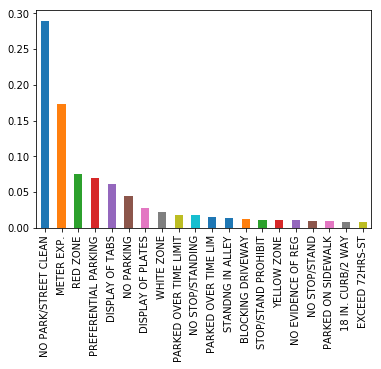

In [47]:
(data['Violation Description'].value_counts()/data.shape[0]).iloc[0:20].plot.bar()